In [1]:
import numpy as np
import cv2
from PIL import Image
import socket
# import shutil
# from skimage import io

class State:
    def __init__(self, state_data):
        self.state_data = np.asarray(state_data)
  
    def process_state(self):
        pass
  
    def get_batch_tensor(self):
        holder = np.asarray(self.state_data)
        holder.reshape((1, ) + holder.shape)
        return holder
  
    def get_individual_tensor(self):
        return np.asarray(self.state_data)

    def get_shape(self):
        return self.state_data.shape
  
    def display(self):
        print(self.state_data)
        
# ------------------------------------

class Frame(State):
    def __init__(self, state_data, crop_factor=None, destination_size=None, vert_cent=0.5):
        State.__init__(self, state_data)
#         self.state_data = self.process_state(crop_factor, vert_cent, destination_shape)
        self.state_data = self.process_state([0.7, 1.0], 0.7, (128,64))
  
    def process_state(self, crop_factor, vert_cent, destination_shape):
        """
        Does all the processing of the frame using the helper functions
        """
        frame = self.crop_frame(self.state_data, crop_factor, vert_cent)
        frame = self.normalise_frame(frame)
        frame = self.gray_scale(frame) # cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        assert len(frame.shape) == 2
        frame = self.downsample_frame(frame, destination_shape)
        return frame

  
    def gray_scale(self, frame, gray_scale_factor=[0.3, 0.3, 0.3]):
        frame = np.dot(frame, np.asarray(gray_scale_factor))
        return frame

    def normalise_frame(self, frame):
        frame = frame.astype('float32') / 255.0
        return frame
  
    def downsample_frame(self, frame, destination_shape):
        """
        downsamples the frame. decreases the resolution
        """
        frame = cv2.resize(np.asarray(frame), dsize=destination_shape, interpolation=cv2.INTER_CUBIC)
        return frame
  
    def crop_frame(self, frame, crop_factor, vert_cent):
        """
        input is the frame
        output is the cropped frame
        crop_factor is the ratio at which you want to crop the height and width(0.8, 0.8)
        cent is the ratio at which the centre of the cropped frame should be
        """
        if crop_factor is None:
          return frame
    
        height_factor = int((crop_factor[0]*frame.shape[0]) // 2)
        width_factor = int((crop_factor[1]*frame.shape[1]) // 2)
        vert_cent = int(frame.shape[0]*vert_cent)
        width_cent = int(frame.shape[1]*0.5)

        frame = frame[vert_cent - height_factor: vert_cent + height_factor, 
                      width_cent - width_factor: width_cent + width_factor]
        return frame

# ------------------------------------
class DataBuffer:
    """
    Keeps track of n latest states 
    """
  
    def __init__(self, size=1):
        self.buffer = []
        self.size = size

    def get_input_tensor(self, in_batch=True):
        arr = np.array(self.buffer)
        if self.size == 1 or in_batch:
            return arr
        else:
            return arr.reshape((1, ) + arr.shape)
    
    def get_input_shape(self):
        return np.asarray(self.current_state[0]).shape

    def assign_to_buffer(self, state):
        if isinstance(state, State):
            state = state.get_individual_tensor()
        if len(self.buffer) >= self.size:
            self.buffer.pop(0)
        self.buffer.append(state)
        
# ------------------------------------

class FrameBuffer(DataBuffer):
    def __init__(self, size = 4):
        DataBuffer.__init__(self, size=size)
    
    def get_input_shape(self):
        return self.get_input_tensor().shape
  
    def get_input_tensor(self, in_batch=True):
        temp = np.array(self.buffer)
        return  temp.transpose((1, 2, 0))
    
    def assign_to_buffer(self, state):
        if isinstance(state, State):
            state = state.get_individual_tensor()
        # if buffer not initialised
        if len(self.buffer) == 0:
            self.buffer = [state]
            return

        if len(self.buffer) >= self.size:
            self.buffer.pop(0)
        
        self.buffer.append(state)

In [2]:
from pathlib import Path
import os
import os.path
import random

class EnvironmentWrapper:
    
    def __init__(self):
        
        
        # initialise comms with the simulator here
        self.sock = socket.socket(socket.AF_INET, socket.SOCK_STREAM) # initialise the socket
        # connect to localhost, port 2345 
        self.sock.bind(("127.0.0.1", 4444))
        self.sock.listen(1)
        print("Waiting to connect to Simulator...")
        self.clientsocket, _ = self.sock.accept() # connect to simulator [BLOCKING]
        print("Connected to simulator!")
        # =========================================
        
        print('Initialising Envorinment...')
        # initialising frame buffer
        self.buffer_size = 4 # could change this 
        
         # this is the FrameBuffer that keeps track of the latest frames.
         #initialising the frame buffer by just giving it multiple copies of the same starting frame
        # =========================================
        
        self.current_state = None
        
        self.current_buffer = None
        
        self.prev_dist = 0
        
        self.time_steps = 0
        
        self.done = False
        
        self.max_time_steps_per_episode = 500 #change this based on the enviorment
        
        # initialise buffer
        self.current_buffer = FrameBuffer(size = self.buffer_size)
        
        # =========================================
        
        
        # Create target directory if it doesn't exist
       
        parent_path = os.path.abspath(os.path.join("", os.pardir))
        self.final_path = parent_path + "/simulation/Screenshots"
        if not os.path.exists(self.final_path):
            os.mkdir(self.final_path)
            print("Directory " , self.final_path,  " Created ")
        else:    
            print("Directory " , self.final_path,  " already exists")
            
        
        # Save scr1 to Screenshots if it doesn't already exist
        if not os.path.exists(self.final_path + '/scr1.png'):
            scr1 = Image.open(self.parent_path + '/simulation/scr1.png', 'r')
            scr1.save(self.final_path + "/scr1.png", "PNG")
        
        
        # reset actually initializes self.current_state, self.current_buffer etc.
        print('resetting Environment...')
        self.reset()
        
        
        
        self.action_space = ['as', 'ar', 'al', 'ds', 'dr', 'dl', 'bs', 'br', 'bl']
        
        print('Init Complete')
    
    
    def get_input_shape(self):
        """
        returns the input shape for the input layer of the network
        """
        return self.current_buffer.get_input_shape()
    
#     def get_state_shape(self):
#         """
#         not to be confused with the input shape. This is the shape of individual state (the shape of an individual processed shape of the environment)
#         """
#         return self.current_state
    
    def get_random_action(self):
        """
        returns a random action to be taken. [steering, acceleration, brake]
        """
        return random.choice(self.action_space)
    
    def get_action_at_index(self, index):
        return self.action_space[index]
    
    def get_num_action_space(self):
        """
        returns the number of permuations of valide actions. For Eg. [steer left, accelerate and no brake] is ONE action
        [steer right, accelerate and brake] is invalid as we cannot accelerate and brake at the same time.
        there are 9 possible actions I think?
        """
        return len(self.action_space)
    
    def reset(self):
        """
        resets the environment. self.done denotes whether the episode is done i.e. the car has crashed or we have stopped it
        """
        self.done = False
        self.time_steps = 0
        
        tup = self.step('reset') # initial step. Says don't do anything but send the first 4 frames and game info
        self.current_state, _, self.done = tup
        return self.current_state[0] # send only the frames
        
    
    def step(self, action):
        """ 
        does the action and returns the reward for that action along with the next state

        This function may get complicated as it has to interact with the car simulator throught sockets.
        """
        self.time_steps += 1
        
        if not self.is_done():
            # if the episode has not ended
            #=======================
            
            # send the action
            self.send_message(action)
            
            # wait for results from that action
            angle, distance, speed, self.done, frames_captured = self.get_game_stats() # blocking line
            # print("5: info:{0}, {1}, {2}, {3}, {4}".format(angle, distance, speed, self.done, frames_captured))
            
            
            # add images from path to current_buffer
            for i in range(1, frames_captured + 1):
                # each Frame object is then assigned to the FrameBuffer class in chronological order
                path = self.final_path + '/scr{0}.png'.format(i)
                self.current_buffer.assign_to_buffer(self.get_frame(path))
            
            buffer_tensor = self.current_buffer.get_input_tensor()
            # ========================================
            
            # calculate reward
            dist_delta = self.prev_dist - distance
            self.prev_dist = distance
            if abs(dist_delta) > 10:
                dist_delta = 5 # if there's too big a negative jump in the distance, the car has passed a checkpoint.
                # so, don't penalise it for that.
 
            reward = (dist_delta * 0.9) - (abs(angle) * 0.1)
            #=================
            
            # A buffer is a collection of consecutive frames that we feed to the NN. These frames are already processed.
            
            # the current state consists of all the information from the environment
            self.current_state = (buffer_tensor, angle, distance, speed)
            
            # this returns the state of the environment after the action has been completed, the reward for the action and if the episode ended.
            return self.current_state , reward, self.done
        else:
            return None
    
    def send_message(self, string):
        self.clientsocket.sendall(string.encode())
    
    def receive_message(self):
        data  = self.clientsocket.recv(256).decode()
        return data
    
    
    def is_done(self):
        """
        returns if the episode is finished
        """
        return self.done
        
    
    def get_frame(self, path: str) -> Frame:
        """
        communicates with the sim to get the latest state/frame. 
        returns a Frame object
        Get image from path then convert to np array then make a frame object
        """
        image = Image.open(path, 'r')
        image.load()
        np_data = np.asarray(image, dtype="float32" )
        return Frame(np_data)
    
    
    # def delete_screenshots(self, folder_path: str) -> None:
    #     """
    #     This method deletes the four screenshots saved in folder_path, along with the entire folder.
    #     Method must be called after all four screenshots are converted to Frame objects.
    #     """
    #     shutil.rmtree(folder_path)
    
    
    def get_current_state():
        """
        get the last n frames from the simulator (they might be stored in a folder by the simulator)
        and store them in a buffer and return them
        """
        return self.current_buff

    
    def get_game_stats(self):
        """
        returns a tuple of angle, distance from checkpoint and speed from the sim. Again requires comms with simulator.
        """
        # wait for info to arrive
        string = self.receive_message()
        
        # process string
        value_list = string.split(", ")
        angle = float(value_list[0])
        distance = float(value_list[1])
        speed = float(value_list[2])
        crashed_state = False
        if value_list[3] == '1':
            crashed_state = True
        frames_captured = int(value_list[4])
        # return tuple of values
        return angle, distance, speed, crashed_state, frames_captured
    
    def close(self):
        """
        in case we need to 'close' the environment
        """
        self.sock.close()
        self.clientsocket.close()


In [3]:
class Agent:
    def __init__(self, environment, network, run_only=False, eps_decay_rate=0.9975,max_exp_rate=1.0, min_exp_rate=0.05):
        self.env = environment # this should be the environment wrapper class
        
        if not run_only:
            self.exp_rate = max_exp_rate     # our network starts off with this exploration rate
        else:
            self.exp_rate = 0.0
            self.min_exp_rate = 0.0
        
        self.min_exp_rate = min_exp_rate  # have at least 0.01 exploration rate at all times
        
        self.decay_rate = eps_decay_rate   # decay the exploration rate at this rate
        
        self.time_step = 0     # keeps track of time steps
        
        self.network = network
    
    def take_action(self, current_state):
        # Implement the epsilon greedy strategy 
        result = random.random()                      # get a random number from 0 to 1 with linear distribution
        if result > self.get_exp_rate():              # if it falls over the explore rate, exploit
            # Get the action with the maximum q-value
            action = self.env.get_action_at_index(
                self.network.get_max_q_value_index(current_state, which_net = 'online', batch=False))  # exploit
        else:                                         # if it falls under the explore rate, explore
            action = self.env.get_random_action()          # explore (generate a random action from the environment class)
            
        self.increment_time_step()                    # increment time step as well as update the decay rate
        next_state, reward, done = self.env.step(action)# finally, take the action and record the reward
        
        return current_state, self.env.action_space.index(action), reward, next_state[0], done  # return an experience Tuple
        
    
    def reset_time_steps(self, i=0):
        self.timesteps = i
    
    def increment_time_step(self):
        self.time_step += 1
    
    def update_epsilon(self):
        if self.exp_rate > self.min_exp_rate:
            self.exp_rate = self.exp_rate * self.decay_rate
        else:
            self.exp_rate = self.min_exp_rate
    
    def get_exp_rate(self):
        return self.exp_rate

In [4]:
from keras import layers, models
import tensorflow as tf
from keras.optimizers import Adam, RMSprop
class NetworkTracker:
    
    def __init__(self, environment, source=True, verbose = True, network_name = None): # pass in the environment which has input shape of the frame
        self.network_name = network_name
        if source:
            self.model = models.load_model(self.network_name)
        else:
            self.model = self.define_model(environment)
        
        self.target_model = None
        self.clone_policy()
        
        self.verbose = 0
        if verbose:
            self.verbose = 1
              
    def define_model(self, env):
        
        inp_layer = layers.Input(env.get_input_shape())
        
        conv_1 = layers.Conv2D(filters=10, 
                                kernel_size=(4,4), 
                                activation='relu')(inp_layer) # first layer takes input shape from the environment
        
        maxpool_1 = layers.MaxPool2D((3, 3))(conv_1)
        
        conv_2 = layers.Conv2D(filters=20, kernel_size = (3, 3), strides=2, activation='relu')(maxpool_1)

        maxpool_2 = layers.MaxPool2D(3, 3)(conv_2)
        
        flatten = layers.Flatten()(maxpool_2)
        
        adv_dense_1 = layers.Dense(64, activation = 'relu')(flatten)
        
        adv_out = layers.Dense(env.get_num_action_space(), activation='linear', name = 'advantage') (adv_dense_1)
        
        val_dense_1 = layers.Dense(32, activation = 'relu')(flatten)
        
        val_out = layers.Dense(1, activation='linear', name = 'value') (val_dense_1)
        
        def q_out(x):
            value = x[0]
            advantage = x[1]
            return value + advantage
        
        q_output = layers.Lambda(q_out)([val_out, adv_out])
        
        model = models.Model(inp_layer, q_output, name='PER_dueling_dqn')
        
        model.compile(optimizer=Adam(lr=0.005), loss='mse')
        return model
    
    def get_q_values(self, states, which_net = 'online', batch = False):
        """
        get q values for specified states.
        INPUTS:
        1. states: the input states
        2. which_net: which net you want the prediction from
        3. batch: true if there are multiple states, false if there is only one state
        """
        if isinstance(states[0], DataBuffer): # if you have a list of buffers, convert them to numpy tensors
            states = np.asarray([i.get_input_tensor(in_batch=True) for i in states])
        
        if (not batch) and (not states.shape[0] == 1):
            states = np.expand_dims(states, axis=0)
        
        output_tensor = None
        
        if which_net == 'online':
            output_tensor = self.model.predict(states) 
        elif which_net == 'target':
            output_tensor = self.target_model.predict(states) 
        
        
        if not batch:
            return output_tensor[0]  # you want to convert the 2 dimensional output to 1 dimension to call argmax
        else:
            return output_tensor
    
    def get_max_q_value_index(self, states, which_net = 'online', batch=False):
        return np.argmax(self.get_q_values(states, which_net=which_net, batch = batch), axis=int(batch))
    
    def fit(self, states_batch, targets_batch):
        """
        Fit the states with the target batch
        """
        self.model.fit(states_batch, targets_batch, verbose=1)
        
    def clone_policy(self):
        """
        Clone the target policy
        """
        self.model.save(self.network_name)
        self.target_model = models.load_model(self.network_name)
                  
    def get_model_summary(self):
        """
        Return a summary of the defined model
        """
        return self.model.summary()
    
    def save_policy(self):
        self.model.save(self.network_name)

In [5]:
# Implementing a SumTree as a binary tree

class SumTree(object):
    data_pointer = 0
    
    # Here we initialize the tree with all nodes = 0, and initialize the data with all values = 0
    def __init__(self, capacity):
        # Number of leaf nodes (final nodes) that contains experiences
        self.capacity = capacity
        
        # Generate the tree with all nodes values = 0
        self.tree = np.zeros(2 * capacity - 1)
        
        # Contains the experiences (so the size of data is capacity)
        self.data = np.zeros(capacity, dtype=object)
        
        # Counter for experiences
        self.exp_counter = 0


    # Here we define function that will add our priority score in the sumtree leaf and add the experience in data:
    def add(self, priority, data):
        tree_index = self.data_pointer + self.capacity - 1  # Look at what index we want to put the experience
        self.data[self.data_pointer] = data   # Update data frame
        self.update (tree_index, priority)  # Update the leaf
        self.data_pointer += 1  # Add 1 to data_pointer

        if self.data_pointer >= self.capacity:  # If we're above the capacity, we go back to first index (we overwrite)
            self.data_pointer = 0
            
        self.exp_counter += 1


    # Update the leaf priority score and propagate the change through tree
    def update(self, tree_index, priority):
        # Change = new priority score - former priority score
        change = priority - self.tree[tree_index]
        self.tree[tree_index] = priority

        # then propagate the change through tree
        while tree_index != 0:
            tree_index = (tree_index - 1) // 2
            self.tree[tree_index] += change


    # Here build a function to get a leaf from our tree. So we'll build a function to get the leaf_index, priority value of that leaf and experience associated with that leaf index:
    def get_leaf(self, v):
        parent_index = 0
        
        while True:
            left_child_index = 2 * parent_index + 1
            right_child_index = left_child_index + 1

            if left_child_index >= len(self.tree): # If we reach bottom, end the search
                leaf_index = parent_index
                break
            else: # downward search, always search for a higher priority node
                if v <= self.tree[left_child_index]:
                    parent_index = left_child_index
                else:
                    v -= self.tree[left_child_index]
                    parent_index = right_child_index

        data_index = leaf_index - self.capacity + 1
        return leaf_index, self.tree[leaf_index], self.data[data_index]


    @property
    def total_priority(self):
        return self.tree[0] # Returns the root node

In [6]:
import random
import pickle

class Memory: # stored as ( state, action, reward, next_state ) in SumTree
    
    # PER_e - Hyperparameter that we use to avoid some experiences to have 0 probability of being taken
    # PER_a - Hyperparameter that we use to make a tradeoff between taking only exp with high priority and sampling randomly
    # PER_b - Hyperparameter for importance-sampling, from initial value increasing to 1
    # increment_per_sampling = 0.001
    # absolute_error_upper = 1.  # clipped abs error
    
    def __init__(self, size, save_path, mem_source, PER_e, PER_a, PER_b, increment, abs_error, upper_priority):
        self.save_path = save_path
        self.tree = SumTree(size)
        self.limit = size
        self.PER_e = PER_e
        self.PER_a = PER_a
        self.PER_b = PER_b
        self.increment_per_sampling = increment
        self.absolute_error_upper = abs_error
        self.upper_priority_limit = upper_priority
        if mem_source is not None:
            # pick up memory from the specified progess folder
            with open(mem_source + '/memory.pkl', 'rb') as file:
                self.tree = pickle.load(file)[:self.limit] # limit the list size based on the memory limit you specify CHANGE SELF.REPLAY TO SOMETHING ELSE
            with open(mem_source + '/exp_counter.pkl', 'rb') as file:
                self.tree.exp_counter = pickle.load(file)
    
    def push(self, experience):
        # Find the max priority
        max_priority = np.max(self.tree.tree[-self.tree.capacity:])

        # If the max priority = 0 we can't put priority = 0 since this experience will never have a chance to be selected so we use a minimum priority
        if max_priority == 0:
            max_priority = self.absolute_error_upper
            
        # We must avoid super-high priority values
        if max_priority > self.upper_priority_limit:
            max_priority = self.upper_priority_limit
            
        # set the max priority for new priority
        self.tree.add(max_priority, experience)


    def is_usable(self, batch_size):
        return self.tree.exp_counter >= 2 * batch_size


    def reset_replay_memory(self):
        self.tree.exp_counter = 0
        self.tree = SumTree(size)


    def save_to_disk(self):
        with open(self.save_path + '/memory.pkl', 'wb') as file:
            pickle.dump(self.tree, file)
        with open(self.save_path + '/exp_counter.pkl', 'wb') as file:
            pickle.dump(self.tree.exp_counter, file)    


    def sample(self, batch_size):
        # Create a minibatch array that will contain the minibatch
        
        # ATTENTION TODO: test this algorithm with dummy priorities!
        b_idx, minibatch, ISWeights = np.empty((batch_size,), dtype=np.int32), [], np.empty((batch_size, 1))
        # minibatch = np.empty((batch_size, 9)) old code
        # b_idx = np.empty((batch_size,), dtype=np.int32) - old code

        # Calculate the priority segment
        priority_segment = self.tree.total_priority / batch_size
        self.PER_b = np.min([1., self.PER_b + self.increment_per_sampling]) # max = 1
        
        min_prob = np.min(self.tree.tree[-self.tree.capacity:]) / self.tree.total_priority # for later calculate ISweights
        
        for i in range(batch_size):
            # A value is uniformly sampled from each range
            a, b = priority_segment * i, priority_segment * (i + 1)
            value = np.random.uniform(a, b)

            # Experience that correspond to each value is retrieved
            index, priority, data = self.tree.get_leaf(value)
            prob = priority / self.tree.total_priority
            ISWeights[i, 0] = np.power(prob / min_prob, -self.PER_b)
            b_idx[i] = index
            minibatch.append([data[0],data[1],data[2],data[3],data[4]])

        return b_idx, minibatch, ISWeights
    
    
    def batch_update(self, tree_idx, abs_errors): 
        abs_errors += self.PER_e  # convert to abs and avoid 0
        clipped_errors = np.minimum(abs_errors, self.absolute_error_upper)
        ps = np.power(clipped_errors, self.PER_a)
        for ti, p in zip(tree_idx, ps):
            self.tree.update(ti, p)


In [7]:
def extract_tensors(sample):
    """
    takes a sample of experiences and converts them into individual tensors.
    """
    states = []
    actions = []
    rewards = []
    next_states = []
    done_tensor = []
    for experience in sample:
        states.append(experience[0])
        actions.append(experience[1])
        rewards.append(experience[2])
        next_states.append(experience[3])
        done_tensor.append(experience[4])
    
    return np.asarray(states), np.asarray(actions), np.asarray(rewards), np.asarray(next_states), np.asarray(done_tensor)

In [8]:
def get_target_batch(states, actions, rewards, next_states, dones, net, gamma):
    assert actions.ndim == 1
    assert rewards.ndim == 1
    assert dones.ndim == 1
    assert len(actions) == len(rewards) == len(dones) == len(states) == len(next_states)
    
    target_q_values = net.get_q_values(states, which_net = 'online', batch = True) # get the q values from the current states
    old_q_values = np.copy(target_q_values) # deep copy of target_q_values
    assert np.all(np.equal(target_q_values, old_q_values))
    
    which_acts = net.get_max_q_value_index(next_states, which_net= 'online', batch = True) # this gives you a list of action indices from which to calculate the loss
    # which_acts is the action we use to select which q value to take from the target q estimates.
    # not to be confused with actual action taken by the agent! this action we assume is the optimal action for state s_t-1
    # not state s_t
    
    # these are the q estimates for state s_(t-1)
    q_estimates = net.get_q_values(next_states, which_net = 'target', batch = True) # get the q estimates from the target net for the next states
    
    for index in range(len(target_q_values)):
        # index indexes the batch axis. 
        # For each experience, calculate the bellman target using Bellman Equation
        q_estimate = q_estimates[index]
        decoupled_action = which_acts[index]
        reward = rewards[index]
        action_taken = actions[index]
        ended = dones[index]      
        
        # bellman equation related target value calculation for DDQNs
        if not ended:
            prev_target = q_estimate[decoupled_action] # if the state is not a terminal state
        else:
            prev_target = 0
        
        # implement the equation, target Q(s, a) = reward + discount_factor * Q(s, argmax(Q*(s)))
        # where Q is the online network and Q* is the target network
        target = reward + gamma * prev_target # this is the bellman target for the state action pair
        
        # assign this target to the corresponding state action pair! 
        target_q_values[index][action_taken] = target # assign the target to the corresponding (state, action) pair

    assert not np.all(np.equal(target_q_values, old_q_values))
    return target_q_values, old_q_values

In [9]:
import matplotlib.pyplot as plt
import os
from tempfile import TemporaryFile
quit = False
import pickle 
def train_agent(contd=True, network_name = None, save_path = 'training_progress', contd_path = None, verbose=True, num_episodes=1500,
                discount = 0.95, batch_size = 64, N = 40, memory_size = 1024, 
                eps_decay_rate=0.9975, max_exp_rate=1.0, min_exp_rate=0.05, max_reward = 1000, 
                PER_e = 0.01, PER_a = 0.6, PER_b = 0.4, increment = 0.001 , abs_error = 1, upper_priority = 3):
    # get all the hyperparameters in one place!
            
     
    # initialise your environment
    env = EnvironmentWrapper()
    
    # initialise your policy and target networks inside net
    net = NetworkTracker(env, source=contd, verbose=verbose, network_name=network_name)
    print(net.get_model_summary())
    
    # initialise your agent that will follow the epsilon greedy strategy
    agent = Agent(env, net, eps_decay_rate=eps_decay_rate, max_exp_rate=max_exp_rate,min_exp_rate=min_exp_rate )    
    
    # initialise Priority Experience Replay memory
    memory = Memory(memory_size, save_path, contd_path, PER_e, PER_a, PER_b, increment, abs_error, upper_priority)
    
    # stores all the total reward per episode
    
    training_stats = []
    epochs = []
    starting_episode = 0
    
    sum_over_ten = 0
    moving_avg = []
    avg_epochs = []
    
    validations = []
    validation_epochs = []
    if contd:
        with open(save_path + '/training_stats.pkl', 'rb') as file:
            epochs, training_stats = pickle.load(file)
#             counter_temp = 0
#             temp_sum = 0
#             t = 0
#             for stat in training_stats:
#                 t += 1
#                 counter_temp += 1
#                 temp_sum += stat
#                 if counter_temp%10 == 0:
#                     counter_temp = 0
#                     avg = temp_sum / 10.0
#                     moving_avg.append(avg)
#                     avg_epochs.append(t)
#                     temp_sum = 0
        
        with open(save_path + '/moving_average.pkl', 'rb') as file:
            avg_epochs, moving_avg = pickle.load(file)          
        
        with open(save_path + '/episode_count.pkl', 'rb') as file:
            starting_episode = pickle.load(file)
            
    # graph display init code
    %matplotlib notebook
    plt.rcParams['animation.html'] = 'jshtml'
    fig = plt.figure()
    subplot = fig.add_subplot(111)
    
    for episode_count in range(starting_episode, num_episodes):
        # uncomment if you want to start the environmet with a random move
        # state = env.step(env.get_random_action())[0]
        valid_episode = False
        
        
        # check if the environment is available to run
        while not valid_episode:
            # keeps track of how many steps has been since the reward hasn't moved
            stuck_counter = 0

            # keeps track of the total reward that we got for this episode
            cumulative_reward = 0

            # keeps track of steps in the episode.
            counter = 0

            # reset environement and record the initial state before every episode
            state = env.reset()

            # store the experiences in a temporary tuple so that we only add them to memory if it was a valid episode.
            temp_exp = []
            stuck = False
            # ==============================
            while not env.is_done() and not stuck and cumulative_reward < max_reward: # run the environment for one episode
                counter += 1
                current_state, action, reward, next_state, done = agent.take_action(state) # let the agent take an action for one time step
                
                cumulative_reward += reward # add the reward to total rewards.
                
                # check if the car is stuck when the reward isn't changing by much
                if abs(reward) < 0.5:
                    stuck_counter += 1
                    if stuck_counter > 7:
                        done = True
                        stuck = True
                else:
                    stuck_counter = 0
                experience = current_state, action, reward, next_state, done # experience tuple 
                state = next_state # update the current state
                # push the experience in memory
                temp_exp.append(experience)
            # ==============================
            
            
            if counter > 5:
                valid_episode = True
                for i in range(len(temp_exp)):
                    memory.push(temp_exp[i])
                
                sum_over_ten += cumulative_reward # to calculate average reward line

        agent.update_epsilon() # update the exploration rate of the agent after each episode

        if memory.is_usable(batch_size):
                tree_idx, experience_batch, ISWeights = memory.sample(batch_size)
                states, actions, rewards, next_states, done_tensor = extract_tensors(experience_batch) # unzips the tensors

                target_batch, old_batch = get_target_batch(states, actions, rewards, next_states, done_tensor, net, discount) # get a batch of target values to fit against
                # assert target_batch.shape == (batch_size, 9) - for debugging
                # assert old_batch.shape == (batch_size, 9) - for debugging
                               
                initial_errors = np.abs(old_batch - target_batch)
                absolute_errors = np.sum(initial_errors, axis=1)
                
                #For debugging, remove later
                print("states:")
                print(states)
                # print("absolute_errors:")
                # print(absolute_errors) 
                print("target_batch:")
                print(target_batch)
        
                memory.batch_update(tree_idx, absolute_errors) # Updating the priorities in SumTree 
                net.fit(states, target_batch) # fit the network

        # append the training stats
        training_stats.append(cumulative_reward)
        epochs.append(episode_count)

        # clone the target policy every N episodes.
        if (episode_count + 1) % N == 0:
            net.clone_policy()
        
        if  (episode_count) % (N*2) == 0: # how often to evaluate the agent.
            performance = evaluate_agent(runs = 5, model_name = network_name, env = env)
            validations.append(performance)
            validation_epochs.append(epochs[-1])
            with open(save_path + '/validation.pkl', 'wb') as file:
                pickle.dump((validation_epochs, validations), file)
            

        # update the training chart every 10 episodes
        if (episode_count + 1) % 10 == 0:
            avg = sum_over_ten / 10.0
            sum_over_ten = 0
            moving_avg.append(avg)
            avg_epochs.append(epochs[-1])
            subplot.plot(epochs, training_stats, color='b')
            subplot.plot(avg_epochs, moving_avg, color = 'r')
            subplot.plot(validation_epochs, validations, color = 'g')
            fig.canvas.draw()
            
            
        # periodically save training progress.
        if (episode_count + 1) % 100 == 0:
            memory.save_to_disk()
            with open(save_path + '/training_stats.pkl', 'wb') as file:
                pickle.dump((epochs, training_stats), file)
            
            with open(save_path + '/moving_average.pkl', 'wb') as file:
                pickle.dump((avg_epochs, moving_avg), file)
            
            with open(save_path + '/episode_count.pkl', 'wb') as file:
                pickle.dump(episode_count, file)
            
            with open(save_path + '/epsilon.pkl', 'wb') as file:
                pickle.dump(agent.exp_rate, file)
            

        # if specified, print stats.
        if verbose:
            print("Episode Count: ", episode_count, "\t Cumulative Reward: ", round(cumulative_reward, 2), "\t eps: ", round(agent.exp_rate, 3), "\t PER_a: ", memory.PER_a)
    
    memory.save_to_disk()
    net.save_policy()
    env.close()
    
    return epochs, training_stats, net





In [10]:
def evaluate_agent(runs, model_name, env = None):
    if env is None:
        env = EnvironmentWrapper()
    net = NetworkTracker(env, source=True, verbose=False, network_name = model_name)
    agent = Agent(env, net, run_only = True)
    
    perf_sum = 0
    for run in range(runs):
        valid_episode = False
        cumulative_reward = 0
        time_steps = 0
        while not valid_episode:
            state = env.reset()
            cumulative_reward = 0
            time_steps = 0
            stuck_counter = 0
            stuck = False
            while not env.is_done() and not stuck:
                _ , action, reward, next_state, done = agent.take_action(state)
                state = next_state
                time_steps += 1
                cumulative_reward += reward 
                if abs(reward) < 0.5:
                    stuck_counter += 1
                    if stuck_counter > 7:
                        done = True
                        stuck = True
                else:
                    stuck_counter = 0
            
            if time_steps > 3:
                valid_episode = True
                cumulative_reward = round(cumulative_reward, 2)
        perf_sum += cumulative_reward
        print('run {0}: cumulative_reward: {1}, ran for: {2} timesteps'.format(run, round(cumulative_reward, 2), time_steps))
    
    avg_perf = float(perf_sum/runs)
    
    print('average performance: ', avg_perf)
#     env.close()
    return avg_perf
    
    

In [16]:
def evaluate_reward_statistics():
    with open('PER_training_progress_3/training_stats.pkl', 'rb') as f:
        x = pickle.load(f)

    total_rewards = x[1]
    num = len(total_rewards)

    sum = 0
    for val in total_rewards:
        sum += val
    average_reward = round(sum // num)
    maximum_reward = round(max(total_rewards))

    print("average_reward: ", average_reward, ", maximum_reward: ", maximum_reward)

Waiting to connect to Simulator...
Connected to simulator!
Initialising Envorinment...
Directory  C:\Users\Sohaib Saqib\Documents\GitHub\SelfDrivingResearch/simulation/Screenshots  already exists
resetting Environment...
Init Complete
Model: "PER_dueling_dqn"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 64, 128, 4)] 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 61, 125, 10)  650         input_1[0][0]                    
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 20, 41, 10)   0           conv2d[0][0]                     
_______________________________________________

<IPython.core.display.Javascript object>


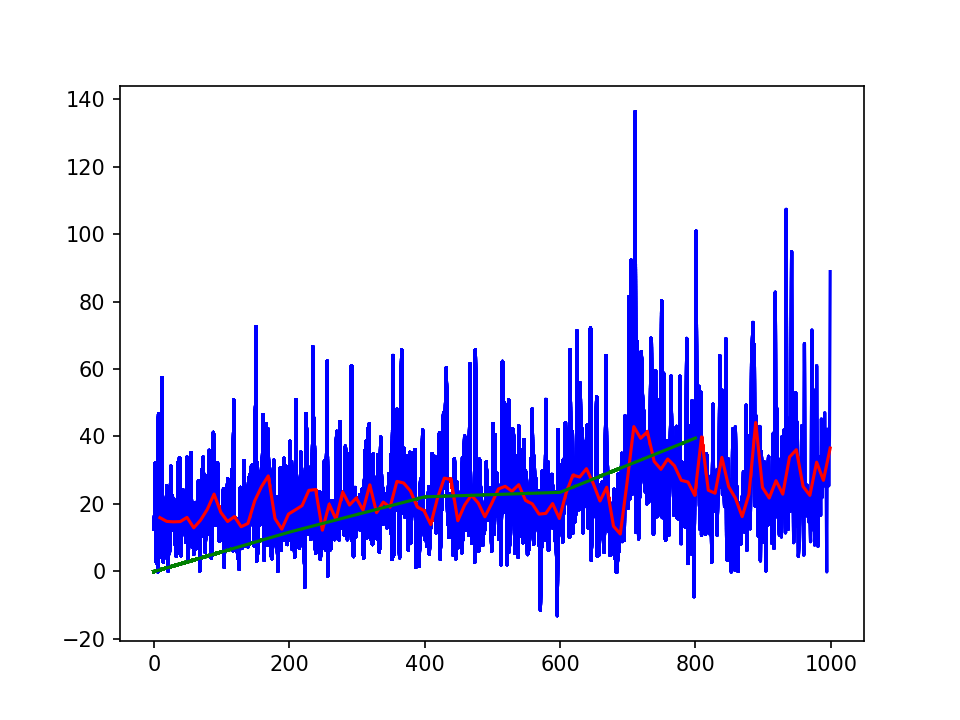

run 0: cumulative_reward: 0.19, ran for: 8 timesteps
run 1: cumulative_reward: -0.38, ran for: 8 timesteps
run 2: cumulative_reward: -0.09, ran for: 8 timesteps
run 3: cumulative_reward: -0.17, ran for: 8 timesteps
run 4: cumulative_reward: -0.05, ran for: 8 timesteps
average performance:  -0.10000000000000002
Episode Count:  0 	 Cumulative Reward:  12.52 	 eps:  0.999 	 PER_a:  0.2
Episode Count:  1 	 Cumulative Reward:  14.98 	 eps:  0.998 	 PER_a:  0.2
Episode Count:  2 	 Cumulative Reward:  32.05 	 eps:  0.997 	 PER_a:  0.2
Episode Count:  3 	 Cumulative Reward:  11.07 	 eps:  0.996 	 PER_a:  0.2
Episode Count:  4 	 Cumulative Reward:  2.53 	 eps:  0.995 	 PER_a:  0.2
Episode Count:  5 	 Cumulative Reward:  16.26 	 eps:  0.994 	 PER_a:  0.2
Episode Count:  6 	 Cumulative Reward:  -0.17 	 eps:  0.993 	 PER_a:  0.2
Episode Count:  7 	 Cumulative Reward:  46.64 	 eps:  0.992 	 PER_a:  0.2
Episode Count:  8 	 Cumulative Reward:  15.88 	 eps:  0.991 	 PER_a:  0.2
Episode Count:  9 	 Cum

<ipython-input-6-0492093f867f>:83: RuntimeWarning: divide by zero encountered in double_scalars
  ISWeights[i, 0] = np.power(prob / min_prob, -self.PER_b)


states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0.85180066]
   [0.84597642 0.84685681 0.85527001 0.85332032]]

  ...

  [[0.48770783 0.48794278 0.37239991 0.42665066]
   [0.41790354 0.50633589 0

16/16 [==============================] - 1s 91ms/step - loss: 1.6287
Episode Count:  77 	 Cumulative Reward:  18.87 	 eps:  0.925 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0.

16/16 [==============================] - 1s 89ms/step - loss: 0.5145
Episode Count:  78 	 Cumulative Reward:  12.49 	 eps:  0.924 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0.

16/16 [==============================] - 1s 92ms/step - loss: 0.5121
Episode Count:  79 	 Cumulative Reward:  10.89 	 eps:  0.923 	 PER_a:  0.2
states:
[[[[ 3.69435501e-01  1.68135270e-01  1.61535625e-01  1.68158268e-01]
   [ 1.98492123e-01  2.54691518e-01  2.66251016e-01  2.52665045e-01]
   [ 9.96869943e-02  2.69049831e-01  2.02573749e-01  2.78650200e-01]
   ...
   [ 8.02674814e-01  8.02797309e-01  8.10951363e-01  8.15698247e-01]
   [ 8.02585421e-01  8.06367164e-01  8.14044255e-01  8.18828856e-01]
   [ 8.05435748e-01  8.06516511e-01  8.14732730e-01  8.20467018e-01]]

  [[ 2.93009401e-01  3.54608835e-01  2.48512255e-01  3.52716994e-01]
   [ 5.47814077e-02  2.64667940e-01  2.70251034e-01  2.71096565e-01]
   [ 6.47106079e-02  3.36697522e-01  3.57444435e-01  3.65505368e-01]
   ...
   [ 8.22828236e-01  8.23295143e-01  8.31539778e-01  8.37508184e-01]
   [ 8.23324048e-01  8.26215767e-01  8.34228131e-01  8.38151794e-01]
   [ 8.25676989e-01  8.26828256e-01  8.35088754e-01  8.40123175e-01]]

  

16/16 [==============================] - 1s 93ms/step - loss: 0.4703
Episode Count:  80 	 Cumulative Reward:  25.88 	 eps:  0.922 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0.

16/16 [==============================] - 1s 91ms/step - loss: 0.5161
Episode Count:  81 	 Cumulative Reward:  15.68 	 eps:  0.921 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0.

16/16 [==============================] - 1s 92ms/step - loss: 0.4274
Episode Count:  82 	 Cumulative Reward:  35.85 	 eps:  0.92 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0.8

16/16 [==============================] - 1s 93ms/step - loss: 0.3358
Episode Count:  83 	 Cumulative Reward:  28.16 	 eps:  0.919 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0.

16/16 [==============================] - 1s 91ms/step - loss: 0.3105
Episode Count:  84 	 Cumulative Reward:  15.63 	 eps:  0.918 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0.

16/16 [==============================] - 1s 93ms/step - loss: 0.3351
Episode Count:  85 	 Cumulative Reward:  3.97 	 eps:  0.918 	 PER_a:  0.2
states:
[[[[ 1.81023121e-01  1.12366598e-01  3.78914836e-01  2.52971221e-01]
   [ 2.18630757e-01  3.86055647e-01  2.79696599e-01  3.69361920e-01]
   [ 2.97727095e-01  3.05447551e-01  1.00359770e-01  3.28734643e-01]
   ...
   [ 8.20309239e-01  8.00254622e-01  8.07376224e-01  4.04217713e-01]
   [ 8.21566281e-01  8.00962335e-01  8.07262739e-01  2.67976919e-01]
   [ 8.23814639e-01  8.03783531e-01  8.09992315e-01  8.09614538e-01]]

  [[ 3.80729436e-01  8.71748897e-02  1.37702936e-01  3.26748541e-01]
   [ 2.43606715e-01  1.99859537e-01  2.00657915e-01  3.81053530e-01]
   [ 3.40099660e-01  2.15435090e-01  2.28810320e-01  3.15238934e-01]
   ...
   [ 8.41005078e-01  8.21064946e-01  8.26200802e-01  4.51983473e-01]
   [ 8.40971106e-01  8.22185923e-01  8.28373519e-01  8.38303330e-01]
   [ 8.41681103e-01  8.24194672e-01  8.29206401e-01  8.38592961e-01]]

  [

16/16 [==============================] - 1s 91ms/step - loss: 0.3323
Episode Count:  86 	 Cumulative Reward:  7.35 	 eps:  0.917 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0.8

16/16 [==============================] - 1s 92ms/step - loss: 0.3407
Episode Count:  87 	 Cumulative Reward:  18.0 	 eps:  0.916 	 PER_a:  0.2
states:
[[[[ 3.69435501e-01  1.68135270e-01  1.61535625e-01  1.68158268e-01]
   [ 1.98492123e-01  2.54691518e-01  2.66251016e-01  2.52665045e-01]
   [ 9.96869943e-02  2.69049831e-01  2.02573749e-01  2.78650200e-01]
   ...
   [ 8.02674814e-01  8.02797309e-01  8.10951363e-01  8.15698247e-01]
   [ 8.02585421e-01  8.06367164e-01  8.14044255e-01  8.18828856e-01]
   [ 8.05435748e-01  8.06516511e-01  8.14732730e-01  8.20467018e-01]]

  [[ 2.93009401e-01  3.54608835e-01  2.48512255e-01  3.52716994e-01]
   [ 5.47814077e-02  2.64667940e-01  2.70251034e-01  2.71096565e-01]
   [ 6.47106079e-02  3.36697522e-01  3.57444435e-01  3.65505368e-01]
   ...
   [ 8.22828236e-01  8.23295143e-01  8.31539778e-01  8.37508184e-01]
   [ 8.23324048e-01  8.26215767e-01  8.34228131e-01  8.38151794e-01]
   [ 8.25676989e-01  8.26828256e-01  8.35088754e-01  8.40123175e-01]]

  [

16/16 [==============================] - 1s 92ms/step - loss: 0.3414
Episode Count:  88 	 Cumulative Reward:  41.22 	 eps:  0.915 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0.

16/16 [==============================] - 1s 92ms/step - loss: 0.3271
Episode Count:  89 	 Cumulative Reward:  37.31 	 eps:  0.914 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0.

16/16 [==============================] - 1s 92ms/step - loss: 0.3175
Episode Count:  90 	 Cumulative Reward:  16.58 	 eps:  0.913 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0.

16/16 [==============================] - 1s 92ms/step - loss: 0.3241
Episode Count:  91 	 Cumulative Reward:  13.67 	 eps:  0.912 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0.

16/16 [==============================] - 1s 91ms/step - loss: 0.2785
Episode Count:  92 	 Cumulative Reward:  16.32 	 eps:  0.911 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0.

16/16 [==============================] - 1s 91ms/step - loss: 0.2570
Episode Count:  93 	 Cumulative Reward:  21.35 	 eps:  0.91 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0.8

16/16 [==============================] - 1s 92ms/step - loss: 0.2395
Episode Count:  94 	 Cumulative Reward:  32.17 	 eps:  0.909 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0.

16/16 [==============================] - 1s 91ms/step - loss: 0.2137
Episode Count:  95 	 Cumulative Reward:  19.53 	 eps:  0.908 	 PER_a:  0.2
states:
[[[[0.29910761 0.33206036 0.3181493  0.23592984]
   [0.07286956 0.32988039 0.39939199 0.2578644 ]
   [0.07570232 0.27475223 0.29527804 0.30925221]
   ...
   [0.20417385 0.83068508 0.34467848 0.20541161]
   [0.6463748  0.43664782 0.31028986 0.17982709]
   [0.86931768 0.36524067 0.1641     0.88496654]]

  [[0.24288652 0.33227599 0.37037996 0.29388021]
   [0.12074056 0.34627628 0.3396828  0.32371356]
   [0.07671836 0.34159225 0.31399057 0.23897904]
   ...
   [0.85088818 0.60245014 0.65126933 0.397177  ]
   [0.83623377 0.62698177 0.75238807 0.06666571]
   [0.83744169 0.59101224 0.50131613 0.63589186]]

  [[0.06746793 0.43654127 0.20112373 0.26646245]
   [0.06857131 0.31518222 0.23952267 0.27625643]
   [0.27025896 0.24604504 0.39940431 0.32884117]
   ...
   [0.85817782 0.66104049 0.7487225  0.68745077]
   [0.85679464 0.63421319 0.72549992 0.

16/16 [==============================] - 1s 93ms/step - loss: 0.2043
Episode Count:  96 	 Cumulative Reward:  17.88 	 eps:  0.908 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0.

16/16 [==============================] - 2s 94ms/step - loss: 0.1837
Episode Count:  97 	 Cumulative Reward:  8.93 	 eps:  0.907 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0.8

16/16 [==============================] - 1s 91ms/step - loss: 0.1972
Episode Count:  98 	 Cumulative Reward:  9.98 	 eps:  0.906 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0.8

16/16 [==============================] - 1s 92ms/step - loss: 0.1728
Episode Count:  99 	 Cumulative Reward:  18.2 	 eps:  0.905 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0.8

16/16 [==============================] - 1s 93ms/step - loss: 0.8276
Episode Count:  100 	 Cumulative Reward:  15.21 	 eps:  0.904 	 PER_a:  0.2
states:
[[[[ 0.18102312  0.1123666   0.37891484  0.25297122]
   [ 0.21863076  0.38605565  0.2796966   0.36936192]
   [ 0.2977271   0.30544755  0.10035977  0.32873464]
   ...
   [ 0.82030924  0.80025462  0.80737622  0.40421771]
   [ 0.82156628  0.80096233  0.80726274  0.26797692]
   [ 0.82381464  0.80378353  0.80999231  0.80961454]]

  [[ 0.38072944  0.08717489  0.13770294  0.32674854]
   [ 0.24360672  0.19985954  0.20065792  0.38105353]
   [ 0.34009966  0.21543509  0.22881032  0.31523893]
   ...
   [ 0.84100508  0.82106495  0.8262008   0.45198347]
   [ 0.84097111  0.82218592  0.82837352  0.83830333]
   [ 0.8416811   0.82419467  0.8292064   0.83859296]]

  [[ 0.30674823  0.06708053  0.09801291  0.19910203]
   [ 0.38158859  0.17647322  0.07312181  0.33297291]
   [ 0.06398324  0.28795152  0.09346498  0.36916726]
   ...
   [ 0.84623043  0.84097445

16/16 [==============================] - 1s 93ms/step - loss: 0.7619
Episode Count:  101 	 Cumulative Reward:  17.35 	 eps:  0.903 	 PER_a:  0.2
states:
[[[[ 0.3694355   0.16813527  0.16153562  0.16815827]
   [ 0.19849212  0.25469152  0.26625102  0.25266504]
   [ 0.09968699  0.26904983  0.20257375  0.2786502 ]
   ...
   [ 0.80267481  0.80279731  0.81095136  0.81569825]
   [ 0.80258542  0.80636716  0.81404425  0.81882886]
   [ 0.80543575  0.80651651  0.81473273  0.82046702]]

  [[ 0.2930094   0.35460884  0.24851226  0.35271699]
   [ 0.05478141  0.26466794  0.27025103  0.27109657]
   [ 0.06471061  0.33669752  0.35744444  0.36550537]
   ...
   [ 0.82282824  0.82329514  0.83153978  0.83750818]
   [ 0.82332405  0.82621577  0.83422813  0.83815179]
   [ 0.82567699  0.82682826  0.83508875  0.84012317]]

  [[ 0.24006615  0.29639746  0.32501911  0.3026031 ]
   [ 0.19498037  0.2271667   0.39420695  0.37704656]
   [ 0.04960353  0.06519448  0.07182824  0.06517901]
   ...
   [ 0.84332739  0.84554187

16/16 [==============================] - 1s 93ms/step - loss: 0.7076
Episode Count:  102 	 Cumulative Reward:  11.54 	 eps:  0.902 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0

16/16 [==============================] - 1s 92ms/step - loss: 0.6196
Episode Count:  103 	 Cumulative Reward:  24.48 	 eps:  0.901 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0

16/16 [==============================] - 1s 93ms/step - loss: 0.5324
Episode Count:  104 	 Cumulative Reward:  1.21 	 eps:  0.9 	 PER_a:  0.2
states:
[[[[ 2.99107614e-01  3.32060356e-01  3.18149302e-01  2.35929842e-01]
   [ 7.28695641e-02  3.29880392e-01  3.99391994e-01  2.57864396e-01]
   [ 7.57023234e-02  2.74752234e-01  2.95278045e-01  3.09252207e-01]
   ...
   [ 2.04173855e-01  8.30685079e-01  3.44678476e-01  2.05411613e-01]
   [ 6.46374803e-01  4.36647819e-01  3.10289864e-01  1.79827090e-01]
   [ 8.69317680e-01  3.65240673e-01  1.64099998e-01  8.84966535e-01]]

  [[ 2.42886516e-01  3.32275990e-01  3.70379957e-01  2.93880206e-01]
   [ 1.20740556e-01  3.46276279e-01  3.39682799e-01  3.23713564e-01]
   [ 7.67183606e-02  3.41592245e-01  3.13990572e-01  2.38979039e-01]
   ...
   [ 8.50888178e-01  6.02450137e-01  6.51269329e-01  3.97177003e-01]
   [ 8.36233766e-01  6.26981770e-01  7.52388073e-01  6.66657110e-02]
   [ 8.37441695e-01  5.91012238e-01  5.01316128e-01  6.35891864e-01]]

  [[

16/16 [==============================] - 2s 96ms/step - loss: 0.4713
Episode Count:  105 	 Cumulative Reward:  14.62 	 eps:  0.899 	 PER_a:  0.2
states:
[[[[ 3.69435501e-01  1.68135270e-01  1.61535625e-01  1.68158268e-01]
   [ 1.98492123e-01  2.54691518e-01  2.66251016e-01  2.52665045e-01]
   [ 9.96869943e-02  2.69049831e-01  2.02573749e-01  2.78650200e-01]
   ...
   [ 8.02674814e-01  8.02797309e-01  8.10951363e-01  8.15698247e-01]
   [ 8.02585421e-01  8.06367164e-01  8.14044255e-01  8.18828856e-01]
   [ 8.05435748e-01  8.06516511e-01  8.14732730e-01  8.20467018e-01]]

  [[ 2.93009401e-01  3.54608835e-01  2.48512255e-01  3.52716994e-01]
   [ 5.47814077e-02  2.64667940e-01  2.70251034e-01  2.71096565e-01]
   [ 6.47106079e-02  3.36697522e-01  3.57444435e-01  3.65505368e-01]
   ...
   [ 8.22828236e-01  8.23295143e-01  8.31539778e-01  8.37508184e-01]
   [ 8.23324048e-01  8.26215767e-01  8.34228131e-01  8.38151794e-01]
   [ 8.25676989e-01  8.26828256e-01  8.35088754e-01  8.40123175e-01]]

 

16/16 [==============================] - 1s 92ms/step - loss: 0.4546
Episode Count:  106 	 Cumulative Reward:  8.79 	 eps:  0.898 	 PER_a:  0.2
states:
[[[[0.29910761 0.33206036 0.3181493  0.23592984]
   [0.07286956 0.32988039 0.39939199 0.2578644 ]
   [0.07570232 0.27475223 0.29527804 0.30925221]
   ...
   [0.20417385 0.83068508 0.34467848 0.20541161]
   [0.6463748  0.43664782 0.31028986 0.17982709]
   [0.86931768 0.36524067 0.1641     0.88496654]]

  [[0.24288652 0.33227599 0.37037996 0.29388021]
   [0.12074056 0.34627628 0.3396828  0.32371356]
   [0.07671836 0.34159225 0.31399057 0.23897904]
   ...
   [0.85088818 0.60245014 0.65126933 0.397177  ]
   [0.83623377 0.62698177 0.75238807 0.06666571]
   [0.83744169 0.59101224 0.50131613 0.63589186]]

  [[0.06746793 0.43654127 0.20112373 0.26646245]
   [0.06857131 0.31518222 0.23952267 0.27625643]
   [0.27025896 0.24604504 0.39940431 0.32884117]
   ...
   [0.85817782 0.66104049 0.7487225  0.68745077]
   [0.85679464 0.63421319 0.72549992 0.

16/16 [==============================] - 1s 93ms/step - loss: 0.4813
Episode Count:  107 	 Cumulative Reward:  14.28 	 eps:  0.898 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0

16/16 [==============================] - 1s 93ms/step - loss: 0.4749
Episode Count:  108 	 Cumulative Reward:  12.82 	 eps:  0.897 	 PER_a:  0.2
states:
[[[[ 0.29910761  0.33206036  0.3181493   0.23592984]
   [ 0.07286956  0.32988039  0.39939199  0.2578644 ]
   [ 0.07570232  0.27475223  0.29527804  0.30925221]
   ...
   [ 0.20417385  0.83068508  0.34467848  0.20541161]
   [ 0.6463748   0.43664782  0.31028986  0.17982709]
   [ 0.86931768  0.36524067  0.1641      0.88496654]]

  [[ 0.24288652  0.33227599  0.37037996  0.29388021]
   [ 0.12074056  0.34627628  0.3396828   0.32371356]
   [ 0.07671836  0.34159225  0.31399057  0.23897904]
   ...
   [ 0.85088818  0.60245014  0.65126933  0.397177  ]
   [ 0.83623377  0.62698177  0.75238807  0.06666571]
   [ 0.83744169  0.59101224  0.50131613  0.63589186]]

  [[ 0.06746793  0.43654127  0.20112373  0.26646245]
   [ 0.06857131  0.31518222  0.23952267  0.27625643]
   [ 0.27025896  0.24604504  0.39940431  0.32884117]
   ...
   [ 0.85817782  0.66104049

16/16 [==============================] - 1s 93ms/step - loss: 0.3673
Episode Count:  109 	 Cumulative Reward:  27.35 	 eps:  0.896 	 PER_a:  0.2
states:
[[[[0.29910761 0.33206036 0.3181493  0.23592984]
   [0.07286956 0.32988039 0.39939199 0.2578644 ]
   [0.07570232 0.27475223 0.29527804 0.30925221]
   ...
   [0.20417385 0.83068508 0.34467848 0.20541161]
   [0.6463748  0.43664782 0.31028986 0.17982709]
   [0.86931768 0.36524067 0.1641     0.88496654]]

  [[0.24288652 0.33227599 0.37037996 0.29388021]
   [0.12074056 0.34627628 0.3396828  0.32371356]
   [0.07671836 0.34159225 0.31399057 0.23897904]
   ...
   [0.85088818 0.60245014 0.65126933 0.397177  ]
   [0.83623377 0.62698177 0.75238807 0.06666571]
   [0.83744169 0.59101224 0.50131613 0.63589186]]

  [[0.06746793 0.43654127 0.20112373 0.26646245]
   [0.06857131 0.31518222 0.23952267 0.27625643]
   [0.27025896 0.24604504 0.39940431 0.32884117]
   ...
   [0.85817782 0.66104049 0.7487225  0.68745077]
   [0.85679464 0.63421319 0.72549992 0

16/16 [==============================] - 1s 93ms/step - loss: 0.3737
Episode Count:  110 	 Cumulative Reward:  7.03 	 eps:  0.895 	 PER_a:  0.2
states:
[[[[ 1.81023121e-01  1.12366598e-01  3.78914836e-01  2.52971221e-01]
   [ 2.18630757e-01  3.86055647e-01  2.79696599e-01  3.69361920e-01]
   [ 2.97727095e-01  3.05447551e-01  1.00359770e-01  3.28734643e-01]
   ...
   [ 8.20309239e-01  8.00254622e-01  8.07376224e-01  4.04217713e-01]
   [ 8.21566281e-01  8.00962335e-01  8.07262739e-01  2.67976919e-01]
   [ 8.23814639e-01  8.03783531e-01  8.09992315e-01  8.09614538e-01]]

  [[ 3.80729436e-01  8.71748897e-02  1.37702936e-01  3.26748541e-01]
   [ 2.43606715e-01  1.99859537e-01  2.00657915e-01  3.81053530e-01]
   [ 3.40099660e-01  2.15435090e-01  2.28810320e-01  3.15238934e-01]
   ...
   [ 8.41005078e-01  8.21064946e-01  8.26200802e-01  4.51983473e-01]
   [ 8.40971106e-01  8.22185923e-01  8.28373519e-01  8.38303330e-01]
   [ 8.41681103e-01  8.24194672e-01  8.29206401e-01  8.38592961e-01]]

  

16/16 [==============================] - 1s 93ms/step - loss: 0.3486
Episode Count:  111 	 Cumulative Reward:  8.56 	 eps:  0.894 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0.

16/16 [==============================] - 1s 93ms/step - loss: 0.3281
Episode Count:  112 	 Cumulative Reward:  11.44 	 eps:  0.893 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0

16/16 [==============================] - 1s 92ms/step - loss: 0.3232
Episode Count:  113 	 Cumulative Reward:  17.64 	 eps:  0.892 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0

16/16 [==============================] - 1s 93ms/step - loss: 0.3027
Episode Count:  114 	 Cumulative Reward:  13.5 	 eps:  0.891 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0.

16/16 [==============================] - 2s 94ms/step - loss: 0.3231
Episode Count:  115 	 Cumulative Reward:  30.05 	 eps:  0.89 	 PER_a:  0.2
states:
[[[[ 0.29910761  0.33206036  0.3181493   0.23592984]
   [ 0.07286956  0.32988039  0.39939199  0.2578644 ]
   [ 0.07570232  0.27475223  0.29527804  0.30925221]
   ...
   [ 0.20417385  0.83068508  0.34467848  0.20541161]
   [ 0.6463748   0.43664782  0.31028986  0.17982709]
   [ 0.86931768  0.36524067  0.1641      0.88496654]]

  [[ 0.24288652  0.33227599  0.37037996  0.29388021]
   [ 0.12074056  0.34627628  0.3396828   0.32371356]
   [ 0.07671836  0.34159225  0.31399057  0.23897904]
   ...
   [ 0.85088818  0.60245014  0.65126933  0.397177  ]
   [ 0.83623377  0.62698177  0.75238807  0.06666571]
   [ 0.83744169  0.59101224  0.50131613  0.63589186]]

  [[ 0.06746793  0.43654127  0.20112373  0.26646245]
   [ 0.06857131  0.31518222  0.23952267  0.27625643]
   [ 0.27025896  0.24604504  0.39940431  0.32884117]
   ...
   [ 0.85817782  0.66104049 

16/16 [==============================] - 2s 94ms/step - loss: 0.3021
Episode Count:  116 	 Cumulative Reward:  10.52 	 eps:  0.89 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0.

16/16 [==============================] - 1s 93ms/step - loss: 0.2882
Episode Count:  117 	 Cumulative Reward:  6.08 	 eps:  0.889 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0.

16/16 [==============================] - 1s 92ms/step - loss: 0.2517
Episode Count:  118 	 Cumulative Reward:  50.82 	 eps:  0.888 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0

16/16 [==============================] - 1s 93ms/step - loss: 0.2675
Episode Count:  119 	 Cumulative Reward:  6.61 	 eps:  0.887 	 PER_a:  0.2
states:
[[[[0.29910761 0.33206036 0.3181493  0.23592984]
   [0.07286956 0.32988039 0.39939199 0.2578644 ]
   [0.07570232 0.27475223 0.29527804 0.30925221]
   ...
   [0.20417385 0.83068508 0.34467848 0.20541161]
   [0.6463748  0.43664782 0.31028986 0.17982709]
   [0.86931768 0.36524067 0.1641     0.88496654]]

  [[0.24288652 0.33227599 0.37037996 0.29388021]
   [0.12074056 0.34627628 0.3396828  0.32371356]
   [0.07671836 0.34159225 0.31399057 0.23897904]
   ...
   [0.85088818 0.60245014 0.65126933 0.397177  ]
   [0.83623377 0.62698177 0.75238807 0.06666571]
   [0.83744169 0.59101224 0.50131613 0.63589186]]

  [[0.06746793 0.43654127 0.20112373 0.26646245]
   [0.06857131 0.31518222 0.23952267 0.27625643]
   [0.27025896 0.24604504 0.39940431 0.32884117]
   ...
   [0.85817782 0.66104049 0.7487225  0.68745077]
   [0.85679464 0.63421319 0.72549992 0.

16/16 [==============================] - 1s 94ms/step - loss: 0.2591
Episode Count:  120 	 Cumulative Reward:  15.73 	 eps:  0.886 	 PER_a:  0.2
states:
[[[[0.29910761 0.33206036 0.3181493  0.23592984]
   [0.07286956 0.32988039 0.39939199 0.2578644 ]
   [0.07570232 0.27475223 0.29527804 0.30925221]
   ...
   [0.20417385 0.83068508 0.34467848 0.20541161]
   [0.6463748  0.43664782 0.31028986 0.17982709]
   [0.86931768 0.36524067 0.1641     0.88496654]]

  [[0.24288652 0.33227599 0.37037996 0.29388021]
   [0.12074056 0.34627628 0.3396828  0.32371356]
   [0.07671836 0.34159225 0.31399057 0.23897904]
   ...
   [0.85088818 0.60245014 0.65126933 0.397177  ]
   [0.83623377 0.62698177 0.75238807 0.06666571]
   [0.83744169 0.59101224 0.50131613 0.63589186]]

  [[0.06746793 0.43654127 0.20112373 0.26646245]
   [0.06857131 0.31518222 0.23952267 0.27625643]
   [0.27025896 0.24604504 0.39940431 0.32884117]
   ...
   [0.85817782 0.66104049 0.7487225  0.68745077]
   [0.85679464 0.63421319 0.72549992 0

16/16 [==============================] - 2s 94ms/step - loss: 0.3031
Episode Count:  121 	 Cumulative Reward:  15.3 	 eps:  0.885 	 PER_a:  0.2
states:
[[[[ 0.18102312  0.1123666   0.37891484  0.25297122]
   [ 0.21863076  0.38605565  0.2796966   0.36936192]
   [ 0.2977271   0.30544755  0.10035977  0.32873464]
   ...
   [ 0.82030924  0.80025462  0.80737622  0.40421771]
   [ 0.82156628  0.80096233  0.80726274  0.26797692]
   [ 0.82381464  0.80378353  0.80999231  0.80961454]]

  [[ 0.38072944  0.08717489  0.13770294  0.32674854]
   [ 0.24360672  0.19985954  0.20065792  0.38105353]
   [ 0.34009966  0.21543509  0.22881032  0.31523893]
   ...
   [ 0.84100508  0.82106495  0.8262008   0.45198347]
   [ 0.84097111  0.82218592  0.82837352  0.83830333]
   [ 0.8416811   0.82419467  0.8292064   0.83859296]]

  [[ 0.30674823  0.06708053  0.09801291  0.19910203]
   [ 0.38158859  0.17647322  0.07312181  0.33297291]
   [ 0.06398324  0.28795152  0.09346498  0.36916726]
   ...
   [ 0.84623043  0.84097445 

16/16 [==============================] - 2s 94ms/step - loss: 0.2423
Episode Count:  122 	 Cumulative Reward:  15.65 	 eps:  0.884 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0

16/16 [==============================] - 1s 93ms/step - loss: 0.2000
Episode Count:  123 	 Cumulative Reward:  8.87 	 eps:  0.883 	 PER_a:  0.2
states:
[[[[ 0.18102312  0.1123666   0.37891484  0.25297122]
   [ 0.21863076  0.38605565  0.2796966   0.36936192]
   [ 0.2977271   0.30544755  0.10035977  0.32873464]
   ...
   [ 0.82030924  0.80025462  0.80737622  0.40421771]
   [ 0.82156628  0.80096233  0.80726274  0.26797692]
   [ 0.82381464  0.80378353  0.80999231  0.80961454]]

  [[ 0.38072944  0.08717489  0.13770294  0.32674854]
   [ 0.24360672  0.19985954  0.20065792  0.38105353]
   [ 0.34009966  0.21543509  0.22881032  0.31523893]
   ...
   [ 0.84100508  0.82106495  0.8262008   0.45198347]
   [ 0.84097111  0.82218592  0.82837352  0.83830333]
   [ 0.8416811   0.82419467  0.8292064   0.83859296]]

  [[ 0.30674823  0.06708053  0.09801291  0.19910203]
   [ 0.38158859  0.17647322  0.07312181  0.33297291]
   [ 0.06398324  0.28795152  0.09346498  0.36916726]
   ...
   [ 0.84623043  0.84097445 

16/16 [==============================] - 2s 94ms/step - loss: 0.3045
Episode Count:  124 	 Cumulative Reward:  3.77 	 eps:  0.882 	 PER_a:  0.2
states:
[[[[ 0.29910761  0.33206036  0.3181493   0.23592984]
   [ 0.07286956  0.32988039  0.39939199  0.2578644 ]
   [ 0.07570232  0.27475223  0.29527804  0.30925221]
   ...
   [ 0.20417385  0.83068508  0.34467848  0.20541161]
   [ 0.6463748   0.43664782  0.31028986  0.17982709]
   [ 0.86931768  0.36524067  0.1641      0.88496654]]

  [[ 0.24288652  0.33227599  0.37037996  0.29388021]
   [ 0.12074056  0.34627628  0.3396828   0.32371356]
   [ 0.07671836  0.34159225  0.31399057  0.23897904]
   ...
   [ 0.85088818  0.60245014  0.65126933  0.397177  ]
   [ 0.83623377  0.62698177  0.75238807  0.06666571]
   [ 0.83744169  0.59101224  0.50131613  0.63589186]]

  [[ 0.06746793  0.43654127  0.20112373  0.26646245]
   [ 0.06857131  0.31518222  0.23952267  0.27625643]
   [ 0.27025896  0.24604504  0.39940431  0.32884117]
   ...
   [ 0.85817782  0.66104049 

16/16 [==============================] - 2s 94ms/step - loss: 0.3430
Episode Count:  125 	 Cumulative Reward:  13.01 	 eps:  0.882 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0

16/16 [==============================] - 1s 93ms/step - loss: 0.2514
Episode Count:  126 	 Cumulative Reward:  0.65 	 eps:  0.881 	 PER_a:  0.2
states:
[[[[0.25218326 0.21051936 0.21828258 0.21392199]
   [0.3112877  0.15821149 0.23172767 0.23355749]
   [0.18043167 0.21910354 0.19437516 0.15829924]
   ...
   [0.31007626 0.31690546 0.20850386 0.17564246]
   [0.15834165 0.607282   0.18077616 0.10481673]
   [0.85987177 0.26778869 0.83010114 0.89144379]]

  [[0.19051472 0.21462067 0.22833277 0.1716136 ]
   [0.19980562 0.1983573  0.22403997 0.17660182]
   [0.27359597 0.18484761 0.24695975 0.21118718]
   ...
   [0.67788795 0.64755673 0.36133061 0.05480591]
   [0.44089912 0.48168166 0.02266982 0.07545301]
   [0.70793457 0.7265202  0.65205302 0.61668297]]

  [[0.33087589 0.24075076 0.26965592 0.13685575]
   [0.24027129 0.202756   0.26511789 0.11087594]
   [0.25840695 0.16639181 0.23984153 0.16826979]
   ...
   [0.72699842 0.71328278 0.65454592 0.71564256]
   [0.67083389 0.70808544 0.62082319 0.

16/16 [==============================] - 2s 94ms/step - loss: 0.2327
Episode Count:  127 	 Cumulative Reward:  12.56 	 eps:  0.88 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0.

16/16 [==============================] - 2s 94ms/step - loss: 0.2074
Episode Count:  128 	 Cumulative Reward:  24.89 	 eps:  0.879 	 PER_a:  0.2
states:
[[[[ 0.29910761  0.33206036  0.3181493   0.23592984]
   [ 0.07286956  0.32988039  0.39939199  0.2578644 ]
   [ 0.07570232  0.27475223  0.29527804  0.30925221]
   ...
   [ 0.20417385  0.83068508  0.34467848  0.20541161]
   [ 0.6463748   0.43664782  0.31028986  0.17982709]
   [ 0.86931768  0.36524067  0.1641      0.88496654]]

  [[ 0.24288652  0.33227599  0.37037996  0.29388021]
   [ 0.12074056  0.34627628  0.3396828   0.32371356]
   [ 0.07671836  0.34159225  0.31399057  0.23897904]
   ...
   [ 0.85088818  0.60245014  0.65126933  0.397177  ]
   [ 0.83623377  0.62698177  0.75238807  0.06666571]
   [ 0.83744169  0.59101224  0.50131613  0.63589186]]

  [[ 0.06746793  0.43654127  0.20112373  0.26646245]
   [ 0.06857131  0.31518222  0.23952267  0.27625643]
   [ 0.27025896  0.24604504  0.39940431  0.32884117]
   ...
   [ 0.85817782  0.66104049

16/16 [==============================] - 2s 94ms/step - loss: 0.1901
Episode Count:  129 	 Cumulative Reward:  21.84 	 eps:  0.878 	 PER_a:  0.2
states:
[[[[ 0.3694355   0.16813527  0.16153562  0.16815827]
   [ 0.19849212  0.25469152  0.26625102  0.25266504]
   [ 0.09968699  0.26904983  0.20257375  0.2786502 ]
   ...
   [ 0.80267481  0.80279731  0.81095136  0.81569825]
   [ 0.80258542  0.80636716  0.81404425  0.81882886]
   [ 0.80543575  0.80651651  0.81473273  0.82046702]]

  [[ 0.2930094   0.35460884  0.24851226  0.35271699]
   [ 0.05478141  0.26466794  0.27025103  0.27109657]
   [ 0.06471061  0.33669752  0.35744444  0.36550537]
   ...
   [ 0.82282824  0.82329514  0.83153978  0.83750818]
   [ 0.82332405  0.82621577  0.83422813  0.83815179]
   [ 0.82567699  0.82682826  0.83508875  0.84012317]]

  [[ 0.24006615  0.29639746  0.32501911  0.3026031 ]
   [ 0.19498037  0.2271667   0.39420695  0.37704656]
   [ 0.04960353  0.06519448  0.07182824  0.06517901]
   ...
   [ 0.84332739  0.84554187

16/16 [==============================] - 1s 93ms/step - loss: 0.2250
Episode Count:  130 	 Cumulative Reward:  6.86 	 eps:  0.877 	 PER_a:  0.2
states:
[[[[ 0.29910761  0.33206036  0.3181493   0.23592984]
   [ 0.07286956  0.32988039  0.39939199  0.2578644 ]
   [ 0.07570232  0.27475223  0.29527804  0.30925221]
   ...
   [ 0.20417385  0.83068508  0.34467848  0.20541161]
   [ 0.6463748   0.43664782  0.31028986  0.17982709]
   [ 0.86931768  0.36524067  0.1641      0.88496654]]

  [[ 0.24288652  0.33227599  0.37037996  0.29388021]
   [ 0.12074056  0.34627628  0.3396828   0.32371356]
   [ 0.07671836  0.34159225  0.31399057  0.23897904]
   ...
   [ 0.85088818  0.60245014  0.65126933  0.397177  ]
   [ 0.83623377  0.62698177  0.75238807  0.06666571]
   [ 0.83744169  0.59101224  0.50131613  0.63589186]]

  [[ 0.06746793  0.43654127  0.20112373  0.26646245]
   [ 0.06857131  0.31518222  0.23952267  0.27625643]
   [ 0.27025896  0.24604504  0.39940431  0.32884117]
   ...
   [ 0.85817782  0.66104049 

16/16 [==============================] - 2s 94ms/step - loss: 0.1884
Episode Count:  131 	 Cumulative Reward:  15.2 	 eps:  0.876 	 PER_a:  0.2
states:
[[[[ 0.18102312  0.1123666   0.37891484  0.25297122]
   [ 0.21863076  0.38605565  0.2796966   0.36936192]
   [ 0.2977271   0.30544755  0.10035977  0.32873464]
   ...
   [ 0.82030924  0.80025462  0.80737622  0.40421771]
   [ 0.82156628  0.80096233  0.80726274  0.26797692]
   [ 0.82381464  0.80378353  0.80999231  0.80961454]]

  [[ 0.38072944  0.08717489  0.13770294  0.32674854]
   [ 0.24360672  0.19985954  0.20065792  0.38105353]
   [ 0.34009966  0.21543509  0.22881032  0.31523893]
   ...
   [ 0.84100508  0.82106495  0.8262008   0.45198347]
   [ 0.84097111  0.82218592  0.82837352  0.83830333]
   [ 0.8416811   0.82419467  0.8292064   0.83859296]]

  [[ 0.30674823  0.06708053  0.09801291  0.19910203]
   [ 0.38158859  0.17647322  0.07312181  0.33297291]
   [ 0.06398324  0.28795152  0.09346498  0.36916726]
   ...
   [ 0.84623043  0.84097445 

16/16 [==============================] - 1s 93ms/step - loss: 0.1715
Episode Count:  132 	 Cumulative Reward:  13.63 	 eps:  0.875 	 PER_a:  0.2
states:
[[[[0.29910761 0.33206036 0.3181493  0.23592984]
   [0.07286956 0.32988039 0.39939199 0.2578644 ]
   [0.07570232 0.27475223 0.29527804 0.30925221]
   ...
   [0.20417385 0.83068508 0.34467848 0.20541161]
   [0.6463748  0.43664782 0.31028986 0.17982709]
   [0.86931768 0.36524067 0.1641     0.88496654]]

  [[0.24288652 0.33227599 0.37037996 0.29388021]
   [0.12074056 0.34627628 0.3396828  0.32371356]
   [0.07671836 0.34159225 0.31399057 0.23897904]
   ...
   [0.85088818 0.60245014 0.65126933 0.397177  ]
   [0.83623377 0.62698177 0.75238807 0.06666571]
   [0.83744169 0.59101224 0.50131613 0.63589186]]

  [[0.06746793 0.43654127 0.20112373 0.26646245]
   [0.06857131 0.31518222 0.23952267 0.27625643]
   [0.27025896 0.24604504 0.39940431 0.32884117]
   ...
   [0.85817782 0.66104049 0.7487225  0.68745077]
   [0.85679464 0.63421319 0.72549992 0

16/16 [==============================] - 1s 62ms/step - loss: 0.1828
Episode Count:  133 	 Cumulative Reward:  32.79 	 eps:  0.875 	 PER_a:  0.2
states:
[[[[ 0.29910761  0.33206036  0.3181493   0.23592984]
   [ 0.07286956  0.32988039  0.39939199  0.2578644 ]
   [ 0.07570232  0.27475223  0.29527804  0.30925221]
   ...
   [ 0.20417385  0.83068508  0.34467848  0.20541161]
   [ 0.6463748   0.43664782  0.31028986  0.17982709]
   [ 0.86931768  0.36524067  0.1641      0.88496654]]

  [[ 0.24288652  0.33227599  0.37037996  0.29388021]
   [ 0.12074056  0.34627628  0.3396828   0.32371356]
   [ 0.07671836  0.34159225  0.31399057  0.23897904]
   ...
   [ 0.85088818  0.60245014  0.65126933  0.397177  ]
   [ 0.83623377  0.62698177  0.75238807  0.06666571]
   [ 0.83744169  0.59101224  0.50131613  0.63589186]]

  [[ 0.06746793  0.43654127  0.20112373  0.26646245]
   [ 0.06857131  0.31518222  0.23952267  0.27625643]
   [ 0.27025896  0.24604504  0.39940431  0.32884117]
   ...
   [ 0.85817782  0.66104049

16/16 [==============================] - 1s 91ms/step - loss: 0.1587
Episode Count:  134 	 Cumulative Reward:  12.05 	 eps:  0.874 	 PER_a:  0.2
states:
[[[[0.29910761 0.33206036 0.3181493  0.23592984]
   [0.07286956 0.32988039 0.39939199 0.2578644 ]
   [0.07570232 0.27475223 0.29527804 0.30925221]
   ...
   [0.20417385 0.83068508 0.34467848 0.20541161]
   [0.6463748  0.43664782 0.31028986 0.17982709]
   [0.86931768 0.36524067 0.1641     0.88496654]]

  [[0.24288652 0.33227599 0.37037996 0.29388021]
   [0.12074056 0.34627628 0.3396828  0.32371356]
   [0.07671836 0.34159225 0.31399057 0.23897904]
   ...
   [0.85088818 0.60245014 0.65126933 0.397177  ]
   [0.83623377 0.62698177 0.75238807 0.06666571]
   [0.83744169 0.59101224 0.50131613 0.63589186]]

  [[0.06746793 0.43654127 0.20112373 0.26646245]
   [0.06857131 0.31518222 0.23952267 0.27625643]
   [0.27025896 0.24604504 0.39940431 0.32884117]
   ...
   [0.85817782 0.66104049 0.7487225  0.68745077]
   [0.85679464 0.63421319 0.72549992 0

16/16 [==============================] - 1s 91ms/step - loss: 0.1595: 0s - loss: 0
Episode Count:  135 	 Cumulative Reward:  16.12 	 eps:  0.873 	 PER_a:  0.2
states:
[[[[ 0.29910761  0.33206036  0.3181493   0.23592984]
   [ 0.07286956  0.32988039  0.39939199  0.2578644 ]
   [ 0.07570232  0.27475223  0.29527804  0.30925221]
   ...
   [ 0.20417385  0.83068508  0.34467848  0.20541161]
   [ 0.6463748   0.43664782  0.31028986  0.17982709]
   [ 0.86931768  0.36524067  0.1641      0.88496654]]

  [[ 0.24288652  0.33227599  0.37037996  0.29388021]
   [ 0.12074056  0.34627628  0.3396828   0.32371356]
   [ 0.07671836  0.34159225  0.31399057  0.23897904]
   ...
   [ 0.85088818  0.60245014  0.65126933  0.397177  ]
   [ 0.83623377  0.62698177  0.75238807  0.06666571]
   [ 0.83744169  0.59101224  0.50131613  0.63589186]]

  [[ 0.06746793  0.43654127  0.20112373  0.26646245]
   [ 0.06857131  0.31518222  0.23952267  0.27625643]
   [ 0.27025896  0.24604504  0.39940431  0.32884117]
   ...
   [ 0.858177

16/16 [==============================] - 1s 93ms/step - loss: 0.1466
Episode Count:  136 	 Cumulative Reward:  7.5 	 eps:  0.872 	 PER_a:  0.2
states:
[[[[ 0.3694355   0.16813527  0.16153562  0.16815827]
   [ 0.19849212  0.25469152  0.26625102  0.25266504]
   [ 0.09968699  0.26904983  0.20257375  0.2786502 ]
   ...
   [ 0.80267481  0.80279731  0.81095136  0.81569825]
   [ 0.80258542  0.80636716  0.81404425  0.81882886]
   [ 0.80543575  0.80651651  0.81473273  0.82046702]]

  [[ 0.2930094   0.35460884  0.24851226  0.35271699]
   [ 0.05478141  0.26466794  0.27025103  0.27109657]
   [ 0.06471061  0.33669752  0.35744444  0.36550537]
   ...
   [ 0.82282824  0.82329514  0.83153978  0.83750818]
   [ 0.82332405  0.82621577  0.83422813  0.83815179]
   [ 0.82567699  0.82682826  0.83508875  0.84012317]]

  [[ 0.24006615  0.29639746  0.32501911  0.3026031 ]
   [ 0.19498037  0.2271667   0.39420695  0.37704656]
   [ 0.04960353  0.06519448  0.07182824  0.06517901]
   ...
   [ 0.84332739  0.84554187  

16/16 [==============================] - 1s 92ms/step - loss: 0.1249
Episode Count:  137 	 Cumulative Reward:  16.67 	 eps:  0.871 	 PER_a:  0.2
states:
[[[[ 0.3694355   0.16813527  0.16153562  0.16815827]
   [ 0.19849212  0.25469152  0.26625102  0.25266504]
   [ 0.09968699  0.26904983  0.20257375  0.2786502 ]
   ...
   [ 0.80267481  0.80279731  0.81095136  0.81569825]
   [ 0.80258542  0.80636716  0.81404425  0.81882886]
   [ 0.80543575  0.80651651  0.81473273  0.82046702]]

  [[ 0.2930094   0.35460884  0.24851226  0.35271699]
   [ 0.05478141  0.26466794  0.27025103  0.27109657]
   [ 0.06471061  0.33669752  0.35744444  0.36550537]
   ...
   [ 0.82282824  0.82329514  0.83153978  0.83750818]
   [ 0.82332405  0.82621577  0.83422813  0.83815179]
   [ 0.82567699  0.82682826  0.83508875  0.84012317]]

  [[ 0.24006615  0.29639746  0.32501911  0.3026031 ]
   [ 0.19498037  0.2271667   0.39420695  0.37704656]
   [ 0.04960353  0.06519448  0.07182824  0.06517901]
   ...
   [ 0.84332739  0.84554187

16/16 [==============================] - 1s 92ms/step - loss: 0.1257
Episode Count:  138 	 Cumulative Reward:  13.81 	 eps:  0.87 	 PER_a:  0.2
states:
[[[[2.52183259e-01 2.10519364e-01 2.18282583e-01 2.13921985e-01]
   [3.11287703e-01 1.58211488e-01 2.31727668e-01 2.33557493e-01]
   [1.80431665e-01 2.19103536e-01 1.94375163e-01 1.58299244e-01]
   ...
   [3.10076257e-01 3.16905464e-01 2.08503862e-01 1.75642461e-01]
   [1.58341647e-01 6.07282004e-01 1.80776158e-01 1.04816731e-01]
   [8.59871771e-01 2.67788692e-01 8.30101136e-01 8.91443786e-01]]

  [[1.90514722e-01 2.14620671e-01 2.28332765e-01 1.71613603e-01]
   [1.99805622e-01 1.98357299e-01 2.24039973e-01 1.76601823e-01]
   [2.73595972e-01 1.84847606e-01 2.46959749e-01 2.11187176e-01]
   ...
   [6.77887950e-01 6.47556728e-01 3.61330611e-01 5.48059099e-02]
   [4.40899117e-01 4.81681657e-01 2.26698186e-02 7.54530123e-02]
   [7.07934573e-01 7.26520195e-01 6.52053016e-01 6.16682973e-01]]

  [[3.30875891e-01 2.40750758e-01 2.69655920e-01 1

16/16 [==============================] - 1s 89ms/step - loss: 0.1688: 0s - los
Episode Count:  139 	 Cumulative Reward:  7.28 	 eps:  0.869 	 PER_a:  0.2
states:
[[[[ 2.52183259e-01  2.10519364e-01  2.18282583e-01  2.13921985e-01]
   [ 3.11287703e-01  1.58211488e-01  2.31727668e-01  2.33557493e-01]
   [ 1.80431665e-01  2.19103536e-01  1.94375163e-01  1.58299244e-01]
   ...
   [ 3.10076257e-01  3.16905464e-01  2.08503862e-01  1.75642461e-01]
   [ 1.58341647e-01  6.07282004e-01  1.80776158e-01  1.04816731e-01]
   [ 8.59871771e-01  2.67788692e-01  8.30101136e-01  8.91443786e-01]]

  [[ 1.90514722e-01  2.14620671e-01  2.28332765e-01  1.71613603e-01]
   [ 1.99805622e-01  1.98357299e-01  2.24039973e-01  1.76601823e-01]
   [ 2.73595972e-01  1.84847606e-01  2.46959749e-01  2.11187176e-01]
   ...
   [ 6.77887950e-01  6.47556728e-01  3.61330611e-01  5.48059099e-02]
   [ 4.40899117e-01  4.81681657e-01  2.26698186e-02  7.54530123e-02]
   [ 7.07934573e-01  7.26520195e-01  6.52053016e-01  6.16682973

16/16 [==============================] - 1s 92ms/step - loss: 0.1592
Episode Count:  140 	 Cumulative Reward:  27.76 	 eps:  0.868 	 PER_a:  0.2
states:
[[[[0.25218326 0.21051936 0.21828258 0.21392199]
   [0.3112877  0.15821149 0.23172767 0.23355749]
   [0.18043167 0.21910354 0.19437516 0.15829924]
   ...
   [0.31007626 0.31690546 0.20850386 0.17564246]
   [0.15834165 0.607282   0.18077616 0.10481673]
   [0.85987177 0.26778869 0.83010114 0.89144379]]

  [[0.19051472 0.21462067 0.22833277 0.1716136 ]
   [0.19980562 0.1983573  0.22403997 0.17660182]
   [0.27359597 0.18484761 0.24695975 0.21118718]
   ...
   [0.67788795 0.64755673 0.36133061 0.05480591]
   [0.44089912 0.48168166 0.02266982 0.07545301]
   [0.70793457 0.7265202  0.65205302 0.61668297]]

  [[0.33087589 0.24075076 0.26965592 0.13685575]
   [0.24027129 0.202756   0.26511789 0.11087594]
   [0.25840695 0.16639181 0.23984153 0.16826979]
   ...
   [0.72699842 0.71328278 0.65454592 0.71564256]
   [0.67083389 0.70808544 0.62082319 0

16/16 [==============================] - 1s 92ms/step - loss: 0.1488
Episode Count:  141 	 Cumulative Reward:  8.71 	 eps:  0.868 	 PER_a:  0.2
states:
[[[[0.29910761 0.33206036 0.3181493  0.23592984]
   [0.07286956 0.32988039 0.39939199 0.2578644 ]
   [0.07570232 0.27475223 0.29527804 0.30925221]
   ...
   [0.20417385 0.83068508 0.34467848 0.20541161]
   [0.6463748  0.43664782 0.31028986 0.17982709]
   [0.86931768 0.36524067 0.1641     0.88496654]]

  [[0.24288652 0.33227599 0.37037996 0.29388021]
   [0.12074056 0.34627628 0.3396828  0.32371356]
   [0.07671836 0.34159225 0.31399057 0.23897904]
   ...
   [0.85088818 0.60245014 0.65126933 0.397177  ]
   [0.83623377 0.62698177 0.75238807 0.06666571]
   [0.83744169 0.59101224 0.50131613 0.63589186]]

  [[0.06746793 0.43654127 0.20112373 0.26646245]
   [0.06857131 0.31518222 0.23952267 0.27625643]
   [0.27025896 0.24604504 0.39940431 0.32884117]
   ...
   [0.85817782 0.66104049 0.7487225  0.68745077]
   [0.85679464 0.63421319 0.72549992 0.

16/16 [==============================] - 1s 92ms/step - loss: 0.1425
Episode Count:  142 	 Cumulative Reward:  28.7 	 eps:  0.867 	 PER_a:  0.2
states:
[[[[1.81023121e-01 1.12366598e-01 3.78914836e-01 2.52971221e-01]
   [2.18630757e-01 3.86055647e-01 2.79696599e-01 3.69361920e-01]
   [2.97727095e-01 3.05447551e-01 1.00359770e-01 3.28734643e-01]
   ...
   [8.20309239e-01 8.00254622e-01 8.07376224e-01 4.04217713e-01]
   [8.21566281e-01 8.00962335e-01 8.07262739e-01 2.67976919e-01]
   [8.23814639e-01 8.03783531e-01 8.09992315e-01 8.09614538e-01]]

  [[3.80729436e-01 8.71748897e-02 1.37702936e-01 3.26748541e-01]
   [2.43606715e-01 1.99859537e-01 2.00657915e-01 3.81053530e-01]
   [3.40099660e-01 2.15435090e-01 2.28810320e-01 3.15238934e-01]
   ...
   [8.41005078e-01 8.21064946e-01 8.26200802e-01 4.51983473e-01]
   [8.40971106e-01 8.22185923e-01 8.28373519e-01 8.38303330e-01]
   [8.41681103e-01 8.24194672e-01 8.29206401e-01 8.38592961e-01]]

  [[3.06748233e-01 6.70805306e-02 9.80129106e-02 1

16/16 [==============================] - 1s 91ms/step - loss: 0.1531
Episode Count:  143 	 Cumulative Reward:  22.42 	 eps:  0.866 	 PER_a:  0.2
states:
[[[[ 0.3694355   0.16813527  0.16153562  0.16815827]
   [ 0.19849212  0.25469152  0.26625102  0.25266504]
   [ 0.09968699  0.26904983  0.20257375  0.2786502 ]
   ...
   [ 0.80267481  0.80279731  0.81095136  0.81569825]
   [ 0.80258542  0.80636716  0.81404425  0.81882886]
   [ 0.80543575  0.80651651  0.81473273  0.82046702]]

  [[ 0.2930094   0.35460884  0.24851226  0.35271699]
   [ 0.05478141  0.26466794  0.27025103  0.27109657]
   [ 0.06471061  0.33669752  0.35744444  0.36550537]
   ...
   [ 0.82282824  0.82329514  0.83153978  0.83750818]
   [ 0.82332405  0.82621577  0.83422813  0.83815179]
   [ 0.82567699  0.82682826  0.83508875  0.84012317]]

  [[ 0.24006615  0.29639746  0.32501911  0.3026031 ]
   [ 0.19498037  0.2271667   0.39420695  0.37704656]
   [ 0.04960353  0.06519448  0.07182824  0.06517901]
   ...
   [ 0.84332739  0.84554187

16/16 [==============================] - 1s 92ms/step - loss: 0.2143
Episode Count:  144 	 Cumulative Reward:  30.96 	 eps:  0.865 	 PER_a:  0.2
states:
[[[[ 0.25218326  0.21051936  0.21828258  0.21392199]
   [ 0.3112877   0.15821149  0.23172767  0.23355749]
   [ 0.18043167  0.21910354  0.19437516  0.15829924]
   ...
   [ 0.31007626  0.31690546  0.20850386  0.17564246]
   [ 0.15834165  0.607282    0.18077616  0.10481673]
   [ 0.85987177  0.26778869  0.83010114  0.89144379]]

  [[ 0.19051472  0.21462067  0.22833277  0.1716136 ]
   [ 0.19980562  0.1983573   0.22403997  0.17660182]
   [ 0.27359597  0.18484761  0.24695975  0.21118718]
   ...
   [ 0.67788795  0.64755673  0.36133061  0.05480591]
   [ 0.44089912  0.48168166  0.02266982  0.07545301]
   [ 0.70793457  0.7265202   0.65205302  0.61668297]]

  [[ 0.33087589  0.24075076  0.26965592  0.13685575]
   [ 0.24027129  0.202756    0.26511789  0.11087594]
   [ 0.25840695  0.16639181  0.23984153  0.16826979]
   ...
   [ 0.72699842  0.71328278

16/16 [==============================] - 1s 93ms/step - loss: 0.1833
Episode Count:  145 	 Cumulative Reward:  31.49 	 eps:  0.864 	 PER_a:  0.2
states:
[[[[ 2.99107614e-01  3.32060356e-01  3.18149302e-01  2.35929842e-01]
   [ 7.28695641e-02  3.29880392e-01  3.99391994e-01  2.57864396e-01]
   [ 7.57023234e-02  2.74752234e-01  2.95278045e-01  3.09252207e-01]
   ...
   [ 2.04173855e-01  8.30685079e-01  3.44678476e-01  2.05411613e-01]
   [ 6.46374803e-01  4.36647819e-01  3.10289864e-01  1.79827090e-01]
   [ 8.69317680e-01  3.65240673e-01  1.64099998e-01  8.84966535e-01]]

  [[ 2.42886516e-01  3.32275990e-01  3.70379957e-01  2.93880206e-01]
   [ 1.20740556e-01  3.46276279e-01  3.39682799e-01  3.23713564e-01]
   [ 7.67183606e-02  3.41592245e-01  3.13990572e-01  2.38979039e-01]
   ...
   [ 8.50888178e-01  6.02450137e-01  6.51269329e-01  3.97177003e-01]
   [ 8.36233766e-01  6.26981770e-01  7.52388073e-01  6.66657110e-02]
   [ 8.37441695e-01  5.91012238e-01  5.01316128e-01  6.35891864e-01]]

 

16/16 [==============================] - 1s 89ms/step - loss: 0.1415
Episode Count:  146 	 Cumulative Reward:  18.76 	 eps:  0.863 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0

16/16 [==============================] - 2s 94ms/step - loss: 0.1507
Episode Count:  147 	 Cumulative Reward:  15.98 	 eps:  0.862 	 PER_a:  0.2
states:
[[[[0.25218326 0.21051936 0.21828258 0.21392199]
   [0.3112877  0.15821149 0.23172767 0.23355749]
   [0.18043167 0.21910354 0.19437516 0.15829924]
   ...
   [0.31007626 0.31690546 0.20850386 0.17564246]
   [0.15834165 0.607282   0.18077616 0.10481673]
   [0.85987177 0.26778869 0.83010114 0.89144379]]

  [[0.19051472 0.21462067 0.22833277 0.1716136 ]
   [0.19980562 0.1983573  0.22403997 0.17660182]
   [0.27359597 0.18484761 0.24695975 0.21118718]
   ...
   [0.67788795 0.64755673 0.36133061 0.05480591]
   [0.44089912 0.48168166 0.02266982 0.07545301]
   [0.70793457 0.7265202  0.65205302 0.61668297]]

  [[0.33087589 0.24075076 0.26965592 0.13685575]
   [0.24027129 0.202756   0.26511789 0.11087594]
   [0.25840695 0.16639181 0.23984153 0.16826979]
   ...
   [0.72699842 0.71328278 0.65454592 0.71564256]
   [0.67083389 0.70808544 0.62082319 0

16/16 [==============================] - 1s 92ms/step - loss: 0.1668
Episode Count:  148 	 Cumulative Reward:  7.55 	 eps:  0.862 	 PER_a:  0.2
states:
[[[[ 2.99107614e-01  3.32060356e-01  3.18149302e-01  2.35929842e-01]
   [ 7.28695641e-02  3.29880392e-01  3.99391994e-01  2.57864396e-01]
   [ 7.57023234e-02  2.74752234e-01  2.95278045e-01  3.09252207e-01]
   ...
   [ 2.04173855e-01  8.30685079e-01  3.44678476e-01  2.05411613e-01]
   [ 6.46374803e-01  4.36647819e-01  3.10289864e-01  1.79827090e-01]
   [ 8.69317680e-01  3.65240673e-01  1.64099998e-01  8.84966535e-01]]

  [[ 2.42886516e-01  3.32275990e-01  3.70379957e-01  2.93880206e-01]
   [ 1.20740556e-01  3.46276279e-01  3.39682799e-01  3.23713564e-01]
   [ 7.67183606e-02  3.41592245e-01  3.13990572e-01  2.38979039e-01]
   ...
   [ 8.50888178e-01  6.02450137e-01  6.51269329e-01  3.97177003e-01]
   [ 8.36233766e-01  6.26981770e-01  7.52388073e-01  6.66657110e-02]
   [ 8.37441695e-01  5.91012238e-01  5.01316128e-01  6.35891864e-01]]

  

16/16 [==============================] - 1s 91ms/step - loss: 0.1737
Episode Count:  149 	 Cumulative Reward:  16.53 	 eps:  0.861 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0

16/16 [==============================] - 2s 94ms/step - loss: 0.1471
Episode Count:  150 	 Cumulative Reward:  40.39 	 eps:  0.86 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0.

16/16 [==============================] - 1s 91ms/step - loss: 0.1438
Episode Count:  151 	 Cumulative Reward:  72.6 	 eps:  0.859 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0.

16/16 [==============================] - 1s 90ms/step - loss: 0.1364
Episode Count:  152 	 Cumulative Reward:  3.02 	 eps:  0.858 	 PER_a:  0.2
states:
[[[[ 0.18102312  0.1123666   0.37891484  0.25297122]
   [ 0.21863076  0.38605565  0.2796966   0.36936192]
   [ 0.2977271   0.30544755  0.10035977  0.32873464]
   ...
   [ 0.82030924  0.80025462  0.80737622  0.40421771]
   [ 0.82156628  0.80096233  0.80726274  0.26797692]
   [ 0.82381464  0.80378353  0.80999231  0.80961454]]

  [[ 0.38072944  0.08717489  0.13770294  0.32674854]
   [ 0.24360672  0.19985954  0.20065792  0.38105353]
   [ 0.34009966  0.21543509  0.22881032  0.31523893]
   ...
   [ 0.84100508  0.82106495  0.8262008   0.45198347]
   [ 0.84097111  0.82218592  0.82837352  0.83830333]
   [ 0.8416811   0.82419467  0.8292064   0.83859296]]

  [[ 0.30674823  0.06708053  0.09801291  0.19910203]
   [ 0.38158859  0.17647322  0.07312181  0.33297291]
   [ 0.06398324  0.28795152  0.09346498  0.36916726]
   ...
   [ 0.84623043  0.84097445 

16/16 [==============================] - 1s 90ms/step - loss: 0.1394
Episode Count:  153 	 Cumulative Reward:  32.1 	 eps:  0.857 	 PER_a:  0.2
states:
[[[[0.29910761 0.33206036 0.3181493  0.23592984]
   [0.07286956 0.32988039 0.39939199 0.2578644 ]
   [0.07570232 0.27475223 0.29527804 0.30925221]
   ...
   [0.20417385 0.83068508 0.34467848 0.20541161]
   [0.6463748  0.43664782 0.31028986 0.17982709]
   [0.86931768 0.36524067 0.1641     0.88496654]]

  [[0.24288652 0.33227599 0.37037996 0.29388021]
   [0.12074056 0.34627628 0.3396828  0.32371356]
   [0.07671836 0.34159225 0.31399057 0.23897904]
   ...
   [0.85088818 0.60245014 0.65126933 0.397177  ]
   [0.83623377 0.62698177 0.75238807 0.06666571]
   [0.83744169 0.59101224 0.50131613 0.63589186]]

  [[0.06746793 0.43654127 0.20112373 0.26646245]
   [0.06857131 0.31518222 0.23952267 0.27625643]
   [0.27025896 0.24604504 0.39940431 0.32884117]
   ...
   [0.85817782 0.66104049 0.7487225  0.68745077]
   [0.85679464 0.63421319 0.72549992 0.

16/16 [==============================] - 1s 93ms/step - loss: 0.1334
Episode Count:  154 	 Cumulative Reward:  5.44 	 eps:  0.856 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0.

16/16 [==============================] - 1s 92ms/step - loss: 0.1268
Episode Count:  155 	 Cumulative Reward:  29.43 	 eps:  0.855 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0

16/16 [==============================] - 1s 89ms/step - loss: 0.1563
Episode Count:  156 	 Cumulative Reward:  17.83 	 eps:  0.855 	 PER_a:  0.2
states:
[[[[ 2.52183259e-01  2.10519364e-01  2.18282583e-01  2.13921985e-01]
   [ 3.11287703e-01  1.58211488e-01  2.31727668e-01  2.33557493e-01]
   [ 1.80431665e-01  2.19103536e-01  1.94375163e-01  1.58299244e-01]
   ...
   [ 3.10076257e-01  3.16905464e-01  2.08503862e-01  1.75642461e-01]
   [ 1.58341647e-01  6.07282004e-01  1.80776158e-01  1.04816731e-01]
   [ 8.59871771e-01  2.67788692e-01  8.30101136e-01  8.91443786e-01]]

  [[ 1.90514722e-01  2.14620671e-01  2.28332765e-01  1.71613603e-01]
   [ 1.99805622e-01  1.98357299e-01  2.24039973e-01  1.76601823e-01]
   [ 2.73595972e-01  1.84847606e-01  2.46959749e-01  2.11187176e-01]
   ...
   [ 6.77887950e-01  6.47556728e-01  3.61330611e-01  5.48059099e-02]
   [ 4.40899117e-01  4.81681657e-01  2.26698186e-02  7.54530123e-02]
   [ 7.07934573e-01  7.26520195e-01  6.52053016e-01  6.16682973e-01]]

 

16/16 [==============================] - 1s 91ms/step - loss: 0.1693
Episode Count:  157 	 Cumulative Reward:  13.87 	 eps:  0.854 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0

16/16 [==============================] - 1s 93ms/step - loss: 0.1445
Episode Count:  158 	 Cumulative Reward:  19.31 	 eps:  0.853 	 PER_a:  0.2
states:
[[[[ 2.52183259e-01  2.10519364e-01  2.18282583e-01  2.13921985e-01]
   [ 3.11287703e-01  1.58211488e-01  2.31727668e-01  2.33557493e-01]
   [ 1.80431665e-01  2.19103536e-01  1.94375163e-01  1.58299244e-01]
   ...
   [ 3.10076257e-01  3.16905464e-01  2.08503862e-01  1.75642461e-01]
   [ 1.58341647e-01  6.07282004e-01  1.80776158e-01  1.04816731e-01]
   [ 8.59871771e-01  2.67788692e-01  8.30101136e-01  8.91443786e-01]]

  [[ 1.90514722e-01  2.14620671e-01  2.28332765e-01  1.71613603e-01]
   [ 1.99805622e-01  1.98357299e-01  2.24039973e-01  1.76601823e-01]
   [ 2.73595972e-01  1.84847606e-01  2.46959749e-01  2.11187176e-01]
   ...
   [ 6.77887950e-01  6.47556728e-01  3.61330611e-01  5.48059099e-02]
   [ 4.40899117e-01  4.81681657e-01  2.26698186e-02  7.54530123e-02]
   [ 7.07934573e-01  7.26520195e-01  6.52053016e-01  6.16682973e-01]]

 

16/16 [==============================] - 1s 92ms/step - loss: 0.1543
Episode Count:  159 	 Cumulative Reward:  17.05 	 eps:  0.852 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0

16/16 [==============================] - 1s 93ms/step - loss: 0.1410
Episode Count:  160 	 Cumulative Reward:  16.28 	 eps:  0.851 	 PER_a:  0.2
states:
[[[[0.29910761 0.33206036 0.3181493  0.23592984]
   [0.07286956 0.32988039 0.39939199 0.2578644 ]
   [0.07570232 0.27475223 0.29527804 0.30925221]
   ...
   [0.20417385 0.83068508 0.34467848 0.20541161]
   [0.6463748  0.43664782 0.31028986 0.17982709]
   [0.86931768 0.36524067 0.1641     0.88496654]]

  [[0.24288652 0.33227599 0.37037996 0.29388021]
   [0.12074056 0.34627628 0.3396828  0.32371356]
   [0.07671836 0.34159225 0.31399057 0.23897904]
   ...
   [0.85088818 0.60245014 0.65126933 0.397177  ]
   [0.83623377 0.62698177 0.75238807 0.06666571]
   [0.83744169 0.59101224 0.50131613 0.63589186]]

  [[0.06746793 0.43654127 0.20112373 0.26646245]
   [0.06857131 0.31518222 0.23952267 0.27625643]
   [0.27025896 0.24604504 0.39940431 0.32884117]
   ...
   [0.85817782 0.66104049 0.7487225  0.68745077]
   [0.85679464 0.63421319 0.72549992 0

16/16 [==============================] - 1s 92ms/step - loss: 0.1615
Episode Count:  161 	 Cumulative Reward:  46.49 	 eps:  0.85 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0.

16/16 [==============================] - 2s 94ms/step - loss: 0.1394
Episode Count:  162 	 Cumulative Reward:  38.89 	 eps:  0.85 	 PER_a:  0.2
states:
[[[[ 0.18102312  0.1123666   0.37891484  0.25297122]
   [ 0.21863076  0.38605565  0.2796966   0.36936192]
   [ 0.2977271   0.30544755  0.10035977  0.32873464]
   ...
   [ 0.82030924  0.80025462  0.80737622  0.40421771]
   [ 0.82156628  0.80096233  0.80726274  0.26797692]
   [ 0.82381464  0.80378353  0.80999231  0.80961454]]

  [[ 0.38072944  0.08717489  0.13770294  0.32674854]
   [ 0.24360672  0.19985954  0.20065792  0.38105353]
   [ 0.34009966  0.21543509  0.22881032  0.31523893]
   ...
   [ 0.84100508  0.82106495  0.8262008   0.45198347]
   [ 0.84097111  0.82218592  0.82837352  0.83830333]
   [ 0.8416811   0.82419467  0.8292064   0.83859296]]

  [[ 0.30674823  0.06708053  0.09801291  0.19910203]
   [ 0.38158859  0.17647322  0.07312181  0.33297291]
   [ 0.06398324  0.28795152  0.09346498  0.36916726]
   ...
   [ 0.84623043  0.84097445 

16/16 [==============================] - 1s 91ms/step - loss: 0.1949
Episode Count:  163 	 Cumulative Reward:  3.3 	 eps:  0.849 	 PER_a:  0.2
states:
[[[[ 3.69435501e-01  1.68135270e-01  1.61535625e-01  1.68158268e-01]
   [ 1.98492123e-01  2.54691518e-01  2.66251016e-01  2.52665045e-01]
   [ 9.96869943e-02  2.69049831e-01  2.02573749e-01  2.78650200e-01]
   ...
   [ 8.02674814e-01  8.02797309e-01  8.10951363e-01  8.15698247e-01]
   [ 8.02585421e-01  8.06367164e-01  8.14044255e-01  8.18828856e-01]
   [ 8.05435748e-01  8.06516511e-01  8.14732730e-01  8.20467018e-01]]

  [[ 2.93009401e-01  3.54608835e-01  2.48512255e-01  3.52716994e-01]
   [ 5.47814077e-02  2.64667940e-01  2.70251034e-01  2.71096565e-01]
   [ 6.47106079e-02  3.36697522e-01  3.57444435e-01  3.65505368e-01]
   ...
   [ 8.22828236e-01  8.23295143e-01  8.31539778e-01  8.37508184e-01]
   [ 8.23324048e-01  8.26215767e-01  8.34228131e-01  8.38151794e-01]
   [ 8.25676989e-01  8.26828256e-01  8.35088754e-01  8.40123175e-01]]

  [

16/16 [==============================] - 2s 97ms/step - loss: 0.1583
Episode Count:  164 	 Cumulative Reward:  27.69 	 eps:  0.848 	 PER_a:  0.2
states:
[[[[0.17265037 0.1197926  0.13680575 0.33637999]
   [0.17045917 0.13715913 0.13907602 0.33451771]
   [0.16761348 0.15386187 0.16192991 0.31721171]
   ...
   [0.21588184 0.79357589 0.8042604  0.29999714]
   [0.10415602 0.79597005 0.80762175 0.8458359 ]
   [0.81584389 0.79816258 0.80762458 0.07283561]]

  [[0.14073607 0.15462926 0.17126047 0.36414211]
   [0.17145481 0.12067534 0.13479549 0.36775474]
   [0.12056534 0.18640977 0.14783594 0.3151526 ]
   ...
   [0.1215058  0.81894517 0.82942202 0.11983139]
   [0.338387   0.81966281 0.82955145 0.13171436]
   [0.63200198 0.74434371 0.83127383 0.90032625]]

  [[0.1864744  0.11949755 0.2486772  0.29722922]
   [0.17965357 0.13152031 0.18025372 0.22481878]
   [0.17080001 0.19358044 0.1785933  0.26693217]
   ...
   [0.75354362 0.84551835 0.5628382  0.16060326]
   [0.72241779 0.84664094 0.59567329 0

16/16 [==============================] - 2s 94ms/step - loss: 0.1591
Episode Count:  165 	 Cumulative Reward:  43.24 	 eps:  0.847 	 PER_a:  0.2
states:
[[[[ 3.69435501e-01  1.68135270e-01  1.61535625e-01  1.68158268e-01]
   [ 1.98492123e-01  2.54691518e-01  2.66251016e-01  2.52665045e-01]
   [ 9.96869943e-02  2.69049831e-01  2.02573749e-01  2.78650200e-01]
   ...
   [ 8.02674814e-01  8.02797309e-01  8.10951363e-01  8.15698247e-01]
   [ 8.02585421e-01  8.06367164e-01  8.14044255e-01  8.18828856e-01]
   [ 8.05435748e-01  8.06516511e-01  8.14732730e-01  8.20467018e-01]]

  [[ 2.93009401e-01  3.54608835e-01  2.48512255e-01  3.52716994e-01]
   [ 5.47814077e-02  2.64667940e-01  2.70251034e-01  2.71096565e-01]
   [ 6.47106079e-02  3.36697522e-01  3.57444435e-01  3.65505368e-01]
   ...
   [ 8.22828236e-01  8.23295143e-01  8.31539778e-01  8.37508184e-01]
   [ 8.23324048e-01  8.26215767e-01  8.34228131e-01  8.38151794e-01]
   [ 8.25676989e-01  8.26828256e-01  8.35088754e-01  8.40123175e-01]]

 

16/16 [==============================] - 1s 91ms/step - loss: 0.1645
Episode Count:  166 	 Cumulative Reward:  43.83 	 eps:  0.846 	 PER_a:  0.2
states:
[[[[ 1.81023121e-01  1.12366598e-01  3.78914836e-01  2.52971221e-01]
   [ 2.18630757e-01  3.86055647e-01  2.79696599e-01  3.69361920e-01]
   [ 2.97727095e-01  3.05447551e-01  1.00359770e-01  3.28734643e-01]
   ...
   [ 8.20309239e-01  8.00254622e-01  8.07376224e-01  4.04217713e-01]
   [ 8.21566281e-01  8.00962335e-01  8.07262739e-01  2.67976919e-01]
   [ 8.23814639e-01  8.03783531e-01  8.09992315e-01  8.09614538e-01]]

  [[ 3.80729436e-01  8.71748897e-02  1.37702936e-01  3.26748541e-01]
   [ 2.43606715e-01  1.99859537e-01  2.00657915e-01  3.81053530e-01]
   [ 3.40099660e-01  2.15435090e-01  2.28810320e-01  3.15238934e-01]
   ...
   [ 8.41005078e-01  8.21064946e-01  8.26200802e-01  4.51983473e-01]
   [ 8.40971106e-01  8.22185923e-01  8.28373519e-01  8.38303330e-01]
   [ 8.41681103e-01  8.24194672e-01  8.29206401e-01  8.38592961e-01]]

 

16/16 [==============================] - 2s 98ms/step - loss: 0.1593
Episode Count:  167 	 Cumulative Reward:  7.65 	 eps:  0.845 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0.

16/16 [==============================] - 2s 97ms/step - loss: 0.1806
Episode Count:  168 	 Cumulative Reward:  13.45 	 eps:  0.844 	 PER_a:  0.2
states:
[[[[ 0.17265037  0.1197926   0.13680575  0.33637999]
   [ 0.17045917  0.13715913  0.13907602  0.33451771]
   [ 0.16761348  0.15386187  0.16192991  0.31721171]
   ...
   [ 0.21588184  0.79357589  0.8042604   0.29999714]
   [ 0.10415602  0.79597005  0.80762175  0.8458359 ]
   [ 0.81584389  0.79816258  0.80762458  0.07283561]]

  [[ 0.14073607  0.15462926  0.17126047  0.36414211]
   [ 0.17145481  0.12067534  0.13479549  0.36775474]
   [ 0.12056534  0.18640977  0.14783594  0.3151526 ]
   ...
   [ 0.1215058   0.81894517  0.82942202  0.11983139]
   [ 0.338387    0.81966281  0.82955145  0.13171436]
   [ 0.63200198  0.74434371  0.83127383  0.90032625]]

  [[ 0.1864744   0.11949755  0.2486772   0.29722922]
   [ 0.17965357  0.13152031  0.18025372  0.22481878]
   [ 0.17080001  0.19358044  0.1785933   0.26693217]
   ...
   [ 0.75354362  0.84551835

16/16 [==============================] - 1s 89ms/step - loss: 0.1503
Episode Count:  169 	 Cumulative Reward:  42.15 	 eps:  0.844 	 PER_a:  0.2
states:
[[[[ 0.29910761  0.33206036  0.3181493   0.23592984]
   [ 0.07286956  0.32988039  0.39939199  0.2578644 ]
   [ 0.07570232  0.27475223  0.29527804  0.30925221]
   ...
   [ 0.20417385  0.83068508  0.34467848  0.20541161]
   [ 0.6463748   0.43664782  0.31028986  0.17982709]
   [ 0.86931768  0.36524067  0.1641      0.88496654]]

  [[ 0.24288652  0.33227599  0.37037996  0.29388021]
   [ 0.12074056  0.34627628  0.3396828   0.32371356]
   [ 0.07671836  0.34159225  0.31399057  0.23897904]
   ...
   [ 0.85088818  0.60245014  0.65126933  0.397177  ]
   [ 0.83623377  0.62698177  0.75238807  0.06666571]
   [ 0.83744169  0.59101224  0.50131613  0.63589186]]

  [[ 0.06746793  0.43654127  0.20112373  0.26646245]
   [ 0.06857131  0.31518222  0.23952267  0.27625643]
   [ 0.27025896  0.24604504  0.39940431  0.32884117]
   ...
   [ 0.85817782  0.66104049

16/16 [==============================] - 1s 87ms/step - loss: 0.1543
Episode Count:  170 	 Cumulative Reward:  13.97 	 eps:  0.843 	 PER_a:  0.2
states:
[[[[0.29910761 0.33206036 0.3181493  0.23592984]
   [0.07286956 0.32988039 0.39939199 0.2578644 ]
   [0.07570232 0.27475223 0.29527804 0.30925221]
   ...
   [0.20417385 0.83068508 0.34467848 0.20541161]
   [0.6463748  0.43664782 0.31028986 0.17982709]
   [0.86931768 0.36524067 0.1641     0.88496654]]

  [[0.24288652 0.33227599 0.37037996 0.29388021]
   [0.12074056 0.34627628 0.3396828  0.32371356]
   [0.07671836 0.34159225 0.31399057 0.23897904]
   ...
   [0.85088818 0.60245014 0.65126933 0.397177  ]
   [0.83623377 0.62698177 0.75238807 0.06666571]
   [0.83744169 0.59101224 0.50131613 0.63589186]]

  [[0.06746793 0.43654127 0.20112373 0.26646245]
   [0.06857131 0.31518222 0.23952267 0.27625643]
   [0.27025896 0.24604504 0.39940431 0.32884117]
   ...
   [0.85817782 0.66104049 0.7487225  0.68745077]
   [0.85679464 0.63421319 0.72549992 0

16/16 [==============================] - 1s 90ms/step - loss: 0.1370: 0s - loss: 
Episode Count:  171 	 Cumulative Reward:  11.98 	 eps:  0.842 	 PER_a:  0.2
states:
[[[[0.29910761 0.33206036 0.3181493  0.23592984]
   [0.07286956 0.32988039 0.39939199 0.2578644 ]
   [0.07570232 0.27475223 0.29527804 0.30925221]
   ...
   [0.20417385 0.83068508 0.34467848 0.20541161]
   [0.6463748  0.43664782 0.31028986 0.17982709]
   [0.86931768 0.36524067 0.1641     0.88496654]]

  [[0.24288652 0.33227599 0.37037996 0.29388021]
   [0.12074056 0.34627628 0.3396828  0.32371356]
   [0.07671836 0.34159225 0.31399057 0.23897904]
   ...
   [0.85088818 0.60245014 0.65126933 0.397177  ]
   [0.83623377 0.62698177 0.75238807 0.06666571]
   [0.83744169 0.59101224 0.50131613 0.63589186]]

  [[0.06746793 0.43654127 0.20112373 0.26646245]
   [0.06857131 0.31518222 0.23952267 0.27625643]
   [0.27025896 0.24604504 0.39940431 0.32884117]
   ...
   [0.85817782 0.66104049 0.7487225  0.68745077]
   [0.85679464 0.63421319

16/16 [==============================] - 2s 96ms/step - loss: 0.1220
Episode Count:  172 	 Cumulative Reward:  24.7 	 eps:  0.841 	 PER_a:  0.2
states:
[[[[ 0.18102312  0.1123666   0.37891484  0.25297122]
   [ 0.21863076  0.38605565  0.2796966   0.36936192]
   [ 0.2977271   0.30544755  0.10035977  0.32873464]
   ...
   [ 0.82030924  0.80025462  0.80737622  0.40421771]
   [ 0.82156628  0.80096233  0.80726274  0.26797692]
   [ 0.82381464  0.80378353  0.80999231  0.80961454]]

  [[ 0.38072944  0.08717489  0.13770294  0.32674854]
   [ 0.24360672  0.19985954  0.20065792  0.38105353]
   [ 0.34009966  0.21543509  0.22881032  0.31523893]
   ...
   [ 0.84100508  0.82106495  0.8262008   0.45198347]
   [ 0.84097111  0.82218592  0.82837352  0.83830333]
   [ 0.8416811   0.82419467  0.8292064   0.83859296]]

  [[ 0.30674823  0.06708053  0.09801291  0.19910203]
   [ 0.38158859  0.17647322  0.07312181  0.33297291]
   [ 0.06398324  0.28795152  0.09346498  0.36916726]
   ...
   [ 0.84623043  0.84097445 

16/16 [==============================] - 2s 96ms/step - loss: 0.1314
Episode Count:  173 	 Cumulative Reward:  4.58 	 eps:  0.84 	 PER_a:  0.2
states:
[[[[ 0.29910761  0.33206036  0.3181493   0.23592984]
   [ 0.07286956  0.32988039  0.39939199  0.2578644 ]
   [ 0.07570232  0.27475223  0.29527804  0.30925221]
   ...
   [ 0.20417385  0.83068508  0.34467848  0.20541161]
   [ 0.6463748   0.43664782  0.31028986  0.17982709]
   [ 0.86931768  0.36524067  0.1641      0.88496654]]

  [[ 0.24288652  0.33227599  0.37037996  0.29388021]
   [ 0.12074056  0.34627628  0.3396828   0.32371356]
   [ 0.07671836  0.34159225  0.31399057  0.23897904]
   ...
   [ 0.85088818  0.60245014  0.65126933  0.397177  ]
   [ 0.83623377  0.62698177  0.75238807  0.06666571]
   [ 0.83744169  0.59101224  0.50131613  0.63589186]]

  [[ 0.06746793  0.43654127  0.20112373  0.26646245]
   [ 0.06857131  0.31518222  0.23952267  0.27625643]
   [ 0.27025896  0.24604504  0.39940431  0.32884117]
   ...
   [ 0.85817782  0.66104049  

16/16 [==============================] - 2s 94ms/step - loss: 0.1486
Episode Count:  174 	 Cumulative Reward:  18.64 	 eps:  0.839 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0

16/16 [==============================] - 2s 96ms/step - loss: 0.1432
Episode Count:  175 	 Cumulative Reward:  3.74 	 eps:  0.839 	 PER_a:  0.2
states:
[[[[ 0.29910761  0.33206036  0.3181493   0.23592984]
   [ 0.07286956  0.32988039  0.39939199  0.2578644 ]
   [ 0.07570232  0.27475223  0.29527804  0.30925221]
   ...
   [ 0.20417385  0.83068508  0.34467848  0.20541161]
   [ 0.6463748   0.43664782  0.31028986  0.17982709]
   [ 0.86931768  0.36524067  0.1641      0.88496654]]

  [[ 0.24288652  0.33227599  0.37037996  0.29388021]
   [ 0.12074056  0.34627628  0.3396828   0.32371356]
   [ 0.07671836  0.34159225  0.31399057  0.23897904]
   ...
   [ 0.85088818  0.60245014  0.65126933  0.397177  ]
   [ 0.83623377  0.62698177  0.75238807  0.06666571]
   [ 0.83744169  0.59101224  0.50131613  0.63589186]]

  [[ 0.06746793  0.43654127  0.20112373  0.26646245]
   [ 0.06857131  0.31518222  0.23952267  0.27625643]
   [ 0.27025896  0.24604504  0.39940431  0.32884117]
   ...
   [ 0.85817782  0.66104049 

16/16 [==============================] - 1s 91ms/step - loss: 0.1286
Episode Count:  176 	 Cumulative Reward:  18.22 	 eps:  0.838 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0

16/16 [==============================] - 2s 105ms/step - loss: 0.1553
Episode Count:  177 	 Cumulative Reward:  32.92 	 eps:  0.837 	 PER_a:  0.2
states:
[[[[0.25218326 0.21051936 0.21828258 0.21392199]
   [0.3112877  0.15821149 0.23172767 0.23355749]
   [0.18043167 0.21910354 0.19437516 0.15829924]
   ...
   [0.31007626 0.31690546 0.20850386 0.17564246]
   [0.15834165 0.607282   0.18077616 0.10481673]
   [0.85987177 0.26778869 0.83010114 0.89144379]]

  [[0.19051472 0.21462067 0.22833277 0.1716136 ]
   [0.19980562 0.1983573  0.22403997 0.17660182]
   [0.27359597 0.18484761 0.24695975 0.21118718]
   ...
   [0.67788795 0.64755673 0.36133061 0.05480591]
   [0.44089912 0.48168166 0.02266982 0.07545301]
   [0.70793457 0.7265202  0.65205302 0.61668297]]

  [[0.33087589 0.24075076 0.26965592 0.13685575]
   [0.24027129 0.202756   0.26511789 0.11087594]
   [0.25840695 0.16639181 0.23984153 0.16826979]
   ...
   [0.72699842 0.71328278 0.65454592 0.71564256]
   [0.67083389 0.70808544 0.62082319 

16/16 [==============================] - 1s 88ms/step - loss: 0.1092
Episode Count:  178 	 Cumulative Reward:  19.93 	 eps:  0.836 	 PER_a:  0.2
states:
[[[[ 2.52183259e-01  2.10519364e-01  2.18282583e-01  2.13921985e-01]
   [ 3.11287703e-01  1.58211488e-01  2.31727668e-01  2.33557493e-01]
   [ 1.80431665e-01  2.19103536e-01  1.94375163e-01  1.58299244e-01]
   ...
   [ 3.10076257e-01  3.16905464e-01  2.08503862e-01  1.75642461e-01]
   [ 1.58341647e-01  6.07282004e-01  1.80776158e-01  1.04816731e-01]
   [ 8.59871771e-01  2.67788692e-01  8.30101136e-01  8.91443786e-01]]

  [[ 1.90514722e-01  2.14620671e-01  2.28332765e-01  1.71613603e-01]
   [ 1.99805622e-01  1.98357299e-01  2.24039973e-01  1.76601823e-01]
   [ 2.73595972e-01  1.84847606e-01  2.46959749e-01  2.11187176e-01]
   ...
   [ 6.77887950e-01  6.47556728e-01  3.61330611e-01  5.48059099e-02]
   [ 4.40899117e-01  4.81681657e-01  2.26698186e-02  7.54530123e-02]
   [ 7.07934573e-01  7.26520195e-01  6.52053016e-01  6.16682973e-01]]

 

16/16 [==============================] - 2s 95ms/step - loss: 0.1296
Episode Count:  179 	 Cumulative Reward:  7.77 	 eps:  0.835 	 PER_a:  0.2
states:
[[[[0.17265037 0.1197926  0.13680575 0.33637999]
   [0.17045917 0.13715913 0.13907602 0.33451771]
   [0.16761348 0.15386187 0.16192991 0.31721171]
   ...
   [0.21588184 0.79357589 0.8042604  0.29999714]
   [0.10415602 0.79597005 0.80762175 0.8458359 ]
   [0.81584389 0.79816258 0.80762458 0.07283561]]

  [[0.14073607 0.15462926 0.17126047 0.36414211]
   [0.17145481 0.12067534 0.13479549 0.36775474]
   [0.12056534 0.18640977 0.14783594 0.3151526 ]
   ...
   [0.1215058  0.81894517 0.82942202 0.11983139]
   [0.338387   0.81966281 0.82955145 0.13171436]
   [0.63200198 0.74434371 0.83127383 0.90032625]]

  [[0.1864744  0.11949755 0.2486772  0.29722922]
   [0.17965357 0.13152031 0.18025372 0.22481878]
   [0.17080001 0.19358044 0.1785933  0.26693217]
   ...
   [0.75354362 0.84551835 0.5628382  0.16060326]
   [0.72241779 0.84664094 0.59567329 0.

16/16 [==============================] - 1s 91ms/step - loss: 0.1285
Episode Count:  180 	 Cumulative Reward:  11.12 	 eps:  0.834 	 PER_a:  0.2
states:
[[[[ 0.18102312  0.1123666   0.37891484  0.25297122]
   [ 0.21863076  0.38605565  0.2796966   0.36936192]
   [ 0.2977271   0.30544755  0.10035977  0.32873464]
   ...
   [ 0.82030924  0.80025462  0.80737622  0.40421771]
   [ 0.82156628  0.80096233  0.80726274  0.26797692]
   [ 0.82381464  0.80378353  0.80999231  0.80961454]]

  [[ 0.38072944  0.08717489  0.13770294  0.32674854]
   [ 0.24360672  0.19985954  0.20065792  0.38105353]
   [ 0.34009966  0.21543509  0.22881032  0.31523893]
   ...
   [ 0.84100508  0.82106495  0.8262008   0.45198347]
   [ 0.84097111  0.82218592  0.82837352  0.83830333]
   [ 0.8416811   0.82419467  0.8292064   0.83859296]]

  [[ 0.30674823  0.06708053  0.09801291  0.19910203]
   [ 0.38158859  0.17647322  0.07312181  0.33297291]
   [ 0.06398324  0.28795152  0.09346498  0.36916726]
   ...
   [ 0.84623043  0.84097445

16/16 [==============================] - 1s 94ms/step - loss: 0.1160
Episode Count:  181 	 Cumulative Reward:  8.43 	 eps:  0.834 	 PER_a:  0.2
states:
[[[[0.29910761 0.33206036 0.3181493  0.23592984]
   [0.07286956 0.32988039 0.39939199 0.2578644 ]
   [0.07570232 0.27475223 0.29527804 0.30925221]
   ...
   [0.20417385 0.83068508 0.34467848 0.20541161]
   [0.6463748  0.43664782 0.31028986 0.17982709]
   [0.86931768 0.36524067 0.1641     0.88496654]]

  [[0.24288652 0.33227599 0.37037996 0.29388021]
   [0.12074056 0.34627628 0.3396828  0.32371356]
   [0.07671836 0.34159225 0.31399057 0.23897904]
   ...
   [0.85088818 0.60245014 0.65126933 0.397177  ]
   [0.83623377 0.62698177 0.75238807 0.06666571]
   [0.83744169 0.59101224 0.50131613 0.63589186]]

  [[0.06746793 0.43654127 0.20112373 0.26646245]
   [0.06857131 0.31518222 0.23952267 0.27625643]
   [0.27025896 0.24604504 0.39940431 0.32884117]
   ...
   [0.85817782 0.66104049 0.7487225  0.68745077]
   [0.85679464 0.63421319 0.72549992 0.

16/16 [==============================] - 2s 96ms/step - loss: 0.1434
Episode Count:  182 	 Cumulative Reward:  22.03 	 eps:  0.833 	 PER_a:  0.2
states:
[[[[0.17265037 0.1197926  0.13680575 0.33637999]
   [0.17045917 0.13715913 0.13907602 0.33451771]
   [0.16761348 0.15386187 0.16192991 0.31721171]
   ...
   [0.21588184 0.79357589 0.8042604  0.29999714]
   [0.10415602 0.79597005 0.80762175 0.8458359 ]
   [0.81584389 0.79816258 0.80762458 0.07283561]]

  [[0.14073607 0.15462926 0.17126047 0.36414211]
   [0.17145481 0.12067534 0.13479549 0.36775474]
   [0.12056534 0.18640977 0.14783594 0.3151526 ]
   ...
   [0.1215058  0.81894517 0.82942202 0.11983139]
   [0.338387   0.81966281 0.82955145 0.13171436]
   [0.63200198 0.74434371 0.83127383 0.90032625]]

  [[0.1864744  0.11949755 0.2486772  0.29722922]
   [0.17965357 0.13152031 0.18025372 0.22481878]
   [0.17080001 0.19358044 0.1785933  0.26693217]
   ...
   [0.75354362 0.84551835 0.5628382  0.16060326]
   [0.72241779 0.84664094 0.59567329 0

16/16 [==============================] - 2s 108ms/step - loss: 0.1150
Episode Count:  183 	 Cumulative Reward:  -0.05 	 eps:  0.832 	 PER_a:  0.2
states:
[[[[0.25218326 0.21051936 0.21828258 0.21392199]
   [0.3112877  0.15821149 0.23172767 0.23355749]
   [0.18043167 0.21910354 0.19437516 0.15829924]
   ...
   [0.31007626 0.31690546 0.20850386 0.17564246]
   [0.15834165 0.607282   0.18077616 0.10481673]
   [0.85987177 0.26778869 0.83010114 0.89144379]]

  [[0.19051472 0.21462067 0.22833277 0.1716136 ]
   [0.19980562 0.1983573  0.22403997 0.17660182]
   [0.27359597 0.18484761 0.24695975 0.21118718]
   ...
   [0.67788795 0.64755673 0.36133061 0.05480591]
   [0.44089912 0.48168166 0.02266982 0.07545301]
   [0.70793457 0.7265202  0.65205302 0.61668297]]

  [[0.33087589 0.24075076 0.26965592 0.13685575]
   [0.24027129 0.202756   0.26511789 0.11087594]
   [0.25840695 0.16639181 0.23984153 0.16826979]
   ...
   [0.72699842 0.71328278 0.65454592 0.71564256]
   [0.67083389 0.70808544 0.62082319 

16/16 [==============================] - 1s 93ms/step - loss: 0.1355
Episode Count:  184 	 Cumulative Reward:  13.19 	 eps:  0.831 	 PER_a:  0.2
states:
[[[[ 0.18102312  0.1123666   0.37891484  0.25297122]
   [ 0.21863076  0.38605565  0.2796966   0.36936192]
   [ 0.2977271   0.30544755  0.10035977  0.32873464]
   ...
   [ 0.82030924  0.80025462  0.80737622  0.40421771]
   [ 0.82156628  0.80096233  0.80726274  0.26797692]
   [ 0.82381464  0.80378353  0.80999231  0.80961454]]

  [[ 0.38072944  0.08717489  0.13770294  0.32674854]
   [ 0.24360672  0.19985954  0.20065792  0.38105353]
   [ 0.34009966  0.21543509  0.22881032  0.31523893]
   ...
   [ 0.84100508  0.82106495  0.8262008   0.45198347]
   [ 0.84097111  0.82218592  0.82837352  0.83830333]
   [ 0.8416811   0.82419467  0.8292064   0.83859296]]

  [[ 0.30674823  0.06708053  0.09801291  0.19910203]
   [ 0.38158859  0.17647322  0.07312181  0.33297291]
   [ 0.06398324  0.28795152  0.09346498  0.36916726]
   ...
   [ 0.84623043  0.84097445

16/16 [==============================] - 1s 91ms/step - loss: 0.1294
Episode Count:  185 	 Cumulative Reward:  7.56 	 eps:  0.83 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0.8

16/16 [==============================] - 2s 95ms/step - loss: 0.1225
Episode Count:  186 	 Cumulative Reward:  10.84 	 eps:  0.829 	 PER_a:  0.2
states:
[[[[ 3.69435501e-01  1.68135270e-01  1.61535625e-01  1.68158268e-01]
   [ 1.98492123e-01  2.54691518e-01  2.66251016e-01  2.52665045e-01]
   [ 9.96869943e-02  2.69049831e-01  2.02573749e-01  2.78650200e-01]
   ...
   [ 8.02674814e-01  8.02797309e-01  8.10951363e-01  8.15698247e-01]
   [ 8.02585421e-01  8.06367164e-01  8.14044255e-01  8.18828856e-01]
   [ 8.05435748e-01  8.06516511e-01  8.14732730e-01  8.20467018e-01]]

  [[ 2.93009401e-01  3.54608835e-01  2.48512255e-01  3.52716994e-01]
   [ 5.47814077e-02  2.64667940e-01  2.70251034e-01  2.71096565e-01]
   [ 6.47106079e-02  3.36697522e-01  3.57444435e-01  3.65505368e-01]
   ...
   [ 8.22828236e-01  8.23295143e-01  8.31539778e-01  8.37508184e-01]
   [ 8.23324048e-01  8.26215767e-01  8.34228131e-01  8.38151794e-01]
   [ 8.25676989e-01  8.26828256e-01  8.35088754e-01  8.40123175e-01]]

 

16/16 [==============================] - 1s 92ms/step - loss: 0.1266
Episode Count:  187 	 Cumulative Reward:  30.78 	 eps:  0.829 	 PER_a:  0.2
states:
[[[[ 0.25218326  0.21051936  0.21828258  0.21392199]
   [ 0.3112877   0.15821149  0.23172767  0.23355749]
   [ 0.18043167  0.21910354  0.19437516  0.15829924]
   ...
   [ 0.31007626  0.31690546  0.20850386  0.17564246]
   [ 0.15834165  0.607282    0.18077616  0.10481673]
   [ 0.85987177  0.26778869  0.83010114  0.89144379]]

  [[ 0.19051472  0.21462067  0.22833277  0.1716136 ]
   [ 0.19980562  0.1983573   0.22403997  0.17660182]
   [ 0.27359597  0.18484761  0.24695975  0.21118718]
   ...
   [ 0.67788795  0.64755673  0.36133061  0.05480591]
   [ 0.44089912  0.48168166  0.02266982  0.07545301]
   [ 0.70793457  0.7265202   0.65205302  0.61668297]]

  [[ 0.33087589  0.24075076  0.26965592  0.13685575]
   [ 0.24027129  0.202756    0.26511789  0.11087594]
   [ 0.25840695  0.16639181  0.23984153  0.16826979]
   ...
   [ 0.72699842  0.71328278

16/16 [==============================] - 2s 94ms/step - loss: 0.1332
Episode Count:  188 	 Cumulative Reward:  6.23 	 eps:  0.828 	 PER_a:  0.2
states:
[[[[0.25218326 0.21051936 0.21828258 0.21392199]
   [0.3112877  0.15821149 0.23172767 0.23355749]
   [0.18043167 0.21910354 0.19437516 0.15829924]
   ...
   [0.31007626 0.31690546 0.20850386 0.17564246]
   [0.15834165 0.607282   0.18077616 0.10481673]
   [0.85987177 0.26778869 0.83010114 0.89144379]]

  [[0.19051472 0.21462067 0.22833277 0.1716136 ]
   [0.19980562 0.1983573  0.22403997 0.17660182]
   [0.27359597 0.18484761 0.24695975 0.21118718]
   ...
   [0.67788795 0.64755673 0.36133061 0.05480591]
   [0.44089912 0.48168166 0.02266982 0.07545301]
   [0.70793457 0.7265202  0.65205302 0.61668297]]

  [[0.33087589 0.24075076 0.26965592 0.13685575]
   [0.24027129 0.202756   0.26511789 0.11087594]
   [0.25840695 0.16639181 0.23984153 0.16826979]
   ...
   [0.72699842 0.71328278 0.65454592 0.71564256]
   [0.67083389 0.70808544 0.62082319 0.

16/16 [==============================] - 2s 97ms/step - loss: 0.1516
Episode Count:  189 	 Cumulative Reward:  14.95 	 eps:  0.827 	 PER_a:  0.2
states:
[[[[0.25218326 0.21051936 0.21828258 0.21392199]
   [0.3112877  0.15821149 0.23172767 0.23355749]
   [0.18043167 0.21910354 0.19437516 0.15829924]
   ...
   [0.31007626 0.31690546 0.20850386 0.17564246]
   [0.15834165 0.607282   0.18077616 0.10481673]
   [0.85987177 0.26778869 0.83010114 0.89144379]]

  [[0.19051472 0.21462067 0.22833277 0.1716136 ]
   [0.19980562 0.1983573  0.22403997 0.17660182]
   [0.27359597 0.18484761 0.24695975 0.21118718]
   ...
   [0.67788795 0.64755673 0.36133061 0.05480591]
   [0.44089912 0.48168166 0.02266982 0.07545301]
   [0.70793457 0.7265202  0.65205302 0.61668297]]

  [[0.33087589 0.24075076 0.26965592 0.13685575]
   [0.24027129 0.202756   0.26511789 0.11087594]
   [0.25840695 0.16639181 0.23984153 0.16826979]
   ...
   [0.72699842 0.71328278 0.65454592 0.71564256]
   [0.67083389 0.70808544 0.62082319 0

16/16 [==============================] - 2s 95ms/step - loss: 0.1637
Episode Count:  190 	 Cumulative Reward:  9.43 	 eps:  0.826 	 PER_a:  0.2
states:
[[[[0.25218326 0.21051936 0.21828258 0.21392199]
   [0.3112877  0.15821149 0.23172767 0.23355749]
   [0.18043167 0.21910354 0.19437516 0.15829924]
   ...
   [0.31007626 0.31690546 0.20850386 0.17564246]
   [0.15834165 0.607282   0.18077616 0.10481673]
   [0.85987177 0.26778869 0.83010114 0.89144379]]

  [[0.19051472 0.21462067 0.22833277 0.1716136 ]
   [0.19980562 0.1983573  0.22403997 0.17660182]
   [0.27359597 0.18484761 0.24695975 0.21118718]
   ...
   [0.67788795 0.64755673 0.36133061 0.05480591]
   [0.44089912 0.48168166 0.02266982 0.07545301]
   [0.70793457 0.7265202  0.65205302 0.61668297]]

  [[0.33087589 0.24075076 0.26965592 0.13685575]
   [0.24027129 0.202756   0.26511789 0.11087594]
   [0.25840695 0.16639181 0.23984153 0.16826979]
   ...
   [0.72699842 0.71328278 0.65454592 0.71564256]
   [0.67083389 0.70808544 0.62082319 0.

16/16 [==============================] - 1s 92ms/step - loss: 0.1305
Episode Count:  191 	 Cumulative Reward:  9.27 	 eps:  0.825 	 PER_a:  0.2
states:
[[[[ 0.25218326  0.21051936  0.21828258  0.21392199]
   [ 0.3112877   0.15821149  0.23172767  0.23355749]
   [ 0.18043167  0.21910354  0.19437516  0.15829924]
   ...
   [ 0.31007626  0.31690546  0.20850386  0.17564246]
   [ 0.15834165  0.607282    0.18077616  0.10481673]
   [ 0.85987177  0.26778869  0.83010114  0.89144379]]

  [[ 0.19051472  0.21462067  0.22833277  0.1716136 ]
   [ 0.19980562  0.1983573   0.22403997  0.17660182]
   [ 0.27359597  0.18484761  0.24695975  0.21118718]
   ...
   [ 0.67788795  0.64755673  0.36133061  0.05480591]
   [ 0.44089912  0.48168166  0.02266982  0.07545301]
   [ 0.70793457  0.7265202   0.65205302  0.61668297]]

  [[ 0.33087589  0.24075076  0.26965592  0.13685575]
   [ 0.24027129  0.202756    0.26511789  0.11087594]
   [ 0.25840695  0.16639181  0.23984153  0.16826979]
   ...
   [ 0.72699842  0.71328278 

16/16 [==============================] - 1s 89ms/step - loss: 0.1143
Episode Count:  192 	 Cumulative Reward:  33.5 	 eps:  0.824 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0.

16/16 [==============================] - 2s 98ms/step - loss: 0.1073
Episode Count:  193 	 Cumulative Reward:  19.63 	 eps:  0.824 	 PER_a:  0.2
states:
[[[[ 0.3694355   0.16813527  0.16153562  0.16815827]
   [ 0.19849212  0.25469152  0.26625102  0.25266504]
   [ 0.09968699  0.26904983  0.20257375  0.2786502 ]
   ...
   [ 0.80267481  0.80279731  0.81095136  0.81569825]
   [ 0.80258542  0.80636716  0.81404425  0.81882886]
   [ 0.80543575  0.80651651  0.81473273  0.82046702]]

  [[ 0.2930094   0.35460884  0.24851226  0.35271699]
   [ 0.05478141  0.26466794  0.27025103  0.27109657]
   [ 0.06471061  0.33669752  0.35744444  0.36550537]
   ...
   [ 0.82282824  0.82329514  0.83153978  0.83750818]
   [ 0.82332405  0.82621577  0.83422813  0.83815179]
   [ 0.82567699  0.82682826  0.83508875  0.84012317]]

  [[ 0.24006615  0.29639746  0.32501911  0.3026031 ]
   [ 0.19498037  0.2271667   0.39420695  0.37704656]
   [ 0.04960353  0.06519448  0.07182824  0.06517901]
   ...
   [ 0.84332739  0.84554187

16/16 [==============================] - 1s 87ms/step - loss: 0.1309
Episode Count:  194 	 Cumulative Reward:  11.93 	 eps:  0.823 	 PER_a:  0.2
states:
[[[[ 1.72650371e-01  1.19792602e-01  1.36805751e-01  3.36379987e-01]
   [ 1.70459167e-01  1.37159129e-01  1.39076015e-01  3.34517712e-01]
   [ 1.67613483e-01  1.53861867e-01  1.61929910e-01  3.17211709e-01]
   ...
   [ 2.15881835e-01  7.93575887e-01  8.04260396e-01  2.99997138e-01]
   [ 1.04156022e-01  7.95970047e-01  8.07621752e-01  8.45835899e-01]
   [ 8.15843887e-01  7.98162576e-01  8.07624576e-01  7.28356084e-02]]

  [[ 1.40736068e-01  1.54629255e-01  1.71260468e-01  3.64142114e-01]
   [ 1.71454808e-01  1.20675343e-01  1.34795491e-01  3.67754741e-01]
   [ 1.20565336e-01  1.86409770e-01  1.47835944e-01  3.15152599e-01]
   ...
   [ 1.21505801e-01  8.18945171e-01  8.29422020e-01  1.19831390e-01]
   [ 3.38386997e-01  8.19662807e-01  8.29551454e-01  1.31714359e-01]
   [ 6.32001980e-01  7.44343705e-01  8.31273832e-01  9.00326250e-01]]

 

16/16 [==============================] - 2s 98ms/step - loss: 0.1202
Episode Count:  195 	 Cumulative Reward:  31.12 	 eps:  0.822 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0

16/16 [==============================] - 1s 93ms/step - loss: 0.1218
Episode Count:  196 	 Cumulative Reward:  24.38 	 eps:  0.821 	 PER_a:  0.2
states:
[[[[ 1.81023121e-01  1.12366598e-01  3.78914836e-01  2.52971221e-01]
   [ 2.18630757e-01  3.86055647e-01  2.79696599e-01  3.69361920e-01]
   [ 2.97727095e-01  3.05447551e-01  1.00359770e-01  3.28734643e-01]
   ...
   [ 8.20309239e-01  8.00254622e-01  8.07376224e-01  4.04217713e-01]
   [ 8.21566281e-01  8.00962335e-01  8.07262739e-01  2.67976919e-01]
   [ 8.23814639e-01  8.03783531e-01  8.09992315e-01  8.09614538e-01]]

  [[ 3.80729436e-01  8.71748897e-02  1.37702936e-01  3.26748541e-01]
   [ 2.43606715e-01  1.99859537e-01  2.00657915e-01  3.81053530e-01]
   [ 3.40099660e-01  2.15435090e-01  2.28810320e-01  3.15238934e-01]
   ...
   [ 8.41005078e-01  8.21064946e-01  8.26200802e-01  4.51983473e-01]
   [ 8.40971106e-01  8.22185923e-01  8.28373519e-01  8.38303330e-01]
   [ 8.41681103e-01  8.24194672e-01  8.29206401e-01  8.38592961e-01]]

 

16/16 [==============================] - 1s 94ms/step - loss: 0.1327
Episode Count:  197 	 Cumulative Reward:  7.96 	 eps:  0.82 	 PER_a:  0.2
states:
[[[[ 3.69435501e-01  1.68135270e-01  1.61535625e-01  1.68158268e-01]
   [ 1.98492123e-01  2.54691518e-01  2.66251016e-01  2.52665045e-01]
   [ 9.96869943e-02  2.69049831e-01  2.02573749e-01  2.78650200e-01]
   ...
   [ 8.02674814e-01  8.02797309e-01  8.10951363e-01  8.15698247e-01]
   [ 8.02585421e-01  8.06367164e-01  8.14044255e-01  8.18828856e-01]
   [ 8.05435748e-01  8.06516511e-01  8.14732730e-01  8.20467018e-01]]

  [[ 2.93009401e-01  3.54608835e-01  2.48512255e-01  3.52716994e-01]
   [ 5.47814077e-02  2.64667940e-01  2.70251034e-01  2.71096565e-01]
   [ 6.47106079e-02  3.36697522e-01  3.57444435e-01  3.65505368e-01]
   ...
   [ 8.22828236e-01  8.23295143e-01  8.31539778e-01  8.37508184e-01]
   [ 8.23324048e-01  8.26215767e-01  8.34228131e-01  8.38151794e-01]
   [ 8.25676989e-01  8.26828256e-01  8.35088754e-01  8.40123175e-01]]

  [

16/16 [==============================] - 2s 102ms/step - loss: 0.1204
Episode Count:  198 	 Cumulative Reward:  12.12 	 eps:  0.819 	 PER_a:  0.2
states:
[[[[0.17265037 0.1197926  0.13680575 0.33637999]
   [0.17045917 0.13715913 0.13907602 0.33451771]
   [0.16761348 0.15386187 0.16192991 0.31721171]
   ...
   [0.21588184 0.79357589 0.8042604  0.29999714]
   [0.10415602 0.79597005 0.80762175 0.8458359 ]
   [0.81584389 0.79816258 0.80762458 0.07283561]]

  [[0.14073607 0.15462926 0.17126047 0.36414211]
   [0.17145481 0.12067534 0.13479549 0.36775474]
   [0.12056534 0.18640977 0.14783594 0.3151526 ]
   ...
   [0.1215058  0.81894517 0.82942202 0.11983139]
   [0.338387   0.81966281 0.82955145 0.13171436]
   [0.63200198 0.74434371 0.83127383 0.90032625]]

  [[0.1864744  0.11949755 0.2486772  0.29722922]
   [0.17965357 0.13152031 0.18025372 0.22481878]
   [0.17080001 0.19358044 0.1785933  0.26693217]
   ...
   [0.75354362 0.84551835 0.5628382  0.16060326]
   [0.72241779 0.84664094 0.59567329 

16/16 [==============================] - 1s 91ms/step - loss: 0.1233
Episode Count:  199 	 Cumulative Reward:  10.56 	 eps:  0.819 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0

16/16 [==============================] - 2s 95ms/step - loss: 1.3334
run 0: cumulative_reward: 16.67, ran for: 4 timesteps
run 1: cumulative_reward: 5.54, ran for: 5 timesteps
run 2: cumulative_reward: 10.37, ran for: 4 timesteps
run 3: cumulative_reward: 18.87, ran for: 5 timesteps
run 4: cumulative_reward: 6.6, ran for: 14 timesteps
average performance:  11.610000000000001
Episode Count:  200 	 Cumulative Reward:  9.24 	 eps:  0.818 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837

16/16 [==============================] - 1s 93ms/step - loss: 1.2474
Episode Count:  201 	 Cumulative Reward:  38.6 	 eps:  0.817 	 PER_a:  0.2
states:
[[[[ 0.18102312  0.1123666   0.37891484  0.25297122]
   [ 0.21863076  0.38605565  0.2796966   0.36936192]
   [ 0.2977271   0.30544755  0.10035977  0.32873464]
   ...
   [ 0.82030924  0.80025462  0.80737622  0.40421771]
   [ 0.82156628  0.80096233  0.80726274  0.26797692]
   [ 0.82381464  0.80378353  0.80999231  0.80961454]]

  [[ 0.38072944  0.08717489  0.13770294  0.32674854]
   [ 0.24360672  0.19985954  0.20065792  0.38105353]
   [ 0.34009966  0.21543509  0.22881032  0.31523893]
   ...
   [ 0.84100508  0.82106495  0.8262008   0.45198347]
   [ 0.84097111  0.82218592  0.82837352  0.83830333]
   [ 0.8416811   0.82419467  0.8292064   0.83859296]]

  [[ 0.30674823  0.06708053  0.09801291  0.19910203]
   [ 0.38158859  0.17647322  0.07312181  0.33297291]
   [ 0.06398324  0.28795152  0.09346498  0.36916726]
   ...
   [ 0.84623043  0.84097445 

16/16 [==============================] - 2s 100ms/step - loss: 1.1441
Episode Count:  202 	 Cumulative Reward:  19.07 	 eps:  0.816 	 PER_a:  0.2
states:
[[[[ 3.69435501e-01  1.68135270e-01  1.61535625e-01  1.68158268e-01]
   [ 1.98492123e-01  2.54691518e-01  2.66251016e-01  2.52665045e-01]
   [ 9.96869943e-02  2.69049831e-01  2.02573749e-01  2.78650200e-01]
   ...
   [ 8.02674814e-01  8.02797309e-01  8.10951363e-01  8.15698247e-01]
   [ 8.02585421e-01  8.06367164e-01  8.14044255e-01  8.18828856e-01]
   [ 8.05435748e-01  8.06516511e-01  8.14732730e-01  8.20467018e-01]]

  [[ 2.93009401e-01  3.54608835e-01  2.48512255e-01  3.52716994e-01]
   [ 5.47814077e-02  2.64667940e-01  2.70251034e-01  2.71096565e-01]
   [ 6.47106079e-02  3.36697522e-01  3.57444435e-01  3.65505368e-01]
   ...
   [ 8.22828236e-01  8.23295143e-01  8.31539778e-01  8.37508184e-01]
   [ 8.23324048e-01  8.26215767e-01  8.34228131e-01  8.38151794e-01]
   [ 8.25676989e-01  8.26828256e-01  8.35088754e-01  8.40123175e-01]]



16/16 [==============================] - 2s 95ms/step - loss: 1.1349
Episode Count:  203 	 Cumulative Reward:  32.49 	 eps:  0.815 	 PER_a:  0.2
states:
[[[[ 1.81023121e-01  1.12366598e-01  3.78914836e-01  2.52971221e-01]
   [ 2.18630757e-01  3.86055647e-01  2.79696599e-01  3.69361920e-01]
   [ 2.97727095e-01  3.05447551e-01  1.00359770e-01  3.28734643e-01]
   ...
   [ 8.20309239e-01  8.00254622e-01  8.07376224e-01  4.04217713e-01]
   [ 8.21566281e-01  8.00962335e-01  8.07262739e-01  2.67976919e-01]
   [ 8.23814639e-01  8.03783531e-01  8.09992315e-01  8.09614538e-01]]

  [[ 3.80729436e-01  8.71748897e-02  1.37702936e-01  3.26748541e-01]
   [ 2.43606715e-01  1.99859537e-01  2.00657915e-01  3.81053530e-01]
   [ 3.40099660e-01  2.15435090e-01  2.28810320e-01  3.15238934e-01]
   ...
   [ 8.41005078e-01  8.21064946e-01  8.26200802e-01  4.51983473e-01]
   [ 8.40971106e-01  8.22185923e-01  8.28373519e-01  8.38303330e-01]
   [ 8.41681103e-01  8.24194672e-01  8.29206401e-01  8.38592961e-01]]

 

16/16 [==============================] - 2s 95ms/step - loss: 0.9108
Episode Count:  204 	 Cumulative Reward:  6.63 	 eps:  0.815 	 PER_a:  0.2
states:
[[[[0.17265037 0.1197926  0.13680575 0.33637999]
   [0.17045917 0.13715913 0.13907602 0.33451771]
   [0.16761348 0.15386187 0.16192991 0.31721171]
   ...
   [0.21588184 0.79357589 0.8042604  0.29999714]
   [0.10415602 0.79597005 0.80762175 0.8458359 ]
   [0.81584389 0.79816258 0.80762458 0.07283561]]

  [[0.14073607 0.15462926 0.17126047 0.36414211]
   [0.17145481 0.12067534 0.13479549 0.36775474]
   [0.12056534 0.18640977 0.14783594 0.3151526 ]
   ...
   [0.1215058  0.81894517 0.82942202 0.11983139]
   [0.338387   0.81966281 0.82955145 0.13171436]
   [0.63200198 0.74434371 0.83127383 0.90032625]]

  [[0.1864744  0.11949755 0.2486772  0.29722922]
   [0.17965357 0.13152031 0.18025372 0.22481878]
   [0.17080001 0.19358044 0.1785933  0.26693217]
   ...
   [0.75354362 0.84551835 0.5628382  0.16060326]
   [0.72241779 0.84664094 0.59567329 0.

16/16 [==============================] - 2s 94ms/step - loss: 0.8155
Episode Count:  205 	 Cumulative Reward:  20.51 	 eps:  0.814 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0

16/16 [==============================] - 2s 96ms/step - loss: 0.7368
Episode Count:  206 	 Cumulative Reward:  11.87 	 eps:  0.813 	 PER_a:  0.2
states:
[[[[ 0.29910761  0.33206036  0.3181493   0.23592984]
   [ 0.07286956  0.32988039  0.39939199  0.2578644 ]
   [ 0.07570232  0.27475223  0.29527804  0.30925221]
   ...
   [ 0.20417385  0.83068508  0.34467848  0.20541161]
   [ 0.6463748   0.43664782  0.31028986  0.17982709]
   [ 0.86931768  0.36524067  0.1641      0.88496654]]

  [[ 0.24288652  0.33227599  0.37037996  0.29388021]
   [ 0.12074056  0.34627628  0.3396828   0.32371356]
   [ 0.07671836  0.34159225  0.31399057  0.23897904]
   ...
   [ 0.85088818  0.60245014  0.65126933  0.397177  ]
   [ 0.83623377  0.62698177  0.75238807  0.06666571]
   [ 0.83744169  0.59101224  0.50131613  0.63589186]]

  [[ 0.06746793  0.43654127  0.20112373  0.26646245]
   [ 0.06857131  0.31518222  0.23952267  0.27625643]
   [ 0.27025896  0.24604504  0.39940431  0.32884117]
   ...
   [ 0.85817782  0.66104049

16/16 [==============================] - 2s 98ms/step - loss: 0.5917
Episode Count:  207 	 Cumulative Reward:  16.74 	 eps:  0.812 	 PER_a:  0.2
states:
[[[[0.17265037 0.1197926  0.13680575 0.33637999]
   [0.17045917 0.13715913 0.13907602 0.33451771]
   [0.16761348 0.15386187 0.16192991 0.31721171]
   ...
   [0.21588184 0.79357589 0.8042604  0.29999714]
   [0.10415602 0.79597005 0.80762175 0.8458359 ]
   [0.81584389 0.79816258 0.80762458 0.07283561]]

  [[0.14073607 0.15462926 0.17126047 0.36414211]
   [0.17145481 0.12067534 0.13479549 0.36775474]
   [0.12056534 0.18640977 0.14783594 0.3151526 ]
   ...
   [0.1215058  0.81894517 0.82942202 0.11983139]
   [0.338387   0.81966281 0.82955145 0.13171436]
   [0.63200198 0.74434371 0.83127383 0.90032625]]

  [[0.1864744  0.11949755 0.2486772  0.29722922]
   [0.17965357 0.13152031 0.18025372 0.22481878]
   [0.17080001 0.19358044 0.1785933  0.26693217]
   ...
   [0.75354362 0.84551835 0.5628382  0.16060326]
   [0.72241779 0.84664094 0.59567329 0

16/16 [==============================] - 2s 104ms/step - loss: 0.5942
Episode Count:  208 	 Cumulative Reward:  4.14 	 eps:  0.811 	 PER_a:  0.2
states:
[[[[ 0.29910761  0.33206036  0.3181493   0.23592984]
   [ 0.07286956  0.32988039  0.39939199  0.2578644 ]
   [ 0.07570232  0.27475223  0.29527804  0.30925221]
   ...
   [ 0.20417385  0.83068508  0.34467848  0.20541161]
   [ 0.6463748   0.43664782  0.31028986  0.17982709]
   [ 0.86931768  0.36524067  0.1641      0.88496654]]

  [[ 0.24288652  0.33227599  0.37037996  0.29388021]
   [ 0.12074056  0.34627628  0.3396828   0.32371356]
   [ 0.07671836  0.34159225  0.31399057  0.23897904]
   ...
   [ 0.85088818  0.60245014  0.65126933  0.397177  ]
   [ 0.83623377  0.62698177  0.75238807  0.06666571]
   [ 0.83744169  0.59101224  0.50131613  0.63589186]]

  [[ 0.06746793  0.43654127  0.20112373  0.26646245]
   [ 0.06857131  0.31518222  0.23952267  0.27625643]
   [ 0.27025896  0.24604504  0.39940431  0.32884117]
   ...
   [ 0.85817782  0.66104049

16/16 [==============================] - 2s 97ms/step - loss: 0.7121
Episode Count:  209 	 Cumulative Reward:  22.94 	 eps:  0.81 	 PER_a:  0.2
states:
[[[[ 0.29910761  0.33206036  0.3181493   0.23592984]
   [ 0.07286956  0.32988039  0.39939199  0.2578644 ]
   [ 0.07570232  0.27475223  0.29527804  0.30925221]
   ...
   [ 0.20417385  0.83068508  0.34467848  0.20541161]
   [ 0.6463748   0.43664782  0.31028986  0.17982709]
   [ 0.86931768  0.36524067  0.1641      0.88496654]]

  [[ 0.24288652  0.33227599  0.37037996  0.29388021]
   [ 0.12074056  0.34627628  0.3396828   0.32371356]
   [ 0.07671836  0.34159225  0.31399057  0.23897904]
   ...
   [ 0.85088818  0.60245014  0.65126933  0.397177  ]
   [ 0.83623377  0.62698177  0.75238807  0.06666571]
   [ 0.83744169  0.59101224  0.50131613  0.63589186]]

  [[ 0.06746793  0.43654127  0.20112373  0.26646245]
   [ 0.06857131  0.31518222  0.23952267  0.27625643]
   [ 0.27025896  0.24604504  0.39940431  0.32884117]
   ...
   [ 0.85817782  0.66104049 

16/16 [==============================] - 2s 98ms/step - loss: 0.4720
Episode Count:  210 	 Cumulative Reward:  50.88 	 eps:  0.81 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0.

16/16 [==============================] - 2s 99ms/step - loss: 0.5147
Episode Count:  211 	 Cumulative Reward:  16.23 	 eps:  0.809 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0

16/16 [==============================] - 1s 91ms/step - loss: 0.4942
Episode Count:  212 	 Cumulative Reward:  19.73 	 eps:  0.808 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0

16/16 [==============================] - 2s 96ms/step - loss: 0.4482
Episode Count:  213 	 Cumulative Reward:  16.56 	 eps:  0.807 	 PER_a:  0.2
states:
[[[[ 0.17265037  0.1197926   0.13680575  0.33637999]
   [ 0.17045917  0.13715913  0.13907602  0.33451771]
   [ 0.16761348  0.15386187  0.16192991  0.31721171]
   ...
   [ 0.21588184  0.79357589  0.8042604   0.29999714]
   [ 0.10415602  0.79597005  0.80762175  0.8458359 ]
   [ 0.81584389  0.79816258  0.80762458  0.07283561]]

  [[ 0.14073607  0.15462926  0.17126047  0.36414211]
   [ 0.17145481  0.12067534  0.13479549  0.36775474]
   [ 0.12056534  0.18640977  0.14783594  0.3151526 ]
   ...
   [ 0.1215058   0.81894517  0.82942202  0.11983139]
   [ 0.338387    0.81966281  0.82955145  0.13171436]
   [ 0.63200198  0.74434371  0.83127383  0.90032625]]

  [[ 0.1864744   0.11949755  0.2486772   0.29722922]
   [ 0.17965357  0.13152031  0.18025372  0.22481878]
   [ 0.17080001  0.19358044  0.1785933   0.26693217]
   ...
   [ 0.75354362  0.84551835

16/16 [==============================] - 1s 92ms/step - loss: 0.4936
Episode Count:  214 	 Cumulative Reward:  7.93 	 eps:  0.806 	 PER_a:  0.2
states:
[[[[ 0.17265037  0.1197926   0.13680575  0.33637999]
   [ 0.17045917  0.13715913  0.13907602  0.33451771]
   [ 0.16761348  0.15386187  0.16192991  0.31721171]
   ...
   [ 0.21588184  0.79357589  0.8042604   0.29999714]
   [ 0.10415602  0.79597005  0.80762175  0.8458359 ]
   [ 0.81584389  0.79816258  0.80762458  0.07283561]]

  [[ 0.14073607  0.15462926  0.17126047  0.36414211]
   [ 0.17145481  0.12067534  0.13479549  0.36775474]
   [ 0.12056534  0.18640977  0.14783594  0.3151526 ]
   ...
   [ 0.1215058   0.81894517  0.82942202  0.11983139]
   [ 0.338387    0.81966281  0.82955145  0.13171436]
   [ 0.63200198  0.74434371  0.83127383  0.90032625]]

  [[ 0.1864744   0.11949755  0.2486772   0.29722922]
   [ 0.17965357  0.13152031  0.18025372  0.22481878]
   [ 0.17080001  0.19358044  0.1785933   0.26693217]
   ...
   [ 0.75354362  0.84551835 

16/16 [==============================] - 1s 93ms/step - loss: 0.4945
Episode Count:  215 	 Cumulative Reward:  6.88 	 eps:  0.806 	 PER_a:  0.2
states:
[[[[ 1.72650371e-01  1.19792602e-01  1.36805751e-01  3.36379987e-01]
   [ 1.70459167e-01  1.37159129e-01  1.39076015e-01  3.34517712e-01]
   [ 1.67613483e-01  1.53861867e-01  1.61929910e-01  3.17211709e-01]
   ...
   [ 2.15881835e-01  7.93575887e-01  8.04260396e-01  2.99997138e-01]
   [ 1.04156022e-01  7.95970047e-01  8.07621752e-01  8.45835899e-01]
   [ 8.15843887e-01  7.98162576e-01  8.07624576e-01  7.28356084e-02]]

  [[ 1.40736068e-01  1.54629255e-01  1.71260468e-01  3.64142114e-01]
   [ 1.71454808e-01  1.20675343e-01  1.34795491e-01  3.67754741e-01]
   [ 1.20565336e-01  1.86409770e-01  1.47835944e-01  3.15152599e-01]
   ...
   [ 1.21505801e-01  8.18945171e-01  8.29422020e-01  1.19831390e-01]
   [ 3.38386997e-01  8.19662807e-01  8.29551454e-01  1.31714359e-01]
   [ 6.32001980e-01  7.44343705e-01  8.31273832e-01  9.00326250e-01]]

  

16/16 [==============================] - 2s 96ms/step - loss: 0.4499
Episode Count:  216 	 Cumulative Reward:  9.51 	 eps:  0.805 	 PER_a:  0.2
states:
[[[[ 3.69435501e-01  1.68135270e-01  1.61535625e-01  1.68158268e-01]
   [ 1.98492123e-01  2.54691518e-01  2.66251016e-01  2.52665045e-01]
   [ 9.96869943e-02  2.69049831e-01  2.02573749e-01  2.78650200e-01]
   ...
   [ 8.02674814e-01  8.02797309e-01  8.10951363e-01  8.15698247e-01]
   [ 8.02585421e-01  8.06367164e-01  8.14044255e-01  8.18828856e-01]
   [ 8.05435748e-01  8.06516511e-01  8.14732730e-01  8.20467018e-01]]

  [[ 2.93009401e-01  3.54608835e-01  2.48512255e-01  3.52716994e-01]
   [ 5.47814077e-02  2.64667940e-01  2.70251034e-01  2.71096565e-01]
   [ 6.47106079e-02  3.36697522e-01  3.57444435e-01  3.65505368e-01]
   ...
   [ 8.22828236e-01  8.23295143e-01  8.31539778e-01  8.37508184e-01]
   [ 8.23324048e-01  8.26215767e-01  8.34228131e-01  8.38151794e-01]
   [ 8.25676989e-01  8.26828256e-01  8.35088754e-01  8.40123175e-01]]

  

16/16 [==============================] - 1s 90ms/step - loss: 0.5256
Episode Count:  217 	 Cumulative Reward:  35.34 	 eps:  0.804 	 PER_a:  0.2
states:
[[[[ 0.18102312  0.1123666   0.37891484  0.25297122]
   [ 0.21863076  0.38605565  0.2796966   0.36936192]
   [ 0.2977271   0.30544755  0.10035977  0.32873464]
   ...
   [ 0.82030924  0.80025462  0.80737622  0.40421771]
   [ 0.82156628  0.80096233  0.80726274  0.26797692]
   [ 0.82381464  0.80378353  0.80999231  0.80961454]]

  [[ 0.38072944  0.08717489  0.13770294  0.32674854]
   [ 0.24360672  0.19985954  0.20065792  0.38105353]
   [ 0.34009966  0.21543509  0.22881032  0.31523893]
   ...
   [ 0.84100508  0.82106495  0.8262008   0.45198347]
   [ 0.84097111  0.82218592  0.82837352  0.83830333]
   [ 0.8416811   0.82419467  0.8292064   0.83859296]]

  [[ 0.30674823  0.06708053  0.09801291  0.19910203]
   [ 0.38158859  0.17647322  0.07312181  0.33297291]
   [ 0.06398324  0.28795152  0.09346498  0.36916726]
   ...
   [ 0.84623043  0.84097445

16/16 [==============================] - 1s 91ms/step - loss: 0.3625
Episode Count:  218 	 Cumulative Reward:  15.77 	 eps:  0.803 	 PER_a:  0.2
states:
[[[[ 1.81023121e-01  1.12366598e-01  3.78914836e-01  2.52971221e-01]
   [ 2.18630757e-01  3.86055647e-01  2.79696599e-01  3.69361920e-01]
   [ 2.97727095e-01  3.05447551e-01  1.00359770e-01  3.28734643e-01]
   ...
   [ 8.20309239e-01  8.00254622e-01  8.07376224e-01  4.04217713e-01]
   [ 8.21566281e-01  8.00962335e-01  8.07262739e-01  2.67976919e-01]
   [ 8.23814639e-01  8.03783531e-01  8.09992315e-01  8.09614538e-01]]

  [[ 3.80729436e-01  8.71748897e-02  1.37702936e-01  3.26748541e-01]
   [ 2.43606715e-01  1.99859537e-01  2.00657915e-01  3.81053530e-01]
   [ 3.40099660e-01  2.15435090e-01  2.28810320e-01  3.15238934e-01]
   ...
   [ 8.41005078e-01  8.21064946e-01  8.26200802e-01  4.51983473e-01]
   [ 8.40971106e-01  8.22185923e-01  8.28373519e-01  8.38303330e-01]
   [ 8.41681103e-01  8.24194672e-01  8.29206401e-01  8.38592961e-01]]

 

16/16 [==============================] - 2s 98ms/step - loss: 0.3644
Episode Count:  219 	 Cumulative Reward:  15.99 	 eps:  0.802 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0

16/16 [==============================] - 1s 90ms/step - loss: 0.4150
Episode Count:  220 	 Cumulative Reward:  20.26 	 eps:  0.802 	 PER_a:  0.2
states:
[[[[0.29910761 0.33206036 0.3181493  0.23592984]
   [0.07286956 0.32988039 0.39939199 0.2578644 ]
   [0.07570232 0.27475223 0.29527804 0.30925221]
   ...
   [0.20417385 0.83068508 0.34467848 0.20541161]
   [0.6463748  0.43664782 0.31028986 0.17982709]
   [0.86931768 0.36524067 0.1641     0.88496654]]

  [[0.24288652 0.33227599 0.37037996 0.29388021]
   [0.12074056 0.34627628 0.3396828  0.32371356]
   [0.07671836 0.34159225 0.31399057 0.23897904]
   ...
   [0.85088818 0.60245014 0.65126933 0.397177  ]
   [0.83623377 0.62698177 0.75238807 0.06666571]
   [0.83744169 0.59101224 0.50131613 0.63589186]]

  [[0.06746793 0.43654127 0.20112373 0.26646245]
   [0.06857131 0.31518222 0.23952267 0.27625643]
   [0.27025896 0.24604504 0.39940431 0.32884117]
   ...
   [0.85817782 0.66104049 0.7487225  0.68745077]
   [0.85679464 0.63421319 0.72549992 0

16/16 [==============================] - 1s 92ms/step - loss: 0.4569
Episode Count:  221 	 Cumulative Reward:  28.95 	 eps:  0.801 	 PER_a:  0.2
states:
[[[[0.17265037 0.1197926  0.13680575 0.33637999]
   [0.17045917 0.13715913 0.13907602 0.33451771]
   [0.16761348 0.15386187 0.16192991 0.31721171]
   ...
   [0.21588184 0.79357589 0.8042604  0.29999714]
   [0.10415602 0.79597005 0.80762175 0.8458359 ]
   [0.81584389 0.79816258 0.80762458 0.07283561]]

  [[0.14073607 0.15462926 0.17126047 0.36414211]
   [0.17145481 0.12067534 0.13479549 0.36775474]
   [0.12056534 0.18640977 0.14783594 0.3151526 ]
   ...
   [0.1215058  0.81894517 0.82942202 0.11983139]
   [0.338387   0.81966281 0.82955145 0.13171436]
   [0.63200198 0.74434371 0.83127383 0.90032625]]

  [[0.1864744  0.11949755 0.2486772  0.29722922]
   [0.17965357 0.13152031 0.18025372 0.22481878]
   [0.17080001 0.19358044 0.1785933  0.26693217]
   ...
   [0.75354362 0.84551835 0.5628382  0.16060326]
   [0.72241779 0.84664094 0.59567329 0

16/16 [==============================] - 1s 92ms/step - loss: 0.4381
Episode Count:  222 	 Cumulative Reward:  14.64 	 eps:  0.8 	 PER_a:  0.2
states:
[[[[ 1.81023121e-01  1.12366598e-01  3.78914836e-01  2.52971221e-01]
   [ 2.18630757e-01  3.86055647e-01  2.79696599e-01  3.69361920e-01]
   [ 2.97727095e-01  3.05447551e-01  1.00359770e-01  3.28734643e-01]
   ...
   [ 8.20309239e-01  8.00254622e-01  8.07376224e-01  4.04217713e-01]
   [ 8.21566281e-01  8.00962335e-01  8.07262739e-01  2.67976919e-01]
   [ 8.23814639e-01  8.03783531e-01  8.09992315e-01  8.09614538e-01]]

  [[ 3.80729436e-01  8.71748897e-02  1.37702936e-01  3.26748541e-01]
   [ 2.43606715e-01  1.99859537e-01  2.00657915e-01  3.81053530e-01]
   [ 3.40099660e-01  2.15435090e-01  2.28810320e-01  3.15238934e-01]
   ...
   [ 8.41005078e-01  8.21064946e-01  8.26200802e-01  4.51983473e-01]
   [ 8.40971106e-01  8.22185923e-01  8.28373519e-01  8.38303330e-01]
   [ 8.41681103e-01  8.24194672e-01  8.29206401e-01  8.38592961e-01]]

  [

16/16 [==============================] - 1s 88ms/step - loss: 0.4013: 0s - loss: 0.401
Episode Count:  223 	 Cumulative Reward:  -4.72 	 eps:  0.799 	 PER_a:  0.2
states:
[[[[ 0.18102312  0.1123666   0.37891484  0.25297122]
   [ 0.21863076  0.38605565  0.2796966   0.36936192]
   [ 0.2977271   0.30544755  0.10035977  0.32873464]
   ...
   [ 0.82030924  0.80025462  0.80737622  0.40421771]
   [ 0.82156628  0.80096233  0.80726274  0.26797692]
   [ 0.82381464  0.80378353  0.80999231  0.80961454]]

  [[ 0.38072944  0.08717489  0.13770294  0.32674854]
   [ 0.24360672  0.19985954  0.20065792  0.38105353]
   [ 0.34009966  0.21543509  0.22881032  0.31523893]
   ...
   [ 0.84100508  0.82106495  0.8262008   0.45198347]
   [ 0.84097111  0.82218592  0.82837352  0.83830333]
   [ 0.8416811   0.82419467  0.8292064   0.83859296]]

  [[ 0.30674823  0.06708053  0.09801291  0.19910203]
   [ 0.38158859  0.17647322  0.07312181  0.33297291]
   [ 0.06398324  0.28795152  0.09346498  0.36916726]
   ...
   [ 0.84

16/16 [==============================] - 1s 89ms/step - loss: 0.4059
Episode Count:  224 	 Cumulative Reward:  28.45 	 eps:  0.798 	 PER_a:  0.2
states:
[[[[ 3.53768212e-01  2.61016005e-01  6.91717430e-01  7.03870662e-01]
   [ 2.92393780e-01  2.33774244e-01  4.41631794e-01  7.30330887e-01]
   [ 4.25579227e-01  2.68475714e-01  5.32289334e-02  7.29268181e-01]
   ...
   [ 7.08266163e-01  3.42639296e-01  5.18083246e-01  5.20528332e-01]
   [ 7.08238636e-01  5.54915272e-01  5.12248267e-01  4.79349627e-01]
   [ 7.10585056e-01  4.40915845e-01  5.23813244e-01  4.50704137e-01]]

  [[ 3.60766030e-01  2.49946592e-01  7.03082270e-01  3.05266775e-01]
   [ 4.01214670e-01  3.19018769e-01  7.17144720e-01  7.89185626e-01]
   [ 3.69393109e-01  3.02490662e-01  7.71730946e-01  7.44408019e-01]
   ...
   [ 4.37762362e-01  5.54117387e-01  5.11867837e-01  5.25796111e-01]
   [ 7.44471592e-01  5.20646949e-01  5.39721128e-01  1.05642575e-01]
   [ 7.28765620e-01  4.97336701e-01  5.22366121e-01  1.73809713e-01]]

 

16/16 [==============================] - 1s 92ms/step - loss: 0.4278
Episode Count:  225 	 Cumulative Reward:  46.77 	 eps:  0.798 	 PER_a:  0.2
states:
[[[[ 0.3694355   0.16813527  0.16153562  0.16815827]
   [ 0.19849212  0.25469152  0.26625102  0.25266504]
   [ 0.09968699  0.26904983  0.20257375  0.2786502 ]
   ...
   [ 0.80267481  0.80279731  0.81095136  0.81569825]
   [ 0.80258542  0.80636716  0.81404425  0.81882886]
   [ 0.80543575  0.80651651  0.81473273  0.82046702]]

  [[ 0.2930094   0.35460884  0.24851226  0.35271699]
   [ 0.05478141  0.26466794  0.27025103  0.27109657]
   [ 0.06471061  0.33669752  0.35744444  0.36550537]
   ...
   [ 0.82282824  0.82329514  0.83153978  0.83750818]
   [ 0.82332405  0.82621577  0.83422813  0.83815179]
   [ 0.82567699  0.82682826  0.83508875  0.84012317]]

  [[ 0.24006615  0.29639746  0.32501911  0.3026031 ]
   [ 0.19498037  0.2271667   0.39420695  0.37704656]
   [ 0.04960353  0.06519448  0.07182824  0.06517901]
   ...
   [ 0.84332739  0.84554187

16/16 [==============================] - 2s 100ms/step - loss: 0.4664
Episode Count:  226 	 Cumulative Reward:  37.29 	 eps:  0.797 	 PER_a:  0.2
states:
[[[[ 0.29910761  0.33206036  0.3181493   0.23592984]
   [ 0.07286956  0.32988039  0.39939199  0.2578644 ]
   [ 0.07570232  0.27475223  0.29527804  0.30925221]
   ...
   [ 0.20417385  0.83068508  0.34467848  0.20541161]
   [ 0.6463748   0.43664782  0.31028986  0.17982709]
   [ 0.86931768  0.36524067  0.1641      0.88496654]]

  [[ 0.24288652  0.33227599  0.37037996  0.29388021]
   [ 0.12074056  0.34627628  0.3396828   0.32371356]
   [ 0.07671836  0.34159225  0.31399057  0.23897904]
   ...
   [ 0.85088818  0.60245014  0.65126933  0.397177  ]
   [ 0.83623377  0.62698177  0.75238807  0.06666571]
   [ 0.83744169  0.59101224  0.50131613  0.63589186]]

  [[ 0.06746793  0.43654127  0.20112373  0.26646245]
   [ 0.06857131  0.31518222  0.23952267  0.27625643]
   [ 0.27025896  0.24604504  0.39940431  0.32884117]
   ...
   [ 0.85817782  0.6610404

16/16 [==============================] - 1s 90ms/step - loss: 0.3525
Episode Count:  227 	 Cumulative Reward:  30.83 	 eps:  0.796 	 PER_a:  0.2
states:
[[[[ 0.18102312  0.1123666   0.37891484  0.25297122]
   [ 0.21863076  0.38605565  0.2796966   0.36936192]
   [ 0.2977271   0.30544755  0.10035977  0.32873464]
   ...
   [ 0.82030924  0.80025462  0.80737622  0.40421771]
   [ 0.82156628  0.80096233  0.80726274  0.26797692]
   [ 0.82381464  0.80378353  0.80999231  0.80961454]]

  [[ 0.38072944  0.08717489  0.13770294  0.32674854]
   [ 0.24360672  0.19985954  0.20065792  0.38105353]
   [ 0.34009966  0.21543509  0.22881032  0.31523893]
   ...
   [ 0.84100508  0.82106495  0.8262008   0.45198347]
   [ 0.84097111  0.82218592  0.82837352  0.83830333]
   [ 0.8416811   0.82419467  0.8292064   0.83859296]]

  [[ 0.30674823  0.06708053  0.09801291  0.19910203]
   [ 0.38158859  0.17647322  0.07312181  0.33297291]
   [ 0.06398324  0.28795152  0.09346498  0.36916726]
   ...
   [ 0.84623043  0.84097445

16/16 [==============================] - 1s 92ms/step - loss: 0.3629
Episode Count:  228 	 Cumulative Reward:  11.01 	 eps:  0.795 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0

16/16 [==============================] - 1s 94ms/step - loss: 0.3077
Episode Count:  229 	 Cumulative Reward:  26.69 	 eps:  0.794 	 PER_a:  0.2
states:
[[[[ 2.99107614e-01  3.32060356e-01  3.18149302e-01  2.35929842e-01]
   [ 7.28695641e-02  3.29880392e-01  3.99391994e-01  2.57864396e-01]
   [ 7.57023234e-02  2.74752234e-01  2.95278045e-01  3.09252207e-01]
   ...
   [ 2.04173855e-01  8.30685079e-01  3.44678476e-01  2.05411613e-01]
   [ 6.46374803e-01  4.36647819e-01  3.10289864e-01  1.79827090e-01]
   [ 8.69317680e-01  3.65240673e-01  1.64099998e-01  8.84966535e-01]]

  [[ 2.42886516e-01  3.32275990e-01  3.70379957e-01  2.93880206e-01]
   [ 1.20740556e-01  3.46276279e-01  3.39682799e-01  3.23713564e-01]
   [ 7.67183606e-02  3.41592245e-01  3.13990572e-01  2.38979039e-01]
   ...
   [ 8.50888178e-01  6.02450137e-01  6.51269329e-01  3.97177003e-01]
   [ 8.36233766e-01  6.26981770e-01  7.52388073e-01  6.66657110e-02]
   [ 8.37441695e-01  5.91012238e-01  5.01316128e-01  6.35891864e-01]]

 

16/16 [==============================] - 2s 96ms/step - loss: 0.3508
Episode Count:  230 	 Cumulative Reward:  16.15 	 eps:  0.794 	 PER_a:  0.2
states:
[[[[ 1.72650371e-01  1.19792602e-01  1.36805751e-01  3.36379987e-01]
   [ 1.70459167e-01  1.37159129e-01  1.39076015e-01  3.34517712e-01]
   [ 1.67613483e-01  1.53861867e-01  1.61929910e-01  3.17211709e-01]
   ...
   [ 2.15881835e-01  7.93575887e-01  8.04260396e-01  2.99997138e-01]
   [ 1.04156022e-01  7.95970047e-01  8.07621752e-01  8.45835899e-01]
   [ 8.15843887e-01  7.98162576e-01  8.07624576e-01  7.28356084e-02]]

  [[ 1.40736068e-01  1.54629255e-01  1.71260468e-01  3.64142114e-01]
   [ 1.71454808e-01  1.20675343e-01  1.34795491e-01  3.67754741e-01]
   [ 1.20565336e-01  1.86409770e-01  1.47835944e-01  3.15152599e-01]
   ...
   [ 1.21505801e-01  8.18945171e-01  8.29422020e-01  1.19831390e-01]
   [ 3.38386997e-01  8.19662807e-01  8.29551454e-01  1.31714359e-01]
   [ 6.32001980e-01  7.44343705e-01  8.31273832e-01  9.00326250e-01]]

 

16/16 [==============================] - 2s 95ms/step - loss: 0.2754
Episode Count:  231 	 Cumulative Reward:  28.75 	 eps:  0.793 	 PER_a:  0.2
states:
[[[[0.29910761 0.33206036 0.3181493  0.23592984]
   [0.07286956 0.32988039 0.39939199 0.2578644 ]
   [0.07570232 0.27475223 0.29527804 0.30925221]
   ...
   [0.20417385 0.83068508 0.34467848 0.20541161]
   [0.6463748  0.43664782 0.31028986 0.17982709]
   [0.86931768 0.36524067 0.1641     0.88496654]]

  [[0.24288652 0.33227599 0.37037996 0.29388021]
   [0.12074056 0.34627628 0.3396828  0.32371356]
   [0.07671836 0.34159225 0.31399057 0.23897904]
   ...
   [0.85088818 0.60245014 0.65126933 0.397177  ]
   [0.83623377 0.62698177 0.75238807 0.06666571]
   [0.83744169 0.59101224 0.50131613 0.63589186]]

  [[0.06746793 0.43654127 0.20112373 0.26646245]
   [0.06857131 0.31518222 0.23952267 0.27625643]
   [0.27025896 0.24604504 0.39940431 0.32884117]
   ...
   [0.85817782 0.66104049 0.7487225  0.68745077]
   [0.85679464 0.63421319 0.72549992 0

16/16 [==============================] - 2s 95ms/step - loss: 0.3523
Episode Count:  232 	 Cumulative Reward:  9.55 	 eps:  0.792 	 PER_a:  0.2
states:
[[[[ 3.53768212e-01  2.61016005e-01  6.91717430e-01  7.03870662e-01]
   [ 2.92393780e-01  2.33774244e-01  4.41631794e-01  7.30330887e-01]
   [ 4.25579227e-01  2.68475714e-01  5.32289334e-02  7.29268181e-01]
   ...
   [ 7.08266163e-01  3.42639296e-01  5.18083246e-01  5.20528332e-01]
   [ 7.08238636e-01  5.54915272e-01  5.12248267e-01  4.79349627e-01]
   [ 7.10585056e-01  4.40915845e-01  5.23813244e-01  4.50704137e-01]]

  [[ 3.60766030e-01  2.49946592e-01  7.03082270e-01  3.05266775e-01]
   [ 4.01214670e-01  3.19018769e-01  7.17144720e-01  7.89185626e-01]
   [ 3.69393109e-01  3.02490662e-01  7.71730946e-01  7.44408019e-01]
   ...
   [ 4.37762362e-01  5.54117387e-01  5.11867837e-01  5.25796111e-01]
   [ 7.44471592e-01  5.20646949e-01  5.39721128e-01  1.05642575e-01]
   [ 7.28765620e-01  4.97336701e-01  5.22366121e-01  1.73809713e-01]]

  

16/16 [==============================] - 2s 101ms/step - loss: 0.3424
Episode Count:  233 	 Cumulative Reward:  18.63 	 eps:  0.791 	 PER_a:  0.2
states:
[[[[ 1.72650371e-01  1.19792602e-01  1.36805751e-01  3.36379987e-01]
   [ 1.70459167e-01  1.37159129e-01  1.39076015e-01  3.34517712e-01]
   [ 1.67613483e-01  1.53861867e-01  1.61929910e-01  3.17211709e-01]
   ...
   [ 2.15881835e-01  7.93575887e-01  8.04260396e-01  2.99997138e-01]
   [ 1.04156022e-01  7.95970047e-01  8.07621752e-01  8.45835899e-01]
   [ 8.15843887e-01  7.98162576e-01  8.07624576e-01  7.28356084e-02]]

  [[ 1.40736068e-01  1.54629255e-01  1.71260468e-01  3.64142114e-01]
   [ 1.71454808e-01  1.20675343e-01  1.34795491e-01  3.67754741e-01]
   [ 1.20565336e-01  1.86409770e-01  1.47835944e-01  3.15152599e-01]
   ...
   [ 1.21505801e-01  8.18945171e-01  8.29422020e-01  1.19831390e-01]
   [ 3.38386997e-01  8.19662807e-01  8.29551454e-01  1.31714359e-01]
   [ 6.32001980e-01  7.44343705e-01  8.31273832e-01  9.00326250e-01]]



16/16 [==============================] - 2s 99ms/step - loss: 0.3165
Episode Count:  234 	 Cumulative Reward:  12.07 	 eps:  0.79 	 PER_a:  0.2
states:
[[[[0.35376821 0.26101601 0.69171743 0.70387066]
   [0.29239378 0.23377424 0.44163179 0.73033089]
   [0.42557923 0.26847571 0.05322893 0.72926818]
   ...
   [0.70826616 0.3426393  0.51808325 0.52052833]
   [0.70823864 0.55491527 0.51224827 0.47934963]
   [0.71058506 0.44091584 0.52381324 0.45070414]]

  [[0.36076603 0.24994659 0.70308227 0.30526678]
   [0.40121467 0.31901877 0.71714472 0.78918563]
   [0.36939311 0.30249066 0.77173095 0.74440802]
   ...
   [0.43776236 0.55411739 0.51186784 0.52579611]
   [0.74447159 0.52064695 0.53972113 0.10564257]
   [0.72876562 0.4973367  0.52236612 0.17380971]]

  [[0.41319857 0.24760779 0.6300365  0.64016121]
   [0.39440527 0.29184264 0.06107535 0.3387609 ]
   [0.49156916 0.47496963 0.29208476 0.75752638]
   ...
   [0.33145571 0.6503739  0.13323771 0.13224716]
   [0.35835082 0.64563968 0.06337389 0.

16/16 [==============================] - 2s 95ms/step - loss: 0.3368
Episode Count:  235 	 Cumulative Reward:  66.58 	 eps:  0.79 	 PER_a:  0.2
states:
[[[[ 3.53768212e-01  2.61016005e-01  6.91717430e-01  7.03870662e-01]
   [ 2.92393780e-01  2.33774244e-01  4.41631794e-01  7.30330887e-01]
   [ 4.25579227e-01  2.68475714e-01  5.32289334e-02  7.29268181e-01]
   ...
   [ 7.08266163e-01  3.42639296e-01  5.18083246e-01  5.20528332e-01]
   [ 7.08238636e-01  5.54915272e-01  5.12248267e-01  4.79349627e-01]
   [ 7.10585056e-01  4.40915845e-01  5.23813244e-01  4.50704137e-01]]

  [[ 3.60766030e-01  2.49946592e-01  7.03082270e-01  3.05266775e-01]
   [ 4.01214670e-01  3.19018769e-01  7.17144720e-01  7.89185626e-01]
   [ 3.69393109e-01  3.02490662e-01  7.71730946e-01  7.44408019e-01]
   ...
   [ 4.37762362e-01  5.54117387e-01  5.11867837e-01  5.25796111e-01]
   [ 7.44471592e-01  5.20646949e-01  5.39721128e-01  1.05642575e-01]
   [ 7.28765620e-01  4.97336701e-01  5.22366121e-01  1.73809713e-01]]

  

16/16 [==============================] - 1s 89ms/step - loss: 0.3266
Episode Count:  236 	 Cumulative Reward:  27.64 	 eps:  0.789 	 PER_a:  0.2
states:
[[[[ 0.17265037  0.1197926   0.13680575  0.33637999]
   [ 0.17045917  0.13715913  0.13907602  0.33451771]
   [ 0.16761348  0.15386187  0.16192991  0.31721171]
   ...
   [ 0.21588184  0.79357589  0.8042604   0.29999714]
   [ 0.10415602  0.79597005  0.80762175  0.8458359 ]
   [ 0.81584389  0.79816258  0.80762458  0.07283561]]

  [[ 0.14073607  0.15462926  0.17126047  0.36414211]
   [ 0.17145481  0.12067534  0.13479549  0.36775474]
   [ 0.12056534  0.18640977  0.14783594  0.3151526 ]
   ...
   [ 0.1215058   0.81894517  0.82942202  0.11983139]
   [ 0.338387    0.81966281  0.82955145  0.13171436]
   [ 0.63200198  0.74434371  0.83127383  0.90032625]]

  [[ 0.1864744   0.11949755  0.2486772   0.29722922]
   [ 0.17965357  0.13152031  0.18025372  0.22481878]
   [ 0.17080001  0.19358044  0.1785933   0.26693217]
   ...
   [ 0.75354362  0.84551835

16/16 [==============================] - 2s 101ms/step - loss: 0.3620
Episode Count:  237 	 Cumulative Reward:  45.4 	 eps:  0.788 	 PER_a:  0.2
states:
[[[[ 2.52183259e-01  2.10519364e-01  2.18282583e-01  2.13921985e-01]
   [ 3.11287703e-01  1.58211488e-01  2.31727668e-01  2.33557493e-01]
   [ 1.80431665e-01  2.19103536e-01  1.94375163e-01  1.58299244e-01]
   ...
   [ 3.10076257e-01  3.16905464e-01  2.08503862e-01  1.75642461e-01]
   [ 1.58341647e-01  6.07282004e-01  1.80776158e-01  1.04816731e-01]
   [ 8.59871771e-01  2.67788692e-01  8.30101136e-01  8.91443786e-01]]

  [[ 1.90514722e-01  2.14620671e-01  2.28332765e-01  1.71613603e-01]
   [ 1.99805622e-01  1.98357299e-01  2.24039973e-01  1.76601823e-01]
   [ 2.73595972e-01  1.84847606e-01  2.46959749e-01  2.11187176e-01]
   ...
   [ 6.77887950e-01  6.47556728e-01  3.61330611e-01  5.48059099e-02]
   [ 4.40899117e-01  4.81681657e-01  2.26698186e-02  7.54530123e-02]
   [ 7.07934573e-01  7.26520195e-01  6.52053016e-01  6.16682973e-01]]

 

16/16 [==============================] - 2s 106ms/step - loss: 0.4046
Episode Count:  238 	 Cumulative Reward:  12.36 	 eps:  0.787 	 PER_a:  0.2
states:
[[[[ 3.69435501e-01  1.68135270e-01  1.61535625e-01  1.68158268e-01]
   [ 1.98492123e-01  2.54691518e-01  2.66251016e-01  2.52665045e-01]
   [ 9.96869943e-02  2.69049831e-01  2.02573749e-01  2.78650200e-01]
   ...
   [ 8.02674814e-01  8.02797309e-01  8.10951363e-01  8.15698247e-01]
   [ 8.02585421e-01  8.06367164e-01  8.14044255e-01  8.18828856e-01]
   [ 8.05435748e-01  8.06516511e-01  8.14732730e-01  8.20467018e-01]]

  [[ 2.93009401e-01  3.54608835e-01  2.48512255e-01  3.52716994e-01]
   [ 5.47814077e-02  2.64667940e-01  2.70251034e-01  2.71096565e-01]
   [ 6.47106079e-02  3.36697522e-01  3.57444435e-01  3.65505368e-01]
   ...
   [ 8.22828236e-01  8.23295143e-01  8.31539778e-01  8.37508184e-01]
   [ 8.23324048e-01  8.26215767e-01  8.34228131e-01  8.38151794e-01]
   [ 8.25676989e-01  8.26828256e-01  8.35088754e-01  8.40123175e-01]]



16/16 [==============================] - 2s 95ms/step - loss: 0.3088
Episode Count:  239 	 Cumulative Reward:  5.46 	 eps:  0.787 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0.

16/16 [==============================] - 2s 97ms/step - loss: 0.3083
Episode Count:  240 	 Cumulative Reward:  17.11 	 eps:  0.786 	 PER_a:  0.2
states:
[[[[0.35376821 0.26101601 0.69171743 0.70387066]
   [0.29239378 0.23377424 0.44163179 0.73033089]
   [0.42557923 0.26847571 0.05322893 0.72926818]
   ...
   [0.70826616 0.3426393  0.51808325 0.52052833]
   [0.70823864 0.55491527 0.51224827 0.47934963]
   [0.71058506 0.44091584 0.52381324 0.45070414]]

  [[0.36076603 0.24994659 0.70308227 0.30526678]
   [0.40121467 0.31901877 0.71714472 0.78918563]
   [0.36939311 0.30249066 0.77173095 0.74440802]
   ...
   [0.43776236 0.55411739 0.51186784 0.52579611]
   [0.74447159 0.52064695 0.53972113 0.10564257]
   [0.72876562 0.4973367  0.52236612 0.17380971]]

  [[0.41319857 0.24760779 0.6300365  0.64016121]
   [0.39440527 0.29184264 0.06107535 0.3387609 ]
   [0.49156916 0.47496963 0.29208476 0.75752638]
   ...
   [0.33145571 0.6503739  0.13323771 0.13224716]
   [0.35835082 0.64563968 0.06337389 0

16/16 [==============================] - 2s 95ms/step - loss: 0.2826
Episode Count:  241 	 Cumulative Reward:  10.5 	 eps:  0.785 	 PER_a:  0.2
states:
[[[[ 0.18102312  0.1123666   0.37891484  0.25297122]
   [ 0.21863076  0.38605565  0.2796966   0.36936192]
   [ 0.2977271   0.30544755  0.10035977  0.32873464]
   ...
   [ 0.82030924  0.80025462  0.80737622  0.40421771]
   [ 0.82156628  0.80096233  0.80726274  0.26797692]
   [ 0.82381464  0.80378353  0.80999231  0.80961454]]

  [[ 0.38072944  0.08717489  0.13770294  0.32674854]
   [ 0.24360672  0.19985954  0.20065792  0.38105353]
   [ 0.34009966  0.21543509  0.22881032  0.31523893]
   ...
   [ 0.84100508  0.82106495  0.8262008   0.45198347]
   [ 0.84097111  0.82218592  0.82837352  0.83830333]
   [ 0.8416811   0.82419467  0.8292064   0.83859296]]

  [[ 0.30674823  0.06708053  0.09801291  0.19910203]
   [ 0.38158859  0.17647322  0.07312181  0.33297291]
   [ 0.06398324  0.28795152  0.09346498  0.36916726]
   ...
   [ 0.84623043  0.84097445 

16/16 [==============================] - 2s 96ms/step - loss: 0.3761
Episode Count:  242 	 Cumulative Reward:  20.42 	 eps:  0.784 	 PER_a:  0.2
states:
[[[[ 0.25218326  0.21051936  0.21828258  0.21392199]
   [ 0.3112877   0.15821149  0.23172767  0.23355749]
   [ 0.18043167  0.21910354  0.19437516  0.15829924]
   ...
   [ 0.31007626  0.31690546  0.20850386  0.17564246]
   [ 0.15834165  0.607282    0.18077616  0.10481673]
   [ 0.85987177  0.26778869  0.83010114  0.89144379]]

  [[ 0.19051472  0.21462067  0.22833277  0.1716136 ]
   [ 0.19980562  0.1983573   0.22403997  0.17660182]
   [ 0.27359597  0.18484761  0.24695975  0.21118718]
   ...
   [ 0.67788795  0.64755673  0.36133061  0.05480591]
   [ 0.44089912  0.48168166  0.02266982  0.07545301]
   [ 0.70793457  0.7265202   0.65205302  0.61668297]]

  [[ 0.33087589  0.24075076  0.26965592  0.13685575]
   [ 0.24027129  0.202756    0.26511789  0.11087594]
   [ 0.25840695  0.16639181  0.23984153  0.16826979]
   ...
   [ 0.72699842  0.71328278

16/16 [==============================] - 2s 96ms/step - loss: 0.3215
Episode Count:  243 	 Cumulative Reward:  8.98 	 eps:  0.783 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0.

16/16 [==============================] - 2s 97ms/step - loss: 0.3617
Episode Count:  244 	 Cumulative Reward:  6.54 	 eps:  0.783 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0.

16/16 [==============================] - 2s 97ms/step - loss: 0.3776
Episode Count:  245 	 Cumulative Reward:  23.59 	 eps:  0.782 	 PER_a:  0.2
states:
[[[[ 0.18102312  0.1123666   0.37891484  0.25297122]
   [ 0.21863076  0.38605565  0.2796966   0.36936192]
   [ 0.2977271   0.30544755  0.10035977  0.32873464]
   ...
   [ 0.82030924  0.80025462  0.80737622  0.40421771]
   [ 0.82156628  0.80096233  0.80726274  0.26797692]
   [ 0.82381464  0.80378353  0.80999231  0.80961454]]

  [[ 0.38072944  0.08717489  0.13770294  0.32674854]
   [ 0.24360672  0.19985954  0.20065792  0.38105353]
   [ 0.34009966  0.21543509  0.22881032  0.31523893]
   ...
   [ 0.84100508  0.82106495  0.8262008   0.45198347]
   [ 0.84097111  0.82218592  0.82837352  0.83830333]
   [ 0.8416811   0.82419467  0.8292064   0.83859296]]

  [[ 0.30674823  0.06708053  0.09801291  0.19910203]
   [ 0.38158859  0.17647322  0.07312181  0.33297291]
   [ 0.06398324  0.28795152  0.09346498  0.36916726]
   ...
   [ 0.84623043  0.84097445

16/16 [==============================] - 2s 96ms/step - loss: 0.3866
Episode Count:  246 	 Cumulative Reward:  3.53 	 eps:  0.781 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0.

16/16 [==============================] - 2s 97ms/step - loss: 0.3871
Episode Count:  247 	 Cumulative Reward:  9.85 	 eps:  0.78 	 PER_a:  0.2
states:
[[[[ 3.69435501e-01  1.68135270e-01  1.61535625e-01  1.68158268e-01]
   [ 1.98492123e-01  2.54691518e-01  2.66251016e-01  2.52665045e-01]
   [ 9.96869943e-02  2.69049831e-01  2.02573749e-01  2.78650200e-01]
   ...
   [ 8.02674814e-01  8.02797309e-01  8.10951363e-01  8.15698247e-01]
   [ 8.02585421e-01  8.06367164e-01  8.14044255e-01  8.18828856e-01]
   [ 8.05435748e-01  8.06516511e-01  8.14732730e-01  8.20467018e-01]]

  [[ 2.93009401e-01  3.54608835e-01  2.48512255e-01  3.52716994e-01]
   [ 5.47814077e-02  2.64667940e-01  2.70251034e-01  2.71096565e-01]
   [ 6.47106079e-02  3.36697522e-01  3.57444435e-01  3.65505368e-01]
   ...
   [ 8.22828236e-01  8.23295143e-01  8.31539778e-01  8.37508184e-01]
   [ 8.23324048e-01  8.26215767e-01  8.34228131e-01  8.38151794e-01]
   [ 8.25676989e-01  8.26828256e-01  8.35088754e-01  8.40123175e-01]]

  [

16/16 [==============================] - 2s 98ms/step - loss: 0.3091
Episode Count:  248 	 Cumulative Reward:  14.8 	 eps:  0.779 	 PER_a:  0.2
states:
[[[[0.29910761 0.33206036 0.3181493  0.23592984]
   [0.07286956 0.32988039 0.39939199 0.2578644 ]
   [0.07570232 0.27475223 0.29527804 0.30925221]
   ...
   [0.20417385 0.83068508 0.34467848 0.20541161]
   [0.6463748  0.43664782 0.31028986 0.17982709]
   [0.86931768 0.36524067 0.1641     0.88496654]]

  [[0.24288652 0.33227599 0.37037996 0.29388021]
   [0.12074056 0.34627628 0.3396828  0.32371356]
   [0.07671836 0.34159225 0.31399057 0.23897904]
   ...
   [0.85088818 0.60245014 0.65126933 0.397177  ]
   [0.83623377 0.62698177 0.75238807 0.06666571]
   [0.83744169 0.59101224 0.50131613 0.63589186]]

  [[0.06746793 0.43654127 0.20112373 0.26646245]
   [0.06857131 0.31518222 0.23952267 0.27625643]
   [0.27025896 0.24604504 0.39940431 0.32884117]
   ...
   [0.85817782 0.66104049 0.7487225  0.68745077]
   [0.85679464 0.63421319 0.72549992 0.

16/16 [==============================] - 2s 96ms/step - loss: 0.2899
Episode Count:  249 	 Cumulative Reward:  6.74 	 eps:  0.779 	 PER_a:  0.2
states:
[[[[ 1.72650371e-01  1.19792602e-01  1.36805751e-01  3.36379987e-01]
   [ 1.70459167e-01  1.37159129e-01  1.39076015e-01  3.34517712e-01]
   [ 1.67613483e-01  1.53861867e-01  1.61929910e-01  3.17211709e-01]
   ...
   [ 2.15881835e-01  7.93575887e-01  8.04260396e-01  2.99997138e-01]
   [ 1.04156022e-01  7.95970047e-01  8.07621752e-01  8.45835899e-01]
   [ 8.15843887e-01  7.98162576e-01  8.07624576e-01  7.28356084e-02]]

  [[ 1.40736068e-01  1.54629255e-01  1.71260468e-01  3.64142114e-01]
   [ 1.71454808e-01  1.20675343e-01  1.34795491e-01  3.67754741e-01]
   [ 1.20565336e-01  1.86409770e-01  1.47835944e-01  3.15152599e-01]
   ...
   [ 1.21505801e-01  8.18945171e-01  8.29422020e-01  1.19831390e-01]
   [ 3.38386997e-01  8.19662807e-01  8.29551454e-01  1.31714359e-01]
   [ 6.32001980e-01  7.44343705e-01  8.31273832e-01  9.00326250e-01]]

  

16/16 [==============================] - 2s 94ms/step - loss: 0.3733
Episode Count:  250 	 Cumulative Reward:  15.93 	 eps:  0.778 	 PER_a:  0.2
states:
[[[[0.29910761 0.33206036 0.3181493  0.23592984]
   [0.07286956 0.32988039 0.39939199 0.2578644 ]
   [0.07570232 0.27475223 0.29527804 0.30925221]
   ...
   [0.20417385 0.83068508 0.34467848 0.20541161]
   [0.6463748  0.43664782 0.31028986 0.17982709]
   [0.86931768 0.36524067 0.1641     0.88496654]]

  [[0.24288652 0.33227599 0.37037996 0.29388021]
   [0.12074056 0.34627628 0.3396828  0.32371356]
   [0.07671836 0.34159225 0.31399057 0.23897904]
   ...
   [0.85088818 0.60245014 0.65126933 0.397177  ]
   [0.83623377 0.62698177 0.75238807 0.06666571]
   [0.83744169 0.59101224 0.50131613 0.63589186]]

  [[0.06746793 0.43654127 0.20112373 0.26646245]
   [0.06857131 0.31518222 0.23952267 0.27625643]
   [0.27025896 0.24604504 0.39940431 0.32884117]
   ...
   [0.85817782 0.66104049 0.7487225  0.68745077]
   [0.85679464 0.63421319 0.72549992 0

16/16 [==============================] - 2s 95ms/step - loss: 0.2817
Episode Count:  251 	 Cumulative Reward:  20.13 	 eps:  0.777 	 PER_a:  0.2
states:
[[[[0.29910761 0.33206036 0.3181493  0.23592984]
   [0.07286956 0.32988039 0.39939199 0.2578644 ]
   [0.07570232 0.27475223 0.29527804 0.30925221]
   ...
   [0.20417385 0.83068508 0.34467848 0.20541161]
   [0.6463748  0.43664782 0.31028986 0.17982709]
   [0.86931768 0.36524067 0.1641     0.88496654]]

  [[0.24288652 0.33227599 0.37037996 0.29388021]
   [0.12074056 0.34627628 0.3396828  0.32371356]
   [0.07671836 0.34159225 0.31399057 0.23897904]
   ...
   [0.85088818 0.60245014 0.65126933 0.397177  ]
   [0.83623377 0.62698177 0.75238807 0.06666571]
   [0.83744169 0.59101224 0.50131613 0.63589186]]

  [[0.06746793 0.43654127 0.20112373 0.26646245]
   [0.06857131 0.31518222 0.23952267 0.27625643]
   [0.27025896 0.24604504 0.39940431 0.32884117]
   ...
   [0.85817782 0.66104049 0.7487225  0.68745077]
   [0.85679464 0.63421319 0.72549992 0

16/16 [==============================] - 2s 97ms/step - loss: 0.3278
Episode Count:  252 	 Cumulative Reward:  32.68 	 eps:  0.776 	 PER_a:  0.2
states:
[[[[ 2.99107614e-01  3.32060356e-01  3.18149302e-01  2.35929842e-01]
   [ 7.28695641e-02  3.29880392e-01  3.99391994e-01  2.57864396e-01]
   [ 7.57023234e-02  2.74752234e-01  2.95278045e-01  3.09252207e-01]
   ...
   [ 2.04173855e-01  8.30685079e-01  3.44678476e-01  2.05411613e-01]
   [ 6.46374803e-01  4.36647819e-01  3.10289864e-01  1.79827090e-01]
   [ 8.69317680e-01  3.65240673e-01  1.64099998e-01  8.84966535e-01]]

  [[ 2.42886516e-01  3.32275990e-01  3.70379957e-01  2.93880206e-01]
   [ 1.20740556e-01  3.46276279e-01  3.39682799e-01  3.23713564e-01]
   [ 7.67183606e-02  3.41592245e-01  3.13990572e-01  2.38979039e-01]
   ...
   [ 8.50888178e-01  6.02450137e-01  6.51269329e-01  3.97177003e-01]
   [ 8.36233766e-01  6.26981770e-01  7.52388073e-01  6.66657110e-02]
   [ 8.37441695e-01  5.91012238e-01  5.01316128e-01  6.35891864e-01]]

 

16/16 [==============================] - 1s 91ms/step - loss: 0.3438
Episode Count:  253 	 Cumulative Reward:  11.54 	 eps:  0.776 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0

16/16 [==============================] - 2s 102ms/step - loss: 0.2983
Episode Count:  254 	 Cumulative Reward:  6.36 	 eps:  0.775 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0

16/16 [==============================] - 2s 96ms/step - loss: 0.3398
Episode Count:  255 	 Cumulative Reward:  30.23 	 eps:  0.774 	 PER_a:  0.2
states:
[[[[0.35376821 0.26101601 0.69171743 0.70387066]
   [0.29239378 0.23377424 0.44163179 0.73033089]
   [0.42557923 0.26847571 0.05322893 0.72926818]
   ...
   [0.70826616 0.3426393  0.51808325 0.52052833]
   [0.70823864 0.55491527 0.51224827 0.47934963]
   [0.71058506 0.44091584 0.52381324 0.45070414]]

  [[0.36076603 0.24994659 0.70308227 0.30526678]
   [0.40121467 0.31901877 0.71714472 0.78918563]
   [0.36939311 0.30249066 0.77173095 0.74440802]
   ...
   [0.43776236 0.55411739 0.51186784 0.52579611]
   [0.74447159 0.52064695 0.53972113 0.10564257]
   [0.72876562 0.4973367  0.52236612 0.17380971]]

  [[0.41319857 0.24760779 0.6300365  0.64016121]
   [0.39440527 0.29184264 0.06107535 0.3387609 ]
   [0.49156916 0.47496963 0.29208476 0.75752638]
   ...
   [0.33145571 0.6503739  0.13323771 0.13224716]
   [0.35835082 0.64563968 0.06337389 0

16/16 [==============================] - 2s 95ms/step - loss: 0.2766
Episode Count:  256 	 Cumulative Reward:  62.38 	 eps:  0.773 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0

16/16 [==============================] - 2s 96ms/step - loss: 0.2748
Episode Count:  257 	 Cumulative Reward:  -1.38 	 eps:  0.772 	 PER_a:  0.2
states:
[[[[0.57165924 0.49678852 0.37019197 0.43427276]
   [0.47001207 0.3921665  0.32618603 0.41187817]
   [0.59764619 0.44669271 0.37499089 0.45926181]
   ...
   [0.45865758 0.37677519 0.42216738 0.4465802 ]
   [0.31181313 0.39810157 0.4416081  0.34663688]
   [0.32064524 0.46681016 0.41784706 0.25835881]]

  [[0.54217746 0.41542491 0.36911714 0.49854883]
   [0.44412653 0.41098104 0.42852129 0.32646423]
   [0.46656791 0.34157851 0.52935886 0.49119719]
   ...
   [0.46548284 0.4478166  0.44888398 0.43001007]
   [0.50272679 0.45452478 0.50905048 0.43842353]
   [0.48661222 0.46473367 0.54176746 0.44521658]]

  [[0.44725566 0.33760402 0.44680706 0.44964649]
   [0.41145536 0.36484602 0.41848235 0.57594303]
   [0.5476233  0.32224919 0.48696571 0.47415048]
   ...
   [0.42370803 0.50563118 0.51829502 0.47630079]
   [0.46362424 0.49962926 0.51879187 0

16/16 [==============================] - 2s 95ms/step - loss: 0.2693
Episode Count:  258 	 Cumulative Reward:  13.22 	 eps:  0.772 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0

16/16 [==============================] - 2s 95ms/step - loss: 0.3080
Episode Count:  259 	 Cumulative Reward:  8.09 	 eps:  0.771 	 PER_a:  0.2
states:
[[[[0.35376821 0.26101601 0.69171743 0.70387066]
   [0.29239378 0.23377424 0.44163179 0.73033089]
   [0.42557923 0.26847571 0.05322893 0.72926818]
   ...
   [0.70826616 0.3426393  0.51808325 0.52052833]
   [0.70823864 0.55491527 0.51224827 0.47934963]
   [0.71058506 0.44091584 0.52381324 0.45070414]]

  [[0.36076603 0.24994659 0.70308227 0.30526678]
   [0.40121467 0.31901877 0.71714472 0.78918563]
   [0.36939311 0.30249066 0.77173095 0.74440802]
   ...
   [0.43776236 0.55411739 0.51186784 0.52579611]
   [0.74447159 0.52064695 0.53972113 0.10564257]
   [0.72876562 0.4973367  0.52236612 0.17380971]]

  [[0.41319857 0.24760779 0.6300365  0.64016121]
   [0.39440527 0.29184264 0.06107535 0.3387609 ]
   [0.49156916 0.47496963 0.29208476 0.75752638]
   ...
   [0.33145571 0.6503739  0.13323771 0.13224716]
   [0.35835082 0.64563968 0.06337389 0.

16/16 [==============================] - 2s 96ms/step - loss: 0.2667
Episode Count:  260 	 Cumulative Reward:  16.14 	 eps:  0.77 	 PER_a:  0.2
states:
[[[[0.25218326 0.21051936 0.21828258 0.21392199]
   [0.3112877  0.15821149 0.23172767 0.23355749]
   [0.18043167 0.21910354 0.19437516 0.15829924]
   ...
   [0.31007626 0.31690546 0.20850386 0.17564246]
   [0.15834165 0.607282   0.18077616 0.10481673]
   [0.85987177 0.26778869 0.83010114 0.89144379]]

  [[0.19051472 0.21462067 0.22833277 0.1716136 ]
   [0.19980562 0.1983573  0.22403997 0.17660182]
   [0.27359597 0.18484761 0.24695975 0.21118718]
   ...
   [0.67788795 0.64755673 0.36133061 0.05480591]
   [0.44089912 0.48168166 0.02266982 0.07545301]
   [0.70793457 0.7265202  0.65205302 0.61668297]]

  [[0.33087589 0.24075076 0.26965592 0.13685575]
   [0.24027129 0.202756   0.26511789 0.11087594]
   [0.25840695 0.16639181 0.23984153 0.16826979]
   ...
   [0.72699842 0.71328278 0.65454592 0.71564256]
   [0.67083389 0.70808544 0.62082319 0.

16/16 [==============================] - 2s 96ms/step - loss: 0.2821
Episode Count:  261 	 Cumulative Reward:  6.41 	 eps:  0.769 	 PER_a:  0.2
states:
[[[[0.57165924 0.49678852 0.37019197 0.43427276]
   [0.47001207 0.3921665  0.32618603 0.41187817]
   [0.59764619 0.44669271 0.37499089 0.45926181]
   ...
   [0.45865758 0.37677519 0.42216738 0.4465802 ]
   [0.31181313 0.39810157 0.4416081  0.34663688]
   [0.32064524 0.46681016 0.41784706 0.25835881]]

  [[0.54217746 0.41542491 0.36911714 0.49854883]
   [0.44412653 0.41098104 0.42852129 0.32646423]
   [0.46656791 0.34157851 0.52935886 0.49119719]
   ...
   [0.46548284 0.4478166  0.44888398 0.43001007]
   [0.50272679 0.45452478 0.50905048 0.43842353]
   [0.48661222 0.46473367 0.54176746 0.44521658]]

  [[0.44725566 0.33760402 0.44680706 0.44964649]
   [0.41145536 0.36484602 0.41848235 0.57594303]
   [0.5476233  0.32224919 0.48696571 0.47415048]
   ...
   [0.42370803 0.50563118 0.51829502 0.47630079]
   [0.46362424 0.49962926 0.51879187 0.

16/16 [==============================] - 2s 97ms/step - loss: 0.2771
Episode Count:  262 	 Cumulative Reward:  14.95 	 eps:  0.769 	 PER_a:  0.2
states:
[[[[0.25218326 0.21051936 0.21828258 0.21392199]
   [0.3112877  0.15821149 0.23172767 0.23355749]
   [0.18043167 0.21910354 0.19437516 0.15829924]
   ...
   [0.31007626 0.31690546 0.20850386 0.17564246]
   [0.15834165 0.607282   0.18077616 0.10481673]
   [0.85987177 0.26778869 0.83010114 0.89144379]]

  [[0.19051472 0.21462067 0.22833277 0.1716136 ]
   [0.19980562 0.1983573  0.22403997 0.17660182]
   [0.27359597 0.18484761 0.24695975 0.21118718]
   ...
   [0.67788795 0.64755673 0.36133061 0.05480591]
   [0.44089912 0.48168166 0.02266982 0.07545301]
   [0.70793457 0.7265202  0.65205302 0.61668297]]

  [[0.33087589 0.24075076 0.26965592 0.13685575]
   [0.24027129 0.202756   0.26511789 0.11087594]
   [0.25840695 0.16639181 0.23984153 0.16826979]
   ...
   [0.72699842 0.71328278 0.65454592 0.71564256]
   [0.67083389 0.70808544 0.62082319 0

16/16 [==============================] - 2s 98ms/step - loss: 0.3028
Episode Count:  263 	 Cumulative Reward:  20.98 	 eps:  0.768 	 PER_a:  0.2
states:
[[[[0.17265037 0.1197926  0.13680575 0.33637999]
   [0.17045917 0.13715913 0.13907602 0.33451771]
   [0.16761348 0.15386187 0.16192991 0.31721171]
   ...
   [0.21588184 0.79357589 0.8042604  0.29999714]
   [0.10415602 0.79597005 0.80762175 0.8458359 ]
   [0.81584389 0.79816258 0.80762458 0.07283561]]

  [[0.14073607 0.15462926 0.17126047 0.36414211]
   [0.17145481 0.12067534 0.13479549 0.36775474]
   [0.12056534 0.18640977 0.14783594 0.3151526 ]
   ...
   [0.1215058  0.81894517 0.82942202 0.11983139]
   [0.338387   0.81966281 0.82955145 0.13171436]
   [0.63200198 0.74434371 0.83127383 0.90032625]]

  [[0.1864744  0.11949755 0.2486772  0.29722922]
   [0.17965357 0.13152031 0.18025372 0.22481878]
   [0.17080001 0.19358044 0.1785933  0.26693217]
   ...
   [0.75354362 0.84551835 0.5628382  0.16060326]
   [0.72241779 0.84664094 0.59567329 0

16/16 [==============================] - 2s 97ms/step - loss: 0.2904
Episode Count:  264 	 Cumulative Reward:  19.17 	 eps:  0.767 	 PER_a:  0.2
states:
[[[[0.25218326 0.21051936 0.21828258 0.21392199]
   [0.3112877  0.15821149 0.23172767 0.23355749]
   [0.18043167 0.21910354 0.19437516 0.15829924]
   ...
   [0.31007626 0.31690546 0.20850386 0.17564246]
   [0.15834165 0.607282   0.18077616 0.10481673]
   [0.85987177 0.26778869 0.83010114 0.89144379]]

  [[0.19051472 0.21462067 0.22833277 0.1716136 ]
   [0.19980562 0.1983573  0.22403997 0.17660182]
   [0.27359597 0.18484761 0.24695975 0.21118718]
   ...
   [0.67788795 0.64755673 0.36133061 0.05480591]
   [0.44089912 0.48168166 0.02266982 0.07545301]
   [0.70793457 0.7265202  0.65205302 0.61668297]]

  [[0.33087589 0.24075076 0.26965592 0.13685575]
   [0.24027129 0.202756   0.26511789 0.11087594]
   [0.25840695 0.16639181 0.23984153 0.16826979]
   ...
   [0.72699842 0.71328278 0.65454592 0.71564256]
   [0.67083389 0.70808544 0.62082319 0

16/16 [==============================] - 2s 95ms/step - loss: 0.2983
Episode Count:  265 	 Cumulative Reward:  17.98 	 eps:  0.766 	 PER_a:  0.2
states:
[[[[0.35376821 0.26101601 0.69171743 0.70387066]
   [0.29239378 0.23377424 0.44163179 0.73033089]
   [0.42557923 0.26847571 0.05322893 0.72926818]
   ...
   [0.70826616 0.3426393  0.51808325 0.52052833]
   [0.70823864 0.55491527 0.51224827 0.47934963]
   [0.71058506 0.44091584 0.52381324 0.45070414]]

  [[0.36076603 0.24994659 0.70308227 0.30526678]
   [0.40121467 0.31901877 0.71714472 0.78918563]
   [0.36939311 0.30249066 0.77173095 0.74440802]
   ...
   [0.43776236 0.55411739 0.51186784 0.52579611]
   [0.74447159 0.52064695 0.53972113 0.10564257]
   [0.72876562 0.4973367  0.52236612 0.17380971]]

  [[0.41319857 0.24760779 0.6300365  0.64016121]
   [0.39440527 0.29184264 0.06107535 0.3387609 ]
   [0.49156916 0.47496963 0.29208476 0.75752638]
   ...
   [0.33145571 0.6503739  0.13323771 0.13224716]
   [0.35835082 0.64563968 0.06337389 0

16/16 [==============================] - 2s 96ms/step - loss: 0.3076
Episode Count:  266 	 Cumulative Reward:  10.91 	 eps:  0.766 	 PER_a:  0.2
states:
[[[[ 0.25218326  0.21051936  0.21828258  0.21392199]
   [ 0.3112877   0.15821149  0.23172767  0.23355749]
   [ 0.18043167  0.21910354  0.19437516  0.15829924]
   ...
   [ 0.31007626  0.31690546  0.20850386  0.17564246]
   [ 0.15834165  0.607282    0.18077616  0.10481673]
   [ 0.85987177  0.26778869  0.83010114  0.89144379]]

  [[ 0.19051472  0.21462067  0.22833277  0.1716136 ]
   [ 0.19980562  0.1983573   0.22403997  0.17660182]
   [ 0.27359597  0.18484761  0.24695975  0.21118718]
   ...
   [ 0.67788795  0.64755673  0.36133061  0.05480591]
   [ 0.44089912  0.48168166  0.02266982  0.07545301]
   [ 0.70793457  0.7265202   0.65205302  0.61668297]]

  [[ 0.33087589  0.24075076  0.26965592  0.13685575]
   [ 0.24027129  0.202756    0.26511789  0.11087594]
   [ 0.25840695  0.16639181  0.23984153  0.16826979]
   ...
   [ 0.72699842  0.71328278

16/16 [==============================] - 2s 96ms/step - loss: 0.3171
Episode Count:  267 	 Cumulative Reward:  9.4 	 eps:  0.765 	 PER_a:  0.2
states:
[[[[ 2.52183259e-01  2.10519364e-01  2.18282583e-01  2.13921985e-01]
   [ 3.11287703e-01  1.58211488e-01  2.31727668e-01  2.33557493e-01]
   [ 1.80431665e-01  2.19103536e-01  1.94375163e-01  1.58299244e-01]
   ...
   [ 3.10076257e-01  3.16905464e-01  2.08503862e-01  1.75642461e-01]
   [ 1.58341647e-01  6.07282004e-01  1.80776158e-01  1.04816731e-01]
   [ 8.59871771e-01  2.67788692e-01  8.30101136e-01  8.91443786e-01]]

  [[ 1.90514722e-01  2.14620671e-01  2.28332765e-01  1.71613603e-01]
   [ 1.99805622e-01  1.98357299e-01  2.24039973e-01  1.76601823e-01]
   [ 2.73595972e-01  1.84847606e-01  2.46959749e-01  2.11187176e-01]
   ...
   [ 6.77887950e-01  6.47556728e-01  3.61330611e-01  5.48059099e-02]
   [ 4.40899117e-01  4.81681657e-01  2.26698186e-02  7.54530123e-02]
   [ 7.07934573e-01  7.26520195e-01  6.52053016e-01  6.16682973e-01]]

  [

16/16 [==============================] - 2s 96ms/step - loss: 0.2805
Episode Count:  268 	 Cumulative Reward:  14.26 	 eps:  0.764 	 PER_a:  0.2
states:
[[[[0.25218326 0.21051936 0.21828258 0.21392199]
   [0.3112877  0.15821149 0.23172767 0.23355749]
   [0.18043167 0.21910354 0.19437516 0.15829924]
   ...
   [0.31007626 0.31690546 0.20850386 0.17564246]
   [0.15834165 0.607282   0.18077616 0.10481673]
   [0.85987177 0.26778869 0.83010114 0.89144379]]

  [[0.19051472 0.21462067 0.22833277 0.1716136 ]
   [0.19980562 0.1983573  0.22403997 0.17660182]
   [0.27359597 0.18484761 0.24695975 0.21118718]
   ...
   [0.67788795 0.64755673 0.36133061 0.05480591]
   [0.44089912 0.48168166 0.02266982 0.07545301]
   [0.70793457 0.7265202  0.65205302 0.61668297]]

  [[0.33087589 0.24075076 0.26965592 0.13685575]
   [0.24027129 0.202756   0.26511789 0.11087594]
   [0.25840695 0.16639181 0.23984153 0.16826979]
   ...
   [0.72699842 0.71328278 0.65454592 0.71564256]
   [0.67083389 0.70808544 0.62082319 0

16/16 [==============================] - 2s 96ms/step - loss: 0.2677
Episode Count:  269 	 Cumulative Reward:  23.81 	 eps:  0.763 	 PER_a:  0.2
states:
[[[[0.17265037 0.1197926  0.13680575 0.33637999]
   [0.17045917 0.13715913 0.13907602 0.33451771]
   [0.16761348 0.15386187 0.16192991 0.31721171]
   ...
   [0.21588184 0.79357589 0.8042604  0.29999714]
   [0.10415602 0.79597005 0.80762175 0.8458359 ]
   [0.81584389 0.79816258 0.80762458 0.07283561]]

  [[0.14073607 0.15462926 0.17126047 0.36414211]
   [0.17145481 0.12067534 0.13479549 0.36775474]
   [0.12056534 0.18640977 0.14783594 0.3151526 ]
   ...
   [0.1215058  0.81894517 0.82942202 0.11983139]
   [0.338387   0.81966281 0.82955145 0.13171436]
   [0.63200198 0.74434371 0.83127383 0.90032625]]

  [[0.1864744  0.11949755 0.2486772  0.29722922]
   [0.17965357 0.13152031 0.18025372 0.22481878]
   [0.17080001 0.19358044 0.1785933  0.26693217]
   ...
   [0.75354362 0.84551835 0.5628382  0.16060326]
   [0.72241779 0.84664094 0.59567329 0

16/16 [==============================] - 2s 96ms/step - loss: 0.2722
Episode Count:  270 	 Cumulative Reward:  41.5 	 eps:  0.763 	 PER_a:  0.2
states:
[[[[ 0.18102312  0.1123666   0.37891484  0.25297122]
   [ 0.21863076  0.38605565  0.2796966   0.36936192]
   [ 0.2977271   0.30544755  0.10035977  0.32873464]
   ...
   [ 0.82030924  0.80025462  0.80737622  0.40421771]
   [ 0.82156628  0.80096233  0.80726274  0.26797692]
   [ 0.82381464  0.80378353  0.80999231  0.80961454]]

  [[ 0.38072944  0.08717489  0.13770294  0.32674854]
   [ 0.24360672  0.19985954  0.20065792  0.38105353]
   [ 0.34009966  0.21543509  0.22881032  0.31523893]
   ...
   [ 0.84100508  0.82106495  0.8262008   0.45198347]
   [ 0.84097111  0.82218592  0.82837352  0.83830333]
   [ 0.8416811   0.82419467  0.8292064   0.83859296]]

  [[ 0.30674823  0.06708053  0.09801291  0.19910203]
   [ 0.38158859  0.17647322  0.07312181  0.33297291]
   [ 0.06398324  0.28795152  0.09346498  0.36916726]
   ...
   [ 0.84623043  0.84097445 

16/16 [==============================] - 2s 97ms/step - loss: 0.2506
Episode Count:  271 	 Cumulative Reward:  19.09 	 eps:  0.762 	 PER_a:  0.2
states:
[[[[ 3.53768212e-01  2.61016005e-01  6.91717430e-01  7.03870662e-01]
   [ 2.92393780e-01  2.33774244e-01  4.41631794e-01  7.30330887e-01]
   [ 4.25579227e-01  2.68475714e-01  5.32289334e-02  7.29268181e-01]
   ...
   [ 7.08266163e-01  3.42639296e-01  5.18083246e-01  5.20528332e-01]
   [ 7.08238636e-01  5.54915272e-01  5.12248267e-01  4.79349627e-01]
   [ 7.10585056e-01  4.40915845e-01  5.23813244e-01  4.50704137e-01]]

  [[ 3.60766030e-01  2.49946592e-01  7.03082270e-01  3.05266775e-01]
   [ 4.01214670e-01  3.19018769e-01  7.17144720e-01  7.89185626e-01]
   [ 3.69393109e-01  3.02490662e-01  7.71730946e-01  7.44408019e-01]
   ...
   [ 4.37762362e-01  5.54117387e-01  5.11867837e-01  5.25796111e-01]
   [ 7.44471592e-01  5.20646949e-01  5.39721128e-01  1.05642575e-01]
   [ 7.28765620e-01  4.97336701e-01  5.22366121e-01  1.73809713e-01]]

 

16/16 [==============================] - 2s 95ms/step - loss: 0.2551
Episode Count:  272 	 Cumulative Reward:  33.31 	 eps:  0.761 	 PER_a:  0.2
states:
[[[[ 5.71659242e-01  4.96788525e-01  3.70191967e-01  4.34272761e-01]
   [ 4.70012071e-01  3.92166495e-01  3.26186029e-01  4.11878169e-01]
   [ 5.97646194e-01  4.46692712e-01  3.74990887e-01  4.59261805e-01]
   ...
   [ 4.58657584e-01  3.76775185e-01  4.22167382e-01  4.46580201e-01]
   [ 3.11813132e-01  3.98101575e-01  4.41608095e-01  3.46636881e-01]
   [ 3.20645240e-01  4.66810161e-01  4.17847061e-01  2.58358815e-01]]

  [[ 5.42177458e-01  4.15424913e-01  3.69117136e-01  4.98548830e-01]
   [ 4.44126526e-01  4.10981037e-01  4.28521287e-01  3.26464235e-01]
   [ 4.66567908e-01  3.41578514e-01  5.29358861e-01  4.91197194e-01]
   ...
   [ 4.65482836e-01  4.47816599e-01  4.48883985e-01  4.30010065e-01]
   [ 5.02726788e-01  4.54524776e-01  5.09050475e-01  4.38423532e-01]
   [ 4.86612219e-01  4.64733669e-01  5.41767461e-01  4.45216581e-01]]

 

16/16 [==============================] - 2s 100ms/step - loss: 0.2643
Episode Count:  273 	 Cumulative Reward:  16.32 	 eps:  0.76 	 PER_a:  0.2
states:
[[[[0.35376821 0.26101601 0.69171743 0.70387066]
   [0.29239378 0.23377424 0.44163179 0.73033089]
   [0.42557923 0.26847571 0.05322893 0.72926818]
   ...
   [0.70826616 0.3426393  0.51808325 0.52052833]
   [0.70823864 0.55491527 0.51224827 0.47934963]
   [0.71058506 0.44091584 0.52381324 0.45070414]]

  [[0.36076603 0.24994659 0.70308227 0.30526678]
   [0.40121467 0.31901877 0.71714472 0.78918563]
   [0.36939311 0.30249066 0.77173095 0.74440802]
   ...
   [0.43776236 0.55411739 0.51186784 0.52579611]
   [0.74447159 0.52064695 0.53972113 0.10564257]
   [0.72876562 0.4973367  0.52236612 0.17380971]]

  [[0.41319857 0.24760779 0.6300365  0.64016121]
   [0.39440527 0.29184264 0.06107535 0.3387609 ]
   [0.49156916 0.47496963 0.29208476 0.75752638]
   ...
   [0.33145571 0.6503739  0.13323771 0.13224716]
   [0.35835082 0.64563968 0.06337389 0

16/16 [==============================] - 2s 97ms/step - loss: 0.3758
Episode Count:  274 	 Cumulative Reward:  9.36 	 eps:  0.759 	 PER_a:  0.2
states:
[[[[0.57165924 0.49678852 0.37019197 0.43427276]
   [0.47001207 0.3921665  0.32618603 0.41187817]
   [0.59764619 0.44669271 0.37499089 0.45926181]
   ...
   [0.45865758 0.37677519 0.42216738 0.4465802 ]
   [0.31181313 0.39810157 0.4416081  0.34663688]
   [0.32064524 0.46681016 0.41784706 0.25835881]]

  [[0.54217746 0.41542491 0.36911714 0.49854883]
   [0.44412653 0.41098104 0.42852129 0.32646423]
   [0.46656791 0.34157851 0.52935886 0.49119719]
   ...
   [0.46548284 0.4478166  0.44888398 0.43001007]
   [0.50272679 0.45452478 0.50905048 0.43842353]
   [0.48661222 0.46473367 0.54176746 0.44521658]]

  [[0.44725566 0.33760402 0.44680706 0.44964649]
   [0.41145536 0.36484602 0.41848235 0.57594303]
   [0.5476233  0.32224919 0.48696571 0.47415048]
   ...
   [0.42370803 0.50563118 0.51829502 0.47630079]
   [0.46362424 0.49962926 0.51879187 0.

16/16 [==============================] - 2s 95ms/step - loss: 0.2908
Episode Count:  275 	 Cumulative Reward:  44.39 	 eps:  0.759 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0

16/16 [==============================] - 2s 96ms/step - loss: 0.3061
Episode Count:  276 	 Cumulative Reward:  12.85 	 eps:  0.758 	 PER_a:  0.2
states:
[[[[0.17265037 0.1197926  0.13680575 0.33637999]
   [0.17045917 0.13715913 0.13907602 0.33451771]
   [0.16761348 0.15386187 0.16192991 0.31721171]
   ...
   [0.21588184 0.79357589 0.8042604  0.29999714]
   [0.10415602 0.79597005 0.80762175 0.8458359 ]
   [0.81584389 0.79816258 0.80762458 0.07283561]]

  [[0.14073607 0.15462926 0.17126047 0.36414211]
   [0.17145481 0.12067534 0.13479549 0.36775474]
   [0.12056534 0.18640977 0.14783594 0.3151526 ]
   ...
   [0.1215058  0.81894517 0.82942202 0.11983139]
   [0.338387   0.81966281 0.82955145 0.13171436]
   [0.63200198 0.74434371 0.83127383 0.90032625]]

  [[0.1864744  0.11949755 0.2486772  0.29722922]
   [0.17965357 0.13152031 0.18025372 0.22481878]
   [0.17080001 0.19358044 0.1785933  0.26693217]
   ...
   [0.75354362 0.84551835 0.5628382  0.16060326]
   [0.72241779 0.84664094 0.59567329 0

16/16 [==============================] - 2s 95ms/step - loss: 0.3024
Episode Count:  277 	 Cumulative Reward:  18.44 	 eps:  0.757 	 PER_a:  0.2
states:
[[[[0.25218326 0.21051936 0.21828258 0.21392199]
   [0.3112877  0.15821149 0.23172767 0.23355749]
   [0.18043167 0.21910354 0.19437516 0.15829924]
   ...
   [0.31007626 0.31690546 0.20850386 0.17564246]
   [0.15834165 0.607282   0.18077616 0.10481673]
   [0.85987177 0.26778869 0.83010114 0.89144379]]

  [[0.19051472 0.21462067 0.22833277 0.1716136 ]
   [0.19980562 0.1983573  0.22403997 0.17660182]
   [0.27359597 0.18484761 0.24695975 0.21118718]
   ...
   [0.67788795 0.64755673 0.36133061 0.05480591]
   [0.44089912 0.48168166 0.02266982 0.07545301]
   [0.70793457 0.7265202  0.65205302 0.61668297]]

  [[0.33087589 0.24075076 0.26965592 0.13685575]
   [0.24027129 0.202756   0.26511789 0.11087594]
   [0.25840695 0.16639181 0.23984153 0.16826979]
   ...
   [0.72699842 0.71328278 0.65454592 0.71564256]
   [0.67083389 0.70808544 0.62082319 0

16/16 [==============================] - 2s 96ms/step - loss: 0.2815
Episode Count:  278 	 Cumulative Reward:  20.15 	 eps:  0.756 	 PER_a:  0.2
states:
[[[[ 0.3694355   0.16813527  0.16153562  0.16815827]
   [ 0.19849212  0.25469152  0.26625102  0.25266504]
   [ 0.09968699  0.26904983  0.20257375  0.2786502 ]
   ...
   [ 0.80267481  0.80279731  0.81095136  0.81569825]
   [ 0.80258542  0.80636716  0.81404425  0.81882886]
   [ 0.80543575  0.80651651  0.81473273  0.82046702]]

  [[ 0.2930094   0.35460884  0.24851226  0.35271699]
   [ 0.05478141  0.26466794  0.27025103  0.27109657]
   [ 0.06471061  0.33669752  0.35744444  0.36550537]
   ...
   [ 0.82282824  0.82329514  0.83153978  0.83750818]
   [ 0.82332405  0.82621577  0.83422813  0.83815179]
   [ 0.82567699  0.82682826  0.83508875  0.84012317]]

  [[ 0.24006615  0.29639746  0.32501911  0.3026031 ]
   [ 0.19498037  0.2271667   0.39420695  0.37704656]
   [ 0.04960353  0.06519448  0.07182824  0.06517901]
   ...
   [ 0.84332739  0.84554187

16/16 [==============================] - 2s 96ms/step - loss: 0.2798: 0s - loss
Episode Count:  279 	 Cumulative Reward:  19.43 	 eps:  0.756 	 PER_a:  0.2
states:
[[[[ 1.72650371e-01  1.19792602e-01  1.36805751e-01  3.36379987e-01]
   [ 1.70459167e-01  1.37159129e-01  1.39076015e-01  3.34517712e-01]
   [ 1.67613483e-01  1.53861867e-01  1.61929910e-01  3.17211709e-01]
   ...
   [ 2.15881835e-01  7.93575887e-01  8.04260396e-01  2.99997138e-01]
   [ 1.04156022e-01  7.95970047e-01  8.07621752e-01  8.45835899e-01]
   [ 8.15843887e-01  7.98162576e-01  8.07624576e-01  7.28356084e-02]]

  [[ 1.40736068e-01  1.54629255e-01  1.71260468e-01  3.64142114e-01]
   [ 1.71454808e-01  1.20675343e-01  1.34795491e-01  3.67754741e-01]
   [ 1.20565336e-01  1.86409770e-01  1.47835944e-01  3.15152599e-01]
   ...
   [ 1.21505801e-01  8.18945171e-01  8.29422020e-01  1.19831390e-01]
   [ 3.38386997e-01  8.19662807e-01  8.29551454e-01  1.31714359e-01]
   [ 6.32001980e-01  7.44343705e-01  8.31273832e-01  9.003262

16/16 [==============================] - 2s 96ms/step - loss: 0.2832
Episode Count:  280 	 Cumulative Reward:  19.22 	 eps:  0.755 	 PER_a:  0.2
states:
[[[[1.81023121e-01 1.12366598e-01 3.78914836e-01 2.52971221e-01]
   [2.18630757e-01 3.86055647e-01 2.79696599e-01 3.69361920e-01]
   [2.97727095e-01 3.05447551e-01 1.00359770e-01 3.28734643e-01]
   ...
   [8.20309239e-01 8.00254622e-01 8.07376224e-01 4.04217713e-01]
   [8.21566281e-01 8.00962335e-01 8.07262739e-01 2.67976919e-01]
   [8.23814639e-01 8.03783531e-01 8.09992315e-01 8.09614538e-01]]

  [[3.80729436e-01 8.71748897e-02 1.37702936e-01 3.26748541e-01]
   [2.43606715e-01 1.99859537e-01 2.00657915e-01 3.81053530e-01]
   [3.40099660e-01 2.15435090e-01 2.28810320e-01 3.15238934e-01]
   ...
   [8.41005078e-01 8.21064946e-01 8.26200802e-01 4.51983473e-01]
   [8.40971106e-01 8.22185923e-01 8.28373519e-01 8.38303330e-01]
   [8.41681103e-01 8.24194672e-01 8.29206401e-01 8.38592961e-01]]

  [[3.06748233e-01 6.70805306e-02 9.80129106e-02 

16/16 [==============================] - 2s 94ms/step - loss: 0.4123
Episode Count:  281 	 Cumulative Reward:  10.81 	 eps:  0.754 	 PER_a:  0.2
states:
[[[[ 5.71659242e-01  4.96788525e-01  3.70191967e-01  4.34272761e-01]
   [ 4.70012071e-01  3.92166495e-01  3.26186029e-01  4.11878169e-01]
   [ 5.97646194e-01  4.46692712e-01  3.74990887e-01  4.59261805e-01]
   ...
   [ 4.58657584e-01  3.76775185e-01  4.22167382e-01  4.46580201e-01]
   [ 3.11813132e-01  3.98101575e-01  4.41608095e-01  3.46636881e-01]
   [ 3.20645240e-01  4.66810161e-01  4.17847061e-01  2.58358815e-01]]

  [[ 5.42177458e-01  4.15424913e-01  3.69117136e-01  4.98548830e-01]
   [ 4.44126526e-01  4.10981037e-01  4.28521287e-01  3.26464235e-01]
   [ 4.66567908e-01  3.41578514e-01  5.29358861e-01  4.91197194e-01]
   ...
   [ 4.65482836e-01  4.47816599e-01  4.48883985e-01  4.30010065e-01]
   [ 5.02726788e-01  4.54524776e-01  5.09050475e-01  4.38423532e-01]
   [ 4.86612219e-01  4.64733669e-01  5.41767461e-01  4.45216581e-01]]

 

16/16 [==============================] - 2s 95ms/step - loss: 0.3733
Episode Count:  282 	 Cumulative Reward:  13.89 	 eps:  0.753 	 PER_a:  0.2
states:
[[[[ 0.17265037  0.1197926   0.13680575  0.33637999]
   [ 0.17045917  0.13715913  0.13907602  0.33451771]
   [ 0.16761348  0.15386187  0.16192991  0.31721171]
   ...
   [ 0.21588184  0.79357589  0.8042604   0.29999714]
   [ 0.10415602  0.79597005  0.80762175  0.8458359 ]
   [ 0.81584389  0.79816258  0.80762458  0.07283561]]

  [[ 0.14073607  0.15462926  0.17126047  0.36414211]
   [ 0.17145481  0.12067534  0.13479549  0.36775474]
   [ 0.12056534  0.18640977  0.14783594  0.3151526 ]
   ...
   [ 0.1215058   0.81894517  0.82942202  0.11983139]
   [ 0.338387    0.81966281  0.82955145  0.13171436]
   [ 0.63200198  0.74434371  0.83127383  0.90032625]]

  [[ 0.1864744   0.11949755  0.2486772   0.29722922]
   [ 0.17965357  0.13152031  0.18025372  0.22481878]
   [ 0.17080001  0.19358044  0.1785933   0.26693217]
   ...
   [ 0.75354362  0.84551835

16/16 [==============================] - 2s 96ms/step - loss: 0.3442
Episode Count:  283 	 Cumulative Reward:  37.09 	 eps:  0.753 	 PER_a:  0.2
states:
[[[[ 0.17265037  0.1197926   0.13680575  0.33637999]
   [ 0.17045917  0.13715913  0.13907602  0.33451771]
   [ 0.16761348  0.15386187  0.16192991  0.31721171]
   ...
   [ 0.21588184  0.79357589  0.8042604   0.29999714]
   [ 0.10415602  0.79597005  0.80762175  0.8458359 ]
   [ 0.81584389  0.79816258  0.80762458  0.07283561]]

  [[ 0.14073607  0.15462926  0.17126047  0.36414211]
   [ 0.17145481  0.12067534  0.13479549  0.36775474]
   [ 0.12056534  0.18640977  0.14783594  0.3151526 ]
   ...
   [ 0.1215058   0.81894517  0.82942202  0.11983139]
   [ 0.338387    0.81966281  0.82955145  0.13171436]
   [ 0.63200198  0.74434371  0.83127383  0.90032625]]

  [[ 0.1864744   0.11949755  0.2486772   0.29722922]
   [ 0.17965357  0.13152031  0.18025372  0.22481878]
   [ 0.17080001  0.19358044  0.1785933   0.26693217]
   ...
   [ 0.75354362  0.84551835

16/16 [==============================] - 2s 96ms/step - loss: 0.2694
Episode Count:  284 	 Cumulative Reward:  26.84 	 eps:  0.752 	 PER_a:  0.2
states:
[[[[ 1.72650371e-01  1.19792602e-01  1.36805751e-01  3.36379987e-01]
   [ 1.70459167e-01  1.37159129e-01  1.39076015e-01  3.34517712e-01]
   [ 1.67613483e-01  1.53861867e-01  1.61929910e-01  3.17211709e-01]
   ...
   [ 2.15881835e-01  7.93575887e-01  8.04260396e-01  2.99997138e-01]
   [ 1.04156022e-01  7.95970047e-01  8.07621752e-01  8.45835899e-01]
   [ 8.15843887e-01  7.98162576e-01  8.07624576e-01  7.28356084e-02]]

  [[ 1.40736068e-01  1.54629255e-01  1.71260468e-01  3.64142114e-01]
   [ 1.71454808e-01  1.20675343e-01  1.34795491e-01  3.67754741e-01]
   [ 1.20565336e-01  1.86409770e-01  1.47835944e-01  3.15152599e-01]
   ...
   [ 1.21505801e-01  8.18945171e-01  8.29422020e-01  1.19831390e-01]
   [ 3.38386997e-01  8.19662807e-01  8.29551454e-01  1.31714359e-01]
   [ 6.32001980e-01  7.44343705e-01  8.31273832e-01  9.00326250e-01]]

 

16/16 [==============================] - 2s 96ms/step - loss: 0.2881
Episode Count:  285 	 Cumulative Reward:  12.19 	 eps:  0.751 	 PER_a:  0.2
states:
[[[[ 0.17265037  0.1197926   0.13680575  0.33637999]
   [ 0.17045917  0.13715913  0.13907602  0.33451771]
   [ 0.16761348  0.15386187  0.16192991  0.31721171]
   ...
   [ 0.21588184  0.79357589  0.8042604   0.29999714]
   [ 0.10415602  0.79597005  0.80762175  0.8458359 ]
   [ 0.81584389  0.79816258  0.80762458  0.07283561]]

  [[ 0.14073607  0.15462926  0.17126047  0.36414211]
   [ 0.17145481  0.12067534  0.13479549  0.36775474]
   [ 0.12056534  0.18640977  0.14783594  0.3151526 ]
   ...
   [ 0.1215058   0.81894517  0.82942202  0.11983139]
   [ 0.338387    0.81966281  0.82955145  0.13171436]
   [ 0.63200198  0.74434371  0.83127383  0.90032625]]

  [[ 0.1864744   0.11949755  0.2486772   0.29722922]
   [ 0.17965357  0.13152031  0.18025372  0.22481878]
   [ 0.17080001  0.19358044  0.1785933   0.26693217]
   ...
   [ 0.75354362  0.84551835

16/16 [==============================] - 2s 98ms/step - loss: 0.3006
Episode Count:  286 	 Cumulative Reward:  9.37 	 eps:  0.75 	 PER_a:  0.2
states:
[[[[ 2.52183259e-01  2.10519364e-01  2.18282583e-01  2.13921985e-01]
   [ 3.11287703e-01  1.58211488e-01  2.31727668e-01  2.33557493e-01]
   [ 1.80431665e-01  2.19103536e-01  1.94375163e-01  1.58299244e-01]
   ...
   [ 3.10076257e-01  3.16905464e-01  2.08503862e-01  1.75642461e-01]
   [ 1.58341647e-01  6.07282004e-01  1.80776158e-01  1.04816731e-01]
   [ 8.59871771e-01  2.67788692e-01  8.30101136e-01  8.91443786e-01]]

  [[ 1.90514722e-01  2.14620671e-01  2.28332765e-01  1.71613603e-01]
   [ 1.99805622e-01  1.98357299e-01  2.24039973e-01  1.76601823e-01]
   [ 2.73595972e-01  1.84847606e-01  2.46959749e-01  2.11187176e-01]
   ...
   [ 6.77887950e-01  6.47556728e-01  3.61330611e-01  5.48059099e-02]
   [ 4.40899117e-01  4.81681657e-01  2.26698186e-02  7.54530123e-02]
   [ 7.07934573e-01  7.26520195e-01  6.52053016e-01  6.16682973e-01]]

  [

16/16 [==============================] - 2s 95ms/step - loss: 0.2605
Episode Count:  287 	 Cumulative Reward:  34.92 	 eps:  0.75 	 PER_a:  0.2
states:
[[[[ 2.52183259e-01  2.10519364e-01  2.18282583e-01  2.13921985e-01]
   [ 3.11287703e-01  1.58211488e-01  2.31727668e-01  2.33557493e-01]
   [ 1.80431665e-01  2.19103536e-01  1.94375163e-01  1.58299244e-01]
   ...
   [ 3.10076257e-01  3.16905464e-01  2.08503862e-01  1.75642461e-01]
   [ 1.58341647e-01  6.07282004e-01  1.80776158e-01  1.04816731e-01]
   [ 8.59871771e-01  2.67788692e-01  8.30101136e-01  8.91443786e-01]]

  [[ 1.90514722e-01  2.14620671e-01  2.28332765e-01  1.71613603e-01]
   [ 1.99805622e-01  1.98357299e-01  2.24039973e-01  1.76601823e-01]
   [ 2.73595972e-01  1.84847606e-01  2.46959749e-01  2.11187176e-01]
   ...
   [ 6.77887950e-01  6.47556728e-01  3.61330611e-01  5.48059099e-02]
   [ 4.40899117e-01  4.81681657e-01  2.26698186e-02  7.54530123e-02]
   [ 7.07934573e-01  7.26520195e-01  6.52053016e-01  6.16682973e-01]]

  

16/16 [==============================] - 2s 96ms/step - loss: 0.2837
Episode Count:  288 	 Cumulative Reward:  19.71 	 eps:  0.749 	 PER_a:  0.2
states:
[[[[ 1.72650371e-01  1.19792602e-01  1.36805751e-01  3.36379987e-01]
   [ 1.70459167e-01  1.37159129e-01  1.39076015e-01  3.34517712e-01]
   [ 1.67613483e-01  1.53861867e-01  1.61929910e-01  3.17211709e-01]
   ...
   [ 2.15881835e-01  7.93575887e-01  8.04260396e-01  2.99997138e-01]
   [ 1.04156022e-01  7.95970047e-01  8.07621752e-01  8.45835899e-01]
   [ 8.15843887e-01  7.98162576e-01  8.07624576e-01  7.28356084e-02]]

  [[ 1.40736068e-01  1.54629255e-01  1.71260468e-01  3.64142114e-01]
   [ 1.71454808e-01  1.20675343e-01  1.34795491e-01  3.67754741e-01]
   [ 1.20565336e-01  1.86409770e-01  1.47835944e-01  3.15152599e-01]
   ...
   [ 1.21505801e-01  8.18945171e-01  8.29422020e-01  1.19831390e-01]
   [ 3.38386997e-01  8.19662807e-01  8.29551454e-01  1.31714359e-01]
   [ 6.32001980e-01  7.44343705e-01  8.31273832e-01  9.00326250e-01]]

 

16/16 [==============================] - 2s 99ms/step - loss: 0.3219
Episode Count:  289 	 Cumulative Reward:  12.56 	 eps:  0.748 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0

16/16 [==============================] - 2s 97ms/step - loss: 0.3136
Episode Count:  290 	 Cumulative Reward:  28.52 	 eps:  0.747 	 PER_a:  0.2
states:
[[[[ 0.35376821  0.26101601  0.69171743  0.70387066]
   [ 0.29239378  0.23377424  0.44163179  0.73033089]
   [ 0.42557923  0.26847571  0.05322893  0.72926818]
   ...
   [ 0.70826616  0.3426393   0.51808325  0.52052833]
   [ 0.70823864  0.55491527  0.51224827  0.47934963]
   [ 0.71058506  0.44091584  0.52381324  0.45070414]]

  [[ 0.36076603  0.24994659  0.70308227  0.30526678]
   [ 0.40121467  0.31901877  0.71714472  0.78918563]
   [ 0.36939311  0.30249066  0.77173095  0.74440802]
   ...
   [ 0.43776236  0.55411739  0.51186784  0.52579611]
   [ 0.74447159  0.52064695  0.53972113  0.10564257]
   [ 0.72876562  0.4973367   0.52236612  0.17380971]]

  [[ 0.41319857  0.24760779  0.6300365   0.64016121]
   [ 0.39440527  0.29184264  0.06107535  0.3387609 ]
   [ 0.49156916  0.47496963  0.29208476  0.75752638]
   ...
   [ 0.33145571  0.6503739 

16/16 [==============================] - 2s 97ms/step - loss: 0.2694
Episode Count:  291 	 Cumulative Reward:  17.54 	 eps:  0.747 	 PER_a:  0.2
states:
[[[[ 0.35376821  0.26101601  0.69171743  0.70387066]
   [ 0.29239378  0.23377424  0.44163179  0.73033089]
   [ 0.42557923  0.26847571  0.05322893  0.72926818]
   ...
   [ 0.70826616  0.3426393   0.51808325  0.52052833]
   [ 0.70823864  0.55491527  0.51224827  0.47934963]
   [ 0.71058506  0.44091584  0.52381324  0.45070414]]

  [[ 0.36076603  0.24994659  0.70308227  0.30526678]
   [ 0.40121467  0.31901877  0.71714472  0.78918563]
   [ 0.36939311  0.30249066  0.77173095  0.74440802]
   ...
   [ 0.43776236  0.55411739  0.51186784  0.52579611]
   [ 0.74447159  0.52064695  0.53972113  0.10564257]
   [ 0.72876562  0.4973367   0.52236612  0.17380971]]

  [[ 0.41319857  0.24760779  0.6300365   0.64016121]
   [ 0.39440527  0.29184264  0.06107535  0.3387609 ]
   [ 0.49156916  0.47496963  0.29208476  0.75752638]
   ...
   [ 0.33145571  0.6503739 

16/16 [==============================] - 2s 96ms/step - loss: 0.3054
Episode Count:  292 	 Cumulative Reward:  60.99 	 eps:  0.746 	 PER_a:  0.2
states:
[[[[ 0.3694355   0.16813527  0.16153562  0.16815827]
   [ 0.19849212  0.25469152  0.26625102  0.25266504]
   [ 0.09968699  0.26904983  0.20257375  0.2786502 ]
   ...
   [ 0.80267481  0.80279731  0.81095136  0.81569825]
   [ 0.80258542  0.80636716  0.81404425  0.81882886]
   [ 0.80543575  0.80651651  0.81473273  0.82046702]]

  [[ 0.2930094   0.35460884  0.24851226  0.35271699]
   [ 0.05478141  0.26466794  0.27025103  0.27109657]
   [ 0.06471061  0.33669752  0.35744444  0.36550537]
   ...
   [ 0.82282824  0.82329514  0.83153978  0.83750818]
   [ 0.82332405  0.82621577  0.83422813  0.83815179]
   [ 0.82567699  0.82682826  0.83508875  0.84012317]]

  [[ 0.24006615  0.29639746  0.32501911  0.3026031 ]
   [ 0.19498037  0.2271667   0.39420695  0.37704656]
   [ 0.04960353  0.06519448  0.07182824  0.06517901]
   ...
   [ 0.84332739  0.84554187

16/16 [==============================] - 2s 95ms/step - loss: 0.3055
Episode Count:  293 	 Cumulative Reward:  9.03 	 eps:  0.745 	 PER_a:  0.2
states:
[[[[ 0.25218326  0.21051936  0.21828258  0.21392199]
   [ 0.3112877   0.15821149  0.23172767  0.23355749]
   [ 0.18043167  0.21910354  0.19437516  0.15829924]
   ...
   [ 0.31007626  0.31690546  0.20850386  0.17564246]
   [ 0.15834165  0.607282    0.18077616  0.10481673]
   [ 0.85987177  0.26778869  0.83010114  0.89144379]]

  [[ 0.19051472  0.21462067  0.22833277  0.1716136 ]
   [ 0.19980562  0.1983573   0.22403997  0.17660182]
   [ 0.27359597  0.18484761  0.24695975  0.21118718]
   ...
   [ 0.67788795  0.64755673  0.36133061  0.05480591]
   [ 0.44089912  0.48168166  0.02266982  0.07545301]
   [ 0.70793457  0.7265202   0.65205302  0.61668297]]

  [[ 0.33087589  0.24075076  0.26965592  0.13685575]
   [ 0.24027129  0.202756    0.26511789  0.11087594]
   [ 0.25840695  0.16639181  0.23984153  0.16826979]
   ...
   [ 0.72699842  0.71328278 

16/16 [==============================] - 2s 96ms/step - loss: 0.3110
Episode Count:  294 	 Cumulative Reward:  20.91 	 eps:  0.744 	 PER_a:  0.2
states:
[[[[ 3.69435501e-01  1.68135270e-01  1.61535625e-01  1.68158268e-01]
   [ 1.98492123e-01  2.54691518e-01  2.66251016e-01  2.52665045e-01]
   [ 9.96869943e-02  2.69049831e-01  2.02573749e-01  2.78650200e-01]
   ...
   [ 8.02674814e-01  8.02797309e-01  8.10951363e-01  8.15698247e-01]
   [ 8.02585421e-01  8.06367164e-01  8.14044255e-01  8.18828856e-01]
   [ 8.05435748e-01  8.06516511e-01  8.14732730e-01  8.20467018e-01]]

  [[ 2.93009401e-01  3.54608835e-01  2.48512255e-01  3.52716994e-01]
   [ 5.47814077e-02  2.64667940e-01  2.70251034e-01  2.71096565e-01]
   [ 6.47106079e-02  3.36697522e-01  3.57444435e-01  3.65505368e-01]
   ...
   [ 8.22828236e-01  8.23295143e-01  8.31539778e-01  8.37508184e-01]
   [ 8.23324048e-01  8.26215767e-01  8.34228131e-01  8.38151794e-01]
   [ 8.25676989e-01  8.26828256e-01  8.35088754e-01  8.40123175e-01]]

 

16/16 [==============================] - 2s 96ms/step - loss: 0.2970
Episode Count:  295 	 Cumulative Reward:  4.38 	 eps:  0.744 	 PER_a:  0.2
states:
[[[[ 0.25218326  0.21051936  0.21828258  0.21392199]
   [ 0.3112877   0.15821149  0.23172767  0.23355749]
   [ 0.18043167  0.21910354  0.19437516  0.15829924]
   ...
   [ 0.31007626  0.31690546  0.20850386  0.17564246]
   [ 0.15834165  0.607282    0.18077616  0.10481673]
   [ 0.85987177  0.26778869  0.83010114  0.89144379]]

  [[ 0.19051472  0.21462067  0.22833277  0.1716136 ]
   [ 0.19980562  0.1983573   0.22403997  0.17660182]
   [ 0.27359597  0.18484761  0.24695975  0.21118718]
   ...
   [ 0.67788795  0.64755673  0.36133061  0.05480591]
   [ 0.44089912  0.48168166  0.02266982  0.07545301]
   [ 0.70793457  0.7265202   0.65205302  0.61668297]]

  [[ 0.33087589  0.24075076  0.26965592  0.13685575]
   [ 0.24027129  0.202756    0.26511789  0.11087594]
   [ 0.25840695  0.16639181  0.23984153  0.16826979]
   ...
   [ 0.72699842  0.71328278 

16/16 [==============================] - 2s 95ms/step - loss: 0.2873
Episode Count:  296 	 Cumulative Reward:  20.68 	 eps:  0.743 	 PER_a:  0.2
states:
[[[[ 5.71659242e-01  4.96788525e-01  3.70191967e-01  4.34272761e-01]
   [ 4.70012071e-01  3.92166495e-01  3.26186029e-01  4.11878169e-01]
   [ 5.97646194e-01  4.46692712e-01  3.74990887e-01  4.59261805e-01]
   ...
   [ 4.58657584e-01  3.76775185e-01  4.22167382e-01  4.46580201e-01]
   [ 3.11813132e-01  3.98101575e-01  4.41608095e-01  3.46636881e-01]
   [ 3.20645240e-01  4.66810161e-01  4.17847061e-01  2.58358815e-01]]

  [[ 5.42177458e-01  4.15424913e-01  3.69117136e-01  4.98548830e-01]
   [ 4.44126526e-01  4.10981037e-01  4.28521287e-01  3.26464235e-01]
   [ 4.66567908e-01  3.41578514e-01  5.29358861e-01  4.91197194e-01]
   ...
   [ 4.65482836e-01  4.47816599e-01  4.48883985e-01  4.30010065e-01]
   [ 5.02726788e-01  4.54524776e-01  5.09050475e-01  4.38423532e-01]
   [ 4.86612219e-01  4.64733669e-01  5.41767461e-01  4.45216581e-01]]

 

16/16 [==============================] - 2s 96ms/step - loss: 0.2684
Episode Count:  297 	 Cumulative Reward:  24.86 	 eps:  0.742 	 PER_a:  0.2
states:
[[[[ 1.72650371e-01  1.19792602e-01  1.36805751e-01  3.36379987e-01]
   [ 1.70459167e-01  1.37159129e-01  1.39076015e-01  3.34517712e-01]
   [ 1.67613483e-01  1.53861867e-01  1.61929910e-01  3.17211709e-01]
   ...
   [ 2.15881835e-01  7.93575887e-01  8.04260396e-01  2.99997138e-01]
   [ 1.04156022e-01  7.95970047e-01  8.07621752e-01  8.45835899e-01]
   [ 8.15843887e-01  7.98162576e-01  8.07624576e-01  7.28356084e-02]]

  [[ 1.40736068e-01  1.54629255e-01  1.71260468e-01  3.64142114e-01]
   [ 1.71454808e-01  1.20675343e-01  1.34795491e-01  3.67754741e-01]
   [ 1.20565336e-01  1.86409770e-01  1.47835944e-01  3.15152599e-01]
   ...
   [ 1.21505801e-01  8.18945171e-01  8.29422020e-01  1.19831390e-01]
   [ 3.38386997e-01  8.19662807e-01  8.29551454e-01  1.31714359e-01]
   [ 6.32001980e-01  7.44343705e-01  8.31273832e-01  9.00326250e-01]]

 

16/16 [==============================] - 2s 98ms/step - loss: 0.2480
Episode Count:  298 	 Cumulative Reward:  10.18 	 eps:  0.741 	 PER_a:  0.2
states:
[[[[0.57165924 0.49678852 0.37019197 0.43427276]
   [0.47001207 0.3921665  0.32618603 0.41187817]
   [0.59764619 0.44669271 0.37499089 0.45926181]
   ...
   [0.45865758 0.37677519 0.42216738 0.4465802 ]
   [0.31181313 0.39810157 0.4416081  0.34663688]
   [0.32064524 0.46681016 0.41784706 0.25835881]]

  [[0.54217746 0.41542491 0.36911714 0.49854883]
   [0.44412653 0.41098104 0.42852129 0.32646423]
   [0.46656791 0.34157851 0.52935886 0.49119719]
   ...
   [0.46548284 0.4478166  0.44888398 0.43001007]
   [0.50272679 0.45452478 0.50905048 0.43842353]
   [0.48661222 0.46473367 0.54176746 0.44521658]]

  [[0.44725566 0.33760402 0.44680706 0.44964649]
   [0.41145536 0.36484602 0.41848235 0.57594303]
   [0.5476233  0.32224919 0.48696571 0.47415048]
   ...
   [0.42370803 0.50563118 0.51829502 0.47630079]
   [0.46362424 0.49962926 0.51879187 0

16/16 [==============================] - 2s 97ms/step - loss: 0.2586
Episode Count:  299 	 Cumulative Reward:  20.4 	 eps:  0.741 	 PER_a:  0.2
states:
[[[[ 1.72650371e-01  1.19792602e-01  1.36805751e-01  3.36379987e-01]
   [ 1.70459167e-01  1.37159129e-01  1.39076015e-01  3.34517712e-01]
   [ 1.67613483e-01  1.53861867e-01  1.61929910e-01  3.17211709e-01]
   ...
   [ 2.15881835e-01  7.93575887e-01  8.04260396e-01  2.99997138e-01]
   [ 1.04156022e-01  7.95970047e-01  8.07621752e-01  8.45835899e-01]
   [ 8.15843887e-01  7.98162576e-01  8.07624576e-01  7.28356084e-02]]

  [[ 1.40736068e-01  1.54629255e-01  1.71260468e-01  3.64142114e-01]
   [ 1.71454808e-01  1.20675343e-01  1.34795491e-01  3.67754741e-01]
   [ 1.20565336e-01  1.86409770e-01  1.47835944e-01  3.15152599e-01]
   ...
   [ 1.21505801e-01  8.18945171e-01  8.29422020e-01  1.19831390e-01]
   [ 3.38386997e-01  8.19662807e-01  8.29551454e-01  1.31714359e-01]
   [ 6.32001980e-01  7.44343705e-01  8.31273832e-01  9.00326250e-01]]

  

16/16 [==============================] - 2s 99ms/step - loss: 2.0307
Episode Count:  300 	 Cumulative Reward:  20.5 	 eps:  0.74 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0.8

16/16 [==============================] - 2s 95ms/step - loss: 1.9875
Episode Count:  301 	 Cumulative Reward:  18.81 	 eps:  0.739 	 PER_a:  0.2
states:
[[[[ 0.35376821  0.26101601  0.69171743  0.70387066]
   [ 0.29239378  0.23377424  0.44163179  0.73033089]
   [ 0.42557923  0.26847571  0.05322893  0.72926818]
   ...
   [ 0.70826616  0.3426393   0.51808325  0.52052833]
   [ 0.70823864  0.55491527  0.51224827  0.47934963]
   [ 0.71058506  0.44091584  0.52381324  0.45070414]]

  [[ 0.36076603  0.24994659  0.70308227  0.30526678]
   [ 0.40121467  0.31901877  0.71714472  0.78918563]
   [ 0.36939311  0.30249066  0.77173095  0.74440802]
   ...
   [ 0.43776236  0.55411739  0.51186784  0.52579611]
   [ 0.74447159  0.52064695  0.53972113  0.10564257]
   [ 0.72876562  0.4973367   0.52236612  0.17380971]]

  [[ 0.41319857  0.24760779  0.6300365   0.64016121]
   [ 0.39440527  0.29184264  0.06107535  0.3387609 ]
   [ 0.49156916  0.47496963  0.29208476  0.75752638]
   ...
   [ 0.33145571  0.6503739 

16/16 [==============================] - 1s 90ms/step - loss: 2.0440
Episode Count:  302 	 Cumulative Reward:  20.96 	 eps:  0.738 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0

16/16 [==============================] - 1s 90ms/step - loss: 1.7179
Episode Count:  303 	 Cumulative Reward:  18.07 	 eps:  0.738 	 PER_a:  0.2
states:
[[[[ 1.72650371e-01  1.19792602e-01  1.36805751e-01  3.36379987e-01]
   [ 1.70459167e-01  1.37159129e-01  1.39076015e-01  3.34517712e-01]
   [ 1.67613483e-01  1.53861867e-01  1.61929910e-01  3.17211709e-01]
   ...
   [ 2.15881835e-01  7.93575887e-01  8.04260396e-01  2.99997138e-01]
   [ 1.04156022e-01  7.95970047e-01  8.07621752e-01  8.45835899e-01]
   [ 8.15843887e-01  7.98162576e-01  8.07624576e-01  7.28356084e-02]]

  [[ 1.40736068e-01  1.54629255e-01  1.71260468e-01  3.64142114e-01]
   [ 1.71454808e-01  1.20675343e-01  1.34795491e-01  3.67754741e-01]
   [ 1.20565336e-01  1.86409770e-01  1.47835944e-01  3.15152599e-01]
   ...
   [ 1.21505801e-01  8.18945171e-01  8.29422020e-01  1.19831390e-01]
   [ 3.38386997e-01  8.19662807e-01  8.29551454e-01  1.31714359e-01]
   [ 6.32001980e-01  7.44343705e-01  8.31273832e-01  9.00326250e-01]]

 

16/16 [==============================] - 2s 97ms/step - loss: 1.4770
Episode Count:  304 	 Cumulative Reward:  22.73 	 eps:  0.737 	 PER_a:  0.2
states:
[[[[ 1.72650371e-01  1.19792602e-01  1.36805751e-01  3.36379987e-01]
   [ 1.70459167e-01  1.37159129e-01  1.39076015e-01  3.34517712e-01]
   [ 1.67613483e-01  1.53861867e-01  1.61929910e-01  3.17211709e-01]
   ...
   [ 2.15881835e-01  7.93575887e-01  8.04260396e-01  2.99997138e-01]
   [ 1.04156022e-01  7.95970047e-01  8.07621752e-01  8.45835899e-01]
   [ 8.15843887e-01  7.98162576e-01  8.07624576e-01  7.28356084e-02]]

  [[ 1.40736068e-01  1.54629255e-01  1.71260468e-01  3.64142114e-01]
   [ 1.71454808e-01  1.20675343e-01  1.34795491e-01  3.67754741e-01]
   [ 1.20565336e-01  1.86409770e-01  1.47835944e-01  3.15152599e-01]
   ...
   [ 1.21505801e-01  8.18945171e-01  8.29422020e-01  1.19831390e-01]
   [ 3.38386997e-01  8.19662807e-01  8.29551454e-01  1.31714359e-01]
   [ 6.32001980e-01  7.44343705e-01  8.31273832e-01  9.00326250e-01]]

 

16/16 [==============================] - 2s 95ms/step - loss: 1.1795
Episode Count:  305 	 Cumulative Reward:  12.13 	 eps:  0.736 	 PER_a:  0.2
states:
[[[[ 0.30360986  0.40112896  0.38566188  0.39270013]
   [ 0.39910913  0.28436161  0.30682694  0.32058864]
   [ 0.27903486  0.33978471  0.30668358  0.29505292]
   ...
   [ 0.44323334  0.4302617   0.43895592  0.44376513]
   [ 0.30570532  0.3225493   0.31704903  0.30682371]
   [ 0.31939701  0.32012461  0.3224932   0.31821357]]

  [[ 0.43196729  0.3760123   0.36475327  0.37004266]
   [ 0.41954848  0.37504131  0.38939556  0.39233189]
   [ 0.49537316  0.50848864  0.50891721  0.51092874]
   ...
   [ 0.41421932  0.39889379  0.4018627   0.411163  ]
   [ 0.45238742  0.43799367  0.44576333  0.44844817]
   [ 0.47418557  0.47457482  0.4741757   0.47318992]]

  [[ 0.45378785  0.37537832  0.40863024  0.42368212]
   [ 0.39278989  0.36807568  0.39418241  0.39997682]
   [ 0.50885055  0.43317357  0.37999319  0.37535728]
   ...
   [ 0.40171142  0.3842676 

16/16 [==============================] - 2s 96ms/step - loss: 1.0407
Episode Count:  306 	 Cumulative Reward:  17.33 	 eps:  0.736 	 PER_a:  0.2
states:
[[[[ 0.25218326  0.21051936  0.21828258  0.21392199]
   [ 0.3112877   0.15821149  0.23172767  0.23355749]
   [ 0.18043167  0.21910354  0.19437516  0.15829924]
   ...
   [ 0.31007626  0.31690546  0.20850386  0.17564246]
   [ 0.15834165  0.607282    0.18077616  0.10481673]
   [ 0.85987177  0.26778869  0.83010114  0.89144379]]

  [[ 0.19051472  0.21462067  0.22833277  0.1716136 ]
   [ 0.19980562  0.1983573   0.22403997  0.17660182]
   [ 0.27359597  0.18484761  0.24695975  0.21118718]
   ...
   [ 0.67788795  0.64755673  0.36133061  0.05480591]
   [ 0.44089912  0.48168166  0.02266982  0.07545301]
   [ 0.70793457  0.7265202   0.65205302  0.61668297]]

  [[ 0.33087589  0.24075076  0.26965592  0.13685575]
   [ 0.24027129  0.202756    0.26511789  0.11087594]
   [ 0.25840695  0.16639181  0.23984153  0.16826979]
   ...
   [ 0.72699842  0.71328278

16/16 [==============================] - 2s 98ms/step - loss: 0.9725
Episode Count:  307 	 Cumulative Reward:  24.31 	 eps:  0.735 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0

16/16 [==============================] - 2s 97ms/step - loss: 0.9428
Episode Count:  308 	 Cumulative Reward:  19.84 	 eps:  0.734 	 PER_a:  0.2
states:
[[[[ 3.69435501e-01  1.68135270e-01  1.61535625e-01  1.68158268e-01]
   [ 1.98492123e-01  2.54691518e-01  2.66251016e-01  2.52665045e-01]
   [ 9.96869943e-02  2.69049831e-01  2.02573749e-01  2.78650200e-01]
   ...
   [ 8.02674814e-01  8.02797309e-01  8.10951363e-01  8.15698247e-01]
   [ 8.02585421e-01  8.06367164e-01  8.14044255e-01  8.18828856e-01]
   [ 8.05435748e-01  8.06516511e-01  8.14732730e-01  8.20467018e-01]]

  [[ 2.93009401e-01  3.54608835e-01  2.48512255e-01  3.52716994e-01]
   [ 5.47814077e-02  2.64667940e-01  2.70251034e-01  2.71096565e-01]
   [ 6.47106079e-02  3.36697522e-01  3.57444435e-01  3.65505368e-01]
   ...
   [ 8.22828236e-01  8.23295143e-01  8.31539778e-01  8.37508184e-01]
   [ 8.23324048e-01  8.26215767e-01  8.34228131e-01  8.38151794e-01]
   [ 8.25676989e-01  8.26828256e-01  8.35088754e-01  8.40123175e-01]]

 

16/16 [==============================] - 2s 98ms/step - loss: 0.8307
Episode Count:  309 	 Cumulative Reward:  6.93 	 eps:  0.733 	 PER_a:  0.2
states:
[[[[0.18102312 0.1123666  0.37891484 0.25297122]
   [0.21863076 0.38605565 0.2796966  0.36936192]
   [0.2977271  0.30544755 0.10035977 0.32873464]
   ...
   [0.82030924 0.80025462 0.80737622 0.40421771]
   [0.82156628 0.80096233 0.80726274 0.26797692]
   [0.82381464 0.80378353 0.80999231 0.80961454]]

  [[0.38072944 0.08717489 0.13770294 0.32674854]
   [0.24360672 0.19985954 0.20065792 0.38105353]
   [0.34009966 0.21543509 0.22881032 0.31523893]
   ...
   [0.84100508 0.82106495 0.8262008  0.45198347]
   [0.84097111 0.82218592 0.82837352 0.83830333]
   [0.8416811  0.82419467 0.8292064  0.83859296]]

  [[0.30674823 0.06708053 0.09801291 0.19910203]
   [0.38158859 0.17647322 0.07312181 0.33297291]
   [0.06398324 0.28795152 0.09346498 0.36916726]
   ...
   [0.84623043 0.84097445 0.84685682 0.82360408]
   [0.84690352 0.84339887 0.84792539 0.

16/16 [==============================] - 2s 98ms/step - loss: 0.7791
Episode Count:  310 	 Cumulative Reward:  3.95 	 eps:  0.733 	 PER_a:  0.2
states:
[[[[ 1.72650371e-01  1.19792602e-01  1.36805751e-01  3.36379987e-01]
   [ 1.70459167e-01  1.37159129e-01  1.39076015e-01  3.34517712e-01]
   [ 1.67613483e-01  1.53861867e-01  1.61929910e-01  3.17211709e-01]
   ...
   [ 2.15881835e-01  7.93575887e-01  8.04260396e-01  2.99997138e-01]
   [ 1.04156022e-01  7.95970047e-01  8.07621752e-01  8.45835899e-01]
   [ 8.15843887e-01  7.98162576e-01  8.07624576e-01  7.28356084e-02]]

  [[ 1.40736068e-01  1.54629255e-01  1.71260468e-01  3.64142114e-01]
   [ 1.71454808e-01  1.20675343e-01  1.34795491e-01  3.67754741e-01]
   [ 1.20565336e-01  1.86409770e-01  1.47835944e-01  3.15152599e-01]
   ...
   [ 1.21505801e-01  8.18945171e-01  8.29422020e-01  1.19831390e-01]
   [ 3.38386997e-01  8.19662807e-01  8.29551454e-01  1.31714359e-01]
   [ 6.32001980e-01  7.44343705e-01  8.31273832e-01  9.00326250e-01]]

  

16/16 [==============================] - 2s 99ms/step - loss: 0.7720
Episode Count:  311 	 Cumulative Reward:  24.43 	 eps:  0.732 	 PER_a:  0.2
states:
[[[[ 1.72650371e-01  1.19792602e-01  1.36805751e-01  3.36379987e-01]
   [ 1.70459167e-01  1.37159129e-01  1.39076015e-01  3.34517712e-01]
   [ 1.67613483e-01  1.53861867e-01  1.61929910e-01  3.17211709e-01]
   ...
   [ 2.15881835e-01  7.93575887e-01  8.04260396e-01  2.99997138e-01]
   [ 1.04156022e-01  7.95970047e-01  8.07621752e-01  8.45835899e-01]
   [ 8.15843887e-01  7.98162576e-01  8.07624576e-01  7.28356084e-02]]

  [[ 1.40736068e-01  1.54629255e-01  1.71260468e-01  3.64142114e-01]
   [ 1.71454808e-01  1.20675343e-01  1.34795491e-01  3.67754741e-01]
   [ 1.20565336e-01  1.86409770e-01  1.47835944e-01  3.15152599e-01]
   ...
   [ 1.21505801e-01  8.18945171e-01  8.29422020e-01  1.19831390e-01]
   [ 3.38386997e-01  8.19662807e-01  8.29551454e-01  1.31714359e-01]
   [ 6.32001980e-01  7.44343705e-01  8.31273832e-01  9.00326250e-01]]

 

16/16 [==============================] - 2s 96ms/step - loss: 0.7799
Episode Count:  312 	 Cumulative Reward:  35.79 	 eps:  0.731 	 PER_a:  0.2
states:
[[[[ 0.35376821  0.26101601  0.69171743  0.70387066]
   [ 0.29239378  0.23377424  0.44163179  0.73033089]
   [ 0.42557923  0.26847571  0.05322893  0.72926818]
   ...
   [ 0.70826616  0.3426393   0.51808325  0.52052833]
   [ 0.70823864  0.55491527  0.51224827  0.47934963]
   [ 0.71058506  0.44091584  0.52381324  0.45070414]]

  [[ 0.36076603  0.24994659  0.70308227  0.30526678]
   [ 0.40121467  0.31901877  0.71714472  0.78918563]
   [ 0.36939311  0.30249066  0.77173095  0.74440802]
   ...
   [ 0.43776236  0.55411739  0.51186784  0.52579611]
   [ 0.74447159  0.52064695  0.53972113  0.10564257]
   [ 0.72876562  0.4973367   0.52236612  0.17380971]]

  [[ 0.41319857  0.24760779  0.6300365   0.64016121]
   [ 0.39440527  0.29184264  0.06107535  0.3387609 ]
   [ 0.49156916  0.47496963  0.29208476  0.75752638]
   ...
   [ 0.33145571  0.6503739 

16/16 [==============================] - 2s 96ms/step - loss: 0.7660
Episode Count:  313 	 Cumulative Reward:  20.66 	 eps:  0.73 	 PER_a:  0.2
states:
[[[[ 2.52183259e-01  2.10519364e-01  2.18282583e-01  2.13921985e-01]
   [ 3.11287703e-01  1.58211488e-01  2.31727668e-01  2.33557493e-01]
   [ 1.80431665e-01  2.19103536e-01  1.94375163e-01  1.58299244e-01]
   ...
   [ 3.10076257e-01  3.16905464e-01  2.08503862e-01  1.75642461e-01]
   [ 1.58341647e-01  6.07282004e-01  1.80776158e-01  1.04816731e-01]
   [ 8.59871771e-01  2.67788692e-01  8.30101136e-01  8.91443786e-01]]

  [[ 1.90514722e-01  2.14620671e-01  2.28332765e-01  1.71613603e-01]
   [ 1.99805622e-01  1.98357299e-01  2.24039973e-01  1.76601823e-01]
   [ 2.73595972e-01  1.84847606e-01  2.46959749e-01  2.11187176e-01]
   ...
   [ 6.77887950e-01  6.47556728e-01  3.61330611e-01  5.48059099e-02]
   [ 4.40899117e-01  4.81681657e-01  2.26698186e-02  7.54530123e-02]
   [ 7.07934573e-01  7.26520195e-01  6.52053016e-01  6.16682973e-01]]

  

16/16 [==============================] - 2s 96ms/step - loss: 0.8231
Episode Count:  314 	 Cumulative Reward:  38.71 	 eps:  0.73 	 PER_a:  0.2
states:
[[[[0.3694355  0.16813527 0.16153562 0.16815827]
   [0.19849212 0.25469152 0.26625102 0.25266504]
   [0.09968699 0.26904983 0.20257375 0.2786502 ]
   ...
   [0.80267481 0.80279731 0.81095136 0.81569825]
   [0.80258542 0.80636716 0.81404425 0.81882886]
   [0.80543575 0.80651651 0.81473273 0.82046702]]

  [[0.2930094  0.35460884 0.24851226 0.35271699]
   [0.05478141 0.26466794 0.27025103 0.27109657]
   [0.06471061 0.33669752 0.35744444 0.36550537]
   ...
   [0.82282824 0.82329514 0.83153978 0.83750818]
   [0.82332405 0.82621577 0.83422813 0.83815179]
   [0.82567699 0.82682826 0.83508875 0.84012317]]

  [[0.24006615 0.29639746 0.32501911 0.3026031 ]
   [0.19498037 0.2271667  0.39420695 0.37704656]
   [0.04960353 0.06519448 0.07182824 0.06517901]
   ...
   [0.84332739 0.84554187 0.85172127 0.85190771]
   [0.84332739 0.84555582 0.85538416 0.

16/16 [==============================] - 2s 97ms/step - loss: 0.7678
Episode Count:  315 	 Cumulative Reward:  10.0 	 eps:  0.729 	 PER_a:  0.2
states:
[[[[ 0.35376821  0.26101601  0.69171743  0.70387066]
   [ 0.29239378  0.23377424  0.44163179  0.73033089]
   [ 0.42557923  0.26847571  0.05322893  0.72926818]
   ...
   [ 0.70826616  0.3426393   0.51808325  0.52052833]
   [ 0.70823864  0.55491527  0.51224827  0.47934963]
   [ 0.71058506  0.44091584  0.52381324  0.45070414]]

  [[ 0.36076603  0.24994659  0.70308227  0.30526678]
   [ 0.40121467  0.31901877  0.71714472  0.78918563]
   [ 0.36939311  0.30249066  0.77173095  0.74440802]
   ...
   [ 0.43776236  0.55411739  0.51186784  0.52579611]
   [ 0.74447159  0.52064695  0.53972113  0.10564257]
   [ 0.72876562  0.4973367   0.52236612  0.17380971]]

  [[ 0.41319857  0.24760779  0.6300365   0.64016121]
   [ 0.39440527  0.29184264  0.06107535  0.3387609 ]
   [ 0.49156916  0.47496963  0.29208476  0.75752638]
   ...
   [ 0.33145571  0.6503739  

16/16 [==============================] - 2s 97ms/step - loss: 0.8167
Episode Count:  316 	 Cumulative Reward:  20.11 	 eps:  0.728 	 PER_a:  0.2
states:
[[[[ 0.25218326  0.21051936  0.21828258  0.21392199]
   [ 0.3112877   0.15821149  0.23172767  0.23355749]
   [ 0.18043167  0.21910354  0.19437516  0.15829924]
   ...
   [ 0.31007626  0.31690546  0.20850386  0.17564246]
   [ 0.15834165  0.607282    0.18077616  0.10481673]
   [ 0.85987177  0.26778869  0.83010114  0.89144379]]

  [[ 0.19051472  0.21462067  0.22833277  0.1716136 ]
   [ 0.19980562  0.1983573   0.22403997  0.17660182]
   [ 0.27359597  0.18484761  0.24695975  0.21118718]
   ...
   [ 0.67788795  0.64755673  0.36133061  0.05480591]
   [ 0.44089912  0.48168166  0.02266982  0.07545301]
   [ 0.70793457  0.7265202   0.65205302  0.61668297]]

  [[ 0.33087589  0.24075076  0.26965592  0.13685575]
   [ 0.24027129  0.202756    0.26511789  0.11087594]
   [ 0.25840695  0.16639181  0.23984153  0.16826979]
   ...
   [ 0.72699842  0.71328278

16/16 [==============================] - 2s 96ms/step - loss: 0.6689
Episode Count:  317 	 Cumulative Reward:  42.47 	 eps:  0.727 	 PER_a:  0.2
states:
[[[[0.30360986 0.40112896 0.38566188 0.39270013]
   [0.39910913 0.28436161 0.30682694 0.32058864]
   [0.27903486 0.33978471 0.30668358 0.29505292]
   ...
   [0.44323334 0.4302617  0.43895592 0.44376513]
   [0.30570532 0.3225493  0.31704903 0.30682371]
   [0.31939701 0.32012461 0.3224932  0.31821357]]

  [[0.43196729 0.3760123  0.36475327 0.37004266]
   [0.41954848 0.37504131 0.38939556 0.39233189]
   [0.49537316 0.50848864 0.50891721 0.51092874]
   ...
   [0.41421932 0.39889379 0.4018627  0.411163  ]
   [0.45238742 0.43799367 0.44576333 0.44844817]
   [0.47418557 0.47457482 0.4741757  0.47318992]]

  [[0.45378785 0.37537832 0.40863024 0.42368212]
   [0.39278989 0.36807568 0.39418241 0.39997682]
   [0.50885055 0.43317357 0.37999319 0.37535728]
   ...
   [0.40171142 0.3842676  0.38629903 0.39653554]
   [0.49157625 0.50214793 0.49542419 0

16/16 [==============================] - 2s 97ms/step - loss: 0.7646
Episode Count:  318 	 Cumulative Reward:  43.72 	 eps:  0.727 	 PER_a:  0.2
states:
[[[[ 0.25218326  0.21051936  0.21828258  0.21392199]
   [ 0.3112877   0.15821149  0.23172767  0.23355749]
   [ 0.18043167  0.21910354  0.19437516  0.15829924]
   ...
   [ 0.31007626  0.31690546  0.20850386  0.17564246]
   [ 0.15834165  0.607282    0.18077616  0.10481673]
   [ 0.85987177  0.26778869  0.83010114  0.89144379]]

  [[ 0.19051472  0.21462067  0.22833277  0.1716136 ]
   [ 0.19980562  0.1983573   0.22403997  0.17660182]
   [ 0.27359597  0.18484761  0.24695975  0.21118718]
   ...
   [ 0.67788795  0.64755673  0.36133061  0.05480591]
   [ 0.44089912  0.48168166  0.02266982  0.07545301]
   [ 0.70793457  0.7265202   0.65205302  0.61668297]]

  [[ 0.33087589  0.24075076  0.26965592  0.13685575]
   [ 0.24027129  0.202756    0.26511789  0.11087594]
   [ 0.25840695  0.16639181  0.23984153  0.16826979]
   ...
   [ 0.72699842  0.71328278

16/16 [==============================] - 2s 97ms/step - loss: 0.7273
Episode Count:  319 	 Cumulative Reward:  16.63 	 eps:  0.726 	 PER_a:  0.2
states:
[[[[ 5.71659242e-01  4.96788525e-01  3.70191967e-01  4.34272761e-01]
   [ 4.70012071e-01  3.92166495e-01  3.26186029e-01  4.11878169e-01]
   [ 5.97646194e-01  4.46692712e-01  3.74990887e-01  4.59261805e-01]
   ...
   [ 4.58657584e-01  3.76775185e-01  4.22167382e-01  4.46580201e-01]
   [ 3.11813132e-01  3.98101575e-01  4.41608095e-01  3.46636881e-01]
   [ 3.20645240e-01  4.66810161e-01  4.17847061e-01  2.58358815e-01]]

  [[ 5.42177458e-01  4.15424913e-01  3.69117136e-01  4.98548830e-01]
   [ 4.44126526e-01  4.10981037e-01  4.28521287e-01  3.26464235e-01]
   [ 4.66567908e-01  3.41578514e-01  5.29358861e-01  4.91197194e-01]
   ...
   [ 4.65482836e-01  4.47816599e-01  4.48883985e-01  4.30010065e-01]
   [ 5.02726788e-01  4.54524776e-01  5.09050475e-01  4.38423532e-01]
   [ 4.86612219e-01  4.64733669e-01  5.41767461e-01  4.45216581e-01]]

 

16/16 [==============================] - 2s 96ms/step - loss: 0.8052
Episode Count:  320 	 Cumulative Reward:  16.79 	 eps:  0.725 	 PER_a:  0.2
states:
[[[[ 0.38879324  0.38759072  0.38718657  0.38606186]
   [ 0.32958164  0.33866871  0.34250256  0.34551361]
   [ 0.28996128  0.27869059  0.27903133  0.2785712 ]
   ...
   [ 0.44314117  0.44277042  0.44272018  0.44281399]
   [ 0.30507382  0.30228763  0.30322839  0.30326924]
   [ 0.31807327  0.32279411  0.32198859  0.3224941 ]]

  [[ 0.37956425  0.38336841  0.38256941  0.38716422]
   [ 0.40038152  0.40291623  0.4037517   0.40547593]
   [ 0.49814936  0.49532072  0.49475842  0.4914153 ]
   ...
   [ 0.41426118  0.4125884   0.41256704  0.41271648]
   [ 0.45221595  0.45610952  0.45676598  0.45763057]
   [ 0.47458317  0.47351021  0.47485477  0.47340371]]

  [[ 0.43502962  0.4227531   0.42437428  0.423606  ]
   [ 0.40597772  0.41471864  0.4165093   0.41713658]
   [ 0.37689796  0.38320589  0.38339719  0.37888864]
   ...
   [ 0.40281683  0.40879348

16/16 [==============================] - 2s 98ms/step - loss: 0.6927
Episode Count:  321 	 Cumulative Reward:  9.31 	 eps:  0.725 	 PER_a:  0.2
states:
[[[[ 0.30360986  0.40112896  0.38566188  0.39270013]
   [ 0.39910913  0.28436161  0.30682694  0.32058864]
   [ 0.27903486  0.33978471  0.30668358  0.29505292]
   ...
   [ 0.44323334  0.4302617   0.43895592  0.44376513]
   [ 0.30570532  0.3225493   0.31704903  0.30682371]
   [ 0.31939701  0.32012461  0.3224932   0.31821357]]

  [[ 0.43196729  0.3760123   0.36475327  0.37004266]
   [ 0.41954848  0.37504131  0.38939556  0.39233189]
   [ 0.49537316  0.50848864  0.50891721  0.51092874]
   ...
   [ 0.41421932  0.39889379  0.4018627   0.411163  ]
   [ 0.45238742  0.43799367  0.44576333  0.44844817]
   [ 0.47418557  0.47457482  0.4741757   0.47318992]]

  [[ 0.45378785  0.37537832  0.40863024  0.42368212]
   [ 0.39278989  0.36807568  0.39418241  0.39997682]
   [ 0.50885055  0.43317357  0.37999319  0.37535728]
   ...
   [ 0.40171142  0.3842676  

16/16 [==============================] - 2s 97ms/step - loss: 0.7207
Episode Count:  322 	 Cumulative Reward:  11.58 	 eps:  0.724 	 PER_a:  0.2
states:
[[[[ 0.35376821  0.26101601  0.69171743  0.70387066]
   [ 0.29239378  0.23377424  0.44163179  0.73033089]
   [ 0.42557923  0.26847571  0.05322893  0.72926818]
   ...
   [ 0.70826616  0.3426393   0.51808325  0.52052833]
   [ 0.70823864  0.55491527  0.51224827  0.47934963]
   [ 0.71058506  0.44091584  0.52381324  0.45070414]]

  [[ 0.36076603  0.24994659  0.70308227  0.30526678]
   [ 0.40121467  0.31901877  0.71714472  0.78918563]
   [ 0.36939311  0.30249066  0.77173095  0.74440802]
   ...
   [ 0.43776236  0.55411739  0.51186784  0.52579611]
   [ 0.74447159  0.52064695  0.53972113  0.10564257]
   [ 0.72876562  0.4973367   0.52236612  0.17380971]]

  [[ 0.41319857  0.24760779  0.6300365   0.64016121]
   [ 0.39440527  0.29184264  0.06107535  0.3387609 ]
   [ 0.49156916  0.47496963  0.29208476  0.75752638]
   ...
   [ 0.33145571  0.6503739 

16/16 [==============================] - 2s 96ms/step - loss: 0.7490
Episode Count:  323 	 Cumulative Reward:  7.93 	 eps:  0.723 	 PER_a:  0.2
states:
[[[[ 1.30503289e-01  6.16315962e-01  5.15167807e-01  4.96678920e-01]
   [ 1.54567419e-01  6.24036955e-01  5.20014236e-01  5.60260377e-01]
   [ 1.08241587e-01  5.07637795e-01  5.15110660e-01  6.06942778e-01]
   ...
   [ 1.03718386e-01  5.97034719e-01  5.70972201e-01  6.92864221e-01]
   [ 8.53264757e-02  5.16887005e-01  4.99491998e-01  6.55629181e-01]
   [ 7.07339689e-02  4.99344586e-01  4.85341871e-01  6.83737383e-01]]

  [[ 2.71595070e-01  7.64923559e-01  7.09783764e-01  7.51312427e-01]
   [ 5.53761525e-01  4.93166903e-01  6.32035938e-01  7.93353813e-01]
   [ 9.81404291e-02  5.49553223e-01  7.46329992e-01  4.52728531e-01]
   ...
   [ 8.49233543e-02  4.23269866e-01  3.31517062e-01  6.34982036e-01]
   [ 6.98717331e-02  4.49348251e-01  4.85477728e-01  4.27177840e-01]
   [ 6.55990835e-02  4.86581534e-01  3.03048620e-01  5.85313529e-01]]

  

16/16 [==============================] - 2s 98ms/step - loss: 0.7326
Episode Count:  324 	 Cumulative Reward:  34.78 	 eps:  0.722 	 PER_a:  0.2
states:
[[[[ 6.44915014e-01  5.12200212e-01  6.60317560e-01  5.61918408e-01]
   [ 5.06997357e-01  4.90108923e-01  5.67830756e-01  5.57750682e-01]
   [ 8.11126380e-01  5.05132158e-01  5.17403869e-01  4.59955459e-01]
   ...
   [ 4.54804498e-01  6.71947025e-01  6.51251058e-01  7.03051074e-01]
   [ 6.64066791e-01  6.96973410e-01  6.53423404e-01  7.04335787e-01]
   [ 6.49486787e-01  6.88600900e-01  6.53907962e-01  7.04248474e-01]]

  [[ 5.19261235e-01  6.40281560e-01  7.80464581e-01  2.45879809e-01]
   [ 6.15153915e-01  5.88823874e-01  7.90191791e-01  4.26823453e-01]
   [ 4.81325217e-01  3.64379137e-01  7.91181444e-01  4.97285022e-01]
   ...
   [ 6.62938602e-01  6.82078783e-01  6.60585429e-01  7.18590271e-01]
   [ 5.92862449e-01  6.82048351e-01  5.91625581e-01  7.17325233e-01]
   [ 5.43158551e-01  6.81905800e-01  6.61440703e-01  7.17329495e-01]]

 

16/16 [==============================] - 2s 102ms/step - loss: 0.6346
Episode Count:  325 	 Cumulative Reward:  15.0 	 eps:  0.722 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0

16/16 [==============================] - 2s 95ms/step - loss: 0.6509
Episode Count:  326 	 Cumulative Reward:  13.82 	 eps:  0.721 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 1s 93ms/step - loss: 0.6432
Episode Count:  327 	 Cumulative Reward:  23.72 	 eps:  0.72 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0.

16/16 [==============================] - 1s 93ms/step - loss: 0.5384
Episode Count:  328 	 Cumulative Reward:  27.83 	 eps:  0.72 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0.

16/16 [==============================] - 1s 91ms/step - loss: 0.7170
Episode Count:  329 	 Cumulative Reward:  13.31 	 eps:  0.719 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0

16/16 [==============================] - 1s 91ms/step - loss: 0.6662
Episode Count:  330 	 Cumulative Reward:  9.53 	 eps:  0.718 	 PER_a:  0.2
states:
[[[[0.3529497  0.55725895 0.46405374 0.39359361]
   [0.3951738  0.46180936 0.41940943 0.42367868]
   [0.43134322 0.39344049 0.40015076 0.46506467]
   ...
   [0.49433095 0.21219954 0.15595328 0.35829917]
   [0.5107991  0.2080377  0.11813379 0.35447286]
   [0.5326341  0.20630913 0.18666944 0.17338114]]

  [[0.37333654 0.33348372 0.32625239 0.45190952]
   [0.39661566 0.45999024 0.35474047 0.54350229]
   [0.51443971 0.42735545 0.47671903 0.43521206]
   ...
   [0.48199977 0.3449592  0.42651368 0.46506403]
   [0.44000256 0.53028855 0.04479263 0.47812575]
   [0.3779453  0.40426697 0.43578445 0.58839178]]

  [[0.40858575 0.4515951  0.36720779 0.39659703]
   [0.53544057 0.25752639 0.56956753 0.39344861]
   [0.55189487 0.42125882 0.06451304 0.17612818]
   ...
   [0.42891057 0.51540618 0.52072026 0.46851787]
   [0.39966887 0.46125671 0.49010348 0.

16/16 [==============================] - 1s 90ms/step - loss: 0.6843
Episode Count:  331 	 Cumulative Reward:  34.62 	 eps:  0.717 	 PER_a:  0.2
states:
[[[[ 3.52949705e-01  5.57258950e-01  4.64053741e-01  3.93593609e-01]
   [ 3.95173800e-01  4.61809363e-01  4.19409434e-01  4.23678677e-01]
   [ 4.31343222e-01  3.93440494e-01  4.00150760e-01  4.65064668e-01]
   ...
   [ 4.94330955e-01  2.12199537e-01  1.55953280e-01  3.58299167e-01]
   [ 5.10799097e-01  2.08037698e-01  1.18133786e-01  3.54472858e-01]
   [ 5.32634100e-01  2.06309130e-01  1.86669444e-01  1.73381135e-01]]

  [[ 3.73336536e-01  3.33483725e-01  3.26252393e-01  4.51909519e-01]
   [ 3.96615658e-01  4.59990240e-01  3.54740468e-01  5.43502291e-01]
   [ 5.14439713e-01  4.27355452e-01  4.76719034e-01  4.35212063e-01]
   ...
   [ 4.81999770e-01  3.44959195e-01  4.26513678e-01  4.65064034e-01]
   [ 4.40002564e-01  5.30288550e-01  4.47926333e-02  4.78125752e-01]
   [ 3.77945295e-01  4.04266967e-01  4.35784450e-01  5.88391775e-01]]

 

16/16 [==============================] - 1s 91ms/step - loss: 0.6433
Episode Count:  332 	 Cumulative Reward:  15.33 	 eps:  0.717 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0

16/16 [==============================] - 1s 93ms/step - loss: 0.5692
Episode Count:  333 	 Cumulative Reward:  5.69 	 eps:  0.716 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0.

16/16 [==============================] - 1s 92ms/step - loss: 0.5677
Episode Count:  334 	 Cumulative Reward:  8.46 	 eps:  0.715 	 PER_a:  0.2
states:
[[[[ 4.40640163e-01  4.67403131e-01  3.67862872e-01  5.03570592e-01]
   [ 3.61196344e-01  4.60005482e-01  3.27480175e-01  4.04482327e-01]
   [ 2.10080376e-01  4.76332203e-01  3.91567641e-01  3.64829427e-01]
   ...
   [ 5.71236909e-01  4.43014668e-01  4.07420770e-01  3.97733788e-01]
   [ 5.40241403e-01  3.94029644e-01  4.20233656e-01  4.77031805e-01]
   [ 5.14125912e-01  3.06357875e-01  4.67098855e-01  4.56960707e-01]]

  [[ 1.85932704e-01  4.24456273e-01  4.02403677e-01  3.88588238e-01]
   [ 3.16267395e-01  3.87266558e-01  2.32901874e-01  4.47983420e-01]
   [ 4.79348965e-01  5.12796403e-01  2.95781353e-01  4.04395312e-01]
   ...
   [ 5.74276569e-01  4.05644893e-01  3.91196839e-01  5.27469657e-01]
   [ 4.66260719e-01  4.52001297e-01  4.74753482e-01  5.17363927e-01]
   [ 4.72852650e-01  4.81872066e-01  4.67806202e-01  6.06829007e-01]]

  

16/16 [==============================] - 1s 89ms/step - loss: 0.6451
Episode Count:  335 	 Cumulative Reward:  39.78 	 eps:  0.715 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0

16/16 [==============================] - 1s 92ms/step - loss: 0.7233
Episode Count:  336 	 Cumulative Reward:  32.58 	 eps:  0.714 	 PER_a:  0.2
states:
[[[[ 1.67602196e-01  2.28655087e-01  1.09117821e-01  1.18826403e-01]
   [ 1.30069570e-01  1.92553266e-01  8.07967779e-02  2.17224665e-01]
   [ 1.21170491e-01  3.27449301e-01  1.40230746e-01  2.44035191e-01]
   ...
   [ 3.97896925e-01  4.12905721e-01  5.82429107e-01  1.26040586e-01]
   [ 4.77069879e-01  5.02594619e-01  5.45025819e-01  2.43296518e-01]
   [ 4.44332510e-01  5.58249506e-01  5.84956450e-01  1.91363034e-01]]

  [[ 1.39602551e-01  3.38376264e-01  1.16500500e-01  1.98389088e-01]
   [ 7.49905525e-02  1.77766500e-01  2.16396993e-01  1.85791193e-01]
   [ 1.51799398e-01  2.15890377e-01  1.35963216e-01  1.74712663e-01]
   ...
   [ 3.99447960e-01  5.74547800e-01  5.13863679e-01  4.36987323e-01]
   [ 3.87998478e-01  5.62584191e-01  4.92087188e-01  5.35777745e-01]
   [ 6.01112698e-02  5.51505508e-01  5.01264384e-01  4.49168869e-01]]

 

16/16 [==============================] - 1s 91ms/step - loss: 0.5357
Episode Count:  337 	 Cumulative Reward:  13.9 	 eps:  0.713 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0.

16/16 [==============================] - 1s 90ms/step - loss: 0.5911
Episode Count:  338 	 Cumulative Reward:  24.86 	 eps:  0.712 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 1s 93ms/step - loss: 0.6680
Episode Count:  339 	 Cumulative Reward:  20.54 	 eps:  0.712 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 1s 91ms/step - loss: 0.5621
Episode Count:  340 	 Cumulative Reward:  23.05 	 eps:  0.711 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0

16/16 [==============================] - 1s 91ms/step - loss: 0.5443
Episode Count:  341 	 Cumulative Reward:  15.54 	 eps:  0.71 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0.

16/16 [==============================] - 1s 92ms/step - loss: 0.6606
Episode Count:  342 	 Cumulative Reward:  21.38 	 eps:  0.71 	 PER_a:  0.2
states:
[[[[0.3529497  0.55725895 0.46405374 0.39359361]
   [0.3951738  0.46180936 0.41940943 0.42367868]
   [0.43134322 0.39344049 0.40015076 0.46506467]
   ...
   [0.49433095 0.21219954 0.15595328 0.35829917]
   [0.5107991  0.2080377  0.11813379 0.35447286]
   [0.5326341  0.20630913 0.18666944 0.17338114]]

  [[0.37333654 0.33348372 0.32625239 0.45190952]
   [0.39661566 0.45999024 0.35474047 0.54350229]
   [0.51443971 0.42735545 0.47671903 0.43521206]
   ...
   [0.48199977 0.3449592  0.42651368 0.46506403]
   [0.44000256 0.53028855 0.04479263 0.47812575]
   [0.3779453  0.40426697 0.43578445 0.58839178]]

  [[0.40858575 0.4515951  0.36720779 0.39659703]
   [0.53544057 0.25752639 0.56956753 0.39344861]
   [0.55189487 0.42125882 0.06451304 0.17612818]
   ...
   [0.42891057 0.51540618 0.52072026 0.46851787]
   [0.39966887 0.46125671 0.49010348 0.

16/16 [==============================] - 2s 96ms/step - loss: 0.7008
Episode Count:  343 	 Cumulative Reward:  15.45 	 eps:  0.709 	 PER_a:  0.2
states:
[[[[0.3529497  0.55725895 0.46405374 0.39359361]
   [0.3951738  0.46180936 0.41940943 0.42367868]
   [0.43134322 0.39344049 0.40015076 0.46506467]
   ...
   [0.49433095 0.21219954 0.15595328 0.35829917]
   [0.5107991  0.2080377  0.11813379 0.35447286]
   [0.5326341  0.20630913 0.18666944 0.17338114]]

  [[0.37333654 0.33348372 0.32625239 0.45190952]
   [0.39661566 0.45999024 0.35474047 0.54350229]
   [0.51443971 0.42735545 0.47671903 0.43521206]
   ...
   [0.48199977 0.3449592  0.42651368 0.46506403]
   [0.44000256 0.53028855 0.04479263 0.47812575]
   [0.3779453  0.40426697 0.43578445 0.58839178]]

  [[0.40858575 0.4515951  0.36720779 0.39659703]
   [0.53544057 0.25752639 0.56956753 0.39344861]
   [0.55189487 0.42125882 0.06451304 0.17612818]
   ...
   [0.42891057 0.51540618 0.52072026 0.46851787]
   [0.39966887 0.46125671 0.49010348 0

16/16 [==============================] - 1s 87ms/step - loss: 0.6653
Episode Count:  344 	 Cumulative Reward:  12.92 	 eps:  0.708 	 PER_a:  0.2
states:
[[[[ 5.65427860e-01  4.41411617e-01  5.07548283e-01  6.31750235e-01]
   [ 4.48658785e-01  5.30290757e-01  5.64137185e-01  4.93421088e-01]
   [ 5.82428034e-01  4.32693885e-01  5.75640829e-01  7.15719096e-01]
   ...
   [ 7.61682885e-01  5.27931511e-01  4.68696115e-01  5.12236224e-01]
   [ 4.90889568e-01  4.11206527e-01  5.38210057e-01  2.59450580e-01]
   [ 5.18949547e-01  4.85461636e-01  4.72484531e-01  5.11224336e-01]]

  [[ 7.20358938e-02  4.22168776e-01  7.58948541e-01  6.26961008e-01]
   [ 6.81869015e-01  4.74557874e-01  7.24188975e-01  8.26303189e-01]
   [ 7.84457012e-01  6.78966930e-01  6.60567598e-01  7.91826235e-01]
   ...
   [ 5.76088595e-01  5.87001791e-01  5.64054128e-01  5.29928601e-01]
   [ 6.39765957e-01  4.93983448e-01  4.18715311e-01  5.35162197e-01]
   [ 6.75781509e-01  4.48725949e-01  5.62679390e-01  5.59255542e-01]]

 

16/16 [==============================] - 2s 94ms/step - loss: 0.6660
Episode Count:  345 	 Cumulative Reward:  14.66 	 eps:  0.707 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0

16/16 [==============================] - 1s 93ms/step - loss: 0.5163
Episode Count:  346 	 Cumulative Reward:  16.55 	 eps:  0.707 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0

16/16 [==============================] - 1s 92ms/step - loss: 0.4684
Episode Count:  347 	 Cumulative Reward:  28.97 	 eps:  0.706 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0

16/16 [==============================] - 1s 90ms/step - loss: 0.5425
Episode Count:  348 	 Cumulative Reward:  24.15 	 eps:  0.705 	 PER_a:  0.2
states:
[[[[ 0.56542786  0.44141162  0.50754828  0.63175024]
   [ 0.44865879  0.53029076  0.56413719  0.49342109]
   [ 0.58242803  0.43269388  0.57564083  0.7157191 ]
   ...
   [ 0.76168288  0.52793151  0.46869612  0.51223622]
   [ 0.49088957  0.41120653  0.53821006  0.25945058]
   [ 0.51894955  0.48546164  0.47248453  0.51122434]]

  [[ 0.07203589  0.42216878  0.75894854  0.62696101]
   [ 0.68186902  0.47455787  0.72418898  0.82630319]
   [ 0.78445701  0.67896693  0.6605676   0.79182623]
   ...
   [ 0.57608859  0.58700179  0.56405413  0.5299286 ]
   [ 0.63976596  0.49398345  0.41871531  0.5351622 ]
   [ 0.67578151  0.44872595  0.56267939  0.55925554]]

  [[ 0.11561017  0.51347168  0.3373923   0.54894476]
   [ 0.36206542  0.59258472  0.4775602   0.87303435]
   [ 0.26062872  0.55129285  0.43969869  0.79791643]
   ...
   [ 0.20273002  0.51940925

16/16 [==============================] - 1s 93ms/step - loss: 0.5592
Episode Count:  349 	 Cumulative Reward:  17.39 	 eps:  0.705 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0

16/16 [==============================] - 2s 95ms/step - loss: 0.5453
Episode Count:  350 	 Cumulative Reward:  11.29 	 eps:  0.704 	 PER_a:  0.2
states:
[[[[ 7.08628693e-01  8.12795141e-01  4.13902001e-01  6.94542035e-01]
   [ 7.97603299e-01  6.74130701e-01  3.91758009e-01  6.88996349e-01]
   [ 7.91358668e-01  6.27327823e-01  6.27470792e-01  6.67160475e-01]
   ...
   [ 4.45275145e-01  4.04208275e-01  4.07172911e-01  4.60541216e-01]
   [ 4.43261453e-01  4.60251575e-01  3.48438218e-01  4.47329629e-01]
   [ 4.10051281e-01  4.66949753e-01  4.40129047e-01  5.04710312e-01]]

  [[ 3.38473296e-01  5.96485973e-01  5.78898140e-01  4.94871994e-01]
   [ 6.94314483e-01  8.29923098e-01  5.69294255e-01  5.21632140e-01]
   [ 7.13692909e-01  7.81035228e-01  3.56688368e-01  4.24685225e-01]
   ...
   [ 4.35869186e-01  5.08242964e-01  4.62775628e-01  4.56012223e-01]
   [ 5.48355066e-01  5.80183473e-01  4.18120450e-01  5.03330283e-01]
   [ 4.52674502e-01  5.59966928e-01  4.37914633e-01  4.43181374e-01]]

 

16/16 [==============================] - 2s 104ms/step - loss: 0.5782
Episode Count:  351 	 Cumulative Reward:  34.94 	 eps:  0.703 	 PER_a:  0.2
states:
[[[[ 6.44915014e-01  5.12200212e-01  6.60317560e-01  5.61918408e-01]
   [ 5.06997357e-01  4.90108923e-01  5.67830756e-01  5.57750682e-01]
   [ 8.11126380e-01  5.05132158e-01  5.17403869e-01  4.59955459e-01]
   ...
   [ 4.54804498e-01  6.71947025e-01  6.51251058e-01  7.03051074e-01]
   [ 6.64066791e-01  6.96973410e-01  6.53423404e-01  7.04335787e-01]
   [ 6.49486787e-01  6.88600900e-01  6.53907962e-01  7.04248474e-01]]

  [[ 5.19261235e-01  6.40281560e-01  7.80464581e-01  2.45879809e-01]
   [ 6.15153915e-01  5.88823874e-01  7.90191791e-01  4.26823453e-01]
   [ 4.81325217e-01  3.64379137e-01  7.91181444e-01  4.97285022e-01]
   ...
   [ 6.62938602e-01  6.82078783e-01  6.60585429e-01  7.18590271e-01]
   [ 5.92862449e-01  6.82048351e-01  5.91625581e-01  7.17325233e-01]
   [ 5.43158551e-01  6.81905800e-01  6.61440703e-01  7.17329495e-01]]



16/16 [==============================] - 1s 93ms/step - loss: 0.5047
Episode Count:  352 	 Cumulative Reward:  3.54 	 eps:  0.702 	 PER_a:  0.2
states:
[[[[0.3529497  0.55725895 0.46405374 0.39359361]
   [0.3951738  0.46180936 0.41940943 0.42367868]
   [0.43134322 0.39344049 0.40015076 0.46506467]
   ...
   [0.49433095 0.21219954 0.15595328 0.35829917]
   [0.5107991  0.2080377  0.11813379 0.35447286]
   [0.5326341  0.20630913 0.18666944 0.17338114]]

  [[0.37333654 0.33348372 0.32625239 0.45190952]
   [0.39661566 0.45999024 0.35474047 0.54350229]
   [0.51443971 0.42735545 0.47671903 0.43521206]
   ...
   [0.48199977 0.3449592  0.42651368 0.46506403]
   [0.44000256 0.53028855 0.04479263 0.47812575]
   [0.3779453  0.40426697 0.43578445 0.58839178]]

  [[0.40858575 0.4515951  0.36720779 0.39659703]
   [0.53544057 0.25752639 0.56956753 0.39344861]
   [0.55189487 0.42125882 0.06451304 0.17612818]
   ...
   [0.42891057 0.51540618 0.52072026 0.46851787]
   [0.39966887 0.46125671 0.49010348 0.

16/16 [==============================] - 1s 93ms/step - loss: 0.6418
Episode Count:  353 	 Cumulative Reward:  64.03 	 eps:  0.702 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 1s 92ms/step - loss: 0.5271
Episode Count:  354 	 Cumulative Reward:  4.59 	 eps:  0.701 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0.

16/16 [==============================] - 1s 93ms/step - loss: 0.5207
Episode Count:  355 	 Cumulative Reward:  14.91 	 eps:  0.7 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0.6

16/16 [==============================] - 2s 95ms/step - loss: 0.5863
Episode Count:  356 	 Cumulative Reward:  27.25 	 eps:  0.7 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0.4

16/16 [==============================] - 1s 90ms/step - loss: 0.5791: 0s - loss: 0.579
Episode Count:  357 	 Cumulative Reward:  40.08 	 eps:  0.699 	 PER_a:  0.2
states:
[[[[0.3529497  0.55725895 0.46405374 0.39359361]
   [0.3951738  0.46180936 0.41940943 0.42367868]
   [0.43134322 0.39344049 0.40015076 0.46506467]
   ...
   [0.49433095 0.21219954 0.15595328 0.35829917]
   [0.5107991  0.2080377  0.11813379 0.35447286]
   [0.5326341  0.20630913 0.18666944 0.17338114]]

  [[0.37333654 0.33348372 0.32625239 0.45190952]
   [0.39661566 0.45999024 0.35474047 0.54350229]
   [0.51443971 0.42735545 0.47671903 0.43521206]
   ...
   [0.48199977 0.3449592  0.42651368 0.46506403]
   [0.44000256 0.53028855 0.04479263 0.47812575]
   [0.3779453  0.40426697 0.43578445 0.58839178]]

  [[0.40858575 0.4515951  0.36720779 0.39659703]
   [0.53544057 0.25752639 0.56956753 0.39344861]
   [0.55189487 0.42125882 0.06451304 0.17612818]
   ...
   [0.42891057 0.51540618 0.52072026 0.46851787]
   [0.39966887 0.461

16/16 [==============================] - 1s 90ms/step - loss: 0.5211
Episode Count:  358 	 Cumulative Reward:  18.07 	 eps:  0.698 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0

16/16 [==============================] - 1s 92ms/step - loss: 0.5037
Episode Count:  359 	 Cumulative Reward:  48.03 	 eps:  0.698 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0

16/16 [==============================] - 1s 92ms/step - loss: 0.4736
Episode Count:  360 	 Cumulative Reward:  32.3 	 eps:  0.697 	 PER_a:  0.2
states:
[[[[0.1676022  0.22865509 0.10911782 0.1188264 ]
   [0.13006957 0.19255327 0.08079678 0.21722467]
   [0.12117049 0.3274493  0.14023075 0.24403519]
   ...
   [0.39789693 0.41290572 0.58242911 0.12604059]
   [0.47706988 0.50259462 0.54502582 0.24329652]
   [0.44433251 0.55824951 0.58495645 0.19136303]]

  [[0.13960255 0.33837626 0.1165005  0.19838909]
   [0.07499055 0.1777665  0.21639699 0.18579119]
   [0.1517994  0.21589038 0.13596322 0.17471266]
   ...
   [0.39944796 0.5745478  0.51386368 0.43698732]
   [0.38799848 0.56258419 0.49208719 0.53577774]
   [0.06011127 0.55150551 0.50126438 0.44916887]]

  [[0.17816053 0.23127465 0.18887845 0.3453098 ]
   [0.02722078 0.21760097 0.16601861 0.25182241]
   [0.03819695 0.27444016 0.18549879 0.2009994 ]
   ...
   [0.50989625 0.63208403 0.52225776 0.31763901]
   [0.36959243 0.5686348  0.53657407 0.

16/16 [==============================] - 1s 92ms/step - loss: 0.5624
Episode Count:  361 	 Cumulative Reward:  20.12 	 eps:  0.696 	 PER_a:  0.2
states:
[[[[ 6.44915014e-01  5.12200212e-01  6.60317560e-01  5.61918408e-01]
   [ 5.06997357e-01  4.90108923e-01  5.67830756e-01  5.57750682e-01]
   [ 8.11126380e-01  5.05132158e-01  5.17403869e-01  4.59955459e-01]
   ...
   [ 4.54804498e-01  6.71947025e-01  6.51251058e-01  7.03051074e-01]
   [ 6.64066791e-01  6.96973410e-01  6.53423404e-01  7.04335787e-01]
   [ 6.49486787e-01  6.88600900e-01  6.53907962e-01  7.04248474e-01]]

  [[ 5.19261235e-01  6.40281560e-01  7.80464581e-01  2.45879809e-01]
   [ 6.15153915e-01  5.88823874e-01  7.90191791e-01  4.26823453e-01]
   [ 4.81325217e-01  3.64379137e-01  7.91181444e-01  4.97285022e-01]
   ...
   [ 6.62938602e-01  6.82078783e-01  6.60585429e-01  7.18590271e-01]
   [ 5.92862449e-01  6.82048351e-01  5.91625581e-01  7.17325233e-01]
   [ 5.43158551e-01  6.81905800e-01  6.61440703e-01  7.17329495e-01]]

 

16/16 [==============================] - 2s 99ms/step - loss: 0.6305
Episode Count:  362 	 Cumulative Reward:  19.68 	 eps:  0.695 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0

16/16 [==============================] - 1s 93ms/step - loss: 0.5004
Episode Count:  363 	 Cumulative Reward:  4.04 	 eps:  0.695 	 PER_a:  0.2
states:
[[[[ 1.67602196e-01  2.28655087e-01  1.09117821e-01  1.18826403e-01]
   [ 1.30069570e-01  1.92553266e-01  8.07967779e-02  2.17224665e-01]
   [ 1.21170491e-01  3.27449301e-01  1.40230746e-01  2.44035191e-01]
   ...
   [ 3.97896925e-01  4.12905721e-01  5.82429107e-01  1.26040586e-01]
   [ 4.77069879e-01  5.02594619e-01  5.45025819e-01  2.43296518e-01]
   [ 4.44332510e-01  5.58249506e-01  5.84956450e-01  1.91363034e-01]]

  [[ 1.39602551e-01  3.38376264e-01  1.16500500e-01  1.98389088e-01]
   [ 7.49905525e-02  1.77766500e-01  2.16396993e-01  1.85791193e-01]
   [ 1.51799398e-01  2.15890377e-01  1.35963216e-01  1.74712663e-01]
   ...
   [ 3.99447960e-01  5.74547800e-01  5.13863679e-01  4.36987323e-01]
   [ 3.87998478e-01  5.62584191e-01  4.92087188e-01  5.35777745e-01]
   [ 6.01112698e-02  5.51505508e-01  5.01264384e-01  4.49168869e-01]]

  

16/16 [==============================] - 1s 86ms/step - loss: 0.5755
Episode Count:  364 	 Cumulative Reward:  13.38 	 eps:  0.694 	 PER_a:  0.2
states:
[[[[ 3.52949705e-01  5.57258950e-01  4.64053741e-01  3.93593609e-01]
   [ 3.95173800e-01  4.61809363e-01  4.19409434e-01  4.23678677e-01]
   [ 4.31343222e-01  3.93440494e-01  4.00150760e-01  4.65064668e-01]
   ...
   [ 4.94330955e-01  2.12199537e-01  1.55953280e-01  3.58299167e-01]
   [ 5.10799097e-01  2.08037698e-01  1.18133786e-01  3.54472858e-01]
   [ 5.32634100e-01  2.06309130e-01  1.86669444e-01  1.73381135e-01]]

  [[ 3.73336536e-01  3.33483725e-01  3.26252393e-01  4.51909519e-01]
   [ 3.96615658e-01  4.59990240e-01  3.54740468e-01  5.43502291e-01]
   [ 5.14439713e-01  4.27355452e-01  4.76719034e-01  4.35212063e-01]
   ...
   [ 4.81999770e-01  3.44959195e-01  4.26513678e-01  4.65064034e-01]
   [ 4.40002564e-01  5.30288550e-01  4.47926333e-02  4.78125752e-01]
   [ 3.77945295e-01  4.04266967e-01  4.35784450e-01  5.88391775e-01]]

 

16/16 [==============================] - 2s 99ms/step - loss: 0.5483
Episode Count:  365 	 Cumulative Reward:  30.92 	 eps:  0.693 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0

16/16 [==============================] - 2s 97ms/step - loss: 0.6628
Episode Count:  366 	 Cumulative Reward:  65.7 	 eps:  0.693 	 PER_a:  0.2
states:
[[[[0.3529497  0.55725895 0.46405374 0.39359361]
   [0.3951738  0.46180936 0.41940943 0.42367868]
   [0.43134322 0.39344049 0.40015076 0.46506467]
   ...
   [0.49433095 0.21219954 0.15595328 0.35829917]
   [0.5107991  0.2080377  0.11813379 0.35447286]
   [0.5326341  0.20630913 0.18666944 0.17338114]]

  [[0.37333654 0.33348372 0.32625239 0.45190952]
   [0.39661566 0.45999024 0.35474047 0.54350229]
   [0.51443971 0.42735545 0.47671903 0.43521206]
   ...
   [0.48199977 0.3449592  0.42651368 0.46506403]
   [0.44000256 0.53028855 0.04479263 0.47812575]
   [0.3779453  0.40426697 0.43578445 0.58839178]]

  [[0.40858575 0.4515951  0.36720779 0.39659703]
   [0.53544057 0.25752639 0.56956753 0.39344861]
   [0.55189487 0.42125882 0.06451304 0.17612818]
   ...
   [0.42891057 0.51540618 0.52072026 0.46851787]
   [0.39966887 0.46125671 0.49010348 0.

16/16 [==============================] - 2s 97ms/step - loss: 0.6496
Episode Count:  367 	 Cumulative Reward:  36.73 	 eps:  0.692 	 PER_a:  0.2
states:
[[[[ 1.67602196e-01  2.28655087e-01  1.09117821e-01  1.18826403e-01]
   [ 1.30069570e-01  1.92553266e-01  8.07967779e-02  2.17224665e-01]
   [ 1.21170491e-01  3.27449301e-01  1.40230746e-01  2.44035191e-01]
   ...
   [ 3.97896925e-01  4.12905721e-01  5.82429107e-01  1.26040586e-01]
   [ 4.77069879e-01  5.02594619e-01  5.45025819e-01  2.43296518e-01]
   [ 4.44332510e-01  5.58249506e-01  5.84956450e-01  1.91363034e-01]]

  [[ 1.39602551e-01  3.38376264e-01  1.16500500e-01  1.98389088e-01]
   [ 7.49905525e-02  1.77766500e-01  2.16396993e-01  1.85791193e-01]
   [ 1.51799398e-01  2.15890377e-01  1.35963216e-01  1.74712663e-01]
   ...
   [ 3.99447960e-01  5.74547800e-01  5.13863679e-01  4.36987323e-01]
   [ 3.87998478e-01  5.62584191e-01  4.92087188e-01  5.35777745e-01]
   [ 6.01112698e-02  5.51505508e-01  5.01264384e-01  4.49168869e-01]]

 

16/16 [==============================] - 2s 98ms/step - loss: 0.5470
Episode Count:  368 	 Cumulative Reward:  21.8 	 eps:  0.691 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0.

16/16 [==============================] - 2s 98ms/step - loss: 0.5714
Episode Count:  369 	 Cumulative Reward:  17.26 	 eps:  0.691 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0

16/16 [==============================] - 2s 97ms/step - loss: 0.5580
Episode Count:  370 	 Cumulative Reward:  36.45 	 eps:  0.69 	 PER_a:  0.2
states:
[[[[ 5.65427860e-01  4.41411617e-01  5.07548283e-01  6.31750235e-01]
   [ 4.48658785e-01  5.30290757e-01  5.64137185e-01  4.93421088e-01]
   [ 5.82428034e-01  4.32693885e-01  5.75640829e-01  7.15719096e-01]
   ...
   [ 7.61682885e-01  5.27931511e-01  4.68696115e-01  5.12236224e-01]
   [ 4.90889568e-01  4.11206527e-01  5.38210057e-01  2.59450580e-01]
   [ 5.18949547e-01  4.85461636e-01  4.72484531e-01  5.11224336e-01]]

  [[ 7.20358938e-02  4.22168776e-01  7.58948541e-01  6.26961008e-01]
   [ 6.81869015e-01  4.74557874e-01  7.24188975e-01  8.26303189e-01]
   [ 7.84457012e-01  6.78966930e-01  6.60567598e-01  7.91826235e-01]
   ...
   [ 5.76088595e-01  5.87001791e-01  5.64054128e-01  5.29928601e-01]
   [ 6.39765957e-01  4.93983448e-01  4.18715311e-01  5.35162197e-01]
   [ 6.75781509e-01  4.48725949e-01  5.62679390e-01  5.59255542e-01]]

  

16/16 [==============================] - 2s 96ms/step - loss: 0.4799
Episode Count:  371 	 Cumulative Reward:  16.11 	 eps:  0.689 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0

16/16 [==============================] - 2s 96ms/step - loss: 0.6259
Episode Count:  372 	 Cumulative Reward:  19.53 	 eps:  0.689 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0

16/16 [==============================] - 2s 97ms/step - loss: 0.5998
Episode Count:  373 	 Cumulative Reward:  21.52 	 eps:  0.688 	 PER_a:  0.2
states:
[[[[ 1.30503289e-01  6.16315962e-01  5.15167807e-01  4.96678920e-01]
   [ 1.54567419e-01  6.24036955e-01  5.20014236e-01  5.60260377e-01]
   [ 1.08241587e-01  5.07637795e-01  5.15110660e-01  6.06942778e-01]
   ...
   [ 1.03718386e-01  5.97034719e-01  5.70972201e-01  6.92864221e-01]
   [ 8.53264757e-02  5.16887005e-01  4.99491998e-01  6.55629181e-01]
   [ 7.07339689e-02  4.99344586e-01  4.85341871e-01  6.83737383e-01]]

  [[ 2.71595070e-01  7.64923559e-01  7.09783764e-01  7.51312427e-01]
   [ 5.53761525e-01  4.93166903e-01  6.32035938e-01  7.93353813e-01]
   [ 9.81404291e-02  5.49553223e-01  7.46329992e-01  4.52728531e-01]
   ...
   [ 8.49233543e-02  4.23269866e-01  3.31517062e-01  6.34982036e-01]
   [ 6.98717331e-02  4.49348251e-01  4.85477728e-01  4.27177840e-01]
   [ 6.55990835e-02  4.86581534e-01  3.03048620e-01  5.85313529e-01]]

 

16/16 [==============================] - 2s 97ms/step - loss: 0.5277
Episode Count:  374 	 Cumulative Reward:  34.17 	 eps:  0.687 	 PER_a:  0.2
states:
[[[[ 3.99015375e-01  3.21530772e-01  2.95359751e-01  3.54645062e-01]
   [ 4.42786642e-01  4.19216747e-01  3.16642617e-01  3.18802433e-01]
   [ 4.36747618e-01  2.54910374e-01  4.30707879e-01  3.94724398e-01]
   ...
   [ 3.79422687e-01  4.84511012e-01  5.01015338e-01  4.70914538e-01]
   [ 4.20327955e-01  4.64358730e-01  4.96434293e-01  5.10019933e-01]
   [ 4.74656351e-01  4.97594707e-01  5.03230197e-01  5.40279322e-01]]

  [[ 3.19648530e-01  4.14088387e-01  4.45239865e-01  4.41001802e-01]
   [ 4.22662040e-01  3.61716355e-01  4.05442023e-01  4.18100124e-01]
   [ 4.45595575e-01  4.48025041e-01  3.84162937e-01  3.76426814e-01]
   ...
   [ 3.93767402e-01  4.33862797e-01  4.64029313e-01  4.52769306e-01]
   [ 4.67174137e-01  4.14260484e-01  4.76075867e-01  4.53450404e-01]
   [ 4.64255614e-01  2.62936827e-01  3.05857453e-01  3.08384900e-01]]

 

16/16 [==============================] - 2s 97ms/step - loss: 0.5163
Episode Count:  375 	 Cumulative Reward:  19.77 	 eps:  0.686 	 PER_a:  0.2
states:
[[[[ 3.99015375e-01  3.21530772e-01  2.95359751e-01  3.54645062e-01]
   [ 4.42786642e-01  4.19216747e-01  3.16642617e-01  3.18802433e-01]
   [ 4.36747618e-01  2.54910374e-01  4.30707879e-01  3.94724398e-01]
   ...
   [ 3.79422687e-01  4.84511012e-01  5.01015338e-01  4.70914538e-01]
   [ 4.20327955e-01  4.64358730e-01  4.96434293e-01  5.10019933e-01]
   [ 4.74656351e-01  4.97594707e-01  5.03230197e-01  5.40279322e-01]]

  [[ 3.19648530e-01  4.14088387e-01  4.45239865e-01  4.41001802e-01]
   [ 4.22662040e-01  3.61716355e-01  4.05442023e-01  4.18100124e-01]
   [ 4.45595575e-01  4.48025041e-01  3.84162937e-01  3.76426814e-01]
   ...
   [ 3.93767402e-01  4.33862797e-01  4.64029313e-01  4.52769306e-01]
   [ 4.67174137e-01  4.14260484e-01  4.76075867e-01  4.53450404e-01]
   [ 4.64255614e-01  2.62936827e-01  3.05857453e-01  3.08384900e-01]]

 

16/16 [==============================] - 2s 97ms/step - loss: 0.5022
Episode Count:  376 	 Cumulative Reward:  6.27 	 eps:  0.686 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0.

16/16 [==============================] - 2s 97ms/step - loss: 0.5043
Episode Count:  377 	 Cumulative Reward:  23.4 	 eps:  0.685 	 PER_a:  0.2
states:
[[[[ 1.67602196e-01  2.28655087e-01  1.09117821e-01  1.18826403e-01]
   [ 1.30069570e-01  1.92553266e-01  8.07967779e-02  2.17224665e-01]
   [ 1.21170491e-01  3.27449301e-01  1.40230746e-01  2.44035191e-01]
   ...
   [ 3.97896925e-01  4.12905721e-01  5.82429107e-01  1.26040586e-01]
   [ 4.77069879e-01  5.02594619e-01  5.45025819e-01  2.43296518e-01]
   [ 4.44332510e-01  5.58249506e-01  5.84956450e-01  1.91363034e-01]]

  [[ 1.39602551e-01  3.38376264e-01  1.16500500e-01  1.98389088e-01]
   [ 7.49905525e-02  1.77766500e-01  2.16396993e-01  1.85791193e-01]
   [ 1.51799398e-01  2.15890377e-01  1.35963216e-01  1.74712663e-01]
   ...
   [ 3.99447960e-01  5.74547800e-01  5.13863679e-01  4.36987323e-01]
   [ 3.87998478e-01  5.62584191e-01  4.92087188e-01  5.35777745e-01]
   [ 6.01112698e-02  5.51505508e-01  5.01264384e-01  4.49168869e-01]]

  

16/16 [==============================] - 2s 96ms/step - loss: 0.5445
Episode Count:  378 	 Cumulative Reward:  35.27 	 eps:  0.684 	 PER_a:  0.2
states:
[[[[ 0.3529497   0.55725895  0.46405374  0.39359361]
   [ 0.3951738   0.46180936  0.41940943  0.42367868]
   [ 0.43134322  0.39344049  0.40015076  0.46506467]
   ...
   [ 0.49433095  0.21219954  0.15595328  0.35829917]
   [ 0.5107991   0.2080377   0.11813379  0.35447286]
   [ 0.5326341   0.20630913  0.18666944  0.17338114]]

  [[ 0.37333654  0.33348372  0.32625239  0.45190952]
   [ 0.39661566  0.45999024  0.35474047  0.54350229]
   [ 0.51443971  0.42735545  0.47671903  0.43521206]
   ...
   [ 0.48199977  0.3449592   0.42651368  0.46506403]
   [ 0.44000256  0.53028855  0.04479263  0.47812575]
   [ 0.3779453   0.40426697  0.43578445  0.58839178]]

  [[ 0.40858575  0.4515951   0.36720779  0.39659703]
   [ 0.53544057  0.25752639  0.56956753  0.39344861]
   [ 0.55189487  0.42125882  0.06451304  0.17612818]
   ...
   [ 0.42891057  0.51540618

16/16 [==============================] - 2s 98ms/step - loss: 0.6956
Episode Count:  379 	 Cumulative Reward:  25.98 	 eps:  0.684 	 PER_a:  0.2
states:
[[[[0.3529497  0.55725895 0.46405374 0.39359361]
   [0.3951738  0.46180936 0.41940943 0.42367868]
   [0.43134322 0.39344049 0.40015076 0.46506467]
   ...
   [0.49433095 0.21219954 0.15595328 0.35829917]
   [0.5107991  0.2080377  0.11813379 0.35447286]
   [0.5326341  0.20630913 0.18666944 0.17338114]]

  [[0.37333654 0.33348372 0.32625239 0.45190952]
   [0.39661566 0.45999024 0.35474047 0.54350229]
   [0.51443971 0.42735545 0.47671903 0.43521206]
   ...
   [0.48199977 0.3449592  0.42651368 0.46506403]
   [0.44000256 0.53028855 0.04479263 0.47812575]
   [0.3779453  0.40426697 0.43578445 0.58839178]]

  [[0.40858575 0.4515951  0.36720779 0.39659703]
   [0.53544057 0.25752639 0.56956753 0.39344861]
   [0.55189487 0.42125882 0.06451304 0.17612818]
   ...
   [0.42891057 0.51540618 0.52072026 0.46851787]
   [0.39966887 0.46125671 0.49010348 0

16/16 [==============================] - 2s 99ms/step - loss: 0.5492
Episode Count:  380 	 Cumulative Reward:  8.51 	 eps:  0.683 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0.

16/16 [==============================] - 2s 98ms/step - loss: 0.5769
Episode Count:  381 	 Cumulative Reward:  22.91 	 eps:  0.682 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0

16/16 [==============================] - 2s 98ms/step - loss: 0.6559
Episode Count:  382 	 Cumulative Reward:  22.48 	 eps:  0.682 	 PER_a:  0.2
states:
[[[[ 6.44915014e-01  5.12200212e-01  6.60317560e-01  5.61918408e-01]
   [ 5.06997357e-01  4.90108923e-01  5.67830756e-01  5.57750682e-01]
   [ 8.11126380e-01  5.05132158e-01  5.17403869e-01  4.59955459e-01]
   ...
   [ 4.54804498e-01  6.71947025e-01  6.51251058e-01  7.03051074e-01]
   [ 6.64066791e-01  6.96973410e-01  6.53423404e-01  7.04335787e-01]
   [ 6.49486787e-01  6.88600900e-01  6.53907962e-01  7.04248474e-01]]

  [[ 5.19261235e-01  6.40281560e-01  7.80464581e-01  2.45879809e-01]
   [ 6.15153915e-01  5.88823874e-01  7.90191791e-01  4.26823453e-01]
   [ 4.81325217e-01  3.64379137e-01  7.91181444e-01  4.97285022e-01]
   ...
   [ 6.62938602e-01  6.82078783e-01  6.60585429e-01  7.18590271e-01]
   [ 5.92862449e-01  6.82048351e-01  5.91625581e-01  7.17325233e-01]
   [ 5.43158551e-01  6.81905800e-01  6.61440703e-01  7.17329495e-01]]

 

16/16 [==============================] - 2s 97ms/step - loss: 0.5920
Episode Count:  383 	 Cumulative Reward:  35.18 	 eps:  0.681 	 PER_a:  0.2
states:
[[[[ 0.39901538  0.32153077  0.29535975  0.35464506]
   [ 0.44278664  0.41921675  0.31664262  0.31880243]
   [ 0.43674762  0.25491037  0.43070788  0.3947244 ]
   ...
   [ 0.37942269  0.48451101  0.50101534  0.47091454]
   [ 0.42032796  0.46435873  0.49643429  0.51001993]
   [ 0.47465635  0.49759471  0.5032302   0.54027932]]

  [[ 0.31964853  0.41408839  0.44523986  0.4410018 ]
   [ 0.42266204  0.36171636  0.40544202  0.41810012]
   [ 0.44559558  0.44802504  0.38416294  0.37642681]
   ...
   [ 0.3937674   0.4338628   0.46402931  0.45276931]
   [ 0.46717414  0.41426048  0.47607587  0.4534504 ]
   [ 0.46425561  0.26293683  0.30585745  0.3083849 ]]

  [[ 0.42099494  0.42455419  0.29328009  0.45581118]
   [ 0.3890829   0.45595619  0.33864176  0.47546082]
   [ 0.44544369  0.39263865  0.50100046  0.45595951]
   ...
   [ 0.45544516  0.45436708

16/16 [==============================] - 2s 98ms/step - loss: 0.5175
Episode Count:  384 	 Cumulative Reward:  22.62 	 eps:  0.68 	 PER_a:  0.2
states:
[[[[ 5.65427860e-01  4.41411617e-01  5.07548283e-01  6.31750235e-01]
   [ 4.48658785e-01  5.30290757e-01  5.64137185e-01  4.93421088e-01]
   [ 5.82428034e-01  4.32693885e-01  5.75640829e-01  7.15719096e-01]
   ...
   [ 7.61682885e-01  5.27931511e-01  4.68696115e-01  5.12236224e-01]
   [ 4.90889568e-01  4.11206527e-01  5.38210057e-01  2.59450580e-01]
   [ 5.18949547e-01  4.85461636e-01  4.72484531e-01  5.11224336e-01]]

  [[ 7.20358938e-02  4.22168776e-01  7.58948541e-01  6.26961008e-01]
   [ 6.81869015e-01  4.74557874e-01  7.24188975e-01  8.26303189e-01]
   [ 7.84457012e-01  6.78966930e-01  6.60567598e-01  7.91826235e-01]
   ...
   [ 5.76088595e-01  5.87001791e-01  5.64054128e-01  5.29928601e-01]
   [ 6.39765957e-01  4.93983448e-01  4.18715311e-01  5.35162197e-01]
   [ 6.75781509e-01  4.48725949e-01  5.62679390e-01  5.59255542e-01]]

  

16/16 [==============================] - 2s 97ms/step - loss: 0.5441
Episode Count:  385 	 Cumulative Reward:  16.62 	 eps:  0.68 	 PER_a:  0.2
states:
[[[[ 4.40640163e-01  4.67403131e-01  3.67862872e-01  5.03570592e-01]
   [ 3.61196344e-01  4.60005482e-01  3.27480175e-01  4.04482327e-01]
   [ 2.10080376e-01  4.76332203e-01  3.91567641e-01  3.64829427e-01]
   ...
   [ 5.71236909e-01  4.43014668e-01  4.07420770e-01  3.97733788e-01]
   [ 5.40241403e-01  3.94029644e-01  4.20233656e-01  4.77031805e-01]
   [ 5.14125912e-01  3.06357875e-01  4.67098855e-01  4.56960707e-01]]

  [[ 1.85932704e-01  4.24456273e-01  4.02403677e-01  3.88588238e-01]
   [ 3.16267395e-01  3.87266558e-01  2.32901874e-01  4.47983420e-01]
   [ 4.79348965e-01  5.12796403e-01  2.95781353e-01  4.04395312e-01]
   ...
   [ 5.74276569e-01  4.05644893e-01  3.91196839e-01  5.27469657e-01]
   [ 4.66260719e-01  4.52001297e-01  4.74753482e-01  5.17363927e-01]
   [ 4.72852650e-01  4.81872066e-01  4.67806202e-01  6.06829007e-01]]

  

16/16 [==============================] - 2s 97ms/step - loss: 0.5358
Episode Count:  386 	 Cumulative Reward:  36.13 	 eps:  0.679 	 PER_a:  0.2
states:
[[[[ 0.56542786  0.44141162  0.50754828  0.63175024]
   [ 0.44865879  0.53029076  0.56413719  0.49342109]
   [ 0.58242803  0.43269388  0.57564083  0.7157191 ]
   ...
   [ 0.76168288  0.52793151  0.46869612  0.51223622]
   [ 0.49088957  0.41120653  0.53821006  0.25945058]
   [ 0.51894955  0.48546164  0.47248453  0.51122434]]

  [[ 0.07203589  0.42216878  0.75894854  0.62696101]
   [ 0.68186902  0.47455787  0.72418898  0.82630319]
   [ 0.78445701  0.67896693  0.6605676   0.79182623]
   ...
   [ 0.57608859  0.58700179  0.56405413  0.5299286 ]
   [ 0.63976596  0.49398345  0.41871531  0.5351622 ]
   [ 0.67578151  0.44872595  0.56267939  0.55925554]]

  [[ 0.11561017  0.51347168  0.3373923   0.54894476]
   [ 0.36206542  0.59258472  0.4775602   0.87303435]
   [ 0.26062872  0.55129285  0.43969869  0.79791643]
   ...
   [ 0.20273002  0.51940925

16/16 [==============================] - 2s 98ms/step - loss: 0.4399
Episode Count:  387 	 Cumulative Reward:  1.21 	 eps:  0.678 	 PER_a:  0.2
states:
[[[[ 3.52949705e-01  5.57258950e-01  4.64053741e-01  3.93593609e-01]
   [ 3.95173800e-01  4.61809363e-01  4.19409434e-01  4.23678677e-01]
   [ 4.31343222e-01  3.93440494e-01  4.00150760e-01  4.65064668e-01]
   ...
   [ 4.94330955e-01  2.12199537e-01  1.55953280e-01  3.58299167e-01]
   [ 5.10799097e-01  2.08037698e-01  1.18133786e-01  3.54472858e-01]
   [ 5.32634100e-01  2.06309130e-01  1.86669444e-01  1.73381135e-01]]

  [[ 3.73336536e-01  3.33483725e-01  3.26252393e-01  4.51909519e-01]
   [ 3.96615658e-01  4.59990240e-01  3.54740468e-01  5.43502291e-01]
   [ 5.14439713e-01  4.27355452e-01  4.76719034e-01  4.35212063e-01]
   ...
   [ 4.81999770e-01  3.44959195e-01  4.26513678e-01  4.65064034e-01]
   [ 4.40002564e-01  5.30288550e-01  4.47926333e-02  4.78125752e-01]
   [ 3.77945295e-01  4.04266967e-01  4.35784450e-01  5.88391775e-01]]

  

16/16 [==============================] - 2s 100ms/step - loss: 0.5362
Episode Count:  388 	 Cumulative Reward:  16.67 	 eps:  0.678 	 PER_a:  0.2
states:
[[[[ 0.13050329  0.61631596  0.51516781  0.49667892]
   [ 0.15456742  0.62403696  0.52001424  0.56026038]
   [ 0.10824159  0.50763779  0.51511066  0.60694278]
   ...
   [ 0.10371839  0.59703472  0.5709722   0.69286422]
   [ 0.08532648  0.516887    0.499492    0.65562918]
   [ 0.07073397  0.49934459  0.48534187  0.68373738]]

  [[ 0.27159507  0.76492356  0.70978376  0.75131243]
   [ 0.55376152  0.4931669   0.63203594  0.79335381]
   [ 0.09814043  0.54955322  0.74632999  0.45272853]
   ...
   [ 0.08492335  0.42326987  0.33151706  0.63498204]
   [ 0.06987173  0.44934825  0.48547773  0.42717784]
   [ 0.06559908  0.48658153  0.30304862  0.58531353]]

  [[ 0.68245787  0.76397097  0.54579064  0.5313052 ]
   [ 0.58992074  0.4376987   0.60248477  0.7924794 ]
   [ 0.28994385  0.7850137   0.66981922  0.55416096]
   ...
   [ 0.0560002   0.4175412

16/16 [==============================] - 2s 98ms/step - loss: 0.5405
Episode Count:  389 	 Cumulative Reward:  8.95 	 eps:  0.677 	 PER_a:  0.2
states:
[[[[0.1676022  0.22865509 0.10911782 0.1188264 ]
   [0.13006957 0.19255327 0.08079678 0.21722467]
   [0.12117049 0.3274493  0.14023075 0.24403519]
   ...
   [0.39789693 0.41290572 0.58242911 0.12604059]
   [0.47706988 0.50259462 0.54502582 0.24329652]
   [0.44433251 0.55824951 0.58495645 0.19136303]]

  [[0.13960255 0.33837626 0.1165005  0.19838909]
   [0.07499055 0.1777665  0.21639699 0.18579119]
   [0.1517994  0.21589038 0.13596322 0.17471266]
   ...
   [0.39944796 0.5745478  0.51386368 0.43698732]
   [0.38799848 0.56258419 0.49208719 0.53577774]
   [0.06011127 0.55150551 0.50126438 0.44916887]]

  [[0.17816053 0.23127465 0.18887845 0.3453098 ]
   [0.02722078 0.21760097 0.16601861 0.25182241]
   [0.03819695 0.27444016 0.18549879 0.2009994 ]
   ...
   [0.50989625 0.63208403 0.52225776 0.31763901]
   [0.36959243 0.5686348  0.53657407 0.

16/16 [==============================] - 2s 98ms/step - loss: 0.5726
Episode Count:  390 	 Cumulative Reward:  6.04 	 eps:  0.676 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0.

16/16 [==============================] - 2s 98ms/step - loss: 0.4179
Episode Count:  391 	 Cumulative Reward:  17.45 	 eps:  0.676 	 PER_a:  0.2
states:
[[[[ 0.70862869  0.81279514  0.413902    0.69454203]
   [ 0.7976033   0.6741307   0.39175801  0.68899635]
   [ 0.79135867  0.62732782  0.62747079  0.66716048]
   ...
   [ 0.44527515  0.40420827  0.40717291  0.46054122]
   [ 0.44326145  0.46025157  0.34843822  0.44732963]
   [ 0.41005128  0.46694975  0.44012905  0.50471031]]

  [[ 0.3384733   0.59648597  0.57889814  0.49487199]
   [ 0.69431448  0.8299231   0.56929425  0.52163214]
   [ 0.71369291  0.78103523  0.35668837  0.42468522]
   ...
   [ 0.43586919  0.50824296  0.46277563  0.45601222]
   [ 0.54835507  0.58018347  0.41812045  0.50333028]
   [ 0.4526745   0.55996693  0.43791463  0.44318137]]

  [[ 0.74168437  0.47046877  0.68427465  0.76247239]
   [ 0.28723937  0.83631415  0.49288254  0.69898993]
   [ 0.35752839  0.81245649  0.71448759  0.7810873 ]
   ...
   [ 0.44361953  0.53112078

16/16 [==============================] - 2s 97ms/step - loss: 0.5278
Episode Count:  392 	 Cumulative Reward:  1.43 	 eps:  0.675 	 PER_a:  0.2
states:
[[[[ 1.67602196e-01  2.28655087e-01  1.09117821e-01  1.18826403e-01]
   [ 1.30069570e-01  1.92553266e-01  8.07967779e-02  2.17224665e-01]
   [ 1.21170491e-01  3.27449301e-01  1.40230746e-01  2.44035191e-01]
   ...
   [ 3.97896925e-01  4.12905721e-01  5.82429107e-01  1.26040586e-01]
   [ 4.77069879e-01  5.02594619e-01  5.45025819e-01  2.43296518e-01]
   [ 4.44332510e-01  5.58249506e-01  5.84956450e-01  1.91363034e-01]]

  [[ 1.39602551e-01  3.38376264e-01  1.16500500e-01  1.98389088e-01]
   [ 7.49905525e-02  1.77766500e-01  2.16396993e-01  1.85791193e-01]
   [ 1.51799398e-01  2.15890377e-01  1.35963216e-01  1.74712663e-01]
   ...
   [ 3.99447960e-01  5.74547800e-01  5.13863679e-01  4.36987323e-01]
   [ 3.87998478e-01  5.62584191e-01  4.92087188e-01  5.35777745e-01]
   [ 6.01112698e-02  5.51505508e-01  5.01264384e-01  4.49168869e-01]]

  

16/16 [==============================] - 2s 99ms/step - loss: 0.4912
Episode Count:  393 	 Cumulative Reward:  14.37 	 eps:  0.674 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0

16/16 [==============================] - 2s 99ms/step - loss: 0.6495
Episode Count:  394 	 Cumulative Reward:  27.1 	 eps:  0.674 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0.

16/16 [==============================] - 2s 97ms/step - loss: 0.6069
Episode Count:  395 	 Cumulative Reward:  27.49 	 eps:  0.673 	 PER_a:  0.2
states:
[[[[ 1.30503289e-01  6.16315962e-01  5.15167807e-01  4.96678920e-01]
   [ 1.54567419e-01  6.24036955e-01  5.20014236e-01  5.60260377e-01]
   [ 1.08241587e-01  5.07637795e-01  5.15110660e-01  6.06942778e-01]
   ...
   [ 1.03718386e-01  5.97034719e-01  5.70972201e-01  6.92864221e-01]
   [ 8.53264757e-02  5.16887005e-01  4.99491998e-01  6.55629181e-01]
   [ 7.07339689e-02  4.99344586e-01  4.85341871e-01  6.83737383e-01]]

  [[ 2.71595070e-01  7.64923559e-01  7.09783764e-01  7.51312427e-01]
   [ 5.53761525e-01  4.93166903e-01  6.32035938e-01  7.93353813e-01]
   [ 9.81404291e-02  5.49553223e-01  7.46329992e-01  4.52728531e-01]
   ...
   [ 8.49233543e-02  4.23269866e-01  3.31517062e-01  6.34982036e-01]
   [ 6.98717331e-02  4.49348251e-01  4.85477728e-01  4.27177840e-01]
   [ 6.55990835e-02  4.86581534e-01  3.03048620e-01  5.85313529e-01]]

 

16/16 [==============================] - 2s 98ms/step - loss: 0.5991
Episode Count:  396 	 Cumulative Reward:  12.13 	 eps:  0.672 	 PER_a:  0.2
states:
[[[[ 3.99015375e-01  3.21530772e-01  2.95359751e-01  3.54645062e-01]
   [ 4.42786642e-01  4.19216747e-01  3.16642617e-01  3.18802433e-01]
   [ 4.36747618e-01  2.54910374e-01  4.30707879e-01  3.94724398e-01]
   ...
   [ 3.79422687e-01  4.84511012e-01  5.01015338e-01  4.70914538e-01]
   [ 4.20327955e-01  4.64358730e-01  4.96434293e-01  5.10019933e-01]
   [ 4.74656351e-01  4.97594707e-01  5.03230197e-01  5.40279322e-01]]

  [[ 3.19648530e-01  4.14088387e-01  4.45239865e-01  4.41001802e-01]
   [ 4.22662040e-01  3.61716355e-01  4.05442023e-01  4.18100124e-01]
   [ 4.45595575e-01  4.48025041e-01  3.84162937e-01  3.76426814e-01]
   ...
   [ 3.93767402e-01  4.33862797e-01  4.64029313e-01  4.52769306e-01]
   [ 4.67174137e-01  4.14260484e-01  4.76075867e-01  4.53450404e-01]
   [ 4.64255614e-01  2.62936827e-01  3.05857453e-01  3.08384900e-01]]

 

16/16 [==============================] - 2s 98ms/step - loss: 0.5571
Episode Count:  397 	 Cumulative Reward:  41.87 	 eps:  0.672 	 PER_a:  0.2
states:
[[[[ 5.65427860e-01  4.41411617e-01  5.07548283e-01  6.31750235e-01]
   [ 4.48658785e-01  5.30290757e-01  5.64137185e-01  4.93421088e-01]
   [ 5.82428034e-01  4.32693885e-01  5.75640829e-01  7.15719096e-01]
   ...
   [ 7.61682885e-01  5.27931511e-01  4.68696115e-01  5.12236224e-01]
   [ 4.90889568e-01  4.11206527e-01  5.38210057e-01  2.59450580e-01]
   [ 5.18949547e-01  4.85461636e-01  4.72484531e-01  5.11224336e-01]]

  [[ 7.20358938e-02  4.22168776e-01  7.58948541e-01  6.26961008e-01]
   [ 6.81869015e-01  4.74557874e-01  7.24188975e-01  8.26303189e-01]
   [ 7.84457012e-01  6.78966930e-01  6.60567598e-01  7.91826235e-01]
   ...
   [ 5.76088595e-01  5.87001791e-01  5.64054128e-01  5.29928601e-01]
   [ 6.39765957e-01  4.93983448e-01  4.18715311e-01  5.35162197e-01]
   [ 6.75781509e-01  4.48725949e-01  5.62679390e-01  5.59255542e-01]]

 

16/16 [==============================] - 2s 97ms/step - loss: 0.5627
Episode Count:  398 	 Cumulative Reward:  15.63 	 eps:  0.671 	 PER_a:  0.2
states:
[[[[0.03309426 0.20161033 0.24162509 0.5287258 ]
   [0.2296264  0.25324859 0.26801485 0.55233033]
   [0.07448668 0.26517911 0.19326986 0.54830892]
   ...
   [0.17774032 0.70364224 0.70944271 0.62435975]
   [0.15593598 0.71055651 0.40019841 0.62536396]
   [0.15223021 0.71015707 0.37724412 0.62642752]]

  [[0.41441483 0.20893602 0.31041873 0.48833213]
   [0.43085995 0.19716416 0.28666842 0.49410647]
   [0.28735634 0.16061893 0.30801073 0.49982251]
   ...
   [0.25322099 0.71845622 0.60477333 0.63602345]
   [0.11853237 0.32348124 0.41428067 0.63614888]
   [0.11890707 0.34949143 0.42756459 0.63524507]]

  [[0.39933432 0.19571827 0.36350159 0.46597637]
   [0.44193298 0.11079416 0.32398891 0.50933736]
   [0.45204833 0.10518262 0.09554586 0.48847683]
   ...
   [0.138742   0.74510102 0.4035519  0.64809628]
   [0.5492277  0.34284743 0.28753218 0

16/16 [==============================] - 2s 99ms/step - loss: 0.6282
Episode Count:  399 	 Cumulative Reward:  16.63 	 eps:  0.67 	 PER_a:  0.2
states:
[[[[ 1.67602196e-01  2.28655087e-01  1.09117821e-01  1.18826403e-01]
   [ 1.30069570e-01  1.92553266e-01  8.07967779e-02  2.17224665e-01]
   [ 1.21170491e-01  3.27449301e-01  1.40230746e-01  2.44035191e-01]
   ...
   [ 3.97896925e-01  4.12905721e-01  5.82429107e-01  1.26040586e-01]
   [ 4.77069879e-01  5.02594619e-01  5.45025819e-01  2.43296518e-01]
   [ 4.44332510e-01  5.58249506e-01  5.84956450e-01  1.91363034e-01]]

  [[ 1.39602551e-01  3.38376264e-01  1.16500500e-01  1.98389088e-01]
   [ 7.49905525e-02  1.77766500e-01  2.16396993e-01  1.85791193e-01]
   [ 1.51799398e-01  2.15890377e-01  1.35963216e-01  1.74712663e-01]
   ...
   [ 3.99447960e-01  5.74547800e-01  5.13863679e-01  4.36987323e-01]
   [ 3.87998478e-01  5.62584191e-01  4.92087188e-01  5.35777745e-01]
   [ 6.01112698e-02  5.51505508e-01  5.01264384e-01  4.49168869e-01]]

  

16/16 [==============================] - 1s 88ms/step - loss: 2.4785
run 0: cumulative_reward: 5.33, ran for: 4 timesteps
run 1: cumulative_reward: 21.34, ran for: 5 timesteps
run 2: cumulative_reward: 31.15, ran for: 7 timesteps
run 3: cumulative_reward: 24.24, ran for: 6 timesteps
run 4: cumulative_reward: 28.36, ran for: 5 timesteps
average performance:  22.084
Episode Count:  400 	 Cumulative Reward:  9.47 	 eps:  0.67 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.503330

16/16 [==============================] - 2s 97ms/step - loss: 2.3069
Episode Count:  401 	 Cumulative Reward:  14.44 	 eps:  0.669 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0

16/16 [==============================] - 1s 93ms/step - loss: 2.0931
Episode Count:  402 	 Cumulative Reward:  14.32 	 eps:  0.668 	 PER_a:  0.2
states:
[[[[ 4.40640163e-01  4.67403131e-01  3.67862872e-01  5.03570592e-01]
   [ 3.61196344e-01  4.60005482e-01  3.27480175e-01  4.04482327e-01]
   [ 2.10080376e-01  4.76332203e-01  3.91567641e-01  3.64829427e-01]
   ...
   [ 5.71236909e-01  4.43014668e-01  4.07420770e-01  3.97733788e-01]
   [ 5.40241403e-01  3.94029644e-01  4.20233656e-01  4.77031805e-01]
   [ 5.14125912e-01  3.06357875e-01  4.67098855e-01  4.56960707e-01]]

  [[ 1.85932704e-01  4.24456273e-01  4.02403677e-01  3.88588238e-01]
   [ 3.16267395e-01  3.87266558e-01  2.32901874e-01  4.47983420e-01]
   [ 4.79348965e-01  5.12796403e-01  2.95781353e-01  4.04395312e-01]
   ...
   [ 5.74276569e-01  4.05644893e-01  3.91196839e-01  5.27469657e-01]
   [ 4.66260719e-01  4.52001297e-01  4.74753482e-01  5.17363927e-01]
   [ 4.72852650e-01  4.81872066e-01  4.67806202e-01  6.06829007e-01]]

 

16/16 [==============================] - 2s 96ms/step - loss: 1.6860
Episode Count:  403 	 Cumulative Reward:  7.46 	 eps:  0.668 	 PER_a:  0.2
states:
[[[[ 4.40640163e-01  4.67403131e-01  3.67862872e-01  5.03570592e-01]
   [ 3.61196344e-01  4.60005482e-01  3.27480175e-01  4.04482327e-01]
   [ 2.10080376e-01  4.76332203e-01  3.91567641e-01  3.64829427e-01]
   ...
   [ 5.71236909e-01  4.43014668e-01  4.07420770e-01  3.97733788e-01]
   [ 5.40241403e-01  3.94029644e-01  4.20233656e-01  4.77031805e-01]
   [ 5.14125912e-01  3.06357875e-01  4.67098855e-01  4.56960707e-01]]

  [[ 1.85932704e-01  4.24456273e-01  4.02403677e-01  3.88588238e-01]
   [ 3.16267395e-01  3.87266558e-01  2.32901874e-01  4.47983420e-01]
   [ 4.79348965e-01  5.12796403e-01  2.95781353e-01  4.04395312e-01]
   ...
   [ 5.74276569e-01  4.05644893e-01  3.91196839e-01  5.27469657e-01]
   [ 4.66260719e-01  4.52001297e-01  4.74753482e-01  5.17363927e-01]
   [ 4.72852650e-01  4.81872066e-01  4.67806202e-01  6.06829007e-01]]

  

16/16 [==============================] - 1s 91ms/step - loss: 1.8512
Episode Count:  404 	 Cumulative Reward:  14.89 	 eps:  0.667 	 PER_a:  0.2
states:
[[[[ 5.65427860e-01  4.41411617e-01  5.07548283e-01  6.31750235e-01]
   [ 4.48658785e-01  5.30290757e-01  5.64137185e-01  4.93421088e-01]
   [ 5.82428034e-01  4.32693885e-01  5.75640829e-01  7.15719096e-01]
   ...
   [ 7.61682885e-01  5.27931511e-01  4.68696115e-01  5.12236224e-01]
   [ 4.90889568e-01  4.11206527e-01  5.38210057e-01  2.59450580e-01]
   [ 5.18949547e-01  4.85461636e-01  4.72484531e-01  5.11224336e-01]]

  [[ 7.20358938e-02  4.22168776e-01  7.58948541e-01  6.26961008e-01]
   [ 6.81869015e-01  4.74557874e-01  7.24188975e-01  8.26303189e-01]
   [ 7.84457012e-01  6.78966930e-01  6.60567598e-01  7.91826235e-01]
   ...
   [ 5.76088595e-01  5.87001791e-01  5.64054128e-01  5.29928601e-01]
   [ 6.39765957e-01  4.93983448e-01  4.18715311e-01  5.35162197e-01]
   [ 6.75781509e-01  4.48725949e-01  5.62679390e-01  5.59255542e-01]]

 

16/16 [==============================] - 2s 95ms/step - loss: 1.4404
Episode Count:  405 	 Cumulative Reward:  18.68 	 eps:  0.666 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0

16/16 [==============================] - 1s 89ms/step - loss: 1.5153
Episode Count:  406 	 Cumulative Reward:  25.08 	 eps:  0.666 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0

16/16 [==============================] - 2s 94ms/step - loss: 1.5733
Episode Count:  407 	 Cumulative Reward:  5.12 	 eps:  0.665 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0.

16/16 [==============================] - 1s 91ms/step - loss: 1.3454
Episode Count:  408 	 Cumulative Reward:  16.49 	 eps:  0.664 	 PER_a:  0.2
states:
[[[[ 1.67602196e-01  2.28655087e-01  1.09117821e-01  1.18826403e-01]
   [ 1.30069570e-01  1.92553266e-01  8.07967779e-02  2.17224665e-01]
   [ 1.21170491e-01  3.27449301e-01  1.40230746e-01  2.44035191e-01]
   ...
   [ 3.97896925e-01  4.12905721e-01  5.82429107e-01  1.26040586e-01]
   [ 4.77069879e-01  5.02594619e-01  5.45025819e-01  2.43296518e-01]
   [ 4.44332510e-01  5.58249506e-01  5.84956450e-01  1.91363034e-01]]

  [[ 1.39602551e-01  3.38376264e-01  1.16500500e-01  1.98389088e-01]
   [ 7.49905525e-02  1.77766500e-01  2.16396993e-01  1.85791193e-01]
   [ 1.51799398e-01  2.15890377e-01  1.35963216e-01  1.74712663e-01]
   ...
   [ 3.99447960e-01  5.74547800e-01  5.13863679e-01  4.36987323e-01]
   [ 3.87998478e-01  5.62584191e-01  4.92087188e-01  5.35777745e-01]
   [ 6.01112698e-02  5.51505508e-01  5.01264384e-01  4.49168869e-01]]

 

16/16 [==============================] - 1s 92ms/step - loss: 1.4298
Episode Count:  409 	 Cumulative Reward:  12.8 	 eps:  0.664 	 PER_a:  0.2
states:
[[[[ 3.52949705e-01  5.57258950e-01  4.64053741e-01  3.93593609e-01]
   [ 3.95173800e-01  4.61809363e-01  4.19409434e-01  4.23678677e-01]
   [ 4.31343222e-01  3.93440494e-01  4.00150760e-01  4.65064668e-01]
   ...
   [ 4.94330955e-01  2.12199537e-01  1.55953280e-01  3.58299167e-01]
   [ 5.10799097e-01  2.08037698e-01  1.18133786e-01  3.54472858e-01]
   [ 5.32634100e-01  2.06309130e-01  1.86669444e-01  1.73381135e-01]]

  [[ 3.73336536e-01  3.33483725e-01  3.26252393e-01  4.51909519e-01]
   [ 3.96615658e-01  4.59990240e-01  3.54740468e-01  5.43502291e-01]
   [ 5.14439713e-01  4.27355452e-01  4.76719034e-01  4.35212063e-01]
   ...
   [ 4.81999770e-01  3.44959195e-01  4.26513678e-01  4.65064034e-01]
   [ 4.40002564e-01  5.30288550e-01  4.47926333e-02  4.78125752e-01]
   [ 3.77945295e-01  4.04266967e-01  4.35784450e-01  5.88391775e-01]]

  

16/16 [==============================] - 1s 91ms/step - loss: 1.2501
Episode Count:  410 	 Cumulative Reward:  18.73 	 eps:  0.663 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0

16/16 [==============================] - 1s 94ms/step - loss: 1.0631
Episode Count:  411 	 Cumulative Reward:  34.86 	 eps:  0.662 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0

16/16 [==============================] - 1s 92ms/step - loss: 1.0314
Episode Count:  412 	 Cumulative Reward:  19.94 	 eps:  0.662 	 PER_a:  0.2
states:
[[[[ 1.30503289e-01  6.16315962e-01  5.15167807e-01  4.96678920e-01]
   [ 1.54567419e-01  6.24036955e-01  5.20014236e-01  5.60260377e-01]
   [ 1.08241587e-01  5.07637795e-01  5.15110660e-01  6.06942778e-01]
   ...
   [ 1.03718386e-01  5.97034719e-01  5.70972201e-01  6.92864221e-01]
   [ 8.53264757e-02  5.16887005e-01  4.99491998e-01  6.55629181e-01]
   [ 7.07339689e-02  4.99344586e-01  4.85341871e-01  6.83737383e-01]]

  [[ 2.71595070e-01  7.64923559e-01  7.09783764e-01  7.51312427e-01]
   [ 5.53761525e-01  4.93166903e-01  6.32035938e-01  7.93353813e-01]
   [ 9.81404291e-02  5.49553223e-01  7.46329992e-01  4.52728531e-01]
   ...
   [ 8.49233543e-02  4.23269866e-01  3.31517062e-01  6.34982036e-01]
   [ 6.98717331e-02  4.49348251e-01  4.85477728e-01  4.27177840e-01]
   [ 6.55990835e-02  4.86581534e-01  3.03048620e-01  5.85313529e-01]]

 

16/16 [==============================] - 1s 90ms/step - loss: 1.1264
Episode Count:  413 	 Cumulative Reward:  15.77 	 eps:  0.661 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0

16/16 [==============================] - 2s 98ms/step - loss: 1.1122
Episode Count:  414 	 Cumulative Reward:  29.22 	 eps:  0.66 	 PER_a:  0.2
states:
[[[[ 3.52949705e-01  5.57258950e-01  4.64053741e-01  3.93593609e-01]
   [ 3.95173800e-01  4.61809363e-01  4.19409434e-01  4.23678677e-01]
   [ 4.31343222e-01  3.93440494e-01  4.00150760e-01  4.65064668e-01]
   ...
   [ 4.94330955e-01  2.12199537e-01  1.55953280e-01  3.58299167e-01]
   [ 5.10799097e-01  2.08037698e-01  1.18133786e-01  3.54472858e-01]
   [ 5.32634100e-01  2.06309130e-01  1.86669444e-01  1.73381135e-01]]

  [[ 3.73336536e-01  3.33483725e-01  3.26252393e-01  4.51909519e-01]
   [ 3.96615658e-01  4.59990240e-01  3.54740468e-01  5.43502291e-01]
   [ 5.14439713e-01  4.27355452e-01  4.76719034e-01  4.35212063e-01]
   ...
   [ 4.81999770e-01  3.44959195e-01  4.26513678e-01  4.65064034e-01]
   [ 4.40002564e-01  5.30288550e-01  4.47926333e-02  4.78125752e-01]
   [ 3.77945295e-01  4.04266967e-01  4.35784450e-01  5.88391775e-01]]

  

16/16 [==============================] - 2s 95ms/step - loss: 1.4570
Episode Count:  415 	 Cumulative Reward:  34.08 	 eps:  0.66 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0.

16/16 [==============================] - 1s 88ms/step - loss: 1.0669
Episode Count:  416 	 Cumulative Reward:  15.97 	 eps:  0.659 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0

16/16 [==============================] - 1s 90ms/step - loss: 1.1107
Episode Count:  417 	 Cumulative Reward:  11.42 	 eps:  0.658 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0

16/16 [==============================] - 1s 90ms/step - loss: 0.9917
Episode Count:  418 	 Cumulative Reward:  24.28 	 eps:  0.658 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0

16/16 [==============================] - 2s 95ms/step - loss: 0.9484
Episode Count:  419 	 Cumulative Reward:  12.89 	 eps:  0.657 	 PER_a:  0.2
states:
[[[[0.3529497  0.55725895 0.46405374 0.39359361]
   [0.3951738  0.46180936 0.41940943 0.42367868]
   [0.43134322 0.39344049 0.40015076 0.46506467]
   ...
   [0.49433095 0.21219954 0.15595328 0.35829917]
   [0.5107991  0.2080377  0.11813379 0.35447286]
   [0.5326341  0.20630913 0.18666944 0.17338114]]

  [[0.37333654 0.33348372 0.32625239 0.45190952]
   [0.39661566 0.45999024 0.35474047 0.54350229]
   [0.51443971 0.42735545 0.47671903 0.43521206]
   ...
   [0.48199977 0.3449592  0.42651368 0.46506403]
   [0.44000256 0.53028855 0.04479263 0.47812575]
   [0.3779453  0.40426697 0.43578445 0.58839178]]

  [[0.40858575 0.4515951  0.36720779 0.39659703]
   [0.53544057 0.25752639 0.56956753 0.39344861]
   [0.55189487 0.42125882 0.06451304 0.17612818]
   ...
   [0.42891057 0.51540618 0.52072026 0.46851787]
   [0.39966887 0.46125671 0.49010348 0

16/16 [==============================] - 2s 94ms/step - loss: 0.9496
Episode Count:  420 	 Cumulative Reward:  25.76 	 eps:  0.656 	 PER_a:  0.2
states:
[[[[ 5.65427860e-01  4.41411617e-01  5.07548283e-01  6.31750235e-01]
   [ 4.48658785e-01  5.30290757e-01  5.64137185e-01  4.93421088e-01]
   [ 5.82428034e-01  4.32693885e-01  5.75640829e-01  7.15719096e-01]
   ...
   [ 7.61682885e-01  5.27931511e-01  4.68696115e-01  5.12236224e-01]
   [ 4.90889568e-01  4.11206527e-01  5.38210057e-01  2.59450580e-01]
   [ 5.18949547e-01  4.85461636e-01  4.72484531e-01  5.11224336e-01]]

  [[ 7.20358938e-02  4.22168776e-01  7.58948541e-01  6.26961008e-01]
   [ 6.81869015e-01  4.74557874e-01  7.24188975e-01  8.26303189e-01]
   [ 7.84457012e-01  6.78966930e-01  6.60567598e-01  7.91826235e-01]
   ...
   [ 5.76088595e-01  5.87001791e-01  5.64054128e-01  5.29928601e-01]
   [ 6.39765957e-01  4.93983448e-01  4.18715311e-01  5.35162197e-01]
   [ 6.75781509e-01  4.48725949e-01  5.62679390e-01  5.59255542e-01]]

 

16/16 [==============================] - 1s 91ms/step - loss: 0.9150
Episode Count:  421 	 Cumulative Reward:  39.24 	 eps:  0.656 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0

16/16 [==============================] - 1s 88ms/step - loss: 0.9088
Episode Count:  422 	 Cumulative Reward:  41.0 	 eps:  0.655 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0.

16/16 [==============================] - 2s 96ms/step - loss: 0.9011
Episode Count:  423 	 Cumulative Reward:  3.61 	 eps:  0.654 	 PER_a:  0.2
states:
[[[[ 3.52949705e-01  5.57258950e-01  4.64053741e-01  3.93593609e-01]
   [ 3.95173800e-01  4.61809363e-01  4.19409434e-01  4.23678677e-01]
   [ 4.31343222e-01  3.93440494e-01  4.00150760e-01  4.65064668e-01]
   ...
   [ 4.94330955e-01  2.12199537e-01  1.55953280e-01  3.58299167e-01]
   [ 5.10799097e-01  2.08037698e-01  1.18133786e-01  3.54472858e-01]
   [ 5.32634100e-01  2.06309130e-01  1.86669444e-01  1.73381135e-01]]

  [[ 3.73336536e-01  3.33483725e-01  3.26252393e-01  4.51909519e-01]
   [ 3.96615658e-01  4.59990240e-01  3.54740468e-01  5.43502291e-01]
   [ 5.14439713e-01  4.27355452e-01  4.76719034e-01  4.35212063e-01]
   ...
   [ 4.81999770e-01  3.44959195e-01  4.26513678e-01  4.65064034e-01]
   [ 4.40002564e-01  5.30288550e-01  4.47926333e-02  4.78125752e-01]
   [ 3.77945295e-01  4.04266967e-01  4.35784450e-01  5.88391775e-01]]

  

16/16 [==============================] - 1s 92ms/step - loss: 0.9203
Episode Count:  424 	 Cumulative Reward:  12.68 	 eps:  0.654 	 PER_a:  0.2
states:
[[[[ 7.08628693e-01  8.12795141e-01  4.13902001e-01  6.94542035e-01]
   [ 7.97603299e-01  6.74130701e-01  3.91758009e-01  6.88996349e-01]
   [ 7.91358668e-01  6.27327823e-01  6.27470792e-01  6.67160475e-01]
   ...
   [ 4.45275145e-01  4.04208275e-01  4.07172911e-01  4.60541216e-01]
   [ 4.43261453e-01  4.60251575e-01  3.48438218e-01  4.47329629e-01]
   [ 4.10051281e-01  4.66949753e-01  4.40129047e-01  5.04710312e-01]]

  [[ 3.38473296e-01  5.96485973e-01  5.78898140e-01  4.94871994e-01]
   [ 6.94314483e-01  8.29923098e-01  5.69294255e-01  5.21632140e-01]
   [ 7.13692909e-01  7.81035228e-01  3.56688368e-01  4.24685225e-01]
   ...
   [ 4.35869186e-01  5.08242964e-01  4.62775628e-01  4.56012223e-01]
   [ 5.48355066e-01  5.80183473e-01  4.18120450e-01  5.03330283e-01]
   [ 4.52674502e-01  5.59966928e-01  4.37914633e-01  4.43181374e-01]]

 

16/16 [==============================] - 1s 87ms/step - loss: 0.9159
Episode Count:  425 	 Cumulative Reward:  21.75 	 eps:  0.653 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 1s 91ms/step - loss: 0.8436
Episode Count:  426 	 Cumulative Reward:  18.42 	 eps:  0.652 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0

16/16 [==============================] - 2s 95ms/step - loss: 0.8128
Episode Count:  427 	 Cumulative Reward:  40.18 	 eps:  0.652 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0

16/16 [==============================] - 1s 92ms/step - loss: 1.0280
Episode Count:  428 	 Cumulative Reward:  47.03 	 eps:  0.651 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 1s 86ms/step - loss: 0.8611
Episode Count:  429 	 Cumulative Reward:  26.72 	 eps:  0.65 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0.

16/16 [==============================] - 2s 96ms/step - loss: 0.8064
Episode Count:  430 	 Cumulative Reward:  24.64 	 eps:  0.65 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0.

16/16 [==============================] - 2s 94ms/step - loss: 0.7697
Episode Count:  431 	 Cumulative Reward:  52.58 	 eps:  0.649 	 PER_a:  0.2
states:
[[[[0.1676022  0.22865509 0.10911782 0.1188264 ]
   [0.13006957 0.19255327 0.08079678 0.21722467]
   [0.12117049 0.3274493  0.14023075 0.24403519]
   ...
   [0.39789693 0.41290572 0.58242911 0.12604059]
   [0.47706988 0.50259462 0.54502582 0.24329652]
   [0.44433251 0.55824951 0.58495645 0.19136303]]

  [[0.13960255 0.33837626 0.1165005  0.19838909]
   [0.07499055 0.1777665  0.21639699 0.18579119]
   [0.1517994  0.21589038 0.13596322 0.17471266]
   ...
   [0.39944796 0.5745478  0.51386368 0.43698732]
   [0.38799848 0.56258419 0.49208719 0.53577774]
   [0.06011127 0.55150551 0.50126438 0.44916887]]

  [[0.17816053 0.23127465 0.18887845 0.3453098 ]
   [0.02722078 0.21760097 0.16601861 0.25182241]
   [0.03819695 0.27444016 0.18549879 0.2009994 ]
   ...
   [0.50989625 0.63208403 0.52225776 0.31763901]
   [0.36959243 0.5686348  0.53657407 0

16/16 [==============================] - 1s 92ms/step - loss: 0.8915
Episode Count:  432 	 Cumulative Reward:  60.4 	 eps:  0.648 	 PER_a:  0.2
states:
[[[[ 7.08628693e-01  8.12795141e-01  4.13902001e-01  6.94542035e-01]
   [ 7.97603299e-01  6.74130701e-01  3.91758009e-01  6.88996349e-01]
   [ 7.91358668e-01  6.27327823e-01  6.27470792e-01  6.67160475e-01]
   ...
   [ 4.45275145e-01  4.04208275e-01  4.07172911e-01  4.60541216e-01]
   [ 4.43261453e-01  4.60251575e-01  3.48438218e-01  4.47329629e-01]
   [ 4.10051281e-01  4.66949753e-01  4.40129047e-01  5.04710312e-01]]

  [[ 3.38473296e-01  5.96485973e-01  5.78898140e-01  4.94871994e-01]
   [ 6.94314483e-01  8.29923098e-01  5.69294255e-01  5.21632140e-01]
   [ 7.13692909e-01  7.81035228e-01  3.56688368e-01  4.24685225e-01]
   ...
   [ 4.35869186e-01  5.08242964e-01  4.62775628e-01  4.56012223e-01]
   [ 5.48355066e-01  5.80183473e-01  4.18120450e-01  5.03330283e-01]
   [ 4.52674502e-01  5.59966928e-01  4.37914633e-01  4.43181374e-01]]

  

16/16 [==============================] - 1s 93ms/step - loss: 0.8100
Episode Count:  433 	 Cumulative Reward:  40.13 	 eps:  0.648 	 PER_a:  0.2
states:
[[[[ 0.56542786  0.44141162  0.50754828  0.63175024]
   [ 0.44865879  0.53029076  0.56413719  0.49342109]
   [ 0.58242803  0.43269388  0.57564083  0.7157191 ]
   ...
   [ 0.76168288  0.52793151  0.46869612  0.51223622]
   [ 0.49088957  0.41120653  0.53821006  0.25945058]
   [ 0.51894955  0.48546164  0.47248453  0.51122434]]

  [[ 0.07203589  0.42216878  0.75894854  0.62696101]
   [ 0.68186902  0.47455787  0.72418898  0.82630319]
   [ 0.78445701  0.67896693  0.6605676   0.79182623]
   ...
   [ 0.57608859  0.58700179  0.56405413  0.5299286 ]
   [ 0.63976596  0.49398345  0.41871531  0.5351622 ]
   [ 0.67578151  0.44872595  0.56267939  0.55925554]]

  [[ 0.11561017  0.51347168  0.3373923   0.54894476]
   [ 0.36206542  0.59258472  0.4775602   0.87303435]
   [ 0.26062872  0.55129285  0.43969869  0.79791643]
   ...
   [ 0.20273002  0.51940925

16/16 [==============================] - 2s 95ms/step - loss: 0.8585
Episode Count:  434 	 Cumulative Reward:  13.9 	 eps:  0.647 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0.

16/16 [==============================] - 1s 92ms/step - loss: 0.7510
Episode Count:  435 	 Cumulative Reward:  17.54 	 eps:  0.646 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0

16/16 [==============================] - 1s 91ms/step - loss: 0.7506
Episode Count:  436 	 Cumulative Reward:  10.06 	 eps:  0.646 	 PER_a:  0.2
states:
[[[[ 4.40640163e-01  4.67403131e-01  3.67862872e-01  5.03570592e-01]
   [ 3.61196344e-01  4.60005482e-01  3.27480175e-01  4.04482327e-01]
   [ 2.10080376e-01  4.76332203e-01  3.91567641e-01  3.64829427e-01]
   ...
   [ 5.71236909e-01  4.43014668e-01  4.07420770e-01  3.97733788e-01]
   [ 5.40241403e-01  3.94029644e-01  4.20233656e-01  4.77031805e-01]
   [ 5.14125912e-01  3.06357875e-01  4.67098855e-01  4.56960707e-01]]

  [[ 1.85932704e-01  4.24456273e-01  4.02403677e-01  3.88588238e-01]
   [ 3.16267395e-01  3.87266558e-01  2.32901874e-01  4.47983420e-01]
   [ 4.79348965e-01  5.12796403e-01  2.95781353e-01  4.04395312e-01]
   ...
   [ 5.74276569e-01  4.05644893e-01  3.91196839e-01  5.27469657e-01]
   [ 4.66260719e-01  4.52001297e-01  4.74753482e-01  5.17363927e-01]
   [ 4.72852650e-01  4.81872066e-01  4.67806202e-01  6.06829007e-01]]

 

16/16 [==============================] - 2s 98ms/step - loss: 0.7698
Episode Count:  437 	 Cumulative Reward:  22.9 	 eps:  0.645 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0.

16/16 [==============================] - 2s 94ms/step - loss: 0.8954
Episode Count:  438 	 Cumulative Reward:  15.9 	 eps:  0.645 	 PER_a:  0.2
states:
[[[[0.1676022  0.22865509 0.10911782 0.1188264 ]
   [0.13006957 0.19255327 0.08079678 0.21722467]
   [0.12117049 0.3274493  0.14023075 0.24403519]
   ...
   [0.39789693 0.41290572 0.58242911 0.12604059]
   [0.47706988 0.50259462 0.54502582 0.24329652]
   [0.44433251 0.55824951 0.58495645 0.19136303]]

  [[0.13960255 0.33837626 0.1165005  0.19838909]
   [0.07499055 0.1777665  0.21639699 0.18579119]
   [0.1517994  0.21589038 0.13596322 0.17471266]
   ...
   [0.39944796 0.5745478  0.51386368 0.43698732]
   [0.38799848 0.56258419 0.49208719 0.53577774]
   [0.06011127 0.55150551 0.50126438 0.44916887]]

  [[0.17816053 0.23127465 0.18887845 0.3453098 ]
   [0.02722078 0.21760097 0.16601861 0.25182241]
   [0.03819695 0.27444016 0.18549879 0.2009994 ]
   ...
   [0.50989625 0.63208403 0.52225776 0.31763901]
   [0.36959243 0.5686348  0.53657407 0.

16/16 [==============================] - 1s 90ms/step - loss: 1.0350
Episode Count:  439 	 Cumulative Reward:  14.31 	 eps:  0.644 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 2s 96ms/step - loss: 0.8265
Episode Count:  440 	 Cumulative Reward:  10.09 	 eps:  0.643 	 PER_a:  0.2
states:
[[[[ 3.99015375e-01  3.21530772e-01  2.95359751e-01  3.54645062e-01]
   [ 4.42786642e-01  4.19216747e-01  3.16642617e-01  3.18802433e-01]
   [ 4.36747618e-01  2.54910374e-01  4.30707879e-01  3.94724398e-01]
   ...
   [ 3.79422687e-01  4.84511012e-01  5.01015338e-01  4.70914538e-01]
   [ 4.20327955e-01  4.64358730e-01  4.96434293e-01  5.10019933e-01]
   [ 4.74656351e-01  4.97594707e-01  5.03230197e-01  5.40279322e-01]]

  [[ 3.19648530e-01  4.14088387e-01  4.45239865e-01  4.41001802e-01]
   [ 4.22662040e-01  3.61716355e-01  4.05442023e-01  4.18100124e-01]
   [ 4.45595575e-01  4.48025041e-01  3.84162937e-01  3.76426814e-01]
   ...
   [ 3.93767402e-01  4.33862797e-01  4.64029313e-01  4.52769306e-01]
   [ 4.67174137e-01  4.14260484e-01  4.76075867e-01  4.53450404e-01]
   [ 4.64255614e-01  2.62936827e-01  3.05857453e-01  3.08384900e-01]]

 

16/16 [==============================] - 2s 96ms/step - loss: 0.8525
Episode Count:  441 	 Cumulative Reward:  12.92 	 eps:  0.643 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0

16/16 [==============================] - 2s 95ms/step - loss: 0.9067
Episode Count:  442 	 Cumulative Reward:  4.81 	 eps:  0.642 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0.

16/16 [==============================] - 1s 90ms/step - loss: 0.9422
Episode Count:  443 	 Cumulative Reward:  10.19 	 eps:  0.641 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0

16/16 [==============================] - 2s 95ms/step - loss: 0.8958
Episode Count:  444 	 Cumulative Reward:  33.38 	 eps:  0.641 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0

16/16 [==============================] - 1s 93ms/step - loss: 0.7826
Episode Count:  445 	 Cumulative Reward:  21.71 	 eps:  0.64 	 PER_a:  0.2
states:
[[[[ 0.39901538  0.32153077  0.29535975  0.35464506]
   [ 0.44278664  0.41921675  0.31664262  0.31880243]
   [ 0.43674762  0.25491037  0.43070788  0.3947244 ]
   ...
   [ 0.37942269  0.48451101  0.50101534  0.47091454]
   [ 0.42032796  0.46435873  0.49643429  0.51001993]
   [ 0.47465635  0.49759471  0.5032302   0.54027932]]

  [[ 0.31964853  0.41408839  0.44523986  0.4410018 ]
   [ 0.42266204  0.36171636  0.40544202  0.41810012]
   [ 0.44559558  0.44802504  0.38416294  0.37642681]
   ...
   [ 0.3937674   0.4338628   0.46402931  0.45276931]
   [ 0.46717414  0.41426048  0.47607587  0.4534504 ]
   [ 0.46425561  0.26293683  0.30585745  0.3083849 ]]

  [[ 0.42099494  0.42455419  0.29328009  0.45581118]
   [ 0.3890829   0.45595619  0.33864176  0.47546082]
   [ 0.44544369  0.39263865  0.50100046  0.45595951]
   ...
   [ 0.45544516  0.45436708 

16/16 [==============================] - 2s 94ms/step - loss: 0.8898
Episode Count:  446 	 Cumulative Reward:  3.69 	 eps:  0.639 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0.

16/16 [==============================] - 1s 89ms/step - loss: 0.8185: 0s - los
Episode Count:  447 	 Cumulative Reward:  19.8 	 eps:  0.639 	 PER_a:  0.2
states:
[[[[ 1.30503289e-01  6.16315962e-01  5.15167807e-01  4.96678920e-01]
   [ 1.54567419e-01  6.24036955e-01  5.20014236e-01  5.60260377e-01]
   [ 1.08241587e-01  5.07637795e-01  5.15110660e-01  6.06942778e-01]
   ...
   [ 1.03718386e-01  5.97034719e-01  5.70972201e-01  6.92864221e-01]
   [ 8.53264757e-02  5.16887005e-01  4.99491998e-01  6.55629181e-01]
   [ 7.07339689e-02  4.99344586e-01  4.85341871e-01  6.83737383e-01]]

  [[ 2.71595070e-01  7.64923559e-01  7.09783764e-01  7.51312427e-01]
   [ 5.53761525e-01  4.93166903e-01  6.32035938e-01  7.93353813e-01]
   [ 9.81404291e-02  5.49553223e-01  7.46329992e-01  4.52728531e-01]
   ...
   [ 8.49233543e-02  4.23269866e-01  3.31517062e-01  6.34982036e-01]
   [ 6.98717331e-02  4.49348251e-01  4.85477728e-01  4.27177840e-01]
   [ 6.55990835e-02  4.86581534e-01  3.03048620e-01  5.85313529

16/16 [==============================] - 1s 93ms/step - loss: 0.8610
Episode Count:  448 	 Cumulative Reward:  26.44 	 eps:  0.638 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0

16/16 [==============================] - 1s 91ms/step - loss: 1.0216
Episode Count:  449 	 Cumulative Reward:  7.03 	 eps:  0.637 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0.

16/16 [==============================] - 1s 92ms/step - loss: 0.9464
Episode Count:  450 	 Cumulative Reward:  23.44 	 eps:  0.637 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0

16/16 [==============================] - 1s 89ms/step - loss: 0.8779
Episode Count:  451 	 Cumulative Reward:  8.72 	 eps:  0.636 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0.

16/16 [==============================] - 1s 93ms/step - loss: 0.7605
Episode Count:  452 	 Cumulative Reward:  23.19 	 eps:  0.636 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0

16/16 [==============================] - 1s 93ms/step - loss: 0.7457
Episode Count:  453 	 Cumulative Reward:  15.05 	 eps:  0.635 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0

16/16 [==============================] - 1s 91ms/step - loss: 0.8333
Episode Count:  454 	 Cumulative Reward:  18.16 	 eps:  0.634 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0

16/16 [==============================] - 1s 92ms/step - loss: 0.7514
Episode Count:  455 	 Cumulative Reward:  5.46 	 eps:  0.634 	 PER_a:  0.2
states:
[[[[ 4.40640163e-01  4.67403131e-01  3.67862872e-01  5.03570592e-01]
   [ 3.61196344e-01  4.60005482e-01  3.27480175e-01  4.04482327e-01]
   [ 2.10080376e-01  4.76332203e-01  3.91567641e-01  3.64829427e-01]
   ...
   [ 5.71236909e-01  4.43014668e-01  4.07420770e-01  3.97733788e-01]
   [ 5.40241403e-01  3.94029644e-01  4.20233656e-01  4.77031805e-01]
   [ 5.14125912e-01  3.06357875e-01  4.67098855e-01  4.56960707e-01]]

  [[ 1.85932704e-01  4.24456273e-01  4.02403677e-01  3.88588238e-01]
   [ 3.16267395e-01  3.87266558e-01  2.32901874e-01  4.47983420e-01]
   [ 4.79348965e-01  5.12796403e-01  2.95781353e-01  4.04395312e-01]
   ...
   [ 5.74276569e-01  4.05644893e-01  3.91196839e-01  5.27469657e-01]
   [ 4.66260719e-01  4.52001297e-01  4.74753482e-01  5.17363927e-01]
   [ 4.72852650e-01  4.81872066e-01  4.67806202e-01  6.06829007e-01]]

  

16/16 [==============================] - 1s 86ms/step - loss: 0.7360: 0s - loss: 
Episode Count:  456 	 Cumulative Reward:  33.74 	 eps:  0.633 	 PER_a:  0.2
states:
[[[[ 5.65427860e-01  4.41411617e-01  5.07548283e-01  6.31750235e-01]
   [ 4.48658785e-01  5.30290757e-01  5.64137185e-01  4.93421088e-01]
   [ 5.82428034e-01  4.32693885e-01  5.75640829e-01  7.15719096e-01]
   ...
   [ 7.61682885e-01  5.27931511e-01  4.68696115e-01  5.12236224e-01]
   [ 4.90889568e-01  4.11206527e-01  5.38210057e-01  2.59450580e-01]
   [ 5.18949547e-01  4.85461636e-01  4.72484531e-01  5.11224336e-01]]

  [[ 7.20358938e-02  4.22168776e-01  7.58948541e-01  6.26961008e-01]
   [ 6.81869015e-01  4.74557874e-01  7.24188975e-01  8.26303189e-01]
   [ 7.84457012e-01  6.78966930e-01  6.60567598e-01  7.91826235e-01]
   ...
   [ 5.76088595e-01  5.87001791e-01  5.64054128e-01  5.29928601e-01]
   [ 6.39765957e-01  4.93983448e-01  4.18715311e-01  5.35162197e-01]
   [ 6.75781509e-01  4.48725949e-01  5.62679390e-01  5.5925

16/16 [==============================] - 1s 90ms/step - loss: 0.8662
Episode Count:  457 	 Cumulative Reward:  9.36 	 eps:  0.632 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0.

16/16 [==============================] - 1s 94ms/step - loss: 0.9526
Episode Count:  458 	 Cumulative Reward:  19.11 	 eps:  0.632 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0

16/16 [==============================] - 2s 95ms/step - loss: 0.8827
Episode Count:  459 	 Cumulative Reward:  40.07 	 eps:  0.631 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 1s 90ms/step - loss: 0.9926
Episode Count:  460 	 Cumulative Reward:  16.19 	 eps:  0.631 	 PER_a:  0.2
states:
[[[[ 1.30503289e-01  6.16315962e-01  5.15167807e-01  4.96678920e-01]
   [ 1.54567419e-01  6.24036955e-01  5.20014236e-01  5.60260377e-01]
   [ 1.08241587e-01  5.07637795e-01  5.15110660e-01  6.06942778e-01]
   ...
   [ 1.03718386e-01  5.97034719e-01  5.70972201e-01  6.92864221e-01]
   [ 8.53264757e-02  5.16887005e-01  4.99491998e-01  6.55629181e-01]
   [ 7.07339689e-02  4.99344586e-01  4.85341871e-01  6.83737383e-01]]

  [[ 2.71595070e-01  7.64923559e-01  7.09783764e-01  7.51312427e-01]
   [ 5.53761525e-01  4.93166903e-01  6.32035938e-01  7.93353813e-01]
   [ 9.81404291e-02  5.49553223e-01  7.46329992e-01  4.52728531e-01]
   ...
   [ 8.49233543e-02  4.23269866e-01  3.31517062e-01  6.34982036e-01]
   [ 6.98717331e-02  4.49348251e-01  4.85477728e-01  4.27177840e-01]
   [ 6.55990835e-02  4.86581534e-01  3.03048620e-01  5.85313529e-01]]

 

16/16 [==============================] - 2s 95ms/step - loss: 0.9047
Episode Count:  461 	 Cumulative Reward:  12.2 	 eps:  0.63 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0.4

16/16 [==============================] - 1s 92ms/step - loss: 0.7657
Episode Count:  462 	 Cumulative Reward:  17.16 	 eps:  0.629 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0

16/16 [==============================] - 1s 89ms/step - loss: 0.8281
Episode Count:  463 	 Cumulative Reward:  17.15 	 eps:  0.629 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 1s 87ms/step - loss: 0.8245
Episode Count:  464 	 Cumulative Reward:  23.93 	 eps:  0.628 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0

16/16 [==============================] - 1s 90ms/step - loss: 0.7800
Episode Count:  465 	 Cumulative Reward:  10.8 	 eps:  0.627 	 PER_a:  0.2
states:
[[[[ 1.67602196e-01  2.28655087e-01  1.09117821e-01  1.18826403e-01]
   [ 1.30069570e-01  1.92553266e-01  8.07967779e-02  2.17224665e-01]
   [ 1.21170491e-01  3.27449301e-01  1.40230746e-01  2.44035191e-01]
   ...
   [ 3.97896925e-01  4.12905721e-01  5.82429107e-01  1.26040586e-01]
   [ 4.77069879e-01  5.02594619e-01  5.45025819e-01  2.43296518e-01]
   [ 4.44332510e-01  5.58249506e-01  5.84956450e-01  1.91363034e-01]]

  [[ 1.39602551e-01  3.38376264e-01  1.16500500e-01  1.98389088e-01]
   [ 7.49905525e-02  1.77766500e-01  2.16396993e-01  1.85791193e-01]
   [ 1.51799398e-01  2.15890377e-01  1.35963216e-01  1.74712663e-01]
   ...
   [ 3.99447960e-01  5.74547800e-01  5.13863679e-01  4.36987323e-01]
   [ 3.87998478e-01  5.62584191e-01  4.92087188e-01  5.35777745e-01]
   [ 6.01112698e-02  5.51505508e-01  5.01264384e-01  4.49168869e-01]]

  

16/16 [==============================] - 1s 90ms/step - loss: 0.7685
Episode Count:  466 	 Cumulative Reward:  32.14 	 eps:  0.627 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0

16/16 [==============================] - 2s 95ms/step - loss: 0.8347
Episode Count:  467 	 Cumulative Reward:  61.54 	 eps:  0.626 	 PER_a:  0.2
states:
[[[[ 6.44915014e-01  5.12200212e-01  6.60317560e-01  5.61918408e-01]
   [ 5.06997357e-01  4.90108923e-01  5.67830756e-01  5.57750682e-01]
   [ 8.11126380e-01  5.05132158e-01  5.17403869e-01  4.59955459e-01]
   ...
   [ 4.54804498e-01  6.71947025e-01  6.51251058e-01  7.03051074e-01]
   [ 6.64066791e-01  6.96973410e-01  6.53423404e-01  7.04335787e-01]
   [ 6.49486787e-01  6.88600900e-01  6.53907962e-01  7.04248474e-01]]

  [[ 5.19261235e-01  6.40281560e-01  7.80464581e-01  2.45879809e-01]
   [ 6.15153915e-01  5.88823874e-01  7.90191791e-01  4.26823453e-01]
   [ 4.81325217e-01  3.64379137e-01  7.91181444e-01  4.97285022e-01]
   ...
   [ 6.62938602e-01  6.82078783e-01  6.60585429e-01  7.18590271e-01]
   [ 5.92862449e-01  6.82048351e-01  5.91625581e-01  7.17325233e-01]
   [ 5.43158551e-01  6.81905800e-01  6.61440703e-01  7.17329495e-01]]

 

16/16 [==============================] - 1s 91ms/step - loss: 0.7703
Episode Count:  468 	 Cumulative Reward:  13.03 	 eps:  0.625 	 PER_a:  0.2
states:
[[[[ 3.52949705e-01  5.57258950e-01  4.64053741e-01  3.93593609e-01]
   [ 3.95173800e-01  4.61809363e-01  4.19409434e-01  4.23678677e-01]
   [ 4.31343222e-01  3.93440494e-01  4.00150760e-01  4.65064668e-01]
   ...
   [ 4.94330955e-01  2.12199537e-01  1.55953280e-01  3.58299167e-01]
   [ 5.10799097e-01  2.08037698e-01  1.18133786e-01  3.54472858e-01]
   [ 5.32634100e-01  2.06309130e-01  1.86669444e-01  1.73381135e-01]]

  [[ 3.73336536e-01  3.33483725e-01  3.26252393e-01  4.51909519e-01]
   [ 3.96615658e-01  4.59990240e-01  3.54740468e-01  5.43502291e-01]
   [ 5.14439713e-01  4.27355452e-01  4.76719034e-01  4.35212063e-01]
   ...
   [ 4.81999770e-01  3.44959195e-01  4.26513678e-01  4.65064034e-01]
   [ 4.40002564e-01  5.30288550e-01  4.47926333e-02  4.78125752e-01]
   [ 3.77945295e-01  4.04266967e-01  4.35784450e-01  5.88391775e-01]]

 

16/16 [==============================] - 1s 88ms/step - loss: 0.8023
Episode Count:  469 	 Cumulative Reward:  21.47 	 eps:  0.625 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 2s 94ms/step - loss: 0.6698
Episode Count:  470 	 Cumulative Reward:  8.3 	 eps:  0.624 	 PER_a:  0.2
states:
[[[[ 3.99015375e-01  3.21530772e-01  2.95359751e-01  3.54645062e-01]
   [ 4.42786642e-01  4.19216747e-01  3.16642617e-01  3.18802433e-01]
   [ 4.36747618e-01  2.54910374e-01  4.30707879e-01  3.94724398e-01]
   ...
   [ 3.79422687e-01  4.84511012e-01  5.01015338e-01  4.70914538e-01]
   [ 4.20327955e-01  4.64358730e-01  4.96434293e-01  5.10019933e-01]
   [ 4.74656351e-01  4.97594707e-01  5.03230197e-01  5.40279322e-01]]

  [[ 3.19648530e-01  4.14088387e-01  4.45239865e-01  4.41001802e-01]
   [ 4.22662040e-01  3.61716355e-01  4.05442023e-01  4.18100124e-01]
   [ 4.45595575e-01  4.48025041e-01  3.84162937e-01  3.76426814e-01]
   ...
   [ 3.93767402e-01  4.33862797e-01  4.64029313e-01  4.52769306e-01]
   [ 4.67174137e-01  4.14260484e-01  4.76075867e-01  4.53450404e-01]
   [ 4.64255614e-01  2.62936827e-01  3.05857453e-01  3.08384900e-01]]

  [

16/16 [==============================] - 2s 100ms/step - loss: 0.7176
Episode Count:  471 	 Cumulative Reward:  24.29 	 eps:  0.624 	 PER_a:  0.2
states:
[[[[ 7.08628693e-01  8.12795141e-01  4.13902001e-01  6.94542035e-01]
   [ 7.97603299e-01  6.74130701e-01  3.91758009e-01  6.88996349e-01]
   [ 7.91358668e-01  6.27327823e-01  6.27470792e-01  6.67160475e-01]
   ...
   [ 4.45275145e-01  4.04208275e-01  4.07172911e-01  4.60541216e-01]
   [ 4.43261453e-01  4.60251575e-01  3.48438218e-01  4.47329629e-01]
   [ 4.10051281e-01  4.66949753e-01  4.40129047e-01  5.04710312e-01]]

  [[ 3.38473296e-01  5.96485973e-01  5.78898140e-01  4.94871994e-01]
   [ 6.94314483e-01  8.29923098e-01  5.69294255e-01  5.21632140e-01]
   [ 7.13692909e-01  7.81035228e-01  3.56688368e-01  4.24685225e-01]
   ...
   [ 4.35869186e-01  5.08242964e-01  4.62775628e-01  4.56012223e-01]
   [ 5.48355066e-01  5.80183473e-01  4.18120450e-01  5.03330283e-01]
   [ 4.52674502e-01  5.59966928e-01  4.37914633e-01  4.43181374e-01]]



16/16 [==============================] - 2s 100ms/step - loss: 0.7429
Episode Count:  472 	 Cumulative Reward:  10.97 	 eps:  0.623 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 

16/16 [==============================] - 2s 99ms/step - loss: 0.7399
Episode Count:  473 	 Cumulative Reward:  23.39 	 eps:  0.622 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0

16/16 [==============================] - 2s 98ms/step - loss: 0.7364
Episode Count:  474 	 Cumulative Reward:  2.71 	 eps:  0.622 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0.

16/16 [==============================] - 2s 100ms/step - loss: 0.7928
Episode Count:  475 	 Cumulative Reward:  65.71 	 eps:  0.621 	 PER_a:  0.2
states:
[[[[ 3.99015375e-01  3.21530772e-01  2.95359751e-01  3.54645062e-01]
   [ 4.42786642e-01  4.19216747e-01  3.16642617e-01  3.18802433e-01]
   [ 4.36747618e-01  2.54910374e-01  4.30707879e-01  3.94724398e-01]
   ...
   [ 3.79422687e-01  4.84511012e-01  5.01015338e-01  4.70914538e-01]
   [ 4.20327955e-01  4.64358730e-01  4.96434293e-01  5.10019933e-01]
   [ 4.74656351e-01  4.97594707e-01  5.03230197e-01  5.40279322e-01]]

  [[ 3.19648530e-01  4.14088387e-01  4.45239865e-01  4.41001802e-01]
   [ 4.22662040e-01  3.61716355e-01  4.05442023e-01  4.18100124e-01]
   [ 4.45595575e-01  4.48025041e-01  3.84162937e-01  3.76426814e-01]
   ...
   [ 3.93767402e-01  4.33862797e-01  4.64029313e-01  4.52769306e-01]
   [ 4.67174137e-01  4.14260484e-01  4.76075867e-01  4.53450404e-01]
   [ 4.64255614e-01  2.62936827e-01  3.05857453e-01  3.08384900e-01]]



16/16 [==============================] - 2s 99ms/step - loss: 0.9477
Episode Count:  476 	 Cumulative Reward:  17.6 	 eps:  0.62 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0.4

16/16 [==============================] - 2s 98ms/step - loss: 0.7921
Episode Count:  477 	 Cumulative Reward:  17.37 	 eps:  0.62 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0.

16/16 [==============================] - 2s 98ms/step - loss: 0.8533
Episode Count:  478 	 Cumulative Reward:  10.95 	 eps:  0.619 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 2s 101ms/step - loss: 0.8496
Episode Count:  479 	 Cumulative Reward:  21.85 	 eps:  0.619 	 PER_a:  0.2
states:
[[[[0.3529497  0.55725895 0.46405374 0.39359361]
   [0.3951738  0.46180936 0.41940943 0.42367868]
   [0.43134322 0.39344049 0.40015076 0.46506467]
   ...
   [0.49433095 0.21219954 0.15595328 0.35829917]
   [0.5107991  0.2080377  0.11813379 0.35447286]
   [0.5326341  0.20630913 0.18666944 0.17338114]]

  [[0.37333654 0.33348372 0.32625239 0.45190952]
   [0.39661566 0.45999024 0.35474047 0.54350229]
   [0.51443971 0.42735545 0.47671903 0.43521206]
   ...
   [0.48199977 0.3449592  0.42651368 0.46506403]
   [0.44000256 0.53028855 0.04479263 0.47812575]
   [0.3779453  0.40426697 0.43578445 0.58839178]]

  [[0.40858575 0.4515951  0.36720779 0.39659703]
   [0.53544057 0.25752639 0.56956753 0.39344861]
   [0.55189487 0.42125882 0.06451304 0.17612818]
   ...
   [0.42891057 0.51540618 0.52072026 0.46851787]
   [0.39966887 0.46125671 0.49010348 

16/16 [==============================] - 2s 98ms/step - loss: 1.0274
Episode Count:  480 	 Cumulative Reward:  6.01 	 eps:  0.618 	 PER_a:  0.2
states:
[[[[ 3.52949705e-01  5.57258950e-01  4.64053741e-01  3.93593609e-01]
   [ 3.95173800e-01  4.61809363e-01  4.19409434e-01  4.23678677e-01]
   [ 4.31343222e-01  3.93440494e-01  4.00150760e-01  4.65064668e-01]
   ...
   [ 4.94330955e-01  2.12199537e-01  1.55953280e-01  3.58299167e-01]
   [ 5.10799097e-01  2.08037698e-01  1.18133786e-01  3.54472858e-01]
   [ 5.32634100e-01  2.06309130e-01  1.86669444e-01  1.73381135e-01]]

  [[ 3.73336536e-01  3.33483725e-01  3.26252393e-01  4.51909519e-01]
   [ 3.96615658e-01  4.59990240e-01  3.54740468e-01  5.43502291e-01]
   [ 5.14439713e-01  4.27355452e-01  4.76719034e-01  4.35212063e-01]
   ...
   [ 4.81999770e-01  3.44959195e-01  4.26513678e-01  4.65064034e-01]
   [ 4.40002564e-01  5.30288550e-01  4.47926333e-02  4.78125752e-01]
   [ 3.77945295e-01  4.04266967e-01  4.35784450e-01  5.88391775e-01]]

  

16/16 [==============================] - 2s 99ms/step - loss: 0.8477
Episode Count:  481 	 Cumulative Reward:  33.24 	 eps:  0.617 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0

16/16 [==============================] - 2s 98ms/step - loss: 0.9369
Episode Count:  482 	 Cumulative Reward:  27.33 	 eps:  0.617 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 2s 99ms/step - loss: 0.8262
Episode Count:  483 	 Cumulative Reward:  22.67 	 eps:  0.616 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0

16/16 [==============================] - 2s 99ms/step - loss: 0.7632
Episode Count:  484 	 Cumulative Reward:  11.39 	 eps:  0.616 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0

16/16 [==============================] - 2s 98ms/step - loss: 0.7060
Episode Count:  485 	 Cumulative Reward:  8.9 	 eps:  0.615 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0.4

16/16 [==============================] - 2s 100ms/step - loss: 0.8413
Episode Count:  486 	 Cumulative Reward:  7.75 	 eps:  0.614 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 2s 99ms/step - loss: 0.7044
Episode Count:  487 	 Cumulative Reward:  19.94 	 eps:  0.614 	 PER_a:  0.2
states:
[[[[ 7.08628693e-01  8.12795141e-01  4.13902001e-01  6.94542035e-01]
   [ 7.97603299e-01  6.74130701e-01  3.91758009e-01  6.88996349e-01]
   [ 7.91358668e-01  6.27327823e-01  6.27470792e-01  6.67160475e-01]
   ...
   [ 4.45275145e-01  4.04208275e-01  4.07172911e-01  4.60541216e-01]
   [ 4.43261453e-01  4.60251575e-01  3.48438218e-01  4.47329629e-01]
   [ 4.10051281e-01  4.66949753e-01  4.40129047e-01  5.04710312e-01]]

  [[ 3.38473296e-01  5.96485973e-01  5.78898140e-01  4.94871994e-01]
   [ 6.94314483e-01  8.29923098e-01  5.69294255e-01  5.21632140e-01]
   [ 7.13692909e-01  7.81035228e-01  3.56688368e-01  4.24685225e-01]
   ...
   [ 4.35869186e-01  5.08242964e-01  4.62775628e-01  4.56012223e-01]
   [ 5.48355066e-01  5.80183473e-01  4.18120450e-01  5.03330283e-01]
   [ 4.52674502e-01  5.59966928e-01  4.37914633e-01  4.43181374e-01]]

 

16/16 [==============================] - 2s 100ms/step - loss: 0.7164
Episode Count:  488 	 Cumulative Reward:  11.22 	 eps:  0.613 	 PER_a:  0.2
states:
[[[[ 0.64491501  0.51220021  0.66031756  0.56191841]
   [ 0.50699736  0.49010892  0.56783076  0.55775068]
   [ 0.81112638  0.50513216  0.51740387  0.45995546]
   ...
   [ 0.4548045   0.67194702  0.65125106  0.70305107]
   [ 0.66406679  0.69697341  0.6534234   0.70433579]
   [ 0.64948679  0.6886009   0.65390796  0.70424847]]

  [[ 0.51926123  0.64028156  0.78046458  0.24587981]
   [ 0.61515391  0.58882387  0.79019179  0.42682345]
   [ 0.48132522  0.36437914  0.79118144  0.49728502]
   ...
   [ 0.6629386   0.68207878  0.66058543  0.71859027]
   [ 0.59286245  0.68204835  0.59162558  0.71732523]
   [ 0.54315855  0.6819058   0.6614407   0.7173295 ]]

  [[ 0.54915214  0.74640859  0.78955009  0.44599076]
   [ 0.52179382  0.73838741  0.77487611  0.60343857]
   [ 0.57541922  0.75598739  0.76393361  0.38588744]
   ...
   [ 0.67166435  0.6928396

16/16 [==============================] - 2s 104ms/step - loss: 0.7589
Episode Count:  489 	 Cumulative Reward:  13.32 	 eps:  0.612 	 PER_a:  0.2
states:
[[[[ 6.44915014e-01  5.12200212e-01  6.60317560e-01  5.61918408e-01]
   [ 5.06997357e-01  4.90108923e-01  5.67830756e-01  5.57750682e-01]
   [ 8.11126380e-01  5.05132158e-01  5.17403869e-01  4.59955459e-01]
   ...
   [ 4.54804498e-01  6.71947025e-01  6.51251058e-01  7.03051074e-01]
   [ 6.64066791e-01  6.96973410e-01  6.53423404e-01  7.04335787e-01]
   [ 6.49486787e-01  6.88600900e-01  6.53907962e-01  7.04248474e-01]]

  [[ 5.19261235e-01  6.40281560e-01  7.80464581e-01  2.45879809e-01]
   [ 6.15153915e-01  5.88823874e-01  7.90191791e-01  4.26823453e-01]
   [ 4.81325217e-01  3.64379137e-01  7.91181444e-01  4.97285022e-01]
   ...
   [ 6.62938602e-01  6.82078783e-01  6.60585429e-01  7.18590271e-01]
   [ 5.92862449e-01  6.82048351e-01  5.91625581e-01  7.17325233e-01]
   [ 5.43158551e-01  6.81905800e-01  6.61440703e-01  7.17329495e-01]]



16/16 [==============================] - 2s 100ms/step - loss: 0.7036
Episode Count:  490 	 Cumulative Reward:  21.35 	 eps:  0.612 	 PER_a:  0.2
states:
[[[[ 0.1676022   0.22865509  0.10911782  0.1188264 ]
   [ 0.13006957  0.19255327  0.08079678  0.21722467]
   [ 0.12117049  0.3274493   0.14023075  0.24403519]
   ...
   [ 0.39789693  0.41290572  0.58242911  0.12604059]
   [ 0.47706988  0.50259462  0.54502582  0.24329652]
   [ 0.44433251  0.55824951  0.58495645  0.19136303]]

  [[ 0.13960255  0.33837626  0.1165005   0.19838909]
   [ 0.07499055  0.1777665   0.21639699  0.18579119]
   [ 0.1517994   0.21589038  0.13596322  0.17471266]
   ...
   [ 0.39944796  0.5745478   0.51386368  0.43698732]
   [ 0.38799848  0.56258419  0.49208719  0.53577774]
   [ 0.06011127  0.55150551  0.50126438  0.44916887]]

  [[ 0.17816053  0.23127465  0.18887845  0.3453098 ]
   [ 0.02722078  0.21760097  0.16601861  0.25182241]
   [ 0.03819695  0.27444016  0.18549879  0.2009994 ]
   ...
   [ 0.50989625  0.6320840

16/16 [==============================] - 2s 99ms/step - loss: 0.7225
Episode Count:  491 	 Cumulative Reward:  32.46 	 eps:  0.611 	 PER_a:  0.2
states:
[[[[ 7.08628693e-01  8.12795141e-01  4.13902001e-01  6.94542035e-01]
   [ 7.97603299e-01  6.74130701e-01  3.91758009e-01  6.88996349e-01]
   [ 7.91358668e-01  6.27327823e-01  6.27470792e-01  6.67160475e-01]
   ...
   [ 4.45275145e-01  4.04208275e-01  4.07172911e-01  4.60541216e-01]
   [ 4.43261453e-01  4.60251575e-01  3.48438218e-01  4.47329629e-01]
   [ 4.10051281e-01  4.66949753e-01  4.40129047e-01  5.04710312e-01]]

  [[ 3.38473296e-01  5.96485973e-01  5.78898140e-01  4.94871994e-01]
   [ 6.94314483e-01  8.29923098e-01  5.69294255e-01  5.21632140e-01]
   [ 7.13692909e-01  7.81035228e-01  3.56688368e-01  4.24685225e-01]
   ...
   [ 4.35869186e-01  5.08242964e-01  4.62775628e-01  4.56012223e-01]
   [ 5.48355066e-01  5.80183473e-01  4.18120450e-01  5.03330283e-01]
   [ 4.52674502e-01  5.59966928e-01  4.37914633e-01  4.43181374e-01]]

 

16/16 [==============================] - 2s 100ms/step - loss: 0.7126
Episode Count:  492 	 Cumulative Reward:  25.8 	 eps:  0.611 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0

16/16 [==============================] - 2s 100ms/step - loss: 0.7623
Episode Count:  493 	 Cumulative Reward:  18.73 	 eps:  0.61 	 PER_a:  0.2
states:
[[[[ 4.40640163e-01  4.67403131e-01  3.67862872e-01  5.03570592e-01]
   [ 3.61196344e-01  4.60005482e-01  3.27480175e-01  4.04482327e-01]
   [ 2.10080376e-01  4.76332203e-01  3.91567641e-01  3.64829427e-01]
   ...
   [ 5.71236909e-01  4.43014668e-01  4.07420770e-01  3.97733788e-01]
   [ 5.40241403e-01  3.94029644e-01  4.20233656e-01  4.77031805e-01]
   [ 5.14125912e-01  3.06357875e-01  4.67098855e-01  4.56960707e-01]]

  [[ 1.85932704e-01  4.24456273e-01  4.02403677e-01  3.88588238e-01]
   [ 3.16267395e-01  3.87266558e-01  2.32901874e-01  4.47983420e-01]
   [ 4.79348965e-01  5.12796403e-01  2.95781353e-01  4.04395312e-01]
   ...
   [ 5.74276569e-01  4.05644893e-01  3.91196839e-01  5.27469657e-01]
   [ 4.66260719e-01  4.52001297e-01  4.74753482e-01  5.17363927e-01]
   [ 4.72852650e-01  4.81872066e-01  4.67806202e-01  6.06829007e-01]]

 

16/16 [==============================] - 2s 98ms/step - loss: 0.7831
Episode Count:  494 	 Cumulative Reward:  15.1 	 eps:  0.609 	 PER_a:  0.2
states:
[[[[ 0.64491501  0.51220021  0.66031756  0.56191841]
   [ 0.50699736  0.49010892  0.56783076  0.55775068]
   [ 0.81112638  0.50513216  0.51740387  0.45995546]
   ...
   [ 0.4548045   0.67194702  0.65125106  0.70305107]
   [ 0.66406679  0.69697341  0.6534234   0.70433579]
   [ 0.64948679  0.6886009   0.65390796  0.70424847]]

  [[ 0.51926123  0.64028156  0.78046458  0.24587981]
   [ 0.61515391  0.58882387  0.79019179  0.42682345]
   [ 0.48132522  0.36437914  0.79118144  0.49728502]
   ...
   [ 0.6629386   0.68207878  0.66058543  0.71859027]
   [ 0.59286245  0.68204835  0.59162558  0.71732523]
   [ 0.54315855  0.6819058   0.6614407   0.7173295 ]]

  [[ 0.54915214  0.74640859  0.78955009  0.44599076]
   [ 0.52179382  0.73838741  0.77487611  0.60343857]
   [ 0.57541922  0.75598739  0.76393361  0.38588744]
   ...
   [ 0.67166435  0.69283969 

16/16 [==============================] - 2s 99ms/step - loss: 0.8360
Episode Count:  495 	 Cumulative Reward:  17.73 	 eps:  0.609 	 PER_a:  0.2
states:
[[[[0.1676022  0.22865509 0.10911782 0.1188264 ]
   [0.13006957 0.19255327 0.08079678 0.21722467]
   [0.12117049 0.3274493  0.14023075 0.24403519]
   ...
   [0.39789693 0.41290572 0.58242911 0.12604059]
   [0.47706988 0.50259462 0.54502582 0.24329652]
   [0.44433251 0.55824951 0.58495645 0.19136303]]

  [[0.13960255 0.33837626 0.1165005  0.19838909]
   [0.07499055 0.1777665  0.21639699 0.18579119]
   [0.1517994  0.21589038 0.13596322 0.17471266]
   ...
   [0.39944796 0.5745478  0.51386368 0.43698732]
   [0.38799848 0.56258419 0.49208719 0.53577774]
   [0.06011127 0.55150551 0.50126438 0.44916887]]

  [[0.17816053 0.23127465 0.18887845 0.3453098 ]
   [0.02722078 0.21760097 0.16601861 0.25182241]
   [0.03819695 0.27444016 0.18549879 0.2009994 ]
   ...
   [0.50989625 0.63208403 0.52225776 0.31763901]
   [0.36959243 0.5686348  0.53657407 0

16/16 [==============================] - 2s 99ms/step - loss: 0.9309
Episode Count:  496 	 Cumulative Reward:  24.76 	 eps:  0.608 	 PER_a:  0.2
states:
[[[[ 0.64491501  0.51220021  0.66031756  0.56191841]
   [ 0.50699736  0.49010892  0.56783076  0.55775068]
   [ 0.81112638  0.50513216  0.51740387  0.45995546]
   ...
   [ 0.4548045   0.67194702  0.65125106  0.70305107]
   [ 0.66406679  0.69697341  0.6534234   0.70433579]
   [ 0.64948679  0.6886009   0.65390796  0.70424847]]

  [[ 0.51926123  0.64028156  0.78046458  0.24587981]
   [ 0.61515391  0.58882387  0.79019179  0.42682345]
   [ 0.48132522  0.36437914  0.79118144  0.49728502]
   ...
   [ 0.6629386   0.68207878  0.66058543  0.71859027]
   [ 0.59286245  0.68204835  0.59162558  0.71732523]
   [ 0.54315855  0.6819058   0.6614407   0.7173295 ]]

  [[ 0.54915214  0.74640859  0.78955009  0.44599076]
   [ 0.52179382  0.73838741  0.77487611  0.60343857]
   [ 0.57541922  0.75598739  0.76393361  0.38588744]
   ...
   [ 0.67166435  0.69283969

16/16 [==============================] - 2s 97ms/step - loss: 0.7303
Episode Count:  497 	 Cumulative Reward:  18.97 	 eps:  0.608 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0

16/16 [==============================] - 2s 98ms/step - loss: 0.6439
Episode Count:  498 	 Cumulative Reward:  20.16 	 eps:  0.607 	 PER_a:  0.2
states:
[[[[ 4.40640163e-01  4.67403131e-01  3.67862872e-01  5.03570592e-01]
   [ 3.61196344e-01  4.60005482e-01  3.27480175e-01  4.04482327e-01]
   [ 2.10080376e-01  4.76332203e-01  3.91567641e-01  3.64829427e-01]
   ...
   [ 5.71236909e-01  4.43014668e-01  4.07420770e-01  3.97733788e-01]
   [ 5.40241403e-01  3.94029644e-01  4.20233656e-01  4.77031805e-01]
   [ 5.14125912e-01  3.06357875e-01  4.67098855e-01  4.56960707e-01]]

  [[ 1.85932704e-01  4.24456273e-01  4.02403677e-01  3.88588238e-01]
   [ 3.16267395e-01  3.87266558e-01  2.32901874e-01  4.47983420e-01]
   [ 4.79348965e-01  5.12796403e-01  2.95781353e-01  4.04395312e-01]
   ...
   [ 5.74276569e-01  4.05644893e-01  3.91196839e-01  5.27469657e-01]
   [ 4.66260719e-01  4.52001297e-01  4.74753482e-01  5.17363927e-01]
   [ 4.72852650e-01  4.81872066e-01  4.67806202e-01  6.06829007e-01]]

 

16/16 [==============================] - 2s 99ms/step - loss: 0.7966
Episode Count:  499 	 Cumulative Reward:  5.97 	 eps:  0.606 	 PER_a:  0.2
states:
[[[[ 4.40640163e-01  4.67403131e-01  3.67862872e-01  5.03570592e-01]
   [ 3.61196344e-01  4.60005482e-01  3.27480175e-01  4.04482327e-01]
   [ 2.10080376e-01  4.76332203e-01  3.91567641e-01  3.64829427e-01]
   ...
   [ 5.71236909e-01  4.43014668e-01  4.07420770e-01  3.97733788e-01]
   [ 5.40241403e-01  3.94029644e-01  4.20233656e-01  4.77031805e-01]
   [ 5.14125912e-01  3.06357875e-01  4.67098855e-01  4.56960707e-01]]

  [[ 1.85932704e-01  4.24456273e-01  4.02403677e-01  3.88588238e-01]
   [ 3.16267395e-01  3.87266558e-01  2.32901874e-01  4.47983420e-01]
   [ 4.79348965e-01  5.12796403e-01  2.95781353e-01  4.04395312e-01]
   ...
   [ 5.74276569e-01  4.05644893e-01  3.91196839e-01  5.27469657e-01]
   [ 4.66260719e-01  4.52001297e-01  4.74753482e-01  5.17363927e-01]
   [ 4.72852650e-01  4.81872066e-01  4.67806202e-01  6.06829007e-01]]

  

16/16 [==============================] - 2s 99ms/step - loss: 2.4895
Episode Count:  500 	 Cumulative Reward:  14.99 	 eps:  0.606 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0

16/16 [==============================] - 2s 100ms/step - loss: 2.3224
Episode Count:  501 	 Cumulative Reward:  43.85 	 eps:  0.605 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 

16/16 [==============================] - 2s 99ms/step - loss: 2.1720
Episode Count:  502 	 Cumulative Reward:  20.45 	 eps:  0.605 	 PER_a:  0.2
states:
[[[[0.3529497  0.55725895 0.46405374 0.39359361]
   [0.3951738  0.46180936 0.41940943 0.42367868]
   [0.43134322 0.39344049 0.40015076 0.46506467]
   ...
   [0.49433095 0.21219954 0.15595328 0.35829917]
   [0.5107991  0.2080377  0.11813379 0.35447286]
   [0.5326341  0.20630913 0.18666944 0.17338114]]

  [[0.37333654 0.33348372 0.32625239 0.45190952]
   [0.39661566 0.45999024 0.35474047 0.54350229]
   [0.51443971 0.42735545 0.47671903 0.43521206]
   ...
   [0.48199977 0.3449592  0.42651368 0.46506403]
   [0.44000256 0.53028855 0.04479263 0.47812575]
   [0.3779453  0.40426697 0.43578445 0.58839178]]

  [[0.40858575 0.4515951  0.36720779 0.39659703]
   [0.53544057 0.25752639 0.56956753 0.39344861]
   [0.55189487 0.42125882 0.06451304 0.17612818]
   ...
   [0.42891057 0.51540618 0.52072026 0.46851787]
   [0.39966887 0.46125671 0.49010348 0

16/16 [==============================] - 2s 102ms/step - loss: 1.8084
Episode Count:  503 	 Cumulative Reward:  10.93 	 eps:  0.604 	 PER_a:  0.2
states:
[[[[ 3.99015375e-01  3.21530772e-01  2.95359751e-01  3.54645062e-01]
   [ 4.42786642e-01  4.19216747e-01  3.16642617e-01  3.18802433e-01]
   [ 4.36747618e-01  2.54910374e-01  4.30707879e-01  3.94724398e-01]
   ...
   [ 3.79422687e-01  4.84511012e-01  5.01015338e-01  4.70914538e-01]
   [ 4.20327955e-01  4.64358730e-01  4.96434293e-01  5.10019933e-01]
   [ 4.74656351e-01  4.97594707e-01  5.03230197e-01  5.40279322e-01]]

  [[ 3.19648530e-01  4.14088387e-01  4.45239865e-01  4.41001802e-01]
   [ 4.22662040e-01  3.61716355e-01  4.05442023e-01  4.18100124e-01]
   [ 4.45595575e-01  4.48025041e-01  3.84162937e-01  3.76426814e-01]
   ...
   [ 3.93767402e-01  4.33862797e-01  4.64029313e-01  4.52769306e-01]
   [ 4.67174137e-01  4.14260484e-01  4.76075867e-01  4.53450404e-01]
   [ 4.64255614e-01  2.62936827e-01  3.05857453e-01  3.08384900e-01]]



16/16 [==============================] - 2s 99ms/step - loss: 1.9707
Episode Count:  504 	 Cumulative Reward:  40.52 	 eps:  0.603 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0

16/16 [==============================] - 2s 101ms/step - loss: 1.4950
Episode Count:  505 	 Cumulative Reward:  19.86 	 eps:  0.603 	 PER_a:  0.2
states:
[[[[0.1676022  0.22865509 0.10911782 0.1188264 ]
   [0.13006957 0.19255327 0.08079678 0.21722467]
   [0.12117049 0.3274493  0.14023075 0.24403519]
   ...
   [0.39789693 0.41290572 0.58242911 0.12604059]
   [0.47706988 0.50259462 0.54502582 0.24329652]
   [0.44433251 0.55824951 0.58495645 0.19136303]]

  [[0.13960255 0.33837626 0.1165005  0.19838909]
   [0.07499055 0.1777665  0.21639699 0.18579119]
   [0.1517994  0.21589038 0.13596322 0.17471266]
   ...
   [0.39944796 0.5745478  0.51386368 0.43698732]
   [0.38799848 0.56258419 0.49208719 0.53577774]
   [0.06011127 0.55150551 0.50126438 0.44916887]]

  [[0.17816053 0.23127465 0.18887845 0.3453098 ]
   [0.02722078 0.21760097 0.16601861 0.25182241]
   [0.03819695 0.27444016 0.18549879 0.2009994 ]
   ...
   [0.50989625 0.63208403 0.52225776 0.31763901]
   [0.36959243 0.5686348  0.53657407 

16/16 [==============================] - 2s 100ms/step - loss: 1.5629
Episode Count:  506 	 Cumulative Reward:  16.42 	 eps:  0.602 	 PER_a:  0.2
states:
[[[[ 0.3529497   0.55725895  0.46405374  0.39359361]
   [ 0.3951738   0.46180936  0.41940943  0.42367868]
   [ 0.43134322  0.39344049  0.40015076  0.46506467]
   ...
   [ 0.49433095  0.21219954  0.15595328  0.35829917]
   [ 0.5107991   0.2080377   0.11813379  0.35447286]
   [ 0.5326341   0.20630913  0.18666944  0.17338114]]

  [[ 0.37333654  0.33348372  0.32625239  0.45190952]
   [ 0.39661566  0.45999024  0.35474047  0.54350229]
   [ 0.51443971  0.42735545  0.47671903  0.43521206]
   ...
   [ 0.48199977  0.3449592   0.42651368  0.46506403]
   [ 0.44000256  0.53028855  0.04479263  0.47812575]
   [ 0.3779453   0.40426697  0.43578445  0.58839178]]

  [[ 0.40858575  0.4515951   0.36720779  0.39659703]
   [ 0.53544057  0.25752639  0.56956753  0.39344861]
   [ 0.55189487  0.42125882  0.06451304  0.17612818]
   ...
   [ 0.42891057  0.5154061

16/16 [==============================] - 2s 101ms/step - loss: 1.4249
Episode Count:  507 	 Cumulative Reward:  29.07 	 eps:  0.602 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  

16/16 [==============================] - 2s 101ms/step - loss: 1.1975
Episode Count:  508 	 Cumulative Reward:  23.68 	 eps:  0.601 	 PER_a:  0.2
states:
[[[[0.1676022  0.22865509 0.10911782 0.1188264 ]
   [0.13006957 0.19255327 0.08079678 0.21722467]
   [0.12117049 0.3274493  0.14023075 0.24403519]
   ...
   [0.39789693 0.41290572 0.58242911 0.12604059]
   [0.47706988 0.50259462 0.54502582 0.24329652]
   [0.44433251 0.55824951 0.58495645 0.19136303]]

  [[0.13960255 0.33837626 0.1165005  0.19838909]
   [0.07499055 0.1777665  0.21639699 0.18579119]
   [0.1517994  0.21589038 0.13596322 0.17471266]
   ...
   [0.39944796 0.5745478  0.51386368 0.43698732]
   [0.38799848 0.56258419 0.49208719 0.53577774]
   [0.06011127 0.55150551 0.50126438 0.44916887]]

  [[0.17816053 0.23127465 0.18887845 0.3453098 ]
   [0.02722078 0.21760097 0.16601861 0.25182241]
   [0.03819695 0.27444016 0.18549879 0.2009994 ]
   ...
   [0.50989625 0.63208403 0.52225776 0.31763901]
   [0.36959243 0.5686348  0.53657407 

16/16 [==============================] - 2s 99ms/step - loss: 1.4314
Episode Count:  509 	 Cumulative Reward:  24.58 	 eps:  0.6 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0.4

16/16 [==============================] - 2s 100ms/step - loss: 1.3997
Episode Count:  510 	 Cumulative Reward:  9.49 	 eps:  0.6 	 PER_a:  0.2
states:
[[[[ 5.65427860e-01  4.41411617e-01  5.07548283e-01  6.31750235e-01]
   [ 4.48658785e-01  5.30290757e-01  5.64137185e-01  4.93421088e-01]
   [ 5.82428034e-01  4.32693885e-01  5.75640829e-01  7.15719096e-01]
   ...
   [ 7.61682885e-01  5.27931511e-01  4.68696115e-01  5.12236224e-01]
   [ 4.90889568e-01  4.11206527e-01  5.38210057e-01  2.59450580e-01]
   [ 5.18949547e-01  4.85461636e-01  4.72484531e-01  5.11224336e-01]]

  [[ 7.20358938e-02  4.22168776e-01  7.58948541e-01  6.26961008e-01]
   [ 6.81869015e-01  4.74557874e-01  7.24188975e-01  8.26303189e-01]
   [ 7.84457012e-01  6.78966930e-01  6.60567598e-01  7.91826235e-01]
   ...
   [ 5.76088595e-01  5.87001791e-01  5.64054128e-01  5.29928601e-01]
   [ 6.39765957e-01  4.93983448e-01  4.18715311e-01  5.35162197e-01]
   [ 6.75781509e-01  4.48725949e-01  5.62679390e-01  5.59255542e-01]]

  [

16/16 [==============================] - 2s 99ms/step - loss: 1.1515
Episode Count:  511 	 Cumulative Reward:  25.33 	 eps:  0.599 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 2s 103ms/step - loss: 1.2100
Episode Count:  512 	 Cumulative Reward:  10.62 	 eps:  0.599 	 PER_a:  0.2
states:
[[[[ 3.52949705e-01  5.57258950e-01  4.64053741e-01  3.93593609e-01]
   [ 3.95173800e-01  4.61809363e-01  4.19409434e-01  4.23678677e-01]
   [ 4.31343222e-01  3.93440494e-01  4.00150760e-01  4.65064668e-01]
   ...
   [ 4.94330955e-01  2.12199537e-01  1.55953280e-01  3.58299167e-01]
   [ 5.10799097e-01  2.08037698e-01  1.18133786e-01  3.54472858e-01]
   [ 5.32634100e-01  2.06309130e-01  1.86669444e-01  1.73381135e-01]]

  [[ 3.73336536e-01  3.33483725e-01  3.26252393e-01  4.51909519e-01]
   [ 3.96615658e-01  4.59990240e-01  3.54740468e-01  5.43502291e-01]
   [ 5.14439713e-01  4.27355452e-01  4.76719034e-01  4.35212063e-01]
   ...
   [ 4.81999770e-01  3.44959195e-01  4.26513678e-01  4.65064034e-01]
   [ 4.40002564e-01  5.30288550e-01  4.47926333e-02  4.78125752e-01]
   [ 3.77945295e-01  4.04266967e-01  4.35784450e-01  5.88391775e-01]]



16/16 [==============================] - 2s 100ms/step - loss: 1.2819
Episode Count:  513 	 Cumulative Reward:  1.92 	 eps:  0.598 	 PER_a:  0.2
states:
[[[[ 0.13050329  0.61631596  0.51516781  0.49667892]
   [ 0.15456742  0.62403696  0.52001424  0.56026038]
   [ 0.10824159  0.50763779  0.51511066  0.60694278]
   ...
   [ 0.10371839  0.59703472  0.5709722   0.69286422]
   [ 0.08532648  0.516887    0.499492    0.65562918]
   [ 0.07073397  0.49934459  0.48534187  0.68373738]]

  [[ 0.27159507  0.76492356  0.70978376  0.75131243]
   [ 0.55376152  0.4931669   0.63203594  0.79335381]
   [ 0.09814043  0.54955322  0.74632999  0.45272853]
   ...
   [ 0.08492335  0.42326987  0.33151706  0.63498204]
   [ 0.06987173  0.44934825  0.48547773  0.42717784]
   [ 0.06559908  0.48658153  0.30304862  0.58531353]]

  [[ 0.68245787  0.76397097  0.54579064  0.5313052 ]
   [ 0.58992074  0.4376987   0.60248477  0.7924794 ]
   [ 0.28994385  0.7850137   0.66981922  0.55416096]
   ...
   [ 0.0560002   0.41754121

16/16 [==============================] - 2s 100ms/step - loss: 1.4349
Episode Count:  514 	 Cumulative Reward:  30.57 	 eps:  0.597 	 PER_a:  0.2
states:
[[[[ 0.13050329  0.61631596  0.51516781  0.49667892]
   [ 0.15456742  0.62403696  0.52001424  0.56026038]
   [ 0.10824159  0.50763779  0.51511066  0.60694278]
   ...
   [ 0.10371839  0.59703472  0.5709722   0.69286422]
   [ 0.08532648  0.516887    0.499492    0.65562918]
   [ 0.07073397  0.49934459  0.48534187  0.68373738]]

  [[ 0.27159507  0.76492356  0.70978376  0.75131243]
   [ 0.55376152  0.4931669   0.63203594  0.79335381]
   [ 0.09814043  0.54955322  0.74632999  0.45272853]
   ...
   [ 0.08492335  0.42326987  0.33151706  0.63498204]
   [ 0.06987173  0.44934825  0.48547773  0.42717784]
   [ 0.06559908  0.48658153  0.30304862  0.58531353]]

  [[ 0.68245787  0.76397097  0.54579064  0.5313052 ]
   [ 0.58992074  0.4376987   0.60248477  0.7924794 ]
   [ 0.28994385  0.7850137   0.66981922  0.55416096]
   ...
   [ 0.0560002   0.4175412

16/16 [==============================] - 2s 100ms/step - loss: 1.2045
Episode Count:  515 	 Cumulative Reward:  62.26 	 eps:  0.597 	 PER_a:  0.2
states:
[[[[ 0.56542786  0.44141162  0.50754828  0.63175024]
   [ 0.44865879  0.53029076  0.56413719  0.49342109]
   [ 0.58242803  0.43269388  0.57564083  0.7157191 ]
   ...
   [ 0.76168288  0.52793151  0.46869612  0.51223622]
   [ 0.49088957  0.41120653  0.53821006  0.25945058]
   [ 0.51894955  0.48546164  0.47248453  0.51122434]]

  [[ 0.07203589  0.42216878  0.75894854  0.62696101]
   [ 0.68186902  0.47455787  0.72418898  0.82630319]
   [ 0.78445701  0.67896693  0.6605676   0.79182623]
   ...
   [ 0.57608859  0.58700179  0.56405413  0.5299286 ]
   [ 0.63976596  0.49398345  0.41871531  0.5351622 ]
   [ 0.67578151  0.44872595  0.56267939  0.55925554]]

  [[ 0.11561017  0.51347168  0.3373923   0.54894476]
   [ 0.36206542  0.59258472  0.4775602   0.87303435]
   [ 0.26062872  0.55129285  0.43969869  0.79791643]
   ...
   [ 0.20273002  0.5194092

16/16 [==============================] - 2s 101ms/step - loss: 1.3436
Episode Count:  516 	 Cumulative Reward:  17.39 	 eps:  0.596 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 

16/16 [==============================] - 2s 100ms/step - loss: 1.3873
Episode Count:  517 	 Cumulative Reward:  26.72 	 eps:  0.596 	 PER_a:  0.2
states:
[[[[ 3.52949705e-01  5.57258950e-01  4.64053741e-01  3.93593609e-01]
   [ 3.95173800e-01  4.61809363e-01  4.19409434e-01  4.23678677e-01]
   [ 4.31343222e-01  3.93440494e-01  4.00150760e-01  4.65064668e-01]
   ...
   [ 4.94330955e-01  2.12199537e-01  1.55953280e-01  3.58299167e-01]
   [ 5.10799097e-01  2.08037698e-01  1.18133786e-01  3.54472858e-01]
   [ 5.32634100e-01  2.06309130e-01  1.86669444e-01  1.73381135e-01]]

  [[ 3.73336536e-01  3.33483725e-01  3.26252393e-01  4.51909519e-01]
   [ 3.96615658e-01  4.59990240e-01  3.54740468e-01  5.43502291e-01]
   [ 5.14439713e-01  4.27355452e-01  4.76719034e-01  4.35212063e-01]
   ...
   [ 4.81999770e-01  3.44959195e-01  4.26513678e-01  4.65064034e-01]
   [ 4.40002564e-01  5.30288550e-01  4.47926333e-02  4.78125752e-01]
   [ 3.77945295e-01  4.04266967e-01  4.35784450e-01  5.88391775e-01]]



16/16 [==============================] - 2s 102ms/step - loss: 1.1292
Episode Count:  518 	 Cumulative Reward:  49.9 	 eps:  0.595 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0

16/16 [==============================] - 2s 100ms/step - loss: 1.2561
Episode Count:  519 	 Cumulative Reward:  17.91 	 eps:  0.594 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 

16/16 [==============================] - 2s 99ms/step - loss: 1.2727
Episode Count:  520 	 Cumulative Reward:  20.46 	 eps:  0.594 	 PER_a:  0.2
states:
[[[[ 0.13050329  0.61631596  0.51516781  0.49667892]
   [ 0.15456742  0.62403696  0.52001424  0.56026038]
   [ 0.10824159  0.50763779  0.51511066  0.60694278]
   ...
   [ 0.10371839  0.59703472  0.5709722   0.69286422]
   [ 0.08532648  0.516887    0.499492    0.65562918]
   [ 0.07073397  0.49934459  0.48534187  0.68373738]]

  [[ 0.27159507  0.76492356  0.70978376  0.75131243]
   [ 0.55376152  0.4931669   0.63203594  0.79335381]
   [ 0.09814043  0.54955322  0.74632999  0.45272853]
   ...
   [ 0.08492335  0.42326987  0.33151706  0.63498204]
   [ 0.06987173  0.44934825  0.48547773  0.42717784]
   [ 0.06559908  0.48658153  0.30304862  0.58531353]]

  [[ 0.68245787  0.76397097  0.54579064  0.5313052 ]
   [ 0.58992074  0.4376987   0.60248477  0.7924794 ]
   [ 0.28994385  0.7850137   0.66981922  0.55416096]
   ...
   [ 0.0560002   0.41754121

16/16 [==============================] - 2s 101ms/step - loss: 1.3565
Episode Count:  521 	 Cumulative Reward:  34.39 	 eps:  0.593 	 PER_a:  0.2
states:
[[[[0.03309426 0.20161033 0.24162509 0.5287258 ]
   [0.2296264  0.25324859 0.26801485 0.55233033]
   [0.07448668 0.26517911 0.19326986 0.54830892]
   ...
   [0.17774032 0.70364224 0.70944271 0.62435975]
   [0.15593598 0.71055651 0.40019841 0.62536396]
   [0.15223021 0.71015707 0.37724412 0.62642752]]

  [[0.41441483 0.20893602 0.31041873 0.48833213]
   [0.43085995 0.19716416 0.28666842 0.49410647]
   [0.28735634 0.16061893 0.30801073 0.49982251]
   ...
   [0.25322099 0.71845622 0.60477333 0.63602345]
   [0.11853237 0.32348124 0.41428067 0.63614888]
   [0.11890707 0.34949143 0.42756459 0.63524507]]

  [[0.39933432 0.19571827 0.36350159 0.46597637]
   [0.44193298 0.11079416 0.32398891 0.50933736]
   [0.45204833 0.10518262 0.09554586 0.48847683]
   ...
   [0.138742   0.74510102 0.4035519  0.64809628]
   [0.5492277  0.34284743 0.28753218 

16/16 [==============================] - 2s 100ms/step - loss: 1.5268
Episode Count:  522 	 Cumulative Reward:  1.98 	 eps:  0.593 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0

16/16 [==============================] - 2s 100ms/step - loss: 1.1989
Episode Count:  523 	 Cumulative Reward:  18.56 	 eps:  0.592 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 

16/16 [==============================] - 2s 102ms/step - loss: 1.2625
Episode Count:  524 	 Cumulative Reward:  50.97 	 eps:  0.591 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 

16/16 [==============================] - 2s 103ms/step - loss: 1.4390
Episode Count:  525 	 Cumulative Reward:  5.78 	 eps:  0.591 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0

16/16 [==============================] - 2s 100ms/step - loss: 1.3507
Episode Count:  526 	 Cumulative Reward:  11.84 	 eps:  0.59 	 PER_a:  0.2
states:
[[[[ 0.64491501  0.51220021  0.66031756  0.56191841]
   [ 0.50699736  0.49010892  0.56783076  0.55775068]
   [ 0.81112638  0.50513216  0.51740387  0.45995546]
   ...
   [ 0.4548045   0.67194702  0.65125106  0.70305107]
   [ 0.66406679  0.69697341  0.6534234   0.70433579]
   [ 0.64948679  0.6886009   0.65390796  0.70424847]]

  [[ 0.51926123  0.64028156  0.78046458  0.24587981]
   [ 0.61515391  0.58882387  0.79019179  0.42682345]
   [ 0.48132522  0.36437914  0.79118144  0.49728502]
   ...
   [ 0.6629386   0.68207878  0.66058543  0.71859027]
   [ 0.59286245  0.68204835  0.59162558  0.71732523]
   [ 0.54315855  0.6819058   0.6614407   0.7173295 ]]

  [[ 0.54915214  0.74640859  0.78955009  0.44599076]
   [ 0.52179382  0.73838741  0.77487611  0.60343857]
   [ 0.57541922  0.75598739  0.76393361  0.38588744]
   ...
   [ 0.67166435  0.69283969

16/16 [==============================] - 2s 100ms/step - loss: 1.8904
Episode Count:  527 	 Cumulative Reward:  25.03 	 eps:  0.59 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0

16/16 [==============================] - 2s 99ms/step - loss: 1.4736
Episode Count:  528 	 Cumulative Reward:  26.19 	 eps:  0.589 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0

16/16 [==============================] - 2s 96ms/step - loss: 1.5594
Episode Count:  529 	 Cumulative Reward:  42.32 	 eps:  0.588 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0

16/16 [==============================] - 2s 94ms/step - loss: 1.4542
Episode Count:  530 	 Cumulative Reward:  15.28 	 eps:  0.588 	 PER_a:  0.2
states:
[[[[0.3529497  0.55725895 0.46405374 0.39359361]
   [0.3951738  0.46180936 0.41940943 0.42367868]
   [0.43134322 0.39344049 0.40015076 0.46506467]
   ...
   [0.49433095 0.21219954 0.15595328 0.35829917]
   [0.5107991  0.2080377  0.11813379 0.35447286]
   [0.5326341  0.20630913 0.18666944 0.17338114]]

  [[0.37333654 0.33348372 0.32625239 0.45190952]
   [0.39661566 0.45999024 0.35474047 0.54350229]
   [0.51443971 0.42735545 0.47671903 0.43521206]
   ...
   [0.48199977 0.3449592  0.42651368 0.46506403]
   [0.44000256 0.53028855 0.04479263 0.47812575]
   [0.3779453  0.40426697 0.43578445 0.58839178]]

  [[0.40858575 0.4515951  0.36720779 0.39659703]
   [0.53544057 0.25752639 0.56956753 0.39344861]
   [0.55189487 0.42125882 0.06451304 0.17612818]
   ...
   [0.42891057 0.51540618 0.52072026 0.46851787]
   [0.39966887 0.46125671 0.49010348 0

16/16 [==============================] - 2s 94ms/step - loss: 1.3260
Episode Count:  531 	 Cumulative Reward:  42.06 	 eps:  0.587 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0

16/16 [==============================] - 2s 95ms/step - loss: 1.1604
Episode Count:  532 	 Cumulative Reward:  34.98 	 eps:  0.587 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0

16/16 [==============================] - 2s 95ms/step - loss: 1.2268
Episode Count:  533 	 Cumulative Reward:  5.36 	 eps:  0.586 	 PER_a:  0.2
states:
[[[[0.1676022  0.22865509 0.10911782 0.1188264 ]
   [0.13006957 0.19255327 0.08079678 0.21722467]
   [0.12117049 0.3274493  0.14023075 0.24403519]
   ...
   [0.39789693 0.41290572 0.58242911 0.12604059]
   [0.47706988 0.50259462 0.54502582 0.24329652]
   [0.44433251 0.55824951 0.58495645 0.19136303]]

  [[0.13960255 0.33837626 0.1165005  0.19838909]
   [0.07499055 0.1777665  0.21639699 0.18579119]
   [0.1517994  0.21589038 0.13596322 0.17471266]
   ...
   [0.39944796 0.5745478  0.51386368 0.43698732]
   [0.38799848 0.56258419 0.49208719 0.53577774]
   [0.06011127 0.55150551 0.50126438 0.44916887]]

  [[0.17816053 0.23127465 0.18887845 0.3453098 ]
   [0.02722078 0.21760097 0.16601861 0.25182241]
   [0.03819695 0.27444016 0.18549879 0.2009994 ]
   ...
   [0.50989625 0.63208403 0.52225776 0.31763901]
   [0.36959243 0.5686348  0.53657407 0.

16/16 [==============================] - 2s 95ms/step - loss: 1.4590
Episode Count:  534 	 Cumulative Reward:  20.71 	 eps:  0.586 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0

16/16 [==============================] - 2s 94ms/step - loss: 1.1449
Episode Count:  535 	 Cumulative Reward:  28.34 	 eps:  0.585 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0

16/16 [==============================] - 1s 92ms/step - loss: 1.2847
Episode Count:  536 	 Cumulative Reward:  28.63 	 eps:  0.584 	 PER_a:  0.2
states:
[[[[ 1.30503289e-01  6.16315962e-01  5.15167807e-01  4.96678920e-01]
   [ 1.54567419e-01  6.24036955e-01  5.20014236e-01  5.60260377e-01]
   [ 1.08241587e-01  5.07637795e-01  5.15110660e-01  6.06942778e-01]
   ...
   [ 1.03718386e-01  5.97034719e-01  5.70972201e-01  6.92864221e-01]
   [ 8.53264757e-02  5.16887005e-01  4.99491998e-01  6.55629181e-01]
   [ 7.07339689e-02  4.99344586e-01  4.85341871e-01  6.83737383e-01]]

  [[ 2.71595070e-01  7.64923559e-01  7.09783764e-01  7.51312427e-01]
   [ 5.53761525e-01  4.93166903e-01  6.32035938e-01  7.93353813e-01]
   [ 9.81404291e-02  5.49553223e-01  7.46329992e-01  4.52728531e-01]
   ...
   [ 8.49233543e-02  4.23269866e-01  3.31517062e-01  6.34982036e-01]
   [ 6.98717331e-02  4.49348251e-01  4.85477728e-01  4.27177840e-01]
   [ 6.55990835e-02  4.86581534e-01  3.03048620e-01  5.85313529e-01]]

 

16/16 [==============================] - 1s 93ms/step - loss: 1.0389
Episode Count:  537 	 Cumulative Reward:  34.3 	 eps:  0.584 	 PER_a:  0.2
states:
[[[[ 3.99015375e-01  3.21530772e-01  2.95359751e-01  3.54645062e-01]
   [ 4.42786642e-01  4.19216747e-01  3.16642617e-01  3.18802433e-01]
   [ 4.36747618e-01  2.54910374e-01  4.30707879e-01  3.94724398e-01]
   ...
   [ 3.79422687e-01  4.84511012e-01  5.01015338e-01  4.70914538e-01]
   [ 4.20327955e-01  4.64358730e-01  4.96434293e-01  5.10019933e-01]
   [ 4.74656351e-01  4.97594707e-01  5.03230197e-01  5.40279322e-01]]

  [[ 3.19648530e-01  4.14088387e-01  4.45239865e-01  4.41001802e-01]
   [ 4.22662040e-01  3.61716355e-01  4.05442023e-01  4.18100124e-01]
   [ 4.45595575e-01  4.48025041e-01  3.84162937e-01  3.76426814e-01]
   ...
   [ 3.93767402e-01  4.33862797e-01  4.64029313e-01  4.52769306e-01]
   [ 4.67174137e-01  4.14260484e-01  4.76075867e-01  4.53450404e-01]
   [ 4.64255614e-01  2.62936827e-01  3.05857453e-01  3.08384900e-01]]

  

16/16 [==============================] - 2s 95ms/step - loss: 1.2003
Episode Count:  538 	 Cumulative Reward:  4.21 	 eps:  0.583 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0.

16/16 [==============================] - 2s 95ms/step - loss: 1.2007
Episode Count:  539 	 Cumulative Reward:  43.09 	 eps:  0.583 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 2s 96ms/step - loss: 1.3083
Episode Count:  540 	 Cumulative Reward:  17.45 	 eps:  0.582 	 PER_a:  0.2
states:
[[[[ 3.99015375e-01  3.21530772e-01  2.95359751e-01  3.54645062e-01]
   [ 4.42786642e-01  4.19216747e-01  3.16642617e-01  3.18802433e-01]
   [ 4.36747618e-01  2.54910374e-01  4.30707879e-01  3.94724398e-01]
   ...
   [ 3.79422687e-01  4.84511012e-01  5.01015338e-01  4.70914538e-01]
   [ 4.20327955e-01  4.64358730e-01  4.96434293e-01  5.10019933e-01]
   [ 4.74656351e-01  4.97594707e-01  5.03230197e-01  5.40279322e-01]]

  [[ 3.19648530e-01  4.14088387e-01  4.45239865e-01  4.41001802e-01]
   [ 4.22662040e-01  3.61716355e-01  4.05442023e-01  4.18100124e-01]
   [ 4.45595575e-01  4.48025041e-01  3.84162937e-01  3.76426814e-01]
   ...
   [ 3.93767402e-01  4.33862797e-01  4.64029313e-01  4.52769306e-01]
   [ 4.67174137e-01  4.14260484e-01  4.76075867e-01  4.53450404e-01]
   [ 4.64255614e-01  2.62936827e-01  3.05857453e-01  3.08384900e-01]]

 

16/16 [==============================] - 1s 94ms/step - loss: 1.3092
Episode Count:  541 	 Cumulative Reward:  16.05 	 eps:  0.581 	 PER_a:  0.2
states:
[[[[ 1.30503289e-01  6.16315962e-01  5.15167807e-01  4.96678920e-01]
   [ 1.54567419e-01  6.24036955e-01  5.20014236e-01  5.60260377e-01]
   [ 1.08241587e-01  5.07637795e-01  5.15110660e-01  6.06942778e-01]
   ...
   [ 1.03718386e-01  5.97034719e-01  5.70972201e-01  6.92864221e-01]
   [ 8.53264757e-02  5.16887005e-01  4.99491998e-01  6.55629181e-01]
   [ 7.07339689e-02  4.99344586e-01  4.85341871e-01  6.83737383e-01]]

  [[ 2.71595070e-01  7.64923559e-01  7.09783764e-01  7.51312427e-01]
   [ 5.53761525e-01  4.93166903e-01  6.32035938e-01  7.93353813e-01]
   [ 9.81404291e-02  5.49553223e-01  7.46329992e-01  4.52728531e-01]
   ...
   [ 8.49233543e-02  4.23269866e-01  3.31517062e-01  6.34982036e-01]
   [ 6.98717331e-02  4.49348251e-01  4.85477728e-01  4.27177840e-01]
   [ 6.55990835e-02  4.86581534e-01  3.03048620e-01  5.85313529e-01]]

 

16/16 [==============================] - 2s 95ms/step - loss: 1.4373
Episode Count:  542 	 Cumulative Reward:  31.53 	 eps:  0.581 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0

16/16 [==============================] - 2s 94ms/step - loss: 1.2379
Episode Count:  543 	 Cumulative Reward:  10.34 	 eps:  0.58 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0.

16/16 [==============================] - 2s 96ms/step - loss: 1.1501
Episode Count:  544 	 Cumulative Reward:  35.91 	 eps:  0.58 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0.

16/16 [==============================] - 1s 94ms/step - loss: 1.1572
Episode Count:  545 	 Cumulative Reward:  8.47 	 eps:  0.579 	 PER_a:  0.2
states:
[[[[ 0.39901538  0.32153077  0.29535975  0.35464506]
   [ 0.44278664  0.41921675  0.31664262  0.31880243]
   [ 0.43674762  0.25491037  0.43070788  0.3947244 ]
   ...
   [ 0.37942269  0.48451101  0.50101534  0.47091454]
   [ 0.42032796  0.46435873  0.49643429  0.51001993]
   [ 0.47465635  0.49759471  0.5032302   0.54027932]]

  [[ 0.31964853  0.41408839  0.44523986  0.4410018 ]
   [ 0.42266204  0.36171636  0.40544202  0.41810012]
   [ 0.44559558  0.44802504  0.38416294  0.37642681]
   ...
   [ 0.3937674   0.4338628   0.46402931  0.45276931]
   [ 0.46717414  0.41426048  0.47607587  0.4534504 ]
   [ 0.46425561  0.26293683  0.30585745  0.3083849 ]]

  [[ 0.42099494  0.42455419  0.29328009  0.45581118]
   [ 0.3890829   0.45595619  0.33864176  0.47546082]
   [ 0.44544369  0.39263865  0.50100046  0.45595951]
   ...
   [ 0.45544516  0.45436708 

16/16 [==============================] - 2s 96ms/step - loss: 1.1979
Episode Count:  546 	 Cumulative Reward:  12.89 	 eps:  0.579 	 PER_a:  0.2
states:
[[[[ 1.67602196e-01  2.28655087e-01  1.09117821e-01  1.18826403e-01]
   [ 1.30069570e-01  1.92553266e-01  8.07967779e-02  2.17224665e-01]
   [ 1.21170491e-01  3.27449301e-01  1.40230746e-01  2.44035191e-01]
   ...
   [ 3.97896925e-01  4.12905721e-01  5.82429107e-01  1.26040586e-01]
   [ 4.77069879e-01  5.02594619e-01  5.45025819e-01  2.43296518e-01]
   [ 4.44332510e-01  5.58249506e-01  5.84956450e-01  1.91363034e-01]]

  [[ 1.39602551e-01  3.38376264e-01  1.16500500e-01  1.98389088e-01]
   [ 7.49905525e-02  1.77766500e-01  2.16396993e-01  1.85791193e-01]
   [ 1.51799398e-01  2.15890377e-01  1.35963216e-01  1.74712663e-01]
   ...
   [ 3.99447960e-01  5.74547800e-01  5.13863679e-01  4.36987323e-01]
   [ 3.87998478e-01  5.62584191e-01  4.92087188e-01  5.35777745e-01]
   [ 6.01112698e-02  5.51505508e-01  5.01264384e-01  4.49168869e-01]]

 

16/16 [==============================] - 2s 95ms/step - loss: 1.2058
Episode Count:  547 	 Cumulative Reward:  39.1 	 eps:  0.578 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0.

16/16 [==============================] - 1s 93ms/step - loss: 1.1508
Episode Count:  548 	 Cumulative Reward:  8.79 	 eps:  0.577 	 PER_a:  0.2
states:
[[[[0.3529497  0.55725895 0.46405374 0.39359361]
   [0.3951738  0.46180936 0.41940943 0.42367868]
   [0.43134322 0.39344049 0.40015076 0.46506467]
   ...
   [0.49433095 0.21219954 0.15595328 0.35829917]
   [0.5107991  0.2080377  0.11813379 0.35447286]
   [0.5326341  0.20630913 0.18666944 0.17338114]]

  [[0.37333654 0.33348372 0.32625239 0.45190952]
   [0.39661566 0.45999024 0.35474047 0.54350229]
   [0.51443971 0.42735545 0.47671903 0.43521206]
   ...
   [0.48199977 0.3449592  0.42651368 0.46506403]
   [0.44000256 0.53028855 0.04479263 0.47812575]
   [0.3779453  0.40426697 0.43578445 0.58839178]]

  [[0.40858575 0.4515951  0.36720779 0.39659703]
   [0.53544057 0.25752639 0.56956753 0.39344861]
   [0.55189487 0.42125882 0.06451304 0.17612818]
   ...
   [0.42891057 0.51540618 0.52072026 0.46851787]
   [0.39966887 0.46125671 0.49010348 0.

16/16 [==============================] - 1s 92ms/step - loss: 1.2029
Episode Count:  549 	 Cumulative Reward:  29.73 	 eps:  0.577 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0

16/16 [==============================] - 2s 94ms/step - loss: 1.1442
Episode Count:  550 	 Cumulative Reward:  11.56 	 eps:  0.576 	 PER_a:  0.2
states:
[[[[ 5.65427860e-01  4.41411617e-01  5.07548283e-01  6.31750235e-01]
   [ 4.48658785e-01  5.30290757e-01  5.64137185e-01  4.93421088e-01]
   [ 5.82428034e-01  4.32693885e-01  5.75640829e-01  7.15719096e-01]
   ...
   [ 7.61682885e-01  5.27931511e-01  4.68696115e-01  5.12236224e-01]
   [ 4.90889568e-01  4.11206527e-01  5.38210057e-01  2.59450580e-01]
   [ 5.18949547e-01  4.85461636e-01  4.72484531e-01  5.11224336e-01]]

  [[ 7.20358938e-02  4.22168776e-01  7.58948541e-01  6.26961008e-01]
   [ 6.81869015e-01  4.74557874e-01  7.24188975e-01  8.26303189e-01]
   [ 7.84457012e-01  6.78966930e-01  6.60567598e-01  7.91826235e-01]
   ...
   [ 5.76088595e-01  5.87001791e-01  5.64054128e-01  5.29928601e-01]
   [ 6.39765957e-01  4.93983448e-01  4.18715311e-01  5.35162197e-01]
   [ 6.75781509e-01  4.48725949e-01  5.62679390e-01  5.59255542e-01]]

 

16/16 [==============================] - 2s 97ms/step - loss: 1.0628
Episode Count:  551 	 Cumulative Reward:  19.46 	 eps:  0.576 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0

16/16 [==============================] - 2s 94ms/step - loss: 1.0657
Episode Count:  552 	 Cumulative Reward:  4.97 	 eps:  0.575 	 PER_a:  0.2
states:
[[[[ 5.65427860e-01  4.41411617e-01  5.07548283e-01  6.31750235e-01]
   [ 4.48658785e-01  5.30290757e-01  5.64137185e-01  4.93421088e-01]
   [ 5.82428034e-01  4.32693885e-01  5.75640829e-01  7.15719096e-01]
   ...
   [ 7.61682885e-01  5.27931511e-01  4.68696115e-01  5.12236224e-01]
   [ 4.90889568e-01  4.11206527e-01  5.38210057e-01  2.59450580e-01]
   [ 5.18949547e-01  4.85461636e-01  4.72484531e-01  5.11224336e-01]]

  [[ 7.20358938e-02  4.22168776e-01  7.58948541e-01  6.26961008e-01]
   [ 6.81869015e-01  4.74557874e-01  7.24188975e-01  8.26303189e-01]
   [ 7.84457012e-01  6.78966930e-01  6.60567598e-01  7.91826235e-01]
   ...
   [ 5.76088595e-01  5.87001791e-01  5.64054128e-01  5.29928601e-01]
   [ 6.39765957e-01  4.93983448e-01  4.18715311e-01  5.35162197e-01]
   [ 6.75781509e-01  4.48725949e-01  5.62679390e-01  5.59255542e-01]]

  

16/16 [==============================] - 2s 94ms/step - loss: 1.1317
Episode Count:  553 	 Cumulative Reward:  16.13 	 eps:  0.574 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0

16/16 [==============================] - 2s 98ms/step - loss: 1.0206
Episode Count:  554 	 Cumulative Reward:  6.38 	 eps:  0.574 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0.

16/16 [==============================] - 2s 94ms/step - loss: 0.9773
Episode Count:  555 	 Cumulative Reward:  19.91 	 eps:  0.573 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0

16/16 [==============================] - 2s 96ms/step - loss: 1.0365
Episode Count:  556 	 Cumulative Reward:  22.32 	 eps:  0.573 	 PER_a:  0.2
states:
[[[[ 1.30503289e-01  6.16315962e-01  5.15167807e-01  4.96678920e-01]
   [ 1.54567419e-01  6.24036955e-01  5.20014236e-01  5.60260377e-01]
   [ 1.08241587e-01  5.07637795e-01  5.15110660e-01  6.06942778e-01]
   ...
   [ 1.03718386e-01  5.97034719e-01  5.70972201e-01  6.92864221e-01]
   [ 8.53264757e-02  5.16887005e-01  4.99491998e-01  6.55629181e-01]
   [ 7.07339689e-02  4.99344586e-01  4.85341871e-01  6.83737383e-01]]

  [[ 2.71595070e-01  7.64923559e-01  7.09783764e-01  7.51312427e-01]
   [ 5.53761525e-01  4.93166903e-01  6.32035938e-01  7.93353813e-01]
   [ 9.81404291e-02  5.49553223e-01  7.46329992e-01  4.52728531e-01]
   ...
   [ 8.49233543e-02  4.23269866e-01  3.31517062e-01  6.34982036e-01]
   [ 6.98717331e-02  4.49348251e-01  4.85477728e-01  4.27177840e-01]
   [ 6.55990835e-02  4.86581534e-01  3.03048620e-01  5.85313529e-01]]

 

16/16 [==============================] - 2s 95ms/step - loss: 1.0311
Episode Count:  557 	 Cumulative Reward:  33.49 	 eps:  0.572 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0

16/16 [==============================] - 2s 95ms/step - loss: 1.2287
Episode Count:  558 	 Cumulative Reward:  17.63 	 eps:  0.572 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0

16/16 [==============================] - 1s 93ms/step - loss: 1.2822
Episode Count:  559 	 Cumulative Reward:  48.1 	 eps:  0.571 	 PER_a:  0.2
states:
[[[[ 1.67602196e-01  2.28655087e-01  1.09117821e-01  1.18826403e-01]
   [ 1.30069570e-01  1.92553266e-01  8.07967779e-02  2.17224665e-01]
   [ 1.21170491e-01  3.27449301e-01  1.40230746e-01  2.44035191e-01]
   ...
   [ 3.97896925e-01  4.12905721e-01  5.82429107e-01  1.26040586e-01]
   [ 4.77069879e-01  5.02594619e-01  5.45025819e-01  2.43296518e-01]
   [ 4.44332510e-01  5.58249506e-01  5.84956450e-01  1.91363034e-01]]

  [[ 1.39602551e-01  3.38376264e-01  1.16500500e-01  1.98389088e-01]
   [ 7.49905525e-02  1.77766500e-01  2.16396993e-01  1.85791193e-01]
   [ 1.51799398e-01  2.15890377e-01  1.35963216e-01  1.74712663e-01]
   ...
   [ 3.99447960e-01  5.74547800e-01  5.13863679e-01  4.36987323e-01]
   [ 3.87998478e-01  5.62584191e-01  4.92087188e-01  5.35777745e-01]
   [ 6.01112698e-02  5.51505508e-01  5.01264384e-01  4.49168869e-01]]

  

16/16 [==============================] - 2s 96ms/step - loss: 1.2004
Episode Count:  560 	 Cumulative Reward:  16.52 	 eps:  0.57 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0.

16/16 [==============================] - 2s 94ms/step - loss: 1.0689
Episode Count:  561 	 Cumulative Reward:  7.98 	 eps:  0.57 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0.4

16/16 [==============================] - 2s 95ms/step - loss: 1.0330
Episode Count:  562 	 Cumulative Reward:  34.16 	 eps:  0.569 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0

16/16 [==============================] - 2s 95ms/step - loss: 1.0591
Episode Count:  563 	 Cumulative Reward:  14.82 	 eps:  0.569 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0

16/16 [==============================] - 2s 94ms/step - loss: 1.1641
Episode Count:  564 	 Cumulative Reward:  27.62 	 eps:  0.568 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 2s 94ms/step - loss: 1.1583
Episode Count:  565 	 Cumulative Reward:  13.49 	 eps:  0.568 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0

16/16 [==============================] - 1s 93ms/step - loss: 1.1462
Episode Count:  566 	 Cumulative Reward:  14.69 	 eps:  0.567 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0

16/16 [==============================] - 1s 93ms/step - loss: 1.1645
Episode Count:  567 	 Cumulative Reward:  19.66 	 eps:  0.566 	 PER_a:  0.2
states:
[[[[ 1.67602196e-01  2.28655087e-01  1.09117821e-01  1.18826403e-01]
   [ 1.30069570e-01  1.92553266e-01  8.07967779e-02  2.17224665e-01]
   [ 1.21170491e-01  3.27449301e-01  1.40230746e-01  2.44035191e-01]
   ...
   [ 3.97896925e-01  4.12905721e-01  5.82429107e-01  1.26040586e-01]
   [ 4.77069879e-01  5.02594619e-01  5.45025819e-01  2.43296518e-01]
   [ 4.44332510e-01  5.58249506e-01  5.84956450e-01  1.91363034e-01]]

  [[ 1.39602551e-01  3.38376264e-01  1.16500500e-01  1.98389088e-01]
   [ 7.49905525e-02  1.77766500e-01  2.16396993e-01  1.85791193e-01]
   [ 1.51799398e-01  2.15890377e-01  1.35963216e-01  1.74712663e-01]
   ...
   [ 3.99447960e-01  5.74547800e-01  5.13863679e-01  4.36987323e-01]
   [ 3.87998478e-01  5.62584191e-01  4.92087188e-01  5.35777745e-01]
   [ 6.01112698e-02  5.51505508e-01  5.01264384e-01  4.49168869e-01]]

 

16/16 [==============================] - 1s 93ms/step - loss: 1.1058
Episode Count:  568 	 Cumulative Reward:  13.0 	 eps:  0.566 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0.

16/16 [==============================] - 2s 94ms/step - loss: 1.0312
Episode Count:  569 	 Cumulative Reward:  7.75 	 eps:  0.565 	 PER_a:  0.2
states:
[[[[ 3.52949705e-01  5.57258950e-01  4.64053741e-01  3.93593609e-01]
   [ 3.95173800e-01  4.61809363e-01  4.19409434e-01  4.23678677e-01]
   [ 4.31343222e-01  3.93440494e-01  4.00150760e-01  4.65064668e-01]
   ...
   [ 4.94330955e-01  2.12199537e-01  1.55953280e-01  3.58299167e-01]
   [ 5.10799097e-01  2.08037698e-01  1.18133786e-01  3.54472858e-01]
   [ 5.32634100e-01  2.06309130e-01  1.86669444e-01  1.73381135e-01]]

  [[ 3.73336536e-01  3.33483725e-01  3.26252393e-01  4.51909519e-01]
   [ 3.96615658e-01  4.59990240e-01  3.54740468e-01  5.43502291e-01]
   [ 5.14439713e-01  4.27355452e-01  4.76719034e-01  4.35212063e-01]
   ...
   [ 4.81999770e-01  3.44959195e-01  4.26513678e-01  4.65064034e-01]
   [ 4.40002564e-01  5.30288550e-01  4.47926333e-02  4.78125752e-01]
   [ 3.77945295e-01  4.04266967e-01  4.35784450e-01  5.88391775e-01]]

  

16/16 [==============================] - 2s 94ms/step - loss: 1.1643
Episode Count:  570 	 Cumulative Reward:  23.88 	 eps:  0.565 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0

16/16 [==============================] - 2s 96ms/step - loss: 1.1914
Episode Count:  571 	 Cumulative Reward:  -11.46 	 eps:  0.564 	 PER_a:  0.2
states:
[[[[0.03309426 0.20161033 0.24162509 0.5287258 ]
   [0.2296264  0.25324859 0.26801485 0.55233033]
   [0.07448668 0.26517911 0.19326986 0.54830892]
   ...
   [0.17774032 0.70364224 0.70944271 0.62435975]
   [0.15593598 0.71055651 0.40019841 0.62536396]
   [0.15223021 0.71015707 0.37724412 0.62642752]]

  [[0.41441483 0.20893602 0.31041873 0.48833213]
   [0.43085995 0.19716416 0.28666842 0.49410647]
   [0.28735634 0.16061893 0.30801073 0.49982251]
   ...
   [0.25322099 0.71845622 0.60477333 0.63602345]
   [0.11853237 0.32348124 0.41428067 0.63614888]
   [0.11890707 0.34949143 0.42756459 0.63524507]]

  [[0.39933432 0.19571827 0.36350159 0.46597637]
   [0.44193298 0.11079416 0.32398891 0.50933736]
   [0.45204833 0.10518262 0.09554586 0.48847683]
   ...
   [0.138742   0.74510102 0.4035519  0.64809628]
   [0.5492277  0.34284743 0.28753218 

16/16 [==============================] - 2s 95ms/step - loss: 1.1940
Episode Count:  572 	 Cumulative Reward:  15.57 	 eps:  0.564 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 1s 93ms/step - loss: 1.1593
Episode Count:  573 	 Cumulative Reward:  7.17 	 eps:  0.563 	 PER_a:  0.2
states:
[[[[ 1.67602196e-01  2.28655087e-01  1.09117821e-01  1.18826403e-01]
   [ 1.30069570e-01  1.92553266e-01  8.07967779e-02  2.17224665e-01]
   [ 1.21170491e-01  3.27449301e-01  1.40230746e-01  2.44035191e-01]
   ...
   [ 3.97896925e-01  4.12905721e-01  5.82429107e-01  1.26040586e-01]
   [ 4.77069879e-01  5.02594619e-01  5.45025819e-01  2.43296518e-01]
   [ 4.44332510e-01  5.58249506e-01  5.84956450e-01  1.91363034e-01]]

  [[ 1.39602551e-01  3.38376264e-01  1.16500500e-01  1.98389088e-01]
   [ 7.49905525e-02  1.77766500e-01  2.16396993e-01  1.85791193e-01]
   [ 1.51799398e-01  2.15890377e-01  1.35963216e-01  1.74712663e-01]
   ...
   [ 3.99447960e-01  5.74547800e-01  5.13863679e-01  4.36987323e-01]
   [ 3.87998478e-01  5.62584191e-01  4.92087188e-01  5.35777745e-01]
   [ 6.01112698e-02  5.51505508e-01  5.01264384e-01  4.49168869e-01]]

  

16/16 [==============================] - 2s 94ms/step - loss: 0.9390
Episode Count:  574 	 Cumulative Reward:  29.79 	 eps:  0.563 	 PER_a:  0.2
states:
[[[[ 3.30942609e-02  2.01610327e-01  2.41625086e-01  5.28725805e-01]
   [ 2.29626396e-01  2.53248591e-01  2.68014848e-01  5.52330329e-01]
   [ 7.44866775e-02  2.65179108e-01  1.93269861e-01  5.48308915e-01]
   ...
   [ 1.77740319e-01  7.03642238e-01  7.09442708e-01  6.24359747e-01]
   [ 1.55935983e-01  7.10556514e-01  4.00198405e-01  6.25363965e-01]
   [ 1.52230205e-01  7.10157070e-01  3.77244121e-01  6.26427518e-01]]

  [[ 4.14414826e-01  2.08936024e-01  3.10418725e-01  4.88332133e-01]
   [ 4.30859951e-01  1.97164156e-01  2.86668416e-01  4.94106472e-01]
   [ 2.87356339e-01  1.60618927e-01  3.08010734e-01  4.99822507e-01]
   ...
   [ 2.53220987e-01  7.18456215e-01  6.04773327e-01  6.36023450e-01]
   [ 1.18532371e-01  3.23481242e-01  4.14280668e-01  6.36148883e-01]
   [ 1.18907068e-01  3.49491434e-01  4.27564591e-01  6.35245070e-01]]

 

16/16 [==============================] - 2s 95ms/step - loss: 1.1146
Episode Count:  575 	 Cumulative Reward:  10.56 	 eps:  0.562 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0

16/16 [==============================] - 2s 95ms/step - loss: 1.1753
Episode Count:  576 	 Cumulative Reward:  19.14 	 eps:  0.561 	 PER_a:  0.2
states:
[[[[ 6.44915014e-01  5.12200212e-01  6.60317560e-01  5.61918408e-01]
   [ 5.06997357e-01  4.90108923e-01  5.67830756e-01  5.57750682e-01]
   [ 8.11126380e-01  5.05132158e-01  5.17403869e-01  4.59955459e-01]
   ...
   [ 4.54804498e-01  6.71947025e-01  6.51251058e-01  7.03051074e-01]
   [ 6.64066791e-01  6.96973410e-01  6.53423404e-01  7.04335787e-01]
   [ 6.49486787e-01  6.88600900e-01  6.53907962e-01  7.04248474e-01]]

  [[ 5.19261235e-01  6.40281560e-01  7.80464581e-01  2.45879809e-01]
   [ 6.15153915e-01  5.88823874e-01  7.90191791e-01  4.26823453e-01]
   [ 4.81325217e-01  3.64379137e-01  7.91181444e-01  4.97285022e-01]
   ...
   [ 6.62938602e-01  6.82078783e-01  6.60585429e-01  7.18590271e-01]
   [ 5.92862449e-01  6.82048351e-01  5.91625581e-01  7.17325233e-01]
   [ 5.43158551e-01  6.81905800e-01  6.61440703e-01  7.17329495e-01]]

 

16/16 [==============================] - 2s 94ms/step - loss: 1.1139
Episode Count:  577 	 Cumulative Reward:  16.87 	 eps:  0.561 	 PER_a:  0.2
states:
[[[[ 0.13050329  0.61631596  0.51516781  0.49667892]
   [ 0.15456742  0.62403696  0.52001424  0.56026038]
   [ 0.10824159  0.50763779  0.51511066  0.60694278]
   ...
   [ 0.10371839  0.59703472  0.5709722   0.69286422]
   [ 0.08532648  0.516887    0.499492    0.65562918]
   [ 0.07073397  0.49934459  0.48534187  0.68373738]]

  [[ 0.27159507  0.76492356  0.70978376  0.75131243]
   [ 0.55376152  0.4931669   0.63203594  0.79335381]
   [ 0.09814043  0.54955322  0.74632999  0.45272853]
   ...
   [ 0.08492335  0.42326987  0.33151706  0.63498204]
   [ 0.06987173  0.44934825  0.48547773  0.42717784]
   [ 0.06559908  0.48658153  0.30304862  0.58531353]]

  [[ 0.68245787  0.76397097  0.54579064  0.5313052 ]
   [ 0.58992074  0.4376987   0.60248477  0.7924794 ]
   [ 0.28994385  0.7850137   0.66981922  0.55416096]
   ...
   [ 0.0560002   0.41754121

16/16 [==============================] - 2s 96ms/step - loss: 1.1167
Episode Count:  578 	 Cumulative Reward:  9.2 	 eps:  0.56 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0.43

16/16 [==============================] - 1s 93ms/step - loss: 1.1843
Episode Count:  579 	 Cumulative Reward:  50.98 	 eps:  0.56 	 PER_a:  0.2
states:
[[[[ 3.99015375e-01  3.21530772e-01  2.95359751e-01  3.54645062e-01]
   [ 4.42786642e-01  4.19216747e-01  3.16642617e-01  3.18802433e-01]
   [ 4.36747618e-01  2.54910374e-01  4.30707879e-01  3.94724398e-01]
   ...
   [ 3.79422687e-01  4.84511012e-01  5.01015338e-01  4.70914538e-01]
   [ 4.20327955e-01  4.64358730e-01  4.96434293e-01  5.10019933e-01]
   [ 4.74656351e-01  4.97594707e-01  5.03230197e-01  5.40279322e-01]]

  [[ 3.19648530e-01  4.14088387e-01  4.45239865e-01  4.41001802e-01]
   [ 4.22662040e-01  3.61716355e-01  4.05442023e-01  4.18100124e-01]
   [ 4.45595575e-01  4.48025041e-01  3.84162937e-01  3.76426814e-01]
   ...
   [ 3.93767402e-01  4.33862797e-01  4.64029313e-01  4.52769306e-01]
   [ 4.67174137e-01  4.14260484e-01  4.76075867e-01  4.53450404e-01]
   [ 4.64255614e-01  2.62936827e-01  3.05857453e-01  3.08384900e-01]]

  

16/16 [==============================] - 1s 94ms/step - loss: 1.0385
Episode Count:  580 	 Cumulative Reward:  19.83 	 eps:  0.559 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 2s 95ms/step - loss: 1.0005
Episode Count:  581 	 Cumulative Reward:  17.07 	 eps:  0.559 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 2s 94ms/step - loss: 1.2253
Episode Count:  582 	 Cumulative Reward:  32.47 	 eps:  0.558 	 PER_a:  0.2
states:
[[[[ 6.44915014e-01  5.12200212e-01  6.60317560e-01  5.61918408e-01]
   [ 5.06997357e-01  4.90108923e-01  5.67830756e-01  5.57750682e-01]
   [ 8.11126380e-01  5.05132158e-01  5.17403869e-01  4.59955459e-01]
   ...
   [ 4.54804498e-01  6.71947025e-01  6.51251058e-01  7.03051074e-01]
   [ 6.64066791e-01  6.96973410e-01  6.53423404e-01  7.04335787e-01]
   [ 6.49486787e-01  6.88600900e-01  6.53907962e-01  7.04248474e-01]]

  [[ 5.19261235e-01  6.40281560e-01  7.80464581e-01  2.45879809e-01]
   [ 6.15153915e-01  5.88823874e-01  7.90191791e-01  4.26823453e-01]
   [ 4.81325217e-01  3.64379137e-01  7.91181444e-01  4.97285022e-01]
   ...
   [ 6.62938602e-01  6.82078783e-01  6.60585429e-01  7.18590271e-01]
   [ 5.92862449e-01  6.82048351e-01  5.91625581e-01  7.17325233e-01]
   [ 5.43158551e-01  6.81905800e-01  6.61440703e-01  7.17329495e-01]]

 

16/16 [==============================] - 2s 95ms/step - loss: 0.8941
Episode Count:  583 	 Cumulative Reward:  6.17 	 eps:  0.558 	 PER_a:  0.2
states:
[[[[0.1676022  0.22865509 0.10911782 0.1188264 ]
   [0.13006957 0.19255327 0.08079678 0.21722467]
   [0.12117049 0.3274493  0.14023075 0.24403519]
   ...
   [0.39789693 0.41290572 0.58242911 0.12604059]
   [0.47706988 0.50259462 0.54502582 0.24329652]
   [0.44433251 0.55824951 0.58495645 0.19136303]]

  [[0.13960255 0.33837626 0.1165005  0.19838909]
   [0.07499055 0.1777665  0.21639699 0.18579119]
   [0.1517994  0.21589038 0.13596322 0.17471266]
   ...
   [0.39944796 0.5745478  0.51386368 0.43698732]
   [0.38799848 0.56258419 0.49208719 0.53577774]
   [0.06011127 0.55150551 0.50126438 0.44916887]]

  [[0.17816053 0.23127465 0.18887845 0.3453098 ]
   [0.02722078 0.21760097 0.16601861 0.25182241]
   [0.03819695 0.27444016 0.18549879 0.2009994 ]
   ...
   [0.50989625 0.63208403 0.52225776 0.31763901]
   [0.36959243 0.5686348  0.53657407 0.

16/16 [==============================] - 2s 94ms/step - loss: 0.8749
Episode Count:  584 	 Cumulative Reward:  18.25 	 eps:  0.557 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0

16/16 [==============================] - 2s 95ms/step - loss: 0.9363
Episode Count:  585 	 Cumulative Reward:  19.34 	 eps:  0.556 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0

16/16 [==============================] - 2s 95ms/step - loss: 0.9014
Episode Count:  586 	 Cumulative Reward:  20.42 	 eps:  0.556 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0

16/16 [==============================] - 2s 96ms/step - loss: 0.9733
Episode Count:  587 	 Cumulative Reward:  25.76 	 eps:  0.555 	 PER_a:  0.2
states:
[[[[0.1676022  0.22865509 0.10911782 0.1188264 ]
   [0.13006957 0.19255327 0.08079678 0.21722467]
   [0.12117049 0.3274493  0.14023075 0.24403519]
   ...
   [0.39789693 0.41290572 0.58242911 0.12604059]
   [0.47706988 0.50259462 0.54502582 0.24329652]
   [0.44433251 0.55824951 0.58495645 0.19136303]]

  [[0.13960255 0.33837626 0.1165005  0.19838909]
   [0.07499055 0.1777665  0.21639699 0.18579119]
   [0.1517994  0.21589038 0.13596322 0.17471266]
   ...
   [0.39944796 0.5745478  0.51386368 0.43698732]
   [0.38799848 0.56258419 0.49208719 0.53577774]
   [0.06011127 0.55150551 0.50126438 0.44916887]]

  [[0.17816053 0.23127465 0.18887845 0.3453098 ]
   [0.02722078 0.21760097 0.16601861 0.25182241]
   [0.03819695 0.27444016 0.18549879 0.2009994 ]
   ...
   [0.50989625 0.63208403 0.52225776 0.31763901]
   [0.36959243 0.5686348  0.53657407 0

16/16 [==============================] - 2s 94ms/step - loss: 1.1890
Episode Count:  588 	 Cumulative Reward:  28.73 	 eps:  0.555 	 PER_a:  0.2
states:
[[[[ 0.3529497   0.55725895  0.46405374  0.39359361]
   [ 0.3951738   0.46180936  0.41940943  0.42367868]
   [ 0.43134322  0.39344049  0.40015076  0.46506467]
   ...
   [ 0.49433095  0.21219954  0.15595328  0.35829917]
   [ 0.5107991   0.2080377   0.11813379  0.35447286]
   [ 0.5326341   0.20630913  0.18666944  0.17338114]]

  [[ 0.37333654  0.33348372  0.32625239  0.45190952]
   [ 0.39661566  0.45999024  0.35474047  0.54350229]
   [ 0.51443971  0.42735545  0.47671903  0.43521206]
   ...
   [ 0.48199977  0.3449592   0.42651368  0.46506403]
   [ 0.44000256  0.53028855  0.04479263  0.47812575]
   [ 0.3779453   0.40426697  0.43578445  0.58839178]]

  [[ 0.40858575  0.4515951   0.36720779  0.39659703]
   [ 0.53544057  0.25752639  0.56956753  0.39344861]
   [ 0.55189487  0.42125882  0.06451304  0.17612818]
   ...
   [ 0.42891057  0.51540618

16/16 [==============================] - 2s 94ms/step - loss: 1.0775
Episode Count:  589 	 Cumulative Reward:  12.91 	 eps:  0.554 	 PER_a:  0.2
states:
[[[[ 4.40640163e-01  4.67403131e-01  3.67862872e-01  5.03570592e-01]
   [ 3.61196344e-01  4.60005482e-01  3.27480175e-01  4.04482327e-01]
   [ 2.10080376e-01  4.76332203e-01  3.91567641e-01  3.64829427e-01]
   ...
   [ 5.71236909e-01  4.43014668e-01  4.07420770e-01  3.97733788e-01]
   [ 5.40241403e-01  3.94029644e-01  4.20233656e-01  4.77031805e-01]
   [ 5.14125912e-01  3.06357875e-01  4.67098855e-01  4.56960707e-01]]

  [[ 1.85932704e-01  4.24456273e-01  4.02403677e-01  3.88588238e-01]
   [ 3.16267395e-01  3.87266558e-01  2.32901874e-01  4.47983420e-01]
   [ 4.79348965e-01  5.12796403e-01  2.95781353e-01  4.04395312e-01]
   ...
   [ 5.74276569e-01  4.05644893e-01  3.91196839e-01  5.27469657e-01]
   [ 4.66260719e-01  4.52001297e-01  4.74753482e-01  5.17363927e-01]
   [ 4.72852650e-01  4.81872066e-01  4.67806202e-01  6.06829007e-01]]

 

16/16 [==============================] - 2s 94ms/step - loss: 1.0600
Episode Count:  590 	 Cumulative Reward:  25.26 	 eps:  0.554 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0

16/16 [==============================] - 2s 96ms/step - loss: 1.1143
Episode Count:  591 	 Cumulative Reward:  19.77 	 eps:  0.553 	 PER_a:  0.2
states:
[[[[0.3529497  0.55725895 0.46405374 0.39359361]
   [0.3951738  0.46180936 0.41940943 0.42367868]
   [0.43134322 0.39344049 0.40015076 0.46506467]
   ...
   [0.49433095 0.21219954 0.15595328 0.35829917]
   [0.5107991  0.2080377  0.11813379 0.35447286]
   [0.5326341  0.20630913 0.18666944 0.17338114]]

  [[0.37333654 0.33348372 0.32625239 0.45190952]
   [0.39661566 0.45999024 0.35474047 0.54350229]
   [0.51443971 0.42735545 0.47671903 0.43521206]
   ...
   [0.48199977 0.3449592  0.42651368 0.46506403]
   [0.44000256 0.53028855 0.04479263 0.47812575]
   [0.3779453  0.40426697 0.43578445 0.58839178]]

  [[0.40858575 0.4515951  0.36720779 0.39659703]
   [0.53544057 0.25752639 0.56956753 0.39344861]
   [0.55189487 0.42125882 0.06451304 0.17612818]
   ...
   [0.42891057 0.51540618 0.52072026 0.46851787]
   [0.39966887 0.46125671 0.49010348 0

16/16 [==============================] - 2s 95ms/step - loss: 1.0046
Episode Count:  592 	 Cumulative Reward:  23.57 	 eps:  0.553 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0

16/16 [==============================] - 2s 95ms/step - loss: 1.0575
Episode Count:  593 	 Cumulative Reward:  8.9 	 eps:  0.552 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0.7

16/16 [==============================] - 2s 96ms/step - loss: 1.1513
Episode Count:  594 	 Cumulative Reward:  17.83 	 eps:  0.551 	 PER_a:  0.2
states:
[[[[ 3.99015375e-01  3.21530772e-01  2.95359751e-01  3.54645062e-01]
   [ 4.42786642e-01  4.19216747e-01  3.16642617e-01  3.18802433e-01]
   [ 4.36747618e-01  2.54910374e-01  4.30707879e-01  3.94724398e-01]
   ...
   [ 3.79422687e-01  4.84511012e-01  5.01015338e-01  4.70914538e-01]
   [ 4.20327955e-01  4.64358730e-01  4.96434293e-01  5.10019933e-01]
   [ 4.74656351e-01  4.97594707e-01  5.03230197e-01  5.40279322e-01]]

  [[ 3.19648530e-01  4.14088387e-01  4.45239865e-01  4.41001802e-01]
   [ 4.22662040e-01  3.61716355e-01  4.05442023e-01  4.18100124e-01]
   [ 4.45595575e-01  4.48025041e-01  3.84162937e-01  3.76426814e-01]
   ...
   [ 3.93767402e-01  4.33862797e-01  4.64029313e-01  4.52769306e-01]
   [ 4.67174137e-01  4.14260484e-01  4.76075867e-01  4.53450404e-01]
   [ 4.64255614e-01  2.62936827e-01  3.05857453e-01  3.08384900e-01]]

 

16/16 [==============================] - 2s 96ms/step - loss: 0.9773
Episode Count:  595 	 Cumulative Reward:  3.23 	 eps:  0.551 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0.

16/16 [==============================] - 2s 94ms/step - loss: 1.0494
Episode Count:  596 	 Cumulative Reward:  -13.14 	 eps:  0.55 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0

16/16 [==============================] - 2s 95ms/step - loss: 0.9569
Episode Count:  597 	 Cumulative Reward:  42.03 	 eps:  0.55 	 PER_a:  0.2
states:
[[[[ 0.64491501  0.51220021  0.66031756  0.56191841]
   [ 0.50699736  0.49010892  0.56783076  0.55775068]
   [ 0.81112638  0.50513216  0.51740387  0.45995546]
   ...
   [ 0.4548045   0.67194702  0.65125106  0.70305107]
   [ 0.66406679  0.69697341  0.6534234   0.70433579]
   [ 0.64948679  0.6886009   0.65390796  0.70424847]]

  [[ 0.51926123  0.64028156  0.78046458  0.24587981]
   [ 0.61515391  0.58882387  0.79019179  0.42682345]
   [ 0.48132522  0.36437914  0.79118144  0.49728502]
   ...
   [ 0.6629386   0.68207878  0.66058543  0.71859027]
   [ 0.59286245  0.68204835  0.59162558  0.71732523]
   [ 0.54315855  0.6819058   0.6614407   0.7173295 ]]

  [[ 0.54915214  0.74640859  0.78955009  0.44599076]
   [ 0.52179382  0.73838741  0.77487611  0.60343857]
   [ 0.57541922  0.75598739  0.76393361  0.38588744]
   ...
   [ 0.67166435  0.69283969 

16/16 [==============================] - 2s 95ms/step - loss: 1.0427
Episode Count:  598 	 Cumulative Reward:  14.6 	 eps:  0.549 	 PER_a:  0.2
states:
[[[[ 3.99015375e-01  3.21530772e-01  2.95359751e-01  3.54645062e-01]
   [ 4.42786642e-01  4.19216747e-01  3.16642617e-01  3.18802433e-01]
   [ 4.36747618e-01  2.54910374e-01  4.30707879e-01  3.94724398e-01]
   ...
   [ 3.79422687e-01  4.84511012e-01  5.01015338e-01  4.70914538e-01]
   [ 4.20327955e-01  4.64358730e-01  4.96434293e-01  5.10019933e-01]
   [ 4.74656351e-01  4.97594707e-01  5.03230197e-01  5.40279322e-01]]

  [[ 3.19648530e-01  4.14088387e-01  4.45239865e-01  4.41001802e-01]
   [ 4.22662040e-01  3.61716355e-01  4.05442023e-01  4.18100124e-01]
   [ 4.45595575e-01  4.48025041e-01  3.84162937e-01  3.76426814e-01]
   ...
   [ 3.93767402e-01  4.33862797e-01  4.64029313e-01  4.52769306e-01]
   [ 4.67174137e-01  4.14260484e-01  4.76075867e-01  4.53450404e-01]
   [ 4.64255614e-01  2.62936827e-01  3.05857453e-01  3.08384900e-01]]

  

16/16 [==============================] - 2s 95ms/step - loss: 0.9752
Episode Count:  599 	 Cumulative Reward:  14.66 	 eps:  0.549 	 PER_a:  0.2
states:
[[[[ 5.65427860e-01  4.41411617e-01  5.07548283e-01  6.31750235e-01]
   [ 4.48658785e-01  5.30290757e-01  5.64137185e-01  4.93421088e-01]
   [ 5.82428034e-01  4.32693885e-01  5.75640829e-01  7.15719096e-01]
   ...
   [ 7.61682885e-01  5.27931511e-01  4.68696115e-01  5.12236224e-01]
   [ 4.90889568e-01  4.11206527e-01  5.38210057e-01  2.59450580e-01]
   [ 5.18949547e-01  4.85461636e-01  4.72484531e-01  5.11224336e-01]]

  [[ 7.20358938e-02  4.22168776e-01  7.58948541e-01  6.26961008e-01]
   [ 6.81869015e-01  4.74557874e-01  7.24188975e-01  8.26303189e-01]
   [ 7.84457012e-01  6.78966930e-01  6.60567598e-01  7.91826235e-01]
   ...
   [ 5.76088595e-01  5.87001791e-01  5.64054128e-01  5.29928601e-01]
   [ 6.39765957e-01  4.93983448e-01  4.18715311e-01  5.35162197e-01]
   [ 6.75781509e-01  4.48725949e-01  5.62679390e-01  5.59255542e-01]]

 

16/16 [==============================] - 1s 93ms/step - loss: 2.8478
run 0: cumulative_reward: 37.37, ran for: 9 timesteps
run 1: cumulative_reward: 5.93, ran for: 4 timesteps
run 2: cumulative_reward: 52.36, ran for: 18 timesteps
run 3: cumulative_reward: 10.34, ran for: 4 timesteps
run 4: cumulative_reward: 11.12, ran for: 4 timesteps
average performance:  23.424
Episode Count:  600 	 Cumulative Reward:  31.67 	 eps:  0.548 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.427

16/16 [==============================] - 2s 94ms/step - loss: 2.5547
Episode Count:  601 	 Cumulative Reward:  14.15 	 eps:  0.548 	 PER_a:  0.2
states:
[[[[ 1.67602196e-01  2.28655087e-01  1.09117821e-01  1.18826403e-01]
   [ 1.30069570e-01  1.92553266e-01  8.07967779e-02  2.17224665e-01]
   [ 1.21170491e-01  3.27449301e-01  1.40230746e-01  2.44035191e-01]
   ...
   [ 3.97896925e-01  4.12905721e-01  5.82429107e-01  1.26040586e-01]
   [ 4.77069879e-01  5.02594619e-01  5.45025819e-01  2.43296518e-01]
   [ 4.44332510e-01  5.58249506e-01  5.84956450e-01  1.91363034e-01]]

  [[ 1.39602551e-01  3.38376264e-01  1.16500500e-01  1.98389088e-01]
   [ 7.49905525e-02  1.77766500e-01  2.16396993e-01  1.85791193e-01]
   [ 1.51799398e-01  2.15890377e-01  1.35963216e-01  1.74712663e-01]
   ...
   [ 3.99447960e-01  5.74547800e-01  5.13863679e-01  4.36987323e-01]
   [ 3.87998478e-01  5.62584191e-01  4.92087188e-01  5.35777745e-01]
   [ 6.01112698e-02  5.51505508e-01  5.01264384e-01  4.49168869e-01]]

 

16/16 [==============================] - 2s 96ms/step - loss: 2.5959
Episode Count:  602 	 Cumulative Reward:  21.42 	 eps:  0.547 	 PER_a:  0.2
states:
[[[[0.3529497  0.55725895 0.46405374 0.39359361]
   [0.3951738  0.46180936 0.41940943 0.42367868]
   [0.43134322 0.39344049 0.40015076 0.46506467]
   ...
   [0.49433095 0.21219954 0.15595328 0.35829917]
   [0.5107991  0.2080377  0.11813379 0.35447286]
   [0.5326341  0.20630913 0.18666944 0.17338114]]

  [[0.37333654 0.33348372 0.32625239 0.45190952]
   [0.39661566 0.45999024 0.35474047 0.54350229]
   [0.51443971 0.42735545 0.47671903 0.43521206]
   ...
   [0.48199977 0.3449592  0.42651368 0.46506403]
   [0.44000256 0.53028855 0.04479263 0.47812575]
   [0.3779453  0.40426697 0.43578445 0.58839178]]

  [[0.40858575 0.4515951  0.36720779 0.39659703]
   [0.53544057 0.25752639 0.56956753 0.39344861]
   [0.55189487 0.42125882 0.06451304 0.17612818]
   ...
   [0.42891057 0.51540618 0.52072026 0.46851787]
   [0.39966887 0.46125671 0.49010348 0

16/16 [==============================] - 2s 96ms/step - loss: 2.2890
Episode Count:  603 	 Cumulative Reward:  13.66 	 eps:  0.546 	 PER_a:  0.2
states:
[[[[ 0.64491501  0.51220021  0.66031756  0.56191841]
   [ 0.50699736  0.49010892  0.56783076  0.55775068]
   [ 0.81112638  0.50513216  0.51740387  0.45995546]
   ...
   [ 0.4548045   0.67194702  0.65125106  0.70305107]
   [ 0.66406679  0.69697341  0.6534234   0.70433579]
   [ 0.64948679  0.6886009   0.65390796  0.70424847]]

  [[ 0.51926123  0.64028156  0.78046458  0.24587981]
   [ 0.61515391  0.58882387  0.79019179  0.42682345]
   [ 0.48132522  0.36437914  0.79118144  0.49728502]
   ...
   [ 0.6629386   0.68207878  0.66058543  0.71859027]
   [ 0.59286245  0.68204835  0.59162558  0.71732523]
   [ 0.54315855  0.6819058   0.6614407   0.7173295 ]]

  [[ 0.54915214  0.74640859  0.78955009  0.44599076]
   [ 0.52179382  0.73838741  0.77487611  0.60343857]
   [ 0.57541922  0.75598739  0.76393361  0.38588744]
   ...
   [ 0.67166435  0.69283969

16/16 [==============================] - 1s 93ms/step - loss: 2.2062
Episode Count:  604 	 Cumulative Reward:  8.71 	 eps:  0.546 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0.

16/16 [==============================] - 1s 93ms/step - loss: 2.1330
Episode Count:  605 	 Cumulative Reward:  33.19 	 eps:  0.545 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 1s 93ms/step - loss: 2.5338
Episode Count:  606 	 Cumulative Reward:  17.3 	 eps:  0.545 	 PER_a:  0.2
states:
[[[[ 7.08628693e-01  8.12795141e-01  4.13902001e-01  6.94542035e-01]
   [ 7.97603299e-01  6.74130701e-01  3.91758009e-01  6.88996349e-01]
   [ 7.91358668e-01  6.27327823e-01  6.27470792e-01  6.67160475e-01]
   ...
   [ 4.45275145e-01  4.04208275e-01  4.07172911e-01  4.60541216e-01]
   [ 4.43261453e-01  4.60251575e-01  3.48438218e-01  4.47329629e-01]
   [ 4.10051281e-01  4.66949753e-01  4.40129047e-01  5.04710312e-01]]

  [[ 3.38473296e-01  5.96485973e-01  5.78898140e-01  4.94871994e-01]
   [ 6.94314483e-01  8.29923098e-01  5.69294255e-01  5.21632140e-01]
   [ 7.13692909e-01  7.81035228e-01  3.56688368e-01  4.24685225e-01]
   ...
   [ 4.35869186e-01  5.08242964e-01  4.62775628e-01  4.56012223e-01]
   [ 5.48355066e-01  5.80183473e-01  4.18120450e-01  5.03330283e-01]
   [ 4.52674502e-01  5.59966928e-01  4.37914633e-01  4.43181374e-01]]

  

16/16 [==============================] - 1s 94ms/step - loss: 2.6761
Episode Count:  607 	 Cumulative Reward:  21.68 	 eps:  0.544 	 PER_a:  0.2
states:
[[[[0.1676022  0.22865509 0.10911782 0.1188264 ]
   [0.13006957 0.19255327 0.08079678 0.21722467]
   [0.12117049 0.3274493  0.14023075 0.24403519]
   ...
   [0.39789693 0.41290572 0.58242911 0.12604059]
   [0.47706988 0.50259462 0.54502582 0.24329652]
   [0.44433251 0.55824951 0.58495645 0.19136303]]

  [[0.13960255 0.33837626 0.1165005  0.19838909]
   [0.07499055 0.1777665  0.21639699 0.18579119]
   [0.1517994  0.21589038 0.13596322 0.17471266]
   ...
   [0.39944796 0.5745478  0.51386368 0.43698732]
   [0.38799848 0.56258419 0.49208719 0.53577774]
   [0.06011127 0.55150551 0.50126438 0.44916887]]

  [[0.17816053 0.23127465 0.18887845 0.3453098 ]
   [0.02722078 0.21760097 0.16601861 0.25182241]
   [0.03819695 0.27444016 0.18549879 0.2009994 ]
   ...
   [0.50989625 0.63208403 0.52225776 0.31763901]
   [0.36959243 0.5686348  0.53657407 0

16/16 [==============================] - 2s 94ms/step - loss: 2.4886
Episode Count:  608 	 Cumulative Reward:  44.15 	 eps:  0.544 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0

16/16 [==============================] - 2s 96ms/step - loss: 2.1461
Episode Count:  609 	 Cumulative Reward:  26.66 	 eps:  0.543 	 PER_a:  0.2
states:
[[[[ 6.44915014e-01  5.12200212e-01  6.60317560e-01  5.61918408e-01]
   [ 5.06997357e-01  4.90108923e-01  5.67830756e-01  5.57750682e-01]
   [ 8.11126380e-01  5.05132158e-01  5.17403869e-01  4.59955459e-01]
   ...
   [ 4.54804498e-01  6.71947025e-01  6.51251058e-01  7.03051074e-01]
   [ 6.64066791e-01  6.96973410e-01  6.53423404e-01  7.04335787e-01]
   [ 6.49486787e-01  6.88600900e-01  6.53907962e-01  7.04248474e-01]]

  [[ 5.19261235e-01  6.40281560e-01  7.80464581e-01  2.45879809e-01]
   [ 6.15153915e-01  5.88823874e-01  7.90191791e-01  4.26823453e-01]
   [ 4.81325217e-01  3.64379137e-01  7.91181444e-01  4.97285022e-01]
   ...
   [ 6.62938602e-01  6.82078783e-01  6.60585429e-01  7.18590271e-01]
   [ 5.92862449e-01  6.82048351e-01  5.91625581e-01  7.17325233e-01]
   [ 5.43158551e-01  6.81905800e-01  6.61440703e-01  7.17329495e-01]]

 

16/16 [==============================] - 1s 88ms/step - loss: 1.9455
Episode Count:  610 	 Cumulative Reward:  36.09 	 eps:  0.543 	 PER_a:  0.2
states:
[[[[ 1.67602196e-01  2.28655087e-01  1.09117821e-01  1.18826403e-01]
   [ 1.30069570e-01  1.92553266e-01  8.07967779e-02  2.17224665e-01]
   [ 1.21170491e-01  3.27449301e-01  1.40230746e-01  2.44035191e-01]
   ...
   [ 3.97896925e-01  4.12905721e-01  5.82429107e-01  1.26040586e-01]
   [ 4.77069879e-01  5.02594619e-01  5.45025819e-01  2.43296518e-01]
   [ 4.44332510e-01  5.58249506e-01  5.84956450e-01  1.91363034e-01]]

  [[ 1.39602551e-01  3.38376264e-01  1.16500500e-01  1.98389088e-01]
   [ 7.49905525e-02  1.77766500e-01  2.16396993e-01  1.85791193e-01]
   [ 1.51799398e-01  2.15890377e-01  1.35963216e-01  1.74712663e-01]
   ...
   [ 3.99447960e-01  5.74547800e-01  5.13863679e-01  4.36987323e-01]
   [ 3.87998478e-01  5.62584191e-01  4.92087188e-01  5.35777745e-01]
   [ 6.01112698e-02  5.51505508e-01  5.01264384e-01  4.49168869e-01]]

 

16/16 [==============================] - 2s 95ms/step - loss: 1.9648
Episode Count:  611 	 Cumulative Reward:  31.14 	 eps:  0.542 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 1s 93ms/step - loss: 2.0569
Episode Count:  612 	 Cumulative Reward:  27.56 	 eps:  0.542 	 PER_a:  0.2
states:
[[[[ 0.1676022   0.22865509  0.10911782  0.1188264 ]
   [ 0.13006957  0.19255327  0.08079678  0.21722467]
   [ 0.12117049  0.3274493   0.14023075  0.24403519]
   ...
   [ 0.39789693  0.41290572  0.58242911  0.12604059]
   [ 0.47706988  0.50259462  0.54502582  0.24329652]
   [ 0.44433251  0.55824951  0.58495645  0.19136303]]

  [[ 0.13960255  0.33837626  0.1165005   0.19838909]
   [ 0.07499055  0.1777665   0.21639699  0.18579119]
   [ 0.1517994   0.21589038  0.13596322  0.17471266]
   ...
   [ 0.39944796  0.5745478   0.51386368  0.43698732]
   [ 0.38799848  0.56258419  0.49208719  0.53577774]
   [ 0.06011127  0.55150551  0.50126438  0.44916887]]

  [[ 0.17816053  0.23127465  0.18887845  0.3453098 ]
   [ 0.02722078  0.21760097  0.16601861  0.25182241]
   [ 0.03819695  0.27444016  0.18549879  0.2009994 ]
   ...
   [ 0.50989625  0.63208403

16/16 [==============================] - 1s 91ms/step - loss: 2.0343
Episode Count:  613 	 Cumulative Reward:  23.89 	 eps:  0.541 	 PER_a:  0.2
states:
[[[[ 4.40640163e-01  4.67403131e-01  3.67862872e-01  5.03570592e-01]
   [ 3.61196344e-01  4.60005482e-01  3.27480175e-01  4.04482327e-01]
   [ 2.10080376e-01  4.76332203e-01  3.91567641e-01  3.64829427e-01]
   ...
   [ 5.71236909e-01  4.43014668e-01  4.07420770e-01  3.97733788e-01]
   [ 5.40241403e-01  3.94029644e-01  4.20233656e-01  4.77031805e-01]
   [ 5.14125912e-01  3.06357875e-01  4.67098855e-01  4.56960707e-01]]

  [[ 1.85932704e-01  4.24456273e-01  4.02403677e-01  3.88588238e-01]
   [ 3.16267395e-01  3.87266558e-01  2.32901874e-01  4.47983420e-01]
   [ 4.79348965e-01  5.12796403e-01  2.95781353e-01  4.04395312e-01]
   ...
   [ 5.74276569e-01  4.05644893e-01  3.91196839e-01  5.27469657e-01]
   [ 4.66260719e-01  4.52001297e-01  4.74753482e-01  5.17363927e-01]
   [ 4.72852650e-01  4.81872066e-01  4.67806202e-01  6.06829007e-01]]

 

16/16 [==============================] - 1s 91ms/step - loss: 2.0341
Episode Count:  614 	 Cumulative Reward:  10.08 	 eps:  0.54 	 PER_a:  0.2
states:
[[[[ 6.44915014e-01  5.12200212e-01  6.60317560e-01  5.61918408e-01]
   [ 5.06997357e-01  4.90108923e-01  5.67830756e-01  5.57750682e-01]
   [ 8.11126380e-01  5.05132158e-01  5.17403869e-01  4.59955459e-01]
   ...
   [ 4.54804498e-01  6.71947025e-01  6.51251058e-01  7.03051074e-01]
   [ 6.64066791e-01  6.96973410e-01  6.53423404e-01  7.04335787e-01]
   [ 6.49486787e-01  6.88600900e-01  6.53907962e-01  7.04248474e-01]]

  [[ 5.19261235e-01  6.40281560e-01  7.80464581e-01  2.45879809e-01]
   [ 6.15153915e-01  5.88823874e-01  7.90191791e-01  4.26823453e-01]
   [ 4.81325217e-01  3.64379137e-01  7.91181444e-01  4.97285022e-01]
   ...
   [ 6.62938602e-01  6.82078783e-01  6.60585429e-01  7.18590271e-01]
   [ 5.92862449e-01  6.82048351e-01  5.91625581e-01  7.17325233e-01]
   [ 5.43158551e-01  6.81905800e-01  6.61440703e-01  7.17329495e-01]]

  

16/16 [==============================] - 2s 96ms/step - loss: 2.1415
Episode Count:  615 	 Cumulative Reward:  65.79 	 eps:  0.54 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0.

16/16 [==============================] - 2s 95ms/step - loss: 1.8013
Episode Count:  616 	 Cumulative Reward:  23.17 	 eps:  0.539 	 PER_a:  0.2
states:
[[[[ 5.65427860e-01  4.41411617e-01  5.07548283e-01  6.31750235e-01]
   [ 4.48658785e-01  5.30290757e-01  5.64137185e-01  4.93421088e-01]
   [ 5.82428034e-01  4.32693885e-01  5.75640829e-01  7.15719096e-01]
   ...
   [ 7.61682885e-01  5.27931511e-01  4.68696115e-01  5.12236224e-01]
   [ 4.90889568e-01  4.11206527e-01  5.38210057e-01  2.59450580e-01]
   [ 5.18949547e-01  4.85461636e-01  4.72484531e-01  5.11224336e-01]]

  [[ 7.20358938e-02  4.22168776e-01  7.58948541e-01  6.26961008e-01]
   [ 6.81869015e-01  4.74557874e-01  7.24188975e-01  8.26303189e-01]
   [ 7.84457012e-01  6.78966930e-01  6.60567598e-01  7.91826235e-01]
   ...
   [ 5.76088595e-01  5.87001791e-01  5.64054128e-01  5.29928601e-01]
   [ 6.39765957e-01  4.93983448e-01  4.18715311e-01  5.35162197e-01]
   [ 6.75781509e-01  4.48725949e-01  5.62679390e-01  5.59255542e-01]]

 

16/16 [==============================] - 2s 94ms/step - loss: 1.9410
Episode Count:  617 	 Cumulative Reward:  41.79 	 eps:  0.539 	 PER_a:  0.2
states:
[[[[ 0.44064016  0.46740313  0.36786287  0.50357059]
   [ 0.36119634  0.46000548  0.32748018  0.40448233]
   [ 0.21008038  0.4763322   0.39156764  0.36482943]
   ...
   [ 0.57123691  0.44301467  0.40742077  0.39773379]
   [ 0.5402414   0.39402964  0.42023366  0.4770318 ]
   [ 0.51412591  0.30635788  0.46709885  0.45696071]]

  [[ 0.1859327   0.42445627  0.40240368  0.38858824]
   [ 0.31626739  0.38726656  0.23290187  0.44798342]
   [ 0.47934897  0.5127964   0.29578135  0.40439531]
   ...
   [ 0.57427657  0.40564489  0.39119684  0.52746966]
   [ 0.46626072  0.4520013   0.47475348  0.51736393]
   [ 0.47285265  0.48187207  0.4678062   0.60682901]]

  [[ 0.49642366  0.35805097  0.40283131  0.3791154 ]
   [ 0.75021069  0.44367312  0.47701349  0.38932859]
   [ 0.60385531  0.45517013  0.42241137  0.40162974]
   ...
   [ 0.48511032  0.40559046

16/16 [==============================] - 2s 95ms/step - loss: 2.0594
Episode Count:  618 	 Cumulative Reward:  14.63 	 eps:  0.538 	 PER_a:  0.2
states:
[[[[ 3.52949705e-01  5.57258950e-01  4.64053741e-01  3.93593609e-01]
   [ 3.95173800e-01  4.61809363e-01  4.19409434e-01  4.23678677e-01]
   [ 4.31343222e-01  3.93440494e-01  4.00150760e-01  4.65064668e-01]
   ...
   [ 4.94330955e-01  2.12199537e-01  1.55953280e-01  3.58299167e-01]
   [ 5.10799097e-01  2.08037698e-01  1.18133786e-01  3.54472858e-01]
   [ 5.32634100e-01  2.06309130e-01  1.86669444e-01  1.73381135e-01]]

  [[ 3.73336536e-01  3.33483725e-01  3.26252393e-01  4.51909519e-01]
   [ 3.96615658e-01  4.59990240e-01  3.54740468e-01  5.43502291e-01]
   [ 5.14439713e-01  4.27355452e-01  4.76719034e-01  4.35212063e-01]
   ...
   [ 4.81999770e-01  3.44959195e-01  4.26513678e-01  4.65064034e-01]
   [ 4.40002564e-01  5.30288550e-01  4.47926333e-02  4.78125752e-01]
   [ 3.77945295e-01  4.04266967e-01  4.35784450e-01  5.88391775e-01]]

 

16/16 [==============================] - 2s 95ms/step - loss: 1.7969
Episode Count:  619 	 Cumulative Reward:  11.36 	 eps:  0.538 	 PER_a:  0.2
states:
[[[[ 3.52949705e-01  5.57258950e-01  4.64053741e-01  3.93593609e-01]
   [ 3.95173800e-01  4.61809363e-01  4.19409434e-01  4.23678677e-01]
   [ 4.31343222e-01  3.93440494e-01  4.00150760e-01  4.65064668e-01]
   ...
   [ 4.94330955e-01  2.12199537e-01  1.55953280e-01  3.58299167e-01]
   [ 5.10799097e-01  2.08037698e-01  1.18133786e-01  3.54472858e-01]
   [ 5.32634100e-01  2.06309130e-01  1.86669444e-01  1.73381135e-01]]

  [[ 3.73336536e-01  3.33483725e-01  3.26252393e-01  4.51909519e-01]
   [ 3.96615658e-01  4.59990240e-01  3.54740468e-01  5.43502291e-01]
   [ 5.14439713e-01  4.27355452e-01  4.76719034e-01  4.35212063e-01]
   ...
   [ 4.81999770e-01  3.44959195e-01  4.26513678e-01  4.65064034e-01]
   [ 4.40002564e-01  5.30288550e-01  4.47926333e-02  4.78125752e-01]
   [ 3.77945295e-01  4.04266967e-01  4.35784450e-01  5.88391775e-01]]

 

16/16 [==============================] - 2s 94ms/step - loss: 1.5051
Episode Count:  620 	 Cumulative Reward:  18.28 	 eps:  0.537 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0

16/16 [==============================] - 2s 95ms/step - loss: 1.5016
Episode Count:  621 	 Cumulative Reward:  14.82 	 eps:  0.537 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0

16/16 [==============================] - 1s 93ms/step - loss: 1.7104
Episode Count:  622 	 Cumulative Reward:  14.72 	 eps:  0.536 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 1s 93ms/step - loss: 1.5818
Episode Count:  623 	 Cumulative Reward:  17.04 	 eps:  0.536 	 PER_a:  0.2
states:
[[[[0.1676022  0.22865509 0.10911782 0.1188264 ]
   [0.13006957 0.19255327 0.08079678 0.21722467]
   [0.12117049 0.3274493  0.14023075 0.24403519]
   ...
   [0.39789693 0.41290572 0.58242911 0.12604059]
   [0.47706988 0.50259462 0.54502582 0.24329652]
   [0.44433251 0.55824951 0.58495645 0.19136303]]

  [[0.13960255 0.33837626 0.1165005  0.19838909]
   [0.07499055 0.1777665  0.21639699 0.18579119]
   [0.1517994  0.21589038 0.13596322 0.17471266]
   ...
   [0.39944796 0.5745478  0.51386368 0.43698732]
   [0.38799848 0.56258419 0.49208719 0.53577774]
   [0.06011127 0.55150551 0.50126438 0.44916887]]

  [[0.17816053 0.23127465 0.18887845 0.3453098 ]
   [0.02722078 0.21760097 0.16601861 0.25182241]
   [0.03819695 0.27444016 0.18549879 0.2009994 ]
   ...
   [0.50989625 0.63208403 0.52225776 0.31763901]
   [0.36959243 0.5686348  0.53657407 0

16/16 [==============================] - 1s 93ms/step - loss: 1.5782
Episode Count:  624 	 Cumulative Reward:  20.7 	 eps:  0.535 	 PER_a:  0.2
states:
[[[[0.3529497  0.55725895 0.46405374 0.39359361]
   [0.3951738  0.46180936 0.41940943 0.42367868]
   [0.43134322 0.39344049 0.40015076 0.46506467]
   ...
   [0.49433095 0.21219954 0.15595328 0.35829917]
   [0.5107991  0.2080377  0.11813379 0.35447286]
   [0.5326341  0.20630913 0.18666944 0.17338114]]

  [[0.37333654 0.33348372 0.32625239 0.45190952]
   [0.39661566 0.45999024 0.35474047 0.54350229]
   [0.51443971 0.42735545 0.47671903 0.43521206]
   ...
   [0.48199977 0.3449592  0.42651368 0.46506403]
   [0.44000256 0.53028855 0.04479263 0.47812575]
   [0.3779453  0.40426697 0.43578445 0.58839178]]

  [[0.40858575 0.4515951  0.36720779 0.39659703]
   [0.53544057 0.25752639 0.56956753 0.39344861]
   [0.55189487 0.42125882 0.06451304 0.17612818]
   ...
   [0.42891057 0.51540618 0.52072026 0.46851787]
   [0.39966887 0.46125671 0.49010348 0.

16/16 [==============================] - 2s 94ms/step - loss: 1.6348
Episode Count:  625 	 Cumulative Reward:  71.34 	 eps:  0.535 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0

16/16 [==============================] - 1s 94ms/step - loss: 1.6519
Episode Count:  626 	 Cumulative Reward:  34.3 	 eps:  0.534 	 PER_a:  0.2
states:
[[[[ 0.3529497   0.55725895  0.46405374  0.39359361]
   [ 0.3951738   0.46180936  0.41940943  0.42367868]
   [ 0.43134322  0.39344049  0.40015076  0.46506467]
   ...
   [ 0.49433095  0.21219954  0.15595328  0.35829917]
   [ 0.5107991   0.2080377   0.11813379  0.35447286]
   [ 0.5326341   0.20630913  0.18666944  0.17338114]]

  [[ 0.37333654  0.33348372  0.32625239  0.45190952]
   [ 0.39661566  0.45999024  0.35474047  0.54350229]
   [ 0.51443971  0.42735545  0.47671903  0.43521206]
   ...
   [ 0.48199977  0.3449592   0.42651368  0.46506403]
   [ 0.44000256  0.53028855  0.04479263  0.47812575]
   [ 0.3779453   0.40426697  0.43578445  0.58839178]]

  [[ 0.40858575  0.4515951   0.36720779  0.39659703]
   [ 0.53544057  0.25752639  0.56956753  0.39344861]
   [ 0.55189487  0.42125882  0.06451304  0.17612818]
   ...
   [ 0.42891057  0.51540618 

16/16 [==============================] - 1s 94ms/step - loss: 1.5970
Episode Count:  627 	 Cumulative Reward:  36.75 	 eps:  0.533 	 PER_a:  0.2
states:
[[[[ 0.70862869  0.81279514  0.413902    0.69454203]
   [ 0.7976033   0.6741307   0.39175801  0.68899635]
   [ 0.79135867  0.62732782  0.62747079  0.66716048]
   ...
   [ 0.44527515  0.40420827  0.40717291  0.46054122]
   [ 0.44326145  0.46025157  0.34843822  0.44732963]
   [ 0.41005128  0.46694975  0.44012905  0.50471031]]

  [[ 0.3384733   0.59648597  0.57889814  0.49487199]
   [ 0.69431448  0.8299231   0.56929425  0.52163214]
   [ 0.71369291  0.78103523  0.35668837  0.42468522]
   ...
   [ 0.43586919  0.50824296  0.46277563  0.45601222]
   [ 0.54835507  0.58018347  0.41812045  0.50333028]
   [ 0.4526745   0.55996693  0.43791463  0.44318137]]

  [[ 0.74168437  0.47046877  0.68427465  0.76247239]
   [ 0.28723937  0.83631415  0.49288254  0.69898993]
   [ 0.35752839  0.81245649  0.71448759  0.7810873 ]
   ...
   [ 0.44361953  0.53112078

16/16 [==============================] - 2s 94ms/step - loss: 1.8224
Episode Count:  628 	 Cumulative Reward:  18.3 	 eps:  0.533 	 PER_a:  0.2
states:
[[[[ 3.52949705e-01  5.57258950e-01  4.64053741e-01  3.93593609e-01]
   [ 3.95173800e-01  4.61809363e-01  4.19409434e-01  4.23678677e-01]
   [ 4.31343222e-01  3.93440494e-01  4.00150760e-01  4.65064668e-01]
   ...
   [ 4.94330955e-01  2.12199537e-01  1.55953280e-01  3.58299167e-01]
   [ 5.10799097e-01  2.08037698e-01  1.18133786e-01  3.54472858e-01]
   [ 5.32634100e-01  2.06309130e-01  1.86669444e-01  1.73381135e-01]]

  [[ 3.73336536e-01  3.33483725e-01  3.26252393e-01  4.51909519e-01]
   [ 3.96615658e-01  4.59990240e-01  3.54740468e-01  5.43502291e-01]
   [ 5.14439713e-01  4.27355452e-01  4.76719034e-01  4.35212063e-01]
   ...
   [ 4.81999770e-01  3.44959195e-01  4.26513678e-01  4.65064034e-01]
   [ 4.40002564e-01  5.30288550e-01  4.47926333e-02  4.78125752e-01]
   [ 3.77945295e-01  4.04266967e-01  4.35784450e-01  5.88391775e-01]]

  

16/16 [==============================] - 1s 94ms/step - loss: 1.7084
Episode Count:  629 	 Cumulative Reward:  33.42 	 eps:  0.532 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0

16/16 [==============================] - 2s 96ms/step - loss: 1.4389
Episode Count:  630 	 Cumulative Reward:  55.83 	 eps:  0.532 	 PER_a:  0.2
states:
[[[[ 1.30503289e-01  6.16315962e-01  5.15167807e-01  4.96678920e-01]
   [ 1.54567419e-01  6.24036955e-01  5.20014236e-01  5.60260377e-01]
   [ 1.08241587e-01  5.07637795e-01  5.15110660e-01  6.06942778e-01]
   ...
   [ 1.03718386e-01  5.97034719e-01  5.70972201e-01  6.92864221e-01]
   [ 8.53264757e-02  5.16887005e-01  4.99491998e-01  6.55629181e-01]
   [ 7.07339689e-02  4.99344586e-01  4.85341871e-01  6.83737383e-01]]

  [[ 2.71595070e-01  7.64923559e-01  7.09783764e-01  7.51312427e-01]
   [ 5.53761525e-01  4.93166903e-01  6.32035938e-01  7.93353813e-01]
   [ 9.81404291e-02  5.49553223e-01  7.46329992e-01  4.52728531e-01]
   ...
   [ 8.49233543e-02  4.23269866e-01  3.31517062e-01  6.34982036e-01]
   [ 6.98717331e-02  4.49348251e-01  4.85477728e-01  4.27177840e-01]
   [ 6.55990835e-02  4.86581534e-01  3.03048620e-01  5.85313529e-01]]

 

16/16 [==============================] - 2s 94ms/step - loss: 1.6375
Episode Count:  631 	 Cumulative Reward:  20.48 	 eps:  0.531 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0

16/16 [==============================] - 2s 94ms/step - loss: 1.7196
Episode Count:  632 	 Cumulative Reward:  29.32 	 eps:  0.531 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0

16/16 [==============================] - 2s 95ms/step - loss: 1.6002
Episode Count:  633 	 Cumulative Reward:  42.18 	 eps:  0.53 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0.

16/16 [==============================] - 2s 95ms/step - loss: 1.4895
Episode Count:  634 	 Cumulative Reward:  11.41 	 eps:  0.53 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0.

16/16 [==============================] - 1s 94ms/step - loss: 1.7672
Episode Count:  635 	 Cumulative Reward:  32.04 	 eps:  0.529 	 PER_a:  0.2
states:
[[[[ 3.99015375e-01  3.21530772e-01  2.95359751e-01  3.54645062e-01]
   [ 4.42786642e-01  4.19216747e-01  3.16642617e-01  3.18802433e-01]
   [ 4.36747618e-01  2.54910374e-01  4.30707879e-01  3.94724398e-01]
   ...
   [ 3.79422687e-01  4.84511012e-01  5.01015338e-01  4.70914538e-01]
   [ 4.20327955e-01  4.64358730e-01  4.96434293e-01  5.10019933e-01]
   [ 4.74656351e-01  4.97594707e-01  5.03230197e-01  5.40279322e-01]]

  [[ 3.19648530e-01  4.14088387e-01  4.45239865e-01  4.41001802e-01]
   [ 4.22662040e-01  3.61716355e-01  4.05442023e-01  4.18100124e-01]
   [ 4.45595575e-01  4.48025041e-01  3.84162937e-01  3.76426814e-01]
   ...
   [ 3.93767402e-01  4.33862797e-01  4.64029313e-01  4.52769306e-01]
   [ 4.67174137e-01  4.14260484e-01  4.76075867e-01  4.53450404e-01]
   [ 4.64255614e-01  2.62936827e-01  3.05857453e-01  3.08384900e-01]]

 

16/16 [==============================] - 2s 95ms/step - loss: 1.3663
Episode Count:  636 	 Cumulative Reward:  32.64 	 eps:  0.529 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0

16/16 [==============================] - 1s 93ms/step - loss: 1.4164
Episode Count:  637 	 Cumulative Reward:  38.53 	 eps:  0.528 	 PER_a:  0.2
states:
[[[[ 0.56542786  0.44141162  0.50754828  0.63175024]
   [ 0.44865879  0.53029076  0.56413719  0.49342109]
   [ 0.58242803  0.43269388  0.57564083  0.7157191 ]
   ...
   [ 0.76168288  0.52793151  0.46869612  0.51223622]
   [ 0.49088957  0.41120653  0.53821006  0.25945058]
   [ 0.51894955  0.48546164  0.47248453  0.51122434]]

  [[ 0.07203589  0.42216878  0.75894854  0.62696101]
   [ 0.68186902  0.47455787  0.72418898  0.82630319]
   [ 0.78445701  0.67896693  0.6605676   0.79182623]
   ...
   [ 0.57608859  0.58700179  0.56405413  0.5299286 ]
   [ 0.63976596  0.49398345  0.41871531  0.5351622 ]
   [ 0.67578151  0.44872595  0.56267939  0.55925554]]

  [[ 0.11561017  0.51347168  0.3373923   0.54894476]
   [ 0.36206542  0.59258472  0.4775602   0.87303435]
   [ 0.26062872  0.55129285  0.43969869  0.79791643]
   ...
   [ 0.20273002  0.51940925

16/16 [==============================] - 1s 93ms/step - loss: 1.6445
Episode Count:  638 	 Cumulative Reward:  22.82 	 eps:  0.528 	 PER_a:  0.2
states:
[[[[ 6.44915014e-01  5.12200212e-01  6.60317560e-01  5.61918408e-01]
   [ 5.06997357e-01  4.90108923e-01  5.67830756e-01  5.57750682e-01]
   [ 8.11126380e-01  5.05132158e-01  5.17403869e-01  4.59955459e-01]
   ...
   [ 4.54804498e-01  6.71947025e-01  6.51251058e-01  7.03051074e-01]
   [ 6.64066791e-01  6.96973410e-01  6.53423404e-01  7.04335787e-01]
   [ 6.49486787e-01  6.88600900e-01  6.53907962e-01  7.04248474e-01]]

  [[ 5.19261235e-01  6.40281560e-01  7.80464581e-01  2.45879809e-01]
   [ 6.15153915e-01  5.88823874e-01  7.90191791e-01  4.26823453e-01]
   [ 4.81325217e-01  3.64379137e-01  7.91181444e-01  4.97285022e-01]
   ...
   [ 6.62938602e-01  6.82078783e-01  6.60585429e-01  7.18590271e-01]
   [ 5.92862449e-01  6.82048351e-01  5.91625581e-01  7.17325233e-01]
   [ 5.43158551e-01  6.81905800e-01  6.61440703e-01  7.17329495e-01]]

 

16/16 [==============================] - 1s 94ms/step - loss: 1.7183
Episode Count:  639 	 Cumulative Reward:  19.2 	 eps:  0.527 	 PER_a:  0.2
states:
[[[[ 7.08628693e-01  8.12795141e-01  4.13902001e-01  6.94542035e-01]
   [ 7.97603299e-01  6.74130701e-01  3.91758009e-01  6.88996349e-01]
   [ 7.91358668e-01  6.27327823e-01  6.27470792e-01  6.67160475e-01]
   ...
   [ 4.45275145e-01  4.04208275e-01  4.07172911e-01  4.60541216e-01]
   [ 4.43261453e-01  4.60251575e-01  3.48438218e-01  4.47329629e-01]
   [ 4.10051281e-01  4.66949753e-01  4.40129047e-01  5.04710312e-01]]

  [[ 3.38473296e-01  5.96485973e-01  5.78898140e-01  4.94871994e-01]
   [ 6.94314483e-01  8.29923098e-01  5.69294255e-01  5.21632140e-01]
   [ 7.13692909e-01  7.81035228e-01  3.56688368e-01  4.24685225e-01]
   ...
   [ 4.35869186e-01  5.08242964e-01  4.62775628e-01  4.56012223e-01]
   [ 5.48355066e-01  5.80183473e-01  4.18120450e-01  5.03330283e-01]
   [ 4.52674502e-01  5.59966928e-01  4.37914633e-01  4.43181374e-01]]

  

16/16 [==============================] - 1s 94ms/step - loss: 1.8421
Episode Count:  640 	 Cumulative Reward:  43.39 	 eps:  0.527 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0

16/16 [==============================] - 2s 96ms/step - loss: 1.9077
Episode Count:  641 	 Cumulative Reward:  29.07 	 eps:  0.526 	 PER_a:  0.2
states:
[[[[0.3529497  0.55725895 0.46405374 0.39359361]
   [0.3951738  0.46180936 0.41940943 0.42367868]
   [0.43134322 0.39344049 0.40015076 0.46506467]
   ...
   [0.49433095 0.21219954 0.15595328 0.35829917]
   [0.5107991  0.2080377  0.11813379 0.35447286]
   [0.5326341  0.20630913 0.18666944 0.17338114]]

  [[0.37333654 0.33348372 0.32625239 0.45190952]
   [0.39661566 0.45999024 0.35474047 0.54350229]
   [0.51443971 0.42735545 0.47671903 0.43521206]
   ...
   [0.48199977 0.3449592  0.42651368 0.46506403]
   [0.44000256 0.53028855 0.04479263 0.47812575]
   [0.3779453  0.40426697 0.43578445 0.58839178]]

  [[0.40858575 0.4515951  0.36720779 0.39659703]
   [0.53544057 0.25752639 0.56956753 0.39344861]
   [0.55189487 0.42125882 0.06451304 0.17612818]
   ...
   [0.42891057 0.51540618 0.52072026 0.46851787]
   [0.39966887 0.46125671 0.49010348 0

16/16 [==============================] - 1s 93ms/step - loss: 1.9453
Episode Count:  642 	 Cumulative Reward:  12.72 	 eps:  0.526 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0

16/16 [==============================] - 2s 94ms/step - loss: 1.6104
Episode Count:  643 	 Cumulative Reward:  14.13 	 eps:  0.525 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0

16/16 [==============================] - 1s 91ms/step - loss: 1.4812
Episode Count:  644 	 Cumulative Reward:  21.82 	 eps:  0.524 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0

16/16 [==============================] - 2s 95ms/step - loss: 1.6682
Episode Count:  645 	 Cumulative Reward:  72.15 	 eps:  0.524 	 PER_a:  0.2
states:
[[[[0.3529497  0.55725895 0.46405374 0.39359361]
   [0.3951738  0.46180936 0.41940943 0.42367868]
   [0.43134322 0.39344049 0.40015076 0.46506467]
   ...
   [0.49433095 0.21219954 0.15595328 0.35829917]
   [0.5107991  0.2080377  0.11813379 0.35447286]
   [0.5326341  0.20630913 0.18666944 0.17338114]]

  [[0.37333654 0.33348372 0.32625239 0.45190952]
   [0.39661566 0.45999024 0.35474047 0.54350229]
   [0.51443971 0.42735545 0.47671903 0.43521206]
   ...
   [0.48199977 0.3449592  0.42651368 0.46506403]
   [0.44000256 0.53028855 0.04479263 0.47812575]
   [0.3779453  0.40426697 0.43578445 0.58839178]]

  [[0.40858575 0.4515951  0.36720779 0.39659703]
   [0.53544057 0.25752639 0.56956753 0.39344861]
   [0.55189487 0.42125882 0.06451304 0.17612818]
   ...
   [0.42891057 0.51540618 0.52072026 0.46851787]
   [0.39966887 0.46125671 0.49010348 0

16/16 [==============================] - 2s 95ms/step - loss: 2.0238
Episode Count:  646 	 Cumulative Reward:  3.3 	 eps:  0.523 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  0.4

16/16 [==============================] - 2s 97ms/step - loss: 2.1269
Episode Count:  647 	 Cumulative Reward:  12.25 	 eps:  0.523 	 PER_a:  0.2
states:
[[[[ 0.13050329  0.61631596  0.51516781  0.49667892]
   [ 0.15456742  0.62403696  0.52001424  0.56026038]
   [ 0.10824159  0.50763779  0.51511066  0.60694278]
   ...
   [ 0.10371839  0.59703472  0.5709722   0.69286422]
   [ 0.08532648  0.516887    0.499492    0.65562918]
   [ 0.07073397  0.49934459  0.48534187  0.68373738]]

  [[ 0.27159507  0.76492356  0.70978376  0.75131243]
   [ 0.55376152  0.4931669   0.63203594  0.79335381]
   [ 0.09814043  0.54955322  0.74632999  0.45272853]
   ...
   [ 0.08492335  0.42326987  0.33151706  0.63498204]
   [ 0.06987173  0.44934825  0.48547773  0.42717784]
   [ 0.06559908  0.48658153  0.30304862  0.58531353]]

  [[ 0.68245787  0.76397097  0.54579064  0.5313052 ]
   [ 0.58992074  0.4376987   0.60248477  0.7924794 ]
   [ 0.28994385  0.7850137   0.66981922  0.55416096]
   ...
   [ 0.0560002   0.41754121

16/16 [==============================] - 2s 95ms/step - loss: 2.3583
Episode Count:  648 	 Cumulative Reward:  27.16 	 eps:  0.522 	 PER_a:  0.2
states:
[[[[ 1.67602196e-01  2.28655087e-01  1.09117821e-01  1.18826403e-01]
   [ 1.30069570e-01  1.92553266e-01  8.07967779e-02  2.17224665e-01]
   [ 1.21170491e-01  3.27449301e-01  1.40230746e-01  2.44035191e-01]
   ...
   [ 3.97896925e-01  4.12905721e-01  5.82429107e-01  1.26040586e-01]
   [ 4.77069879e-01  5.02594619e-01  5.45025819e-01  2.43296518e-01]
   [ 4.44332510e-01  5.58249506e-01  5.84956450e-01  1.91363034e-01]]

  [[ 1.39602551e-01  3.38376264e-01  1.16500500e-01  1.98389088e-01]
   [ 7.49905525e-02  1.77766500e-01  2.16396993e-01  1.85791193e-01]
   [ 1.51799398e-01  2.15890377e-01  1.35963216e-01  1.74712663e-01]
   ...
   [ 3.99447960e-01  5.74547800e-01  5.13863679e-01  4.36987323e-01]
   [ 3.87998478e-01  5.62584191e-01  4.92087188e-01  5.35777745e-01]
   [ 6.01112698e-02  5.51505508e-01  5.01264384e-01  4.49168869e-01]]

 

16/16 [==============================] - 1s 93ms/step - loss: 2.1194
Episode Count:  649 	 Cumulative Reward:  24.83 	 eps:  0.522 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0

16/16 [==============================] - 2s 96ms/step - loss: 2.1998
Episode Count:  650 	 Cumulative Reward:  16.23 	 eps:  0.521 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 2s 95ms/step - loss: 1.9205
Episode Count:  651 	 Cumulative Reward:  19.93 	 eps:  0.521 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0

16/16 [==============================] - 1s 93ms/step - loss: 1.6322
Episode Count:  652 	 Cumulative Reward:  19.93 	 eps:  0.52 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0.

16/16 [==============================] - 2s 95ms/step - loss: 1.8404
Episode Count:  653 	 Cumulative Reward:  33.21 	 eps:  0.52 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0.

16/16 [==============================] - 2s 96ms/step - loss: 2.0491
Episode Count:  654 	 Cumulative Reward:  51.81 	 eps:  0.519 	 PER_a:  0.2
states:
[[[[ 1.67602196e-01  2.28655087e-01  1.09117821e-01  1.18826403e-01]
   [ 1.30069570e-01  1.92553266e-01  8.07967779e-02  2.17224665e-01]
   [ 1.21170491e-01  3.27449301e-01  1.40230746e-01  2.44035191e-01]
   ...
   [ 3.97896925e-01  4.12905721e-01  5.82429107e-01  1.26040586e-01]
   [ 4.77069879e-01  5.02594619e-01  5.45025819e-01  2.43296518e-01]
   [ 4.44332510e-01  5.58249506e-01  5.84956450e-01  1.91363034e-01]]

  [[ 1.39602551e-01  3.38376264e-01  1.16500500e-01  1.98389088e-01]
   [ 7.49905525e-02  1.77766500e-01  2.16396993e-01  1.85791193e-01]
   [ 1.51799398e-01  2.15890377e-01  1.35963216e-01  1.74712663e-01]
   ...
   [ 3.99447960e-01  5.74547800e-01  5.13863679e-01  4.36987323e-01]
   [ 3.87998478e-01  5.62584191e-01  4.92087188e-01  5.35777745e-01]
   [ 6.01112698e-02  5.51505508e-01  5.01264384e-01  4.49168869e-01]]

 

16/16 [==============================] - 1s 94ms/step - loss: 2.1057
Episode Count:  655 	 Cumulative Reward:  4.52 	 eps:  0.519 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0.

16/16 [==============================] - 2s 97ms/step - loss: 1.8517
Episode Count:  656 	 Cumulative Reward:  11.87 	 eps:  0.518 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0

16/16 [==============================] - 2s 95ms/step - loss: 2.0386
Episode Count:  657 	 Cumulative Reward:  23.38 	 eps:  0.518 	 PER_a:  0.2
states:
[[[[0.3529497  0.55725895 0.46405374 0.39359361]
   [0.3951738  0.46180936 0.41940943 0.42367868]
   [0.43134322 0.39344049 0.40015076 0.46506467]
   ...
   [0.49433095 0.21219954 0.15595328 0.35829917]
   [0.5107991  0.2080377  0.11813379 0.35447286]
   [0.5326341  0.20630913 0.18666944 0.17338114]]

  [[0.37333654 0.33348372 0.32625239 0.45190952]
   [0.39661566 0.45999024 0.35474047 0.54350229]
   [0.51443971 0.42735545 0.47671903 0.43521206]
   ...
   [0.48199977 0.3449592  0.42651368 0.46506403]
   [0.44000256 0.53028855 0.04479263 0.47812575]
   [0.3779453  0.40426697 0.43578445 0.58839178]]

  [[0.40858575 0.4515951  0.36720779 0.39659703]
   [0.53544057 0.25752639 0.56956753 0.39344861]
   [0.55189487 0.42125882 0.06451304 0.17612818]
   ...
   [0.42891057 0.51540618 0.52072026 0.46851787]
   [0.39966887 0.46125671 0.49010348 0

16/16 [==============================] - 2s 96ms/step - loss: 1.7413
Episode Count:  658 	 Cumulative Reward:  4.91 	 eps:  0.517 	 PER_a:  0.2
states:
[[[[ 0.44064016  0.46740313  0.36786287  0.50357059]
   [ 0.36119634  0.46000548  0.32748018  0.40448233]
   [ 0.21008038  0.4763322   0.39156764  0.36482943]
   ...
   [ 0.57123691  0.44301467  0.40742077  0.39773379]
   [ 0.5402414   0.39402964  0.42023366  0.4770318 ]
   [ 0.51412591  0.30635788  0.46709885  0.45696071]]

  [[ 0.1859327   0.42445627  0.40240368  0.38858824]
   [ 0.31626739  0.38726656  0.23290187  0.44798342]
   [ 0.47934897  0.5127964   0.29578135  0.40439531]
   ...
   [ 0.57427657  0.40564489  0.39119684  0.52746966]
   [ 0.46626072  0.4520013   0.47475348  0.51736393]
   [ 0.47285265  0.48187207  0.4678062   0.60682901]]

  [[ 0.49642366  0.35805097  0.40283131  0.3791154 ]
   [ 0.75021069  0.44367312  0.47701349  0.38932859]
   [ 0.60385531  0.45517013  0.42241137  0.40162974]
   ...
   [ 0.48511032  0.40559046 

16/16 [==============================] - 2s 94ms/step - loss: 1.5937
Episode Count:  659 	 Cumulative Reward:  22.66 	 eps:  0.517 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 2s 94ms/step - loss: 1.5921
Episode Count:  660 	 Cumulative Reward:  25.5 	 eps:  0.516 	 PER_a:  0.2
states:
[[[[0.13050329 0.61631596 0.51516781 0.49667892]
   [0.15456742 0.62403696 0.52001424 0.56026038]
   [0.10824159 0.50763779 0.51511066 0.60694278]
   ...
   [0.10371839 0.59703472 0.5709722  0.69286422]
   [0.08532648 0.516887   0.499492   0.65562918]
   [0.07073397 0.49934459 0.48534187 0.68373738]]

  [[0.27159507 0.76492356 0.70978376 0.75131243]
   [0.55376152 0.4931669  0.63203594 0.79335381]
   [0.09814043 0.54955322 0.74632999 0.45272853]
   ...
   [0.08492335 0.42326987 0.33151706 0.63498204]
   [0.06987173 0.44934825 0.48547773 0.42717784]
   [0.06559908 0.48658153 0.30304862 0.58531353]]

  [[0.68245787 0.76397097 0.54579064 0.5313052 ]
   [0.58992074 0.4376987  0.60248477 0.7924794 ]
   [0.28994385 0.7850137  0.66981922 0.55416096]
   ...
   [0.0560002  0.41754121 0.2156404  0.59576252]
   [0.05264138 0.49336948 0.59025971 0.

16/16 [==============================] - 1s 93ms/step - loss: 1.7656
Episode Count:  661 	 Cumulative Reward:  25.77 	 eps:  0.516 	 PER_a:  0.2
states:
[[[[0.64491501 0.51220021 0.66031756 0.56191841]
   [0.50699736 0.49010892 0.56783076 0.55775068]
   [0.81112638 0.50513216 0.51740387 0.45995546]
   ...
   [0.4548045  0.67194702 0.65125106 0.70305107]
   [0.66406679 0.69697341 0.6534234  0.70433579]
   [0.64948679 0.6886009  0.65390796 0.70424847]]

  [[0.51926123 0.64028156 0.78046458 0.24587981]
   [0.61515391 0.58882387 0.79019179 0.42682345]
   [0.48132522 0.36437914 0.79118144 0.49728502]
   ...
   [0.6629386  0.68207878 0.66058543 0.71859027]
   [0.59286245 0.68204835 0.59162558 0.71732523]
   [0.54315855 0.6819058  0.6614407  0.7173295 ]]

  [[0.54915214 0.74640859 0.78955009 0.44599076]
   [0.52179382 0.73838741 0.77487611 0.60343857]
   [0.57541922 0.75598739 0.76393361 0.38588744]
   ...
   [0.67166435 0.69283969 0.67189389 0.73157551]
   [0.67165608 0.6928197  0.6654333  0

16/16 [==============================] - 1s 93ms/step - loss: 1.6894
Episode Count:  662 	 Cumulative Reward:  26.43 	 eps:  0.515 	 PER_a:  0.2
states:
[[[[0.3529497  0.55725895 0.46405374 0.39359361]
   [0.3951738  0.46180936 0.41940943 0.42367868]
   [0.43134322 0.39344049 0.40015076 0.46506467]
   ...
   [0.49433095 0.21219954 0.15595328 0.35829917]
   [0.5107991  0.2080377  0.11813379 0.35447286]
   [0.5326341  0.20630913 0.18666944 0.17338114]]

  [[0.37333654 0.33348372 0.32625239 0.45190952]
   [0.39661566 0.45999024 0.35474047 0.54350229]
   [0.51443971 0.42735545 0.47671903 0.43521206]
   ...
   [0.48199977 0.3449592  0.42651368 0.46506403]
   [0.44000256 0.53028855 0.04479263 0.47812575]
   [0.3779453  0.40426697 0.43578445 0.58839178]]

  [[0.40858575 0.4515951  0.36720779 0.39659703]
   [0.53544057 0.25752639 0.56956753 0.39344861]
   [0.55189487 0.42125882 0.06451304 0.17612818]
   ...
   [0.42891057 0.51540618 0.52072026 0.46851787]
   [0.39966887 0.46125671 0.49010348 0

16/16 [==============================] - 1s 93ms/step - loss: 1.4821
Episode Count:  663 	 Cumulative Reward:  16.69 	 eps:  0.515 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0

16/16 [==============================] - 2s 96ms/step - loss: 1.5216
Episode Count:  664 	 Cumulative Reward:  10.39 	 eps:  0.514 	 PER_a:  0.2
states:
[[[[ 0.70862869  0.81279514  0.413902    0.69454203]
   [ 0.7976033   0.6741307   0.39175801  0.68899635]
   [ 0.79135867  0.62732782  0.62747079  0.66716048]
   ...
   [ 0.44527515  0.40420827  0.40717291  0.46054122]
   [ 0.44326145  0.46025157  0.34843822  0.44732963]
   [ 0.41005128  0.46694975  0.44012905  0.50471031]]

  [[ 0.3384733   0.59648597  0.57889814  0.49487199]
   [ 0.69431448  0.8299231   0.56929425  0.52163214]
   [ 0.71369291  0.78103523  0.35668837  0.42468522]
   ...
   [ 0.43586919  0.50824296  0.46277563  0.45601222]
   [ 0.54835507  0.58018347  0.41812045  0.50333028]
   [ 0.4526745   0.55996693  0.43791463  0.44318137]]

  [[ 0.74168437  0.47046877  0.68427465  0.76247239]
   [ 0.28723937  0.83631415  0.49288254  0.69898993]
   [ 0.35752839  0.81245649  0.71448759  0.7810873 ]
   ...
   [ 0.44361953  0.53112078

16/16 [==============================] - 2s 95ms/step - loss: 1.5304
Episode Count:  665 	 Cumulative Reward:  5.64 	 eps:  0.514 	 PER_a:  0.2
states:
[[[[ 3.99015375e-01  3.21530772e-01  2.95359751e-01  3.54645062e-01]
   [ 4.42786642e-01  4.19216747e-01  3.16642617e-01  3.18802433e-01]
   [ 4.36747618e-01  2.54910374e-01  4.30707879e-01  3.94724398e-01]
   ...
   [ 3.79422687e-01  4.84511012e-01  5.01015338e-01  4.70914538e-01]
   [ 4.20327955e-01  4.64358730e-01  4.96434293e-01  5.10019933e-01]
   [ 4.74656351e-01  4.97594707e-01  5.03230197e-01  5.40279322e-01]]

  [[ 3.19648530e-01  4.14088387e-01  4.45239865e-01  4.41001802e-01]
   [ 4.22662040e-01  3.61716355e-01  4.05442023e-01  4.18100124e-01]
   [ 4.45595575e-01  4.48025041e-01  3.84162937e-01  3.76426814e-01]
   ...
   [ 3.93767402e-01  4.33862797e-01  4.64029313e-01  4.52769306e-01]
   [ 4.67174137e-01  4.14260484e-01  4.76075867e-01  4.53450404e-01]
   [ 4.64255614e-01  2.62936827e-01  3.05857453e-01  3.08384900e-01]]

  

16/16 [==============================] - 2s 96ms/step - loss: 1.4598
Episode Count:  666 	 Cumulative Reward:  14.41 	 eps:  0.513 	 PER_a:  0.2
states:
[[[[ 0.13050329  0.61631596  0.51516781  0.49667892]
   [ 0.15456742  0.62403696  0.52001424  0.56026038]
   [ 0.10824159  0.50763779  0.51511066  0.60694278]
   ...
   [ 0.10371839  0.59703472  0.5709722   0.69286422]
   [ 0.08532648  0.516887    0.499492    0.65562918]
   [ 0.07073397  0.49934459  0.48534187  0.68373738]]

  [[ 0.27159507  0.76492356  0.70978376  0.75131243]
   [ 0.55376152  0.4931669   0.63203594  0.79335381]
   [ 0.09814043  0.54955322  0.74632999  0.45272853]
   ...
   [ 0.08492335  0.42326987  0.33151706  0.63498204]
   [ 0.06987173  0.44934825  0.48547773  0.42717784]
   [ 0.06559908  0.48658153  0.30304862  0.58531353]]

  [[ 0.68245787  0.76397097  0.54579064  0.5313052 ]
   [ 0.58992074  0.4376987   0.60248477  0.7924794 ]
   [ 0.28994385  0.7850137   0.66981922  0.55416096]
   ...
   [ 0.0560002   0.41754121

16/16 [==============================] - 2s 94ms/step - loss: 1.3440
Episode Count:  667 	 Cumulative Reward:  36.92 	 eps:  0.513 	 PER_a:  0.2
states:
[[[[0.1676022  0.22865509 0.10911782 0.1188264 ]
   [0.13006957 0.19255327 0.08079678 0.21722467]
   [0.12117049 0.3274493  0.14023075 0.24403519]
   ...
   [0.39789693 0.41290572 0.58242911 0.12604059]
   [0.47706988 0.50259462 0.54502582 0.24329652]
   [0.44433251 0.55824951 0.58495645 0.19136303]]

  [[0.13960255 0.33837626 0.1165005  0.19838909]
   [0.07499055 0.1777665  0.21639699 0.18579119]
   [0.1517994  0.21589038 0.13596322 0.17471266]
   ...
   [0.39944796 0.5745478  0.51386368 0.43698732]
   [0.38799848 0.56258419 0.49208719 0.53577774]
   [0.06011127 0.55150551 0.50126438 0.44916887]]

  [[0.17816053 0.23127465 0.18887845 0.3453098 ]
   [0.02722078 0.21760097 0.16601861 0.25182241]
   [0.03819695 0.27444016 0.18549879 0.2009994 ]
   ...
   [0.50989625 0.63208403 0.52225776 0.31763901]
   [0.36959243 0.5686348  0.53657407 0

16/16 [==============================] - 1s 92ms/step - loss: 1.1909
Episode Count:  668 	 Cumulative Reward:  64.02 	 eps:  0.512 	 PER_a:  0.2
states:
[[[[ 4.40640163e-01  4.67403131e-01  3.67862872e-01  5.03570592e-01]
   [ 3.61196344e-01  4.60005482e-01  3.27480175e-01  4.04482327e-01]
   [ 2.10080376e-01  4.76332203e-01  3.91567641e-01  3.64829427e-01]
   ...
   [ 5.71236909e-01  4.43014668e-01  4.07420770e-01  3.97733788e-01]
   [ 5.40241403e-01  3.94029644e-01  4.20233656e-01  4.77031805e-01]
   [ 5.14125912e-01  3.06357875e-01  4.67098855e-01  4.56960707e-01]]

  [[ 1.85932704e-01  4.24456273e-01  4.02403677e-01  3.88588238e-01]
   [ 3.16267395e-01  3.87266558e-01  2.32901874e-01  4.47983420e-01]
   [ 4.79348965e-01  5.12796403e-01  2.95781353e-01  4.04395312e-01]
   ...
   [ 5.74276569e-01  4.05644893e-01  3.91196839e-01  5.27469657e-01]
   [ 4.66260719e-01  4.52001297e-01  4.74753482e-01  5.17363927e-01]
   [ 4.72852650e-01  4.81872066e-01  4.67806202e-01  6.06829007e-01]]

 

16/16 [==============================] - 2s 94ms/step - loss: 1.3398
Episode Count:  669 	 Cumulative Reward:  23.73 	 eps:  0.512 	 PER_a:  0.2
states:
[[[[0.44064016 0.46740313 0.36786287 0.50357059]
   [0.36119634 0.46000548 0.32748018 0.40448233]
   [0.21008038 0.4763322  0.39156764 0.36482943]
   ...
   [0.57123691 0.44301467 0.40742077 0.39773379]
   [0.5402414  0.39402964 0.42023366 0.4770318 ]
   [0.51412591 0.30635788 0.46709885 0.45696071]]

  [[0.1859327  0.42445627 0.40240368 0.38858824]
   [0.31626739 0.38726656 0.23290187 0.44798342]
   [0.47934897 0.5127964  0.29578135 0.40439531]
   ...
   [0.57427657 0.40564489 0.39119684 0.52746966]
   [0.46626072 0.4520013  0.47475348 0.51736393]
   [0.47285265 0.48187207 0.4678062  0.60682901]]

  [[0.49642366 0.35805097 0.40283131 0.3791154 ]
   [0.75021069 0.44367312 0.47701349 0.38932859]
   [0.60385531 0.45517013 0.42241137 0.40162974]
   ...
   [0.48511032 0.40559046 0.75259059 0.47954215]
   [0.49518671 0.49004192 0.70273693 0

16/16 [==============================] - 6s 381ms/step - loss: 1.2044
Episode Count:  670 	 Cumulative Reward:  31.74 	 eps:  0.511 	 PER_a:  0.2
states:
[[[[ 6.44915014e-01  5.12200212e-01  6.60317560e-01  5.61918408e-01]
   [ 5.06997357e-01  4.90108923e-01  5.67830756e-01  5.57750682e-01]
   [ 8.11126380e-01  5.05132158e-01  5.17403869e-01  4.59955459e-01]
   ...
   [ 4.54804498e-01  6.71947025e-01  6.51251058e-01  7.03051074e-01]
   [ 6.64066791e-01  6.96973410e-01  6.53423404e-01  7.04335787e-01]
   [ 6.49486787e-01  6.88600900e-01  6.53907962e-01  7.04248474e-01]]

  [[ 5.19261235e-01  6.40281560e-01  7.80464581e-01  2.45879809e-01]
   [ 6.15153915e-01  5.88823874e-01  7.90191791e-01  4.26823453e-01]
   [ 4.81325217e-01  3.64379137e-01  7.91181444e-01  4.97285022e-01]
   ...
   [ 6.62938602e-01  6.82078783e-01  6.60585429e-01  7.18590271e-01]
   [ 5.92862449e-01  6.82048351e-01  5.91625581e-01  7.17325233e-01]
   [ 5.43158551e-01  6.81905800e-01  6.61440703e-01  7.17329495e-01]]



16/16 [==============================] - 6s 354ms/step - loss: 1.6626
Episode Count:  671 	 Cumulative Reward:  13.01 	 eps:  0.511 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 

16/16 [==============================] - 6s 362ms/step - loss: 1.3257
Episode Count:  672 	 Cumulative Reward:  11.74 	 eps:  0.51 	 PER_a:  0.2
states:
[[[[ 7.08628693e-01  8.12795141e-01  4.13902001e-01  6.94542035e-01]
   [ 7.97603299e-01  6.74130701e-01  3.91758009e-01  6.88996349e-01]
   [ 7.91358668e-01  6.27327823e-01  6.27470792e-01  6.67160475e-01]
   ...
   [ 4.45275145e-01  4.04208275e-01  4.07172911e-01  4.60541216e-01]
   [ 4.43261453e-01  4.60251575e-01  3.48438218e-01  4.47329629e-01]
   [ 4.10051281e-01  4.66949753e-01  4.40129047e-01  5.04710312e-01]]

  [[ 3.38473296e-01  5.96485973e-01  5.78898140e-01  4.94871994e-01]
   [ 6.94314483e-01  8.29923098e-01  5.69294255e-01  5.21632140e-01]
   [ 7.13692909e-01  7.81035228e-01  3.56688368e-01  4.24685225e-01]
   ...
   [ 4.35869186e-01  5.08242964e-01  4.62775628e-01  4.56012223e-01]
   [ 5.48355066e-01  5.80183473e-01  4.18120450e-01  5.03330283e-01]
   [ 4.52674502e-01  5.59966928e-01  4.37914633e-01  4.43181374e-01]]

 

16/16 [==============================] - 6s 360ms/step - loss: 1.4084
Episode Count:  673 	 Cumulative Reward:  18.78 	 eps:  0.509 	 PER_a:  0.2
states:
[[[[0.1676022  0.22865509 0.10911782 0.1188264 ]
   [0.13006957 0.19255327 0.08079678 0.21722467]
   [0.12117049 0.3274493  0.14023075 0.24403519]
   ...
   [0.39789693 0.41290572 0.58242911 0.12604059]
   [0.47706988 0.50259462 0.54502582 0.24329652]
   [0.44433251 0.55824951 0.58495645 0.19136303]]

  [[0.13960255 0.33837626 0.1165005  0.19838909]
   [0.07499055 0.1777665  0.21639699 0.18579119]
   [0.1517994  0.21589038 0.13596322 0.17471266]
   ...
   [0.39944796 0.5745478  0.51386368 0.43698732]
   [0.38799848 0.56258419 0.49208719 0.53577774]
   [0.06011127 0.55150551 0.50126438 0.44916887]]

  [[0.17816053 0.23127465 0.18887845 0.3453098 ]
   [0.02722078 0.21760097 0.16601861 0.25182241]
   [0.03819695 0.27444016 0.18549879 0.2009994 ]
   ...
   [0.50989625 0.63208403 0.52225776 0.31763901]
   [0.36959243 0.5686348  0.53657407 

16/16 [==============================] - 6s 359ms/step - loss: 1.5920
Episode Count:  674 	 Cumulative Reward:  4.74 	 eps:  0.509 	 PER_a:  0.2
states:
[[[[ 6.44915014e-01  5.12200212e-01  6.60317560e-01  5.61918408e-01]
   [ 5.06997357e-01  4.90108923e-01  5.67830756e-01  5.57750682e-01]
   [ 8.11126380e-01  5.05132158e-01  5.17403869e-01  4.59955459e-01]
   ...
   [ 4.54804498e-01  6.71947025e-01  6.51251058e-01  7.03051074e-01]
   [ 6.64066791e-01  6.96973410e-01  6.53423404e-01  7.04335787e-01]
   [ 6.49486787e-01  6.88600900e-01  6.53907962e-01  7.04248474e-01]]

  [[ 5.19261235e-01  6.40281560e-01  7.80464581e-01  2.45879809e-01]
   [ 6.15153915e-01  5.88823874e-01  7.90191791e-01  4.26823453e-01]
   [ 4.81325217e-01  3.64379137e-01  7.91181444e-01  4.97285022e-01]
   ...
   [ 6.62938602e-01  6.82078783e-01  6.60585429e-01  7.18590271e-01]
   [ 5.92862449e-01  6.82048351e-01  5.91625581e-01  7.17325233e-01]
   [ 5.43158551e-01  6.81905800e-01  6.61440703e-01  7.17329495e-01]]

 

16/16 [==============================] - 6s 360ms/step - loss: 1.7553
Episode Count:  675 	 Cumulative Reward:  4.97 	 eps:  0.508 	 PER_a:  0.2
states:
[[[[0.70862869 0.81279514 0.413902   0.69454203]
   [0.7976033  0.6741307  0.39175801 0.68899635]
   [0.79135867 0.62732782 0.62747079 0.66716048]
   ...
   [0.44527515 0.40420827 0.40717291 0.46054122]
   [0.44326145 0.46025157 0.34843822 0.44732963]
   [0.41005128 0.46694975 0.44012905 0.50471031]]

  [[0.3384733  0.59648597 0.57889814 0.49487199]
   [0.69431448 0.8299231  0.56929425 0.52163214]
   [0.71369291 0.78103523 0.35668837 0.42468522]
   ...
   [0.43586919 0.50824296 0.46277563 0.45601222]
   [0.54835507 0.58018347 0.41812045 0.50333028]
   [0.4526745  0.55996693 0.43791463 0.44318137]]

  [[0.74168437 0.47046877 0.68427465 0.76247239]
   [0.28723937 0.83631415 0.49288254 0.69898993]
   [0.35752839 0.81245649 0.71448759 0.7810873 ]
   ...
   [0.44361953 0.53112078 0.45887276 0.52405338]
   [0.50239429 0.56230967 0.46357553 0

16/16 [==============================] - 6s 361ms/step - loss: 1.3211
Episode Count:  676 	 Cumulative Reward:  6.65 	 eps:  0.508 	 PER_a:  0.2
states:
[[[[0.39901538 0.32153077 0.29535975 0.35464506]
   [0.44278664 0.41921675 0.31664262 0.31880243]
   [0.43674762 0.25491037 0.43070788 0.3947244 ]
   ...
   [0.37942269 0.48451101 0.50101534 0.47091454]
   [0.42032796 0.46435873 0.49643429 0.51001993]
   [0.47465635 0.49759471 0.5032302  0.54027932]]

  [[0.31964853 0.41408839 0.44523986 0.4410018 ]
   [0.42266204 0.36171636 0.40544202 0.41810012]
   [0.44559558 0.44802504 0.38416294 0.37642681]
   ...
   [0.3937674  0.4338628  0.46402931 0.45276931]
   [0.46717414 0.41426048 0.47607587 0.4534504 ]
   [0.46425561 0.26293683 0.30585745 0.3083849 ]]

  [[0.42099494 0.42455419 0.29328009 0.45581118]
   [0.3890829  0.45595619 0.33864176 0.47546082]
   [0.44544369 0.39263865 0.50100046 0.45595951]
   ...
   [0.45544516 0.45436708 0.42391031 0.44849911]
   [0.47626015 0.41570601 0.44376421 0

16/16 [==============================] - 6s 360ms/step - loss: 1.7589
Episode Count:  677 	 Cumulative Reward:  10.42 	 eps:  0.507 	 PER_a:  0.2
states:
[[[[0.56542786 0.44141162 0.50754828 0.63175024]
   [0.44865879 0.53029076 0.56413719 0.49342109]
   [0.58242803 0.43269388 0.57564083 0.7157191 ]
   ...
   [0.76168288 0.52793151 0.46869612 0.51223622]
   [0.49088957 0.41120653 0.53821006 0.25945058]
   [0.51894955 0.48546164 0.47248453 0.51122434]]

  [[0.07203589 0.42216878 0.75894854 0.62696101]
   [0.68186902 0.47455787 0.72418898 0.82630319]
   [0.78445701 0.67896693 0.6605676  0.79182623]
   ...
   [0.57608859 0.58700179 0.56405413 0.5299286 ]
   [0.63976596 0.49398345 0.41871531 0.5351622 ]
   [0.67578151 0.44872595 0.56267939 0.55925554]]

  [[0.11561017 0.51347168 0.3373923  0.54894476]
   [0.36206542 0.59258472 0.4775602  0.87303435]
   [0.26062872 0.55129285 0.43969869 0.79791643]
   ...
   [0.20273002 0.51940925 0.56013244 0.48863397]
   [0.41535549 0.03122991 0.3555547  

16/16 [==============================] - 6s 367ms/step - loss: 1.6175
Episode Count:  678 	 Cumulative Reward:  20.25 	 eps:  0.507 	 PER_a:  0.2
states:
[[[[ 0.1676022   0.22865509  0.10911782  0.1188264 ]
   [ 0.13006957  0.19255327  0.08079678  0.21722467]
   [ 0.12117049  0.3274493   0.14023075  0.24403519]
   ...
   [ 0.39789693  0.41290572  0.58242911  0.12604059]
   [ 0.47706988  0.50259462  0.54502582  0.24329652]
   [ 0.44433251  0.55824951  0.58495645  0.19136303]]

  [[ 0.13960255  0.33837626  0.1165005   0.19838909]
   [ 0.07499055  0.1777665   0.21639699  0.18579119]
   [ 0.1517994   0.21589038  0.13596322  0.17471266]
   ...
   [ 0.39944796  0.5745478   0.51386368  0.43698732]
   [ 0.38799848  0.56258419  0.49208719  0.53577774]
   [ 0.06011127  0.55150551  0.50126438  0.44916887]]

  [[ 0.17816053  0.23127465  0.18887845  0.3453098 ]
   [ 0.02722078  0.21760097  0.16601861  0.25182241]
   [ 0.03819695  0.27444016  0.18549879  0.2009994 ]
   ...
   [ 0.50989625  0.6320840

16/16 [==============================] - 6s 357ms/step - loss: 1.5450
Episode Count:  679 	 Cumulative Reward:  11.48 	 eps:  0.506 	 PER_a:  0.2
states:
[[[[ 0.3529497   0.55725895  0.46405374  0.39359361]
   [ 0.3951738   0.46180936  0.41940943  0.42367868]
   [ 0.43134322  0.39344049  0.40015076  0.46506467]
   ...
   [ 0.49433095  0.21219954  0.15595328  0.35829917]
   [ 0.5107991   0.2080377   0.11813379  0.35447286]
   [ 0.5326341   0.20630913  0.18666944  0.17338114]]

  [[ 0.37333654  0.33348372  0.32625239  0.45190952]
   [ 0.39661566  0.45999024  0.35474047  0.54350229]
   [ 0.51443971  0.42735545  0.47671903  0.43521206]
   ...
   [ 0.48199977  0.3449592   0.42651368  0.46506403]
   [ 0.44000256  0.53028855  0.04479263  0.47812575]
   [ 0.3779453   0.40426697  0.43578445  0.58839178]]

  [[ 0.40858575  0.4515951   0.36720779  0.39659703]
   [ 0.53544057  0.25752639  0.56956753  0.39344861]
   [ 0.55189487  0.42125882  0.06451304  0.17612818]
   ...
   [ 0.42891057  0.5154061

16/16 [==============================] - 6s 367ms/step - loss: 1.4511
Episode Count:  680 	 Cumulative Reward:  24.31 	 eps:  0.506 	 PER_a:  0.2
states:
[[[[ 0.49808709  0.55929628  0.52052249  0.48474669]
   [ 0.48449528  0.51916483  0.52054155  0.54177912]
   [ 0.47141687  0.50983675  0.49777257  0.57368338]
   ...
   [ 0.63597284  0.63235862  0.27069587  0.25608141]
   [ 0.63483375  0.63135931  0.45699281  0.61102794]
   [ 0.63419289  0.62867663  0.6252887   0.64916161]]

  [[ 0.52269145  0.51170456  0.5472043   0.5016453 ]
   [ 0.52063974  0.57631974  0.53460883  0.52133126]
   [ 0.53874022  0.49627547  0.56307388  0.49809479]
   ...
   [ 0.6454635   0.64248736  0.26118713  0.47829837]
   [ 0.64497963  0.63989943  0.63998793  0.41209122]
   [ 0.6424236   0.63910677  0.63413815  0.49976318]]

  [[ 0.56313944  0.52873209  0.50172019  0.56148487]
   [ 0.52828607  0.55117207  0.53001044  0.49284984]
   [ 0.47722655  0.46067437  0.53706463  0.4917919 ]
   ...
   [ 0.65643241  0.6505621

target_batch:
[[10.719304    6.1665354   7.9050703  ...  9.325254    8.026728
   8.771046  ]
 [ 5.5216937   4.196809    3.5288625  ...  4.3420973   3.6966772
   3.9061103 ]
 [ 9.478781   11.678455    7.0688667  ...  8.146753    7.684617
   6.9489946 ]
 ...
 [ 6.6023946   4.8878884   7.293334   ...  7.2268953   7.8466587
   8.267242  ]
 [-0.9790253  -1.7125127  -1.164302   ... -0.83464044 -0.7209754
  -0.39542425]
 [24.851307   20.753784   10.945138   ... 22.525688   21.968071
  26.169308  ]]
16/16 [==============================] - 6s 356ms/step - loss: 1.6517
Episode Count:  681 	 Cumulative Reward:  3.86 	 eps:  0.505 	 PER_a:  0.2
states:
[[[[ 0.10846507  0.08616799  0.0370892   0.31285469]
   [ 0.09526303  0.12112329  0.05841852  0.30926392]
   [ 0.10641932  0.11667473  0.03505605  0.30750613]
   ...
   [ 0.05294107  0.15060294  0.51164143  0.12671394]
   [ 0.52332622  0.18543469  0.49437165  0.78818641]
   [ 0.1070149   0.26964089  0.46193313  0.69009684]]

  [[ 0.12659373  0.0798

16/16 [==============================] - 6s 355ms/step - loss: 1.5187
Episode Count:  682 	 Cumulative Reward:  10.94 	 eps:  0.505 	 PER_a:  0.2
states:
[[[[ 0.48145159  0.52071856  0.53728974  0.30258145]
   [ 0.48998622  0.48292015  0.50801475  0.30347412]
   [ 0.49735551  0.49260806  0.51555888  0.31308917]
   ...
   [ 0.62065878  0.62906178  0.66064421  0.1784814 ]
   [ 0.61844379  0.62701503  0.66080044  0.68245036]
   [ 0.61675186  0.62535684  0.65706313  0.6716132 ]]

  [[ 0.48220148  0.5118382   0.47841135  0.48231447]
   [ 0.51141404  0.52748446  0.46473908  0.50172601]
   [ 0.48608222  0.50076383  0.49197281  0.53269943]
   ...
   [ 0.62948513  0.6390909   0.67070233  0.46539099]
   [ 0.62748645  0.63618866  0.66775651  0.58735594]
   [ 0.62471964  0.6341843   0.66725169  0.6401184 ]]

  [[ 0.5255082   0.4967129   0.47540463  0.51807139]
   [ 0.49742404  0.50313353  0.48899982  0.51059607]
   [ 0.46954192  0.48591345  0.53627336  0.511296  ]
   ...
   [ 0.63996609  0.6470362

16/16 [==============================] - 6s 370ms/step - loss: 1.4612
Episode Count:  683 	 Cumulative Reward:  -0.14 	 eps:  0.504 	 PER_a:  0.2
states:
[[[[ 0.50271433  0.50012862  0.49786372  0.49228289]
   [ 0.51682099  0.51939349  0.551685    0.46507831]
   [ 0.53996081  0.48628618  0.506627    0.56002708]
   ...
   [ 0.60663803  0.60519112  0.60194458  0.60279739]
   [ 0.3636306   0.60294408  0.6007826   0.60155768]
   [ 0.2606997   0.6015648   0.59820255  0.59920353]]

  [[ 0.50786073  0.50568415  0.50446672  0.55296042]
   [ 0.48636277  0.49578946  0.48798867  0.50213464]
   [ 0.49905597  0.49824191  0.51658286  0.47626503]
   ...
   [ 0.66317727  0.61261194  0.60955549  0.61016206]
   [ 0.43336339  0.60994217  0.60710098  0.60818343]
   [ 0.66316284  0.60899493  0.60530101  0.6069644 ]]

  [[ 0.51843673  0.47857543  0.51955507  0.44424592]
   [ 0.48306726  0.51036832  0.51800098  0.50621386]
   [ 0.50907554  0.5015825   0.50149056  0.52189124]
   ...
   [ 0.59944123  0.6235231

16/16 [==============================] - 6s 355ms/step - loss: 1.4063
Episode Count:  684 	 Cumulative Reward:  -0.23 	 eps:  0.504 	 PER_a:  0.2
states:
[[[[0.50271433 0.50012862 0.49786372 0.49228289]
   [0.51682099 0.51939349 0.551685   0.46507831]
   [0.53996081 0.48628618 0.506627   0.56002708]
   ...
   [0.60663803 0.60519112 0.60194458 0.60279739]
   [0.3636306  0.60294408 0.6007826  0.60155768]
   [0.2606997  0.6015648  0.59820255 0.59920353]]

  [[0.50786073 0.50568415 0.50446672 0.55296042]
   [0.48636277 0.49578946 0.48798867 0.50213464]
   [0.49905597 0.49824191 0.51658286 0.47626503]
   ...
   [0.66317727 0.61261194 0.60955549 0.61016206]
   [0.43336339 0.60994217 0.60710098 0.60818343]
   [0.66316284 0.60899493 0.60530101 0.6069644 ]]

  [[0.51843673 0.47857543 0.51955507 0.44424592]
   [0.48306726 0.51036832 0.51800098 0.50621386]
   [0.50907554 0.5015825  0.50149056 0.52189124]
   ...
   [0.59944123 0.6235231  0.61887185 0.62123813]
   [0.43016262 0.61989891 0.61687358 

16/16 [==============================] - 6s 357ms/step - loss: 1.3996
Episode Count:  685 	 Cumulative Reward:  3.6 	 eps:  0.503 	 PER_a:  0.2
states:
[[[[ 0.51669658  0.50824031  0.52610298  0.50725118]
   [ 0.4733875   0.46776875  0.5583457   0.51427745]
   [ 0.46420886  0.48605502  0.52865164  0.51521929]
   ...
   [ 0.60295238  0.60648     0.61002212  0.61363439]
   [ 0.60284665  0.60650464  0.60781948  0.61268521]
   [ 0.60028678  0.6037102   0.60650924  0.61012442]]

  [[ 0.50142495  0.47538537  0.44649005  0.46859729]
   [ 0.51325002  0.47075884  0.49712702  0.47084575]
   [ 0.5110038   0.50212744  0.43420202  0.49127965]
   ...
   [ 0.61052002  0.6141623   0.61778689  0.62256087]
   [ 0.60893999  0.61347887  0.61455045  0.62101308]
   [ 0.60721297  0.61052353  0.61367868  0.61778104]]

  [[ 0.47640798  0.50617034  0.47288241  0.44672577]
   [ 0.47119045  0.46060187  0.53657817  0.48498793]
   [ 0.46661221  0.4716461   0.50131374  0.45844957]
   ...
   [ 0.62118912  0.62460592 

16/16 [==============================] - 6s 366ms/step - loss: 1.4526
Episode Count:  686 	 Cumulative Reward:  28.84 	 eps:  0.503 	 PER_a:  0.2
states:
[[[[ 0.10846507  0.08616799  0.0370892   0.31285469]
   [ 0.09526303  0.12112329  0.05841852  0.30926392]
   [ 0.10641932  0.11667473  0.03505605  0.30750613]
   ...
   [ 0.05294107  0.15060294  0.51164143  0.12671394]
   [ 0.52332622  0.18543469  0.49437165  0.78818641]
   [ 0.1070149   0.26964089  0.46193313  0.69009684]]

  [[ 0.12659373  0.0798467   0.08328135  0.33947927]
   [ 0.10499647  0.10980487  0.05186333  0.32838312]
   [ 0.13008224  0.10255108  0.01599967  0.29940876]
   ...
   [ 0.34245276  0.18063376  0.4248637   0.05756109]
   [ 0.31604892  0.13604695  0.45891851  0.70350993]
   [ 0.03574359  0.18618351  0.47373915  0.70195543]]

  [[ 0.06542684  0.08456934  0.01515631  0.49041012]
   [ 0.06946592  0.10927571  0.06581277  0.49893387]
   [ 0.08080815  0.14798933  0.07505943  0.53983936]
   ...
   [ 0.38189327  0.2922540

16/16 [==============================] - 6s 364ms/step - loss: 1.3026
Episode Count:  687 	 Cumulative Reward:  5.76 	 eps:  0.502 	 PER_a:  0.2
states:
[[[[0.48145159 0.52071856 0.53728974 0.30258145]
   [0.48998622 0.48292015 0.50801475 0.30347412]
   [0.49735551 0.49260806 0.51555888 0.31308917]
   ...
   [0.62065878 0.62906178 0.66064421 0.1784814 ]
   [0.61844379 0.62701503 0.66080044 0.68245036]
   [0.61675186 0.62535684 0.65706313 0.6716132 ]]

  [[0.48220148 0.5118382  0.47841135 0.48231447]
   [0.51141404 0.52748446 0.46473908 0.50172601]
   [0.48608222 0.50076383 0.49197281 0.53269943]
   ...
   [0.62948513 0.6390909  0.67070233 0.46539099]
   [0.62748645 0.63618866 0.66775651 0.58735594]
   [0.62471964 0.6341843  0.66725169 0.6401184 ]]

  [[0.5255082  0.4967129  0.47540463 0.51807139]
   [0.49742404 0.50313353 0.48899982 0.51059607]
   [0.46954192 0.48591345 0.53627336 0.511296  ]
   ...
   [0.63996609 0.64703623 0.70965424 0.39407845]
   [0.63628463 0.64513378 0.66783805 0

16/16 [==============================] - 1s 76ms/step - loss: 1.3508
Episode Count:  688 	 Cumulative Reward:  19.07 	 eps:  0.502 	 PER_a:  0.2
states:
[[[[ 0.12300594  0.10743043  0.08247612  0.04454144]
   [ 0.17054596  0.08583866  0.08881825  0.04935223]
   [ 0.13190026  0.11042962  0.07826389  0.03682646]
   ...
   [ 0.6624549   0.8563786   0.64993327  0.48121072]
   [ 0.41876003  0.59363634  0.62154726  0.43844204]
   [ 0.74035815  0.70387865  0.51762531  0.50408123]]

  [[ 0.08652911  0.11779451  0.10844649  0.05477329]
   [ 0.08879169  0.13145613  0.12212805  0.03872096]
   [ 0.16525254  0.09806769  0.07930586  0.04904932]
   ...
   [ 0.7259155   0.56951988  0.5640701   0.40270854]
   [ 0.5993695   0.56857798  0.30317562  0.43753029]
   [ 0.47823429  0.6191245   0.5889939   0.46176727]]

  [[ 0.11688317  0.0645834   0.10737408  0.06030128]
   [ 0.08399318  0.0715353   0.11895485  0.10847774]
   [ 0.11360671  0.11808274  0.07906343  0.03625407]
   ...
   [ 0.43556381  0.49067704

16/16 [==============================] - 1s 64ms/step - loss: 1.3969
Episode Count:  689 	 Cumulative Reward:  14.51 	 eps:  0.501 	 PER_a:  0.2
states:
[[[[0.49808709 0.55929628 0.52052249 0.48474669]
   [0.48449528 0.51916483 0.52054155 0.54177912]
   [0.47141687 0.50983675 0.49777257 0.57368338]
   ...
   [0.63597284 0.63235862 0.27069587 0.25608141]
   [0.63483375 0.63135931 0.45699281 0.61102794]
   [0.63419289 0.62867663 0.6252887  0.64916161]]

  [[0.52269145 0.51170456 0.5472043  0.5016453 ]
   [0.52063974 0.57631974 0.53460883 0.52133126]
   [0.53874022 0.49627547 0.56307388 0.49809479]
   ...
   [0.6454635  0.64248736 0.26118713 0.47829837]
   [0.64497963 0.63989943 0.63998793 0.41209122]
   [0.6424236  0.63910677 0.63413815 0.49976318]]

  [[0.56313944 0.52873209 0.50172019 0.56148487]
   [0.52828607 0.55117207 0.53001044 0.49284984]
   [0.47722655 0.46067437 0.53706463 0.4917919 ]
   ...
   [0.65643241 0.6505621  0.20031881 0.1988669 ]
   [0.65446701 0.64921479 0.64504781 0

16/16 [==============================] - 1s 55ms/step - loss: 1.4551
Episode Count:  690 	 Cumulative Reward:  11.52 	 eps:  0.501 	 PER_a:  0.2
states:
[[[[0.37799928 0.13977032 0.13243643 0.20207288]
   [0.42807271 0.1353206  0.26096422 0.21334824]
   [0.40963688 0.06804883 0.11447117 0.14321326]
   ...
   [0.47719052 0.3075823  0.26711417 0.28469743]
   [0.29350628 0.33084853 0.36625392 0.35815619]
   [0.1812024  0.1753708  0.21661988 0.19809236]]

  [[0.36953482 0.13307156 0.16893967 0.17741914]
   [0.36526317 0.11112297 0.16047036 0.12550538]
   [0.35324181 0.09080252 0.08852012 0.07346134]
   ...
   [0.12108539 0.20777932 0.16149218 0.18119751]
   [0.10643464 0.19897224 0.21564337 0.19696305]
   [0.09142338 0.25777438 0.13880334 0.18834636]]

  [[0.31386717 0.14829167 0.26098861 0.21296655]
   [0.32169752 0.22131417 0.17183273 0.21960716]
   [0.33544839 0.08942646 0.08378958 0.07327501]
   ...
   [0.07096162 0.35109029 0.28036895 0.28754659]
   [0.08027812 0.34213506 0.30782428 0

16/16 [==============================] - 1s 57ms/step - loss: 1.4349
Episode Count:  691 	 Cumulative Reward:  34.99 	 eps:  0.5 	 PER_a:  0.2
states:
[[[[0.10846507 0.08616799 0.0370892  0.31285469]
   [0.09526303 0.12112329 0.05841852 0.30926392]
   [0.10641932 0.11667473 0.03505605 0.30750613]
   ...
   [0.05294107 0.15060294 0.51164143 0.12671394]
   [0.52332622 0.18543469 0.49437165 0.78818641]
   [0.1070149  0.26964089 0.46193313 0.69009684]]

  [[0.12659373 0.0798467  0.08328135 0.33947927]
   [0.10499647 0.10980487 0.05186333 0.32838312]
   [0.13008224 0.10255108 0.01599967 0.29940876]
   ...
   [0.34245276 0.18063376 0.4248637  0.05756109]
   [0.31604892 0.13604695 0.45891851 0.70350993]
   [0.03574359 0.18618351 0.47373915 0.70195543]]

  [[0.06542684 0.08456934 0.01515631 0.49041012]
   [0.06946592 0.10927571 0.06581277 0.49893387]
   [0.08080815 0.14798933 0.07505943 0.53983936]
   ...
   [0.38189327 0.29225407 0.46248079 0.71755274]
   [0.35071248 0.32162898 0.42912512 0.7

16/16 [==============================] - 1s 54ms/step - loss: 1.2971
Episode Count:  692 	 Cumulative Reward:  8.83 	 eps:  0.5 	 PER_a:  0.2
states:
[[[[0.50271433 0.50012862 0.49786372 0.49228289]
   [0.51682099 0.51939349 0.551685   0.46507831]
   [0.53996081 0.48628618 0.506627   0.56002708]
   ...
   [0.60663803 0.60519112 0.60194458 0.60279739]
   [0.3636306  0.60294408 0.6007826  0.60155768]
   [0.2606997  0.6015648  0.59820255 0.59920353]]

  [[0.50786073 0.50568415 0.50446672 0.55296042]
   [0.48636277 0.49578946 0.48798867 0.50213464]
   [0.49905597 0.49824191 0.51658286 0.47626503]
   ...
   [0.66317727 0.61261194 0.60955549 0.61016206]
   [0.43336339 0.60994217 0.60710098 0.60818343]
   [0.66316284 0.60899493 0.60530101 0.6069644 ]]

  [[0.51843673 0.47857543 0.51955507 0.44424592]
   [0.48306726 0.51036832 0.51800098 0.50621386]
   [0.50907554 0.5015825  0.50149056 0.52189124]
   ...
   [0.59944123 0.6235231  0.61887185 0.62123813]
   [0.43016262 0.61989891 0.61687358 0.61

16/16 [==============================] - 1s 66ms/step - loss: 1.3408
Episode Count:  693 	 Cumulative Reward:  29.38 	 eps:  0.499 	 PER_a:  0.2
states:
[[[[ 0.49808709  0.55929628  0.52052249  0.48474669]
   [ 0.48449528  0.51916483  0.52054155  0.54177912]
   [ 0.47141687  0.50983675  0.49777257  0.57368338]
   ...
   [ 0.63597284  0.63235862  0.27069587  0.25608141]
   [ 0.63483375  0.63135931  0.45699281  0.61102794]
   [ 0.63419289  0.62867663  0.6252887   0.64916161]]

  [[ 0.52269145  0.51170456  0.5472043   0.5016453 ]
   [ 0.52063974  0.57631974  0.53460883  0.52133126]
   [ 0.53874022  0.49627547  0.56307388  0.49809479]
   ...
   [ 0.6454635   0.64248736  0.26118713  0.47829837]
   [ 0.64497963  0.63989943  0.63998793  0.41209122]
   [ 0.6424236   0.63910677  0.63413815  0.49976318]]

  [[ 0.56313944  0.52873209  0.50172019  0.56148487]
   [ 0.52828607  0.55117207  0.53001044  0.49284984]
   [ 0.47722655  0.46067437  0.53706463  0.4917919 ]
   ...
   [ 0.65643241  0.6505621 

16/16 [==============================] - 1s 62ms/step - loss: 1.3510
Episode Count:  694 	 Cumulative Reward:  28.61 	 eps:  0.499 	 PER_a:  0.2
states:
[[[[ 0.49808709  0.55929628  0.52052249  0.48474669]
   [ 0.48449528  0.51916483  0.52054155  0.54177912]
   [ 0.47141687  0.50983675  0.49777257  0.57368338]
   ...
   [ 0.63597284  0.63235862  0.27069587  0.25608141]
   [ 0.63483375  0.63135931  0.45699281  0.61102794]
   [ 0.63419289  0.62867663  0.6252887   0.64916161]]

  [[ 0.52269145  0.51170456  0.5472043   0.5016453 ]
   [ 0.52063974  0.57631974  0.53460883  0.52133126]
   [ 0.53874022  0.49627547  0.56307388  0.49809479]
   ...
   [ 0.6454635   0.64248736  0.26118713  0.47829837]
   [ 0.64497963  0.63989943  0.63998793  0.41209122]
   [ 0.6424236   0.63910677  0.63413815  0.49976318]]

  [[ 0.56313944  0.52873209  0.50172019  0.56148487]
   [ 0.52828607  0.55117207  0.53001044  0.49284984]
   [ 0.47722655  0.46067437  0.53706463  0.4917919 ]
   ...
   [ 0.65643241  0.6505621 

16/16 [==============================] - 1s 63ms/step - loss: 1.4702
Episode Count:  695 	 Cumulative Reward:  9.15 	 eps:  0.498 	 PER_a:  0.2
states:
[[[[0.53290729 0.40456726 0.49326079 0.48428223]
   [0.5115448  0.39787354 0.50554198 0.50617467]
   [0.50386795 0.39292615 0.48964537 0.47919049]
   ...
   [0.68914739 0.65027758 0.6429502  0.64076964]
   [0.68679313 0.64815661 0.641262   0.63978433]
   [0.68424902 0.6465585  0.64069547 0.63700696]]

  [[0.43528245 0.49846658 0.46370671 0.5151641 ]
   [0.41065287 0.48416949 0.45702417 0.45427863]
   [0.45407194 0.50390739 0.45550902 0.48652368]
   ...
   [0.70025526 0.66246727 0.65281034 0.65160003]
   [0.69897706 0.6602784  0.65049937 0.64821291]
   [0.720402   0.6590317  0.64799675 0.64781325]]

  [[0.47002529 0.45771106 0.53053822 0.50950865]
   [0.50570788 0.47045357 0.52629172 0.43387498]
   [0.51212278 0.42501193 0.59127543 0.45542578]
   ...
   [0.71283401 0.44825205 0.66582098 0.66351636]
   [0.70911507 0.25507184 0.66341123 0.

16/16 [==============================] - 1s 53ms/step - loss: 1.4921
Episode Count:  696 	 Cumulative Reward:  46.09 	 eps:  0.498 	 PER_a:  0.2
states:
[[[[0.37799928 0.13977032 0.13243643 0.20207288]
   [0.42807271 0.1353206  0.26096422 0.21334824]
   [0.40963688 0.06804883 0.11447117 0.14321326]
   ...
   [0.47719052 0.3075823  0.26711417 0.28469743]
   [0.29350628 0.33084853 0.36625392 0.35815619]
   [0.1812024  0.1753708  0.21661988 0.19809236]]

  [[0.36953482 0.13307156 0.16893967 0.17741914]
   [0.36526317 0.11112297 0.16047036 0.12550538]
   [0.35324181 0.09080252 0.08852012 0.07346134]
   ...
   [0.12108539 0.20777932 0.16149218 0.18119751]
   [0.10643464 0.19897224 0.21564337 0.19696305]
   [0.09142338 0.25777438 0.13880334 0.18834636]]

  [[0.31386717 0.14829167 0.26098861 0.21296655]
   [0.32169752 0.22131417 0.17183273 0.21960716]
   [0.33544839 0.08942646 0.08378958 0.07327501]
   ...
   [0.07096162 0.35109029 0.28036895 0.28754659]
   [0.08027812 0.34213506 0.30782428 0

16/16 [==============================] - 1s 57ms/step - loss: 1.4964
Episode Count:  697 	 Cumulative Reward:  41.89 	 eps:  0.497 	 PER_a:  0.2
states:
[[[[0.48145159 0.52071856 0.53728974 0.30258145]
   [0.48998622 0.48292015 0.50801475 0.30347412]
   [0.49735551 0.49260806 0.51555888 0.31308917]
   ...
   [0.62065878 0.62906178 0.66064421 0.1784814 ]
   [0.61844379 0.62701503 0.66080044 0.68245036]
   [0.61675186 0.62535684 0.65706313 0.6716132 ]]

  [[0.48220148 0.5118382  0.47841135 0.48231447]
   [0.51141404 0.52748446 0.46473908 0.50172601]
   [0.48608222 0.50076383 0.49197281 0.53269943]
   ...
   [0.62948513 0.6390909  0.67070233 0.46539099]
   [0.62748645 0.63618866 0.66775651 0.58735594]
   [0.62471964 0.6341843  0.66725169 0.6401184 ]]

  [[0.5255082  0.4967129  0.47540463 0.51807139]
   [0.49742404 0.50313353 0.48899982 0.51059607]
   [0.46954192 0.48591345 0.53627336 0.511296  ]
   ...
   [0.63996609 0.64703623 0.70965424 0.39407845]
   [0.63628463 0.64513378 0.66783805 0

16/16 [==============================] - 1s 57ms/step - loss: 1.6146
Episode Count:  698 	 Cumulative Reward:  20.9 	 eps:  0.497 	 PER_a:  0.2
states:
[[[[ 0.51669658  0.50824031  0.52610298  0.50725118]
   [ 0.4733875   0.46776875  0.5583457   0.51427745]
   [ 0.46420886  0.48605502  0.52865164  0.51521929]
   ...
   [ 0.60295238  0.60648     0.61002212  0.61363439]
   [ 0.60284665  0.60650464  0.60781948  0.61268521]
   [ 0.60028678  0.6037102   0.60650924  0.61012442]]

  [[ 0.50142495  0.47538537  0.44649005  0.46859729]
   [ 0.51325002  0.47075884  0.49712702  0.47084575]
   [ 0.5110038   0.50212744  0.43420202  0.49127965]
   ...
   [ 0.61052002  0.6141623   0.61778689  0.62256087]
   [ 0.60893999  0.61347887  0.61455045  0.62101308]
   [ 0.60721297  0.61052353  0.61367868  0.61778104]]

  [[ 0.47640798  0.50617034  0.47288241  0.44672577]
   [ 0.47119045  0.46060187  0.53657817  0.48498793]
   [ 0.46661221  0.4716461   0.50131374  0.45844957]
   ...
   [ 0.62118912  0.62460592 

16/16 [==============================] - 1s 56ms/step - loss: 1.8753
Episode Count:  699 	 Cumulative Reward:  32.21 	 eps:  0.496 	 PER_a:  0.2
states:
[[[[0.51669658 0.50824031 0.52610298 0.50725118]
   [0.4733875  0.46776875 0.5583457  0.51427745]
   [0.46420886 0.48605502 0.52865164 0.51521929]
   ...
   [0.60295238 0.60648    0.61002212 0.61363439]
   [0.60284665 0.60650464 0.60781948 0.61268521]
   [0.60028678 0.6037102  0.60650924 0.61012442]]

  [[0.50142495 0.47538537 0.44649005 0.46859729]
   [0.51325002 0.47075884 0.49712702 0.47084575]
   [0.5110038  0.50212744 0.43420202 0.49127965]
   ...
   [0.61052002 0.6141623  0.61778689 0.62256087]
   [0.60893999 0.61347887 0.61455045 0.62101308]
   [0.60721297 0.61052353 0.61367868 0.61778104]]

  [[0.47640798 0.50617034 0.47288241 0.44672577]
   [0.47119045 0.46060187 0.53657817 0.48498793]
   [0.46661221 0.4716461  0.50131374 0.45844957]
   ...
   [0.62118912 0.62460592 0.62703528 0.63166296]
   [0.61754926 0.62149345 0.62460608 0

16/16 [==============================] - 1s 62ms/step - loss: 2.9184
Episode Count:  700 	 Cumulative Reward:  19.94 	 eps:  0.496 	 PER_a:  0.2
states:
[[[[0.51669658 0.50824031 0.52610298 0.50725118]
   [0.4733875  0.46776875 0.5583457  0.51427745]
   [0.46420886 0.48605502 0.52865164 0.51521929]
   ...
   [0.60295238 0.60648    0.61002212 0.61363439]
   [0.60284665 0.60650464 0.60781948 0.61268521]
   [0.60028678 0.6037102  0.60650924 0.61012442]]

  [[0.50142495 0.47538537 0.44649005 0.46859729]
   [0.51325002 0.47075884 0.49712702 0.47084575]
   [0.5110038  0.50212744 0.43420202 0.49127965]
   ...
   [0.61052002 0.6141623  0.61778689 0.62256087]
   [0.60893999 0.61347887 0.61455045 0.62101308]
   [0.60721297 0.61052353 0.61367868 0.61778104]]

  [[0.47640798 0.50617034 0.47288241 0.44672577]
   [0.47119045 0.46060187 0.53657817 0.48498793]
   [0.46661221 0.4716461  0.50131374 0.45844957]
   ...
   [0.62118912 0.62460592 0.62703528 0.63166296]
   [0.61754926 0.62149345 0.62460608 0

16/16 [==============================] - 1s 60ms/step - loss: 3.3143
Episode Count:  701 	 Cumulative Reward:  18.81 	 eps:  0.495 	 PER_a:  0.2
states:
[[[[ 0.48145159  0.52071856  0.53728974  0.30258145]
   [ 0.48998622  0.48292015  0.50801475  0.30347412]
   [ 0.49735551  0.49260806  0.51555888  0.31308917]
   ...
   [ 0.62065878  0.62906178  0.66064421  0.1784814 ]
   [ 0.61844379  0.62701503  0.66080044  0.68245036]
   [ 0.61675186  0.62535684  0.65706313  0.6716132 ]]

  [[ 0.48220148  0.5118382   0.47841135  0.48231447]
   [ 0.51141404  0.52748446  0.46473908  0.50172601]
   [ 0.48608222  0.50076383  0.49197281  0.53269943]
   ...
   [ 0.62948513  0.6390909   0.67070233  0.46539099]
   [ 0.62748645  0.63618866  0.66775651  0.58735594]
   [ 0.62471964  0.6341843   0.66725169  0.6401184 ]]

  [[ 0.5255082   0.4967129   0.47540463  0.51807139]
   [ 0.49742404  0.50313353  0.48899982  0.51059607]
   [ 0.46954192  0.48591345  0.53627336  0.511296  ]
   ...
   [ 0.63996609  0.64703623

16/16 [==============================] - 1s 53ms/step - loss: 3.1636
Episode Count:  702 	 Cumulative Reward:  81.51 	 eps:  0.495 	 PER_a:  0.2
states:
[[[[ 0.49808709  0.55929628  0.52052249  0.48474669]
   [ 0.48449528  0.51916483  0.52054155  0.54177912]
   [ 0.47141687  0.50983675  0.49777257  0.57368338]
   ...
   [ 0.63597284  0.63235862  0.27069587  0.25608141]
   [ 0.63483375  0.63135931  0.45699281  0.61102794]
   [ 0.63419289  0.62867663  0.6252887   0.64916161]]

  [[ 0.52269145  0.51170456  0.5472043   0.5016453 ]
   [ 0.52063974  0.57631974  0.53460883  0.52133126]
   [ 0.53874022  0.49627547  0.56307388  0.49809479]
   ...
   [ 0.6454635   0.64248736  0.26118713  0.47829837]
   [ 0.64497963  0.63989943  0.63998793  0.41209122]
   [ 0.6424236   0.63910677  0.63413815  0.49976318]]

  [[ 0.56313944  0.52873209  0.50172019  0.56148487]
   [ 0.52828607  0.55117207  0.53001044  0.49284984]
   [ 0.47722655  0.46067437  0.53706463  0.4917919 ]
   ...
   [ 0.65643241  0.6505621 

16/16 [==============================] - 1s 58ms/step - loss: 2.4948
Episode Count:  703 	 Cumulative Reward:  21.54 	 eps:  0.494 	 PER_a:  0.2
states:
[[[[0.10846507 0.08616799 0.0370892  0.31285469]
   [0.09526303 0.12112329 0.05841852 0.30926392]
   [0.10641932 0.11667473 0.03505605 0.30750613]
   ...
   [0.05294107 0.15060294 0.51164143 0.12671394]
   [0.52332622 0.18543469 0.49437165 0.78818641]
   [0.1070149  0.26964089 0.46193313 0.69009684]]

  [[0.12659373 0.0798467  0.08328135 0.33947927]
   [0.10499647 0.10980487 0.05186333 0.32838312]
   [0.13008224 0.10255108 0.01599967 0.29940876]
   ...
   [0.34245276 0.18063376 0.4248637  0.05756109]
   [0.31604892 0.13604695 0.45891851 0.70350993]
   [0.03574359 0.18618351 0.47373915 0.70195543]]

  [[0.06542684 0.08456934 0.01515631 0.49041012]
   [0.06946592 0.10927571 0.06581277 0.49893387]
   [0.08080815 0.14798933 0.07505943 0.53983936]
   ...
   [0.38189327 0.29225407 0.46248079 0.71755274]
   [0.35071248 0.32162898 0.42912512 0

16/16 [==============================] - 1s 60ms/step - loss: 3.0040
Episode Count:  704 	 Cumulative Reward:  27.53 	 eps:  0.494 	 PER_a:  0.2
states:
[[[[0.53290729 0.40456726 0.49326079 0.48428223]
   [0.5115448  0.39787354 0.50554198 0.50617467]
   [0.50386795 0.39292615 0.48964537 0.47919049]
   ...
   [0.68914739 0.65027758 0.6429502  0.64076964]
   [0.68679313 0.64815661 0.641262   0.63978433]
   [0.68424902 0.6465585  0.64069547 0.63700696]]

  [[0.43528245 0.49846658 0.46370671 0.5151641 ]
   [0.41065287 0.48416949 0.45702417 0.45427863]
   [0.45407194 0.50390739 0.45550902 0.48652368]
   ...
   [0.70025526 0.66246727 0.65281034 0.65160003]
   [0.69897706 0.6602784  0.65049937 0.64821291]
   [0.720402   0.6590317  0.64799675 0.64781325]]

  [[0.47002529 0.45771106 0.53053822 0.50950865]
   [0.50570788 0.47045357 0.52629172 0.43387498]
   [0.51212278 0.42501193 0.59127543 0.45542578]
   ...
   [0.71283401 0.44825205 0.66582098 0.66351636]
   [0.70911507 0.25507184 0.66341123 0

16/16 [==============================] - 1s 56ms/step - loss: 2.9528
Episode Count:  705 	 Cumulative Reward:  92.34 	 eps:  0.493 	 PER_a:  0.2
states:
[[[[ 0.48145159  0.52071856  0.53728974  0.30258145]
   [ 0.48998622  0.48292015  0.50801475  0.30347412]
   [ 0.49735551  0.49260806  0.51555888  0.31308917]
   ...
   [ 0.62065878  0.62906178  0.66064421  0.1784814 ]
   [ 0.61844379  0.62701503  0.66080044  0.68245036]
   [ 0.61675186  0.62535684  0.65706313  0.6716132 ]]

  [[ 0.48220148  0.5118382   0.47841135  0.48231447]
   [ 0.51141404  0.52748446  0.46473908  0.50172601]
   [ 0.48608222  0.50076383  0.49197281  0.53269943]
   ...
   [ 0.62948513  0.6390909   0.67070233  0.46539099]
   [ 0.62748645  0.63618866  0.66775651  0.58735594]
   [ 0.62471964  0.6341843   0.66725169  0.6401184 ]]

  [[ 0.5255082   0.4967129   0.47540463  0.51807139]
   [ 0.49742404  0.50313353  0.48899982  0.51059607]
   [ 0.46954192  0.48591345  0.53627336  0.511296  ]
   ...
   [ 0.63996609  0.64703623

16/16 [==============================] - 1s 67ms/step - loss: 2.5663
Episode Count:  706 	 Cumulative Reward:  22.81 	 eps:  0.493 	 PER_a:  0.2
states:
[[[[ 0.10846507  0.08616799  0.0370892   0.31285469]
   [ 0.09526303  0.12112329  0.05841852  0.30926392]
   [ 0.10641932  0.11667473  0.03505605  0.30750613]
   ...
   [ 0.05294107  0.15060294  0.51164143  0.12671394]
   [ 0.52332622  0.18543469  0.49437165  0.78818641]
   [ 0.1070149   0.26964089  0.46193313  0.69009684]]

  [[ 0.12659373  0.0798467   0.08328135  0.33947927]
   [ 0.10499647  0.10980487  0.05186333  0.32838312]
   [ 0.13008224  0.10255108  0.01599967  0.29940876]
   ...
   [ 0.34245276  0.18063376  0.4248637   0.05756109]
   [ 0.31604892  0.13604695  0.45891851  0.70350993]
   [ 0.03574359  0.18618351  0.47373915  0.70195543]]

  [[ 0.06542684  0.08456934  0.01515631  0.49041012]
   [ 0.06946592  0.10927571  0.06581277  0.49893387]
   [ 0.08080815  0.14798933  0.07505943  0.53983936]
   ...
   [ 0.38189327  0.29225407

16/16 [==============================] - 1s 64ms/step - loss: 2.5838
Episode Count:  707 	 Cumulative Reward:  70.44 	 eps:  0.492 	 PER_a:  0.2
states:
[[[[0.12300594 0.10743043 0.08247612 0.04454144]
   [0.17054596 0.08583866 0.08881825 0.04935223]
   [0.13190026 0.11042962 0.07826389 0.03682646]
   ...
   [0.6624549  0.8563786  0.64993327 0.48121072]
   [0.41876003 0.59363634 0.62154726 0.43844204]
   [0.74035815 0.70387865 0.51762531 0.50408123]]

  [[0.08652911 0.11779451 0.10844649 0.05477329]
   [0.08879169 0.13145613 0.12212805 0.03872096]
   [0.16525254 0.09806769 0.07930586 0.04904932]
   ...
   [0.7259155  0.56951988 0.5640701  0.40270854]
   [0.5993695  0.56857798 0.30317562 0.43753029]
   [0.47823429 0.6191245  0.5889939  0.46176727]]

  [[0.11688317 0.0645834  0.10737408 0.06030128]
   [0.08399318 0.0715353  0.11895485 0.10847774]
   [0.11360671 0.11808274 0.07906343 0.03625407]
   ...
   [0.43556381 0.49067704 0.54762318 0.37187984]
   [0.38853532 0.6286491  0.80445922 0

16/16 [==============================] - 1s 67ms/step - loss: 2.5258
Episode Count:  708 	 Cumulative Reward:  51.25 	 eps:  0.492 	 PER_a:  0.2
states:
[[[[0.10846507 0.08616799 0.0370892  0.31285469]
   [0.09526303 0.12112329 0.05841852 0.30926392]
   [0.10641932 0.11667473 0.03505605 0.30750613]
   ...
   [0.05294107 0.15060294 0.51164143 0.12671394]
   [0.52332622 0.18543469 0.49437165 0.78818641]
   [0.1070149  0.26964089 0.46193313 0.69009684]]

  [[0.12659373 0.0798467  0.08328135 0.33947927]
   [0.10499647 0.10980487 0.05186333 0.32838312]
   [0.13008224 0.10255108 0.01599967 0.29940876]
   ...
   [0.34245276 0.18063376 0.4248637  0.05756109]
   [0.31604892 0.13604695 0.45891851 0.70350993]
   [0.03574359 0.18618351 0.47373915 0.70195543]]

  [[0.06542684 0.08456934 0.01515631 0.49041012]
   [0.06946592 0.10927571 0.06581277 0.49893387]
   [0.08080815 0.14798933 0.07505943 0.53983936]
   ...
   [0.38189327 0.29225407 0.46248079 0.71755274]
   [0.35071248 0.32162898 0.42912512 0

16/16 [==============================] - 1s 63ms/step - loss: 2.2966
Episode Count:  709 	 Cumulative Reward:  23.17 	 eps:  0.491 	 PER_a:  0.2
states:
[[[[ 0.12300594  0.10743043  0.08247612  0.04454144]
   [ 0.17054596  0.08583866  0.08881825  0.04935223]
   [ 0.13190026  0.11042962  0.07826389  0.03682646]
   ...
   [ 0.6624549   0.8563786   0.64993327  0.48121072]
   [ 0.41876003  0.59363634  0.62154726  0.43844204]
   [ 0.74035815  0.70387865  0.51762531  0.50408123]]

  [[ 0.08652911  0.11779451  0.10844649  0.05477329]
   [ 0.08879169  0.13145613  0.12212805  0.03872096]
   [ 0.16525254  0.09806769  0.07930586  0.04904932]
   ...
   [ 0.7259155   0.56951988  0.5640701   0.40270854]
   [ 0.5993695   0.56857798  0.30317562  0.43753029]
   [ 0.47823429  0.6191245   0.5889939   0.46176727]]

  [[ 0.11688317  0.0645834   0.10737408  0.06030128]
   [ 0.08399318  0.0715353   0.11895485  0.10847774]
   [ 0.11360671  0.11808274  0.07906343  0.03625407]
   ...
   [ 0.43556381  0.49067704

16/16 [==============================] - 1s 60ms/step - loss: 2.2066
Episode Count:  710 	 Cumulative Reward:  26.72 	 eps:  0.491 	 PER_a:  0.2
states:
[[[[ 0.49808709  0.55929628  0.52052249  0.48474669]
   [ 0.48449528  0.51916483  0.52054155  0.54177912]
   [ 0.47141687  0.50983675  0.49777257  0.57368338]
   ...
   [ 0.63597284  0.63235862  0.27069587  0.25608141]
   [ 0.63483375  0.63135931  0.45699281  0.61102794]
   [ 0.63419289  0.62867663  0.6252887   0.64916161]]

  [[ 0.52269145  0.51170456  0.5472043   0.5016453 ]
   [ 0.52063974  0.57631974  0.53460883  0.52133126]
   [ 0.53874022  0.49627547  0.56307388  0.49809479]
   ...
   [ 0.6454635   0.64248736  0.26118713  0.47829837]
   [ 0.64497963  0.63989943  0.63998793  0.41209122]
   [ 0.6424236   0.63910677  0.63413815  0.49976318]]

  [[ 0.56313944  0.52873209  0.50172019  0.56148487]
   [ 0.52828607  0.55117207  0.53001044  0.49284984]
   [ 0.47722655  0.46067437  0.53706463  0.4917919 ]
   ...
   [ 0.65643241  0.6505621 

16/16 [==============================] - 1s 62ms/step - loss: 2.7082
Episode Count:  711 	 Cumulative Reward:  136.39 	 eps:  0.49 	 PER_a:  0.2
states:
[[[[0.51669658 0.50824031 0.52610298 0.50725118]
   [0.4733875  0.46776875 0.5583457  0.51427745]
   [0.46420886 0.48605502 0.52865164 0.51521929]
   ...
   [0.60295238 0.60648    0.61002212 0.61363439]
   [0.60284665 0.60650464 0.60781948 0.61268521]
   [0.60028678 0.6037102  0.60650924 0.61012442]]

  [[0.50142495 0.47538537 0.44649005 0.46859729]
   [0.51325002 0.47075884 0.49712702 0.47084575]
   [0.5110038  0.50212744 0.43420202 0.49127965]
   ...
   [0.61052002 0.6141623  0.61778689 0.62256087]
   [0.60893999 0.61347887 0.61455045 0.62101308]
   [0.60721297 0.61052353 0.61367868 0.61778104]]

  [[0.47640798 0.50617034 0.47288241 0.44672577]
   [0.47119045 0.46060187 0.53657817 0.48498793]
   [0.46661221 0.4716461  0.50131374 0.45844957]
   ...
   [0.62118912 0.62460592 0.62703528 0.63166296]
   [0.61754926 0.62149345 0.62460608 0

16/16 [==============================] - 1s 67ms/step - loss: 2.3300
Episode Count:  712 	 Cumulative Reward:  11.62 	 eps:  0.49 	 PER_a:  0.2
states:
[[[[ 0.53290729  0.40456726  0.49326079  0.48428223]
   [ 0.5115448   0.39787354  0.50554198  0.50617467]
   [ 0.50386795  0.39292615  0.48964537  0.47919049]
   ...
   [ 0.68914739  0.65027758  0.6429502   0.64076964]
   [ 0.68679313  0.64815661  0.641262    0.63978433]
   [ 0.68424902  0.6465585   0.64069547  0.63700696]]

  [[ 0.43528245  0.49846658  0.46370671  0.5151641 ]
   [ 0.41065287  0.48416949  0.45702417  0.45427863]
   [ 0.45407194  0.50390739  0.45550902  0.48652368]
   ...
   [ 0.70025526  0.66246727  0.65281034  0.65160003]
   [ 0.69897706  0.6602784   0.65049937  0.64821291]
   [ 0.720402    0.6590317   0.64799675  0.64781325]]

  [[ 0.47002529  0.45771106  0.53053822  0.50950865]
   [ 0.50570788  0.47045357  0.52629172  0.43387498]
   [ 0.51212278  0.42501193  0.59127543  0.45542578]
   ...
   [ 0.71283401  0.44825205 

16/16 [==============================] - 1s 66ms/step - loss: 2.5960
Episode Count:  713 	 Cumulative Reward:  16.51 	 eps:  0.49 	 PER_a:  0.2
states:
[[[[ 0.37799928  0.13977032  0.13243643  0.20207288]
   [ 0.42807271  0.1353206   0.26096422  0.21334824]
   [ 0.40963688  0.06804883  0.11447117  0.14321326]
   ...
   [ 0.47719052  0.3075823   0.26711417  0.28469743]
   [ 0.29350628  0.33084853  0.36625392  0.35815619]
   [ 0.1812024   0.1753708   0.21661988  0.19809236]]

  [[ 0.36953482  0.13307156  0.16893967  0.17741914]
   [ 0.36526317  0.11112297  0.16047036  0.12550538]
   [ 0.35324181  0.09080252  0.08852012  0.07346134]
   ...
   [ 0.12108539  0.20777932  0.16149218  0.18119751]
   [ 0.10643464  0.19897224  0.21564337  0.19696305]
   [ 0.09142338  0.25777438  0.13880334  0.18834636]]

  [[ 0.31386717  0.14829167  0.26098861  0.21296655]
   [ 0.32169752  0.22131417  0.17183273  0.21960716]
   [ 0.33544839  0.08942646  0.08378958  0.07327501]
   ...
   [ 0.07096162  0.35109029 

16/16 [==============================] - 1s 62ms/step - loss: 2.0498
Episode Count:  714 	 Cumulative Reward:  68.12 	 eps:  0.489 	 PER_a:  0.2
states:
[[[[ 0.10846507  0.08616799  0.0370892   0.31285469]
   [ 0.09526303  0.12112329  0.05841852  0.30926392]
   [ 0.10641932  0.11667473  0.03505605  0.30750613]
   ...
   [ 0.05294107  0.15060294  0.51164143  0.12671394]
   [ 0.52332622  0.18543469  0.49437165  0.78818641]
   [ 0.1070149   0.26964089  0.46193313  0.69009684]]

  [[ 0.12659373  0.0798467   0.08328135  0.33947927]
   [ 0.10499647  0.10980487  0.05186333  0.32838312]
   [ 0.13008224  0.10255108  0.01599967  0.29940876]
   ...
   [ 0.34245276  0.18063376  0.4248637   0.05756109]
   [ 0.31604892  0.13604695  0.45891851  0.70350993]
   [ 0.03574359  0.18618351  0.47373915  0.70195543]]

  [[ 0.06542684  0.08456934  0.01515631  0.49041012]
   [ 0.06946592  0.10927571  0.06581277  0.49893387]
   [ 0.08080815  0.14798933  0.07505943  0.53983936]
   ...
   [ 0.38189327  0.29225407

16/16 [==============================] - 1s 53ms/step - loss: 2.3330
Episode Count:  715 	 Cumulative Reward:  46.85 	 eps:  0.489 	 PER_a:  0.2
states:
[[[[ 0.49808709  0.55929628  0.52052249  0.48474669]
   [ 0.48449528  0.51916483  0.52054155  0.54177912]
   [ 0.47141687  0.50983675  0.49777257  0.57368338]
   ...
   [ 0.63597284  0.63235862  0.27069587  0.25608141]
   [ 0.63483375  0.63135931  0.45699281  0.61102794]
   [ 0.63419289  0.62867663  0.6252887   0.64916161]]

  [[ 0.52269145  0.51170456  0.5472043   0.5016453 ]
   [ 0.52063974  0.57631974  0.53460883  0.52133126]
   [ 0.53874022  0.49627547  0.56307388  0.49809479]
   ...
   [ 0.6454635   0.64248736  0.26118713  0.47829837]
   [ 0.64497963  0.63989943  0.63998793  0.41209122]
   [ 0.6424236   0.63910677  0.63413815  0.49976318]]

  [[ 0.56313944  0.52873209  0.50172019  0.56148487]
   [ 0.52828607  0.55117207  0.53001044  0.49284984]
   [ 0.47722655  0.46067437  0.53706463  0.4917919 ]
   ...
   [ 0.65643241  0.6505621 

16/16 [==============================] - 1s 62ms/step - loss: 2.1125
Episode Count:  716 	 Cumulative Reward:  9.64 	 eps:  0.488 	 PER_a:  0.2
states:
[[[[ 0.48145159  0.52071856  0.53728974  0.30258145]
   [ 0.48998622  0.48292015  0.50801475  0.30347412]
   [ 0.49735551  0.49260806  0.51555888  0.31308917]
   ...
   [ 0.62065878  0.62906178  0.66064421  0.1784814 ]
   [ 0.61844379  0.62701503  0.66080044  0.68245036]
   [ 0.61675186  0.62535684  0.65706313  0.6716132 ]]

  [[ 0.48220148  0.5118382   0.47841135  0.48231447]
   [ 0.51141404  0.52748446  0.46473908  0.50172601]
   [ 0.48608222  0.50076383  0.49197281  0.53269943]
   ...
   [ 0.62948513  0.6390909   0.67070233  0.46539099]
   [ 0.62748645  0.63618866  0.66775651  0.58735594]
   [ 0.62471964  0.6341843   0.66725169  0.6401184 ]]

  [[ 0.5255082   0.4967129   0.47540463  0.51807139]
   [ 0.49742404  0.50313353  0.48899982  0.51059607]
   [ 0.46954192  0.48591345  0.53627336  0.511296  ]
   ...
   [ 0.63996609  0.64703623 

16/16 [==============================] - 1s 69ms/step - loss: 2.2748
Episode Count:  717 	 Cumulative Reward:  29.7 	 eps:  0.488 	 PER_a:  0.2
states:
[[[[0.12300594 0.10743043 0.08247612 0.04454144]
   [0.17054596 0.08583866 0.08881825 0.04935223]
   [0.13190026 0.11042962 0.07826389 0.03682646]
   ...
   [0.6624549  0.8563786  0.64993327 0.48121072]
   [0.41876003 0.59363634 0.62154726 0.43844204]
   [0.74035815 0.70387865 0.51762531 0.50408123]]

  [[0.08652911 0.11779451 0.10844649 0.05477329]
   [0.08879169 0.13145613 0.12212805 0.03872096]
   [0.16525254 0.09806769 0.07930586 0.04904932]
   ...
   [0.7259155  0.56951988 0.5640701  0.40270854]
   [0.5993695  0.56857798 0.30317562 0.43753029]
   [0.47823429 0.6191245  0.5889939  0.46176727]]

  [[0.11688317 0.0645834  0.10737408 0.06030128]
   [0.08399318 0.0715353  0.11895485 0.10847774]
   [0.11360671 0.11808274 0.07906343 0.03625407]
   ...
   [0.43556381 0.49067704 0.54762318 0.37187984]
   [0.38853532 0.6286491  0.80445922 0.

16/16 [==============================] - 1s 69ms/step - loss: 2.3678
Episode Count:  718 	 Cumulative Reward:  22.03 	 eps:  0.487 	 PER_a:  0.2
states:
[[[[ 0.53290729  0.40456726  0.49326079  0.48428223]
   [ 0.5115448   0.39787354  0.50554198  0.50617467]
   [ 0.50386795  0.39292615  0.48964537  0.47919049]
   ...
   [ 0.68914739  0.65027758  0.6429502   0.64076964]
   [ 0.68679313  0.64815661  0.641262    0.63978433]
   [ 0.68424902  0.6465585   0.64069547  0.63700696]]

  [[ 0.43528245  0.49846658  0.46370671  0.5151641 ]
   [ 0.41065287  0.48416949  0.45702417  0.45427863]
   [ 0.45407194  0.50390739  0.45550902  0.48652368]
   ...
   [ 0.70025526  0.66246727  0.65281034  0.65160003]
   [ 0.69897706  0.6602784   0.65049937  0.64821291]
   [ 0.720402    0.6590317   0.64799675  0.64781325]]

  [[ 0.47002529  0.45771106  0.53053822  0.50950865]
   [ 0.50570788  0.47045357  0.52629172  0.43387498]
   [ 0.51212278  0.42501193  0.59127543  0.45542578]
   ...
   [ 0.71283401  0.44825205

16/16 [==============================] - 1s 68ms/step - loss: 2.1523
Episode Count:  719 	 Cumulative Reward:  27.11 	 eps:  0.487 	 PER_a:  0.2
states:
[[[[ 0.12300594  0.10743043  0.08247612  0.04454144]
   [ 0.17054596  0.08583866  0.08881825  0.04935223]
   [ 0.13190026  0.11042962  0.07826389  0.03682646]
   ...
   [ 0.6624549   0.8563786   0.64993327  0.48121072]
   [ 0.41876003  0.59363634  0.62154726  0.43844204]
   [ 0.74035815  0.70387865  0.51762531  0.50408123]]

  [[ 0.08652911  0.11779451  0.10844649  0.05477329]
   [ 0.08879169  0.13145613  0.12212805  0.03872096]
   [ 0.16525254  0.09806769  0.07930586  0.04904932]
   ...
   [ 0.7259155   0.56951988  0.5640701   0.40270854]
   [ 0.5993695   0.56857798  0.30317562  0.43753029]
   [ 0.47823429  0.6191245   0.5889939   0.46176727]]

  [[ 0.11688317  0.0645834   0.10737408  0.06030128]
   [ 0.08399318  0.0715353   0.11895485  0.10847774]
   [ 0.11360671  0.11808274  0.07906343  0.03625407]
   ...
   [ 0.43556381  0.49067704

16/16 [==============================] - 1s 74ms/step - loss: 2.2756
Episode Count:  720 	 Cumulative Reward:  65.2 	 eps:  0.486 	 PER_a:  0.2
states:
[[[[ 0.51669658  0.50824031  0.52610298  0.50725118]
   [ 0.4733875   0.46776875  0.5583457   0.51427745]
   [ 0.46420886  0.48605502  0.52865164  0.51521929]
   ...
   [ 0.60295238  0.60648     0.61002212  0.61363439]
   [ 0.60284665  0.60650464  0.60781948  0.61268521]
   [ 0.60028678  0.6037102   0.60650924  0.61012442]]

  [[ 0.50142495  0.47538537  0.44649005  0.46859729]
   [ 0.51325002  0.47075884  0.49712702  0.47084575]
   [ 0.5110038   0.50212744  0.43420202  0.49127965]
   ...
   [ 0.61052002  0.6141623   0.61778689  0.62256087]
   [ 0.60893999  0.61347887  0.61455045  0.62101308]
   [ 0.60721297  0.61052353  0.61367868  0.61778104]]

  [[ 0.47640798  0.50617034  0.47288241  0.44672577]
   [ 0.47119045  0.46060187  0.53657817  0.48498793]
   [ 0.46661221  0.4716461   0.50131374  0.45844957]
   ...
   [ 0.62118912  0.62460592 

16/16 [==============================] - 1s 54ms/step - loss: 2.3674
Episode Count:  721 	 Cumulative Reward:  59.53 	 eps:  0.486 	 PER_a:  0.2
states:
[[[[ 0.49808709  0.55929628  0.52052249  0.48474669]
   [ 0.48449528  0.51916483  0.52054155  0.54177912]
   [ 0.47141687  0.50983675  0.49777257  0.57368338]
   ...
   [ 0.63597284  0.63235862  0.27069587  0.25608141]
   [ 0.63483375  0.63135931  0.45699281  0.61102794]
   [ 0.63419289  0.62867663  0.6252887   0.64916161]]

  [[ 0.52269145  0.51170456  0.5472043   0.5016453 ]
   [ 0.52063974  0.57631974  0.53460883  0.52133126]
   [ 0.53874022  0.49627547  0.56307388  0.49809479]
   ...
   [ 0.6454635   0.64248736  0.26118713  0.47829837]
   [ 0.64497963  0.63989943  0.63998793  0.41209122]
   [ 0.6424236   0.63910677  0.63413815  0.49976318]]

  [[ 0.56313944  0.52873209  0.50172019  0.56148487]
   [ 0.52828607  0.55117207  0.53001044  0.49284984]
   [ 0.47722655  0.46067437  0.53706463  0.4917919 ]
   ...
   [ 0.65643241  0.6505621 

16/16 [==============================] - 1s 68ms/step - loss: 2.0099
Episode Count:  722 	 Cumulative Reward:  49.77 	 eps:  0.485 	 PER_a:  0.2
states:
[[[[ 0.14367695  0.1711601   0.1645637   0.16488377]
   [ 0.24961045  0.23738381  0.24039544  0.24077182]
   [ 0.13503039  0.14148658  0.13986689  0.14133798]
   ...
   [ 0.27565896  0.27713056  0.27711674  0.27592832]
   [ 0.35984557  0.36090147  0.36108978  0.36042655]
   [ 0.20960188  0.20802505  0.20809748  0.20886618]]

  [[ 0.1773855   0.1843311   0.18461635  0.18459863]
   [ 0.13958228  0.13320462  0.13532278  0.13415941]
   [ 0.09132597  0.08902522  0.09117267  0.0911498 ]
   ...
   [ 0.17601105  0.17765407  0.17761436  0.17705564]
   [ 0.19410827  0.18975596  0.19863931  0.19864233]
   [ 0.16867747  0.17414935  0.17348279  0.17347256]]

  [[ 0.24398056  0.23100181  0.23464153  0.23340515]
   [ 0.21364965  0.22043896  0.21761438  0.21834866]
   [ 0.07309252  0.07224652  0.07339386  0.07222781]
   ...
   [ 0.27816479  0.28287799

16/16 [==============================] - 1s 67ms/step - loss: 2.3763
Episode Count:  723 	 Cumulative Reward:  43.47 	 eps:  0.485 	 PER_a:  0.2
states:
[[[[0.12300594 0.10743043 0.08247612 0.04454144]
   [0.17054596 0.08583866 0.08881825 0.04935223]
   [0.13190026 0.11042962 0.07826389 0.03682646]
   ...
   [0.6624549  0.8563786  0.64993327 0.48121072]
   [0.41876003 0.59363634 0.62154726 0.43844204]
   [0.74035815 0.70387865 0.51762531 0.50408123]]

  [[0.08652911 0.11779451 0.10844649 0.05477329]
   [0.08879169 0.13145613 0.12212805 0.03872096]
   [0.16525254 0.09806769 0.07930586 0.04904932]
   ...
   [0.7259155  0.56951988 0.5640701  0.40270854]
   [0.5993695  0.56857798 0.30317562 0.43753029]
   [0.47823429 0.6191245  0.5889939  0.46176727]]

  [[0.11688317 0.0645834  0.10737408 0.06030128]
   [0.08399318 0.0715353  0.11895485 0.10847774]
   [0.11360671 0.11808274 0.07906343 0.03625407]
   ...
   [0.43556381 0.49067704 0.54762318 0.37187984]
   [0.38853532 0.6286491  0.80445922 0

16/16 [==============================] - 1s 57ms/step - loss: 2.2542
Episode Count:  724 	 Cumulative Reward:  47.58 	 eps:  0.484 	 PER_a:  0.2
states:
[[[[0.51669658 0.50824031 0.52610298 0.50725118]
   [0.4733875  0.46776875 0.5583457  0.51427745]
   [0.46420886 0.48605502 0.52865164 0.51521929]
   ...
   [0.60295238 0.60648    0.61002212 0.61363439]
   [0.60284665 0.60650464 0.60781948 0.61268521]
   [0.60028678 0.6037102  0.60650924 0.61012442]]

  [[0.50142495 0.47538537 0.44649005 0.46859729]
   [0.51325002 0.47075884 0.49712702 0.47084575]
   [0.5110038  0.50212744 0.43420202 0.49127965]
   ...
   [0.61052002 0.6141623  0.61778689 0.62256087]
   [0.60893999 0.61347887 0.61455045 0.62101308]
   [0.60721297 0.61052353 0.61367868 0.61778104]]

  [[0.47640798 0.50617034 0.47288241 0.44672577]
   [0.47119045 0.46060187 0.53657817 0.48498793]
   [0.46661221 0.4716461  0.50131374 0.45844957]
   ...
   [0.62118912 0.62460592 0.62703528 0.63166296]
   [0.61754926 0.62149345 0.62460608 0

16/16 [==============================] - 1s 63ms/step - loss: 2.3411
Episode Count:  725 	 Cumulative Reward:  31.01 	 eps:  0.484 	 PER_a:  0.2
states:
[[[[ 0.37799928  0.13977032  0.13243643  0.20207288]
   [ 0.42807271  0.1353206   0.26096422  0.21334824]
   [ 0.40963688  0.06804883  0.11447117  0.14321326]
   ...
   [ 0.47719052  0.3075823   0.26711417  0.28469743]
   [ 0.29350628  0.33084853  0.36625392  0.35815619]
   [ 0.1812024   0.1753708   0.21661988  0.19809236]]

  [[ 0.36953482  0.13307156  0.16893967  0.17741914]
   [ 0.36526317  0.11112297  0.16047036  0.12550538]
   [ 0.35324181  0.09080252  0.08852012  0.07346134]
   ...
   [ 0.12108539  0.20777932  0.16149218  0.18119751]
   [ 0.10643464  0.19897224  0.21564337  0.19696305]
   [ 0.09142338  0.25777438  0.13880334  0.18834636]]

  [[ 0.31386717  0.14829167  0.26098861  0.21296655]
   [ 0.32169752  0.22131417  0.17183273  0.21960716]
   [ 0.33544839  0.08942646  0.08378958  0.07327501]
   ...
   [ 0.07096162  0.35109029

16/16 [==============================] - 1s 62ms/step - loss: 2.9396
Episode Count:  726 	 Cumulative Reward:  23.59 	 eps:  0.483 	 PER_a:  0.2
states:
[[[[0.37799928 0.13977032 0.13243643 0.20207288]
   [0.42807271 0.1353206  0.26096422 0.21334824]
   [0.40963688 0.06804883 0.11447117 0.14321326]
   ...
   [0.47719052 0.3075823  0.26711417 0.28469743]
   [0.29350628 0.33084853 0.36625392 0.35815619]
   [0.1812024  0.1753708  0.21661988 0.19809236]]

  [[0.36953482 0.13307156 0.16893967 0.17741914]
   [0.36526317 0.11112297 0.16047036 0.12550538]
   [0.35324181 0.09080252 0.08852012 0.07346134]
   ...
   [0.12108539 0.20777932 0.16149218 0.18119751]
   [0.10643464 0.19897224 0.21564337 0.19696305]
   [0.09142338 0.25777438 0.13880334 0.18834636]]

  [[0.31386717 0.14829167 0.26098861 0.21296655]
   [0.32169752 0.22131417 0.17183273 0.21960716]
   [0.33544839 0.08942646 0.08378958 0.07327501]
   ...
   [0.07096162 0.35109029 0.28036895 0.28754659]
   [0.08027812 0.34213506 0.30782428 0

16/16 [==============================] - 1s 58ms/step - loss: 3.0192
Episode Count:  727 	 Cumulative Reward:  39.72 	 eps:  0.483 	 PER_a:  0.2
states:
[[[[ 0.48145159  0.52071856  0.53728974  0.30258145]
   [ 0.48998622  0.48292015  0.50801475  0.30347412]
   [ 0.49735551  0.49260806  0.51555888  0.31308917]
   ...
   [ 0.62065878  0.62906178  0.66064421  0.1784814 ]
   [ 0.61844379  0.62701503  0.66080044  0.68245036]
   [ 0.61675186  0.62535684  0.65706313  0.6716132 ]]

  [[ 0.48220148  0.5118382   0.47841135  0.48231447]
   [ 0.51141404  0.52748446  0.46473908  0.50172601]
   [ 0.48608222  0.50076383  0.49197281  0.53269943]
   ...
   [ 0.62948513  0.6390909   0.67070233  0.46539099]
   [ 0.62748645  0.63618866  0.66775651  0.58735594]
   [ 0.62471964  0.6341843   0.66725169  0.6401184 ]]

  [[ 0.5255082   0.4967129   0.47540463  0.51807139]
   [ 0.49742404  0.50313353  0.48899982  0.51059607]
   [ 0.46954192  0.48591345  0.53627336  0.511296  ]
   ...
   [ 0.63996609  0.64703623

16/16 [==============================] - 1s 74ms/step - loss: 2.6573
Episode Count:  728 	 Cumulative Reward:  20.04 	 eps:  0.482 	 PER_a:  0.2
states:
[[[[ 0.53290729  0.40456726  0.49326079  0.48428223]
   [ 0.5115448   0.39787354  0.50554198  0.50617467]
   [ 0.50386795  0.39292615  0.48964537  0.47919049]
   ...
   [ 0.68914739  0.65027758  0.6429502   0.64076964]
   [ 0.68679313  0.64815661  0.641262    0.63978433]
   [ 0.68424902  0.6465585   0.64069547  0.63700696]]

  [[ 0.43528245  0.49846658  0.46370671  0.5151641 ]
   [ 0.41065287  0.48416949  0.45702417  0.45427863]
   [ 0.45407194  0.50390739  0.45550902  0.48652368]
   ...
   [ 0.70025526  0.66246727  0.65281034  0.65160003]
   [ 0.69897706  0.6602784   0.65049937  0.64821291]
   [ 0.720402    0.6590317   0.64799675  0.64781325]]

  [[ 0.47002529  0.45771106  0.53053822  0.50950865]
   [ 0.50570788  0.47045357  0.52629172  0.43387498]
   [ 0.51212278  0.42501193  0.59127543  0.45542578]
   ...
   [ 0.71283401  0.44825205

16/16 [==============================] - 1s 69ms/step - loss: 2.6184
Episode Count:  729 	 Cumulative Reward:  34.02 	 eps:  0.482 	 PER_a:  0.2
states:
[[[[ 0.49808709  0.55929628  0.52052249  0.48474669]
   [ 0.48449528  0.51916483  0.52054155  0.54177912]
   [ 0.47141687  0.50983675  0.49777257  0.57368338]
   ...
   [ 0.63597284  0.63235862  0.27069587  0.25608141]
   [ 0.63483375  0.63135931  0.45699281  0.61102794]
   [ 0.63419289  0.62867663  0.6252887   0.64916161]]

  [[ 0.52269145  0.51170456  0.5472043   0.5016453 ]
   [ 0.52063974  0.57631974  0.53460883  0.52133126]
   [ 0.53874022  0.49627547  0.56307388  0.49809479]
   ...
   [ 0.6454635   0.64248736  0.26118713  0.47829837]
   [ 0.64497963  0.63989943  0.63998793  0.41209122]
   [ 0.6424236   0.63910677  0.63413815  0.49976318]]

  [[ 0.56313944  0.52873209  0.50172019  0.56148487]
   [ 0.52828607  0.55117207  0.53001044  0.49284984]
   [ 0.47722655  0.46067437  0.53706463  0.4917919 ]
   ...
   [ 0.65643241  0.6505621 

16/16 [==============================] - 1s 67ms/step - loss: 2.2910
Episode Count:  730 	 Cumulative Reward:  22.63 	 eps:  0.481 	 PER_a:  0.2
states:
[[[[ 0.49808709  0.55929628  0.52052249  0.48474669]
   [ 0.48449528  0.51916483  0.52054155  0.54177912]
   [ 0.47141687  0.50983675  0.49777257  0.57368338]
   ...
   [ 0.63597284  0.63235862  0.27069587  0.25608141]
   [ 0.63483375  0.63135931  0.45699281  0.61102794]
   [ 0.63419289  0.62867663  0.6252887   0.64916161]]

  [[ 0.52269145  0.51170456  0.5472043   0.5016453 ]
   [ 0.52063974  0.57631974  0.53460883  0.52133126]
   [ 0.53874022  0.49627547  0.56307388  0.49809479]
   ...
   [ 0.6454635   0.64248736  0.26118713  0.47829837]
   [ 0.64497963  0.63989943  0.63998793  0.41209122]
   [ 0.6424236   0.63910677  0.63413815  0.49976318]]

  [[ 0.56313944  0.52873209  0.50172019  0.56148487]
   [ 0.52828607  0.55117207  0.53001044  0.49284984]
   [ 0.47722655  0.46067437  0.53706463  0.4917919 ]
   ...
   [ 0.65643241  0.6505621 

16/16 [==============================] - 1s 66ms/step - loss: 1.9124
Episode Count:  731 	 Cumulative Reward:  20.61 	 eps:  0.481 	 PER_a:  0.2
states:
[[[[0.50271433 0.50012862 0.49786372 0.49228289]
   [0.51682099 0.51939349 0.551685   0.46507831]
   [0.53996081 0.48628618 0.506627   0.56002708]
   ...
   [0.60663803 0.60519112 0.60194458 0.60279739]
   [0.3636306  0.60294408 0.6007826  0.60155768]
   [0.2606997  0.6015648  0.59820255 0.59920353]]

  [[0.50786073 0.50568415 0.50446672 0.55296042]
   [0.48636277 0.49578946 0.48798867 0.50213464]
   [0.49905597 0.49824191 0.51658286 0.47626503]
   ...
   [0.66317727 0.61261194 0.60955549 0.61016206]
   [0.43336339 0.60994217 0.60710098 0.60818343]
   [0.66316284 0.60899493 0.60530101 0.6069644 ]]

  [[0.51843673 0.47857543 0.51955507 0.44424592]
   [0.48306726 0.51036832 0.51800098 0.50621386]
   [0.50907554 0.5015825  0.50149056 0.52189124]
   ...
   [0.59944123 0.6235231  0.61887185 0.62123813]
   [0.43016262 0.61989891 0.61687358 0

16/16 [==============================] - 1s 67ms/step - loss: 2.1201
Episode Count:  732 	 Cumulative Reward:  31.31 	 eps:  0.48 	 PER_a:  0.2
states:
[[[[0.48145159 0.52071856 0.53728974 0.30258145]
   [0.48998622 0.48292015 0.50801475 0.30347412]
   [0.49735551 0.49260806 0.51555888 0.31308917]
   ...
   [0.62065878 0.62906178 0.66064421 0.1784814 ]
   [0.61844379 0.62701503 0.66080044 0.68245036]
   [0.61675186 0.62535684 0.65706313 0.6716132 ]]

  [[0.48220148 0.5118382  0.47841135 0.48231447]
   [0.51141404 0.52748446 0.46473908 0.50172601]
   [0.48608222 0.50076383 0.49197281 0.53269943]
   ...
   [0.62948513 0.6390909  0.67070233 0.46539099]
   [0.62748645 0.63618866 0.66775651 0.58735594]
   [0.62471964 0.6341843  0.66725169 0.6401184 ]]

  [[0.5255082  0.4967129  0.47540463 0.51807139]
   [0.49742404 0.50313353 0.48899982 0.51059607]
   [0.46954192 0.48591345 0.53627336 0.511296  ]
   ...
   [0.63996609 0.64703623 0.70965424 0.39407845]
   [0.63628463 0.64513378 0.66783805 0.

16/16 [==============================] - 1s 67ms/step - loss: 1.7794
Episode Count:  733 	 Cumulative Reward:  23.57 	 eps:  0.48 	 PER_a:  0.2
states:
[[[[0.49808709 0.55929628 0.52052249 0.48474669]
   [0.48449528 0.51916483 0.52054155 0.54177912]
   [0.47141687 0.50983675 0.49777257 0.57368338]
   ...
   [0.63597284 0.63235862 0.27069587 0.25608141]
   [0.63483375 0.63135931 0.45699281 0.61102794]
   [0.63419289 0.62867663 0.6252887  0.64916161]]

  [[0.52269145 0.51170456 0.5472043  0.5016453 ]
   [0.52063974 0.57631974 0.53460883 0.52133126]
   [0.53874022 0.49627547 0.56307388 0.49809479]
   ...
   [0.6454635  0.64248736 0.26118713 0.47829837]
   [0.64497963 0.63989943 0.63998793 0.41209122]
   [0.6424236  0.63910677 0.63413815 0.49976318]]

  [[0.56313944 0.52873209 0.50172019 0.56148487]
   [0.52828607 0.55117207 0.53001044 0.49284984]
   [0.47722655 0.46067437 0.53706463 0.4917919 ]
   ...
   [0.65643241 0.6505621  0.20031881 0.1988669 ]
   [0.65446701 0.64921479 0.64504781 0.

16/16 [==============================] - 1s 60ms/step - loss: 2.2910
Episode Count:  734 	 Cumulative Reward:  69.16 	 eps:  0.479 	 PER_a:  0.2
states:
[[[[0.49808709 0.55929628 0.52052249 0.48474669]
   [0.48449528 0.51916483 0.52054155 0.54177912]
   [0.47141687 0.50983675 0.49777257 0.57368338]
   ...
   [0.63597284 0.63235862 0.27069587 0.25608141]
   [0.63483375 0.63135931 0.45699281 0.61102794]
   [0.63419289 0.62867663 0.6252887  0.64916161]]

  [[0.52269145 0.51170456 0.5472043  0.5016453 ]
   [0.52063974 0.57631974 0.53460883 0.52133126]
   [0.53874022 0.49627547 0.56307388 0.49809479]
   ...
   [0.6454635  0.64248736 0.26118713 0.47829837]
   [0.64497963 0.63989943 0.63998793 0.41209122]
   [0.6424236  0.63910677 0.63413815 0.49976318]]

  [[0.56313944 0.52873209 0.50172019 0.56148487]
   [0.52828607 0.55117207 0.53001044 0.49284984]
   [0.47722655 0.46067437 0.53706463 0.4917919 ]
   ...
   [0.65643241 0.6505621  0.20031881 0.1988669 ]
   [0.65446701 0.64921479 0.64504781 0

16/16 [==============================] - 1s 55ms/step - loss: 1.8781
Episode Count:  735 	 Cumulative Reward:  67.83 	 eps:  0.479 	 PER_a:  0.2
states:
[[[[0.50271433 0.50012862 0.49786372 0.49228289]
   [0.51682099 0.51939349 0.551685   0.46507831]
   [0.53996081 0.48628618 0.506627   0.56002708]
   ...
   [0.60663803 0.60519112 0.60194458 0.60279739]
   [0.3636306  0.60294408 0.6007826  0.60155768]
   [0.2606997  0.6015648  0.59820255 0.59920353]]

  [[0.50786073 0.50568415 0.50446672 0.55296042]
   [0.48636277 0.49578946 0.48798867 0.50213464]
   [0.49905597 0.49824191 0.51658286 0.47626503]
   ...
   [0.66317727 0.61261194 0.60955549 0.61016206]
   [0.43336339 0.60994217 0.60710098 0.60818343]
   [0.66316284 0.60899493 0.60530101 0.6069644 ]]

  [[0.51843673 0.47857543 0.51955507 0.44424592]
   [0.48306726 0.51036832 0.51800098 0.50621386]
   [0.50907554 0.5015825  0.50149056 0.52189124]
   ...
   [0.59944123 0.6235231  0.61887185 0.62123813]
   [0.43016262 0.61989891 0.61687358 0

16/16 [==============================] - 1s 71ms/step - loss: 2.0207
Episode Count:  736 	 Cumulative Reward:  23.95 	 eps:  0.478 	 PER_a:  0.2
states:
[[[[0.37799928 0.13977032 0.13243643 0.20207288]
   [0.42807271 0.1353206  0.26096422 0.21334824]
   [0.40963688 0.06804883 0.11447117 0.14321326]
   ...
   [0.47719052 0.3075823  0.26711417 0.28469743]
   [0.29350628 0.33084853 0.36625392 0.35815619]
   [0.1812024  0.1753708  0.21661988 0.19809236]]

  [[0.36953482 0.13307156 0.16893967 0.17741914]
   [0.36526317 0.11112297 0.16047036 0.12550538]
   [0.35324181 0.09080252 0.08852012 0.07346134]
   ...
   [0.12108539 0.20777932 0.16149218 0.18119751]
   [0.10643464 0.19897224 0.21564337 0.19696305]
   [0.09142338 0.25777438 0.13880334 0.18834636]]

  [[0.31386717 0.14829167 0.26098861 0.21296655]
   [0.32169752 0.22131417 0.17183273 0.21960716]
   [0.33544839 0.08942646 0.08378958 0.07327501]
   ...
   [0.07096162 0.35109029 0.28036895 0.28754659]
   [0.08027812 0.34213506 0.30782428 0

16/16 [==============================] - 1s 70ms/step - loss: 1.7858
Episode Count:  737 	 Cumulative Reward:  43.08 	 eps:  0.478 	 PER_a:  0.2
states:
[[[[ 0.10846507  0.08616799  0.0370892   0.31285469]
   [ 0.09526303  0.12112329  0.05841852  0.30926392]
   [ 0.10641932  0.11667473  0.03505605  0.30750613]
   ...
   [ 0.05294107  0.15060294  0.51164143  0.12671394]
   [ 0.52332622  0.18543469  0.49437165  0.78818641]
   [ 0.1070149   0.26964089  0.46193313  0.69009684]]

  [[ 0.12659373  0.0798467   0.08328135  0.33947927]
   [ 0.10499647  0.10980487  0.05186333  0.32838312]
   [ 0.13008224  0.10255108  0.01599967  0.29940876]
   ...
   [ 0.34245276  0.18063376  0.4248637   0.05756109]
   [ 0.31604892  0.13604695  0.45891851  0.70350993]
   [ 0.03574359  0.18618351  0.47373915  0.70195543]]

  [[ 0.06542684  0.08456934  0.01515631  0.49041012]
   [ 0.06946592  0.10927571  0.06581277  0.49893387]
   [ 0.08080815  0.14798933  0.07505943  0.53983936]
   ...
   [ 0.38189327  0.29225407

16/16 [==============================] - 1s 67ms/step - loss: 1.7134
Episode Count:  738 	 Cumulative Reward:  10.99 	 eps:  0.477 	 PER_a:  0.2
states:
[[[[0.51669658 0.50824031 0.52610298 0.50725118]
   [0.4733875  0.46776875 0.5583457  0.51427745]
   [0.46420886 0.48605502 0.52865164 0.51521929]
   ...
   [0.60295238 0.60648    0.61002212 0.61363439]
   [0.60284665 0.60650464 0.60781948 0.61268521]
   [0.60028678 0.6037102  0.60650924 0.61012442]]

  [[0.50142495 0.47538537 0.44649005 0.46859729]
   [0.51325002 0.47075884 0.49712702 0.47084575]
   [0.5110038  0.50212744 0.43420202 0.49127965]
   ...
   [0.61052002 0.6141623  0.61778689 0.62256087]
   [0.60893999 0.61347887 0.61455045 0.62101308]
   [0.60721297 0.61052353 0.61367868 0.61778104]]

  [[0.47640798 0.50617034 0.47288241 0.44672577]
   [0.47119045 0.46060187 0.53657817 0.48498793]
   [0.46661221 0.4716461  0.50131374 0.45844957]
   ...
   [0.62118912 0.62460592 0.62703528 0.63166296]
   [0.61754926 0.62149345 0.62460608 0

16/16 [==============================] - 1s 68ms/step - loss: 2.2675
Episode Count:  739 	 Cumulative Reward:  13.17 	 eps:  0.477 	 PER_a:  0.2
states:
[[[[0.53290729 0.40456726 0.49326079 0.48428223]
   [0.5115448  0.39787354 0.50554198 0.50617467]
   [0.50386795 0.39292615 0.48964537 0.47919049]
   ...
   [0.68914739 0.65027758 0.6429502  0.64076964]
   [0.68679313 0.64815661 0.641262   0.63978433]
   [0.68424902 0.6465585  0.64069547 0.63700696]]

  [[0.43528245 0.49846658 0.46370671 0.5151641 ]
   [0.41065287 0.48416949 0.45702417 0.45427863]
   [0.45407194 0.50390739 0.45550902 0.48652368]
   ...
   [0.70025526 0.66246727 0.65281034 0.65160003]
   [0.69897706 0.6602784  0.65049937 0.64821291]
   [0.720402   0.6590317  0.64799675 0.64781325]]

  [[0.47002529 0.45771106 0.53053822 0.50950865]
   [0.50570788 0.47045357 0.52629172 0.43387498]
   [0.51212278 0.42501193 0.59127543 0.45542578]
   ...
   [0.71283401 0.44825205 0.66582098 0.66351636]
   [0.70911507 0.25507184 0.66341123 0

16/16 [==============================] - 1s 67ms/step - loss: 2.1889
Episode Count:  740 	 Cumulative Reward:  40.55 	 eps:  0.476 	 PER_a:  0.2
states:
[[[[ 0.48145159  0.52071856  0.53728974  0.30258145]
   [ 0.48998622  0.48292015  0.50801475  0.30347412]
   [ 0.49735551  0.49260806  0.51555888  0.31308917]
   ...
   [ 0.62065878  0.62906178  0.66064421  0.1784814 ]
   [ 0.61844379  0.62701503  0.66080044  0.68245036]
   [ 0.61675186  0.62535684  0.65706313  0.6716132 ]]

  [[ 0.48220148  0.5118382   0.47841135  0.48231447]
   [ 0.51141404  0.52748446  0.46473908  0.50172601]
   [ 0.48608222  0.50076383  0.49197281  0.53269943]
   ...
   [ 0.62948513  0.6390909   0.67070233  0.46539099]
   [ 0.62748645  0.63618866  0.66775651  0.58735594]
   [ 0.62471964  0.6341843   0.66725169  0.6401184 ]]

  [[ 0.5255082   0.4967129   0.47540463  0.51807139]
   [ 0.49742404  0.50313353  0.48899982  0.51059607]
   [ 0.46954192  0.48591345  0.53627336  0.511296  ]
   ...
   [ 0.63996609  0.64703623

16/16 [==============================] - 1s 62ms/step - loss: 1.7907
Episode Count:  741 	 Cumulative Reward:  59.58 	 eps:  0.476 	 PER_a:  0.2
states:
[[[[ 0.37799928  0.13977032  0.13243643  0.20207288]
   [ 0.42807271  0.1353206   0.26096422  0.21334824]
   [ 0.40963688  0.06804883  0.11447117  0.14321326]
   ...
   [ 0.47719052  0.3075823   0.26711417  0.28469743]
   [ 0.29350628  0.33084853  0.36625392  0.35815619]
   [ 0.1812024   0.1753708   0.21661988  0.19809236]]

  [[ 0.36953482  0.13307156  0.16893967  0.17741914]
   [ 0.36526317  0.11112297  0.16047036  0.12550538]
   [ 0.35324181  0.09080252  0.08852012  0.07346134]
   ...
   [ 0.12108539  0.20777932  0.16149218  0.18119751]
   [ 0.10643464  0.19897224  0.21564337  0.19696305]
   [ 0.09142338  0.25777438  0.13880334  0.18834636]]

  [[ 0.31386717  0.14829167  0.26098861  0.21296655]
   [ 0.32169752  0.22131417  0.17183273  0.21960716]
   [ 0.33544839  0.08942646  0.08378958  0.07327501]
   ...
   [ 0.07096162  0.35109029

16/16 [==============================] - 1s 62ms/step - loss: 2.2825
Episode Count:  742 	 Cumulative Reward:  16.11 	 eps:  0.476 	 PER_a:  0.2
states:
[[[[ 0.48145159  0.52071856  0.53728974  0.30258145]
   [ 0.48998622  0.48292015  0.50801475  0.30347412]
   [ 0.49735551  0.49260806  0.51555888  0.31308917]
   ...
   [ 0.62065878  0.62906178  0.66064421  0.1784814 ]
   [ 0.61844379  0.62701503  0.66080044  0.68245036]
   [ 0.61675186  0.62535684  0.65706313  0.6716132 ]]

  [[ 0.48220148  0.5118382   0.47841135  0.48231447]
   [ 0.51141404  0.52748446  0.46473908  0.50172601]
   [ 0.48608222  0.50076383  0.49197281  0.53269943]
   ...
   [ 0.62948513  0.6390909   0.67070233  0.46539099]
   [ 0.62748645  0.63618866  0.66775651  0.58735594]
   [ 0.62471964  0.6341843   0.66725169  0.6401184 ]]

  [[ 0.5255082   0.4967129   0.47540463  0.51807139]
   [ 0.49742404  0.50313353  0.48899982  0.51059607]
   [ 0.46954192  0.48591345  0.53627336  0.511296  ]
   ...
   [ 0.63996609  0.64703623

16/16 [==============================] - 1s 62ms/step - loss: 2.1470
Episode Count:  743 	 Cumulative Reward:  36.02 	 eps:  0.475 	 PER_a:  0.2
states:
[[[[0.51669658 0.50824031 0.52610298 0.50725118]
   [0.4733875  0.46776875 0.5583457  0.51427745]
   [0.46420886 0.48605502 0.52865164 0.51521929]
   ...
   [0.60295238 0.60648    0.61002212 0.61363439]
   [0.60284665 0.60650464 0.60781948 0.61268521]
   [0.60028678 0.6037102  0.60650924 0.61012442]]

  [[0.50142495 0.47538537 0.44649005 0.46859729]
   [0.51325002 0.47075884 0.49712702 0.47084575]
   [0.5110038  0.50212744 0.43420202 0.49127965]
   ...
   [0.61052002 0.6141623  0.61778689 0.62256087]
   [0.60893999 0.61347887 0.61455045 0.62101308]
   [0.60721297 0.61052353 0.61367868 0.61778104]]

  [[0.47640798 0.50617034 0.47288241 0.44672577]
   [0.47119045 0.46060187 0.53657817 0.48498793]
   [0.46661221 0.4716461  0.50131374 0.45844957]
   ...
   [0.62118912 0.62460592 0.62703528 0.63166296]
   [0.61754926 0.62149345 0.62460608 0

16/16 [==============================] - 1s 65ms/step - loss: 2.0641
Episode Count:  744 	 Cumulative Reward:  16.34 	 eps:  0.475 	 PER_a:  0.2
states:
[[[[0.12300594 0.10743043 0.08247612 0.04454144]
   [0.17054596 0.08583866 0.08881825 0.04935223]
   [0.13190026 0.11042962 0.07826389 0.03682646]
   ...
   [0.6624549  0.8563786  0.64993327 0.48121072]
   [0.41876003 0.59363634 0.62154726 0.43844204]
   [0.74035815 0.70387865 0.51762531 0.50408123]]

  [[0.08652911 0.11779451 0.10844649 0.05477329]
   [0.08879169 0.13145613 0.12212805 0.03872096]
   [0.16525254 0.09806769 0.07930586 0.04904932]
   ...
   [0.7259155  0.56951988 0.5640701  0.40270854]
   [0.5993695  0.56857798 0.30317562 0.43753029]
   [0.47823429 0.6191245  0.5889939  0.46176727]]

  [[0.11688317 0.0645834  0.10737408 0.06030128]
   [0.08399318 0.0715353  0.11895485 0.10847774]
   [0.11360671 0.11808274 0.07906343 0.03625407]
   ...
   [0.43556381 0.49067704 0.54762318 0.37187984]
   [0.38853532 0.6286491  0.80445922 0

16/16 [==============================] - 1s 57ms/step - loss: 2.2045
Episode Count:  745 	 Cumulative Reward:  23.03 	 eps:  0.474 	 PER_a:  0.2
states:
[[[[ 0.37799928  0.13977032  0.13243643  0.20207288]
   [ 0.42807271  0.1353206   0.26096422  0.21334824]
   [ 0.40963688  0.06804883  0.11447117  0.14321326]
   ...
   [ 0.47719052  0.3075823   0.26711417  0.28469743]
   [ 0.29350628  0.33084853  0.36625392  0.35815619]
   [ 0.1812024   0.1753708   0.21661988  0.19809236]]

  [[ 0.36953482  0.13307156  0.16893967  0.17741914]
   [ 0.36526317  0.11112297  0.16047036  0.12550538]
   [ 0.35324181  0.09080252  0.08852012  0.07346134]
   ...
   [ 0.12108539  0.20777932  0.16149218  0.18119751]
   [ 0.10643464  0.19897224  0.21564337  0.19696305]
   [ 0.09142338  0.25777438  0.13880334  0.18834636]]

  [[ 0.31386717  0.14829167  0.26098861  0.21296655]
   [ 0.32169752  0.22131417  0.17183273  0.21960716]
   [ 0.33544839  0.08942646  0.08378958  0.07327501]
   ...
   [ 0.07096162  0.35109029

16/16 [==============================] - 1s 59ms/step - loss: 2.2540
Episode Count:  746 	 Cumulative Reward:  23.92 	 eps:  0.474 	 PER_a:  0.2
states:
[[[[0.48145159 0.52071856 0.53728974 0.30258145]
   [0.48998622 0.48292015 0.50801475 0.30347412]
   [0.49735551 0.49260806 0.51555888 0.31308917]
   ...
   [0.62065878 0.62906178 0.66064421 0.1784814 ]
   [0.61844379 0.62701503 0.66080044 0.68245036]
   [0.61675186 0.62535684 0.65706313 0.6716132 ]]

  [[0.48220148 0.5118382  0.47841135 0.48231447]
   [0.51141404 0.52748446 0.46473908 0.50172601]
   [0.48608222 0.50076383 0.49197281 0.53269943]
   ...
   [0.62948513 0.6390909  0.67070233 0.46539099]
   [0.62748645 0.63618866 0.66775651 0.58735594]
   [0.62471964 0.6341843  0.66725169 0.6401184 ]]

  [[0.5255082  0.4967129  0.47540463 0.51807139]
   [0.49742404 0.50313353 0.48899982 0.51059607]
   [0.46954192 0.48591345 0.53627336 0.511296  ]
   ...
   [0.63996609 0.64703623 0.70965424 0.39407845]
   [0.63628463 0.64513378 0.66783805 0

16/16 [==============================] - 1s 55ms/step - loss: 2.1508
Episode Count:  747 	 Cumulative Reward:  50.91 	 eps:  0.473 	 PER_a:  0.2
states:
[[[[ 0.48145159  0.52071856  0.53728974  0.30258145]
   [ 0.48998622  0.48292015  0.50801475  0.30347412]
   [ 0.49735551  0.49260806  0.51555888  0.31308917]
   ...
   [ 0.62065878  0.62906178  0.66064421  0.1784814 ]
   [ 0.61844379  0.62701503  0.66080044  0.68245036]
   [ 0.61675186  0.62535684  0.65706313  0.6716132 ]]

  [[ 0.48220148  0.5118382   0.47841135  0.48231447]
   [ 0.51141404  0.52748446  0.46473908  0.50172601]
   [ 0.48608222  0.50076383  0.49197281  0.53269943]
   ...
   [ 0.62948513  0.6390909   0.67070233  0.46539099]
   [ 0.62748645  0.63618866  0.66775651  0.58735594]
   [ 0.62471964  0.6341843   0.66725169  0.6401184 ]]

  [[ 0.5255082   0.4967129   0.47540463  0.51807139]
   [ 0.49742404  0.50313353  0.48899982  0.51059607]
   [ 0.46954192  0.48591345  0.53627336  0.511296  ]
   ...
   [ 0.63996609  0.64703623

16/16 [==============================] - 1s 60ms/step - loss: 1.8807
Episode Count:  748 	 Cumulative Reward:  17.45 	 eps:  0.473 	 PER_a:  0.2
states:
[[[[0.50271433 0.50012862 0.49786372 0.49228289]
   [0.51682099 0.51939349 0.551685   0.46507831]
   [0.53996081 0.48628618 0.506627   0.56002708]
   ...
   [0.60663803 0.60519112 0.60194458 0.60279739]
   [0.3636306  0.60294408 0.6007826  0.60155768]
   [0.2606997  0.6015648  0.59820255 0.59920353]]

  [[0.50786073 0.50568415 0.50446672 0.55296042]
   [0.48636277 0.49578946 0.48798867 0.50213464]
   [0.49905597 0.49824191 0.51658286 0.47626503]
   ...
   [0.66317727 0.61261194 0.60955549 0.61016206]
   [0.43336339 0.60994217 0.60710098 0.60818343]
   [0.66316284 0.60899493 0.60530101 0.6069644 ]]

  [[0.51843673 0.47857543 0.51955507 0.44424592]
   [0.48306726 0.51036832 0.51800098 0.50621386]
   [0.50907554 0.5015825  0.50149056 0.52189124]
   ...
   [0.59944123 0.6235231  0.61887185 0.62123813]
   [0.43016262 0.61989891 0.61687358 0

16/16 [==============================] - 1s 61ms/step - loss: 2.2964
Episode Count:  749 	 Cumulative Reward:  18.68 	 eps:  0.472 	 PER_a:  0.2
states:
[[[[0.49808709 0.55929628 0.52052249 0.48474669]
   [0.48449528 0.51916483 0.52054155 0.54177912]
   [0.47141687 0.50983675 0.49777257 0.57368338]
   ...
   [0.63597284 0.63235862 0.27069587 0.25608141]
   [0.63483375 0.63135931 0.45699281 0.61102794]
   [0.63419289 0.62867663 0.6252887  0.64916161]]

  [[0.52269145 0.51170456 0.5472043  0.5016453 ]
   [0.52063974 0.57631974 0.53460883 0.52133126]
   [0.53874022 0.49627547 0.56307388 0.49809479]
   ...
   [0.6454635  0.64248736 0.26118713 0.47829837]
   [0.64497963 0.63989943 0.63998793 0.41209122]
   [0.6424236  0.63910677 0.63413815 0.49976318]]

  [[0.56313944 0.52873209 0.50172019 0.56148487]
   [0.52828607 0.55117207 0.53001044 0.49284984]
   [0.47722655 0.46067437 0.53706463 0.4917919 ]
   ...
   [0.65643241 0.6505621  0.20031881 0.1988669 ]
   [0.65446701 0.64921479 0.64504781 0

16/16 [==============================] - 1s 55ms/step - loss: 2.0994
Episode Count:  750 	 Cumulative Reward:  80.27 	 eps:  0.472 	 PER_a:  0.2
states:
[[[[ 0.49808709  0.55929628  0.52052249  0.48474669]
   [ 0.48449528  0.51916483  0.52054155  0.54177912]
   [ 0.47141687  0.50983675  0.49777257  0.57368338]
   ...
   [ 0.63597284  0.63235862  0.27069587  0.25608141]
   [ 0.63483375  0.63135931  0.45699281  0.61102794]
   [ 0.63419289  0.62867663  0.6252887   0.64916161]]

  [[ 0.52269145  0.51170456  0.5472043   0.5016453 ]
   [ 0.52063974  0.57631974  0.53460883  0.52133126]
   [ 0.53874022  0.49627547  0.56307388  0.49809479]
   ...
   [ 0.6454635   0.64248736  0.26118713  0.47829837]
   [ 0.64497963  0.63989943  0.63998793  0.41209122]
   [ 0.6424236   0.63910677  0.63413815  0.49976318]]

  [[ 0.56313944  0.52873209  0.50172019  0.56148487]
   [ 0.52828607  0.55117207  0.53001044  0.49284984]
   [ 0.47722655  0.46067437  0.53706463  0.4917919 ]
   ...
   [ 0.65643241  0.6505621 

16/16 [==============================] - 1s 62ms/step - loss: 2.4884
Episode Count:  751 	 Cumulative Reward:  15.93 	 eps:  0.471 	 PER_a:  0.2
states:
[[[[ 0.49808709  0.55929628  0.52052249  0.48474669]
   [ 0.48449528  0.51916483  0.52054155  0.54177912]
   [ 0.47141687  0.50983675  0.49777257  0.57368338]
   ...
   [ 0.63597284  0.63235862  0.27069587  0.25608141]
   [ 0.63483375  0.63135931  0.45699281  0.61102794]
   [ 0.63419289  0.62867663  0.6252887   0.64916161]]

  [[ 0.52269145  0.51170456  0.5472043   0.5016453 ]
   [ 0.52063974  0.57631974  0.53460883  0.52133126]
   [ 0.53874022  0.49627547  0.56307388  0.49809479]
   ...
   [ 0.6454635   0.64248736  0.26118713  0.47829837]
   [ 0.64497963  0.63989943  0.63998793  0.41209122]
   [ 0.6424236   0.63910677  0.63413815  0.49976318]]

  [[ 0.56313944  0.52873209  0.50172019  0.56148487]
   [ 0.52828607  0.55117207  0.53001044  0.49284984]
   [ 0.47722655  0.46067437  0.53706463  0.4917919 ]
   ...
   [ 0.65643241  0.6505621 

16/16 [==============================] - 1s 65ms/step - loss: 2.3889
Episode Count:  752 	 Cumulative Reward:  20.3 	 eps:  0.471 	 PER_a:  0.2
states:
[[[[ 0.51669658  0.50824031  0.52610298  0.50725118]
   [ 0.4733875   0.46776875  0.5583457   0.51427745]
   [ 0.46420886  0.48605502  0.52865164  0.51521929]
   ...
   [ 0.60295238  0.60648     0.61002212  0.61363439]
   [ 0.60284665  0.60650464  0.60781948  0.61268521]
   [ 0.60028678  0.6037102   0.60650924  0.61012442]]

  [[ 0.50142495  0.47538537  0.44649005  0.46859729]
   [ 0.51325002  0.47075884  0.49712702  0.47084575]
   [ 0.5110038   0.50212744  0.43420202  0.49127965]
   ...
   [ 0.61052002  0.6141623   0.61778689  0.62256087]
   [ 0.60893999  0.61347887  0.61455045  0.62101308]
   [ 0.60721297  0.61052353  0.61367868  0.61778104]]

  [[ 0.47640798  0.50617034  0.47288241  0.44672577]
   [ 0.47119045  0.46060187  0.53657817  0.48498793]
   [ 0.46661221  0.4716461   0.50131374  0.45844957]
   ...
   [ 0.62118912  0.62460592 

16/16 [==============================] - 1s 59ms/step - loss: 2.1210
Episode Count:  753 	 Cumulative Reward:  58.74 	 eps:  0.47 	 PER_a:  0.2
states:
[[[[0.48145159 0.52071856 0.53728974 0.30258145]
   [0.48998622 0.48292015 0.50801475 0.30347412]
   [0.49735551 0.49260806 0.51555888 0.31308917]
   ...
   [0.62065878 0.62906178 0.66064421 0.1784814 ]
   [0.61844379 0.62701503 0.66080044 0.68245036]
   [0.61675186 0.62535684 0.65706313 0.6716132 ]]

  [[0.48220148 0.5118382  0.47841135 0.48231447]
   [0.51141404 0.52748446 0.46473908 0.50172601]
   [0.48608222 0.50076383 0.49197281 0.53269943]
   ...
   [0.62948513 0.6390909  0.67070233 0.46539099]
   [0.62748645 0.63618866 0.66775651 0.58735594]
   [0.62471964 0.6341843  0.66725169 0.6401184 ]]

  [[0.5255082  0.4967129  0.47540463 0.51807139]
   [0.49742404 0.50313353 0.48899982 0.51059607]
   [0.46954192 0.48591345 0.53627336 0.511296  ]
   ...
   [0.63996609 0.64703623 0.70965424 0.39407845]
   [0.63628463 0.64513378 0.66783805 0.

16/16 [==============================] - 1s 67ms/step - loss: 2.1026
Episode Count:  754 	 Cumulative Reward:  37.85 	 eps:  0.47 	 PER_a:  0.2
states:
[[[[ 0.50271433  0.50012862  0.49786372  0.49228289]
   [ 0.51682099  0.51939349  0.551685    0.46507831]
   [ 0.53996081  0.48628618  0.506627    0.56002708]
   ...
   [ 0.60663803  0.60519112  0.60194458  0.60279739]
   [ 0.3636306   0.60294408  0.6007826   0.60155768]
   [ 0.2606997   0.6015648   0.59820255  0.59920353]]

  [[ 0.50786073  0.50568415  0.50446672  0.55296042]
   [ 0.48636277  0.49578946  0.48798867  0.50213464]
   [ 0.49905597  0.49824191  0.51658286  0.47626503]
   ...
   [ 0.66317727  0.61261194  0.60955549  0.61016206]
   [ 0.43336339  0.60994217  0.60710098  0.60818343]
   [ 0.66316284  0.60899493  0.60530101  0.6069644 ]]

  [[ 0.51843673  0.47857543  0.51955507  0.44424592]
   [ 0.48306726  0.51036832  0.51800098  0.50621386]
   [ 0.50907554  0.5015825   0.50149056  0.52189124]
   ...
   [ 0.59944123  0.6235231  

16/16 [==============================] - 1s 66ms/step - loss: 2.1309
Episode Count:  755 	 Cumulative Reward:  10.09 	 eps:  0.469 	 PER_a:  0.2
states:
[[[[ 0.10846507  0.08616799  0.0370892   0.31285469]
   [ 0.09526303  0.12112329  0.05841852  0.30926392]
   [ 0.10641932  0.11667473  0.03505605  0.30750613]
   ...
   [ 0.05294107  0.15060294  0.51164143  0.12671394]
   [ 0.52332622  0.18543469  0.49437165  0.78818641]
   [ 0.1070149   0.26964089  0.46193313  0.69009684]]

  [[ 0.12659373  0.0798467   0.08328135  0.33947927]
   [ 0.10499647  0.10980487  0.05186333  0.32838312]
   [ 0.13008224  0.10255108  0.01599967  0.29940876]
   ...
   [ 0.34245276  0.18063376  0.4248637   0.05756109]
   [ 0.31604892  0.13604695  0.45891851  0.70350993]
   [ 0.03574359  0.18618351  0.47373915  0.70195543]]

  [[ 0.06542684  0.08456934  0.01515631  0.49041012]
   [ 0.06946592  0.10927571  0.06581277  0.49893387]
   [ 0.08080815  0.14798933  0.07505943  0.53983936]
   ...
   [ 0.38189327  0.29225407

16/16 [==============================] - 1s 63ms/step - loss: 1.9679
Episode Count:  756 	 Cumulative Reward:  9.22 	 eps:  0.469 	 PER_a:  0.2
states:
[[[[ 0.50271433  0.50012862  0.49786372  0.49228289]
   [ 0.51682099  0.51939349  0.551685    0.46507831]
   [ 0.53996081  0.48628618  0.506627    0.56002708]
   ...
   [ 0.60663803  0.60519112  0.60194458  0.60279739]
   [ 0.3636306   0.60294408  0.6007826   0.60155768]
   [ 0.2606997   0.6015648   0.59820255  0.59920353]]

  [[ 0.50786073  0.50568415  0.50446672  0.55296042]
   [ 0.48636277  0.49578946  0.48798867  0.50213464]
   [ 0.49905597  0.49824191  0.51658286  0.47626503]
   ...
   [ 0.66317727  0.61261194  0.60955549  0.61016206]
   [ 0.43336339  0.60994217  0.60710098  0.60818343]
   [ 0.66316284  0.60899493  0.60530101  0.6069644 ]]

  [[ 0.51843673  0.47857543  0.51955507  0.44424592]
   [ 0.48306726  0.51036832  0.51800098  0.50621386]
   [ 0.50907554  0.5015825   0.50149056  0.52189124]
   ...
   [ 0.59944123  0.6235231  

16/16 [==============================] - 1s 57ms/step - loss: 2.2039
Episode Count:  757 	 Cumulative Reward:  36.58 	 eps:  0.468 	 PER_a:  0.2
states:
[[[[0.50271433 0.50012862 0.49786372 0.49228289]
   [0.51682099 0.51939349 0.551685   0.46507831]
   [0.53996081 0.48628618 0.506627   0.56002708]
   ...
   [0.60663803 0.60519112 0.60194458 0.60279739]
   [0.3636306  0.60294408 0.6007826  0.60155768]
   [0.2606997  0.6015648  0.59820255 0.59920353]]

  [[0.50786073 0.50568415 0.50446672 0.55296042]
   [0.48636277 0.49578946 0.48798867 0.50213464]
   [0.49905597 0.49824191 0.51658286 0.47626503]
   ...
   [0.66317727 0.61261194 0.60955549 0.61016206]
   [0.43336339 0.60994217 0.60710098 0.60818343]
   [0.66316284 0.60899493 0.60530101 0.6069644 ]]

  [[0.51843673 0.47857543 0.51955507 0.44424592]
   [0.48306726 0.51036832 0.51800098 0.50621386]
   [0.50907554 0.5015825  0.50149056 0.52189124]
   ...
   [0.59944123 0.6235231  0.61887185 0.62123813]
   [0.43016262 0.61989891 0.61687358 0

16/16 [==============================] - 1s 60ms/step - loss: 1.8873
Episode Count:  758 	 Cumulative Reward:  38.62 	 eps:  0.468 	 PER_a:  0.2
states:
[[[[ 0.48145159  0.52071856  0.53728974  0.30258145]
   [ 0.48998622  0.48292015  0.50801475  0.30347412]
   [ 0.49735551  0.49260806  0.51555888  0.31308917]
   ...
   [ 0.62065878  0.62906178  0.66064421  0.1784814 ]
   [ 0.61844379  0.62701503  0.66080044  0.68245036]
   [ 0.61675186  0.62535684  0.65706313  0.6716132 ]]

  [[ 0.48220148  0.5118382   0.47841135  0.48231447]
   [ 0.51141404  0.52748446  0.46473908  0.50172601]
   [ 0.48608222  0.50076383  0.49197281  0.53269943]
   ...
   [ 0.62948513  0.6390909   0.67070233  0.46539099]
   [ 0.62748645  0.63618866  0.66775651  0.58735594]
   [ 0.62471964  0.6341843   0.66725169  0.6401184 ]]

  [[ 0.5255082   0.4967129   0.47540463  0.51807139]
   [ 0.49742404  0.50313353  0.48899982  0.51059607]
   [ 0.46954192  0.48591345  0.53627336  0.511296  ]
   ...
   [ 0.63996609  0.64703623

16/16 [==============================] - 1s 54ms/step - loss: 2.0395
Episode Count:  759 	 Cumulative Reward:  25.62 	 eps:  0.467 	 PER_a:  0.2
states:
[[[[0.12300594 0.10743043 0.08247612 0.04454144]
   [0.17054596 0.08583866 0.08881825 0.04935223]
   [0.13190026 0.11042962 0.07826389 0.03682646]
   ...
   [0.6624549  0.8563786  0.64993327 0.48121072]
   [0.41876003 0.59363634 0.62154726 0.43844204]
   [0.74035815 0.70387865 0.51762531 0.50408123]]

  [[0.08652911 0.11779451 0.10844649 0.05477329]
   [0.08879169 0.13145613 0.12212805 0.03872096]
   [0.16525254 0.09806769 0.07930586 0.04904932]
   ...
   [0.7259155  0.56951988 0.5640701  0.40270854]
   [0.5993695  0.56857798 0.30317562 0.43753029]
   [0.47823429 0.6191245  0.5889939  0.46176727]]

  [[0.11688317 0.0645834  0.10737408 0.06030128]
   [0.08399318 0.0715353  0.11895485 0.10847774]
   [0.11360671 0.11808274 0.07906343 0.03625407]
   ...
   [0.43556381 0.49067704 0.54762318 0.37187984]
   [0.38853532 0.6286491  0.80445922 0

16/16 [==============================] - 1s 55ms/step - loss: 2.0201
Episode Count:  760 	 Cumulative Reward:  23.18 	 eps:  0.467 	 PER_a:  0.2
states:
[[[[0.51669658 0.50824031 0.52610298 0.50725118]
   [0.4733875  0.46776875 0.5583457  0.51427745]
   [0.46420886 0.48605502 0.52865164 0.51521929]
   ...
   [0.60295238 0.60648    0.61002212 0.61363439]
   [0.60284665 0.60650464 0.60781948 0.61268521]
   [0.60028678 0.6037102  0.60650924 0.61012442]]

  [[0.50142495 0.47538537 0.44649005 0.46859729]
   [0.51325002 0.47075884 0.49712702 0.47084575]
   [0.5110038  0.50212744 0.43420202 0.49127965]
   ...
   [0.61052002 0.6141623  0.61778689 0.62256087]
   [0.60893999 0.61347887 0.61455045 0.62101308]
   [0.60721297 0.61052353 0.61367868 0.61778104]]

  [[0.47640798 0.50617034 0.47288241 0.44672577]
   [0.47119045 0.46060187 0.53657817 0.48498793]
   [0.46661221 0.4716461  0.50131374 0.45844957]
   ...
   [0.62118912 0.62460592 0.62703528 0.63166296]
   [0.61754926 0.62149345 0.62460608 0

16/16 [==============================] - 1s 71ms/step - loss: 1.9828
Episode Count:  761 	 Cumulative Reward:  10.76 	 eps:  0.467 	 PER_a:  0.2
states:
[[[[ 0.50271433  0.50012862  0.49786372  0.49228289]
   [ 0.51682099  0.51939349  0.551685    0.46507831]
   [ 0.53996081  0.48628618  0.506627    0.56002708]
   ...
   [ 0.60663803  0.60519112  0.60194458  0.60279739]
   [ 0.3636306   0.60294408  0.6007826   0.60155768]
   [ 0.2606997   0.6015648   0.59820255  0.59920353]]

  [[ 0.50786073  0.50568415  0.50446672  0.55296042]
   [ 0.48636277  0.49578946  0.48798867  0.50213464]
   [ 0.49905597  0.49824191  0.51658286  0.47626503]
   ...
   [ 0.66317727  0.61261194  0.60955549  0.61016206]
   [ 0.43336339  0.60994217  0.60710098  0.60818343]
   [ 0.66316284  0.60899493  0.60530101  0.6069644 ]]

  [[ 0.51843673  0.47857543  0.51955507  0.44424592]
   [ 0.48306726  0.51036832  0.51800098  0.50621386]
   [ 0.50907554  0.5015825   0.50149056  0.52189124]
   ...
   [ 0.59944123  0.6235231 

16/16 [==============================] - 1s 70ms/step - loss: 2.1829
Episode Count:  762 	 Cumulative Reward:  29.75 	 eps:  0.466 	 PER_a:  0.2
states:
[[[[ 0.51669658  0.50824031  0.52610298  0.50725118]
   [ 0.4733875   0.46776875  0.5583457   0.51427745]
   [ 0.46420886  0.48605502  0.52865164  0.51521929]
   ...
   [ 0.60295238  0.60648     0.61002212  0.61363439]
   [ 0.60284665  0.60650464  0.60781948  0.61268521]
   [ 0.60028678  0.6037102   0.60650924  0.61012442]]

  [[ 0.50142495  0.47538537  0.44649005  0.46859729]
   [ 0.51325002  0.47075884  0.49712702  0.47084575]
   [ 0.5110038   0.50212744  0.43420202  0.49127965]
   ...
   [ 0.61052002  0.6141623   0.61778689  0.62256087]
   [ 0.60893999  0.61347887  0.61455045  0.62101308]
   [ 0.60721297  0.61052353  0.61367868  0.61778104]]

  [[ 0.47640798  0.50617034  0.47288241  0.44672577]
   [ 0.47119045  0.46060187  0.53657817  0.48498793]
   [ 0.46661221  0.4716461   0.50131374  0.45844957]
   ...
   [ 0.62118912  0.62460592

16/16 [==============================] - 1s 67ms/step - loss: 1.7261
Episode Count:  763 	 Cumulative Reward:  38.57 	 eps:  0.466 	 PER_a:  0.2
states:
[[[[0.51669658 0.50824031 0.52610298 0.50725118]
   [0.4733875  0.46776875 0.5583457  0.51427745]
   [0.46420886 0.48605502 0.52865164 0.51521929]
   ...
   [0.60295238 0.60648    0.61002212 0.61363439]
   [0.60284665 0.60650464 0.60781948 0.61268521]
   [0.60028678 0.6037102  0.60650924 0.61012442]]

  [[0.50142495 0.47538537 0.44649005 0.46859729]
   [0.51325002 0.47075884 0.49712702 0.47084575]
   [0.5110038  0.50212744 0.43420202 0.49127965]
   ...
   [0.61052002 0.6141623  0.61778689 0.62256087]
   [0.60893999 0.61347887 0.61455045 0.62101308]
   [0.60721297 0.61052353 0.61367868 0.61778104]]

  [[0.47640798 0.50617034 0.47288241 0.44672577]
   [0.47119045 0.46060187 0.53657817 0.48498793]
   [0.46661221 0.4716461  0.50131374 0.45844957]
   ...
   [0.62118912 0.62460592 0.62703528 0.63166296]
   [0.61754926 0.62149345 0.62460608 0

16/16 [==============================] - 1s 67ms/step - loss: 2.1491
Episode Count:  764 	 Cumulative Reward:  57.94 	 eps:  0.465 	 PER_a:  0.2
states:
[[[[0.50271433 0.50012862 0.49786372 0.49228289]
   [0.51682099 0.51939349 0.551685   0.46507831]
   [0.53996081 0.48628618 0.506627   0.56002708]
   ...
   [0.60663803 0.60519112 0.60194458 0.60279739]
   [0.3636306  0.60294408 0.6007826  0.60155768]
   [0.2606997  0.6015648  0.59820255 0.59920353]]

  [[0.50786073 0.50568415 0.50446672 0.55296042]
   [0.48636277 0.49578946 0.48798867 0.50213464]
   [0.49905597 0.49824191 0.51658286 0.47626503]
   ...
   [0.66317727 0.61261194 0.60955549 0.61016206]
   [0.43336339 0.60994217 0.60710098 0.60818343]
   [0.66316284 0.60899493 0.60530101 0.6069644 ]]

  [[0.51843673 0.47857543 0.51955507 0.44424592]
   [0.48306726 0.51036832 0.51800098 0.50621386]
   [0.50907554 0.5015825  0.50149056 0.52189124]
   ...
   [0.59944123 0.6235231  0.61887185 0.62123813]
   [0.43016262 0.61989891 0.61687358 0

16/16 [==============================] - 1s 62ms/step - loss: 2.0720
Episode Count:  765 	 Cumulative Reward:  38.11 	 eps:  0.465 	 PER_a:  0.2
states:
[[[[0.37799928 0.13977032 0.13243643 0.20207288]
   [0.42807271 0.1353206  0.26096422 0.21334824]
   [0.40963688 0.06804883 0.11447117 0.14321326]
   ...
   [0.47719052 0.3075823  0.26711417 0.28469743]
   [0.29350628 0.33084853 0.36625392 0.35815619]
   [0.1812024  0.1753708  0.21661988 0.19809236]]

  [[0.36953482 0.13307156 0.16893967 0.17741914]
   [0.36526317 0.11112297 0.16047036 0.12550538]
   [0.35324181 0.09080252 0.08852012 0.07346134]
   ...
   [0.12108539 0.20777932 0.16149218 0.18119751]
   [0.10643464 0.19897224 0.21564337 0.19696305]
   [0.09142338 0.25777438 0.13880334 0.18834636]]

  [[0.31386717 0.14829167 0.26098861 0.21296655]
   [0.32169752 0.22131417 0.17183273 0.21960716]
   [0.33544839 0.08942646 0.08378958 0.07327501]
   ...
   [0.07096162 0.35109029 0.28036895 0.28754659]
   [0.08027812 0.34213506 0.30782428 0

16/16 [==============================] - 1s 52ms/step - loss: 1.9570
Episode Count:  766 	 Cumulative Reward:  36.75 	 eps:  0.464 	 PER_a:  0.2
states:
[[[[ 0.12300594  0.10743043  0.08247612  0.04454144]
   [ 0.17054596  0.08583866  0.08881825  0.04935223]
   [ 0.13190026  0.11042962  0.07826389  0.03682646]
   ...
   [ 0.6624549   0.8563786   0.64993327  0.48121072]
   [ 0.41876003  0.59363634  0.62154726  0.43844204]
   [ 0.74035815  0.70387865  0.51762531  0.50408123]]

  [[ 0.08652911  0.11779451  0.10844649  0.05477329]
   [ 0.08879169  0.13145613  0.12212805  0.03872096]
   [ 0.16525254  0.09806769  0.07930586  0.04904932]
   ...
   [ 0.7259155   0.56951988  0.5640701   0.40270854]
   [ 0.5993695   0.56857798  0.30317562  0.43753029]
   [ 0.47823429  0.6191245   0.5889939   0.46176727]]

  [[ 0.11688317  0.0645834   0.10737408  0.06030128]
   [ 0.08399318  0.0715353   0.11895485  0.10847774]
   [ 0.11360671  0.11808274  0.07906343  0.03625407]
   ...
   [ 0.43556381  0.49067704

16/16 [==============================] - 1s 69ms/step - loss: 2.1561
Episode Count:  767 	 Cumulative Reward:  39.04 	 eps:  0.464 	 PER_a:  0.2
states:
[[[[0.51669658 0.50824031 0.52610298 0.50725118]
   [0.4733875  0.46776875 0.5583457  0.51427745]
   [0.46420886 0.48605502 0.52865164 0.51521929]
   ...
   [0.60295238 0.60648    0.61002212 0.61363439]
   [0.60284665 0.60650464 0.60781948 0.61268521]
   [0.60028678 0.6037102  0.60650924 0.61012442]]

  [[0.50142495 0.47538537 0.44649005 0.46859729]
   [0.51325002 0.47075884 0.49712702 0.47084575]
   [0.5110038  0.50212744 0.43420202 0.49127965]
   ...
   [0.61052002 0.6141623  0.61778689 0.62256087]
   [0.60893999 0.61347887 0.61455045 0.62101308]
   [0.60721297 0.61052353 0.61367868 0.61778104]]

  [[0.47640798 0.50617034 0.47288241 0.44672577]
   [0.47119045 0.46060187 0.53657817 0.48498793]
   [0.46661221 0.4716461  0.50131374 0.45844957]
   ...
   [0.62118912 0.62460592 0.62703528 0.63166296]
   [0.61754926 0.62149345 0.62460608 0

16/16 [==============================] - 1s 67ms/step - loss: 2.0429
Episode Count:  768 	 Cumulative Reward:  16.69 	 eps:  0.463 	 PER_a:  0.2
states:
[[[[ 0.50271433  0.50012862  0.49786372  0.49228289]
   [ 0.51682099  0.51939349  0.551685    0.46507831]
   [ 0.53996081  0.48628618  0.506627    0.56002708]
   ...
   [ 0.60663803  0.60519112  0.60194458  0.60279739]
   [ 0.3636306   0.60294408  0.6007826   0.60155768]
   [ 0.2606997   0.6015648   0.59820255  0.59920353]]

  [[ 0.50786073  0.50568415  0.50446672  0.55296042]
   [ 0.48636277  0.49578946  0.48798867  0.50213464]
   [ 0.49905597  0.49824191  0.51658286  0.47626503]
   ...
   [ 0.66317727  0.61261194  0.60955549  0.61016206]
   [ 0.43336339  0.60994217  0.60710098  0.60818343]
   [ 0.66316284  0.60899493  0.60530101  0.6069644 ]]

  [[ 0.51843673  0.47857543  0.51955507  0.44424592]
   [ 0.48306726  0.51036832  0.51800098  0.50621386]
   [ 0.50907554  0.5015825   0.50149056  0.52189124]
   ...
   [ 0.59944123  0.6235231 

16/16 [==============================] - 1s 64ms/step - loss: 1.8341
Episode Count:  769 	 Cumulative Reward:  22.23 	 eps:  0.463 	 PER_a:  0.2
states:
[[[[ 0.50271433  0.50012862  0.49786372  0.49228289]
   [ 0.51682099  0.51939349  0.551685    0.46507831]
   [ 0.53996081  0.48628618  0.506627    0.56002708]
   ...
   [ 0.60663803  0.60519112  0.60194458  0.60279739]
   [ 0.3636306   0.60294408  0.6007826   0.60155768]
   [ 0.2606997   0.6015648   0.59820255  0.59920353]]

  [[ 0.50786073  0.50568415  0.50446672  0.55296042]
   [ 0.48636277  0.49578946  0.48798867  0.50213464]
   [ 0.49905597  0.49824191  0.51658286  0.47626503]
   ...
   [ 0.66317727  0.61261194  0.60955549  0.61016206]
   [ 0.43336339  0.60994217  0.60710098  0.60818343]
   [ 0.66316284  0.60899493  0.60530101  0.6069644 ]]

  [[ 0.51843673  0.47857543  0.51955507  0.44424592]
   [ 0.48306726  0.51036832  0.51800098  0.50621386]
   [ 0.50907554  0.5015825   0.50149056  0.52189124]
   ...
   [ 0.59944123  0.6235231 

16/16 [==============================] - 1s 61ms/step - loss: 1.9623
Episode Count:  770 	 Cumulative Reward:  28.89 	 eps:  0.462 	 PER_a:  0.2
states:
[[[[0.12300594 0.10743043 0.08247612 0.04454144]
   [0.17054596 0.08583866 0.08881825 0.04935223]
   [0.13190026 0.11042962 0.07826389 0.03682646]
   ...
   [0.6624549  0.8563786  0.64993327 0.48121072]
   [0.41876003 0.59363634 0.62154726 0.43844204]
   [0.74035815 0.70387865 0.51762531 0.50408123]]

  [[0.08652911 0.11779451 0.10844649 0.05477329]
   [0.08879169 0.13145613 0.12212805 0.03872096]
   [0.16525254 0.09806769 0.07930586 0.04904932]
   ...
   [0.7259155  0.56951988 0.5640701  0.40270854]
   [0.5993695  0.56857798 0.30317562 0.43753029]
   [0.47823429 0.6191245  0.5889939  0.46176727]]

  [[0.11688317 0.0645834  0.10737408 0.06030128]
   [0.08399318 0.0715353  0.11895485 0.10847774]
   [0.11360671 0.11808274 0.07906343 0.03625407]
   ...
   [0.43556381 0.49067704 0.54762318 0.37187984]
   [0.38853532 0.6286491  0.80445922 0

16/16 [==============================] - 1s 55ms/step - loss: 2.0210
Episode Count:  771 	 Cumulative Reward:  22.51 	 eps:  0.462 	 PER_a:  0.2
states:
[[[[ 0.12300594  0.10743043  0.08247612  0.04454144]
   [ 0.17054596  0.08583866  0.08881825  0.04935223]
   [ 0.13190026  0.11042962  0.07826389  0.03682646]
   ...
   [ 0.6624549   0.8563786   0.64993327  0.48121072]
   [ 0.41876003  0.59363634  0.62154726  0.43844204]
   [ 0.74035815  0.70387865  0.51762531  0.50408123]]

  [[ 0.08652911  0.11779451  0.10844649  0.05477329]
   [ 0.08879169  0.13145613  0.12212805  0.03872096]
   [ 0.16525254  0.09806769  0.07930586  0.04904932]
   ...
   [ 0.7259155   0.56951988  0.5640701   0.40270854]
   [ 0.5993695   0.56857798  0.30317562  0.43753029]
   [ 0.47823429  0.6191245   0.5889939   0.46176727]]

  [[ 0.11688317  0.0645834   0.10737408  0.06030128]
   [ 0.08399318  0.0715353   0.11895485  0.10847774]
   [ 0.11360671  0.11808274  0.07906343  0.03625407]
   ...
   [ 0.43556381  0.49067704

16/16 [==============================] - 1s 70ms/step - loss: 2.4126
Episode Count:  772 	 Cumulative Reward:  42.99 	 eps:  0.461 	 PER_a:  0.2
states:
[[[[ 0.12300594  0.10743043  0.08247612  0.04454144]
   [ 0.17054596  0.08583866  0.08881825  0.04935223]
   [ 0.13190026  0.11042962  0.07826389  0.03682646]
   ...
   [ 0.6624549   0.8563786   0.64993327  0.48121072]
   [ 0.41876003  0.59363634  0.62154726  0.43844204]
   [ 0.74035815  0.70387865  0.51762531  0.50408123]]

  [[ 0.08652911  0.11779451  0.10844649  0.05477329]
   [ 0.08879169  0.13145613  0.12212805  0.03872096]
   [ 0.16525254  0.09806769  0.07930586  0.04904932]
   ...
   [ 0.7259155   0.56951988  0.5640701   0.40270854]
   [ 0.5993695   0.56857798  0.30317562  0.43753029]
   [ 0.47823429  0.6191245   0.5889939   0.46176727]]

  [[ 0.11688317  0.0645834   0.10737408  0.06030128]
   [ 0.08399318  0.0715353   0.11895485  0.10847774]
   [ 0.11360671  0.11808274  0.07906343  0.03625407]
   ...
   [ 0.43556381  0.49067704

16/16 [==============================] - 1s 67ms/step - loss: 2.1079
Episode Count:  773 	 Cumulative Reward:  15.81 	 eps:  0.461 	 PER_a:  0.2
states:
[[[[ 0.49808709  0.55929628  0.52052249  0.48474669]
   [ 0.48449528  0.51916483  0.52054155  0.54177912]
   [ 0.47141687  0.50983675  0.49777257  0.57368338]
   ...
   [ 0.63597284  0.63235862  0.27069587  0.25608141]
   [ 0.63483375  0.63135931  0.45699281  0.61102794]
   [ 0.63419289  0.62867663  0.6252887   0.64916161]]

  [[ 0.52269145  0.51170456  0.5472043   0.5016453 ]
   [ 0.52063974  0.57631974  0.53460883  0.52133126]
   [ 0.53874022  0.49627547  0.56307388  0.49809479]
   ...
   [ 0.6454635   0.64248736  0.26118713  0.47829837]
   [ 0.64497963  0.63989943  0.63998793  0.41209122]
   [ 0.6424236   0.63910677  0.63413815  0.49976318]]

  [[ 0.56313944  0.52873209  0.50172019  0.56148487]
   [ 0.52828607  0.55117207  0.53001044  0.49284984]
   [ 0.47722655  0.46067437  0.53706463  0.4917919 ]
   ...
   [ 0.65643241  0.6505621 

16/16 [==============================] - 1s 68ms/step - loss: 2.0381
Episode Count:  774 	 Cumulative Reward:  37.32 	 eps:  0.461 	 PER_a:  0.2
states:
[[[[0.37799928 0.13977032 0.13243643 0.20207288]
   [0.42807271 0.1353206  0.26096422 0.21334824]
   [0.40963688 0.06804883 0.11447117 0.14321326]
   ...
   [0.47719052 0.3075823  0.26711417 0.28469743]
   [0.29350628 0.33084853 0.36625392 0.35815619]
   [0.1812024  0.1753708  0.21661988 0.19809236]]

  [[0.36953482 0.13307156 0.16893967 0.17741914]
   [0.36526317 0.11112297 0.16047036 0.12550538]
   [0.35324181 0.09080252 0.08852012 0.07346134]
   ...
   [0.12108539 0.20777932 0.16149218 0.18119751]
   [0.10643464 0.19897224 0.21564337 0.19696305]
   [0.09142338 0.25777438 0.13880334 0.18834636]]

  [[0.31386717 0.14829167 0.26098861 0.21296655]
   [0.32169752 0.22131417 0.17183273 0.21960716]
   [0.33544839 0.08942646 0.08378958 0.07327501]
   ...
   [0.07096162 0.35109029 0.28036895 0.28754659]
   [0.08027812 0.34213506 0.30782428 0

16/16 [==============================] - 1s 67ms/step - loss: 2.1053
Episode Count:  775 	 Cumulative Reward:  15.55 	 eps:  0.46 	 PER_a:  0.2
states:
[[[[0.51669658 0.50824031 0.52610298 0.50725118]
   [0.4733875  0.46776875 0.5583457  0.51427745]
   [0.46420886 0.48605502 0.52865164 0.51521929]
   ...
   [0.60295238 0.60648    0.61002212 0.61363439]
   [0.60284665 0.60650464 0.60781948 0.61268521]
   [0.60028678 0.6037102  0.60650924 0.61012442]]

  [[0.50142495 0.47538537 0.44649005 0.46859729]
   [0.51325002 0.47075884 0.49712702 0.47084575]
   [0.5110038  0.50212744 0.43420202 0.49127965]
   ...
   [0.61052002 0.6141623  0.61778689 0.62256087]
   [0.60893999 0.61347887 0.61455045 0.62101308]
   [0.60721297 0.61052353 0.61367868 0.61778104]]

  [[0.47640798 0.50617034 0.47288241 0.44672577]
   [0.47119045 0.46060187 0.53657817 0.48498793]
   [0.46661221 0.4716461  0.50131374 0.45844957]
   ...
   [0.62118912 0.62460592 0.62703528 0.63166296]
   [0.61754926 0.62149345 0.62460608 0.

16/16 [==============================] - 1s 63ms/step - loss: 2.1241
Episode Count:  776 	 Cumulative Reward:  23.69 	 eps:  0.46 	 PER_a:  0.2
states:
[[[[0.50271433 0.50012862 0.49786372 0.49228289]
   [0.51682099 0.51939349 0.551685   0.46507831]
   [0.53996081 0.48628618 0.506627   0.56002708]
   ...
   [0.60663803 0.60519112 0.60194458 0.60279739]
   [0.3636306  0.60294408 0.6007826  0.60155768]
   [0.2606997  0.6015648  0.59820255 0.59920353]]

  [[0.50786073 0.50568415 0.50446672 0.55296042]
   [0.48636277 0.49578946 0.48798867 0.50213464]
   [0.49905597 0.49824191 0.51658286 0.47626503]
   ...
   [0.66317727 0.61261194 0.60955549 0.61016206]
   [0.43336339 0.60994217 0.60710098 0.60818343]
   [0.66316284 0.60899493 0.60530101 0.6069644 ]]

  [[0.51843673 0.47857543 0.51955507 0.44424592]
   [0.48306726 0.51036832 0.51800098 0.50621386]
   [0.50907554 0.5015825  0.50149056 0.52189124]
   ...
   [0.59944123 0.6235231  0.61887185 0.62123813]
   [0.43016262 0.61989891 0.61687358 0.

16/16 [==============================] - 1s 57ms/step - loss: 2.1575
Episode Count:  777 	 Cumulative Reward:  57.86 	 eps:  0.459 	 PER_a:  0.2
states:
[[[[0.10846507 0.08616799 0.0370892  0.31285469]
   [0.09526303 0.12112329 0.05841852 0.30926392]
   [0.10641932 0.11667473 0.03505605 0.30750613]
   ...
   [0.05294107 0.15060294 0.51164143 0.12671394]
   [0.52332622 0.18543469 0.49437165 0.78818641]
   [0.1070149  0.26964089 0.46193313 0.69009684]]

  [[0.12659373 0.0798467  0.08328135 0.33947927]
   [0.10499647 0.10980487 0.05186333 0.32838312]
   [0.13008224 0.10255108 0.01599967 0.29940876]
   ...
   [0.34245276 0.18063376 0.4248637  0.05756109]
   [0.31604892 0.13604695 0.45891851 0.70350993]
   [0.03574359 0.18618351 0.47373915 0.70195543]]

  [[0.06542684 0.08456934 0.01515631 0.49041012]
   [0.06946592 0.10927571 0.06581277 0.49893387]
   [0.08080815 0.14798933 0.07505943 0.53983936]
   ...
   [0.38189327 0.29225407 0.46248079 0.71755274]
   [0.35071248 0.32162898 0.42912512 0

16/16 [==============================] - 1s 65ms/step - loss: 2.1600
Episode Count:  778 	 Cumulative Reward:  17.14 	 eps:  0.459 	 PER_a:  0.2
states:
[[[[ 0.10846507  0.08616799  0.0370892   0.31285469]
   [ 0.09526303  0.12112329  0.05841852  0.30926392]
   [ 0.10641932  0.11667473  0.03505605  0.30750613]
   ...
   [ 0.05294107  0.15060294  0.51164143  0.12671394]
   [ 0.52332622  0.18543469  0.49437165  0.78818641]
   [ 0.1070149   0.26964089  0.46193313  0.69009684]]

  [[ 0.12659373  0.0798467   0.08328135  0.33947927]
   [ 0.10499647  0.10980487  0.05186333  0.32838312]
   [ 0.13008224  0.10255108  0.01599967  0.29940876]
   ...
   [ 0.34245276  0.18063376  0.4248637   0.05756109]
   [ 0.31604892  0.13604695  0.45891851  0.70350993]
   [ 0.03574359  0.18618351  0.47373915  0.70195543]]

  [[ 0.06542684  0.08456934  0.01515631  0.49041012]
   [ 0.06946592  0.10927571  0.06581277  0.49893387]
   [ 0.08080815  0.14798933  0.07505943  0.53983936]
   ...
   [ 0.38189327  0.29225407

16/16 [==============================] - 1s 64ms/step - loss: 1.8236
Episode Count:  779 	 Cumulative Reward:  8.22 	 eps:  0.458 	 PER_a:  0.2
states:
[[[[ 0.51669658  0.50824031  0.52610298  0.50725118]
   [ 0.4733875   0.46776875  0.5583457   0.51427745]
   [ 0.46420886  0.48605502  0.52865164  0.51521929]
   ...
   [ 0.60295238  0.60648     0.61002212  0.61363439]
   [ 0.60284665  0.60650464  0.60781948  0.61268521]
   [ 0.60028678  0.6037102   0.60650924  0.61012442]]

  [[ 0.50142495  0.47538537  0.44649005  0.46859729]
   [ 0.51325002  0.47075884  0.49712702  0.47084575]
   [ 0.5110038   0.50212744  0.43420202  0.49127965]
   ...
   [ 0.61052002  0.6141623   0.61778689  0.62256087]
   [ 0.60893999  0.61347887  0.61455045  0.62101308]
   [ 0.60721297  0.61052353  0.61367868  0.61778104]]

  [[ 0.47640798  0.50617034  0.47288241  0.44672577]
   [ 0.47119045  0.46060187  0.53657817  0.48498793]
   [ 0.46661221  0.4716461   0.50131374  0.45844957]
   ...
   [ 0.62118912  0.62460592 

16/16 [==============================] - 1s 56ms/step - loss: 1.9169
Episode Count:  780 	 Cumulative Reward:  32.38 	 eps:  0.458 	 PER_a:  0.2
states:
[[[[ 0.37799928  0.13977032  0.13243643  0.20207288]
   [ 0.42807271  0.1353206   0.26096422  0.21334824]
   [ 0.40963688  0.06804883  0.11447117  0.14321326]
   ...
   [ 0.47719052  0.3075823   0.26711417  0.28469743]
   [ 0.29350628  0.33084853  0.36625392  0.35815619]
   [ 0.1812024   0.1753708   0.21661988  0.19809236]]

  [[ 0.36953482  0.13307156  0.16893967  0.17741914]
   [ 0.36526317  0.11112297  0.16047036  0.12550538]
   [ 0.35324181  0.09080252  0.08852012  0.07346134]
   ...
   [ 0.12108539  0.20777932  0.16149218  0.18119751]
   [ 0.10643464  0.19897224  0.21564337  0.19696305]
   [ 0.09142338  0.25777438  0.13880334  0.18834636]]

  [[ 0.31386717  0.14829167  0.26098861  0.21296655]
   [ 0.32169752  0.22131417  0.17183273  0.21960716]
   [ 0.33544839  0.08942646  0.08378958  0.07327501]
   ...
   [ 0.07096162  0.35109029

16/16 [==============================] - 1s 70ms/step - loss: 2.3460
Episode Count:  781 	 Cumulative Reward:  22.27 	 eps:  0.457 	 PER_a:  0.2
states:
[[[[0.50271433 0.50012862 0.49786372 0.49228289]
   [0.51682099 0.51939349 0.551685   0.46507831]
   [0.53996081 0.48628618 0.506627   0.56002708]
   ...
   [0.60663803 0.60519112 0.60194458 0.60279739]
   [0.3636306  0.60294408 0.6007826  0.60155768]
   [0.2606997  0.6015648  0.59820255 0.59920353]]

  [[0.50786073 0.50568415 0.50446672 0.55296042]
   [0.48636277 0.49578946 0.48798867 0.50213464]
   [0.49905597 0.49824191 0.51658286 0.47626503]
   ...
   [0.66317727 0.61261194 0.60955549 0.61016206]
   [0.43336339 0.60994217 0.60710098 0.60818343]
   [0.66316284 0.60899493 0.60530101 0.6069644 ]]

  [[0.51843673 0.47857543 0.51955507 0.44424592]
   [0.48306726 0.51036832 0.51800098 0.50621386]
   [0.50907554 0.5015825  0.50149056 0.52189124]
   ...
   [0.59944123 0.6235231  0.61887185 0.62123813]
   [0.43016262 0.61989891 0.61687358 0

16/16 [==============================] - 1s 72ms/step - loss: 1.9089
Episode Count:  782 	 Cumulative Reward:  23.92 	 eps:  0.457 	 PER_a:  0.2
states:
[[[[ 0.53290729  0.40456726  0.49326079  0.48428223]
   [ 0.5115448   0.39787354  0.50554198  0.50617467]
   [ 0.50386795  0.39292615  0.48964537  0.47919049]
   ...
   [ 0.68914739  0.65027758  0.6429502   0.64076964]
   [ 0.68679313  0.64815661  0.641262    0.63978433]
   [ 0.68424902  0.6465585   0.64069547  0.63700696]]

  [[ 0.43528245  0.49846658  0.46370671  0.5151641 ]
   [ 0.41065287  0.48416949  0.45702417  0.45427863]
   [ 0.45407194  0.50390739  0.45550902  0.48652368]
   ...
   [ 0.70025526  0.66246727  0.65281034  0.65160003]
   [ 0.69897706  0.6602784   0.65049937  0.64821291]
   [ 0.720402    0.6590317   0.64799675  0.64781325]]

  [[ 0.47002529  0.45771106  0.53053822  0.50950865]
   [ 0.50570788  0.47045357  0.52629172  0.43387498]
   [ 0.51212278  0.42501193  0.59127543  0.45542578]
   ...
   [ 0.71283401  0.44825205

16/16 [==============================] - 1s 71ms/step - loss: 2.3971
Episode Count:  783 	 Cumulative Reward:  29.25 	 eps:  0.456 	 PER_a:  0.2
states:
[[[[0.49808709 0.55929628 0.52052249 0.48474669]
   [0.48449528 0.51916483 0.52054155 0.54177912]
   [0.47141687 0.50983675 0.49777257 0.57368338]
   ...
   [0.63597284 0.63235862 0.27069587 0.25608141]
   [0.63483375 0.63135931 0.45699281 0.61102794]
   [0.63419289 0.62867663 0.6252887  0.64916161]]

  [[0.52269145 0.51170456 0.5472043  0.5016453 ]
   [0.52063974 0.57631974 0.53460883 0.52133126]
   [0.53874022 0.49627547 0.56307388 0.49809479]
   ...
   [0.6454635  0.64248736 0.26118713 0.47829837]
   [0.64497963 0.63989943 0.63998793 0.41209122]
   [0.6424236  0.63910677 0.63413815 0.49976318]]

  [[0.56313944 0.52873209 0.50172019 0.56148487]
   [0.52828607 0.55117207 0.53001044 0.49284984]
   [0.47722655 0.46067437 0.53706463 0.4917919 ]
   ...
   [0.65643241 0.6505621  0.20031881 0.1988669 ]
   [0.65446701 0.64921479 0.64504781 0

16/16 [==============================] - 1s 66ms/step - loss: 1.9173
Episode Count:  784 	 Cumulative Reward:  26.05 	 eps:  0.456 	 PER_a:  0.2
states:
[[[[ 0.12300594  0.10743043  0.08247612  0.04454144]
   [ 0.17054596  0.08583866  0.08881825  0.04935223]
   [ 0.13190026  0.11042962  0.07826389  0.03682646]
   ...
   [ 0.6624549   0.8563786   0.64993327  0.48121072]
   [ 0.41876003  0.59363634  0.62154726  0.43844204]
   [ 0.74035815  0.70387865  0.51762531  0.50408123]]

  [[ 0.08652911  0.11779451  0.10844649  0.05477329]
   [ 0.08879169  0.13145613  0.12212805  0.03872096]
   [ 0.16525254  0.09806769  0.07930586  0.04904932]
   ...
   [ 0.7259155   0.56951988  0.5640701   0.40270854]
   [ 0.5993695   0.56857798  0.30317562  0.43753029]
   [ 0.47823429  0.6191245   0.5889939   0.46176727]]

  [[ 0.11688317  0.0645834   0.10737408  0.06030128]
   [ 0.08399318  0.0715353   0.11895485  0.10847774]
   [ 0.11360671  0.11808274  0.07906343  0.03625407]
   ...
   [ 0.43556381  0.49067704

16/16 [==============================] - 1s 66ms/step - loss: 2.2747
Episode Count:  785 	 Cumulative Reward:  13.08 	 eps:  0.455 	 PER_a:  0.2
states:
[[[[ 0.50271433  0.50012862  0.49786372  0.49228289]
   [ 0.51682099  0.51939349  0.551685    0.46507831]
   [ 0.53996081  0.48628618  0.506627    0.56002708]
   ...
   [ 0.60663803  0.60519112  0.60194458  0.60279739]
   [ 0.3636306   0.60294408  0.6007826   0.60155768]
   [ 0.2606997   0.6015648   0.59820255  0.59920353]]

  [[ 0.50786073  0.50568415  0.50446672  0.55296042]
   [ 0.48636277  0.49578946  0.48798867  0.50213464]
   [ 0.49905597  0.49824191  0.51658286  0.47626503]
   ...
   [ 0.66317727  0.61261194  0.60955549  0.61016206]
   [ 0.43336339  0.60994217  0.60710098  0.60818343]
   [ 0.66316284  0.60899493  0.60530101  0.6069644 ]]

  [[ 0.51843673  0.47857543  0.51955507  0.44424592]
   [ 0.48306726  0.51036832  0.51800098  0.50621386]
   [ 0.50907554  0.5015825   0.50149056  0.52189124]
   ...
   [ 0.59944123  0.6235231 

16/16 [==============================] - 1s 64ms/step - loss: 2.0354
Episode Count:  786 	 Cumulative Reward:  15.6 	 eps:  0.455 	 PER_a:  0.2
states:
[[[[ 0.12300594  0.10743043  0.08247612  0.04454144]
   [ 0.17054596  0.08583866  0.08881825  0.04935223]
   [ 0.13190026  0.11042962  0.07826389  0.03682646]
   ...
   [ 0.6624549   0.8563786   0.64993327  0.48121072]
   [ 0.41876003  0.59363634  0.62154726  0.43844204]
   [ 0.74035815  0.70387865  0.51762531  0.50408123]]

  [[ 0.08652911  0.11779451  0.10844649  0.05477329]
   [ 0.08879169  0.13145613  0.12212805  0.03872096]
   [ 0.16525254  0.09806769  0.07930586  0.04904932]
   ...
   [ 0.7259155   0.56951988  0.5640701   0.40270854]
   [ 0.5993695   0.56857798  0.30317562  0.43753029]
   [ 0.47823429  0.6191245   0.5889939   0.46176727]]

  [[ 0.11688317  0.0645834   0.10737408  0.06030128]
   [ 0.08399318  0.0715353   0.11895485  0.10847774]
   [ 0.11360671  0.11808274  0.07906343  0.03625407]
   ...
   [ 0.43556381  0.49067704 

16/16 [==============================] - 1s 54ms/step - loss: 1.9878
Episode Count:  787 	 Cumulative Reward:  69.08 	 eps:  0.455 	 PER_a:  0.2
states:
[[[[ 0.49808709  0.55929628  0.52052249  0.48474669]
   [ 0.48449528  0.51916483  0.52054155  0.54177912]
   [ 0.47141687  0.50983675  0.49777257  0.57368338]
   ...
   [ 0.63597284  0.63235862  0.27069587  0.25608141]
   [ 0.63483375  0.63135931  0.45699281  0.61102794]
   [ 0.63419289  0.62867663  0.6252887   0.64916161]]

  [[ 0.52269145  0.51170456  0.5472043   0.5016453 ]
   [ 0.52063974  0.57631974  0.53460883  0.52133126]
   [ 0.53874022  0.49627547  0.56307388  0.49809479]
   ...
   [ 0.6454635   0.64248736  0.26118713  0.47829837]
   [ 0.64497963  0.63989943  0.63998793  0.41209122]
   [ 0.6424236   0.63910677  0.63413815  0.49976318]]

  [[ 0.56313944  0.52873209  0.50172019  0.56148487]
   [ 0.52828607  0.55117207  0.53001044  0.49284984]
   [ 0.47722655  0.46067437  0.53706463  0.4917919 ]
   ...
   [ 0.65643241  0.6505621 

16/16 [==============================] - 1s 63ms/step - loss: 2.0993
Episode Count:  788 	 Cumulative Reward:  30.8 	 eps:  0.454 	 PER_a:  0.2
states:
[[[[ 0.48145159  0.52071856  0.53728974  0.30258145]
   [ 0.48998622  0.48292015  0.50801475  0.30347412]
   [ 0.49735551  0.49260806  0.51555888  0.31308917]
   ...
   [ 0.62065878  0.62906178  0.66064421  0.1784814 ]
   [ 0.61844379  0.62701503  0.66080044  0.68245036]
   [ 0.61675186  0.62535684  0.65706313  0.6716132 ]]

  [[ 0.48220148  0.5118382   0.47841135  0.48231447]
   [ 0.51141404  0.52748446  0.46473908  0.50172601]
   [ 0.48608222  0.50076383  0.49197281  0.53269943]
   ...
   [ 0.62948513  0.6390909   0.67070233  0.46539099]
   [ 0.62748645  0.63618866  0.66775651  0.58735594]
   [ 0.62471964  0.6341843   0.66725169  0.6401184 ]]

  [[ 0.5255082   0.4967129   0.47540463  0.51807139]
   [ 0.49742404  0.50313353  0.48899982  0.51059607]
   [ 0.46954192  0.48591345  0.53627336  0.511296  ]
   ...
   [ 0.63996609  0.64703623 

16/16 [==============================] - 1s 60ms/step - loss: 2.0088
Episode Count:  789 	 Cumulative Reward:  2.32 	 eps:  0.454 	 PER_a:  0.2
states:
[[[[0.53290729 0.40456726 0.49326079 0.48428223]
   [0.5115448  0.39787354 0.50554198 0.50617467]
   [0.50386795 0.39292615 0.48964537 0.47919049]
   ...
   [0.68914739 0.65027758 0.6429502  0.64076964]
   [0.68679313 0.64815661 0.641262   0.63978433]
   [0.68424902 0.6465585  0.64069547 0.63700696]]

  [[0.43528245 0.49846658 0.46370671 0.5151641 ]
   [0.41065287 0.48416949 0.45702417 0.45427863]
   [0.45407194 0.50390739 0.45550902 0.48652368]
   ...
   [0.70025526 0.66246727 0.65281034 0.65160003]
   [0.69897706 0.6602784  0.65049937 0.64821291]
   [0.720402   0.6590317  0.64799675 0.64781325]]

  [[0.47002529 0.45771106 0.53053822 0.50950865]
   [0.50570788 0.47045357 0.52629172 0.43387498]
   [0.51212278 0.42501193 0.59127543 0.45542578]
   ...
   [0.71283401 0.44825205 0.66582098 0.66351636]
   [0.70911507 0.25507184 0.66341123 0.

16/16 [==============================] - 1s 69ms/step - loss: 1.9851
Episode Count:  790 	 Cumulative Reward:  22.38 	 eps:  0.453 	 PER_a:  0.2
states:
[[[[0.10846507 0.08616799 0.0370892  0.31285469]
   [0.09526303 0.12112329 0.05841852 0.30926392]
   [0.10641932 0.11667473 0.03505605 0.30750613]
   ...
   [0.05294107 0.15060294 0.51164143 0.12671394]
   [0.52332622 0.18543469 0.49437165 0.78818641]
   [0.1070149  0.26964089 0.46193313 0.69009684]]

  [[0.12659373 0.0798467  0.08328135 0.33947927]
   [0.10499647 0.10980487 0.05186333 0.32838312]
   [0.13008224 0.10255108 0.01599967 0.29940876]
   ...
   [0.34245276 0.18063376 0.4248637  0.05756109]
   [0.31604892 0.13604695 0.45891851 0.70350993]
   [0.03574359 0.18618351 0.47373915 0.70195543]]

  [[0.06542684 0.08456934 0.01515631 0.49041012]
   [0.06946592 0.10927571 0.06581277 0.49893387]
   [0.08080815 0.14798933 0.07505943 0.53983936]
   ...
   [0.38189327 0.29225407 0.46248079 0.71755274]
   [0.35071248 0.32162898 0.42912512 0

16/16 [==============================] - 1s 67ms/step - loss: 2.0414
Episode Count:  791 	 Cumulative Reward:  17.36 	 eps:  0.453 	 PER_a:  0.2
states:
[[[[ 0.53290729  0.40456726  0.49326079  0.48428223]
   [ 0.5115448   0.39787354  0.50554198  0.50617467]
   [ 0.50386795  0.39292615  0.48964537  0.47919049]
   ...
   [ 0.68914739  0.65027758  0.6429502   0.64076964]
   [ 0.68679313  0.64815661  0.641262    0.63978433]
   [ 0.68424902  0.6465585   0.64069547  0.63700696]]

  [[ 0.43528245  0.49846658  0.46370671  0.5151641 ]
   [ 0.41065287  0.48416949  0.45702417  0.45427863]
   [ 0.45407194  0.50390739  0.45550902  0.48652368]
   ...
   [ 0.70025526  0.66246727  0.65281034  0.65160003]
   [ 0.69897706  0.6602784   0.65049937  0.64821291]
   [ 0.720402    0.6590317   0.64799675  0.64781325]]

  [[ 0.47002529  0.45771106  0.53053822  0.50950865]
   [ 0.50570788  0.47045357  0.52629172  0.43387498]
   [ 0.51212278  0.42501193  0.59127543  0.45542578]
   ...
   [ 0.71283401  0.44825205

16/16 [==============================] - 1s 66ms/step - loss: 2.0429
Episode Count:  792 	 Cumulative Reward:  23.46 	 eps:  0.452 	 PER_a:  0.2
states:
[[[[0.49808709 0.55929628 0.52052249 0.48474669]
   [0.48449528 0.51916483 0.52054155 0.54177912]
   [0.47141687 0.50983675 0.49777257 0.57368338]
   ...
   [0.63597284 0.63235862 0.27069587 0.25608141]
   [0.63483375 0.63135931 0.45699281 0.61102794]
   [0.63419289 0.62867663 0.6252887  0.64916161]]

  [[0.52269145 0.51170456 0.5472043  0.5016453 ]
   [0.52063974 0.57631974 0.53460883 0.52133126]
   [0.53874022 0.49627547 0.56307388 0.49809479]
   ...
   [0.6454635  0.64248736 0.26118713 0.47829837]
   [0.64497963 0.63989943 0.63998793 0.41209122]
   [0.6424236  0.63910677 0.63413815 0.49976318]]

  [[0.56313944 0.52873209 0.50172019 0.56148487]
   [0.52828607 0.55117207 0.53001044 0.49284984]
   [0.47722655 0.46067437 0.53706463 0.4917919 ]
   ...
   [0.65643241 0.6505621  0.20031881 0.1988669 ]
   [0.65446701 0.64921479 0.64504781 0

16/16 [==============================] - 1s 66ms/step - loss: 1.9640
Episode Count:  793 	 Cumulative Reward:  43.3 	 eps:  0.452 	 PER_a:  0.2
states:
[[[[ 0.51669658  0.50824031  0.52610298  0.50725118]
   [ 0.4733875   0.46776875  0.5583457   0.51427745]
   [ 0.46420886  0.48605502  0.52865164  0.51521929]
   ...
   [ 0.60295238  0.60648     0.61002212  0.61363439]
   [ 0.60284665  0.60650464  0.60781948  0.61268521]
   [ 0.60028678  0.6037102   0.60650924  0.61012442]]

  [[ 0.50142495  0.47538537  0.44649005  0.46859729]
   [ 0.51325002  0.47075884  0.49712702  0.47084575]
   [ 0.5110038   0.50212744  0.43420202  0.49127965]
   ...
   [ 0.61052002  0.6141623   0.61778689  0.62256087]
   [ 0.60893999  0.61347887  0.61455045  0.62101308]
   [ 0.60721297  0.61052353  0.61367868  0.61778104]]

  [[ 0.47640798  0.50617034  0.47288241  0.44672577]
   [ 0.47119045  0.46060187  0.53657817  0.48498793]
   [ 0.46661221  0.4716461   0.50131374  0.45844957]
   ...
   [ 0.62118912  0.62460592 

16/16 [==============================] - 1s 65ms/step - loss: 2.1195
Episode Count:  794 	 Cumulative Reward:  5.18 	 eps:  0.451 	 PER_a:  0.2
states:
[[[[0.48145159 0.52071856 0.53728974 0.30258145]
   [0.48998622 0.48292015 0.50801475 0.30347412]
   [0.49735551 0.49260806 0.51555888 0.31308917]
   ...
   [0.62065878 0.62906178 0.66064421 0.1784814 ]
   [0.61844379 0.62701503 0.66080044 0.68245036]
   [0.61675186 0.62535684 0.65706313 0.6716132 ]]

  [[0.48220148 0.5118382  0.47841135 0.48231447]
   [0.51141404 0.52748446 0.46473908 0.50172601]
   [0.48608222 0.50076383 0.49197281 0.53269943]
   ...
   [0.62948513 0.6390909  0.67070233 0.46539099]
   [0.62748645 0.63618866 0.66775651 0.58735594]
   [0.62471964 0.6341843  0.66725169 0.6401184 ]]

  [[0.5255082  0.4967129  0.47540463 0.51807139]
   [0.49742404 0.50313353 0.48899982 0.51059607]
   [0.46954192 0.48591345 0.53627336 0.511296  ]
   ...
   [0.63996609 0.64703623 0.70965424 0.39407845]
   [0.63628463 0.64513378 0.66783805 0.

16/16 [==============================] - 1s 55ms/step - loss: 2.1228
Episode Count:  795 	 Cumulative Reward:  50.58 	 eps:  0.451 	 PER_a:  0.2
states:
[[[[ 0.48145159  0.52071856  0.53728974  0.30258145]
   [ 0.48998622  0.48292015  0.50801475  0.30347412]
   [ 0.49735551  0.49260806  0.51555888  0.31308917]
   ...
   [ 0.62065878  0.62906178  0.66064421  0.1784814 ]
   [ 0.61844379  0.62701503  0.66080044  0.68245036]
   [ 0.61675186  0.62535684  0.65706313  0.6716132 ]]

  [[ 0.48220148  0.5118382   0.47841135  0.48231447]
   [ 0.51141404  0.52748446  0.46473908  0.50172601]
   [ 0.48608222  0.50076383  0.49197281  0.53269943]
   ...
   [ 0.62948513  0.6390909   0.67070233  0.46539099]
   [ 0.62748645  0.63618866  0.66775651  0.58735594]
   [ 0.62471964  0.6341843   0.66725169  0.6401184 ]]

  [[ 0.5255082   0.4967129   0.47540463  0.51807139]
   [ 0.49742404  0.50313353  0.48899982  0.51059607]
   [ 0.46954192  0.48591345  0.53627336  0.511296  ]
   ...
   [ 0.63996609  0.64703623

16/16 [==============================] - 1s 69ms/step - loss: 2.0859
Episode Count:  796 	 Cumulative Reward:  28.15 	 eps:  0.45 	 PER_a:  0.2
states:
[[[[0.10846507 0.08616799 0.0370892  0.31285469]
   [0.09526303 0.12112329 0.05841852 0.30926392]
   [0.10641932 0.11667473 0.03505605 0.30750613]
   ...
   [0.05294107 0.15060294 0.51164143 0.12671394]
   [0.52332622 0.18543469 0.49437165 0.78818641]
   [0.1070149  0.26964089 0.46193313 0.69009684]]

  [[0.12659373 0.0798467  0.08328135 0.33947927]
   [0.10499647 0.10980487 0.05186333 0.32838312]
   [0.13008224 0.10255108 0.01599967 0.29940876]
   ...
   [0.34245276 0.18063376 0.4248637  0.05756109]
   [0.31604892 0.13604695 0.45891851 0.70350993]
   [0.03574359 0.18618351 0.47373915 0.70195543]]

  [[0.06542684 0.08456934 0.01515631 0.49041012]
   [0.06946592 0.10927571 0.06581277 0.49893387]
   [0.08080815 0.14798933 0.07505943 0.53983936]
   ...
   [0.38189327 0.29225407 0.46248079 0.71755274]
   [0.35071248 0.32162898 0.42912512 0.

16/16 [==============================] - 1s 69ms/step - loss: 2.1630
Episode Count:  797 	 Cumulative Reward:  8.55 	 eps:  0.45 	 PER_a:  0.2
states:
[[[[0.10846507 0.08616799 0.0370892  0.31285469]
   [0.09526303 0.12112329 0.05841852 0.30926392]
   [0.10641932 0.11667473 0.03505605 0.30750613]
   ...
   [0.05294107 0.15060294 0.51164143 0.12671394]
   [0.52332622 0.18543469 0.49437165 0.78818641]
   [0.1070149  0.26964089 0.46193313 0.69009684]]

  [[0.12659373 0.0798467  0.08328135 0.33947927]
   [0.10499647 0.10980487 0.05186333 0.32838312]
   [0.13008224 0.10255108 0.01599967 0.29940876]
   ...
   [0.34245276 0.18063376 0.4248637  0.05756109]
   [0.31604892 0.13604695 0.45891851 0.70350993]
   [0.03574359 0.18618351 0.47373915 0.70195543]]

  [[0.06542684 0.08456934 0.01515631 0.49041012]
   [0.06946592 0.10927571 0.06581277 0.49893387]
   [0.08080815 0.14798933 0.07505943 0.53983936]
   ...
   [0.38189327 0.29225407 0.46248079 0.71755274]
   [0.35071248 0.32162898 0.42912512 0.7

16/16 [==============================] - 1s 66ms/step - loss: 2.1623
Episode Count:  798 	 Cumulative Reward:  -7.52 	 eps:  0.45 	 PER_a:  0.2
states:
[[[[0.12300594 0.10743043 0.08247612 0.04454144]
   [0.17054596 0.08583866 0.08881825 0.04935223]
   [0.13190026 0.11042962 0.07826389 0.03682646]
   ...
   [0.6624549  0.8563786  0.64993327 0.48121072]
   [0.41876003 0.59363634 0.62154726 0.43844204]
   [0.74035815 0.70387865 0.51762531 0.50408123]]

  [[0.08652911 0.11779451 0.10844649 0.05477329]
   [0.08879169 0.13145613 0.12212805 0.03872096]
   [0.16525254 0.09806769 0.07930586 0.04904932]
   ...
   [0.7259155  0.56951988 0.5640701  0.40270854]
   [0.5993695  0.56857798 0.30317562 0.43753029]
   [0.47823429 0.6191245  0.5889939  0.46176727]]

  [[0.11688317 0.0645834  0.10737408 0.06030128]
   [0.08399318 0.0715353  0.11895485 0.10847774]
   [0.11360671 0.11808274 0.07906343 0.03625407]
   ...
   [0.43556381 0.49067704 0.54762318 0.37187984]
   [0.38853532 0.6286491  0.80445922 0.

16/16 [==============================] - 1s 60ms/step - loss: 2.2821
Episode Count:  799 	 Cumulative Reward:  33.88 	 eps:  0.449 	 PER_a:  0.2
states:
[[[[ 0.48145159  0.52071856  0.53728974  0.30258145]
   [ 0.48998622  0.48292015  0.50801475  0.30347412]
   [ 0.49735551  0.49260806  0.51555888  0.31308917]
   ...
   [ 0.62065878  0.62906178  0.66064421  0.1784814 ]
   [ 0.61844379  0.62701503  0.66080044  0.68245036]
   [ 0.61675186  0.62535684  0.65706313  0.6716132 ]]

  [[ 0.48220148  0.5118382   0.47841135  0.48231447]
   [ 0.51141404  0.52748446  0.46473908  0.50172601]
   [ 0.48608222  0.50076383  0.49197281  0.53269943]
   ...
   [ 0.62948513  0.6390909   0.67070233  0.46539099]
   [ 0.62748645  0.63618866  0.66775651  0.58735594]
   [ 0.62471964  0.6341843   0.66725169  0.6401184 ]]

  [[ 0.5255082   0.4967129   0.47540463  0.51807139]
   [ 0.49742404  0.50313353  0.48899982  0.51059607]
   [ 0.46954192  0.48591345  0.53627336  0.511296  ]
   ...
   [ 0.63996609  0.64703623

16/16 [==============================] - 1s 64ms/step - loss: 2.8582
run 0: cumulative_reward: 26.69, ran for: 28 timesteps
run 1: cumulative_reward: 31.99, ran for: 23 timesteps
run 2: cumulative_reward: 28.61, ran for: 26 timesteps
run 3: cumulative_reward: 92.16, ran for: 55 timesteps
run 4: cumulative_reward: 18.24, ran for: 18 timesteps
average performance:  39.538
Episode Count:  800 	 Cumulative Reward:  28.14 	 eps:  0.449 	 PER_a:  0.2
states:
[[[[0.49808709 0.55929628 0.52052249 0.48474669]
   [0.48449528 0.51916483 0.52054155 0.54177912]
   [0.47141687 0.50983675 0.49777257 0.57368338]
   ...
   [0.63597284 0.63235862 0.27069587 0.25608141]
   [0.63483375 0.63135931 0.45699281 0.61102794]
   [0.63419289 0.62867663 0.6252887  0.64916161]]

  [[0.52269145 0.51170456 0.5472043  0.5016453 ]
   [0.52063974 0.57631974 0.53460883 0.52133126]
   [0.53874022 0.49627547 0.56307388 0.49809479]
   ...
   [0.6454635  0.64248736 0.26118713 0.47829837]
   [0.64497963 0.63989943 0.63998793 

16/16 [==============================] - 1s 72ms/step - loss: 2.6623
Episode Count:  801 	 Cumulative Reward:  100.95 	 eps:  0.448 	 PER_a:  0.2
states:
[[[[ 0.49808709  0.55929628  0.52052249  0.48474669]
   [ 0.48449528  0.51916483  0.52054155  0.54177912]
   [ 0.47141687  0.50983675  0.49777257  0.57368338]
   ...
   [ 0.63597284  0.63235862  0.27069587  0.25608141]
   [ 0.63483375  0.63135931  0.45699281  0.61102794]
   [ 0.63419289  0.62867663  0.6252887   0.64916161]]

  [[ 0.52269145  0.51170456  0.5472043   0.5016453 ]
   [ 0.52063974  0.57631974  0.53460883  0.52133126]
   [ 0.53874022  0.49627547  0.56307388  0.49809479]
   ...
   [ 0.6454635   0.64248736  0.26118713  0.47829837]
   [ 0.64497963  0.63989943  0.63998793  0.41209122]
   [ 0.6424236   0.63910677  0.63413815  0.49976318]]

  [[ 0.56313944  0.52873209  0.50172019  0.56148487]
   [ 0.52828607  0.55117207  0.53001044  0.49284984]
   [ 0.47722655  0.46067437  0.53706463  0.4917919 ]
   ...
   [ 0.65643241  0.6505621

16/16 [==============================] - 1s 67ms/step - loss: 2.8538
Episode Count:  802 	 Cumulative Reward:  40.84 	 eps:  0.448 	 PER_a:  0.2
states:
[[[[ 0.53290729  0.40456726  0.49326079  0.48428223]
   [ 0.5115448   0.39787354  0.50554198  0.50617467]
   [ 0.50386795  0.39292615  0.48964537  0.47919049]
   ...
   [ 0.68914739  0.65027758  0.6429502   0.64076964]
   [ 0.68679313  0.64815661  0.641262    0.63978433]
   [ 0.68424902  0.6465585   0.64069547  0.63700696]]

  [[ 0.43528245  0.49846658  0.46370671  0.5151641 ]
   [ 0.41065287  0.48416949  0.45702417  0.45427863]
   [ 0.45407194  0.50390739  0.45550902  0.48652368]
   ...
   [ 0.70025526  0.66246727  0.65281034  0.65160003]
   [ 0.69897706  0.6602784   0.65049937  0.64821291]
   [ 0.720402    0.6590317   0.64799675  0.64781325]]

  [[ 0.47002529  0.45771106  0.53053822  0.50950865]
   [ 0.50570788  0.47045357  0.52629172  0.43387498]
   [ 0.51212278  0.42501193  0.59127543  0.45542578]
   ...
   [ 0.71283401  0.44825205

16/16 [==============================] - 1s 67ms/step - loss: 2.3457
Episode Count:  803 	 Cumulative Reward:  50.65 	 eps:  0.447 	 PER_a:  0.2
states:
[[[[ 0.10846507  0.08616799  0.0370892   0.31285469]
   [ 0.09526303  0.12112329  0.05841852  0.30926392]
   [ 0.10641932  0.11667473  0.03505605  0.30750613]
   ...
   [ 0.05294107  0.15060294  0.51164143  0.12671394]
   [ 0.52332622  0.18543469  0.49437165  0.78818641]
   [ 0.1070149   0.26964089  0.46193313  0.69009684]]

  [[ 0.12659373  0.0798467   0.08328135  0.33947927]
   [ 0.10499647  0.10980487  0.05186333  0.32838312]
   [ 0.13008224  0.10255108  0.01599967  0.29940876]
   ...
   [ 0.34245276  0.18063376  0.4248637   0.05756109]
   [ 0.31604892  0.13604695  0.45891851  0.70350993]
   [ 0.03574359  0.18618351  0.47373915  0.70195543]]

  [[ 0.06542684  0.08456934  0.01515631  0.49041012]
   [ 0.06946592  0.10927571  0.06581277  0.49893387]
   [ 0.08080815  0.14798933  0.07505943  0.53983936]
   ...
   [ 0.38189327  0.29225407

16/16 [==============================] - 1s 65ms/step - loss: 2.3024
Episode Count:  804 	 Cumulative Reward:  27.23 	 eps:  0.447 	 PER_a:  0.2
states:
[[[[ 0.48145159  0.52071856  0.53728974  0.30258145]
   [ 0.48998622  0.48292015  0.50801475  0.30347412]
   [ 0.49735551  0.49260806  0.51555888  0.31308917]
   ...
   [ 0.62065878  0.62906178  0.66064421  0.1784814 ]
   [ 0.61844379  0.62701503  0.66080044  0.68245036]
   [ 0.61675186  0.62535684  0.65706313  0.6716132 ]]

  [[ 0.48220148  0.5118382   0.47841135  0.48231447]
   [ 0.51141404  0.52748446  0.46473908  0.50172601]
   [ 0.48608222  0.50076383  0.49197281  0.53269943]
   ...
   [ 0.62948513  0.6390909   0.67070233  0.46539099]
   [ 0.62748645  0.63618866  0.66775651  0.58735594]
   [ 0.62471964  0.6341843   0.66725169  0.6401184 ]]

  [[ 0.5255082   0.4967129   0.47540463  0.51807139]
   [ 0.49742404  0.50313353  0.48899982  0.51059607]
   [ 0.46954192  0.48591345  0.53627336  0.511296  ]
   ...
   [ 0.63996609  0.64703623

16/16 [==============================] - 1s 58ms/step - loss: 2.4354
Episode Count:  805 	 Cumulative Reward:  54.88 	 eps:  0.446 	 PER_a:  0.2
states:
[[[[ 0.48145159  0.52071856  0.53728974  0.30258145]
   [ 0.48998622  0.48292015  0.50801475  0.30347412]
   [ 0.49735551  0.49260806  0.51555888  0.31308917]
   ...
   [ 0.62065878  0.62906178  0.66064421  0.1784814 ]
   [ 0.61844379  0.62701503  0.66080044  0.68245036]
   [ 0.61675186  0.62535684  0.65706313  0.6716132 ]]

  [[ 0.48220148  0.5118382   0.47841135  0.48231447]
   [ 0.51141404  0.52748446  0.46473908  0.50172601]
   [ 0.48608222  0.50076383  0.49197281  0.53269943]
   ...
   [ 0.62948513  0.6390909   0.67070233  0.46539099]
   [ 0.62748645  0.63618866  0.66775651  0.58735594]
   [ 0.62471964  0.6341843   0.66725169  0.6401184 ]]

  [[ 0.5255082   0.4967129   0.47540463  0.51807139]
   [ 0.49742404  0.50313353  0.48899982  0.51059607]
   [ 0.46954192  0.48591345  0.53627336  0.511296  ]
   ...
   [ 0.63996609  0.64703623

16/16 [==============================] - 1s 59ms/step - loss: 2.8227
Episode Count:  806 	 Cumulative Reward:  19.63 	 eps:  0.446 	 PER_a:  0.2
states:
[[[[ 0.48145159  0.52071856  0.53728974  0.30258145]
   [ 0.48998622  0.48292015  0.50801475  0.30347412]
   [ 0.49735551  0.49260806  0.51555888  0.31308917]
   ...
   [ 0.62065878  0.62906178  0.66064421  0.1784814 ]
   [ 0.61844379  0.62701503  0.66080044  0.68245036]
   [ 0.61675186  0.62535684  0.65706313  0.6716132 ]]

  [[ 0.48220148  0.5118382   0.47841135  0.48231447]
   [ 0.51141404  0.52748446  0.46473908  0.50172601]
   [ 0.48608222  0.50076383  0.49197281  0.53269943]
   ...
   [ 0.62948513  0.6390909   0.67070233  0.46539099]
   [ 0.62748645  0.63618866  0.66775651  0.58735594]
   [ 0.62471964  0.6341843   0.66725169  0.6401184 ]]

  [[ 0.5255082   0.4967129   0.47540463  0.51807139]
   [ 0.49742404  0.50313353  0.48899982  0.51059607]
   [ 0.46954192  0.48591345  0.53627336  0.511296  ]
   ...
   [ 0.63996609  0.64703623

16/16 [==============================] - 1s 59ms/step - loss: 2.4824
Episode Count:  807 	 Cumulative Reward:  12.42 	 eps:  0.446 	 PER_a:  0.2
states:
[[[[0.48145159 0.52071856 0.53728974 0.30258145]
   [0.48998622 0.48292015 0.50801475 0.30347412]
   [0.49735551 0.49260806 0.51555888 0.31308917]
   ...
   [0.62065878 0.62906178 0.66064421 0.1784814 ]
   [0.61844379 0.62701503 0.66080044 0.68245036]
   [0.61675186 0.62535684 0.65706313 0.6716132 ]]

  [[0.48220148 0.5118382  0.47841135 0.48231447]
   [0.51141404 0.52748446 0.46473908 0.50172601]
   [0.48608222 0.50076383 0.49197281 0.53269943]
   ...
   [0.62948513 0.6390909  0.67070233 0.46539099]
   [0.62748645 0.63618866 0.66775651 0.58735594]
   [0.62471964 0.6341843  0.66725169 0.6401184 ]]

  [[0.5255082  0.4967129  0.47540463 0.51807139]
   [0.49742404 0.50313353 0.48899982 0.51059607]
   [0.46954192 0.48591345 0.53627336 0.511296  ]
   ...
   [0.63996609 0.64703623 0.70965424 0.39407845]
   [0.63628463 0.64513378 0.66783805 0

16/16 [==============================] - 1s 63ms/step - loss: 2.8569
Episode Count:  808 	 Cumulative Reward:  53.11 	 eps:  0.445 	 PER_a:  0.2
states:
[[[[0.53290729 0.40456726 0.49326079 0.48428223]
   [0.5115448  0.39787354 0.50554198 0.50617467]
   [0.50386795 0.39292615 0.48964537 0.47919049]
   ...
   [0.68914739 0.65027758 0.6429502  0.64076964]
   [0.68679313 0.64815661 0.641262   0.63978433]
   [0.68424902 0.6465585  0.64069547 0.63700696]]

  [[0.43528245 0.49846658 0.46370671 0.5151641 ]
   [0.41065287 0.48416949 0.45702417 0.45427863]
   [0.45407194 0.50390739 0.45550902 0.48652368]
   ...
   [0.70025526 0.66246727 0.65281034 0.65160003]
   [0.69897706 0.6602784  0.65049937 0.64821291]
   [0.720402   0.6590317  0.64799675 0.64781325]]

  [[0.47002529 0.45771106 0.53053822 0.50950865]
   [0.50570788 0.47045357 0.52629172 0.43387498]
   [0.51212278 0.42501193 0.59127543 0.45542578]
   ...
   [0.71283401 0.44825205 0.66582098 0.66351636]
   [0.70911507 0.25507184 0.66341123 0

16/16 [==============================] - 1s 67ms/step - loss: 2.3104
Episode Count:  809 	 Cumulative Reward:  10.77 	 eps:  0.445 	 PER_a:  0.2
states:
[[[[0.10846507 0.08616799 0.0370892  0.31285469]
   [0.09526303 0.12112329 0.05841852 0.30926392]
   [0.10641932 0.11667473 0.03505605 0.30750613]
   ...
   [0.05294107 0.15060294 0.51164143 0.12671394]
   [0.52332622 0.18543469 0.49437165 0.78818641]
   [0.1070149  0.26964089 0.46193313 0.69009684]]

  [[0.12659373 0.0798467  0.08328135 0.33947927]
   [0.10499647 0.10980487 0.05186333 0.32838312]
   [0.13008224 0.10255108 0.01599967 0.29940876]
   ...
   [0.34245276 0.18063376 0.4248637  0.05756109]
   [0.31604892 0.13604695 0.45891851 0.70350993]
   [0.03574359 0.18618351 0.47373915 0.70195543]]

  [[0.06542684 0.08456934 0.01515631 0.49041012]
   [0.06946592 0.10927571 0.06581277 0.49893387]
   [0.08080815 0.14798933 0.07505943 0.53983936]
   ...
   [0.38189327 0.29225407 0.46248079 0.71755274]
   [0.35071248 0.32162898 0.42912512 0

16/16 [==============================] - 1s 62ms/step - loss: 2.6230
Episode Count:  810 	 Cumulative Reward:  36.59 	 eps:  0.444 	 PER_a:  0.2
states:
[[[[0.12300594 0.10743043 0.08247612 0.04454144]
   [0.17054596 0.08583866 0.08881825 0.04935223]
   [0.13190026 0.11042962 0.07826389 0.03682646]
   ...
   [0.6624549  0.8563786  0.64993327 0.48121072]
   [0.41876003 0.59363634 0.62154726 0.43844204]
   [0.74035815 0.70387865 0.51762531 0.50408123]]

  [[0.08652911 0.11779451 0.10844649 0.05477329]
   [0.08879169 0.13145613 0.12212805 0.03872096]
   [0.16525254 0.09806769 0.07930586 0.04904932]
   ...
   [0.7259155  0.56951988 0.5640701  0.40270854]
   [0.5993695  0.56857798 0.30317562 0.43753029]
   [0.47823429 0.6191245  0.5889939  0.46176727]]

  [[0.11688317 0.0645834  0.10737408 0.06030128]
   [0.08399318 0.0715353  0.11895485 0.10847774]
   [0.11360671 0.11808274 0.07906343 0.03625407]
   ...
   [0.43556381 0.49067704 0.54762318 0.37187984]
   [0.38853532 0.6286491  0.80445922 0

16/16 [==============================] - 1s 61ms/step - loss: 2.6044
Episode Count:  811 	 Cumulative Reward:  22.03 	 eps:  0.444 	 PER_a:  0.2
states:
[[[[0.50271433 0.50012862 0.49786372 0.49228289]
   [0.51682099 0.51939349 0.551685   0.46507831]
   [0.53996081 0.48628618 0.506627   0.56002708]
   ...
   [0.60663803 0.60519112 0.60194458 0.60279739]
   [0.3636306  0.60294408 0.6007826  0.60155768]
   [0.2606997  0.6015648  0.59820255 0.59920353]]

  [[0.50786073 0.50568415 0.50446672 0.55296042]
   [0.48636277 0.49578946 0.48798867 0.50213464]
   [0.49905597 0.49824191 0.51658286 0.47626503]
   ...
   [0.66317727 0.61261194 0.60955549 0.61016206]
   [0.43336339 0.60994217 0.60710098 0.60818343]
   [0.66316284 0.60899493 0.60530101 0.6069644 ]]

  [[0.51843673 0.47857543 0.51955507 0.44424592]
   [0.48306726 0.51036832 0.51800098 0.50621386]
   [0.50907554 0.5015825  0.50149056 0.52189124]
   ...
   [0.59944123 0.6235231  0.61887185 0.62123813]
   [0.43016262 0.61989891 0.61687358 0

16/16 [==============================] - 1s 60ms/step - loss: 2.3696
Episode Count:  812 	 Cumulative Reward:  24.05 	 eps:  0.443 	 PER_a:  0.2
states:
[[[[0.51669658 0.50824031 0.52610298 0.50725118]
   [0.4733875  0.46776875 0.5583457  0.51427745]
   [0.46420886 0.48605502 0.52865164 0.51521929]
   ...
   [0.60295238 0.60648    0.61002212 0.61363439]
   [0.60284665 0.60650464 0.60781948 0.61268521]
   [0.60028678 0.6037102  0.60650924 0.61012442]]

  [[0.50142495 0.47538537 0.44649005 0.46859729]
   [0.51325002 0.47075884 0.49712702 0.47084575]
   [0.5110038  0.50212744 0.43420202 0.49127965]
   ...
   [0.61052002 0.6141623  0.61778689 0.62256087]
   [0.60893999 0.61347887 0.61455045 0.62101308]
   [0.60721297 0.61052353 0.61367868 0.61778104]]

  [[0.47640798 0.50617034 0.47288241 0.44672577]
   [0.47119045 0.46060187 0.53657817 0.48498793]
   [0.46661221 0.4716461  0.50131374 0.45844957]
   ...
   [0.62118912 0.62460592 0.62703528 0.63166296]
   [0.61754926 0.62149345 0.62460608 0

16/16 [==============================] - 1s 69ms/step - loss: 2.4581
Episode Count:  813 	 Cumulative Reward:  11.5 	 eps:  0.443 	 PER_a:  0.2
states:
[[[[ 0.51669658  0.50824031  0.52610298  0.50725118]
   [ 0.4733875   0.46776875  0.5583457   0.51427745]
   [ 0.46420886  0.48605502  0.52865164  0.51521929]
   ...
   [ 0.60295238  0.60648     0.61002212  0.61363439]
   [ 0.60284665  0.60650464  0.60781948  0.61268521]
   [ 0.60028678  0.6037102   0.60650924  0.61012442]]

  [[ 0.50142495  0.47538537  0.44649005  0.46859729]
   [ 0.51325002  0.47075884  0.49712702  0.47084575]
   [ 0.5110038   0.50212744  0.43420202  0.49127965]
   ...
   [ 0.61052002  0.6141623   0.61778689  0.62256087]
   [ 0.60893999  0.61347887  0.61455045  0.62101308]
   [ 0.60721297  0.61052353  0.61367868  0.61778104]]

  [[ 0.47640798  0.50617034  0.47288241  0.44672577]
   [ 0.47119045  0.46060187  0.53657817  0.48498793]
   [ 0.46661221  0.4716461   0.50131374  0.45844957]
   ...
   [ 0.62118912  0.62460592 

16/16 [==============================] - 1s 72ms/step - loss: 2.2019
Episode Count:  814 	 Cumulative Reward:  24.83 	 eps:  0.442 	 PER_a:  0.2
states:
[[[[0.53290729 0.40456726 0.49326079 0.48428223]
   [0.5115448  0.39787354 0.50554198 0.50617467]
   [0.50386795 0.39292615 0.48964537 0.47919049]
   ...
   [0.68914739 0.65027758 0.6429502  0.64076964]
   [0.68679313 0.64815661 0.641262   0.63978433]
   [0.68424902 0.6465585  0.64069547 0.63700696]]

  [[0.43528245 0.49846658 0.46370671 0.5151641 ]
   [0.41065287 0.48416949 0.45702417 0.45427863]
   [0.45407194 0.50390739 0.45550902 0.48652368]
   ...
   [0.70025526 0.66246727 0.65281034 0.65160003]
   [0.69897706 0.6602784  0.65049937 0.64821291]
   [0.720402   0.6590317  0.64799675 0.64781325]]

  [[0.47002529 0.45771106 0.53053822 0.50950865]
   [0.50570788 0.47045357 0.52629172 0.43387498]
   [0.51212278 0.42501193 0.59127543 0.45542578]
   ...
   [0.71283401 0.44825205 0.66582098 0.66351636]
   [0.70911507 0.25507184 0.66341123 0

16/16 [==============================] - 1s 70ms/step - loss: 2.2441
Episode Count:  815 	 Cumulative Reward:  11.04 	 eps:  0.442 	 PER_a:  0.2
states:
[[[[ 0.51669658  0.50824031  0.52610298  0.50725118]
   [ 0.4733875   0.46776875  0.5583457   0.51427745]
   [ 0.46420886  0.48605502  0.52865164  0.51521929]
   ...
   [ 0.60295238  0.60648     0.61002212  0.61363439]
   [ 0.60284665  0.60650464  0.60781948  0.61268521]
   [ 0.60028678  0.6037102   0.60650924  0.61012442]]

  [[ 0.50142495  0.47538537  0.44649005  0.46859729]
   [ 0.51325002  0.47075884  0.49712702  0.47084575]
   [ 0.5110038   0.50212744  0.43420202  0.49127965]
   ...
   [ 0.61052002  0.6141623   0.61778689  0.62256087]
   [ 0.60893999  0.61347887  0.61455045  0.62101308]
   [ 0.60721297  0.61052353  0.61367868  0.61778104]]

  [[ 0.47640798  0.50617034  0.47288241  0.44672577]
   [ 0.47119045  0.46060187  0.53657817  0.48498793]
   [ 0.46661221  0.4716461   0.50131374  0.45844957]
   ...
   [ 0.62118912  0.62460592

16/16 [==============================] - 1s 69ms/step - loss: 2.3003
Episode Count:  816 	 Cumulative Reward:  34.88 	 eps:  0.442 	 PER_a:  0.2
states:
[[[[0.10846507 0.08616799 0.0370892  0.31285469]
   [0.09526303 0.12112329 0.05841852 0.30926392]
   [0.10641932 0.11667473 0.03505605 0.30750613]
   ...
   [0.05294107 0.15060294 0.51164143 0.12671394]
   [0.52332622 0.18543469 0.49437165 0.78818641]
   [0.1070149  0.26964089 0.46193313 0.69009684]]

  [[0.12659373 0.0798467  0.08328135 0.33947927]
   [0.10499647 0.10980487 0.05186333 0.32838312]
   [0.13008224 0.10255108 0.01599967 0.29940876]
   ...
   [0.34245276 0.18063376 0.4248637  0.05756109]
   [0.31604892 0.13604695 0.45891851 0.70350993]
   [0.03574359 0.18618351 0.47373915 0.70195543]]

  [[0.06542684 0.08456934 0.01515631 0.49041012]
   [0.06946592 0.10927571 0.06581277 0.49893387]
   [0.08080815 0.14798933 0.07505943 0.53983936]
   ...
   [0.38189327 0.29225407 0.46248079 0.71755274]
   [0.35071248 0.32162898 0.42912512 0

16/16 [==============================] - 1s 68ms/step - loss: 2.1044
Episode Count:  817 	 Cumulative Reward:  34.33 	 eps:  0.441 	 PER_a:  0.2
states:
[[[[ 0.37799928  0.13977032  0.13243643  0.20207288]
   [ 0.42807271  0.1353206   0.26096422  0.21334824]
   [ 0.40963688  0.06804883  0.11447117  0.14321326]
   ...
   [ 0.47719052  0.3075823   0.26711417  0.28469743]
   [ 0.29350628  0.33084853  0.36625392  0.35815619]
   [ 0.1812024   0.1753708   0.21661988  0.19809236]]

  [[ 0.36953482  0.13307156  0.16893967  0.17741914]
   [ 0.36526317  0.11112297  0.16047036  0.12550538]
   [ 0.35324181  0.09080252  0.08852012  0.07346134]
   ...
   [ 0.12108539  0.20777932  0.16149218  0.18119751]
   [ 0.10643464  0.19897224  0.21564337  0.19696305]
   [ 0.09142338  0.25777438  0.13880334  0.18834636]]

  [[ 0.31386717  0.14829167  0.26098861  0.21296655]
   [ 0.32169752  0.22131417  0.17183273  0.21960716]
   [ 0.33544839  0.08942646  0.08378958  0.07327501]
   ...
   [ 0.07096162  0.35109029

16/16 [==============================] - 1s 69ms/step - loss: 2.2477
Episode Count:  818 	 Cumulative Reward:  20.24 	 eps:  0.441 	 PER_a:  0.2
states:
[[[[0.37799928 0.13977032 0.13243643 0.20207288]
   [0.42807271 0.1353206  0.26096422 0.21334824]
   [0.40963688 0.06804883 0.11447117 0.14321326]
   ...
   [0.47719052 0.3075823  0.26711417 0.28469743]
   [0.29350628 0.33084853 0.36625392 0.35815619]
   [0.1812024  0.1753708  0.21661988 0.19809236]]

  [[0.36953482 0.13307156 0.16893967 0.17741914]
   [0.36526317 0.11112297 0.16047036 0.12550538]
   [0.35324181 0.09080252 0.08852012 0.07346134]
   ...
   [0.12108539 0.20777932 0.16149218 0.18119751]
   [0.10643464 0.19897224 0.21564337 0.19696305]
   [0.09142338 0.25777438 0.13880334 0.18834636]]

  [[0.31386717 0.14829167 0.26098861 0.21296655]
   [0.32169752 0.22131417 0.17183273 0.21960716]
   [0.33544839 0.08942646 0.08378958 0.07327501]
   ...
   [0.07096162 0.35109029 0.28036895 0.28754659]
   [0.08027812 0.34213506 0.30782428 0

16/16 [==============================] - 1s 66ms/step - loss: 1.8800
Episode Count:  819 	 Cumulative Reward:  21.13 	 eps:  0.44 	 PER_a:  0.2
states:
[[[[0.10846507 0.08616799 0.0370892  0.31285469]
   [0.09526303 0.12112329 0.05841852 0.30926392]
   [0.10641932 0.11667473 0.03505605 0.30750613]
   ...
   [0.05294107 0.15060294 0.51164143 0.12671394]
   [0.52332622 0.18543469 0.49437165 0.78818641]
   [0.1070149  0.26964089 0.46193313 0.69009684]]

  [[0.12659373 0.0798467  0.08328135 0.33947927]
   [0.10499647 0.10980487 0.05186333 0.32838312]
   [0.13008224 0.10255108 0.01599967 0.29940876]
   ...
   [0.34245276 0.18063376 0.4248637  0.05756109]
   [0.31604892 0.13604695 0.45891851 0.70350993]
   [0.03574359 0.18618351 0.47373915 0.70195543]]

  [[0.06542684 0.08456934 0.01515631 0.49041012]
   [0.06946592 0.10927571 0.06581277 0.49893387]
   [0.08080815 0.14798933 0.07505943 0.53983936]
   ...
   [0.38189327 0.29225407 0.46248079 0.71755274]
   [0.35071248 0.32162898 0.42912512 0.

16/16 [==============================] - 1s 61ms/step - loss: 1.9992
Episode Count:  820 	 Cumulative Reward:  23.68 	 eps:  0.44 	 PER_a:  0.2
states:
[[[[0.12300594 0.10743043 0.08247612 0.04454144]
   [0.17054596 0.08583866 0.08881825 0.04935223]
   [0.13190026 0.11042962 0.07826389 0.03682646]
   ...
   [0.6624549  0.8563786  0.64993327 0.48121072]
   [0.41876003 0.59363634 0.62154726 0.43844204]
   [0.74035815 0.70387865 0.51762531 0.50408123]]

  [[0.08652911 0.11779451 0.10844649 0.05477329]
   [0.08879169 0.13145613 0.12212805 0.03872096]
   [0.16525254 0.09806769 0.07930586 0.04904932]
   ...
   [0.7259155  0.56951988 0.5640701  0.40270854]
   [0.5993695  0.56857798 0.30317562 0.43753029]
   [0.47823429 0.6191245  0.5889939  0.46176727]]

  [[0.11688317 0.0645834  0.10737408 0.06030128]
   [0.08399318 0.0715353  0.11895485 0.10847774]
   [0.11360671 0.11808274 0.07906343 0.03625407]
   ...
   [0.43556381 0.49067704 0.54762318 0.37187984]
   [0.38853532 0.6286491  0.80445922 0.

16/16 [==============================] - 1s 60ms/step - loss: 2.0897
Episode Count:  821 	 Cumulative Reward:  20.04 	 eps:  0.439 	 PER_a:  0.2
states:
[[[[ 0.12300594  0.10743043  0.08247612  0.04454144]
   [ 0.17054596  0.08583866  0.08881825  0.04935223]
   [ 0.13190026  0.11042962  0.07826389  0.03682646]
   ...
   [ 0.6624549   0.8563786   0.64993327  0.48121072]
   [ 0.41876003  0.59363634  0.62154726  0.43844204]
   [ 0.74035815  0.70387865  0.51762531  0.50408123]]

  [[ 0.08652911  0.11779451  0.10844649  0.05477329]
   [ 0.08879169  0.13145613  0.12212805  0.03872096]
   [ 0.16525254  0.09806769  0.07930586  0.04904932]
   ...
   [ 0.7259155   0.56951988  0.5640701   0.40270854]
   [ 0.5993695   0.56857798  0.30317562  0.43753029]
   [ 0.47823429  0.6191245   0.5889939   0.46176727]]

  [[ 0.11688317  0.0645834   0.10737408  0.06030128]
   [ 0.08399318  0.0715353   0.11895485  0.10847774]
   [ 0.11360671  0.11808274  0.07906343  0.03625407]
   ...
   [ 0.43556381  0.49067704

16/16 [==============================] - 1s 62ms/step - loss: 2.1362
Episode Count:  822 	 Cumulative Reward:  10.88 	 eps:  0.439 	 PER_a:  0.2
states:
[[[[0.12300594 0.10743043 0.08247612 0.04454144]
   [0.17054596 0.08583866 0.08881825 0.04935223]
   [0.13190026 0.11042962 0.07826389 0.03682646]
   ...
   [0.6624549  0.8563786  0.64993327 0.48121072]
   [0.41876003 0.59363634 0.62154726 0.43844204]
   [0.74035815 0.70387865 0.51762531 0.50408123]]

  [[0.08652911 0.11779451 0.10844649 0.05477329]
   [0.08879169 0.13145613 0.12212805 0.03872096]
   [0.16525254 0.09806769 0.07930586 0.04904932]
   ...
   [0.7259155  0.56951988 0.5640701  0.40270854]
   [0.5993695  0.56857798 0.30317562 0.43753029]
   [0.47823429 0.6191245  0.5889939  0.46176727]]

  [[0.11688317 0.0645834  0.10737408 0.06030128]
   [0.08399318 0.0715353  0.11895485 0.10847774]
   [0.11360671 0.11808274 0.07906343 0.03625407]
   ...
   [0.43556381 0.49067704 0.54762318 0.37187984]
   [0.38853532 0.6286491  0.80445922 0

16/16 [==============================] - 1s 54ms/step - loss: 2.0141: 0s - loss: 
Episode Count:  823 	 Cumulative Reward:  28.28 	 eps:  0.438 	 PER_a:  0.2
states:
[[[[ 0.48145159  0.52071856  0.53728974  0.30258145]
   [ 0.48998622  0.48292015  0.50801475  0.30347412]
   [ 0.49735551  0.49260806  0.51555888  0.31308917]
   ...
   [ 0.62065878  0.62906178  0.66064421  0.1784814 ]
   [ 0.61844379  0.62701503  0.66080044  0.68245036]
   [ 0.61675186  0.62535684  0.65706313  0.6716132 ]]

  [[ 0.48220148  0.5118382   0.47841135  0.48231447]
   [ 0.51141404  0.52748446  0.46473908  0.50172601]
   [ 0.48608222  0.50076383  0.49197281  0.53269943]
   ...
   [ 0.62948513  0.6390909   0.67070233  0.46539099]
   [ 0.62748645  0.63618866  0.66775651  0.58735594]
   [ 0.62471964  0.6341843   0.66725169  0.6401184 ]]

  [[ 0.5255082   0.4967129   0.47540463  0.51807139]
   [ 0.49742404  0.50313353  0.48899982  0.51059607]
   [ 0.46954192  0.48591345  0.53627336  0.511296  ]
   ...
   [ 0.6399660

16/16 [==============================] - 1s 60ms/step - loss: 2.0891
Episode Count:  824 	 Cumulative Reward:  2.65 	 eps:  0.438 	 PER_a:  0.2
states:
[[[[0.48145159 0.52071856 0.53728974 0.30258145]
   [0.48998622 0.48292015 0.50801475 0.30347412]
   [0.49735551 0.49260806 0.51555888 0.31308917]
   ...
   [0.62065878 0.62906178 0.66064421 0.1784814 ]
   [0.61844379 0.62701503 0.66080044 0.68245036]
   [0.61675186 0.62535684 0.65706313 0.6716132 ]]

  [[0.48220148 0.5118382  0.47841135 0.48231447]
   [0.51141404 0.52748446 0.46473908 0.50172601]
   [0.48608222 0.50076383 0.49197281 0.53269943]
   ...
   [0.62948513 0.6390909  0.67070233 0.46539099]
   [0.62748645 0.63618866 0.66775651 0.58735594]
   [0.62471964 0.6341843  0.66725169 0.6401184 ]]

  [[0.5255082  0.4967129  0.47540463 0.51807139]
   [0.49742404 0.50313353 0.48899982 0.51059607]
   [0.46954192 0.48591345 0.53627336 0.511296  ]
   ...
   [0.63996609 0.64703623 0.70965424 0.39407845]
   [0.63628463 0.64513378 0.66783805 0.

16/16 [==============================] - 1s 69ms/step - loss: 1.9669
Episode Count:  825 	 Cumulative Reward:  27.18 	 eps:  0.438 	 PER_a:  0.2
states:
[[[[ 0.51669658  0.50824031  0.52610298  0.50725118]
   [ 0.4733875   0.46776875  0.5583457   0.51427745]
   [ 0.46420886  0.48605502  0.52865164  0.51521929]
   ...
   [ 0.60295238  0.60648     0.61002212  0.61363439]
   [ 0.60284665  0.60650464  0.60781948  0.61268521]
   [ 0.60028678  0.6037102   0.60650924  0.61012442]]

  [[ 0.50142495  0.47538537  0.44649005  0.46859729]
   [ 0.51325002  0.47075884  0.49712702  0.47084575]
   [ 0.5110038   0.50212744  0.43420202  0.49127965]
   ...
   [ 0.61052002  0.6141623   0.61778689  0.62256087]
   [ 0.60893999  0.61347887  0.61455045  0.62101308]
   [ 0.60721297  0.61052353  0.61367868  0.61778104]]

  [[ 0.47640798  0.50617034  0.47288241  0.44672577]
   [ 0.47119045  0.46060187  0.53657817  0.48498793]
   [ 0.46661221  0.4716461   0.50131374  0.45844957]
   ...
   [ 0.62118912  0.62460592

16/16 [==============================] - 1s 68ms/step - loss: 2.4363
Episode Count:  826 	 Cumulative Reward:  49.58 	 eps:  0.437 	 PER_a:  0.2
states:
[[[[ 0.10846507  0.08616799  0.0370892   0.31285469]
   [ 0.09526303  0.12112329  0.05841852  0.30926392]
   [ 0.10641932  0.11667473  0.03505605  0.30750613]
   ...
   [ 0.05294107  0.15060294  0.51164143  0.12671394]
   [ 0.52332622  0.18543469  0.49437165  0.78818641]
   [ 0.1070149   0.26964089  0.46193313  0.69009684]]

  [[ 0.12659373  0.0798467   0.08328135  0.33947927]
   [ 0.10499647  0.10980487  0.05186333  0.32838312]
   [ 0.13008224  0.10255108  0.01599967  0.29940876]
   ...
   [ 0.34245276  0.18063376  0.4248637   0.05756109]
   [ 0.31604892  0.13604695  0.45891851  0.70350993]
   [ 0.03574359  0.18618351  0.47373915  0.70195543]]

  [[ 0.06542684  0.08456934  0.01515631  0.49041012]
   [ 0.06946592  0.10927571  0.06581277  0.49893387]
   [ 0.08080815  0.14798933  0.07505943  0.53983936]
   ...
   [ 0.38189327  0.29225407

16/16 [==============================] - 1s 64ms/step - loss: 2.1002
Episode Count:  827 	 Cumulative Reward:  17.81 	 eps:  0.437 	 PER_a:  0.2
states:
[[[[ 0.51669658  0.50824031  0.52610298  0.50725118]
   [ 0.4733875   0.46776875  0.5583457   0.51427745]
   [ 0.46420886  0.48605502  0.52865164  0.51521929]
   ...
   [ 0.60295238  0.60648     0.61002212  0.61363439]
   [ 0.60284665  0.60650464  0.60781948  0.61268521]
   [ 0.60028678  0.6037102   0.60650924  0.61012442]]

  [[ 0.50142495  0.47538537  0.44649005  0.46859729]
   [ 0.51325002  0.47075884  0.49712702  0.47084575]
   [ 0.5110038   0.50212744  0.43420202  0.49127965]
   ...
   [ 0.61052002  0.6141623   0.61778689  0.62256087]
   [ 0.60893999  0.61347887  0.61455045  0.62101308]
   [ 0.60721297  0.61052353  0.61367868  0.61778104]]

  [[ 0.47640798  0.50617034  0.47288241  0.44672577]
   [ 0.47119045  0.46060187  0.53657817  0.48498793]
   [ 0.46661221  0.4716461   0.50131374  0.45844957]
   ...
   [ 0.62118912  0.62460592

16/16 [==============================] - 1s 64ms/step - loss: 2.3797
Episode Count:  828 	 Cumulative Reward:  25.13 	 eps:  0.436 	 PER_a:  0.2
states:
[[[[ 0.50271433  0.50012862  0.49786372  0.49228289]
   [ 0.51682099  0.51939349  0.551685    0.46507831]
   [ 0.53996081  0.48628618  0.506627    0.56002708]
   ...
   [ 0.60663803  0.60519112  0.60194458  0.60279739]
   [ 0.3636306   0.60294408  0.6007826   0.60155768]
   [ 0.2606997   0.6015648   0.59820255  0.59920353]]

  [[ 0.50786073  0.50568415  0.50446672  0.55296042]
   [ 0.48636277  0.49578946  0.48798867  0.50213464]
   [ 0.49905597  0.49824191  0.51658286  0.47626503]
   ...
   [ 0.66317727  0.61261194  0.60955549  0.61016206]
   [ 0.43336339  0.60994217  0.60710098  0.60818343]
   [ 0.66316284  0.60899493  0.60530101  0.6069644 ]]

  [[ 0.51843673  0.47857543  0.51955507  0.44424592]
   [ 0.48306726  0.51036832  0.51800098  0.50621386]
   [ 0.50907554  0.5015825   0.50149056  0.52189124]
   ...
   [ 0.59944123  0.6235231 

16/16 [==============================] - 1s 65ms/step - loss: 2.1157
Episode Count:  829 	 Cumulative Reward:  26.43 	 eps:  0.436 	 PER_a:  0.2
states:
[[[[0.10846507 0.08616799 0.0370892  0.31285469]
   [0.09526303 0.12112329 0.05841852 0.30926392]
   [0.10641932 0.11667473 0.03505605 0.30750613]
   ...
   [0.05294107 0.15060294 0.51164143 0.12671394]
   [0.52332622 0.18543469 0.49437165 0.78818641]
   [0.1070149  0.26964089 0.46193313 0.69009684]]

  [[0.12659373 0.0798467  0.08328135 0.33947927]
   [0.10499647 0.10980487 0.05186333 0.32838312]
   [0.13008224 0.10255108 0.01599967 0.29940876]
   ...
   [0.34245276 0.18063376 0.4248637  0.05756109]
   [0.31604892 0.13604695 0.45891851 0.70350993]
   [0.03574359 0.18618351 0.47373915 0.70195543]]

  [[0.06542684 0.08456934 0.01515631 0.49041012]
   [0.06946592 0.10927571 0.06581277 0.49893387]
   [0.08080815 0.14798933 0.07505943 0.53983936]
   ...
   [0.38189327 0.29225407 0.46248079 0.71755274]
   [0.35071248 0.32162898 0.42912512 0

16/16 [==============================] - 1s 65ms/step - loss: 2.3231
Episode Count:  830 	 Cumulative Reward:  24.64 	 eps:  0.435 	 PER_a:  0.2
states:
[[[[0.37799928 0.13977032 0.13243643 0.20207288]
   [0.42807271 0.1353206  0.26096422 0.21334824]
   [0.40963688 0.06804883 0.11447117 0.14321326]
   ...
   [0.47719052 0.3075823  0.26711417 0.28469743]
   [0.29350628 0.33084853 0.36625392 0.35815619]
   [0.1812024  0.1753708  0.21661988 0.19809236]]

  [[0.36953482 0.13307156 0.16893967 0.17741914]
   [0.36526317 0.11112297 0.16047036 0.12550538]
   [0.35324181 0.09080252 0.08852012 0.07346134]
   ...
   [0.12108539 0.20777932 0.16149218 0.18119751]
   [0.10643464 0.19897224 0.21564337 0.19696305]
   [0.09142338 0.25777438 0.13880334 0.18834636]]

  [[0.31386717 0.14829167 0.26098861 0.21296655]
   [0.32169752 0.22131417 0.17183273 0.21960716]
   [0.33544839 0.08942646 0.08378958 0.07327501]
   ...
   [0.07096162 0.35109029 0.28036895 0.28754659]
   [0.08027812 0.34213506 0.30782428 0

16/16 [==============================] - 1s 60ms/step - loss: 1.8999
Episode Count:  831 	 Cumulative Reward:  30.0 	 eps:  0.435 	 PER_a:  0.2
states:
[[[[0.48145159 0.52071856 0.53728974 0.30258145]
   [0.48998622 0.48292015 0.50801475 0.30347412]
   [0.49735551 0.49260806 0.51555888 0.31308917]
   ...
   [0.62065878 0.62906178 0.66064421 0.1784814 ]
   [0.61844379 0.62701503 0.66080044 0.68245036]
   [0.61675186 0.62535684 0.65706313 0.6716132 ]]

  [[0.48220148 0.5118382  0.47841135 0.48231447]
   [0.51141404 0.52748446 0.46473908 0.50172601]
   [0.48608222 0.50076383 0.49197281 0.53269943]
   ...
   [0.62948513 0.6390909  0.67070233 0.46539099]
   [0.62748645 0.63618866 0.66775651 0.58735594]
   [0.62471964 0.6341843  0.66725169 0.6401184 ]]

  [[0.5255082  0.4967129  0.47540463 0.51807139]
   [0.49742404 0.50313353 0.48899982 0.51059607]
   [0.46954192 0.48591345 0.53627336 0.511296  ]
   ...
   [0.63996609 0.64703623 0.70965424 0.39407845]
   [0.63628463 0.64513378 0.66783805 0.

16/16 [==============================] - 1s 70ms/step - loss: 1.5993
Episode Count:  832 	 Cumulative Reward:  10.74 	 eps:  0.435 	 PER_a:  0.2
states:
[[[[ 0.37799928  0.13977032  0.13243643  0.20207288]
   [ 0.42807271  0.1353206   0.26096422  0.21334824]
   [ 0.40963688  0.06804883  0.11447117  0.14321326]
   ...
   [ 0.47719052  0.3075823   0.26711417  0.28469743]
   [ 0.29350628  0.33084853  0.36625392  0.35815619]
   [ 0.1812024   0.1753708   0.21661988  0.19809236]]

  [[ 0.36953482  0.13307156  0.16893967  0.17741914]
   [ 0.36526317  0.11112297  0.16047036  0.12550538]
   [ 0.35324181  0.09080252  0.08852012  0.07346134]
   ...
   [ 0.12108539  0.20777932  0.16149218  0.18119751]
   [ 0.10643464  0.19897224  0.21564337  0.19696305]
   [ 0.09142338  0.25777438  0.13880334  0.18834636]]

  [[ 0.31386717  0.14829167  0.26098861  0.21296655]
   [ 0.32169752  0.22131417  0.17183273  0.21960716]
   [ 0.33544839  0.08942646  0.08378958  0.07327501]
   ...
   [ 0.07096162  0.35109029

16/16 [==============================] - 1s 67ms/step - loss: 1.8277
Episode Count:  833 	 Cumulative Reward:  23.41 	 eps:  0.434 	 PER_a:  0.2
states:
[[[[0.10846507 0.08616799 0.0370892  0.31285469]
   [0.09526303 0.12112329 0.05841852 0.30926392]
   [0.10641932 0.11667473 0.03505605 0.30750613]
   ...
   [0.05294107 0.15060294 0.51164143 0.12671394]
   [0.52332622 0.18543469 0.49437165 0.78818641]
   [0.1070149  0.26964089 0.46193313 0.69009684]]

  [[0.12659373 0.0798467  0.08328135 0.33947927]
   [0.10499647 0.10980487 0.05186333 0.32838312]
   [0.13008224 0.10255108 0.01599967 0.29940876]
   ...
   [0.34245276 0.18063376 0.4248637  0.05756109]
   [0.31604892 0.13604695 0.45891851 0.70350993]
   [0.03574359 0.18618351 0.47373915 0.70195543]]

  [[0.06542684 0.08456934 0.01515631 0.49041012]
   [0.06946592 0.10927571 0.06581277 0.49893387]
   [0.08080815 0.14798933 0.07505943 0.53983936]
   ...
   [0.38189327 0.29225407 0.46248079 0.71755274]
   [0.35071248 0.32162898 0.42912512 0

16/16 [==============================] - 1s 63ms/step - loss: 1.7913
Episode Count:  834 	 Cumulative Reward:  30.62 	 eps:  0.434 	 PER_a:  0.2
states:
[[[[0.50271433 0.50012862 0.49786372 0.49228289]
   [0.51682099 0.51939349 0.551685   0.46507831]
   [0.53996081 0.48628618 0.506627   0.56002708]
   ...
   [0.60663803 0.60519112 0.60194458 0.60279739]
   [0.3636306  0.60294408 0.6007826  0.60155768]
   [0.2606997  0.6015648  0.59820255 0.59920353]]

  [[0.50786073 0.50568415 0.50446672 0.55296042]
   [0.48636277 0.49578946 0.48798867 0.50213464]
   [0.49905597 0.49824191 0.51658286 0.47626503]
   ...
   [0.66317727 0.61261194 0.60955549 0.61016206]
   [0.43336339 0.60994217 0.60710098 0.60818343]
   [0.66316284 0.60899493 0.60530101 0.6069644 ]]

  [[0.51843673 0.47857543 0.51955507 0.44424592]
   [0.48306726 0.51036832 0.51800098 0.50621386]
   [0.50907554 0.5015825  0.50149056 0.52189124]
   ...
   [0.59944123 0.6235231  0.61887185 0.62123813]
   [0.43016262 0.61989891 0.61687358 0

16/16 [==============================] - 1s 62ms/step - loss: 1.7932
Episode Count:  835 	 Cumulative Reward:  24.76 	 eps:  0.433 	 PER_a:  0.2
states:
[[[[ 0.10846507  0.08616799  0.0370892   0.31285469]
   [ 0.09526303  0.12112329  0.05841852  0.30926392]
   [ 0.10641932  0.11667473  0.03505605  0.30750613]
   ...
   [ 0.05294107  0.15060294  0.51164143  0.12671394]
   [ 0.52332622  0.18543469  0.49437165  0.78818641]
   [ 0.1070149   0.26964089  0.46193313  0.69009684]]

  [[ 0.12659373  0.0798467   0.08328135  0.33947927]
   [ 0.10499647  0.10980487  0.05186333  0.32838312]
   [ 0.13008224  0.10255108  0.01599967  0.29940876]
   ...
   [ 0.34245276  0.18063376  0.4248637   0.05756109]
   [ 0.31604892  0.13604695  0.45891851  0.70350993]
   [ 0.03574359  0.18618351  0.47373915  0.70195543]]

  [[ 0.06542684  0.08456934  0.01515631  0.49041012]
   [ 0.06946592  0.10927571  0.06581277  0.49893387]
   [ 0.08080815  0.14798933  0.07505943  0.53983936]
   ...
   [ 0.38189327  0.29225407

16/16 [==============================] - 1s 54ms/step - loss: 1.7961
Episode Count:  836 	 Cumulative Reward:  63.97 	 eps:  0.433 	 PER_a:  0.2
states:
[[[[0.49808709 0.55929628 0.52052249 0.48474669]
   [0.48449528 0.51916483 0.52054155 0.54177912]
   [0.47141687 0.50983675 0.49777257 0.57368338]
   ...
   [0.63597284 0.63235862 0.27069587 0.25608141]
   [0.63483375 0.63135931 0.45699281 0.61102794]
   [0.63419289 0.62867663 0.6252887  0.64916161]]

  [[0.52269145 0.51170456 0.5472043  0.5016453 ]
   [0.52063974 0.57631974 0.53460883 0.52133126]
   [0.53874022 0.49627547 0.56307388 0.49809479]
   ...
   [0.6454635  0.64248736 0.26118713 0.47829837]
   [0.64497963 0.63989943 0.63998793 0.41209122]
   [0.6424236  0.63910677 0.63413815 0.49976318]]

  [[0.56313944 0.52873209 0.50172019 0.56148487]
   [0.52828607 0.55117207 0.53001044 0.49284984]
   [0.47722655 0.46067437 0.53706463 0.4917919 ]
   ...
   [0.65643241 0.6505621  0.20031881 0.1988669 ]
   [0.65446701 0.64921479 0.64504781 0

16/16 [==============================] - 1s 56ms/step - loss: 1.8762
Episode Count:  837 	 Cumulative Reward:  45.2 	 eps:  0.432 	 PER_a:  0.2
states:
[[[[ 0.49808709  0.55929628  0.52052249  0.48474669]
   [ 0.48449528  0.51916483  0.52054155  0.54177912]
   [ 0.47141687  0.50983675  0.49777257  0.57368338]
   ...
   [ 0.63597284  0.63235862  0.27069587  0.25608141]
   [ 0.63483375  0.63135931  0.45699281  0.61102794]
   [ 0.63419289  0.62867663  0.6252887   0.64916161]]

  [[ 0.52269145  0.51170456  0.5472043   0.5016453 ]
   [ 0.52063974  0.57631974  0.53460883  0.52133126]
   [ 0.53874022  0.49627547  0.56307388  0.49809479]
   ...
   [ 0.6454635   0.64248736  0.26118713  0.47829837]
   [ 0.64497963  0.63989943  0.63998793  0.41209122]
   [ 0.6424236   0.63910677  0.63413815  0.49976318]]

  [[ 0.56313944  0.52873209  0.50172019  0.56148487]
   [ 0.52828607  0.55117207  0.53001044  0.49284984]
   [ 0.47722655  0.46067437  0.53706463  0.4917919 ]
   ...
   [ 0.65643241  0.6505621  

16/16 [==============================] - 1s 62ms/step - loss: 1.8857
Episode Count:  838 	 Cumulative Reward:  30.92 	 eps:  0.432 	 PER_a:  0.2
states:
[[[[ 0.53290729  0.40456726  0.49326079  0.48428223]
   [ 0.5115448   0.39787354  0.50554198  0.50617467]
   [ 0.50386795  0.39292615  0.48964537  0.47919049]
   ...
   [ 0.68914739  0.65027758  0.6429502   0.64076964]
   [ 0.68679313  0.64815661  0.641262    0.63978433]
   [ 0.68424902  0.6465585   0.64069547  0.63700696]]

  [[ 0.43528245  0.49846658  0.46370671  0.5151641 ]
   [ 0.41065287  0.48416949  0.45702417  0.45427863]
   [ 0.45407194  0.50390739  0.45550902  0.48652368]
   ...
   [ 0.70025526  0.66246727  0.65281034  0.65160003]
   [ 0.69897706  0.6602784   0.65049937  0.64821291]
   [ 0.720402    0.6590317   0.64799675  0.64781325]]

  [[ 0.47002529  0.45771106  0.53053822  0.50950865]
   [ 0.50570788  0.47045357  0.52629172  0.43387498]
   [ 0.51212278  0.42501193  0.59127543  0.45542578]
   ...
   [ 0.71283401  0.44825205

16/16 [==============================] - 1s 66ms/step - loss: 2.0757
Episode Count:  839 	 Cumulative Reward:  53.72 	 eps:  0.432 	 PER_a:  0.2
states:
[[[[0.53290729 0.40456726 0.49326079 0.48428223]
   [0.5115448  0.39787354 0.50554198 0.50617467]
   [0.50386795 0.39292615 0.48964537 0.47919049]
   ...
   [0.68914739 0.65027758 0.6429502  0.64076964]
   [0.68679313 0.64815661 0.641262   0.63978433]
   [0.68424902 0.6465585  0.64069547 0.63700696]]

  [[0.43528245 0.49846658 0.46370671 0.5151641 ]
   [0.41065287 0.48416949 0.45702417 0.45427863]
   [0.45407194 0.50390739 0.45550902 0.48652368]
   ...
   [0.70025526 0.66246727 0.65281034 0.65160003]
   [0.69897706 0.6602784  0.65049937 0.64821291]
   [0.720402   0.6590317  0.64799675 0.64781325]]

  [[0.47002529 0.45771106 0.53053822 0.50950865]
   [0.50570788 0.47045357 0.52629172 0.43387498]
   [0.51212278 0.42501193 0.59127543 0.45542578]
   ...
   [0.71283401 0.44825205 0.66582098 0.66351636]
   [0.70911507 0.25507184 0.66341123 0

16/16 [==============================] - 1s 64ms/step - loss: 1.8156
Episode Count:  840 	 Cumulative Reward:  22.82 	 eps:  0.431 	 PER_a:  0.2
states:
[[[[ 0.50271433  0.50012862  0.49786372  0.49228289]
   [ 0.51682099  0.51939349  0.551685    0.46507831]
   [ 0.53996081  0.48628618  0.506627    0.56002708]
   ...
   [ 0.60663803  0.60519112  0.60194458  0.60279739]
   [ 0.3636306   0.60294408  0.6007826   0.60155768]
   [ 0.2606997   0.6015648   0.59820255  0.59920353]]

  [[ 0.50786073  0.50568415  0.50446672  0.55296042]
   [ 0.48636277  0.49578946  0.48798867  0.50213464]
   [ 0.49905597  0.49824191  0.51658286  0.47626503]
   ...
   [ 0.66317727  0.61261194  0.60955549  0.61016206]
   [ 0.43336339  0.60994217  0.60710098  0.60818343]
   [ 0.66316284  0.60899493  0.60530101  0.6069644 ]]

  [[ 0.51843673  0.47857543  0.51955507  0.44424592]
   [ 0.48306726  0.51036832  0.51800098  0.50621386]
   [ 0.50907554  0.5015825   0.50149056  0.52189124]
   ...
   [ 0.59944123  0.6235231 

16/16 [==============================] - 1s 61ms/step - loss: 1.8050
Episode Count:  841 	 Cumulative Reward:  25.78 	 eps:  0.431 	 PER_a:  0.2
states:
[[[[0.50271433 0.50012862 0.49786372 0.49228289]
   [0.51682099 0.51939349 0.551685   0.46507831]
   [0.53996081 0.48628618 0.506627   0.56002708]
   ...
   [0.60663803 0.60519112 0.60194458 0.60279739]
   [0.3636306  0.60294408 0.6007826  0.60155768]
   [0.2606997  0.6015648  0.59820255 0.59920353]]

  [[0.50786073 0.50568415 0.50446672 0.55296042]
   [0.48636277 0.49578946 0.48798867 0.50213464]
   [0.49905597 0.49824191 0.51658286 0.47626503]
   ...
   [0.66317727 0.61261194 0.60955549 0.61016206]
   [0.43336339 0.60994217 0.60710098 0.60818343]
   [0.66316284 0.60899493 0.60530101 0.6069644 ]]

  [[0.51843673 0.47857543 0.51955507 0.44424592]
   [0.48306726 0.51036832 0.51800098 0.50621386]
   [0.50907554 0.5015825  0.50149056 0.52189124]
   ...
   [0.59944123 0.6235231  0.61887185 0.62123813]
   [0.43016262 0.61989891 0.61687358 0

16/16 [==============================] - 1s 59ms/step - loss: 1.9266
Episode Count:  842 	 Cumulative Reward:  29.79 	 eps:  0.43 	 PER_a:  0.2
states:
[[[[ 0.53290729  0.40456726  0.49326079  0.48428223]
   [ 0.5115448   0.39787354  0.50554198  0.50617467]
   [ 0.50386795  0.39292615  0.48964537  0.47919049]
   ...
   [ 0.68914739  0.65027758  0.6429502   0.64076964]
   [ 0.68679313  0.64815661  0.641262    0.63978433]
   [ 0.68424902  0.6465585   0.64069547  0.63700696]]

  [[ 0.43528245  0.49846658  0.46370671  0.5151641 ]
   [ 0.41065287  0.48416949  0.45702417  0.45427863]
   [ 0.45407194  0.50390739  0.45550902  0.48652368]
   ...
   [ 0.70025526  0.66246727  0.65281034  0.65160003]
   [ 0.69897706  0.6602784   0.65049937  0.64821291]
   [ 0.720402    0.6590317   0.64799675  0.64781325]]

  [[ 0.47002529  0.45771106  0.53053822  0.50950865]
   [ 0.50570788  0.47045357  0.52629172  0.43387498]
   [ 0.51212278  0.42501193  0.59127543  0.45542578]
   ...
   [ 0.71283401  0.44825205 

16/16 [==============================] - 1s 62ms/step - loss: 1.8225
Episode Count:  843 	 Cumulative Reward:  19.19 	 eps:  0.43 	 PER_a:  0.2
states:
[[[[ 0.10846507  0.08616799  0.0370892   0.31285469]
   [ 0.09526303  0.12112329  0.05841852  0.30926392]
   [ 0.10641932  0.11667473  0.03505605  0.30750613]
   ...
   [ 0.05294107  0.15060294  0.51164143  0.12671394]
   [ 0.52332622  0.18543469  0.49437165  0.78818641]
   [ 0.1070149   0.26964089  0.46193313  0.69009684]]

  [[ 0.12659373  0.0798467   0.08328135  0.33947927]
   [ 0.10499647  0.10980487  0.05186333  0.32838312]
   [ 0.13008224  0.10255108  0.01599967  0.29940876]
   ...
   [ 0.34245276  0.18063376  0.4248637   0.05756109]
   [ 0.31604892  0.13604695  0.45891851  0.70350993]
   [ 0.03574359  0.18618351  0.47373915  0.70195543]]

  [[ 0.06542684  0.08456934  0.01515631  0.49041012]
   [ 0.06946592  0.10927571  0.06581277  0.49893387]
   [ 0.08080815  0.14798933  0.07505943  0.53983936]
   ...
   [ 0.38189327  0.29225407 

16/16 [==============================] - 1s 68ms/step - loss: 1.8613
Episode Count:  844 	 Cumulative Reward:  20.24 	 eps:  0.429 	 PER_a:  0.2
states:
[[[[0.49808709 0.55929628 0.52052249 0.48474669]
   [0.48449528 0.51916483 0.52054155 0.54177912]
   [0.47141687 0.50983675 0.49777257 0.57368338]
   ...
   [0.63597284 0.63235862 0.27069587 0.25608141]
   [0.63483375 0.63135931 0.45699281 0.61102794]
   [0.63419289 0.62867663 0.6252887  0.64916161]]

  [[0.52269145 0.51170456 0.5472043  0.5016453 ]
   [0.52063974 0.57631974 0.53460883 0.52133126]
   [0.53874022 0.49627547 0.56307388 0.49809479]
   ...
   [0.6454635  0.64248736 0.26118713 0.47829837]
   [0.64497963 0.63989943 0.63998793 0.41209122]
   [0.6424236  0.63910677 0.63413815 0.49976318]]

  [[0.56313944 0.52873209 0.50172019 0.56148487]
   [0.52828607 0.55117207 0.53001044 0.49284984]
   [0.47722655 0.46067437 0.53706463 0.4917919 ]
   ...
   [0.65643241 0.6505621  0.20031881 0.1988669 ]
   [0.65446701 0.64921479 0.64504781 0

16/16 [==============================] - 1s 60ms/step - loss: 1.6398
Episode Count:  845 	 Cumulative Reward:  68.97 	 eps:  0.429 	 PER_a:  0.2
states:
[[[[ 0.48145159  0.52071856  0.53728974  0.30258145]
   [ 0.48998622  0.48292015  0.50801475  0.30347412]
   [ 0.49735551  0.49260806  0.51555888  0.31308917]
   ...
   [ 0.62065878  0.62906178  0.66064421  0.1784814 ]
   [ 0.61844379  0.62701503  0.66080044  0.68245036]
   [ 0.61675186  0.62535684  0.65706313  0.6716132 ]]

  [[ 0.48220148  0.5118382   0.47841135  0.48231447]
   [ 0.51141404  0.52748446  0.46473908  0.50172601]
   [ 0.48608222  0.50076383  0.49197281  0.53269943]
   ...
   [ 0.62948513  0.6390909   0.67070233  0.46539099]
   [ 0.62748645  0.63618866  0.66775651  0.58735594]
   [ 0.62471964  0.6341843   0.66725169  0.6401184 ]]

  [[ 0.5255082   0.4967129   0.47540463  0.51807139]
   [ 0.49742404  0.50313353  0.48899982  0.51059607]
   [ 0.46954192  0.48591345  0.53627336  0.511296  ]
   ...
   [ 0.63996609  0.64703623

16/16 [==============================] - 1s 64ms/step - loss: 1.7384
Episode Count:  846 	 Cumulative Reward:  7.09 	 eps:  0.429 	 PER_a:  0.2
states:
[[[[ 0.12300594  0.10743043  0.08247612  0.04454144]
   [ 0.17054596  0.08583866  0.08881825  0.04935223]
   [ 0.13190026  0.11042962  0.07826389  0.03682646]
   ...
   [ 0.6624549   0.8563786   0.64993327  0.48121072]
   [ 0.41876003  0.59363634  0.62154726  0.43844204]
   [ 0.74035815  0.70387865  0.51762531  0.50408123]]

  [[ 0.08652911  0.11779451  0.10844649  0.05477329]
   [ 0.08879169  0.13145613  0.12212805  0.03872096]
   [ 0.16525254  0.09806769  0.07930586  0.04904932]
   ...
   [ 0.7259155   0.56951988  0.5640701   0.40270854]
   [ 0.5993695   0.56857798  0.30317562  0.43753029]
   [ 0.47823429  0.6191245   0.5889939   0.46176727]]

  [[ 0.11688317  0.0645834   0.10737408  0.06030128]
   [ 0.08399318  0.0715353   0.11895485  0.10847774]
   [ 0.11360671  0.11808274  0.07906343  0.03625407]
   ...
   [ 0.43556381  0.49067704 

16/16 [==============================] - 1s 65ms/step - loss: 1.7607
Episode Count:  847 	 Cumulative Reward:  3.24 	 eps:  0.428 	 PER_a:  0.2
states:
[[[[0.53290729 0.40456726 0.49326079 0.48428223]
   [0.5115448  0.39787354 0.50554198 0.50617467]
   [0.50386795 0.39292615 0.48964537 0.47919049]
   ...
   [0.68914739 0.65027758 0.6429502  0.64076964]
   [0.68679313 0.64815661 0.641262   0.63978433]
   [0.68424902 0.6465585  0.64069547 0.63700696]]

  [[0.43528245 0.49846658 0.46370671 0.5151641 ]
   [0.41065287 0.48416949 0.45702417 0.45427863]
   [0.45407194 0.50390739 0.45550902 0.48652368]
   ...
   [0.70025526 0.66246727 0.65281034 0.65160003]
   [0.69897706 0.6602784  0.65049937 0.64821291]
   [0.720402   0.6590317  0.64799675 0.64781325]]

  [[0.47002529 0.45771106 0.53053822 0.50950865]
   [0.50570788 0.47045357 0.52629172 0.43387498]
   [0.51212278 0.42501193 0.59127543 0.45542578]
   ...
   [0.71283401 0.44825205 0.66582098 0.66351636]
   [0.70911507 0.25507184 0.66341123 0.

16/16 [==============================] - 1s 59ms/step - loss: 1.7909
Episode Count:  848 	 Cumulative Reward:  33.41 	 eps:  0.428 	 PER_a:  0.2
states:
[[[[ 0.51669658  0.50824031  0.52610298  0.50725118]
   [ 0.4733875   0.46776875  0.5583457   0.51427745]
   [ 0.46420886  0.48605502  0.52865164  0.51521929]
   ...
   [ 0.60295238  0.60648     0.61002212  0.61363439]
   [ 0.60284665  0.60650464  0.60781948  0.61268521]
   [ 0.60028678  0.6037102   0.60650924  0.61012442]]

  [[ 0.50142495  0.47538537  0.44649005  0.46859729]
   [ 0.51325002  0.47075884  0.49712702  0.47084575]
   [ 0.5110038   0.50212744  0.43420202  0.49127965]
   ...
   [ 0.61052002  0.6141623   0.61778689  0.62256087]
   [ 0.60893999  0.61347887  0.61455045  0.62101308]
   [ 0.60721297  0.61052353  0.61367868  0.61778104]]

  [[ 0.47640798  0.50617034  0.47288241  0.44672577]
   [ 0.47119045  0.46060187  0.53657817  0.48498793]
   [ 0.46661221  0.4716461   0.50131374  0.45844957]
   ...
   [ 0.62118912  0.62460592

16/16 [==============================] - 1s 60ms/step - loss: 1.7726
Episode Count:  849 	 Cumulative Reward:  20.72 	 eps:  0.427 	 PER_a:  0.2
states:
[[[[0.53290729 0.40456726 0.49326079 0.48428223]
   [0.5115448  0.39787354 0.50554198 0.50617467]
   [0.50386795 0.39292615 0.48964537 0.47919049]
   ...
   [0.68914739 0.65027758 0.6429502  0.64076964]
   [0.68679313 0.64815661 0.641262   0.63978433]
   [0.68424902 0.6465585  0.64069547 0.63700696]]

  [[0.43528245 0.49846658 0.46370671 0.5151641 ]
   [0.41065287 0.48416949 0.45702417 0.45427863]
   [0.45407194 0.50390739 0.45550902 0.48652368]
   ...
   [0.70025526 0.66246727 0.65281034 0.65160003]
   [0.69897706 0.6602784  0.65049937 0.64821291]
   [0.720402   0.6590317  0.64799675 0.64781325]]

  [[0.47002529 0.45771106 0.53053822 0.50950865]
   [0.50570788 0.47045357 0.52629172 0.43387498]
   [0.51212278 0.42501193 0.59127543 0.45542578]
   ...
   [0.71283401 0.44825205 0.66582098 0.66351636]
   [0.70911507 0.25507184 0.66341123 0

16/16 [==============================] - 1s 62ms/step - loss: 1.8614
Episode Count:  850 	 Cumulative Reward:  14.77 	 eps:  0.427 	 PER_a:  0.2
states:
[[[[ 0.37799928  0.13977032  0.13243643  0.20207288]
   [ 0.42807271  0.1353206   0.26096422  0.21334824]
   [ 0.40963688  0.06804883  0.11447117  0.14321326]
   ...
   [ 0.47719052  0.3075823   0.26711417  0.28469743]
   [ 0.29350628  0.33084853  0.36625392  0.35815619]
   [ 0.1812024   0.1753708   0.21661988  0.19809236]]

  [[ 0.36953482  0.13307156  0.16893967  0.17741914]
   [ 0.36526317  0.11112297  0.16047036  0.12550538]
   [ 0.35324181  0.09080252  0.08852012  0.07346134]
   ...
   [ 0.12108539  0.20777932  0.16149218  0.18119751]
   [ 0.10643464  0.19897224  0.21564337  0.19696305]
   [ 0.09142338  0.25777438  0.13880334  0.18834636]]

  [[ 0.31386717  0.14829167  0.26098861  0.21296655]
   [ 0.32169752  0.22131417  0.17183273  0.21960716]
   [ 0.33544839  0.08942646  0.08378958  0.07327501]
   ...
   [ 0.07096162  0.35109029

16/16 [==============================] - 1s 67ms/step - loss: 1.8811
Episode Count:  851 	 Cumulative Reward:  10.53 	 eps:  0.426 	 PER_a:  0.2
states:
[[[[ 0.37799928  0.13977032  0.13243643  0.20207288]
   [ 0.42807271  0.1353206   0.26096422  0.21334824]
   [ 0.40963688  0.06804883  0.11447117  0.14321326]
   ...
   [ 0.47719052  0.3075823   0.26711417  0.28469743]
   [ 0.29350628  0.33084853  0.36625392  0.35815619]
   [ 0.1812024   0.1753708   0.21661988  0.19809236]]

  [[ 0.36953482  0.13307156  0.16893967  0.17741914]
   [ 0.36526317  0.11112297  0.16047036  0.12550538]
   [ 0.35324181  0.09080252  0.08852012  0.07346134]
   ...
   [ 0.12108539  0.20777932  0.16149218  0.18119751]
   [ 0.10643464  0.19897224  0.21564337  0.19696305]
   [ 0.09142338  0.25777438  0.13880334  0.18834636]]

  [[ 0.31386717  0.14829167  0.26098861  0.21296655]
   [ 0.32169752  0.22131417  0.17183273  0.21960716]
   [ 0.33544839  0.08942646  0.08378958  0.07327501]
   ...
   [ 0.07096162  0.35109029

16/16 [==============================] - 1s 63ms/step - loss: 1.6774
Episode Count:  852 	 Cumulative Reward:  27.14 	 eps:  0.426 	 PER_a:  0.2
states:
[[[[ 0.10846507  0.08616799  0.0370892   0.31285469]
   [ 0.09526303  0.12112329  0.05841852  0.30926392]
   [ 0.10641932  0.11667473  0.03505605  0.30750613]
   ...
   [ 0.05294107  0.15060294  0.51164143  0.12671394]
   [ 0.52332622  0.18543469  0.49437165  0.78818641]
   [ 0.1070149   0.26964089  0.46193313  0.69009684]]

  [[ 0.12659373  0.0798467   0.08328135  0.33947927]
   [ 0.10499647  0.10980487  0.05186333  0.32838312]
   [ 0.13008224  0.10255108  0.01599967  0.29940876]
   ...
   [ 0.34245276  0.18063376  0.4248637   0.05756109]
   [ 0.31604892  0.13604695  0.45891851  0.70350993]
   [ 0.03574359  0.18618351  0.47373915  0.70195543]]

  [[ 0.06542684  0.08456934  0.01515631  0.49041012]
   [ 0.06946592  0.10927571  0.06581277  0.49893387]
   [ 0.08080815  0.14798933  0.07505943  0.53983936]
   ...
   [ 0.38189327  0.29225407

16/16 [==============================] - 1s 63ms/step - loss: 1.8359
Episode Count:  853 	 Cumulative Reward:  -0.17 	 eps:  0.426 	 PER_a:  0.2
states:
[[[[0.37799928 0.13977032 0.13243643 0.20207288]
   [0.42807271 0.1353206  0.26096422 0.21334824]
   [0.40963688 0.06804883 0.11447117 0.14321326]
   ...
   [0.47719052 0.3075823  0.26711417 0.28469743]
   [0.29350628 0.33084853 0.36625392 0.35815619]
   [0.1812024  0.1753708  0.21661988 0.19809236]]

  [[0.36953482 0.13307156 0.16893967 0.17741914]
   [0.36526317 0.11112297 0.16047036 0.12550538]
   [0.35324181 0.09080252 0.08852012 0.07346134]
   ...
   [0.12108539 0.20777932 0.16149218 0.18119751]
   [0.10643464 0.19897224 0.21564337 0.19696305]
   [0.09142338 0.25777438 0.13880334 0.18834636]]

  [[0.31386717 0.14829167 0.26098861 0.21296655]
   [0.32169752 0.22131417 0.17183273 0.21960716]
   [0.33544839 0.08942646 0.08378958 0.07327501]
   ...
   [0.07096162 0.35109029 0.28036895 0.28754659]
   [0.08027812 0.34213506 0.30782428 0

16/16 [==============================] - 1s 64ms/step - loss: 1.9872
Episode Count:  854 	 Cumulative Reward:  11.15 	 eps:  0.425 	 PER_a:  0.2
states:
[[[[0.10846507 0.08616799 0.0370892  0.31285469]
   [0.09526303 0.12112329 0.05841852 0.30926392]
   [0.10641932 0.11667473 0.03505605 0.30750613]
   ...
   [0.05294107 0.15060294 0.51164143 0.12671394]
   [0.52332622 0.18543469 0.49437165 0.78818641]
   [0.1070149  0.26964089 0.46193313 0.69009684]]

  [[0.12659373 0.0798467  0.08328135 0.33947927]
   [0.10499647 0.10980487 0.05186333 0.32838312]
   [0.13008224 0.10255108 0.01599967 0.29940876]
   ...
   [0.34245276 0.18063376 0.4248637  0.05756109]
   [0.31604892 0.13604695 0.45891851 0.70350993]
   [0.03574359 0.18618351 0.47373915 0.70195543]]

  [[0.06542684 0.08456934 0.01515631 0.49041012]
   [0.06946592 0.10927571 0.06581277 0.49893387]
   [0.08080815 0.14798933 0.07505943 0.53983936]
   ...
   [0.38189327 0.29225407 0.46248079 0.71755274]
   [0.35071248 0.32162898 0.42912512 0

16/16 [==============================] - 1s 58ms/step - loss: 1.8479
Episode Count:  855 	 Cumulative Reward:  42.24 	 eps:  0.425 	 PER_a:  0.2
states:
[[[[0.49808709 0.55929628 0.52052249 0.48474669]
   [0.48449528 0.51916483 0.52054155 0.54177912]
   [0.47141687 0.50983675 0.49777257 0.57368338]
   ...
   [0.63597284 0.63235862 0.27069587 0.25608141]
   [0.63483375 0.63135931 0.45699281 0.61102794]
   [0.63419289 0.62867663 0.6252887  0.64916161]]

  [[0.52269145 0.51170456 0.5472043  0.5016453 ]
   [0.52063974 0.57631974 0.53460883 0.52133126]
   [0.53874022 0.49627547 0.56307388 0.49809479]
   ...
   [0.6454635  0.64248736 0.26118713 0.47829837]
   [0.64497963 0.63989943 0.63998793 0.41209122]
   [0.6424236  0.63910677 0.63413815 0.49976318]]

  [[0.56313944 0.52873209 0.50172019 0.56148487]
   [0.52828607 0.55117207 0.53001044 0.49284984]
   [0.47722655 0.46067437 0.53706463 0.4917919 ]
   ...
   [0.65643241 0.6505621  0.20031881 0.1988669 ]
   [0.65446701 0.64921479 0.64504781 0

16/16 [==============================] - 1s 68ms/step - loss: 1.7429
Episode Count:  856 	 Cumulative Reward:  37.26 	 eps:  0.424 	 PER_a:  0.2
states:
[[[[0.48145159 0.52071856 0.53728974 0.30258145]
   [0.48998622 0.48292015 0.50801475 0.30347412]
   [0.49735551 0.49260806 0.51555888 0.31308917]
   ...
   [0.62065878 0.62906178 0.66064421 0.1784814 ]
   [0.61844379 0.62701503 0.66080044 0.68245036]
   [0.61675186 0.62535684 0.65706313 0.6716132 ]]

  [[0.48220148 0.5118382  0.47841135 0.48231447]
   [0.51141404 0.52748446 0.46473908 0.50172601]
   [0.48608222 0.50076383 0.49197281 0.53269943]
   ...
   [0.62948513 0.6390909  0.67070233 0.46539099]
   [0.62748645 0.63618866 0.66775651 0.58735594]
   [0.62471964 0.6341843  0.66725169 0.6401184 ]]

  [[0.5255082  0.4967129  0.47540463 0.51807139]
   [0.49742404 0.50313353 0.48899982 0.51059607]
   [0.46954192 0.48591345 0.53627336 0.511296  ]
   ...
   [0.63996609 0.64703623 0.70965424 0.39407845]
   [0.63628463 0.64513378 0.66783805 0

16/16 [==============================] - 1s 70ms/step - loss: 2.0684
Episode Count:  857 	 Cumulative Reward:  31.09 	 eps:  0.424 	 PER_a:  0.2
states:
[[[[ 0.51669658  0.50824031  0.52610298  0.50725118]
   [ 0.4733875   0.46776875  0.5583457   0.51427745]
   [ 0.46420886  0.48605502  0.52865164  0.51521929]
   ...
   [ 0.60295238  0.60648     0.61002212  0.61363439]
   [ 0.60284665  0.60650464  0.60781948  0.61268521]
   [ 0.60028678  0.6037102   0.60650924  0.61012442]]

  [[ 0.50142495  0.47538537  0.44649005  0.46859729]
   [ 0.51325002  0.47075884  0.49712702  0.47084575]
   [ 0.5110038   0.50212744  0.43420202  0.49127965]
   ...
   [ 0.61052002  0.6141623   0.61778689  0.62256087]
   [ 0.60893999  0.61347887  0.61455045  0.62101308]
   [ 0.60721297  0.61052353  0.61367868  0.61778104]]

  [[ 0.47640798  0.50617034  0.47288241  0.44672577]
   [ 0.47119045  0.46060187  0.53657817  0.48498793]
   [ 0.46661221  0.4716461   0.50131374  0.45844957]
   ...
   [ 0.62118912  0.62460592

16/16 [==============================] - 1s 70ms/step - loss: 1.9896
Episode Count:  858 	 Cumulative Reward:  0.4 	 eps:  0.423 	 PER_a:  0.2
states:
[[[[0.49808709 0.55929628 0.52052249 0.48474669]
   [0.48449528 0.51916483 0.52054155 0.54177912]
   [0.47141687 0.50983675 0.49777257 0.57368338]
   ...
   [0.63597284 0.63235862 0.27069587 0.25608141]
   [0.63483375 0.63135931 0.45699281 0.61102794]
   [0.63419289 0.62867663 0.6252887  0.64916161]]

  [[0.52269145 0.51170456 0.5472043  0.5016453 ]
   [0.52063974 0.57631974 0.53460883 0.52133126]
   [0.53874022 0.49627547 0.56307388 0.49809479]
   ...
   [0.6454635  0.64248736 0.26118713 0.47829837]
   [0.64497963 0.63989943 0.63998793 0.41209122]
   [0.6424236  0.63910677 0.63413815 0.49976318]]

  [[0.56313944 0.52873209 0.50172019 0.56148487]
   [0.52828607 0.55117207 0.53001044 0.49284984]
   [0.47722655 0.46067437 0.53706463 0.4917919 ]
   ...
   [0.65643241 0.6505621  0.20031881 0.1988669 ]
   [0.65446701 0.64921479 0.64504781 0.4

16/16 [==============================] - 1s 68ms/step - loss: 1.9957
Episode Count:  859 	 Cumulative Reward:  42.77 	 eps:  0.423 	 PER_a:  0.2
states:
[[[[ 0.37799928  0.13977032  0.13243643  0.20207288]
   [ 0.42807271  0.1353206   0.26096422  0.21334824]
   [ 0.40963688  0.06804883  0.11447117  0.14321326]
   ...
   [ 0.47719052  0.3075823   0.26711417  0.28469743]
   [ 0.29350628  0.33084853  0.36625392  0.35815619]
   [ 0.1812024   0.1753708   0.21661988  0.19809236]]

  [[ 0.36953482  0.13307156  0.16893967  0.17741914]
   [ 0.36526317  0.11112297  0.16047036  0.12550538]
   [ 0.35324181  0.09080252  0.08852012  0.07346134]
   ...
   [ 0.12108539  0.20777932  0.16149218  0.18119751]
   [ 0.10643464  0.19897224  0.21564337  0.19696305]
   [ 0.09142338  0.25777438  0.13880334  0.18834636]]

  [[ 0.31386717  0.14829167  0.26098861  0.21296655]
   [ 0.32169752  0.22131417  0.17183273  0.21960716]
   [ 0.33544839  0.08942646  0.08378958  0.07327501]
   ...
   [ 0.07096162  0.35109029

16/16 [==============================] - 1s 67ms/step - loss: 1.9693
Episode Count:  860 	 Cumulative Reward:  25.15 	 eps:  0.423 	 PER_a:  0.2
states:
[[[[0.12300594 0.10743043 0.08247612 0.04454144]
   [0.17054596 0.08583866 0.08881825 0.04935223]
   [0.13190026 0.11042962 0.07826389 0.03682646]
   ...
   [0.6624549  0.8563786  0.64993327 0.48121072]
   [0.41876003 0.59363634 0.62154726 0.43844204]
   [0.74035815 0.70387865 0.51762531 0.50408123]]

  [[0.08652911 0.11779451 0.10844649 0.05477329]
   [0.08879169 0.13145613 0.12212805 0.03872096]
   [0.16525254 0.09806769 0.07930586 0.04904932]
   ...
   [0.7259155  0.56951988 0.5640701  0.40270854]
   [0.5993695  0.56857798 0.30317562 0.43753029]
   [0.47823429 0.6191245  0.5889939  0.46176727]]

  [[0.11688317 0.0645834  0.10737408 0.06030128]
   [0.08399318 0.0715353  0.11895485 0.10847774]
   [0.11360671 0.11808274 0.07906343 0.03625407]
   ...
   [0.43556381 0.49067704 0.54762318 0.37187984]
   [0.38853532 0.6286491  0.80445922 0

16/16 [==============================] - 1s 66ms/step - loss: 1.6377
Episode Count:  861 	 Cumulative Reward:  25.28 	 eps:  0.422 	 PER_a:  0.2
states:
[[[[0.49808709 0.55929628 0.52052249 0.48474669]
   [0.48449528 0.51916483 0.52054155 0.54177912]
   [0.47141687 0.50983675 0.49777257 0.57368338]
   ...
   [0.63597284 0.63235862 0.27069587 0.25608141]
   [0.63483375 0.63135931 0.45699281 0.61102794]
   [0.63419289 0.62867663 0.6252887  0.64916161]]

  [[0.52269145 0.51170456 0.5472043  0.5016453 ]
   [0.52063974 0.57631974 0.53460883 0.52133126]
   [0.53874022 0.49627547 0.56307388 0.49809479]
   ...
   [0.6454635  0.64248736 0.26118713 0.47829837]
   [0.64497963 0.63989943 0.63998793 0.41209122]
   [0.6424236  0.63910677 0.63413815 0.49976318]]

  [[0.56313944 0.52873209 0.50172019 0.56148487]
   [0.52828607 0.55117207 0.53001044 0.49284984]
   [0.47722655 0.46067437 0.53706463 0.4917919 ]
   ...
   [0.65643241 0.6505621  0.20031881 0.1988669 ]
   [0.65446701 0.64921479 0.64504781 0

16/16 [==============================] - 1s 60ms/step - loss: 1.9893
Episode Count:  862 	 Cumulative Reward:  9.42 	 eps:  0.422 	 PER_a:  0.2
states:
[[[[ 0.12300594  0.10743043  0.08247612  0.04454144]
   [ 0.17054596  0.08583866  0.08881825  0.04935223]
   [ 0.13190026  0.11042962  0.07826389  0.03682646]
   ...
   [ 0.6624549   0.8563786   0.64993327  0.48121072]
   [ 0.41876003  0.59363634  0.62154726  0.43844204]
   [ 0.74035815  0.70387865  0.51762531  0.50408123]]

  [[ 0.08652911  0.11779451  0.10844649  0.05477329]
   [ 0.08879169  0.13145613  0.12212805  0.03872096]
   [ 0.16525254  0.09806769  0.07930586  0.04904932]
   ...
   [ 0.7259155   0.56951988  0.5640701   0.40270854]
   [ 0.5993695   0.56857798  0.30317562  0.43753029]
   [ 0.47823429  0.6191245   0.5889939   0.46176727]]

  [[ 0.11688317  0.0645834   0.10737408  0.06030128]
   [ 0.08399318  0.0715353   0.11895485  0.10847774]
   [ 0.11360671  0.11808274  0.07906343  0.03625407]
   ...
   [ 0.43556381  0.49067704 

16/16 [==============================] - 1s 64ms/step - loss: 1.7834
Episode Count:  863 	 Cumulative Reward:  -0.05 	 eps:  0.421 	 PER_a:  0.2
states:
[[[[0.37799928 0.13977032 0.13243643 0.20207288]
   [0.42807271 0.1353206  0.26096422 0.21334824]
   [0.40963688 0.06804883 0.11447117 0.14321326]
   ...
   [0.47719052 0.3075823  0.26711417 0.28469743]
   [0.29350628 0.33084853 0.36625392 0.35815619]
   [0.1812024  0.1753708  0.21661988 0.19809236]]

  [[0.36953482 0.13307156 0.16893967 0.17741914]
   [0.36526317 0.11112297 0.16047036 0.12550538]
   [0.35324181 0.09080252 0.08852012 0.07346134]
   ...
   [0.12108539 0.20777932 0.16149218 0.18119751]
   [0.10643464 0.19897224 0.21564337 0.19696305]
   [0.09142338 0.25777438 0.13880334 0.18834636]]

  [[0.31386717 0.14829167 0.26098861 0.21296655]
   [0.32169752 0.22131417 0.17183273 0.21960716]
   [0.33544839 0.08942646 0.08378958 0.07327501]
   ...
   [0.07096162 0.35109029 0.28036895 0.28754659]
   [0.08027812 0.34213506 0.30782428 0

16/16 [==============================] - 1s 62ms/step - loss: 1.8344
Episode Count:  864 	 Cumulative Reward:  17.54 	 eps:  0.421 	 PER_a:  0.2
states:
[[[[0.49808709 0.55929628 0.52052249 0.48474669]
   [0.48449528 0.51916483 0.52054155 0.54177912]
   [0.47141687 0.50983675 0.49777257 0.57368338]
   ...
   [0.63597284 0.63235862 0.27069587 0.25608141]
   [0.63483375 0.63135931 0.45699281 0.61102794]
   [0.63419289 0.62867663 0.6252887  0.64916161]]

  [[0.52269145 0.51170456 0.5472043  0.5016453 ]
   [0.52063974 0.57631974 0.53460883 0.52133126]
   [0.53874022 0.49627547 0.56307388 0.49809479]
   ...
   [0.6454635  0.64248736 0.26118713 0.47829837]
   [0.64497963 0.63989943 0.63998793 0.41209122]
   [0.6424236  0.63910677 0.63413815 0.49976318]]

  [[0.56313944 0.52873209 0.50172019 0.56148487]
   [0.52828607 0.55117207 0.53001044 0.49284984]
   [0.47722655 0.46067437 0.53706463 0.4917919 ]
   ...
   [0.65643241 0.6505621  0.20031881 0.1988669 ]
   [0.65446701 0.64921479 0.64504781 0

16/16 [==============================] - 1s 60ms/step - loss: 2.0365
Episode Count:  865 	 Cumulative Reward:  20.19 	 eps:  0.42 	 PER_a:  0.2
states:
[[[[0.48145159 0.52071856 0.53728974 0.30258145]
   [0.48998622 0.48292015 0.50801475 0.30347412]
   [0.49735551 0.49260806 0.51555888 0.31308917]
   ...
   [0.62065878 0.62906178 0.66064421 0.1784814 ]
   [0.61844379 0.62701503 0.66080044 0.68245036]
   [0.61675186 0.62535684 0.65706313 0.6716132 ]]

  [[0.48220148 0.5118382  0.47841135 0.48231447]
   [0.51141404 0.52748446 0.46473908 0.50172601]
   [0.48608222 0.50076383 0.49197281 0.53269943]
   ...
   [0.62948513 0.6390909  0.67070233 0.46539099]
   [0.62748645 0.63618866 0.66775651 0.58735594]
   [0.62471964 0.6341843  0.66725169 0.6401184 ]]

  [[0.5255082  0.4967129  0.47540463 0.51807139]
   [0.49742404 0.50313353 0.48899982 0.51059607]
   [0.46954192 0.48591345 0.53627336 0.511296  ]
   ...
   [0.63996609 0.64703623 0.70965424 0.39407845]
   [0.63628463 0.64513378 0.66783805 0.

16/16 [==============================] - 1s 71ms/step - loss: 1.7167
Episode Count:  866 	 Cumulative Reward:  15.94 	 eps:  0.42 	 PER_a:  0.2
states:
[[[[0.10846507 0.08616799 0.0370892  0.31285469]
   [0.09526303 0.12112329 0.05841852 0.30926392]
   [0.10641932 0.11667473 0.03505605 0.30750613]
   ...
   [0.05294107 0.15060294 0.51164143 0.12671394]
   [0.52332622 0.18543469 0.49437165 0.78818641]
   [0.1070149  0.26964089 0.46193313 0.69009684]]

  [[0.12659373 0.0798467  0.08328135 0.33947927]
   [0.10499647 0.10980487 0.05186333 0.32838312]
   [0.13008224 0.10255108 0.01599967 0.29940876]
   ...
   [0.34245276 0.18063376 0.4248637  0.05756109]
   [0.31604892 0.13604695 0.45891851 0.70350993]
   [0.03574359 0.18618351 0.47373915 0.70195543]]

  [[0.06542684 0.08456934 0.01515631 0.49041012]
   [0.06946592 0.10927571 0.06581277 0.49893387]
   [0.08080815 0.14798933 0.07505943 0.53983936]
   ...
   [0.38189327 0.29225407 0.46248079 0.71755274]
   [0.35071248 0.32162898 0.42912512 0.

16/16 [==============================] - 1s 71ms/step - loss: 1.8826
Episode Count:  867 	 Cumulative Reward:  8.03 	 eps:  0.42 	 PER_a:  0.2
states:
[[[[0.014188   0.08675227 0.13174081 0.28164513]
   [0.01970459 0.07481588 0.18595983 0.26010857]
   [0.01985555 0.07070382 0.14550005 0.33734754]
   ...
   [0.85435735 0.84754781 0.83323558 0.82531563]
   [0.85684595 0.84963143 0.83396618 0.90262946]
   [0.85817481 0.85086739 0.83544388 0.7494997 ]]

  [[0.09330385 0.04360564 0.02484422 0.08193927]
   [0.09307086 0.05739125 0.02914062 0.05644808]
   [0.09481254 0.04301254 0.02615254 0.05648051]
   ...
   [0.67807115 0.86444224 0.85318119 0.848216  ]
   [0.68948216 0.86605206 0.85522451 0.84905191]
   [0.67501643 0.86621278 0.85555393 0.85112681]]

  [[0.09596694 0.10771501 0.09645856 0.06529265]
   [0.0906978  0.06663952 0.07560155 0.06470364]
   [0.09526609 0.08096623 0.08359672 0.04823505]
   ...
   [0.5225475  0.86845746 0.86815545 0.8657628 ]
   [0.42700913 0.86960156 0.86815701 0.8

16/16 [==============================] - 1s 69ms/step - loss: 1.8502
Episode Count:  868 	 Cumulative Reward:  18.8 	 eps:  0.419 	 PER_a:  0.2
states:
[[[[0.4273612  0.3591231  0.2927312  0.27202484]
   [0.44122648 0.2280303  0.21876201 0.17957517]
   [0.25650535 0.09800025 0.10540252 0.09082545]
   ...
   [0.88896127 0.89105769 0.89105184 0.88918149]
   [0.15571528 0.0860476  0.08602913 0.20981055]
   [0.76178109 0.26649849 0.26446505 0.27401862]]

  [[0.1175483  0.22939207 0.27249442 0.2397766 ]
   [0.08184183 0.22977532 0.30038586 0.27357508]
   [0.07972901 0.35588835 0.28512958 0.21027381]
   ...
   [0.84165466 0.84288233 0.84288233 0.84091671]
   [0.84374694 0.84537418 0.84527491 0.84175077]
   [0.84538155 0.84707657 0.8470848  0.84446293]]

  [[0.01667654 0.06856423 0.06148277 0.04598747]
   [0.0206165  0.04593362 0.05574645 0.04767438]
   [0.03955756 0.04065168 0.04682444 0.03908813]
   ...
   [0.86219367 0.86221154 0.86221154 0.8598384 ]
   [0.862211   0.86334999 0.86335163 0.

16/16 [==============================] - 1s 68ms/step - loss: 1.7487
Episode Count:  869 	 Cumulative Reward:  22.0 	 eps:  0.419 	 PER_a:  0.2
states:
[[[[0.48358904 0.24965652 0.08091861 0.05382484]
   [0.38451976 0.18621089 0.09191834 0.04854673]
   [0.1527095  0.31851898 0.07195835 0.03651587]
   ...
   [0.8702386  0.8716539  0.86803457 0.86319148]
   [0.87009234 0.87151684 0.86825981 0.86457513]
   [0.8701065  0.87279492 0.86872178 0.86465849]]

  [[0.12136557 0.05425101 0.01550948 0.07224265]
   [0.14552108 0.05392841 0.02124891 0.06664143]
   [0.12344115 0.03884669 0.04941793 0.06120457]
   ...
   [0.84989632 0.83193207 0.8194523  0.83253145]
   [0.85194742 0.83297767 0.82071545 0.83384364]
   [0.85328347 0.83498017 0.82256693 0.83696136]]

  [[0.01993369 0.06847677 0.0913229  0.11070847]
   [0.03614608 0.07726384 0.09421543 0.09463565]
   [0.02018933 0.06360655 0.10228754 0.11857451]
   ...
   [0.79463481 0.68322456 0.54262156 0.62914794]
   [0.79571589 0.58080038 0.53143988 0.

16/16 [==============================] - 1s 66ms/step - loss: 1.4560
Episode Count:  870 	 Cumulative Reward:  22.77 	 eps:  0.418 	 PER_a:  0.2
states:
[[[[ 0.37971112  0.30461784  0.45641446  0.26679599]
   [ 0.42503196  0.39071131  0.46701183  0.2799055 ]
   [ 0.29966349  0.48681605  0.06317387  0.30421463]
   ...
   [ 0.85524192  0.84262546  0.87798402  0.86900977]
   [ 0.8566671   0.84238048  0.53503719  0.14483633]
   [ 0.25554092  0.19948966  0.9246941   0.87020684]]

  [[ 0.11888613  0.51616314  0.48192788  0.55039191]
   [ 0.14405736  0.52765738  0.17215517  0.52679981]
   [ 0.18737623  0.19371903  0.20952023  0.49223953]
   ...
   [ 0.86839285  0.86131941  0.86596464  0.87888038]
   [ 0.86816702  0.86181511  0.95547439  0.64256224]
   [ 0.22376919  0.8616082   0.86730251  0.88018001]]

  [[ 0.10146947  0.2399643   0.20391366  0.23130725]
   [ 0.099377    0.09952096  0.22043833  0.16306804]
   [ 0.13394691  0.20485664  0.20999172  0.43534202]
   ...
   [ 0.87190981  0.87166597

16/16 [==============================] - 1s 68ms/step - loss: 1.4240
Episode Count:  871 	 Cumulative Reward:  29.59 	 eps:  0.418 	 PER_a:  0.2
states:
[[[[0.014188   0.08675227 0.13174081 0.28164513]
   [0.01970459 0.07481588 0.18595983 0.26010857]
   [0.01985555 0.07070382 0.14550005 0.33734754]
   ...
   [0.85435735 0.84754781 0.83323558 0.82531563]
   [0.85684595 0.84963143 0.83396618 0.90262946]
   [0.85817481 0.85086739 0.83544388 0.7494997 ]]

  [[0.09330385 0.04360564 0.02484422 0.08193927]
   [0.09307086 0.05739125 0.02914062 0.05644808]
   [0.09481254 0.04301254 0.02615254 0.05648051]
   ...
   [0.67807115 0.86444224 0.85318119 0.848216  ]
   [0.68948216 0.86605206 0.85522451 0.84905191]
   [0.67501643 0.86621278 0.85555393 0.85112681]]

  [[0.09596694 0.10771501 0.09645856 0.06529265]
   [0.0906978  0.06663952 0.07560155 0.06470364]
   [0.09526609 0.08096623 0.08359672 0.04823505]
   ...
   [0.5225475  0.86845746 0.86815545 0.8657628 ]
   [0.42700913 0.86960156 0.86815701 0

16/16 [==============================] - 1s 63ms/step - loss: 1.6617
Episode Count:  872 	 Cumulative Reward:  11.7 	 eps:  0.418 	 PER_a:  0.2
states:
[[[[0.48358904 0.24965652 0.08091861 0.05382484]
   [0.38451976 0.18621089 0.09191834 0.04854673]
   [0.1527095  0.31851898 0.07195835 0.03651587]
   ...
   [0.8702386  0.8716539  0.86803457 0.86319148]
   [0.87009234 0.87151684 0.86825981 0.86457513]
   [0.8701065  0.87279492 0.86872178 0.86465849]]

  [[0.12136557 0.05425101 0.01550948 0.07224265]
   [0.14552108 0.05392841 0.02124891 0.06664143]
   [0.12344115 0.03884669 0.04941793 0.06120457]
   ...
   [0.84989632 0.83193207 0.8194523  0.83253145]
   [0.85194742 0.83297767 0.82071545 0.83384364]
   [0.85328347 0.83498017 0.82256693 0.83696136]]

  [[0.01993369 0.06847677 0.0913229  0.11070847]
   [0.03614608 0.07726384 0.09421543 0.09463565]
   [0.02018933 0.06360655 0.10228754 0.11857451]
   ...
   [0.79463481 0.68322456 0.54262156 0.62914794]
   [0.79571589 0.58080038 0.53143988 0.

16/16 [==============================] - 1s 61ms/step - loss: 1.5785
Episode Count:  873 	 Cumulative Reward:  16.51 	 eps:  0.417 	 PER_a:  0.2
states:
[[[[0.37971112 0.30461784 0.45641446 0.26679599]
   [0.42503196 0.39071131 0.46701183 0.2799055 ]
   [0.29966349 0.48681605 0.06317387 0.30421463]
   ...
   [0.85524192 0.84262546 0.87798402 0.86900977]
   [0.8566671  0.84238048 0.53503719 0.14483633]
   [0.25554092 0.19948966 0.9246941  0.87020684]]

  [[0.11888613 0.51616314 0.48192788 0.55039191]
   [0.14405736 0.52765738 0.17215517 0.52679981]
   [0.18737623 0.19371903 0.20952023 0.49223953]
   ...
   [0.86839285 0.86131941 0.86596464 0.87888038]
   [0.86816702 0.86181511 0.95547439 0.64256224]
   [0.22376919 0.8616082  0.86730251 0.88018001]]

  [[0.10146947 0.2399643  0.20391366 0.23130725]
   [0.099377   0.09952096 0.22043833 0.16306804]
   [0.13394691 0.20485664 0.20999172 0.43534202]
   ...
   [0.87190981 0.87166597 0.90746557 0.86518821]
   [0.87190638 0.87168437 0.8764635  0

16/16 [==============================] - 1s 60ms/step - loss: 1.7595: 0s - loss:
Episode Count:  874 	 Cumulative Reward:  14.74 	 eps:  0.417 	 PER_a:  0.2
states:
[[[[ 6.87628907e-01  6.26106878e-01  5.97938822e-01  7.78226374e-01]
   [ 5.90732939e-01  5.25673886e-01  6.64374162e-01  5.75986866e-01]
   [ 6.25227681e-01  5.74358239e-01  5.65319121e-01  6.40558581e-01]
   ...
   [ 9.84145718e-02  1.58440359e-01  1.41221452e-01  1.23264397e-01]
   [ 7.55215050e-02  1.41908634e-01  1.47329072e-01  1.34726876e-01]
   [ 9.54848752e-02  1.52623142e-01  1.63555852e-01  1.44762075e-01]]

  [[ 7.01875050e-01  5.23375556e-01  5.94892173e-01  6.99955043e-01]
   [ 6.85718407e-01  7.32251834e-01  5.56116112e-01  5.35253243e-01]
   [ 6.17004141e-01  6.22647481e-01  5.54510032e-01  6.31514230e-01]
   ...
   [ 9.62528790e-02  1.61677023e-01  1.62487670e-01  1.03409476e-01]
   [ 8.77397893e-02  1.22918338e-01  1.52328978e-01  1.44487812e-01]
   [ 9.81403948e-02  1.18901115e-01  1.11604756e-01  8.75823

16/16 [==============================] - 1s 57ms/step - loss: 1.5446
Episode Count:  875 	 Cumulative Reward:  49.29 	 eps:  0.416 	 PER_a:  0.2
states:
[[[[ 0.26359337  0.41801269  0.39382853  0.33673304]
   [ 0.24795802  0.44405335  0.39385204  0.3411939 ]
   [ 0.30779926  0.39831169  0.33761888  0.32451762]
   ...
   [ 0.86996246  0.49254007  0.25822646  0.260543  ]
   [ 0.87080791  0.28362129  0.23248912  0.24282611]
   [ 0.87117082  0.23278146  0.36544471  0.7687719 ]]

  [[ 0.52754289  0.41302874  0.34780521  0.30725923]
   [ 0.52604255  0.38850742  0.35649937  0.35058158]
   [ 0.45823943  0.35136468  0.30836792  0.32092861]
   ...
   [ 0.88013892  0.4496926   0.20197264  0.61167219]
   [ 0.8806812   0.30799557  0.96990855  0.77676114]
   [ 0.90191803  0.93406588  0.7045537   0.71750725]]

  [[ 0.4767754   0.27963395  0.3172937   0.32660538]
   [ 0.37455048  0.33278368  0.31426214  0.31387809]
   [ 0.20923465  0.32507198  0.33879563  0.320868  ]
   ...
   [ 0.74682361  0.61493514

16/16 [==============================] - 1s 61ms/step - loss: 1.8623
Episode Count:  876 	 Cumulative Reward:  6.24 	 eps:  0.416 	 PER_a:  0.2
states:
[[[[ 0.68762891  0.62610688  0.59793882  0.77822637]
   [ 0.59073294  0.52567389  0.66437416  0.57598687]
   [ 0.62522768  0.57435824  0.56531912  0.64055858]
   ...
   [ 0.09841457  0.15844036  0.14122145  0.1232644 ]
   [ 0.07552151  0.14190863  0.14732907  0.13472688]
   [ 0.09548488  0.15262314  0.16355585  0.14476208]]

  [[ 0.70187505  0.52337556  0.59489217  0.69995504]
   [ 0.68571841  0.73225183  0.55611611  0.53525324]
   [ 0.61700414  0.62264748  0.55451003  0.63151423]
   ...
   [ 0.09625288  0.16167702  0.16248767  0.10340948]
   [ 0.08773979  0.12291834  0.15232898  0.14448781]
   [ 0.09814039  0.11890111  0.11160476  0.08758235]]

  [[ 0.73091066  0.48656464  0.6545277   0.60598398]
   [ 0.64283014  0.57018544  0.49708622  0.42659131]
   [ 0.55341373  0.51952266  0.69471849  0.74086117]
   ...
   [ 0.09845855  0.1281377  

16/16 [==============================] - 1s 54ms/step - loss: 1.5130
Episode Count:  877 	 Cumulative Reward:  40.26 	 eps:  0.415 	 PER_a:  0.2
states:
[[[[0.68762891 0.62610688 0.59793882 0.77822637]
   [0.59073294 0.52567389 0.66437416 0.57598687]
   [0.62522768 0.57435824 0.56531912 0.64055858]
   ...
   [0.09841457 0.15844036 0.14122145 0.1232644 ]
   [0.07552151 0.14190863 0.14732907 0.13472688]
   [0.09548488 0.15262314 0.16355585 0.14476208]]

  [[0.70187505 0.52337556 0.59489217 0.69995504]
   [0.68571841 0.73225183 0.55611611 0.53525324]
   [0.61700414 0.62264748 0.55451003 0.63151423]
   ...
   [0.09625288 0.16167702 0.16248767 0.10340948]
   [0.08773979 0.12291834 0.15232898 0.14448781]
   [0.09814039 0.11890111 0.11160476 0.08758235]]

  [[0.73091066 0.48656464 0.6545277  0.60598398]
   [0.64283014 0.57018544 0.49708622 0.42659131]
   [0.55341373 0.51952266 0.69471849 0.74086117]
   ...
   [0.09845855 0.1281377  0.11339352 0.11116592]
   [0.19549918 0.15014879 0.12257913 0

16/16 [==============================] - 1s 63ms/step - loss: 1.5185
Episode Count:  878 	 Cumulative Reward:  21.68 	 eps:  0.415 	 PER_a:  0.2
states:
[[[[ 0.26359337  0.41801269  0.39382853  0.33673304]
   [ 0.24795802  0.44405335  0.39385204  0.3411939 ]
   [ 0.30779926  0.39831169  0.33761888  0.32451762]
   ...
   [ 0.86996246  0.49254007  0.25822646  0.260543  ]
   [ 0.87080791  0.28362129  0.23248912  0.24282611]
   [ 0.87117082  0.23278146  0.36544471  0.7687719 ]]

  [[ 0.52754289  0.41302874  0.34780521  0.30725923]
   [ 0.52604255  0.38850742  0.35649937  0.35058158]
   [ 0.45823943  0.35136468  0.30836792  0.32092861]
   ...
   [ 0.88013892  0.4496926   0.20197264  0.61167219]
   [ 0.8806812   0.30799557  0.96990855  0.77676114]
   [ 0.90191803  0.93406588  0.7045537   0.71750725]]

  [[ 0.4767754   0.27963395  0.3172937   0.32660538]
   [ 0.37455048  0.33278368  0.31426214  0.31387809]
   [ 0.20923465  0.32507198  0.33879563  0.320868  ]
   ...
   [ 0.74682361  0.61493514

16/16 [==============================] - 1s 62ms/step - loss: 1.6808
Episode Count:  879 	 Cumulative Reward:  15.49 	 eps:  0.415 	 PER_a:  0.2
states:
[[[[0.37971112 0.30461784 0.45641446 0.26679599]
   [0.42503196 0.39071131 0.46701183 0.2799055 ]
   [0.29966349 0.48681605 0.06317387 0.30421463]
   ...
   [0.85524192 0.84262546 0.87798402 0.86900977]
   [0.8566671  0.84238048 0.53503719 0.14483633]
   [0.25554092 0.19948966 0.9246941  0.87020684]]

  [[0.11888613 0.51616314 0.48192788 0.55039191]
   [0.14405736 0.52765738 0.17215517 0.52679981]
   [0.18737623 0.19371903 0.20952023 0.49223953]
   ...
   [0.86839285 0.86131941 0.86596464 0.87888038]
   [0.86816702 0.86181511 0.95547439 0.64256224]
   [0.22376919 0.8616082  0.86730251 0.88018001]]

  [[0.10146947 0.2399643  0.20391366 0.23130725]
   [0.099377   0.09952096 0.22043833 0.16306804]
   [0.13394691 0.20485664 0.20999172 0.43534202]
   ...
   [0.87190981 0.87166597 0.90746557 0.86518821]
   [0.87190638 0.87168437 0.8764635  0

16/16 [==============================] - 1s 60ms/step - loss: 1.5153
Episode Count:  880 	 Cumulative Reward:  13.62 	 eps:  0.414 	 PER_a:  0.2
states:
[[[[ 0.68762891  0.62610688  0.59793882  0.77822637]
   [ 0.59073294  0.52567389  0.66437416  0.57598687]
   [ 0.62522768  0.57435824  0.56531912  0.64055858]
   ...
   [ 0.09841457  0.15844036  0.14122145  0.1232644 ]
   [ 0.07552151  0.14190863  0.14732907  0.13472688]
   [ 0.09548488  0.15262314  0.16355585  0.14476208]]

  [[ 0.70187505  0.52337556  0.59489217  0.69995504]
   [ 0.68571841  0.73225183  0.55611611  0.53525324]
   [ 0.61700414  0.62264748  0.55451003  0.63151423]
   ...
   [ 0.09625288  0.16167702  0.16248767  0.10340948]
   [ 0.08773979  0.12291834  0.15232898  0.14448781]
   [ 0.09814039  0.11890111  0.11160476  0.08758235]]

  [[ 0.73091066  0.48656464  0.6545277   0.60598398]
   [ 0.64283014  0.57018544  0.49708622  0.42659131]
   [ 0.55341373  0.51952266  0.69471849  0.74086117]
   ...
   [ 0.09845855  0.1281377 

16/16 [==============================] - 1s 67ms/step - loss: 1.8832
Episode Count:  881 	 Cumulative Reward:  12.61 	 eps:  0.414 	 PER_a:  0.2
states:
[[[[0.68762891 0.62610688 0.59793882 0.77822637]
   [0.59073294 0.52567389 0.66437416 0.57598687]
   [0.62522768 0.57435824 0.56531912 0.64055858]
   ...
   [0.09841457 0.15844036 0.14122145 0.1232644 ]
   [0.07552151 0.14190863 0.14732907 0.13472688]
   [0.09548488 0.15262314 0.16355585 0.14476208]]

  [[0.70187505 0.52337556 0.59489217 0.69995504]
   [0.68571841 0.73225183 0.55611611 0.53525324]
   [0.61700414 0.62264748 0.55451003 0.63151423]
   ...
   [0.09625288 0.16167702 0.16248767 0.10340948]
   [0.08773979 0.12291834 0.15232898 0.14448781]
   [0.09814039 0.11890111 0.11160476 0.08758235]]

  [[0.73091066 0.48656464 0.6545277  0.60598398]
   [0.64283014 0.57018544 0.49708622 0.42659131]
   [0.55341373 0.51952266 0.69471849 0.74086117]
   ...
   [0.09845855 0.1281377  0.11339352 0.11116592]
   [0.19549918 0.15014879 0.12257913 0

16/16 [==============================] - 1s 66ms/step - loss: 1.9072
Episode Count:  882 	 Cumulative Reward:  34.88 	 eps:  0.413 	 PER_a:  0.2
states:
[[[[0.07671615 0.06146648 0.05027827 0.0316926 ]
   [0.06406188 0.06894469 0.04229426 0.531243  ]
   [0.0641799  0.06506916 0.0477455  0.42344592]
   ...
   [0.89129228 0.06644449 0.19660786 0.35307946]
   [0.13968755 0.03322079 0.29873517 0.61843496]
   [0.25772152 0.3491846  0.19004238 0.84369255]]

  [[0.07927299 0.06487222 0.05577786 0.095149  ]
   [0.04161855 0.07941763 0.08603015 0.15266416]
   [0.05634307 0.05700165 0.16670022 0.13426562]
   ...
   [0.8428684  0.8340515  0.84767981 0.26257901]
   [0.84528207 0.89218408 0.64370623 0.85926734]
   [0.84702231 0.84067184 0.84492346 0.86055686]]

  [[0.07741597 0.06312222 0.07748679 0.1119184 ]
   [0.05050359 0.06629374 0.12466393 0.11285141]
   [0.04911288 0.07021557 0.12277682 0.10216448]
   ...
   [0.8622116  0.85513318 0.8645842  0.82481122]
   [0.86326779 0.85629999 0.11680016 0

16/16 [==============================] - 1s 54ms/step - loss: 1.8164
Episode Count:  883 	 Cumulative Reward:  65.82 	 eps:  0.413 	 PER_a:  0.2
states:
[[[[0.26359337 0.41801269 0.39382853 0.33673304]
   [0.24795802 0.44405335 0.39385204 0.3411939 ]
   [0.30779926 0.39831169 0.33761888 0.32451762]
   ...
   [0.86996246 0.49254007 0.25822646 0.260543  ]
   [0.87080791 0.28362129 0.23248912 0.24282611]
   [0.87117082 0.23278146 0.36544471 0.7687719 ]]

  [[0.52754289 0.41302874 0.34780521 0.30725923]
   [0.52604255 0.38850742 0.35649937 0.35058158]
   [0.45823943 0.35136468 0.30836792 0.32092861]
   ...
   [0.88013892 0.4496926  0.20197264 0.61167219]
   [0.8806812  0.30799557 0.96990855 0.77676114]
   [0.90191803 0.93406588 0.7045537  0.71750725]]

  [[0.4767754  0.27963395 0.3172937  0.32660538]
   [0.37455048 0.33278368 0.31426214 0.31387809]
   [0.20923465 0.32507198 0.33879563 0.320868  ]
   ...
   [0.74682361 0.61493514 0.64973573 0.62499074]
   [0.60893966 0.63201432 0.22814695 0

16/16 [==============================] - 1s 66ms/step - loss: 1.6056
Episode Count:  884 	 Cumulative Reward:  68.01 	 eps:  0.413 	 PER_a:  0.2
states:
[[[[ 0.37971112  0.30461784  0.45641446  0.26679599]
   [ 0.42503196  0.39071131  0.46701183  0.2799055 ]
   [ 0.29966349  0.48681605  0.06317387  0.30421463]
   ...
   [ 0.85524192  0.84262546  0.87798402  0.86900977]
   [ 0.8566671   0.84238048  0.53503719  0.14483633]
   [ 0.25554092  0.19948966  0.9246941   0.87020684]]

  [[ 0.11888613  0.51616314  0.48192788  0.55039191]
   [ 0.14405736  0.52765738  0.17215517  0.52679981]
   [ 0.18737623  0.19371903  0.20952023  0.49223953]
   ...
   [ 0.86839285  0.86131941  0.86596464  0.87888038]
   [ 0.86816702  0.86181511  0.95547439  0.64256224]
   [ 0.22376919  0.8616082   0.86730251  0.88018001]]

  [[ 0.10146947  0.2399643   0.20391366  0.23130725]
   [ 0.099377    0.09952096  0.22043833  0.16306804]
   [ 0.13394691  0.20485664  0.20999172  0.43534202]
   ...
   [ 0.87190981  0.87166597

16/16 [==============================] - 1s 69ms/step - loss: 2.1178
Episode Count:  885 	 Cumulative Reward:  73.83 	 eps:  0.412 	 PER_a:  0.2
states:
[[[[0.014188   0.08675227 0.13174081 0.28164513]
   [0.01970459 0.07481588 0.18595983 0.26010857]
   [0.01985555 0.07070382 0.14550005 0.33734754]
   ...
   [0.85435735 0.84754781 0.83323558 0.82531563]
   [0.85684595 0.84963143 0.83396618 0.90262946]
   [0.85817481 0.85086739 0.83544388 0.7494997 ]]

  [[0.09330385 0.04360564 0.02484422 0.08193927]
   [0.09307086 0.05739125 0.02914062 0.05644808]
   [0.09481254 0.04301254 0.02615254 0.05648051]
   ...
   [0.67807115 0.86444224 0.85318119 0.848216  ]
   [0.68948216 0.86605206 0.85522451 0.84905191]
   [0.67501643 0.86621278 0.85555393 0.85112681]]

  [[0.09596694 0.10771501 0.09645856 0.06529265]
   [0.0906978  0.06663952 0.07560155 0.06470364]
   [0.09526609 0.08096623 0.08359672 0.04823505]
   ...
   [0.5225475  0.86845746 0.86815545 0.8657628 ]
   [0.42700913 0.86960156 0.86815701 0

16/16 [==============================] - 1s 66ms/step - loss: 1.8681
Episode Count:  886 	 Cumulative Reward:  39.89 	 eps:  0.412 	 PER_a:  0.2
states:
[[[[0.22693529 0.18075485 0.09868719 0.10570427]
   [0.09797467 0.10424449 0.07035641 0.05864656]
   [0.0949061  0.05716353 0.06390755 0.06183289]
   ...
   [0.88919829 0.89007471 0.89008452 0.8912277 ]
   [0.20923104 0.89427459 0.89428617 0.0854947 ]
   [0.27187561 0.26788079 0.2604483  0.25795101]]

  [[0.26375776 0.34230399 0.15426479 0.10281353]
   [0.34180227 0.1034086  0.08041212 0.03238923]
   [0.1452861  0.03751723 0.04224429 0.04859063]
   ...
   [0.84163602 0.84475535 0.84475535 0.8432126 ]
   [0.84409047 0.84694323 0.84656342 0.84549148]
   [0.84542248 0.84785316 0.84774884 0.84692166]]

  [[0.05847788 0.08263451 0.08280701 0.0902967 ]
   [0.05087337 0.08167876 0.09776098 0.07023676]
   [0.04316877 0.06282894 0.02459383 0.05202857]
   ...
   [0.86094762 0.86325862 0.86330703 0.86221107]
   [0.86221157 0.86458598 0.86458598 0

16/16 [==============================] - 1s 65ms/step - loss: 1.8628
Episode Count:  887 	 Cumulative Reward:  67.22 	 eps:  0.411 	 PER_a:  0.2
states:
[[[[ 4.27361197e-01  3.59123099e-01  2.92731197e-01  2.72024841e-01]
   [ 4.41226483e-01  2.28030295e-01  2.18762013e-01  1.79575173e-01]
   [ 2.56505347e-01  9.80002504e-02  1.05402521e-01  9.08254513e-02]
   ...
   [ 8.88961274e-01  8.91057692e-01  8.91051841e-01  8.89181486e-01]
   [ 1.55715275e-01  8.60476012e-02  8.60291341e-02  2.09810547e-01]
   [ 7.61781091e-01  2.66498493e-01  2.64465050e-01  2.74018624e-01]]

  [[ 1.17548297e-01  2.29392067e-01  2.72494421e-01  2.39776599e-01]
   [ 8.18418295e-02  2.29775317e-01  3.00385858e-01  2.73575085e-01]
   [ 7.97290122e-02  3.55888349e-01  2.85129579e-01  2.10273810e-01]
   ...
   [ 8.41654661e-01  8.42882333e-01  8.42882333e-01  8.40916708e-01]
   [ 8.43746939e-01  8.45374177e-01  8.45274914e-01  8.41750767e-01]
   [ 8.45381546e-01  8.47076572e-01  8.47084801e-01  8.44462927e-01]]

 

16/16 [==============================] - 1s 62ms/step - loss: 2.3532
Episode Count:  888 	 Cumulative Reward:  19.41 	 eps:  0.411 	 PER_a:  0.2
states:
[[[[ 0.07671615  0.06146648  0.05027827  0.0316926 ]
   [ 0.06406188  0.06894469  0.04229426  0.531243  ]
   [ 0.0641799   0.06506916  0.0477455   0.42344592]
   ...
   [ 0.89129228  0.06644449  0.19660786  0.35307946]
   [ 0.13968755  0.03322079  0.29873517  0.61843496]
   [ 0.25772152  0.3491846   0.19004238  0.84369255]]

  [[ 0.07927299  0.06487222  0.05577786  0.095149  ]
   [ 0.04161855  0.07941763  0.08603015  0.15266416]
   [ 0.05634307  0.05700165  0.16670022  0.13426562]
   ...
   [ 0.8428684   0.8340515   0.84767981  0.26257901]
   [ 0.84528207  0.89218408  0.64370623  0.85926734]
   [ 0.84702231  0.84067184  0.84492346  0.86055686]]

  [[ 0.07741597  0.06312222  0.07748679  0.1119184 ]
   [ 0.05050359  0.06629374  0.12466393  0.11285141]
   [ 0.04911288  0.07021557  0.12277682  0.10216448]
   ...
   [ 0.8622116   0.85513318

16/16 [==============================] - 1s 56ms/step - loss: 2.0484
Episode Count:  889 	 Cumulative Reward:  46.19 	 eps:  0.41 	 PER_a:  0.2
states:
[[[[0.32334318 0.29571092 0.30981151 0.28898218]
   [0.32740999 0.31612856 0.30436849 0.26122688]
   [0.28720729 0.29026297 0.34790682 0.31747845]
   ...
   [0.72358199 0.63760602 0.36532711 0.88576521]
   [0.85091818 0.30116974 0.32408238 0.25921136]
   [0.86625663 0.08862129 0.16383438 0.33025888]]

  [[0.28899195 0.33699356 0.23782023 0.22299602]
   [0.3178741  0.28708587 0.2160972  0.20994525]
   [0.27498312 0.24700272 0.24191972 0.24566838]
   ...
   [0.76459666 0.78900953 0.55591781 0.49384468]
   [0.57637342 0.45480523 0.15326238 0.51777155]
   [0.59463886 0.6551614  0.43391435 0.67192682]]

  [[0.27230337 0.2408677  0.27800522 0.31026676]
   [0.28343396 0.25222899 0.2648814  0.25119694]
   [0.2954417  0.2648425  0.27228011 0.32080617]
   ...
   [0.66693883 0.58825638 0.71352293 0.73128655]
   [0.63228654 0.60761907 0.44773689 0.

16/16 [==============================] - 1s 62ms/step - loss: 1.8687
Episode Count:  890 	 Cumulative Reward:  28.72 	 eps:  0.41 	 PER_a:  0.2
states:
[[[[ 1.41879967e-02  8.67522719e-02  1.31740813e-01  2.81645130e-01]
   [ 1.97045944e-02  7.48158771e-02  1.85959828e-01  2.60108572e-01]
   [ 1.98555525e-02  7.07038187e-02  1.45500048e-01  3.37347541e-01]
   ...
   [ 8.54357347e-01  8.47547808e-01  8.33235582e-01  8.25315628e-01]
   [ 8.56845946e-01  8.49631435e-01  8.33966185e-01  9.02629455e-01]
   [ 8.58174815e-01  8.50867392e-01  8.35443885e-01  7.49499698e-01]]

  [[ 9.33038514e-02  4.36056441e-02  2.48442151e-02  8.19392659e-02]
   [ 9.30708593e-02  5.73912484e-02  2.91406223e-02  5.64480797e-02]
   [ 9.48125425e-02  4.30125375e-02  2.61525389e-02  5.64805072e-02]
   ...
   [ 6.78071152e-01  8.64442240e-01  8.53181186e-01  8.48216005e-01]
   [ 6.89482160e-01  8.66052061e-01  8.55224509e-01  8.49051912e-01]
   [ 6.75016426e-01  8.66212780e-01  8.55553935e-01  8.51126810e-01]]

  

16/16 [==============================] - 1s 61ms/step - loss: 1.8345
Episode Count:  891 	 Cumulative Reward:  21.17 	 eps:  0.41 	 PER_a:  0.2
states:
[[[[ 0.48358904  0.24965652  0.08091861  0.05382484]
   [ 0.38451976  0.18621089  0.09191834  0.04854673]
   [ 0.1527095   0.31851898  0.07195835  0.03651587]
   ...
   [ 0.8702386   0.8716539   0.86803457  0.86319148]
   [ 0.87009234  0.87151684  0.86825981  0.86457513]
   [ 0.8701065   0.87279492  0.86872178  0.86465849]]

  [[ 0.12136557  0.05425101  0.01550948  0.07224265]
   [ 0.14552108  0.05392841  0.02124891  0.06664143]
   [ 0.12344115  0.03884669  0.04941793  0.06120457]
   ...
   [ 0.84989632  0.83193207  0.8194523   0.83253145]
   [ 0.85194742  0.83297767  0.82071545  0.83384364]
   [ 0.85328347  0.83498017  0.82256693  0.83696136]]

  [[ 0.01993369  0.06847677  0.0913229   0.11070847]
   [ 0.03614608  0.07726384  0.09421543  0.09463565]
   [ 0.02018933  0.06360655  0.10228754  0.11857451]
   ...
   [ 0.79463481  0.68322456 

16/16 [==============================] - 1s 59ms/step - loss: 2.2967
Episode Count:  892 	 Cumulative Reward:  24.77 	 eps:  0.409 	 PER_a:  0.2
states:
[[[[ 0.48358904  0.24965652  0.08091861  0.05382484]
   [ 0.38451976  0.18621089  0.09191834  0.04854673]
   [ 0.1527095   0.31851898  0.07195835  0.03651587]
   ...
   [ 0.8702386   0.8716539   0.86803457  0.86319148]
   [ 0.87009234  0.87151684  0.86825981  0.86457513]
   [ 0.8701065   0.87279492  0.86872178  0.86465849]]

  [[ 0.12136557  0.05425101  0.01550948  0.07224265]
   [ 0.14552108  0.05392841  0.02124891  0.06664143]
   [ 0.12344115  0.03884669  0.04941793  0.06120457]
   ...
   [ 0.84989632  0.83193207  0.8194523   0.83253145]
   [ 0.85194742  0.83297767  0.82071545  0.83384364]
   [ 0.85328347  0.83498017  0.82256693  0.83696136]]

  [[ 0.01993369  0.06847677  0.0913229   0.11070847]
   [ 0.03614608  0.07726384  0.09421543  0.09463565]
   [ 0.02018933  0.06360655  0.10228754  0.11857451]
   ...
   [ 0.79463481  0.68322456

16/16 [==============================] - 1s 61ms/step - loss: 1.8621
Episode Count:  893 	 Cumulative Reward:  10.36 	 eps:  0.409 	 PER_a:  0.2
states:
[[[[ 0.68762891  0.62610688  0.59793882  0.77822637]
   [ 0.59073294  0.52567389  0.66437416  0.57598687]
   [ 0.62522768  0.57435824  0.56531912  0.64055858]
   ...
   [ 0.09841457  0.15844036  0.14122145  0.1232644 ]
   [ 0.07552151  0.14190863  0.14732907  0.13472688]
   [ 0.09548488  0.15262314  0.16355585  0.14476208]]

  [[ 0.70187505  0.52337556  0.59489217  0.69995504]
   [ 0.68571841  0.73225183  0.55611611  0.53525324]
   [ 0.61700414  0.62264748  0.55451003  0.63151423]
   ...
   [ 0.09625288  0.16167702  0.16248767  0.10340948]
   [ 0.08773979  0.12291834  0.15232898  0.14448781]
   [ 0.09814039  0.11890111  0.11160476  0.08758235]]

  [[ 0.73091066  0.48656464  0.6545277   0.60598398]
   [ 0.64283014  0.57018544  0.49708622  0.42659131]
   [ 0.55341373  0.51952266  0.69471849  0.74086117]
   ...
   [ 0.09845855  0.1281377 

16/16 [==============================] - 1s 65ms/step - loss: 1.6611
Episode Count:  894 	 Cumulative Reward:  33.76 	 eps:  0.408 	 PER_a:  0.2
states:
[[[[ 0.68762891  0.62610688  0.59793882  0.77822637]
   [ 0.59073294  0.52567389  0.66437416  0.57598687]
   [ 0.62522768  0.57435824  0.56531912  0.64055858]
   ...
   [ 0.09841457  0.15844036  0.14122145  0.1232644 ]
   [ 0.07552151  0.14190863  0.14732907  0.13472688]
   [ 0.09548488  0.15262314  0.16355585  0.14476208]]

  [[ 0.70187505  0.52337556  0.59489217  0.69995504]
   [ 0.68571841  0.73225183  0.55611611  0.53525324]
   [ 0.61700414  0.62264748  0.55451003  0.63151423]
   ...
   [ 0.09625288  0.16167702  0.16248767  0.10340948]
   [ 0.08773979  0.12291834  0.15232898  0.14448781]
   [ 0.09814039  0.11890111  0.11160476  0.08758235]]

  [[ 0.73091066  0.48656464  0.6545277   0.60598398]
   [ 0.64283014  0.57018544  0.49708622  0.42659131]
   [ 0.55341373  0.51952266  0.69471849  0.74086117]
   ...
   [ 0.09845855  0.1281377 

16/16 [==============================] - 1s 65ms/step - loss: 1.5959
Episode Count:  895 	 Cumulative Reward:  42.97 	 eps:  0.408 	 PER_a:  0.2
states:
[[[[0.07671615 0.06146648 0.05027827 0.0316926 ]
   [0.06406188 0.06894469 0.04229426 0.531243  ]
   [0.0641799  0.06506916 0.0477455  0.42344592]
   ...
   [0.89129228 0.06644449 0.19660786 0.35307946]
   [0.13968755 0.03322079 0.29873517 0.61843496]
   [0.25772152 0.3491846  0.19004238 0.84369255]]

  [[0.07927299 0.06487222 0.05577786 0.095149  ]
   [0.04161855 0.07941763 0.08603015 0.15266416]
   [0.05634307 0.05700165 0.16670022 0.13426562]
   ...
   [0.8428684  0.8340515  0.84767981 0.26257901]
   [0.84528207 0.89218408 0.64370623 0.85926734]
   [0.84702231 0.84067184 0.84492346 0.86055686]]

  [[0.07741597 0.06312222 0.07748679 0.1119184 ]
   [0.05050359 0.06629374 0.12466393 0.11285141]
   [0.04911288 0.07021557 0.12277682 0.10216448]
   ...
   [0.8622116  0.85513318 0.8645842  0.82481122]
   [0.86326779 0.85629999 0.11680016 0

16/16 [==============================] - 1s 60ms/step - loss: 1.4228
Episode Count:  896 	 Cumulative Reward:  3.11 	 eps:  0.408 	 PER_a:  0.2
states:
[[[[0.07671615 0.06146648 0.05027827 0.0316926 ]
   [0.06406188 0.06894469 0.04229426 0.531243  ]
   [0.0641799  0.06506916 0.0477455  0.42344592]
   ...
   [0.89129228 0.06644449 0.19660786 0.35307946]
   [0.13968755 0.03322079 0.29873517 0.61843496]
   [0.25772152 0.3491846  0.19004238 0.84369255]]

  [[0.07927299 0.06487222 0.05577786 0.095149  ]
   [0.04161855 0.07941763 0.08603015 0.15266416]
   [0.05634307 0.05700165 0.16670022 0.13426562]
   ...
   [0.8428684  0.8340515  0.84767981 0.26257901]
   [0.84528207 0.89218408 0.64370623 0.85926734]
   [0.84702231 0.84067184 0.84492346 0.86055686]]

  [[0.07741597 0.06312222 0.07748679 0.1119184 ]
   [0.05050359 0.06629374 0.12466393 0.11285141]
   [0.04911288 0.07021557 0.12277682 0.10216448]
   ...
   [0.8622116  0.85513318 0.8645842  0.82481122]
   [0.86326779 0.85629999 0.11680016 0.

16/16 [==============================] - 1s 54ms/step - loss: 1.6043
Episode Count:  897 	 Cumulative Reward:  35.62 	 eps:  0.407 	 PER_a:  0.2
states:
[[[[ 0.37971112  0.30461784  0.45641446  0.26679599]
   [ 0.42503196  0.39071131  0.46701183  0.2799055 ]
   [ 0.29966349  0.48681605  0.06317387  0.30421463]
   ...
   [ 0.85524192  0.84262546  0.87798402  0.86900977]
   [ 0.8566671   0.84238048  0.53503719  0.14483633]
   [ 0.25554092  0.19948966  0.9246941   0.87020684]]

  [[ 0.11888613  0.51616314  0.48192788  0.55039191]
   [ 0.14405736  0.52765738  0.17215517  0.52679981]
   [ 0.18737623  0.19371903  0.20952023  0.49223953]
   ...
   [ 0.86839285  0.86131941  0.86596464  0.87888038]
   [ 0.86816702  0.86181511  0.95547439  0.64256224]
   [ 0.22376919  0.8616082   0.86730251  0.88018001]]

  [[ 0.10146947  0.2399643   0.20391366  0.23130725]
   [ 0.099377    0.09952096  0.22043833  0.16306804]
   [ 0.13394691  0.20485664  0.20999172  0.43534202]
   ...
   [ 0.87190981  0.87166597

16/16 [==============================] - 1s 64ms/step - loss: 1.7486
Episode Count:  898 	 Cumulative Reward:  32.5 	 eps:  0.407 	 PER_a:  0.2
states:
[[[[0.07671615 0.06146648 0.05027827 0.0316926 ]
   [0.06406188 0.06894469 0.04229426 0.531243  ]
   [0.0641799  0.06506916 0.0477455  0.42344592]
   ...
   [0.89129228 0.06644449 0.19660786 0.35307946]
   [0.13968755 0.03322079 0.29873517 0.61843496]
   [0.25772152 0.3491846  0.19004238 0.84369255]]

  [[0.07927299 0.06487222 0.05577786 0.095149  ]
   [0.04161855 0.07941763 0.08603015 0.15266416]
   [0.05634307 0.05700165 0.16670022 0.13426562]
   ...
   [0.8428684  0.8340515  0.84767981 0.26257901]
   [0.84528207 0.89218408 0.64370623 0.85926734]
   [0.84702231 0.84067184 0.84492346 0.86055686]]

  [[0.07741597 0.06312222 0.07748679 0.1119184 ]
   [0.05050359 0.06629374 0.12466393 0.11285141]
   [0.04911288 0.07021557 0.12277682 0.10216448]
   ...
   [0.8622116  0.85513318 0.8645842  0.82481122]
   [0.86326779 0.85629999 0.11680016 0.

16/16 [==============================] - 1s 65ms/step - loss: 1.7990
Episode Count:  899 	 Cumulative Reward:  15.62 	 eps:  0.406 	 PER_a:  0.2
states:
[[[[0.48358904 0.24965652 0.08091861 0.05382484]
   [0.38451976 0.18621089 0.09191834 0.04854673]
   [0.1527095  0.31851898 0.07195835 0.03651587]
   ...
   [0.8702386  0.8716539  0.86803457 0.86319148]
   [0.87009234 0.87151684 0.86825981 0.86457513]
   [0.8701065  0.87279492 0.86872178 0.86465849]]

  [[0.12136557 0.05425101 0.01550948 0.07224265]
   [0.14552108 0.05392841 0.02124891 0.06664143]
   [0.12344115 0.03884669 0.04941793 0.06120457]
   ...
   [0.84989632 0.83193207 0.8194523  0.83253145]
   [0.85194742 0.83297767 0.82071545 0.83384364]
   [0.85328347 0.83498017 0.82256693 0.83696136]]

  [[0.01993369 0.06847677 0.0913229  0.11070847]
   [0.03614608 0.07726384 0.09421543 0.09463565]
   [0.02018933 0.06360655 0.10228754 0.11857451]
   ...
   [0.79463481 0.68322456 0.54262156 0.62914794]
   [0.79571589 0.58080038 0.53143988 0

16/16 [==============================] - 1s 63ms/step - loss: 2.1836
Episode Count:  900 	 Cumulative Reward:  8.55 	 eps:  0.406 	 PER_a:  0.2
states:
[[[[ 0.68762891  0.62610688  0.59793882  0.77822637]
   [ 0.59073294  0.52567389  0.66437416  0.57598687]
   [ 0.62522768  0.57435824  0.56531912  0.64055858]
   ...
   [ 0.09841457  0.15844036  0.14122145  0.1232644 ]
   [ 0.07552151  0.14190863  0.14732907  0.13472688]
   [ 0.09548488  0.15262314  0.16355585  0.14476208]]

  [[ 0.70187505  0.52337556  0.59489217  0.69995504]
   [ 0.68571841  0.73225183  0.55611611  0.53525324]
   [ 0.61700414  0.62264748  0.55451003  0.63151423]
   ...
   [ 0.09625288  0.16167702  0.16248767  0.10340948]
   [ 0.08773979  0.12291834  0.15232898  0.14448781]
   [ 0.09814039  0.11890111  0.11160476  0.08758235]]

  [[ 0.73091066  0.48656464  0.6545277   0.60598398]
   [ 0.64283014  0.57018544  0.49708622  0.42659131]
   [ 0.55341373  0.51952266  0.69471849  0.74086117]
   ...
   [ 0.09845855  0.1281377  

16/16 [==============================] - 1s 60ms/step - loss: 1.9073
Episode Count:  901 	 Cumulative Reward:  31.93 	 eps:  0.406 	 PER_a:  0.2
states:
[[[[ 0.48358904  0.24965652  0.08091861  0.05382484]
   [ 0.38451976  0.18621089  0.09191834  0.04854673]
   [ 0.1527095   0.31851898  0.07195835  0.03651587]
   ...
   [ 0.8702386   0.8716539   0.86803457  0.86319148]
   [ 0.87009234  0.87151684  0.86825981  0.86457513]
   [ 0.8701065   0.87279492  0.86872178  0.86465849]]

  [[ 0.12136557  0.05425101  0.01550948  0.07224265]
   [ 0.14552108  0.05392841  0.02124891  0.06664143]
   [ 0.12344115  0.03884669  0.04941793  0.06120457]
   ...
   [ 0.84989632  0.83193207  0.8194523   0.83253145]
   [ 0.85194742  0.83297767  0.82071545  0.83384364]
   [ 0.85328347  0.83498017  0.82256693  0.83696136]]

  [[ 0.01993369  0.06847677  0.0913229   0.11070847]
   [ 0.03614608  0.07726384  0.09421543  0.09463565]
   [ 0.02018933  0.06360655  0.10228754  0.11857451]
   ...
   [ 0.79463481  0.68322456

16/16 [==============================] - 1s 62ms/step - loss: 2.0206
Episode Count:  902 	 Cumulative Reward:  32.43 	 eps:  0.405 	 PER_a:  0.2
states:
[[[[ 0.4273612   0.3591231   0.2927312   0.27202484]
   [ 0.44122648  0.2280303   0.21876201  0.17957517]
   [ 0.25650535  0.09800025  0.10540252  0.09082545]
   ...
   [ 0.88896127  0.89105769  0.89105184  0.88918149]
   [ 0.15571528  0.0860476   0.08602913  0.20981055]
   [ 0.76178109  0.26649849  0.26446505  0.27401862]]

  [[ 0.1175483   0.22939207  0.27249442  0.2397766 ]
   [ 0.08184183  0.22977532  0.30038586  0.27357508]
   [ 0.07972901  0.35588835  0.28512958  0.21027381]
   ...
   [ 0.84165466  0.84288233  0.84288233  0.84091671]
   [ 0.84374694  0.84537418  0.84527491  0.84175077]
   [ 0.84538155  0.84707657  0.8470848   0.84446293]]

  [[ 0.01667654  0.06856423  0.06148277  0.04598747]
   [ 0.0206165   0.04593362  0.05574645  0.04767438]
   [ 0.03955756  0.04065168  0.04682444  0.03908813]
   ...
   [ 0.86219367  0.86221154

16/16 [==============================] - 1s 66ms/step - loss: 1.8483
Episode Count:  903 	 Cumulative Reward:  24.76 	 eps:  0.405 	 PER_a:  0.2
states:
[[[[0.32334318 0.29571092 0.30981151 0.28898218]
   [0.32740999 0.31612856 0.30436849 0.26122688]
   [0.28720729 0.29026297 0.34790682 0.31747845]
   ...
   [0.72358199 0.63760602 0.36532711 0.88576521]
   [0.85091818 0.30116974 0.32408238 0.25921136]
   [0.86625663 0.08862129 0.16383438 0.33025888]]

  [[0.28899195 0.33699356 0.23782023 0.22299602]
   [0.3178741  0.28708587 0.2160972  0.20994525]
   [0.27498312 0.24700272 0.24191972 0.24566838]
   ...
   [0.76459666 0.78900953 0.55591781 0.49384468]
   [0.57637342 0.45480523 0.15326238 0.51777155]
   [0.59463886 0.6551614  0.43391435 0.67192682]]

  [[0.27230337 0.2408677  0.27800522 0.31026676]
   [0.28343396 0.25222899 0.2648814  0.25119694]
   [0.2954417  0.2648425  0.27228011 0.32080617]
   ...
   [0.66693883 0.58825638 0.71352293 0.73128655]
   [0.63228654 0.60761907 0.44773689 0

16/16 [==============================] - 1s 67ms/step - loss: 1.8574
Episode Count:  904 	 Cumulative Reward:  0.11 	 eps:  0.404 	 PER_a:  0.2
states:
[[[[ 0.22693529  0.18075485  0.09868719  0.10570427]
   [ 0.09797467  0.10424449  0.07035641  0.05864656]
   [ 0.0949061   0.05716353  0.06390755  0.06183289]
   ...
   [ 0.88919829  0.89007471  0.89008452  0.8912277 ]
   [ 0.20923104  0.89427459  0.89428617  0.0854947 ]
   [ 0.27187561  0.26788079  0.2604483   0.25795101]]

  [[ 0.26375776  0.34230399  0.15426479  0.10281353]
   [ 0.34180227  0.1034086   0.08041212  0.03238923]
   [ 0.1452861   0.03751723  0.04224429  0.04859063]
   ...
   [ 0.84163602  0.84475535  0.84475535  0.8432126 ]
   [ 0.84409047  0.84694323  0.84656342  0.84549148]
   [ 0.84542248  0.84785316  0.84774884  0.84692166]]

  [[ 0.05847788  0.08263451  0.08280701  0.0902967 ]
   [ 0.05087337  0.08167876  0.09776098  0.07023676]
   [ 0.04316877  0.06282894  0.02459383  0.05202857]
   ...
   [ 0.86094762  0.86325862 

16/16 [==============================] - 1s 65ms/step - loss: 2.1957
Episode Count:  905 	 Cumulative Reward:  21.45 	 eps:  0.404 	 PER_a:  0.2
states:
[[[[ 0.07671615  0.06146648  0.05027827  0.0316926 ]
   [ 0.06406188  0.06894469  0.04229426  0.531243  ]
   [ 0.0641799   0.06506916  0.0477455   0.42344592]
   ...
   [ 0.89129228  0.06644449  0.19660786  0.35307946]
   [ 0.13968755  0.03322079  0.29873517  0.61843496]
   [ 0.25772152  0.3491846   0.19004238  0.84369255]]

  [[ 0.07927299  0.06487222  0.05577786  0.095149  ]
   [ 0.04161855  0.07941763  0.08603015  0.15266416]
   [ 0.05634307  0.05700165  0.16670022  0.13426562]
   ...
   [ 0.8428684   0.8340515   0.84767981  0.26257901]
   [ 0.84528207  0.89218408  0.64370623  0.85926734]
   [ 0.84702231  0.84067184  0.84492346  0.86055686]]

  [[ 0.07741597  0.06312222  0.07748679  0.1119184 ]
   [ 0.05050359  0.06629374  0.12466393  0.11285141]
   [ 0.04911288  0.07021557  0.12277682  0.10216448]
   ...
   [ 0.8622116   0.85513318

16/16 [==============================] - 1s 64ms/step - loss: 1.9390
Episode Count:  906 	 Cumulative Reward:  13.54 	 eps:  0.404 	 PER_a:  0.2
states:
[[[[0.4273612  0.3591231  0.2927312  0.27202484]
   [0.44122648 0.2280303  0.21876201 0.17957517]
   [0.25650535 0.09800025 0.10540252 0.09082545]
   ...
   [0.88896127 0.89105769 0.89105184 0.88918149]
   [0.15571528 0.0860476  0.08602913 0.20981055]
   [0.76178109 0.26649849 0.26446505 0.27401862]]

  [[0.1175483  0.22939207 0.27249442 0.2397766 ]
   [0.08184183 0.22977532 0.30038586 0.27357508]
   [0.07972901 0.35588835 0.28512958 0.21027381]
   ...
   [0.84165466 0.84288233 0.84288233 0.84091671]
   [0.84374694 0.84537418 0.84527491 0.84175077]
   [0.84538155 0.84707657 0.8470848  0.84446293]]

  [[0.01667654 0.06856423 0.06148277 0.04598747]
   [0.0206165  0.04593362 0.05574645 0.04767438]
   [0.03955756 0.04065168 0.04682444 0.03908813]
   ...
   [0.86219367 0.86221154 0.86221154 0.8598384 ]
   [0.862211   0.86334999 0.86335163 0

16/16 [==============================] - 1s 57ms/step - loss: 1.9692
Episode Count:  907 	 Cumulative Reward:  30.41 	 eps:  0.403 	 PER_a:  0.2
states:
[[[[0.4273612  0.3591231  0.2927312  0.27202484]
   [0.44122648 0.2280303  0.21876201 0.17957517]
   [0.25650535 0.09800025 0.10540252 0.09082545]
   ...
   [0.88896127 0.89105769 0.89105184 0.88918149]
   [0.15571528 0.0860476  0.08602913 0.20981055]
   [0.76178109 0.26649849 0.26446505 0.27401862]]

  [[0.1175483  0.22939207 0.27249442 0.2397766 ]
   [0.08184183 0.22977532 0.30038586 0.27357508]
   [0.07972901 0.35588835 0.28512958 0.21027381]
   ...
   [0.84165466 0.84288233 0.84288233 0.84091671]
   [0.84374694 0.84537418 0.84527491 0.84175077]
   [0.84538155 0.84707657 0.8470848  0.84446293]]

  [[0.01667654 0.06856423 0.06148277 0.04598747]
   [0.0206165  0.04593362 0.05574645 0.04767438]
   [0.03955756 0.04065168 0.04682444 0.03908813]
   ...
   [0.86219367 0.86221154 0.86221154 0.8598384 ]
   [0.862211   0.86334999 0.86335163 0

16/16 [==============================] - 1s 66ms/step - loss: 1.8689
Episode Count:  908 	 Cumulative Reward:  34.12 	 eps:  0.403 	 PER_a:  0.2
states:
[[[[0.68762891 0.62610688 0.59793882 0.77822637]
   [0.59073294 0.52567389 0.66437416 0.57598687]
   [0.62522768 0.57435824 0.56531912 0.64055858]
   ...
   [0.09841457 0.15844036 0.14122145 0.1232644 ]
   [0.07552151 0.14190863 0.14732907 0.13472688]
   [0.09548488 0.15262314 0.16355585 0.14476208]]

  [[0.70187505 0.52337556 0.59489217 0.69995504]
   [0.68571841 0.73225183 0.55611611 0.53525324]
   [0.61700414 0.62264748 0.55451003 0.63151423]
   ...
   [0.09625288 0.16167702 0.16248767 0.10340948]
   [0.08773979 0.12291834 0.15232898 0.14448781]
   [0.09814039 0.11890111 0.11160476 0.08758235]]

  [[0.73091066 0.48656464 0.6545277  0.60598398]
   [0.64283014 0.57018544 0.49708622 0.42659131]
   [0.55341373 0.51952266 0.69471849 0.74086117]
   ...
   [0.09845855 0.1281377  0.11339352 0.11116592]
   [0.19549918 0.15014879 0.12257913 0

16/16 [==============================] - 1s 60ms/step - loss: 1.9610
Episode Count:  909 	 Cumulative Reward:  20.1 	 eps:  0.402 	 PER_a:  0.2
states:
[[[[ 0.37971112  0.30461784  0.45641446  0.26679599]
   [ 0.42503196  0.39071131  0.46701183  0.2799055 ]
   [ 0.29966349  0.48681605  0.06317387  0.30421463]
   ...
   [ 0.85524192  0.84262546  0.87798402  0.86900977]
   [ 0.8566671   0.84238048  0.53503719  0.14483633]
   [ 0.25554092  0.19948966  0.9246941   0.87020684]]

  [[ 0.11888613  0.51616314  0.48192788  0.55039191]
   [ 0.14405736  0.52765738  0.17215517  0.52679981]
   [ 0.18737623  0.19371903  0.20952023  0.49223953]
   ...
   [ 0.86839285  0.86131941  0.86596464  0.87888038]
   [ 0.86816702  0.86181511  0.95547439  0.64256224]
   [ 0.22376919  0.8616082   0.86730251  0.88018001]]

  [[ 0.10146947  0.2399643   0.20391366  0.23130725]
   [ 0.099377    0.09952096  0.22043833  0.16306804]
   [ 0.13394691  0.20485664  0.20999172  0.43534202]
   ...
   [ 0.87190981  0.87166597 

16/16 [==============================] - 1s 59ms/step - loss: 1.8144
Episode Count:  910 	 Cumulative Reward:  13.95 	 eps:  0.402 	 PER_a:  0.2
states:
[[[[ 0.48358904  0.24965652  0.08091861  0.05382484]
   [ 0.38451976  0.18621089  0.09191834  0.04854673]
   [ 0.1527095   0.31851898  0.07195835  0.03651587]
   ...
   [ 0.8702386   0.8716539   0.86803457  0.86319148]
   [ 0.87009234  0.87151684  0.86825981  0.86457513]
   [ 0.8701065   0.87279492  0.86872178  0.86465849]]

  [[ 0.12136557  0.05425101  0.01550948  0.07224265]
   [ 0.14552108  0.05392841  0.02124891  0.06664143]
   [ 0.12344115  0.03884669  0.04941793  0.06120457]
   ...
   [ 0.84989632  0.83193207  0.8194523   0.83253145]
   [ 0.85194742  0.83297767  0.82071545  0.83384364]
   [ 0.85328347  0.83498017  0.82256693  0.83696136]]

  [[ 0.01993369  0.06847677  0.0913229   0.11070847]
   [ 0.03614608  0.07726384  0.09421543  0.09463565]
   [ 0.02018933  0.06360655  0.10228754  0.11857451]
   ...
   [ 0.79463481  0.68322456

16/16 [==============================] - 1s 60ms/step - loss: 1.8065
Episode Count:  911 	 Cumulative Reward:  21.47 	 eps:  0.402 	 PER_a:  0.2
states:
[[[[ 0.4273612   0.3591231   0.2927312   0.27202484]
   [ 0.44122648  0.2280303   0.21876201  0.17957517]
   [ 0.25650535  0.09800025  0.10540252  0.09082545]
   ...
   [ 0.88896127  0.89105769  0.89105184  0.88918149]
   [ 0.15571528  0.0860476   0.08602913  0.20981055]
   [ 0.76178109  0.26649849  0.26446505  0.27401862]]

  [[ 0.1175483   0.22939207  0.27249442  0.2397766 ]
   [ 0.08184183  0.22977532  0.30038586  0.27357508]
   [ 0.07972901  0.35588835  0.28512958  0.21027381]
   ...
   [ 0.84165466  0.84288233  0.84288233  0.84091671]
   [ 0.84374694  0.84537418  0.84527491  0.84175077]
   [ 0.84538155  0.84707657  0.8470848   0.84446293]]

  [[ 0.01667654  0.06856423  0.06148277  0.04598747]
   [ 0.0206165   0.04593362  0.05574645  0.04767438]
   [ 0.03955756  0.04065168  0.04682444  0.03908813]
   ...
   [ 0.86219367  0.86221154

16/16 [==============================] - 1s 60ms/step - loss: 1.8417
Episode Count:  912 	 Cumulative Reward:  22.57 	 eps:  0.401 	 PER_a:  0.2
states:
[[[[0.4273612  0.3591231  0.2927312  0.27202484]
   [0.44122648 0.2280303  0.21876201 0.17957517]
   [0.25650535 0.09800025 0.10540252 0.09082545]
   ...
   [0.88896127 0.89105769 0.89105184 0.88918149]
   [0.15571528 0.0860476  0.08602913 0.20981055]
   [0.76178109 0.26649849 0.26446505 0.27401862]]

  [[0.1175483  0.22939207 0.27249442 0.2397766 ]
   [0.08184183 0.22977532 0.30038586 0.27357508]
   [0.07972901 0.35588835 0.28512958 0.21027381]
   ...
   [0.84165466 0.84288233 0.84288233 0.84091671]
   [0.84374694 0.84537418 0.84527491 0.84175077]
   [0.84538155 0.84707657 0.8470848  0.84446293]]

  [[0.01667654 0.06856423 0.06148277 0.04598747]
   [0.0206165  0.04593362 0.05574645 0.04767438]
   [0.03955756 0.04065168 0.04682444 0.03908813]
   ...
   [0.86219367 0.86221154 0.86221154 0.8598384 ]
   [0.862211   0.86334999 0.86335163 0

16/16 [==============================] - 1s 63ms/step - loss: 1.8709
Episode Count:  913 	 Cumulative Reward:  8.29 	 eps:  0.401 	 PER_a:  0.2
states:
[[[[ 0.07671615  0.06146648  0.05027827  0.0316926 ]
   [ 0.06406188  0.06894469  0.04229426  0.531243  ]
   [ 0.0641799   0.06506916  0.0477455   0.42344592]
   ...
   [ 0.89129228  0.06644449  0.19660786  0.35307946]
   [ 0.13968755  0.03322079  0.29873517  0.61843496]
   [ 0.25772152  0.3491846   0.19004238  0.84369255]]

  [[ 0.07927299  0.06487222  0.05577786  0.095149  ]
   [ 0.04161855  0.07941763  0.08603015  0.15266416]
   [ 0.05634307  0.05700165  0.16670022  0.13426562]
   ...
   [ 0.8428684   0.8340515   0.84767981  0.26257901]
   [ 0.84528207  0.89218408  0.64370623  0.85926734]
   [ 0.84702231  0.84067184  0.84492346  0.86055686]]

  [[ 0.07741597  0.06312222  0.07748679  0.1119184 ]
   [ 0.05050359  0.06629374  0.12466393  0.11285141]
   [ 0.04911288  0.07021557  0.12277682  0.10216448]
   ...
   [ 0.8622116   0.85513318 

16/16 [==============================] - 1s 62ms/step - loss: 1.8342
Episode Count:  914 	 Cumulative Reward:  22.23 	 eps:  0.4 	 PER_a:  0.2
states:
[[[[ 0.014188    0.08675227  0.13174081  0.28164513]
   [ 0.01970459  0.07481588  0.18595983  0.26010857]
   [ 0.01985555  0.07070382  0.14550005  0.33734754]
   ...
   [ 0.85435735  0.84754781  0.83323558  0.82531563]
   [ 0.85684595  0.84963143  0.83396618  0.90262946]
   [ 0.85817481  0.85086739  0.83544388  0.7494997 ]]

  [[ 0.09330385  0.04360564  0.02484422  0.08193927]
   [ 0.09307086  0.05739125  0.02914062  0.05644808]
   [ 0.09481254  0.04301254  0.02615254  0.05648051]
   ...
   [ 0.67807115  0.86444224  0.85318119  0.848216  ]
   [ 0.68948216  0.86605206  0.85522451  0.84905191]
   [ 0.67501643  0.86621278  0.85555393  0.85112681]]

  [[ 0.09596694  0.10771501  0.09645856  0.06529265]
   [ 0.0906978   0.06663952  0.07560155  0.06470364]
   [ 0.09526609  0.08096623  0.08359672  0.04823505]
   ...
   [ 0.5225475   0.86845746  

16/16 [==============================] - 1s 64ms/step - loss: 1.6240
Episode Count:  915 	 Cumulative Reward:  40.94 	 eps:  0.4 	 PER_a:  0.2
states:
[[[[0.48358904 0.24965652 0.08091861 0.05382484]
   [0.38451976 0.18621089 0.09191834 0.04854673]
   [0.1527095  0.31851898 0.07195835 0.03651587]
   ...
   [0.8702386  0.8716539  0.86803457 0.86319148]
   [0.87009234 0.87151684 0.86825981 0.86457513]
   [0.8701065  0.87279492 0.86872178 0.86465849]]

  [[0.12136557 0.05425101 0.01550948 0.07224265]
   [0.14552108 0.05392841 0.02124891 0.06664143]
   [0.12344115 0.03884669 0.04941793 0.06120457]
   ...
   [0.84989632 0.83193207 0.8194523  0.83253145]
   [0.85194742 0.83297767 0.82071545 0.83384364]
   [0.85328347 0.83498017 0.82256693 0.83696136]]

  [[0.01993369 0.06847677 0.0913229  0.11070847]
   [0.03614608 0.07726384 0.09421543 0.09463565]
   [0.02018933 0.06360655 0.10228754 0.11857451]
   ...
   [0.79463481 0.68322456 0.54262156 0.62914794]
   [0.79571589 0.58080038 0.53143988 0.6

16/16 [==============================] - 1s 64ms/step - loss: 1.8717
Episode Count:  916 	 Cumulative Reward:  6.78 	 eps:  0.4 	 PER_a:  0.2
states:
[[[[0.014188   0.08675227 0.13174081 0.28164513]
   [0.01970459 0.07481588 0.18595983 0.26010857]
   [0.01985555 0.07070382 0.14550005 0.33734754]
   ...
   [0.85435735 0.84754781 0.83323558 0.82531563]
   [0.85684595 0.84963143 0.83396618 0.90262946]
   [0.85817481 0.85086739 0.83544388 0.7494997 ]]

  [[0.09330385 0.04360564 0.02484422 0.08193927]
   [0.09307086 0.05739125 0.02914062 0.05644808]
   [0.09481254 0.04301254 0.02615254 0.05648051]
   ...
   [0.67807115 0.86444224 0.85318119 0.848216  ]
   [0.68948216 0.86605206 0.85522451 0.84905191]
   [0.67501643 0.86621278 0.85555393 0.85112681]]

  [[0.09596694 0.10771501 0.09645856 0.06529265]
   [0.0906978  0.06663952 0.07560155 0.06470364]
   [0.09526609 0.08096623 0.08359672 0.04823505]
   ...
   [0.5225475  0.86845746 0.86815545 0.8657628 ]
   [0.42700913 0.86960156 0.86815701 0.86

16/16 [==============================] - 1s 56ms/step - loss: 1.9458
Episode Count:  917 	 Cumulative Reward:  24.81 	 eps:  0.399 	 PER_a:  0.2
states:
[[[[0.014188   0.08675227 0.13174081 0.28164513]
   [0.01970459 0.07481588 0.18595983 0.26010857]
   [0.01985555 0.07070382 0.14550005 0.33734754]
   ...
   [0.85435735 0.84754781 0.83323558 0.82531563]
   [0.85684595 0.84963143 0.83396618 0.90262946]
   [0.85817481 0.85086739 0.83544388 0.7494997 ]]

  [[0.09330385 0.04360564 0.02484422 0.08193927]
   [0.09307086 0.05739125 0.02914062 0.05644808]
   [0.09481254 0.04301254 0.02615254 0.05648051]
   ...
   [0.67807115 0.86444224 0.85318119 0.848216  ]
   [0.68948216 0.86605206 0.85522451 0.84905191]
   [0.67501643 0.86621278 0.85555393 0.85112681]]

  [[0.09596694 0.10771501 0.09645856 0.06529265]
   [0.0906978  0.06663952 0.07560155 0.06470364]
   [0.09526609 0.08096623 0.08359672 0.04823505]
   ...
   [0.5225475  0.86845746 0.86815545 0.8657628 ]
   [0.42700913 0.86960156 0.86815701 0

16/16 [==============================] - 1s 55ms/step - loss: 1.8169
Episode Count:  918 	 Cumulative Reward:  82.79 	 eps:  0.399 	 PER_a:  0.2
states:
[[[[0.22693529 0.18075485 0.09868719 0.10570427]
   [0.09797467 0.10424449 0.07035641 0.05864656]
   [0.0949061  0.05716353 0.06390755 0.06183289]
   ...
   [0.88919829 0.89007471 0.89008452 0.8912277 ]
   [0.20923104 0.89427459 0.89428617 0.0854947 ]
   [0.27187561 0.26788079 0.2604483  0.25795101]]

  [[0.26375776 0.34230399 0.15426479 0.10281353]
   [0.34180227 0.1034086  0.08041212 0.03238923]
   [0.1452861  0.03751723 0.04224429 0.04859063]
   ...
   [0.84163602 0.84475535 0.84475535 0.8432126 ]
   [0.84409047 0.84694323 0.84656342 0.84549148]
   [0.84542248 0.84785316 0.84774884 0.84692166]]

  [[0.05847788 0.08263451 0.08280701 0.0902967 ]
   [0.05087337 0.08167876 0.09776098 0.07023676]
   [0.04316877 0.06282894 0.02459383 0.05202857]
   ...
   [0.86094762 0.86325862 0.86330703 0.86221107]
   [0.86221157 0.86458598 0.86458598 0

16/16 [==============================] - 1s 62ms/step - loss: 1.8107
Episode Count:  919 	 Cumulative Reward:  25.09 	 eps:  0.398 	 PER_a:  0.2
states:
[[[[0.68762891 0.62610688 0.59793882 0.77822637]
   [0.59073294 0.52567389 0.66437416 0.57598687]
   [0.62522768 0.57435824 0.56531912 0.64055858]
   ...
   [0.09841457 0.15844036 0.14122145 0.1232644 ]
   [0.07552151 0.14190863 0.14732907 0.13472688]
   [0.09548488 0.15262314 0.16355585 0.14476208]]

  [[0.70187505 0.52337556 0.59489217 0.69995504]
   [0.68571841 0.73225183 0.55611611 0.53525324]
   [0.61700414 0.62264748 0.55451003 0.63151423]
   ...
   [0.09625288 0.16167702 0.16248767 0.10340948]
   [0.08773979 0.12291834 0.15232898 0.14448781]
   [0.09814039 0.11890111 0.11160476 0.08758235]]

  [[0.73091066 0.48656464 0.6545277  0.60598398]
   [0.64283014 0.57018544 0.49708622 0.42659131]
   [0.55341373 0.51952266 0.69471849 0.74086117]
   ...
   [0.09845855 0.1281377  0.11339352 0.11116592]
   [0.19549918 0.15014879 0.12257913 0

16/16 [==============================] - 1s 62ms/step - loss: 2.0982
Episode Count:  920 	 Cumulative Reward:  48.42 	 eps:  0.398 	 PER_a:  0.2
states:
[[[[0.22693529 0.18075485 0.09868719 0.10570427]
   [0.09797467 0.10424449 0.07035641 0.05864656]
   [0.0949061  0.05716353 0.06390755 0.06183289]
   ...
   [0.88919829 0.89007471 0.89008452 0.8912277 ]
   [0.20923104 0.89427459 0.89428617 0.0854947 ]
   [0.27187561 0.26788079 0.2604483  0.25795101]]

  [[0.26375776 0.34230399 0.15426479 0.10281353]
   [0.34180227 0.1034086  0.08041212 0.03238923]
   [0.1452861  0.03751723 0.04224429 0.04859063]
   ...
   [0.84163602 0.84475535 0.84475535 0.8432126 ]
   [0.84409047 0.84694323 0.84656342 0.84549148]
   [0.84542248 0.84785316 0.84774884 0.84692166]]

  [[0.05847788 0.08263451 0.08280701 0.0902967 ]
   [0.05087337 0.08167876 0.09776098 0.07023676]
   [0.04316877 0.06282894 0.02459383 0.05202857]
   ...
   [0.86094762 0.86325862 0.86330703 0.86221107]
   [0.86221157 0.86458598 0.86458598 0

16/16 [==============================] - 1s 65ms/step - loss: 2.0282
Episode Count:  921 	 Cumulative Reward:  16.13 	 eps:  0.398 	 PER_a:  0.2
states:
[[[[0.22693529 0.18075485 0.09868719 0.10570427]
   [0.09797467 0.10424449 0.07035641 0.05864656]
   [0.0949061  0.05716353 0.06390755 0.06183289]
   ...
   [0.88919829 0.89007471 0.89008452 0.8912277 ]
   [0.20923104 0.89427459 0.89428617 0.0854947 ]
   [0.27187561 0.26788079 0.2604483  0.25795101]]

  [[0.26375776 0.34230399 0.15426479 0.10281353]
   [0.34180227 0.1034086  0.08041212 0.03238923]
   [0.1452861  0.03751723 0.04224429 0.04859063]
   ...
   [0.84163602 0.84475535 0.84475535 0.8432126 ]
   [0.84409047 0.84694323 0.84656342 0.84549148]
   [0.84542248 0.84785316 0.84774884 0.84692166]]

  [[0.05847788 0.08263451 0.08280701 0.0902967 ]
   [0.05087337 0.08167876 0.09776098 0.07023676]
   [0.04316877 0.06282894 0.02459383 0.05202857]
   ...
   [0.86094762 0.86325862 0.86330703 0.86221107]
   [0.86221157 0.86458598 0.86458598 0

16/16 [==============================] - 1s 58ms/step - loss: 2.0402
Episode Count:  922 	 Cumulative Reward:  33.38 	 eps:  0.397 	 PER_a:  0.2
states:
[[[[0.48358904 0.24965652 0.08091861 0.05382484]
   [0.38451976 0.18621089 0.09191834 0.04854673]
   [0.1527095  0.31851898 0.07195835 0.03651587]
   ...
   [0.8702386  0.8716539  0.86803457 0.86319148]
   [0.87009234 0.87151684 0.86825981 0.86457513]
   [0.8701065  0.87279492 0.86872178 0.86465849]]

  [[0.12136557 0.05425101 0.01550948 0.07224265]
   [0.14552108 0.05392841 0.02124891 0.06664143]
   [0.12344115 0.03884669 0.04941793 0.06120457]
   ...
   [0.84989632 0.83193207 0.8194523  0.83253145]
   [0.85194742 0.83297767 0.82071545 0.83384364]
   [0.85328347 0.83498017 0.82256693 0.83696136]]

  [[0.01993369 0.06847677 0.0913229  0.11070847]
   [0.03614608 0.07726384 0.09421543 0.09463565]
   [0.02018933 0.06360655 0.10228754 0.11857451]
   ...
   [0.79463481 0.68322456 0.54262156 0.62914794]
   [0.79571589 0.58080038 0.53143988 0

16/16 [==============================] - 1s 59ms/step - loss: 1.5924
Episode Count:  923 	 Cumulative Reward:  13.69 	 eps:  0.397 	 PER_a:  0.2
states:
[[[[ 2.63593367e-01  4.18012690e-01  3.93828534e-01  3.36733043e-01]
   [ 2.47958019e-01  4.44053353e-01  3.93852043e-01  3.41193900e-01]
   [ 3.07799260e-01  3.98311688e-01  3.37618880e-01  3.24517616e-01]
   ...
   [ 8.69962459e-01  4.92540075e-01  2.58226457e-01  2.60543002e-01]
   [ 8.70807906e-01  2.83621289e-01  2.32489123e-01  2.42826112e-01]
   [ 8.71170822e-01  2.32781461e-01  3.65444707e-01  7.68771900e-01]]

  [[ 5.27542886e-01  4.13028742e-01  3.47805209e-01  3.07259232e-01]
   [ 5.26042553e-01  3.88507424e-01  3.56499367e-01  3.50581585e-01]
   [ 4.58239427e-01  3.51364677e-01  3.08367922e-01  3.20928611e-01]
   ...
   [ 8.80138922e-01  4.49692599e-01  2.01972640e-01  6.11672187e-01]
   [ 8.80681200e-01  3.07995569e-01  9.69908555e-01  7.76761136e-01]
   [ 9.01918035e-01  9.34065883e-01  7.04553699e-01  7.17507248e-01]]

 

16/16 [==============================] - 1s 60ms/step - loss: 1.5997
Episode Count:  924 	 Cumulative Reward:  10.74 	 eps:  0.396 	 PER_a:  0.2
states:
[[[[0.48358904 0.24965652 0.08091861 0.05382484]
   [0.38451976 0.18621089 0.09191834 0.04854673]
   [0.1527095  0.31851898 0.07195835 0.03651587]
   ...
   [0.8702386  0.8716539  0.86803457 0.86319148]
   [0.87009234 0.87151684 0.86825981 0.86457513]
   [0.8701065  0.87279492 0.86872178 0.86465849]]

  [[0.12136557 0.05425101 0.01550948 0.07224265]
   [0.14552108 0.05392841 0.02124891 0.06664143]
   [0.12344115 0.03884669 0.04941793 0.06120457]
   ...
   [0.84989632 0.83193207 0.8194523  0.83253145]
   [0.85194742 0.83297767 0.82071545 0.83384364]
   [0.85328347 0.83498017 0.82256693 0.83696136]]

  [[0.01993369 0.06847677 0.0913229  0.11070847]
   [0.03614608 0.07726384 0.09421543 0.09463565]
   [0.02018933 0.06360655 0.10228754 0.11857451]
   ...
   [0.79463481 0.68322456 0.54262156 0.62914794]
   [0.79571589 0.58080038 0.53143988 0

16/16 [==============================] - 1s 62ms/step - loss: 1.6775
Episode Count:  925 	 Cumulative Reward:  10.68 	 eps:  0.396 	 PER_a:  0.2
states:
[[[[0.22693529 0.18075485 0.09868719 0.10570427]
   [0.09797467 0.10424449 0.07035641 0.05864656]
   [0.0949061  0.05716353 0.06390755 0.06183289]
   ...
   [0.88919829 0.89007471 0.89008452 0.8912277 ]
   [0.20923104 0.89427459 0.89428617 0.0854947 ]
   [0.27187561 0.26788079 0.2604483  0.25795101]]

  [[0.26375776 0.34230399 0.15426479 0.10281353]
   [0.34180227 0.1034086  0.08041212 0.03238923]
   [0.1452861  0.03751723 0.04224429 0.04859063]
   ...
   [0.84163602 0.84475535 0.84475535 0.8432126 ]
   [0.84409047 0.84694323 0.84656342 0.84549148]
   [0.84542248 0.84785316 0.84774884 0.84692166]]

  [[0.05847788 0.08263451 0.08280701 0.0902967 ]
   [0.05087337 0.08167876 0.09776098 0.07023676]
   [0.04316877 0.06282894 0.02459383 0.05202857]
   ...
   [0.86094762 0.86325862 0.86330703 0.86221107]
   [0.86221157 0.86458598 0.86458598 0

16/16 [==============================] - 1s 66ms/step - loss: 1.9338
Episode Count:  926 	 Cumulative Reward:  23.96 	 eps:  0.396 	 PER_a:  0.2
states:
[[[[ 3.79711116e-01  3.04617844e-01  4.56414457e-01  2.66795986e-01]
   [ 4.25031961e-01  3.90711310e-01  4.67011832e-01  2.79905500e-01]
   [ 2.99663493e-01  4.86816052e-01  6.31738671e-02  3.04214627e-01]
   ...
   [ 8.55241922e-01  8.42625458e-01  8.77984024e-01  8.69009769e-01]
   [ 8.56667098e-01  8.42380484e-01  5.35037187e-01  1.44836331e-01]
   [ 2.55540920e-01  1.99489657e-01  9.24694097e-01  8.70206842e-01]]

  [[ 1.18886135e-01  5.16163142e-01  4.81927879e-01  5.50391907e-01]
   [ 1.44057357e-01  5.27657381e-01  1.72155166e-01  5.26799810e-01]
   [ 1.87376229e-01  1.93719026e-01  2.09520232e-01  4.92239533e-01]
   ...
   [ 8.68392847e-01  8.61319407e-01  8.65964635e-01  8.78880380e-01]
   [ 8.68167018e-01  8.61815114e-01  9.55474395e-01  6.42562242e-01]
   [ 2.23769186e-01  8.61608200e-01  8.67302510e-01  8.80180012e-01]]

 

16/16 [==============================] - 1s 56ms/step - loss: 1.5668
Episode Count:  927 	 Cumulative Reward:  10.21 	 eps:  0.395 	 PER_a:  0.2
states:
[[[[0.014188   0.08675227 0.13174081 0.28164513]
   [0.01970459 0.07481588 0.18595983 0.26010857]
   [0.01985555 0.07070382 0.14550005 0.33734754]
   ...
   [0.85435735 0.84754781 0.83323558 0.82531563]
   [0.85684595 0.84963143 0.83396618 0.90262946]
   [0.85817481 0.85086739 0.83544388 0.7494997 ]]

  [[0.09330385 0.04360564 0.02484422 0.08193927]
   [0.09307086 0.05739125 0.02914062 0.05644808]
   [0.09481254 0.04301254 0.02615254 0.05648051]
   ...
   [0.67807115 0.86444224 0.85318119 0.848216  ]
   [0.68948216 0.86605206 0.85522451 0.84905191]
   [0.67501643 0.86621278 0.85555393 0.85112681]]

  [[0.09596694 0.10771501 0.09645856 0.06529265]
   [0.0906978  0.06663952 0.07560155 0.06470364]
   [0.09526609 0.08096623 0.08359672 0.04823505]
   ...
   [0.5225475  0.86845746 0.86815545 0.8657628 ]
   [0.42700913 0.86960156 0.86815701 0

16/16 [==============================] - 1s 53ms/step - loss: 1.6000
Episode Count:  928 	 Cumulative Reward:  39.96 	 eps:  0.395 	 PER_a:  0.2
states:
[[[[ 0.32334318  0.29571092  0.30981151  0.28898218]
   [ 0.32740999  0.31612856  0.30436849  0.26122688]
   [ 0.28720729  0.29026297  0.34790682  0.31747845]
   ...
   [ 0.72358199  0.63760602  0.36532711  0.88576521]
   [ 0.85091818  0.30116974  0.32408238  0.25921136]
   [ 0.86625663  0.08862129  0.16383438  0.33025888]]

  [[ 0.28899195  0.33699356  0.23782023  0.22299602]
   [ 0.3178741   0.28708587  0.2160972   0.20994525]
   [ 0.27498312  0.24700272  0.24191972  0.24566838]
   ...
   [ 0.76459666  0.78900953  0.55591781  0.49384468]
   [ 0.57637342  0.45480523  0.15326238  0.51777155]
   [ 0.59463886  0.6551614   0.43391435  0.67192682]]

  [[ 0.27230337  0.2408677   0.27800522  0.31026676]
   [ 0.28343396  0.25222899  0.2648814   0.25119694]
   [ 0.2954417   0.2648425   0.27228011  0.32080617]
   ...
   [ 0.66693883  0.58825638

16/16 [==============================] - 1s 53ms/step - loss: 1.6615
Episode Count:  929 	 Cumulative Reward:  21.78 	 eps:  0.394 	 PER_a:  0.2
states:
[[[[0.07671615 0.06146648 0.05027827 0.0316926 ]
   [0.06406188 0.06894469 0.04229426 0.531243  ]
   [0.0641799  0.06506916 0.0477455  0.42344592]
   ...
   [0.89129228 0.06644449 0.19660786 0.35307946]
   [0.13968755 0.03322079 0.29873517 0.61843496]
   [0.25772152 0.3491846  0.19004238 0.84369255]]

  [[0.07927299 0.06487222 0.05577786 0.095149  ]
   [0.04161855 0.07941763 0.08603015 0.15266416]
   [0.05634307 0.05700165 0.16670022 0.13426562]
   ...
   [0.8428684  0.8340515  0.84767981 0.26257901]
   [0.84528207 0.89218408 0.64370623 0.85926734]
   [0.84702231 0.84067184 0.84492346 0.86055686]]

  [[0.07741597 0.06312222 0.07748679 0.1119184 ]
   [0.05050359 0.06629374 0.12466393 0.11285141]
   [0.04911288 0.07021557 0.12277682 0.10216448]
   ...
   [0.8622116  0.85513318 0.8645842  0.82481122]
   [0.86326779 0.85629999 0.11680016 0

16/16 [==============================] - 1s 53ms/step - loss: 1.8915
Episode Count:  930 	 Cumulative Reward:  30.25 	 eps:  0.394 	 PER_a:  0.2
states:
[[[[0.22693529 0.18075485 0.09868719 0.10570427]
   [0.09797467 0.10424449 0.07035641 0.05864656]
   [0.0949061  0.05716353 0.06390755 0.06183289]
   ...
   [0.88919829 0.89007471 0.89008452 0.8912277 ]
   [0.20923104 0.89427459 0.89428617 0.0854947 ]
   [0.27187561 0.26788079 0.2604483  0.25795101]]

  [[0.26375776 0.34230399 0.15426479 0.10281353]
   [0.34180227 0.1034086  0.08041212 0.03238923]
   [0.1452861  0.03751723 0.04224429 0.04859063]
   ...
   [0.84163602 0.84475535 0.84475535 0.8432126 ]
   [0.84409047 0.84694323 0.84656342 0.84549148]
   [0.84542248 0.84785316 0.84774884 0.84692166]]

  [[0.05847788 0.08263451 0.08280701 0.0902967 ]
   [0.05087337 0.08167876 0.09776098 0.07023676]
   [0.04316877 0.06282894 0.02459383 0.05202857]
   ...
   [0.86094762 0.86325862 0.86330703 0.86221107]
   [0.86221157 0.86458598 0.86458598 0

16/16 [==============================] - 1s 53ms/step - loss: 1.6538
Episode Count:  931 	 Cumulative Reward:  41.96 	 eps:  0.394 	 PER_a:  0.2
states:
[[[[0.4273612  0.3591231  0.2927312  0.27202484]
   [0.44122648 0.2280303  0.21876201 0.17957517]
   [0.25650535 0.09800025 0.10540252 0.09082545]
   ...
   [0.88896127 0.89105769 0.89105184 0.88918149]
   [0.15571528 0.0860476  0.08602913 0.20981055]
   [0.76178109 0.26649849 0.26446505 0.27401862]]

  [[0.1175483  0.22939207 0.27249442 0.2397766 ]
   [0.08184183 0.22977532 0.30038586 0.27357508]
   [0.07972901 0.35588835 0.28512958 0.21027381]
   ...
   [0.84165466 0.84288233 0.84288233 0.84091671]
   [0.84374694 0.84537418 0.84527491 0.84175077]
   [0.84538155 0.84707657 0.8470848  0.84446293]]

  [[0.01667654 0.06856423 0.06148277 0.04598747]
   [0.0206165  0.04593362 0.05574645 0.04767438]
   [0.03955756 0.04065168 0.04682444 0.03908813]
   ...
   [0.86219367 0.86221154 0.86221154 0.8598384 ]
   [0.862211   0.86334999 0.86335163 0

16/16 [==============================] - 1s 53ms/step - loss: 2.0166
Episode Count:  932 	 Cumulative Reward:  21.32 	 eps:  0.393 	 PER_a:  0.2
states:
[[[[ 2.63593367e-01  4.18012690e-01  3.93828534e-01  3.36733043e-01]
   [ 2.47958019e-01  4.44053353e-01  3.93852043e-01  3.41193900e-01]
   [ 3.07799260e-01  3.98311688e-01  3.37618880e-01  3.24517616e-01]
   ...
   [ 8.69962459e-01  4.92540075e-01  2.58226457e-01  2.60543002e-01]
   [ 8.70807906e-01  2.83621289e-01  2.32489123e-01  2.42826112e-01]
   [ 8.71170822e-01  2.32781461e-01  3.65444707e-01  7.68771900e-01]]

  [[ 5.27542886e-01  4.13028742e-01  3.47805209e-01  3.07259232e-01]
   [ 5.26042553e-01  3.88507424e-01  3.56499367e-01  3.50581585e-01]
   [ 4.58239427e-01  3.51364677e-01  3.08367922e-01  3.20928611e-01]
   ...
   [ 8.80138922e-01  4.49692599e-01  2.01972640e-01  6.11672187e-01]
   [ 8.80681200e-01  3.07995569e-01  9.69908555e-01  7.76761136e-01]
   [ 9.01918035e-01  9.34065883e-01  7.04553699e-01  7.17507248e-01]]

 

16/16 [==============================] - 1s 54ms/step - loss: 1.7631
Episode Count:  933 	 Cumulative Reward:  11.43 	 eps:  0.393 	 PER_a:  0.2
states:
[[[[0.4273612  0.3591231  0.2927312  0.27202484]
   [0.44122648 0.2280303  0.21876201 0.17957517]
   [0.25650535 0.09800025 0.10540252 0.09082545]
   ...
   [0.88896127 0.89105769 0.89105184 0.88918149]
   [0.15571528 0.0860476  0.08602913 0.20981055]
   [0.76178109 0.26649849 0.26446505 0.27401862]]

  [[0.1175483  0.22939207 0.27249442 0.2397766 ]
   [0.08184183 0.22977532 0.30038586 0.27357508]
   [0.07972901 0.35588835 0.28512958 0.21027381]
   ...
   [0.84165466 0.84288233 0.84288233 0.84091671]
   [0.84374694 0.84537418 0.84527491 0.84175077]
   [0.84538155 0.84707657 0.8470848  0.84446293]]

  [[0.01667654 0.06856423 0.06148277 0.04598747]
   [0.0206165  0.04593362 0.05574645 0.04767438]
   [0.03955756 0.04065168 0.04682444 0.03908813]
   ...
   [0.86219367 0.86221154 0.86221154 0.8598384 ]
   [0.862211   0.86334999 0.86335163 0

16/16 [==============================] - 1s 52ms/step - loss: 1.8259
Episode Count:  934 	 Cumulative Reward:  107.37 	 eps:  0.392 	 PER_a:  0.2
states:
[[[[0.48358904 0.24965652 0.08091861 0.05382484]
   [0.38451976 0.18621089 0.09191834 0.04854673]
   [0.1527095  0.31851898 0.07195835 0.03651587]
   ...
   [0.8702386  0.8716539  0.86803457 0.86319148]
   [0.87009234 0.87151684 0.86825981 0.86457513]
   [0.8701065  0.87279492 0.86872178 0.86465849]]

  [[0.12136557 0.05425101 0.01550948 0.07224265]
   [0.14552108 0.05392841 0.02124891 0.06664143]
   [0.12344115 0.03884669 0.04941793 0.06120457]
   ...
   [0.84989632 0.83193207 0.8194523  0.83253145]
   [0.85194742 0.83297767 0.82071545 0.83384364]
   [0.85328347 0.83498017 0.82256693 0.83696136]]

  [[0.01993369 0.06847677 0.0913229  0.11070847]
   [0.03614608 0.07726384 0.09421543 0.09463565]
   [0.02018933 0.06360655 0.10228754 0.11857451]
   ...
   [0.79463481 0.68322456 0.54262156 0.62914794]
   [0.79571589 0.58080038 0.53143988 

16/16 [==============================] - 1s 53ms/step - loss: 1.7725
Episode Count:  935 	 Cumulative Reward:  28.44 	 eps:  0.392 	 PER_a:  0.2
states:
[[[[ 0.014188    0.08675227  0.13174081  0.28164513]
   [ 0.01970459  0.07481588  0.18595983  0.26010857]
   [ 0.01985555  0.07070382  0.14550005  0.33734754]
   ...
   [ 0.85435735  0.84754781  0.83323558  0.82531563]
   [ 0.85684595  0.84963143  0.83396618  0.90262946]
   [ 0.85817481  0.85086739  0.83544388  0.7494997 ]]

  [[ 0.09330385  0.04360564  0.02484422  0.08193927]
   [ 0.09307086  0.05739125  0.02914062  0.05644808]
   [ 0.09481254  0.04301254  0.02615254  0.05648051]
   ...
   [ 0.67807115  0.86444224  0.85318119  0.848216  ]
   [ 0.68948216  0.86605206  0.85522451  0.84905191]
   [ 0.67501643  0.86621278  0.85555393  0.85112681]]

  [[ 0.09596694  0.10771501  0.09645856  0.06529265]
   [ 0.0906978   0.06663952  0.07560155  0.06470364]
   [ 0.09526609  0.08096623  0.08359672  0.04823505]
   ...
   [ 0.5225475   0.86845746

16/16 [==============================] - 1s 58ms/step - loss: 1.6650
Episode Count:  936 	 Cumulative Reward:  19.5 	 eps:  0.392 	 PER_a:  0.2
states:
[[[[ 0.26359337  0.41801269  0.39382853  0.33673304]
   [ 0.24795802  0.44405335  0.39385204  0.3411939 ]
   [ 0.30779926  0.39831169  0.33761888  0.32451762]
   ...
   [ 0.86996246  0.49254007  0.25822646  0.260543  ]
   [ 0.87080791  0.28362129  0.23248912  0.24282611]
   [ 0.87117082  0.23278146  0.36544471  0.7687719 ]]

  [[ 0.52754289  0.41302874  0.34780521  0.30725923]
   [ 0.52604255  0.38850742  0.35649937  0.35058158]
   [ 0.45823943  0.35136468  0.30836792  0.32092861]
   ...
   [ 0.88013892  0.4496926   0.20197264  0.61167219]
   [ 0.8806812   0.30799557  0.96990855  0.77676114]
   [ 0.90191803  0.93406588  0.7045537   0.71750725]]

  [[ 0.4767754   0.27963395  0.3172937   0.32660538]
   [ 0.37455048  0.33278368  0.31426214  0.31387809]
   [ 0.20923465  0.32507198  0.33879563  0.320868  ]
   ...
   [ 0.74682361  0.61493514 

16/16 [==============================] - 1s 55ms/step - loss: 1.5740
Episode Count:  937 	 Cumulative Reward:  12.45 	 eps:  0.391 	 PER_a:  0.2
states:
[[[[0.4273612  0.3591231  0.2927312  0.27202484]
   [0.44122648 0.2280303  0.21876201 0.17957517]
   [0.25650535 0.09800025 0.10540252 0.09082545]
   ...
   [0.88896127 0.89105769 0.89105184 0.88918149]
   [0.15571528 0.0860476  0.08602913 0.20981055]
   [0.76178109 0.26649849 0.26446505 0.27401862]]

  [[0.1175483  0.22939207 0.27249442 0.2397766 ]
   [0.08184183 0.22977532 0.30038586 0.27357508]
   [0.07972901 0.35588835 0.28512958 0.21027381]
   ...
   [0.84165466 0.84288233 0.84288233 0.84091671]
   [0.84374694 0.84537418 0.84527491 0.84175077]
   [0.84538155 0.84707657 0.8470848  0.84446293]]

  [[0.01667654 0.06856423 0.06148277 0.04598747]
   [0.0206165  0.04593362 0.05574645 0.04767438]
   [0.03955756 0.04065168 0.04682444 0.03908813]
   ...
   [0.86219367 0.86221154 0.86221154 0.8598384 ]
   [0.862211   0.86334999 0.86335163 0

16/16 [==============================] - 1s 53ms/step - loss: 1.4418
Episode Count:  938 	 Cumulative Reward:  45.39 	 eps:  0.391 	 PER_a:  0.2
states:
[[[[ 0.014188    0.08675227  0.13174081  0.28164513]
   [ 0.01970459  0.07481588  0.18595983  0.26010857]
   [ 0.01985555  0.07070382  0.14550005  0.33734754]
   ...
   [ 0.85435735  0.84754781  0.83323558  0.82531563]
   [ 0.85684595  0.84963143  0.83396618  0.90262946]
   [ 0.85817481  0.85086739  0.83544388  0.7494997 ]]

  [[ 0.09330385  0.04360564  0.02484422  0.08193927]
   [ 0.09307086  0.05739125  0.02914062  0.05644808]
   [ 0.09481254  0.04301254  0.02615254  0.05648051]
   ...
   [ 0.67807115  0.86444224  0.85318119  0.848216  ]
   [ 0.68948216  0.86605206  0.85522451  0.84905191]
   [ 0.67501643  0.86621278  0.85555393  0.85112681]]

  [[ 0.09596694  0.10771501  0.09645856  0.06529265]
   [ 0.0906978   0.06663952  0.07560155  0.06470364]
   [ 0.09526609  0.08096623  0.08359672  0.04823505]
   ...
   [ 0.5225475   0.86845746

16/16 [==============================] - 1s 52ms/step - loss: 1.6479
Episode Count:  939 	 Cumulative Reward:  21.05 	 eps:  0.39 	 PER_a:  0.2
states:
[[[[0.22693529 0.18075485 0.09868719 0.10570427]
   [0.09797467 0.10424449 0.07035641 0.05864656]
   [0.0949061  0.05716353 0.06390755 0.06183289]
   ...
   [0.88919829 0.89007471 0.89008452 0.8912277 ]
   [0.20923104 0.89427459 0.89428617 0.0854947 ]
   [0.27187561 0.26788079 0.2604483  0.25795101]]

  [[0.26375776 0.34230399 0.15426479 0.10281353]
   [0.34180227 0.1034086  0.08041212 0.03238923]
   [0.1452861  0.03751723 0.04224429 0.04859063]
   ...
   [0.84163602 0.84475535 0.84475535 0.8432126 ]
   [0.84409047 0.84694323 0.84656342 0.84549148]
   [0.84542248 0.84785316 0.84774884 0.84692166]]

  [[0.05847788 0.08263451 0.08280701 0.0902967 ]
   [0.05087337 0.08167876 0.09776098 0.07023676]
   [0.04316877 0.06282894 0.02459383 0.05202857]
   ...
   [0.86094762 0.86325862 0.86330703 0.86221107]
   [0.86221157 0.86458598 0.86458598 0.

16/16 [==============================] - 1s 53ms/step - loss: 1.8099
Episode Count:  940 	 Cumulative Reward:  17.79 	 eps:  0.39 	 PER_a:  0.2
states:
[[[[0.07671615 0.06146648 0.05027827 0.0316926 ]
   [0.06406188 0.06894469 0.04229426 0.531243  ]
   [0.0641799  0.06506916 0.0477455  0.42344592]
   ...
   [0.89129228 0.06644449 0.19660786 0.35307946]
   [0.13968755 0.03322079 0.29873517 0.61843496]
   [0.25772152 0.3491846  0.19004238 0.84369255]]

  [[0.07927299 0.06487222 0.05577786 0.095149  ]
   [0.04161855 0.07941763 0.08603015 0.15266416]
   [0.05634307 0.05700165 0.16670022 0.13426562]
   ...
   [0.8428684  0.8340515  0.84767981 0.26257901]
   [0.84528207 0.89218408 0.64370623 0.85926734]
   [0.84702231 0.84067184 0.84492346 0.86055686]]

  [[0.07741597 0.06312222 0.07748679 0.1119184 ]
   [0.05050359 0.06629374 0.12466393 0.11285141]
   [0.04911288 0.07021557 0.12277682 0.10216448]
   ...
   [0.8622116  0.85513318 0.8645842  0.82481122]
   [0.86326779 0.85629999 0.11680016 0.

16/16 [==============================] - 1s 54ms/step - loss: 1.6192
Episode Count:  941 	 Cumulative Reward:  52.92 	 eps:  0.39 	 PER_a:  0.2
states:
[[[[0.014188   0.08675227 0.13174081 0.28164513]
   [0.01970459 0.07481588 0.18595983 0.26010857]
   [0.01985555 0.07070382 0.14550005 0.33734754]
   ...
   [0.85435735 0.84754781 0.83323558 0.82531563]
   [0.85684595 0.84963143 0.83396618 0.90262946]
   [0.85817481 0.85086739 0.83544388 0.7494997 ]]

  [[0.09330385 0.04360564 0.02484422 0.08193927]
   [0.09307086 0.05739125 0.02914062 0.05644808]
   [0.09481254 0.04301254 0.02615254 0.05648051]
   ...
   [0.67807115 0.86444224 0.85318119 0.848216  ]
   [0.68948216 0.86605206 0.85522451 0.84905191]
   [0.67501643 0.86621278 0.85555393 0.85112681]]

  [[0.09596694 0.10771501 0.09645856 0.06529265]
   [0.0906978  0.06663952 0.07560155 0.06470364]
   [0.09526609 0.08096623 0.08359672 0.04823505]
   ...
   [0.5225475  0.86845746 0.86815545 0.8657628 ]
   [0.42700913 0.86960156 0.86815701 0.

16/16 [==============================] - 1s 53ms/step - loss: 1.4973
Episode Count:  942 	 Cumulative Reward:  94.87 	 eps:  0.389 	 PER_a:  0.2
states:
[[[[ 2.26935294e-01  1.80754846e-01  9.86871898e-02  1.05704266e-01]
   [ 9.79746670e-02  1.04244495e-01  7.03564128e-02  5.86465588e-02]
   [ 9.49060986e-02  5.71635266e-02  6.39075515e-02  6.18328860e-02]
   ...
   [ 8.89198289e-01  8.90074711e-01  8.90084516e-01  8.91227695e-01]
   [ 2.09231039e-01  8.94274588e-01  8.94286174e-01  8.54947009e-02]
   [ 2.71875608e-01  2.67880785e-01  2.60448299e-01  2.57951013e-01]]

  [[ 2.63757764e-01  3.42303994e-01  1.54264794e-01  1.02813529e-01]
   [ 3.41802274e-01  1.03408596e-01  8.04121241e-02  3.23892276e-02]
   [ 1.45286103e-01  3.75172347e-02  4.22442945e-02  4.85906342e-02]
   ...
   [ 8.41636023e-01  8.44755346e-01  8.44755346e-01  8.43212604e-01]
   [ 8.44090465e-01  8.46943233e-01  8.46563423e-01  8.45491475e-01]
   [ 8.45422484e-01  8.47853159e-01  8.47748843e-01  8.46921655e-01]]

 

16/16 [==============================] - 1s 52ms/step - loss: 2.2054
Episode Count:  943 	 Cumulative Reward:  37.26 	 eps:  0.389 	 PER_a:  0.2
states:
[[[[0.22693529 0.18075485 0.09868719 0.10570427]
   [0.09797467 0.10424449 0.07035641 0.05864656]
   [0.0949061  0.05716353 0.06390755 0.06183289]
   ...
   [0.88919829 0.89007471 0.89008452 0.8912277 ]
   [0.20923104 0.89427459 0.89428617 0.0854947 ]
   [0.27187561 0.26788079 0.2604483  0.25795101]]

  [[0.26375776 0.34230399 0.15426479 0.10281353]
   [0.34180227 0.1034086  0.08041212 0.03238923]
   [0.1452861  0.03751723 0.04224429 0.04859063]
   ...
   [0.84163602 0.84475535 0.84475535 0.8432126 ]
   [0.84409047 0.84694323 0.84656342 0.84549148]
   [0.84542248 0.84785316 0.84774884 0.84692166]]

  [[0.05847788 0.08263451 0.08280701 0.0902967 ]
   [0.05087337 0.08167876 0.09776098 0.07023676]
   [0.04316877 0.06282894 0.02459383 0.05202857]
   ...
   [0.86094762 0.86325862 0.86330703 0.86221107]
   [0.86221157 0.86458598 0.86458598 0

16/16 [==============================] - 1s 53ms/step - loss: 1.8380
Episode Count:  944 	 Cumulative Reward:  37.88 	 eps:  0.388 	 PER_a:  0.2
states:
[[[[0.68762891 0.62610688 0.59793882 0.77822637]
   [0.59073294 0.52567389 0.66437416 0.57598687]
   [0.62522768 0.57435824 0.56531912 0.64055858]
   ...
   [0.09841457 0.15844036 0.14122145 0.1232644 ]
   [0.07552151 0.14190863 0.14732907 0.13472688]
   [0.09548488 0.15262314 0.16355585 0.14476208]]

  [[0.70187505 0.52337556 0.59489217 0.69995504]
   [0.68571841 0.73225183 0.55611611 0.53525324]
   [0.61700414 0.62264748 0.55451003 0.63151423]
   ...
   [0.09625288 0.16167702 0.16248767 0.10340948]
   [0.08773979 0.12291834 0.15232898 0.14448781]
   [0.09814039 0.11890111 0.11160476 0.08758235]]

  [[0.73091066 0.48656464 0.6545277  0.60598398]
   [0.64283014 0.57018544 0.49708622 0.42659131]
   [0.55341373 0.51952266 0.69471849 0.74086117]
   ...
   [0.09845855 0.1281377  0.11339352 0.11116592]
   [0.19549918 0.15014879 0.12257913 0

16/16 [==============================] - 1s 52ms/step - loss: 1.7019
Episode Count:  945 	 Cumulative Reward:  8.51 	 eps:  0.388 	 PER_a:  0.2
states:
[[[[0.22693529 0.18075485 0.09868719 0.10570427]
   [0.09797467 0.10424449 0.07035641 0.05864656]
   [0.0949061  0.05716353 0.06390755 0.06183289]
   ...
   [0.88919829 0.89007471 0.89008452 0.8912277 ]
   [0.20923104 0.89427459 0.89428617 0.0854947 ]
   [0.27187561 0.26788079 0.2604483  0.25795101]]

  [[0.26375776 0.34230399 0.15426479 0.10281353]
   [0.34180227 0.1034086  0.08041212 0.03238923]
   [0.1452861  0.03751723 0.04224429 0.04859063]
   ...
   [0.84163602 0.84475535 0.84475535 0.8432126 ]
   [0.84409047 0.84694323 0.84656342 0.84549148]
   [0.84542248 0.84785316 0.84774884 0.84692166]]

  [[0.05847788 0.08263451 0.08280701 0.0902967 ]
   [0.05087337 0.08167876 0.09776098 0.07023676]
   [0.04316877 0.06282894 0.02459383 0.05202857]
   ...
   [0.86094762 0.86325862 0.86330703 0.86221107]
   [0.86221157 0.86458598 0.86458598 0.

16/16 [==============================] - 1s 53ms/step - loss: 1.7315
Episode Count:  946 	 Cumulative Reward:  15.23 	 eps:  0.388 	 PER_a:  0.2
states:
[[[[ 0.07671615  0.06146648  0.05027827  0.0316926 ]
   [ 0.06406188  0.06894469  0.04229426  0.531243  ]
   [ 0.0641799   0.06506916  0.0477455   0.42344592]
   ...
   [ 0.89129228  0.06644449  0.19660786  0.35307946]
   [ 0.13968755  0.03322079  0.29873517  0.61843496]
   [ 0.25772152  0.3491846   0.19004238  0.84369255]]

  [[ 0.07927299  0.06487222  0.05577786  0.095149  ]
   [ 0.04161855  0.07941763  0.08603015  0.15266416]
   [ 0.05634307  0.05700165  0.16670022  0.13426562]
   ...
   [ 0.8428684   0.8340515   0.84767981  0.26257901]
   [ 0.84528207  0.89218408  0.64370623  0.85926734]
   [ 0.84702231  0.84067184  0.84492346  0.86055686]]

  [[ 0.07741597  0.06312222  0.07748679  0.1119184 ]
   [ 0.05050359  0.06629374  0.12466393  0.11285141]
   [ 0.04911288  0.07021557  0.12277682  0.10216448]
   ...
   [ 0.8622116   0.85513318

16/16 [==============================] - 1s 53ms/step - loss: 1.7081
Episode Count:  947 	 Cumulative Reward:  13.17 	 eps:  0.387 	 PER_a:  0.2
states:
[[[[ 0.4273612   0.3591231   0.2927312   0.27202484]
   [ 0.44122648  0.2280303   0.21876201  0.17957517]
   [ 0.25650535  0.09800025  0.10540252  0.09082545]
   ...
   [ 0.88896127  0.89105769  0.89105184  0.88918149]
   [ 0.15571528  0.0860476   0.08602913  0.20981055]
   [ 0.76178109  0.26649849  0.26446505  0.27401862]]

  [[ 0.1175483   0.22939207  0.27249442  0.2397766 ]
   [ 0.08184183  0.22977532  0.30038586  0.27357508]
   [ 0.07972901  0.35588835  0.28512958  0.21027381]
   ...
   [ 0.84165466  0.84288233  0.84288233  0.84091671]
   [ 0.84374694  0.84537418  0.84527491  0.84175077]
   [ 0.84538155  0.84707657  0.8470848   0.84446293]]

  [[ 0.01667654  0.06856423  0.06148277  0.04598747]
   [ 0.0206165   0.04593362  0.05574645  0.04767438]
   [ 0.03955756  0.04065168  0.04682444  0.03908813]
   ...
   [ 0.86219367  0.86221154

16/16 [==============================] - 1s 54ms/step - loss: 1.7010: 0s - loss: 1
Episode Count:  948 	 Cumulative Reward:  53.05 	 eps:  0.387 	 PER_a:  0.2
states:
[[[[0.37971112 0.30461784 0.45641446 0.26679599]
   [0.42503196 0.39071131 0.46701183 0.2799055 ]
   [0.29966349 0.48681605 0.06317387 0.30421463]
   ...
   [0.85524192 0.84262546 0.87798402 0.86900977]
   [0.8566671  0.84238048 0.53503719 0.14483633]
   [0.25554092 0.19948966 0.9246941  0.87020684]]

  [[0.11888613 0.51616314 0.48192788 0.55039191]
   [0.14405736 0.52765738 0.17215517 0.52679981]
   [0.18737623 0.19371903 0.20952023 0.49223953]
   ...
   [0.86839285 0.86131941 0.86596464 0.87888038]
   [0.86816702 0.86181511 0.95547439 0.64256224]
   [0.22376919 0.8616082  0.86730251 0.88018001]]

  [[0.10146947 0.2399643  0.20391366 0.23130725]
   [0.099377   0.09952096 0.22043833 0.16306804]
   [0.13394691 0.20485664 0.20999172 0.43534202]
   ...
   [0.87190981 0.87166597 0.90746557 0.86518821]
   [0.87190638 0.8716843

16/16 [==============================] - 1s 52ms/step - loss: 2.0171
Episode Count:  949 	 Cumulative Reward:  30.06 	 eps:  0.387 	 PER_a:  0.2
states:
[[[[0.4273612  0.3591231  0.2927312  0.27202484]
   [0.44122648 0.2280303  0.21876201 0.17957517]
   [0.25650535 0.09800025 0.10540252 0.09082545]
   ...
   [0.88896127 0.89105769 0.89105184 0.88918149]
   [0.15571528 0.0860476  0.08602913 0.20981055]
   [0.76178109 0.26649849 0.26446505 0.27401862]]

  [[0.1175483  0.22939207 0.27249442 0.2397766 ]
   [0.08184183 0.22977532 0.30038586 0.27357508]
   [0.07972901 0.35588835 0.28512958 0.21027381]
   ...
   [0.84165466 0.84288233 0.84288233 0.84091671]
   [0.84374694 0.84537418 0.84527491 0.84175077]
   [0.84538155 0.84707657 0.8470848  0.84446293]]

  [[0.01667654 0.06856423 0.06148277 0.04598747]
   [0.0206165  0.04593362 0.05574645 0.04767438]
   [0.03955756 0.04065168 0.04682444 0.03908813]
   ...
   [0.86219367 0.86221154 0.86221154 0.8598384 ]
   [0.862211   0.86334999 0.86335163 0

16/16 [==============================] - 1s 52ms/step - loss: 1.8847
Episode Count:  950 	 Cumulative Reward:  44.33 	 eps:  0.386 	 PER_a:  0.2
states:
[[[[0.4273612  0.3591231  0.2927312  0.27202484]
   [0.44122648 0.2280303  0.21876201 0.17957517]
   [0.25650535 0.09800025 0.10540252 0.09082545]
   ...
   [0.88896127 0.89105769 0.89105184 0.88918149]
   [0.15571528 0.0860476  0.08602913 0.20981055]
   [0.76178109 0.26649849 0.26446505 0.27401862]]

  [[0.1175483  0.22939207 0.27249442 0.2397766 ]
   [0.08184183 0.22977532 0.30038586 0.27357508]
   [0.07972901 0.35588835 0.28512958 0.21027381]
   ...
   [0.84165466 0.84288233 0.84288233 0.84091671]
   [0.84374694 0.84537418 0.84527491 0.84175077]
   [0.84538155 0.84707657 0.8470848  0.84446293]]

  [[0.01667654 0.06856423 0.06148277 0.04598747]
   [0.0206165  0.04593362 0.05574645 0.04767438]
   [0.03955756 0.04065168 0.04682444 0.03908813]
   ...
   [0.86219367 0.86221154 0.86221154 0.8598384 ]
   [0.862211   0.86334999 0.86335163 0

16/16 [==============================] - 1s 52ms/step - loss: 1.7895
Episode Count:  951 	 Cumulative Reward:  27.22 	 eps:  0.386 	 PER_a:  0.2
states:
[[[[0.4273612  0.3591231  0.2927312  0.27202484]
   [0.44122648 0.2280303  0.21876201 0.17957517]
   [0.25650535 0.09800025 0.10540252 0.09082545]
   ...
   [0.88896127 0.89105769 0.89105184 0.88918149]
   [0.15571528 0.0860476  0.08602913 0.20981055]
   [0.76178109 0.26649849 0.26446505 0.27401862]]

  [[0.1175483  0.22939207 0.27249442 0.2397766 ]
   [0.08184183 0.22977532 0.30038586 0.27357508]
   [0.07972901 0.35588835 0.28512958 0.21027381]
   ...
   [0.84165466 0.84288233 0.84288233 0.84091671]
   [0.84374694 0.84537418 0.84527491 0.84175077]
   [0.84538155 0.84707657 0.8470848  0.84446293]]

  [[0.01667654 0.06856423 0.06148277 0.04598747]
   [0.0206165  0.04593362 0.05574645 0.04767438]
   [0.03955756 0.04065168 0.04682444 0.03908813]
   ...
   [0.86219367 0.86221154 0.86221154 0.8598384 ]
   [0.862211   0.86334999 0.86335163 0

16/16 [==============================] - 1s 55ms/step - loss: 1.9410
Episode Count:  952 	 Cumulative Reward:  4.39 	 eps:  0.385 	 PER_a:  0.2
states:
[[[[ 0.4273612   0.3591231   0.2927312   0.27202484]
   [ 0.44122648  0.2280303   0.21876201  0.17957517]
   [ 0.25650535  0.09800025  0.10540252  0.09082545]
   ...
   [ 0.88896127  0.89105769  0.89105184  0.88918149]
   [ 0.15571528  0.0860476   0.08602913  0.20981055]
   [ 0.76178109  0.26649849  0.26446505  0.27401862]]

  [[ 0.1175483   0.22939207  0.27249442  0.2397766 ]
   [ 0.08184183  0.22977532  0.30038586  0.27357508]
   [ 0.07972901  0.35588835  0.28512958  0.21027381]
   ...
   [ 0.84165466  0.84288233  0.84288233  0.84091671]
   [ 0.84374694  0.84537418  0.84527491  0.84175077]
   [ 0.84538155  0.84707657  0.8470848   0.84446293]]

  [[ 0.01667654  0.06856423  0.06148277  0.04598747]
   [ 0.0206165   0.04593362  0.05574645  0.04767438]
   [ 0.03955756  0.04065168  0.04682444  0.03908813]
   ...
   [ 0.86219367  0.86221154 

16/16 [==============================] - 1s 69ms/step - loss: 1.7275
Episode Count:  953 	 Cumulative Reward:  7.78 	 eps:  0.385 	 PER_a:  0.2
states:
[[[[0.48358904 0.24965652 0.08091861 0.05382484]
   [0.38451976 0.18621089 0.09191834 0.04854673]
   [0.1527095  0.31851898 0.07195835 0.03651587]
   ...
   [0.8702386  0.8716539  0.86803457 0.86319148]
   [0.87009234 0.87151684 0.86825981 0.86457513]
   [0.8701065  0.87279492 0.86872178 0.86465849]]

  [[0.12136557 0.05425101 0.01550948 0.07224265]
   [0.14552108 0.05392841 0.02124891 0.06664143]
   [0.12344115 0.03884669 0.04941793 0.06120457]
   ...
   [0.84989632 0.83193207 0.8194523  0.83253145]
   [0.85194742 0.83297767 0.82071545 0.83384364]
   [0.85328347 0.83498017 0.82256693 0.83696136]]

  [[0.01993369 0.06847677 0.0913229  0.11070847]
   [0.03614608 0.07726384 0.09421543 0.09463565]
   [0.02018933 0.06360655 0.10228754 0.11857451]
   ...
   [0.79463481 0.68322456 0.54262156 0.62914794]
   [0.79571589 0.58080038 0.53143988 0.

16/16 [==============================] - 1s 69ms/step - loss: 1.5471
Episode Count:  954 	 Cumulative Reward:  16.87 	 eps:  0.385 	 PER_a:  0.2
states:
[[[[ 3.79711116e-01  3.04617844e-01  4.56414457e-01  2.66795986e-01]
   [ 4.25031961e-01  3.90711310e-01  4.67011832e-01  2.79905500e-01]
   [ 2.99663493e-01  4.86816052e-01  6.31738671e-02  3.04214627e-01]
   ...
   [ 8.55241922e-01  8.42625458e-01  8.77984024e-01  8.69009769e-01]
   [ 8.56667098e-01  8.42380484e-01  5.35037187e-01  1.44836331e-01]
   [ 2.55540920e-01  1.99489657e-01  9.24694097e-01  8.70206842e-01]]

  [[ 1.18886135e-01  5.16163142e-01  4.81927879e-01  5.50391907e-01]
   [ 1.44057357e-01  5.27657381e-01  1.72155166e-01  5.26799810e-01]
   [ 1.87376229e-01  1.93719026e-01  2.09520232e-01  4.92239533e-01]
   ...
   [ 8.68392847e-01  8.61319407e-01  8.65964635e-01  8.78880380e-01]
   [ 8.68167018e-01  8.61815114e-01  9.55474395e-01  6.42562242e-01]
   [ 2.23769186e-01  8.61608200e-01  8.67302510e-01  8.80180012e-01]]

 

16/16 [==============================] - 1s 52ms/step - loss: 1.9155
Episode Count:  955 	 Cumulative Reward:  30.04 	 eps:  0.384 	 PER_a:  0.2
states:
[[[[0.22693529 0.18075485 0.09868719 0.10570427]
   [0.09797467 0.10424449 0.07035641 0.05864656]
   [0.0949061  0.05716353 0.06390755 0.06183289]
   ...
   [0.88919829 0.89007471 0.89008452 0.8912277 ]
   [0.20923104 0.89427459 0.89428617 0.0854947 ]
   [0.27187561 0.26788079 0.2604483  0.25795101]]

  [[0.26375776 0.34230399 0.15426479 0.10281353]
   [0.34180227 0.1034086  0.08041212 0.03238923]
   [0.1452861  0.03751723 0.04224429 0.04859063]
   ...
   [0.84163602 0.84475535 0.84475535 0.8432126 ]
   [0.84409047 0.84694323 0.84656342 0.84549148]
   [0.84542248 0.84785316 0.84774884 0.84692166]]

  [[0.05847788 0.08263451 0.08280701 0.0902967 ]
   [0.05087337 0.08167876 0.09776098 0.07023676]
   [0.04316877 0.06282894 0.02459383 0.05202857]
   ...
   [0.86094762 0.86325862 0.86330703 0.86221107]
   [0.86221157 0.86458598 0.86458598 0

16/16 [==============================] - 1s 60ms/step - loss: 1.5957
Episode Count:  956 	 Cumulative Reward:  29.26 	 eps:  0.384 	 PER_a:  0.2
states:
[[[[0.4273612  0.3591231  0.2927312  0.27202484]
   [0.44122648 0.2280303  0.21876201 0.17957517]
   [0.25650535 0.09800025 0.10540252 0.09082545]
   ...
   [0.88896127 0.89105769 0.89105184 0.88918149]
   [0.15571528 0.0860476  0.08602913 0.20981055]
   [0.76178109 0.26649849 0.26446505 0.27401862]]

  [[0.1175483  0.22939207 0.27249442 0.2397766 ]
   [0.08184183 0.22977532 0.30038586 0.27357508]
   [0.07972901 0.35588835 0.28512958 0.21027381]
   ...
   [0.84165466 0.84288233 0.84288233 0.84091671]
   [0.84374694 0.84537418 0.84527491 0.84175077]
   [0.84538155 0.84707657 0.8470848  0.84446293]]

  [[0.01667654 0.06856423 0.06148277 0.04598747]
   [0.0206165  0.04593362 0.05574645 0.04767438]
   [0.03955756 0.04065168 0.04682444 0.03908813]
   ...
   [0.86219367 0.86221154 0.86221154 0.8598384 ]
   [0.862211   0.86334999 0.86335163 0

16/16 [==============================] - 1s 60ms/step - loss: 1.7810
Episode Count:  957 	 Cumulative Reward:  43.19 	 eps:  0.383 	 PER_a:  0.2
states:
[[[[0.37971112 0.30461784 0.45641446 0.26679599]
   [0.42503196 0.39071131 0.46701183 0.2799055 ]
   [0.29966349 0.48681605 0.06317387 0.30421463]
   ...
   [0.85524192 0.84262546 0.87798402 0.86900977]
   [0.8566671  0.84238048 0.53503719 0.14483633]
   [0.25554092 0.19948966 0.9246941  0.87020684]]

  [[0.11888613 0.51616314 0.48192788 0.55039191]
   [0.14405736 0.52765738 0.17215517 0.52679981]
   [0.18737623 0.19371903 0.20952023 0.49223953]
   ...
   [0.86839285 0.86131941 0.86596464 0.87888038]
   [0.86816702 0.86181511 0.95547439 0.64256224]
   [0.22376919 0.8616082  0.86730251 0.88018001]]

  [[0.10146947 0.2399643  0.20391366 0.23130725]
   [0.099377   0.09952096 0.22043833 0.16306804]
   [0.13394691 0.20485664 0.20999172 0.43534202]
   ...
   [0.87190981 0.87166597 0.90746557 0.86518821]
   [0.87190638 0.87168437 0.8764635  0

16/16 [==============================] - 1s 53ms/step - loss: 1.5143
Episode Count:  958 	 Cumulative Reward:  32.36 	 eps:  0.383 	 PER_a:  0.2
states:
[[[[ 0.37971112  0.30461784  0.45641446  0.26679599]
   [ 0.42503196  0.39071131  0.46701183  0.2799055 ]
   [ 0.29966349  0.48681605  0.06317387  0.30421463]
   ...
   [ 0.85524192  0.84262546  0.87798402  0.86900977]
   [ 0.8566671   0.84238048  0.53503719  0.14483633]
   [ 0.25554092  0.19948966  0.9246941   0.87020684]]

  [[ 0.11888613  0.51616314  0.48192788  0.55039191]
   [ 0.14405736  0.52765738  0.17215517  0.52679981]
   [ 0.18737623  0.19371903  0.20952023  0.49223953]
   ...
   [ 0.86839285  0.86131941  0.86596464  0.87888038]
   [ 0.86816702  0.86181511  0.95547439  0.64256224]
   [ 0.22376919  0.8616082   0.86730251  0.88018001]]

  [[ 0.10146947  0.2399643   0.20391366  0.23130725]
   [ 0.099377    0.09952096  0.22043833  0.16306804]
   [ 0.13394691  0.20485664  0.20999172  0.43534202]
   ...
   [ 0.87190981  0.87166597

16/16 [==============================] - 1s 53ms/step - loss: 1.7528
Episode Count:  959 	 Cumulative Reward:  16.22 	 eps:  0.383 	 PER_a:  0.2
states:
[[[[0.37971112 0.30461784 0.45641446 0.26679599]
   [0.42503196 0.39071131 0.46701183 0.2799055 ]
   [0.29966349 0.48681605 0.06317387 0.30421463]
   ...
   [0.85524192 0.84262546 0.87798402 0.86900977]
   [0.8566671  0.84238048 0.53503719 0.14483633]
   [0.25554092 0.19948966 0.9246941  0.87020684]]

  [[0.11888613 0.51616314 0.48192788 0.55039191]
   [0.14405736 0.52765738 0.17215517 0.52679981]
   [0.18737623 0.19371903 0.20952023 0.49223953]
   ...
   [0.86839285 0.86131941 0.86596464 0.87888038]
   [0.86816702 0.86181511 0.95547439 0.64256224]
   [0.22376919 0.8616082  0.86730251 0.88018001]]

  [[0.10146947 0.2399643  0.20391366 0.23130725]
   [0.099377   0.09952096 0.22043833 0.16306804]
   [0.13394691 0.20485664 0.20999172 0.43534202]
   ...
   [0.87190981 0.87166597 0.90746557 0.86518821]
   [0.87190638 0.87168437 0.8764635  0

16/16 [==============================] - 1s 53ms/step - loss: 1.7394
Episode Count:  960 	 Cumulative Reward:  4.81 	 eps:  0.382 	 PER_a:  0.2
states:
[[[[ 0.48358904  0.24965652  0.08091861  0.05382484]
   [ 0.38451976  0.18621089  0.09191834  0.04854673]
   [ 0.1527095   0.31851898  0.07195835  0.03651587]
   ...
   [ 0.8702386   0.8716539   0.86803457  0.86319148]
   [ 0.87009234  0.87151684  0.86825981  0.86457513]
   [ 0.8701065   0.87279492  0.86872178  0.86465849]]

  [[ 0.12136557  0.05425101  0.01550948  0.07224265]
   [ 0.14552108  0.05392841  0.02124891  0.06664143]
   [ 0.12344115  0.03884669  0.04941793  0.06120457]
   ...
   [ 0.84989632  0.83193207  0.8194523   0.83253145]
   [ 0.85194742  0.83297767  0.82071545  0.83384364]
   [ 0.85328347  0.83498017  0.82256693  0.83696136]]

  [[ 0.01993369  0.06847677  0.0913229   0.11070847]
   [ 0.03614608  0.07726384  0.09421543  0.09463565]
   [ 0.02018933  0.06360655  0.10228754  0.11857451]
   ...
   [ 0.79463481  0.68322456 

16/16 [==============================] - 1s 53ms/step - loss: 1.8483
Episode Count:  961 	 Cumulative Reward:  67.57 	 eps:  0.382 	 PER_a:  0.2
states:
[[[[ 0.48358904  0.24965652  0.08091861  0.05382484]
   [ 0.38451976  0.18621089  0.09191834  0.04854673]
   [ 0.1527095   0.31851898  0.07195835  0.03651587]
   ...
   [ 0.8702386   0.8716539   0.86803457  0.86319148]
   [ 0.87009234  0.87151684  0.86825981  0.86457513]
   [ 0.8701065   0.87279492  0.86872178  0.86465849]]

  [[ 0.12136557  0.05425101  0.01550948  0.07224265]
   [ 0.14552108  0.05392841  0.02124891  0.06664143]
   [ 0.12344115  0.03884669  0.04941793  0.06120457]
   ...
   [ 0.84989632  0.83193207  0.8194523   0.83253145]
   [ 0.85194742  0.83297767  0.82071545  0.83384364]
   [ 0.85328347  0.83498017  0.82256693  0.83696136]]

  [[ 0.01993369  0.06847677  0.0913229   0.11070847]
   [ 0.03614608  0.07726384  0.09421543  0.09463565]
   [ 0.02018933  0.06360655  0.10228754  0.11857451]
   ...
   [ 0.79463481  0.68322456

16/16 [==============================] - 1s 53ms/step - loss: 1.5521
Episode Count:  962 	 Cumulative Reward:  20.35 	 eps:  0.382 	 PER_a:  0.2
states:
[[[[ 0.37971112  0.30461784  0.45641446  0.26679599]
   [ 0.42503196  0.39071131  0.46701183  0.2799055 ]
   [ 0.29966349  0.48681605  0.06317387  0.30421463]
   ...
   [ 0.85524192  0.84262546  0.87798402  0.86900977]
   [ 0.8566671   0.84238048  0.53503719  0.14483633]
   [ 0.25554092  0.19948966  0.9246941   0.87020684]]

  [[ 0.11888613  0.51616314  0.48192788  0.55039191]
   [ 0.14405736  0.52765738  0.17215517  0.52679981]
   [ 0.18737623  0.19371903  0.20952023  0.49223953]
   ...
   [ 0.86839285  0.86131941  0.86596464  0.87888038]
   [ 0.86816702  0.86181511  0.95547439  0.64256224]
   [ 0.22376919  0.8616082   0.86730251  0.88018001]]

  [[ 0.10146947  0.2399643   0.20391366  0.23130725]
   [ 0.099377    0.09952096  0.22043833  0.16306804]
   [ 0.13394691  0.20485664  0.20999172  0.43534202]
   ...
   [ 0.87190981  0.87166597

16/16 [==============================] - 1s 53ms/step - loss: 1.8282
Episode Count:  963 	 Cumulative Reward:  19.83 	 eps:  0.381 	 PER_a:  0.2
states:
[[[[0.4273612  0.3591231  0.2927312  0.27202484]
   [0.44122648 0.2280303  0.21876201 0.17957517]
   [0.25650535 0.09800025 0.10540252 0.09082545]
   ...
   [0.88896127 0.89105769 0.89105184 0.88918149]
   [0.15571528 0.0860476  0.08602913 0.20981055]
   [0.76178109 0.26649849 0.26446505 0.27401862]]

  [[0.1175483  0.22939207 0.27249442 0.2397766 ]
   [0.08184183 0.22977532 0.30038586 0.27357508]
   [0.07972901 0.35588835 0.28512958 0.21027381]
   ...
   [0.84165466 0.84288233 0.84288233 0.84091671]
   [0.84374694 0.84537418 0.84527491 0.84175077]
   [0.84538155 0.84707657 0.8470848  0.84446293]]

  [[0.01667654 0.06856423 0.06148277 0.04598747]
   [0.0206165  0.04593362 0.05574645 0.04767438]
   [0.03955756 0.04065168 0.04682444 0.03908813]
   ...
   [0.86219367 0.86221154 0.86221154 0.8598384 ]
   [0.862211   0.86334999 0.86335163 0

16/16 [==============================] - 1s 55ms/step - loss: 1.3686
Episode Count:  964 	 Cumulative Reward:  16.44 	 eps:  0.381 	 PER_a:  0.2
states:
[[[[0.07671615 0.06146648 0.05027827 0.0316926 ]
   [0.06406188 0.06894469 0.04229426 0.531243  ]
   [0.0641799  0.06506916 0.0477455  0.42344592]
   ...
   [0.89129228 0.06644449 0.19660786 0.35307946]
   [0.13968755 0.03322079 0.29873517 0.61843496]
   [0.25772152 0.3491846  0.19004238 0.84369255]]

  [[0.07927299 0.06487222 0.05577786 0.095149  ]
   [0.04161855 0.07941763 0.08603015 0.15266416]
   [0.05634307 0.05700165 0.16670022 0.13426562]
   ...
   [0.8428684  0.8340515  0.84767981 0.26257901]
   [0.84528207 0.89218408 0.64370623 0.85926734]
   [0.84702231 0.84067184 0.84492346 0.86055686]]

  [[0.07741597 0.06312222 0.07748679 0.1119184 ]
   [0.05050359 0.06629374 0.12466393 0.11285141]
   [0.04911288 0.07021557 0.12277682 0.10216448]
   ...
   [0.8622116  0.85513318 0.8645842  0.82481122]
   [0.86326779 0.85629999 0.11680016 0

16/16 [==============================] - 1s 54ms/step - loss: 1.5925
Episode Count:  965 	 Cumulative Reward:  25.57 	 eps:  0.38 	 PER_a:  0.2
states:
[[[[ 0.014188    0.08675227  0.13174081  0.28164513]
   [ 0.01970459  0.07481588  0.18595983  0.26010857]
   [ 0.01985555  0.07070382  0.14550005  0.33734754]
   ...
   [ 0.85435735  0.84754781  0.83323558  0.82531563]
   [ 0.85684595  0.84963143  0.83396618  0.90262946]
   [ 0.85817481  0.85086739  0.83544388  0.7494997 ]]

  [[ 0.09330385  0.04360564  0.02484422  0.08193927]
   [ 0.09307086  0.05739125  0.02914062  0.05644808]
   [ 0.09481254  0.04301254  0.02615254  0.05648051]
   ...
   [ 0.67807115  0.86444224  0.85318119  0.848216  ]
   [ 0.68948216  0.86605206  0.85522451  0.84905191]
   [ 0.67501643  0.86621278  0.85555393  0.85112681]]

  [[ 0.09596694  0.10771501  0.09645856  0.06529265]
   [ 0.0906978   0.06663952  0.07560155  0.06470364]
   [ 0.09526609  0.08096623  0.08359672  0.04823505]
   ...
   [ 0.5225475   0.86845746 

16/16 [==============================] - 1s 54ms/step - loss: 1.5455
Episode Count:  966 	 Cumulative Reward:  21.52 	 eps:  0.38 	 PER_a:  0.2
states:
[[[[0.07671615 0.06146648 0.05027827 0.0316926 ]
   [0.06406188 0.06894469 0.04229426 0.531243  ]
   [0.0641799  0.06506916 0.0477455  0.42344592]
   ...
   [0.89129228 0.06644449 0.19660786 0.35307946]
   [0.13968755 0.03322079 0.29873517 0.61843496]
   [0.25772152 0.3491846  0.19004238 0.84369255]]

  [[0.07927299 0.06487222 0.05577786 0.095149  ]
   [0.04161855 0.07941763 0.08603015 0.15266416]
   [0.05634307 0.05700165 0.16670022 0.13426562]
   ...
   [0.8428684  0.8340515  0.84767981 0.26257901]
   [0.84528207 0.89218408 0.64370623 0.85926734]
   [0.84702231 0.84067184 0.84492346 0.86055686]]

  [[0.07741597 0.06312222 0.07748679 0.1119184 ]
   [0.05050359 0.06629374 0.12466393 0.11285141]
   [0.04911288 0.07021557 0.12277682 0.10216448]
   ...
   [0.8622116  0.85513318 0.8645842  0.82481122]
   [0.86326779 0.85629999 0.11680016 0.

16/16 [==============================] - 1s 53ms/step - loss: 1.5065
Episode Count:  967 	 Cumulative Reward:  18.14 	 eps:  0.38 	 PER_a:  0.2
states:
[[[[ 7.67161493e-02  6.14664774e-02  5.02782744e-02  3.16926029e-02]
   [ 6.40618766e-02  6.89446925e-02  4.22942568e-02  5.31243004e-01]
   [ 6.41799045e-02  6.50691623e-02  4.77454976e-02  4.23445916e-01]
   ...
   [ 8.91292276e-01  6.64444852e-02  1.96607864e-01  3.53079458e-01]
   [ 1.39687546e-01  3.32207894e-02  2.98735166e-01  6.18434964e-01]
   [ 2.57721518e-01  3.49184600e-01  1.90042377e-01  8.43692546e-01]]

  [[ 7.92729862e-02  6.48722206e-02  5.57778612e-02  9.51490040e-02]
   [ 4.16185538e-02  7.94176344e-02  8.60301530e-02  1.52664163e-01]
   [ 5.63430668e-02  5.70016547e-02  1.66700221e-01  1.34265625e-01]
   ...
   [ 8.42868405e-01  8.34051497e-01  8.47679807e-01  2.62579013e-01]
   [ 8.45282072e-01  8.92184077e-01  6.43706226e-01  8.59267339e-01]
   [ 8.47022314e-01  8.40671841e-01  8.44923456e-01  8.60556862e-01]]

  

16/16 [==============================] - 1s 53ms/step - loss: 1.6799
Episode Count:  968 	 Cumulative Reward:  14.48 	 eps:  0.379 	 PER_a:  0.2
states:
[[[[ 6.87628907e-01  6.26106878e-01  5.97938822e-01  7.78226374e-01]
   [ 5.90732939e-01  5.25673886e-01  6.64374162e-01  5.75986866e-01]
   [ 6.25227681e-01  5.74358239e-01  5.65319121e-01  6.40558581e-01]
   ...
   [ 9.84145718e-02  1.58440359e-01  1.41221452e-01  1.23264397e-01]
   [ 7.55215050e-02  1.41908634e-01  1.47329072e-01  1.34726876e-01]
   [ 9.54848752e-02  1.52623142e-01  1.63555852e-01  1.44762075e-01]]

  [[ 7.01875050e-01  5.23375556e-01  5.94892173e-01  6.99955043e-01]
   [ 6.85718407e-01  7.32251834e-01  5.56116112e-01  5.35253243e-01]
   [ 6.17004141e-01  6.22647481e-01  5.54510032e-01  6.31514230e-01]
   ...
   [ 9.62528790e-02  1.61677023e-01  1.62487670e-01  1.03409476e-01]
   [ 8.77397893e-02  1.22918338e-01  1.52328978e-01  1.44487812e-01]
   [ 9.81403948e-02  1.18901115e-01  1.11604756e-01  8.75823475e-02]]

 

16/16 [==============================] - 1s 53ms/step - loss: 1.5153: 0s - loss
Episode Count:  969 	 Cumulative Reward:  16.57 	 eps:  0.379 	 PER_a:  0.2
states:
[[[[0.014188   0.08675227 0.13174081 0.28164513]
   [0.01970459 0.07481588 0.18595983 0.26010857]
   [0.01985555 0.07070382 0.14550005 0.33734754]
   ...
   [0.85435735 0.84754781 0.83323558 0.82531563]
   [0.85684595 0.84963143 0.83396618 0.90262946]
   [0.85817481 0.85086739 0.83544388 0.7494997 ]]

  [[0.09330385 0.04360564 0.02484422 0.08193927]
   [0.09307086 0.05739125 0.02914062 0.05644808]
   [0.09481254 0.04301254 0.02615254 0.05648051]
   ...
   [0.67807115 0.86444224 0.85318119 0.848216  ]
   [0.68948216 0.86605206 0.85522451 0.84905191]
   [0.67501643 0.86621278 0.85555393 0.85112681]]

  [[0.09596694 0.10771501 0.09645856 0.06529265]
   [0.0906978  0.06663952 0.07560155 0.06470364]
   [0.09526609 0.08096623 0.08359672 0.04823505]
   ...
   [0.5225475  0.86845746 0.86815545 0.8657628 ]
   [0.42700913 0.86960156 0

16/16 [==============================] - 1s 53ms/step - loss: 1.7580
Episode Count:  970 	 Cumulative Reward:  8.79 	 eps:  0.379 	 PER_a:  0.2
states:
[[[[0.07671615 0.06146648 0.05027827 0.0316926 ]
   [0.06406188 0.06894469 0.04229426 0.531243  ]
   [0.0641799  0.06506916 0.0477455  0.42344592]
   ...
   [0.89129228 0.06644449 0.19660786 0.35307946]
   [0.13968755 0.03322079 0.29873517 0.61843496]
   [0.25772152 0.3491846  0.19004238 0.84369255]]

  [[0.07927299 0.06487222 0.05577786 0.095149  ]
   [0.04161855 0.07941763 0.08603015 0.15266416]
   [0.05634307 0.05700165 0.16670022 0.13426562]
   ...
   [0.8428684  0.8340515  0.84767981 0.26257901]
   [0.84528207 0.89218408 0.64370623 0.85926734]
   [0.84702231 0.84067184 0.84492346 0.86055686]]

  [[0.07741597 0.06312222 0.07748679 0.1119184 ]
   [0.05050359 0.06629374 0.12466393 0.11285141]
   [0.04911288 0.07021557 0.12277682 0.10216448]
   ...
   [0.8622116  0.85513318 0.8645842  0.82481122]
   [0.86326779 0.85629999 0.11680016 0.

16/16 [==============================] - 1s 53ms/step - loss: 1.6815
Episode Count:  971 	 Cumulative Reward:  29.25 	 eps:  0.378 	 PER_a:  0.2
states:
[[[[ 3.79711116e-01  3.04617844e-01  4.56414457e-01  2.66795986e-01]
   [ 4.25031961e-01  3.90711310e-01  4.67011832e-01  2.79905500e-01]
   [ 2.99663493e-01  4.86816052e-01  6.31738671e-02  3.04214627e-01]
   ...
   [ 8.55241922e-01  8.42625458e-01  8.77984024e-01  8.69009769e-01]
   [ 8.56667098e-01  8.42380484e-01  5.35037187e-01  1.44836331e-01]
   [ 2.55540920e-01  1.99489657e-01  9.24694097e-01  8.70206842e-01]]

  [[ 1.18886135e-01  5.16163142e-01  4.81927879e-01  5.50391907e-01]
   [ 1.44057357e-01  5.27657381e-01  1.72155166e-01  5.26799810e-01]
   [ 1.87376229e-01  1.93719026e-01  2.09520232e-01  4.92239533e-01]
   ...
   [ 8.68392847e-01  8.61319407e-01  8.65964635e-01  8.78880380e-01]
   [ 8.68167018e-01  8.61815114e-01  9.55474395e-01  6.42562242e-01]
   [ 2.23769186e-01  8.61608200e-01  8.67302510e-01  8.80180012e-01]]

 

16/16 [==============================] - 1s 51ms/step - loss: 1.5558
Episode Count:  972 	 Cumulative Reward:  71.59 	 eps:  0.378 	 PER_a:  0.2
states:
[[[[ 3.79711116e-01  3.04617844e-01  4.56414457e-01  2.66795986e-01]
   [ 4.25031961e-01  3.90711310e-01  4.67011832e-01  2.79905500e-01]
   [ 2.99663493e-01  4.86816052e-01  6.31738671e-02  3.04214627e-01]
   ...
   [ 8.55241922e-01  8.42625458e-01  8.77984024e-01  8.69009769e-01]
   [ 8.56667098e-01  8.42380484e-01  5.35037187e-01  1.44836331e-01]
   [ 2.55540920e-01  1.99489657e-01  9.24694097e-01  8.70206842e-01]]

  [[ 1.18886135e-01  5.16163142e-01  4.81927879e-01  5.50391907e-01]
   [ 1.44057357e-01  5.27657381e-01  1.72155166e-01  5.26799810e-01]
   [ 1.87376229e-01  1.93719026e-01  2.09520232e-01  4.92239533e-01]
   ...
   [ 8.68392847e-01  8.61319407e-01  8.65964635e-01  8.78880380e-01]
   [ 8.68167018e-01  8.61815114e-01  9.55474395e-01  6.42562242e-01]
   [ 2.23769186e-01  8.61608200e-01  8.67302510e-01  8.80180012e-01]]

 

16/16 [==============================] - 1s 53ms/step - loss: 1.4952
Episode Count:  973 	 Cumulative Reward:  12.33 	 eps:  0.377 	 PER_a:  0.2
states:
[[[[0.26359337 0.41801269 0.39382853 0.33673304]
   [0.24795802 0.44405335 0.39385204 0.3411939 ]
   [0.30779926 0.39831169 0.33761888 0.32451762]
   ...
   [0.86996246 0.49254007 0.25822646 0.260543  ]
   [0.87080791 0.28362129 0.23248912 0.24282611]
   [0.87117082 0.23278146 0.36544471 0.7687719 ]]

  [[0.52754289 0.41302874 0.34780521 0.30725923]
   [0.52604255 0.38850742 0.35649937 0.35058158]
   [0.45823943 0.35136468 0.30836792 0.32092861]
   ...
   [0.88013892 0.4496926  0.20197264 0.61167219]
   [0.8806812  0.30799557 0.96990855 0.77676114]
   [0.90191803 0.93406588 0.7045537  0.71750725]]

  [[0.4767754  0.27963395 0.3172937  0.32660538]
   [0.37455048 0.33278368 0.31426214 0.31387809]
   [0.20923465 0.32507198 0.33879563 0.320868  ]
   ...
   [0.74682361 0.61493514 0.64973573 0.62499074]
   [0.60893966 0.63201432 0.22814695 0

16/16 [==============================] - 1s 52ms/step - loss: 1.7300
Episode Count:  974 	 Cumulative Reward:  36.66 	 eps:  0.377 	 PER_a:  0.2
states:
[[[[0.37971112 0.30461784 0.45641446 0.26679599]
   [0.42503196 0.39071131 0.46701183 0.2799055 ]
   [0.29966349 0.48681605 0.06317387 0.30421463]
   ...
   [0.85524192 0.84262546 0.87798402 0.86900977]
   [0.8566671  0.84238048 0.53503719 0.14483633]
   [0.25554092 0.19948966 0.9246941  0.87020684]]

  [[0.11888613 0.51616314 0.48192788 0.55039191]
   [0.14405736 0.52765738 0.17215517 0.52679981]
   [0.18737623 0.19371903 0.20952023 0.49223953]
   ...
   [0.86839285 0.86131941 0.86596464 0.87888038]
   [0.86816702 0.86181511 0.95547439 0.64256224]
   [0.22376919 0.8616082  0.86730251 0.88018001]]

  [[0.10146947 0.2399643  0.20391366 0.23130725]
   [0.099377   0.09952096 0.22043833 0.16306804]
   [0.13394691 0.20485664 0.20999172 0.43534202]
   ...
   [0.87190981 0.87166597 0.90746557 0.86518821]
   [0.87190638 0.87168437 0.8764635  0

16/16 [==============================] - 1s 52ms/step - loss: 1.3460
Episode Count:  975 	 Cumulative Reward:  53.77 	 eps:  0.377 	 PER_a:  0.2
states:
[[[[ 1.41879967e-02  8.67522719e-02  1.31740813e-01  2.81645130e-01]
   [ 1.97045944e-02  7.48158771e-02  1.85959828e-01  2.60108572e-01]
   [ 1.98555525e-02  7.07038187e-02  1.45500048e-01  3.37347541e-01]
   ...
   [ 8.54357347e-01  8.47547808e-01  8.33235582e-01  8.25315628e-01]
   [ 8.56845946e-01  8.49631435e-01  8.33966185e-01  9.02629455e-01]
   [ 8.58174815e-01  8.50867392e-01  8.35443885e-01  7.49499698e-01]]

  [[ 9.33038514e-02  4.36056441e-02  2.48442151e-02  8.19392659e-02]
   [ 9.30708593e-02  5.73912484e-02  2.91406223e-02  5.64480797e-02]
   [ 9.48125425e-02  4.30125375e-02  2.61525389e-02  5.64805072e-02]
   ...
   [ 6.78071152e-01  8.64442240e-01  8.53181186e-01  8.48216005e-01]
   [ 6.89482160e-01  8.66052061e-01  8.55224509e-01  8.49051912e-01]
   [ 6.75016426e-01  8.66212780e-01  8.55553935e-01  8.51126810e-01]]

 

16/16 [==============================] - 1s 53ms/step - loss: 1.5068
Episode Count:  976 	 Cumulative Reward:  7.77 	 eps:  0.376 	 PER_a:  0.2
states:
[[[[0.26359337 0.41801269 0.39382853 0.33673304]
   [0.24795802 0.44405335 0.39385204 0.3411939 ]
   [0.30779926 0.39831169 0.33761888 0.32451762]
   ...
   [0.86996246 0.49254007 0.25822646 0.260543  ]
   [0.87080791 0.28362129 0.23248912 0.24282611]
   [0.87117082 0.23278146 0.36544471 0.7687719 ]]

  [[0.52754289 0.41302874 0.34780521 0.30725923]
   [0.52604255 0.38850742 0.35649937 0.35058158]
   [0.45823943 0.35136468 0.30836792 0.32092861]
   ...
   [0.88013892 0.4496926  0.20197264 0.61167219]
   [0.8806812  0.30799557 0.96990855 0.77676114]
   [0.90191803 0.93406588 0.7045537  0.71750725]]

  [[0.4767754  0.27963395 0.3172937  0.32660538]
   [0.37455048 0.33278368 0.31426214 0.31387809]
   [0.20923465 0.32507198 0.33879563 0.320868  ]
   ...
   [0.74682361 0.61493514 0.64973573 0.62499074]
   [0.60893966 0.63201432 0.22814695 0.

16/16 [==============================] - 1s 53ms/step - loss: 1.5140
Episode Count:  977 	 Cumulative Reward:  28.32 	 eps:  0.376 	 PER_a:  0.2
states:
[[[[ 1.41879967e-02  8.67522719e-02  1.31740813e-01  2.81645130e-01]
   [ 1.97045944e-02  7.48158771e-02  1.85959828e-01  2.60108572e-01]
   [ 1.98555525e-02  7.07038187e-02  1.45500048e-01  3.37347541e-01]
   ...
   [ 8.54357347e-01  8.47547808e-01  8.33235582e-01  8.25315628e-01]
   [ 8.56845946e-01  8.49631435e-01  8.33966185e-01  9.02629455e-01]
   [ 8.58174815e-01  8.50867392e-01  8.35443885e-01  7.49499698e-01]]

  [[ 9.33038514e-02  4.36056441e-02  2.48442151e-02  8.19392659e-02]
   [ 9.30708593e-02  5.73912484e-02  2.91406223e-02  5.64480797e-02]
   [ 9.48125425e-02  4.30125375e-02  2.61525389e-02  5.64805072e-02]
   ...
   [ 6.78071152e-01  8.64442240e-01  8.53181186e-01  8.48216005e-01]
   [ 6.89482160e-01  8.66052061e-01  8.55224509e-01  8.49051912e-01]
   [ 6.75016426e-01  8.66212780e-01  8.55553935e-01  8.51126810e-01]]

 

16/16 [==============================] - 1s 53ms/step - loss: 1.7208
Episode Count:  978 	 Cumulative Reward:  14.39 	 eps:  0.376 	 PER_a:  0.2
states:
[[[[0.68762891 0.62610688 0.59793882 0.77822637]
   [0.59073294 0.52567389 0.66437416 0.57598687]
   [0.62522768 0.57435824 0.56531912 0.64055858]
   ...
   [0.09841457 0.15844036 0.14122145 0.1232644 ]
   [0.07552151 0.14190863 0.14732907 0.13472688]
   [0.09548488 0.15262314 0.16355585 0.14476208]]

  [[0.70187505 0.52337556 0.59489217 0.69995504]
   [0.68571841 0.73225183 0.55611611 0.53525324]
   [0.61700414 0.62264748 0.55451003 0.63151423]
   ...
   [0.09625288 0.16167702 0.16248767 0.10340948]
   [0.08773979 0.12291834 0.15232898 0.14448781]
   [0.09814039 0.11890111 0.11160476 0.08758235]]

  [[0.73091066 0.48656464 0.6545277  0.60598398]
   [0.64283014 0.57018544 0.49708622 0.42659131]
   [0.55341373 0.51952266 0.69471849 0.74086117]
   ...
   [0.09845855 0.1281377  0.11339352 0.11116592]
   [0.19549918 0.15014879 0.12257913 0

16/16 [==============================] - 1s 52ms/step - loss: 1.7909
Episode Count:  979 	 Cumulative Reward:  60.95 	 eps:  0.375 	 PER_a:  0.2
states:
[[[[0.32334318 0.29571092 0.30981151 0.28898218]
   [0.32740999 0.31612856 0.30436849 0.26122688]
   [0.28720729 0.29026297 0.34790682 0.31747845]
   ...
   [0.72358199 0.63760602 0.36532711 0.88576521]
   [0.85091818 0.30116974 0.32408238 0.25921136]
   [0.86625663 0.08862129 0.16383438 0.33025888]]

  [[0.28899195 0.33699356 0.23782023 0.22299602]
   [0.3178741  0.28708587 0.2160972  0.20994525]
   [0.27498312 0.24700272 0.24191972 0.24566838]
   ...
   [0.76459666 0.78900953 0.55591781 0.49384468]
   [0.57637342 0.45480523 0.15326238 0.51777155]
   [0.59463886 0.6551614  0.43391435 0.67192682]]

  [[0.27230337 0.2408677  0.27800522 0.31026676]
   [0.28343396 0.25222899 0.2648814  0.25119694]
   [0.2954417  0.2648425  0.27228011 0.32080617]
   ...
   [0.66693883 0.58825638 0.71352293 0.73128655]
   [0.63228654 0.60761907 0.44773689 0

16/16 [==============================] - 1s 54ms/step - loss: 1.7994
Episode Count:  980 	 Cumulative Reward:  39.86 	 eps:  0.375 	 PER_a:  0.2
states:
[[[[ 0.32334318  0.29571092  0.30981151  0.28898218]
   [ 0.32740999  0.31612856  0.30436849  0.26122688]
   [ 0.28720729  0.29026297  0.34790682  0.31747845]
   ...
   [ 0.72358199  0.63760602  0.36532711  0.88576521]
   [ 0.85091818  0.30116974  0.32408238  0.25921136]
   [ 0.86625663  0.08862129  0.16383438  0.33025888]]

  [[ 0.28899195  0.33699356  0.23782023  0.22299602]
   [ 0.3178741   0.28708587  0.2160972   0.20994525]
   [ 0.27498312  0.24700272  0.24191972  0.24566838]
   ...
   [ 0.76459666  0.78900953  0.55591781  0.49384468]
   [ 0.57637342  0.45480523  0.15326238  0.51777155]
   [ 0.59463886  0.6551614   0.43391435  0.67192682]]

  [[ 0.27230337  0.2408677   0.27800522  0.31026676]
   [ 0.28343396  0.25222899  0.2648814   0.25119694]
   [ 0.2954417   0.2648425   0.27228011  0.32080617]
   ...
   [ 0.66693883  0.58825638

16/16 [==============================] - 1s 53ms/step - loss: 1.4658
Episode Count:  981 	 Cumulative Reward:  7.36 	 eps:  0.374 	 PER_a:  0.2
states:
[[[[ 0.22693529  0.18075485  0.09868719  0.10570427]
   [ 0.09797467  0.10424449  0.07035641  0.05864656]
   [ 0.0949061   0.05716353  0.06390755  0.06183289]
   ...
   [ 0.88919829  0.89007471  0.89008452  0.8912277 ]
   [ 0.20923104  0.89427459  0.89428617  0.0854947 ]
   [ 0.27187561  0.26788079  0.2604483   0.25795101]]

  [[ 0.26375776  0.34230399  0.15426479  0.10281353]
   [ 0.34180227  0.1034086   0.08041212  0.03238923]
   [ 0.1452861   0.03751723  0.04224429  0.04859063]
   ...
   [ 0.84163602  0.84475535  0.84475535  0.8432126 ]
   [ 0.84409047  0.84694323  0.84656342  0.84549148]
   [ 0.84542248  0.84785316  0.84774884  0.84692166]]

  [[ 0.05847788  0.08263451  0.08280701  0.0902967 ]
   [ 0.05087337  0.08167876  0.09776098  0.07023676]
   [ 0.04316877  0.06282894  0.02459383  0.05202857]
   ...
   [ 0.86094762  0.86325862 

16/16 [==============================] - 1s 53ms/step - loss: 1.4546
Episode Count:  982 	 Cumulative Reward:  21.03 	 eps:  0.374 	 PER_a:  0.2
states:
[[[[ 0.07671615  0.06146648  0.05027827  0.0316926 ]
   [ 0.06406188  0.06894469  0.04229426  0.531243  ]
   [ 0.0641799   0.06506916  0.0477455   0.42344592]
   ...
   [ 0.89129228  0.06644449  0.19660786  0.35307946]
   [ 0.13968755  0.03322079  0.29873517  0.61843496]
   [ 0.25772152  0.3491846   0.19004238  0.84369255]]

  [[ 0.07927299  0.06487222  0.05577786  0.095149  ]
   [ 0.04161855  0.07941763  0.08603015  0.15266416]
   [ 0.05634307  0.05700165  0.16670022  0.13426562]
   ...
   [ 0.8428684   0.8340515   0.84767981  0.26257901]
   [ 0.84528207  0.89218408  0.64370623  0.85926734]
   [ 0.84702231  0.84067184  0.84492346  0.86055686]]

  [[ 0.07741597  0.06312222  0.07748679  0.1119184 ]
   [ 0.05050359  0.06629374  0.12466393  0.11285141]
   [ 0.04911288  0.07021557  0.12277682  0.10216448]
   ...
   [ 0.8622116   0.85513318

16/16 [==============================] - 1s 55ms/step - loss: 1.6589
Episode Count:  983 	 Cumulative Reward:  22.09 	 eps:  0.374 	 PER_a:  0.2
states:
[[[[ 0.22693529  0.18075485  0.09868719  0.10570427]
   [ 0.09797467  0.10424449  0.07035641  0.05864656]
   [ 0.0949061   0.05716353  0.06390755  0.06183289]
   ...
   [ 0.88919829  0.89007471  0.89008452  0.8912277 ]
   [ 0.20923104  0.89427459  0.89428617  0.0854947 ]
   [ 0.27187561  0.26788079  0.2604483   0.25795101]]

  [[ 0.26375776  0.34230399  0.15426479  0.10281353]
   [ 0.34180227  0.1034086   0.08041212  0.03238923]
   [ 0.1452861   0.03751723  0.04224429  0.04859063]
   ...
   [ 0.84163602  0.84475535  0.84475535  0.8432126 ]
   [ 0.84409047  0.84694323  0.84656342  0.84549148]
   [ 0.84542248  0.84785316  0.84774884  0.84692166]]

  [[ 0.05847788  0.08263451  0.08280701  0.0902967 ]
   [ 0.05087337  0.08167876  0.09776098  0.07023676]
   [ 0.04316877  0.06282894  0.02459383  0.05202857]
   ...
   [ 0.86094762  0.86325862

16/16 [==============================] - 1s 54ms/step - loss: 1.9711: 0s - 
Episode Count:  984 	 Cumulative Reward:  34.07 	 eps:  0.373 	 PER_a:  0.2
states:
[[[[ 6.87628907e-01  6.26106878e-01  5.97938822e-01  7.78226374e-01]
   [ 5.90732939e-01  5.25673886e-01  6.64374162e-01  5.75986866e-01]
   [ 6.25227681e-01  5.74358239e-01  5.65319121e-01  6.40558581e-01]
   ...
   [ 9.84145718e-02  1.58440359e-01  1.41221452e-01  1.23264397e-01]
   [ 7.55215050e-02  1.41908634e-01  1.47329072e-01  1.34726876e-01]
   [ 9.54848752e-02  1.52623142e-01  1.63555852e-01  1.44762075e-01]]

  [[ 7.01875050e-01  5.23375556e-01  5.94892173e-01  6.99955043e-01]
   [ 6.85718407e-01  7.32251834e-01  5.56116112e-01  5.35253243e-01]
   [ 6.17004141e-01  6.22647481e-01  5.54510032e-01  6.31514230e-01]
   ...
   [ 9.62528790e-02  1.61677023e-01  1.62487670e-01  1.03409476e-01]
   [ 8.77397893e-02  1.22918338e-01  1.52328978e-01  1.44487812e-01]
   [ 9.81403948e-02  1.18901115e-01  1.11604756e-01  8.75823475e-

16/16 [==============================] - 1s 53ms/step - loss: 1.5769
Episode Count:  985 	 Cumulative Reward:  16.57 	 eps:  0.373 	 PER_a:  0.2
states:
[[[[ 0.68762891  0.62610688  0.59793882  0.77822637]
   [ 0.59073294  0.52567389  0.66437416  0.57598687]
   [ 0.62522768  0.57435824  0.56531912  0.64055858]
   ...
   [ 0.09841457  0.15844036  0.14122145  0.1232644 ]
   [ 0.07552151  0.14190863  0.14732907  0.13472688]
   [ 0.09548488  0.15262314  0.16355585  0.14476208]]

  [[ 0.70187505  0.52337556  0.59489217  0.69995504]
   [ 0.68571841  0.73225183  0.55611611  0.53525324]
   [ 0.61700414  0.62264748  0.55451003  0.63151423]
   ...
   [ 0.09625288  0.16167702  0.16248767  0.10340948]
   [ 0.08773979  0.12291834  0.15232898  0.14448781]
   [ 0.09814039  0.11890111  0.11160476  0.08758235]]

  [[ 0.73091066  0.48656464  0.6545277   0.60598398]
   [ 0.64283014  0.57018544  0.49708622  0.42659131]
   [ 0.55341373  0.51952266  0.69471849  0.74086117]
   ...
   [ 0.09845855  0.1281377 

16/16 [==============================] - 1s 52ms/step - loss: 1.8203
Episode Count:  986 	 Cumulative Reward:  45.22 	 eps:  0.373 	 PER_a:  0.2
states:
[[[[0.37971112 0.30461784 0.45641446 0.26679599]
   [0.42503196 0.39071131 0.46701183 0.2799055 ]
   [0.29966349 0.48681605 0.06317387 0.30421463]
   ...
   [0.85524192 0.84262546 0.87798402 0.86900977]
   [0.8566671  0.84238048 0.53503719 0.14483633]
   [0.25554092 0.19948966 0.9246941  0.87020684]]

  [[0.11888613 0.51616314 0.48192788 0.55039191]
   [0.14405736 0.52765738 0.17215517 0.52679981]
   [0.18737623 0.19371903 0.20952023 0.49223953]
   ...
   [0.86839285 0.86131941 0.86596464 0.87888038]
   [0.86816702 0.86181511 0.95547439 0.64256224]
   [0.22376919 0.8616082  0.86730251 0.88018001]]

  [[0.10146947 0.2399643  0.20391366 0.23130725]
   [0.099377   0.09952096 0.22043833 0.16306804]
   [0.13394691 0.20485664 0.20999172 0.43534202]
   ...
   [0.87190981 0.87166597 0.90746557 0.86518821]
   [0.87190638 0.87168437 0.8764635  0

16/16 [==============================] - 1s 54ms/step - loss: 1.9016
Episode Count:  987 	 Cumulative Reward:  21.85 	 eps:  0.372 	 PER_a:  0.2
states:
[[[[0.68762891 0.62610688 0.59793882 0.77822637]
   [0.59073294 0.52567389 0.66437416 0.57598687]
   [0.62522768 0.57435824 0.56531912 0.64055858]
   ...
   [0.09841457 0.15844036 0.14122145 0.1232644 ]
   [0.07552151 0.14190863 0.14732907 0.13472688]
   [0.09548488 0.15262314 0.16355585 0.14476208]]

  [[0.70187505 0.52337556 0.59489217 0.69995504]
   [0.68571841 0.73225183 0.55611611 0.53525324]
   [0.61700414 0.62264748 0.55451003 0.63151423]
   ...
   [0.09625288 0.16167702 0.16248767 0.10340948]
   [0.08773979 0.12291834 0.15232898 0.14448781]
   [0.09814039 0.11890111 0.11160476 0.08758235]]

  [[0.73091066 0.48656464 0.6545277  0.60598398]
   [0.64283014 0.57018544 0.49708622 0.42659131]
   [0.55341373 0.51952266 0.69471849 0.74086117]
   ...
   [0.09845855 0.1281377  0.11339352 0.11116592]
   [0.19549918 0.15014879 0.12257913 0

16/16 [==============================] - 1s 53ms/step - loss: 1.8364
Episode Count:  988 	 Cumulative Reward:  36.44 	 eps:  0.372 	 PER_a:  0.2
states:
[[[[0.22693529 0.18075485 0.09868719 0.10570427]
   [0.09797467 0.10424449 0.07035641 0.05864656]
   [0.0949061  0.05716353 0.06390755 0.06183289]
   ...
   [0.88919829 0.89007471 0.89008452 0.8912277 ]
   [0.20923104 0.89427459 0.89428617 0.0854947 ]
   [0.27187561 0.26788079 0.2604483  0.25795101]]

  [[0.26375776 0.34230399 0.15426479 0.10281353]
   [0.34180227 0.1034086  0.08041212 0.03238923]
   [0.1452861  0.03751723 0.04224429 0.04859063]
   ...
   [0.84163602 0.84475535 0.84475535 0.8432126 ]
   [0.84409047 0.84694323 0.84656342 0.84549148]
   [0.84542248 0.84785316 0.84774884 0.84692166]]

  [[0.05847788 0.08263451 0.08280701 0.0902967 ]
   [0.05087337 0.08167876 0.09776098 0.07023676]
   [0.04316877 0.06282894 0.02459383 0.05202857]
   ...
   [0.86094762 0.86325862 0.86330703 0.86221107]
   [0.86221157 0.86458598 0.86458598 0

16/16 [==============================] - 1s 51ms/step - loss: 1.6377
Episode Count:  989 	 Cumulative Reward:  25.41 	 eps:  0.371 	 PER_a:  0.2
states:
[[[[0.4273612  0.3591231  0.2927312  0.27202484]
   [0.44122648 0.2280303  0.21876201 0.17957517]
   [0.25650535 0.09800025 0.10540252 0.09082545]
   ...
   [0.88896127 0.89105769 0.89105184 0.88918149]
   [0.15571528 0.0860476  0.08602913 0.20981055]
   [0.76178109 0.26649849 0.26446505 0.27401862]]

  [[0.1175483  0.22939207 0.27249442 0.2397766 ]
   [0.08184183 0.22977532 0.30038586 0.27357508]
   [0.07972901 0.35588835 0.28512958 0.21027381]
   ...
   [0.84165466 0.84288233 0.84288233 0.84091671]
   [0.84374694 0.84537418 0.84527491 0.84175077]
   [0.84538155 0.84707657 0.8470848  0.84446293]]

  [[0.01667654 0.06856423 0.06148277 0.04598747]
   [0.0206165  0.04593362 0.05574645 0.04767438]
   [0.03955756 0.04065168 0.04682444 0.03908813]
   ...
   [0.86219367 0.86221154 0.86221154 0.8598384 ]
   [0.862211   0.86334999 0.86335163 0

16/16 [==============================] - 1s 53ms/step - loss: 1.9826
Episode Count:  990 	 Cumulative Reward:  25.33 	 eps:  0.371 	 PER_a:  0.2
states:
[[[[0.4273612  0.3591231  0.2927312  0.27202484]
   [0.44122648 0.2280303  0.21876201 0.17957517]
   [0.25650535 0.09800025 0.10540252 0.09082545]
   ...
   [0.88896127 0.89105769 0.89105184 0.88918149]
   [0.15571528 0.0860476  0.08602913 0.20981055]
   [0.76178109 0.26649849 0.26446505 0.27401862]]

  [[0.1175483  0.22939207 0.27249442 0.2397766 ]
   [0.08184183 0.22977532 0.30038586 0.27357508]
   [0.07972901 0.35588835 0.28512958 0.21027381]
   ...
   [0.84165466 0.84288233 0.84288233 0.84091671]
   [0.84374694 0.84537418 0.84527491 0.84175077]
   [0.84538155 0.84707657 0.8470848  0.84446293]]

  [[0.01667654 0.06856423 0.06148277 0.04598747]
   [0.0206165  0.04593362 0.05574645 0.04767438]
   [0.03955756 0.04065168 0.04682444 0.03908813]
   ...
   [0.86219367 0.86221154 0.86221154 0.8598384 ]
   [0.862211   0.86334999 0.86335163 0

16/16 [==============================] - 1s 56ms/step - loss: 1.8710
Episode Count:  991 	 Cumulative Reward:  47.12 	 eps:  0.371 	 PER_a:  0.2
states:
[[[[ 0.4273612   0.3591231   0.2927312   0.27202484]
   [ 0.44122648  0.2280303   0.21876201  0.17957517]
   [ 0.25650535  0.09800025  0.10540252  0.09082545]
   ...
   [ 0.88896127  0.89105769  0.89105184  0.88918149]
   [ 0.15571528  0.0860476   0.08602913  0.20981055]
   [ 0.76178109  0.26649849  0.26446505  0.27401862]]

  [[ 0.1175483   0.22939207  0.27249442  0.2397766 ]
   [ 0.08184183  0.22977532  0.30038586  0.27357508]
   [ 0.07972901  0.35588835  0.28512958  0.21027381]
   ...
   [ 0.84165466  0.84288233  0.84288233  0.84091671]
   [ 0.84374694  0.84537418  0.84527491  0.84175077]
   [ 0.84538155  0.84707657  0.8470848   0.84446293]]

  [[ 0.01667654  0.06856423  0.06148277  0.04598747]
   [ 0.0206165   0.04593362  0.05574645  0.04767438]
   [ 0.03955756  0.04065168  0.04682444  0.03908813]
   ...
   [ 0.86219367  0.86221154

16/16 [==============================] - 1s 52ms/step - loss: 1.4806
Episode Count:  992 	 Cumulative Reward:  31.4 	 eps:  0.37 	 PER_a:  0.2
states:
[[[[0.68762891 0.62610688 0.59793882 0.77822637]
   [0.59073294 0.52567389 0.66437416 0.57598687]
   [0.62522768 0.57435824 0.56531912 0.64055858]
   ...
   [0.09841457 0.15844036 0.14122145 0.1232644 ]
   [0.07552151 0.14190863 0.14732907 0.13472688]
   [0.09548488 0.15262314 0.16355585 0.14476208]]

  [[0.70187505 0.52337556 0.59489217 0.69995504]
   [0.68571841 0.73225183 0.55611611 0.53525324]
   [0.61700414 0.62264748 0.55451003 0.63151423]
   ...
   [0.09625288 0.16167702 0.16248767 0.10340948]
   [0.08773979 0.12291834 0.15232898 0.14448781]
   [0.09814039 0.11890111 0.11160476 0.08758235]]

  [[0.73091066 0.48656464 0.6545277  0.60598398]
   [0.64283014 0.57018544 0.49708622 0.42659131]
   [0.55341373 0.51952266 0.69471849 0.74086117]
   ...
   [0.09845855 0.1281377  0.11339352 0.11116592]
   [0.19549918 0.15014879 0.12257913 0.0

16/16 [==============================] - 1s 53ms/step - loss: 1.4851
Episode Count:  993 	 Cumulative Reward:  24.14 	 eps:  0.37 	 PER_a:  0.2
states:
[[[[0.32334318 0.29571092 0.30981151 0.28898218]
   [0.32740999 0.31612856 0.30436849 0.26122688]
   [0.28720729 0.29026297 0.34790682 0.31747845]
   ...
   [0.72358199 0.63760602 0.36532711 0.88576521]
   [0.85091818 0.30116974 0.32408238 0.25921136]
   [0.86625663 0.08862129 0.16383438 0.33025888]]

  [[0.28899195 0.33699356 0.23782023 0.22299602]
   [0.3178741  0.28708587 0.2160972  0.20994525]
   [0.27498312 0.24700272 0.24191972 0.24566838]
   ...
   [0.76459666 0.78900953 0.55591781 0.49384468]
   [0.57637342 0.45480523 0.15326238 0.51777155]
   [0.59463886 0.6551614  0.43391435 0.67192682]]

  [[0.27230337 0.2408677  0.27800522 0.31026676]
   [0.28343396 0.25222899 0.2648814  0.25119694]
   [0.2954417  0.2648425  0.27228011 0.32080617]
   ...
   [0.66693883 0.58825638 0.71352293 0.73128655]
   [0.63228654 0.60761907 0.44773689 0.

16/16 [==============================] - 1s 53ms/step - loss: 1.7294
Episode Count:  994 	 Cumulative Reward:  -0.22 	 eps:  0.37 	 PER_a:  0.2
states:
[[[[ 2.63593367e-01  4.18012690e-01  3.93828534e-01  3.36733043e-01]
   [ 2.47958019e-01  4.44053353e-01  3.93852043e-01  3.41193900e-01]
   [ 3.07799260e-01  3.98311688e-01  3.37618880e-01  3.24517616e-01]
   ...
   [ 8.69962459e-01  4.92540075e-01  2.58226457e-01  2.60543002e-01]
   [ 8.70807906e-01  2.83621289e-01  2.32489123e-01  2.42826112e-01]
   [ 8.71170822e-01  2.32781461e-01  3.65444707e-01  7.68771900e-01]]

  [[ 5.27542886e-01  4.13028742e-01  3.47805209e-01  3.07259232e-01]
   [ 5.26042553e-01  3.88507424e-01  3.56499367e-01  3.50581585e-01]
   [ 4.58239427e-01  3.51364677e-01  3.08367922e-01  3.20928611e-01]
   ...
   [ 8.80138922e-01  4.49692599e-01  2.01972640e-01  6.11672187e-01]
   [ 8.80681200e-01  3.07995569e-01  9.69908555e-01  7.76761136e-01]
   [ 9.01918035e-01  9.34065883e-01  7.04553699e-01  7.17507248e-01]]

  

16/16 [==============================] - 1s 54ms/step - loss: 1.8590
Episode Count:  995 	 Cumulative Reward:  42.21 	 eps:  0.369 	 PER_a:  0.2
states:
[[[[0.4273612  0.3591231  0.2927312  0.27202484]
   [0.44122648 0.2280303  0.21876201 0.17957517]
   [0.25650535 0.09800025 0.10540252 0.09082545]
   ...
   [0.88896127 0.89105769 0.89105184 0.88918149]
   [0.15571528 0.0860476  0.08602913 0.20981055]
   [0.76178109 0.26649849 0.26446505 0.27401862]]

  [[0.1175483  0.22939207 0.27249442 0.2397766 ]
   [0.08184183 0.22977532 0.30038586 0.27357508]
   [0.07972901 0.35588835 0.28512958 0.21027381]
   ...
   [0.84165466 0.84288233 0.84288233 0.84091671]
   [0.84374694 0.84537418 0.84527491 0.84175077]
   [0.84538155 0.84707657 0.8470848  0.84446293]]

  [[0.01667654 0.06856423 0.06148277 0.04598747]
   [0.0206165  0.04593362 0.05574645 0.04767438]
   [0.03955756 0.04065168 0.04682444 0.03908813]
   ...
   [0.86219367 0.86221154 0.86221154 0.8598384 ]
   [0.862211   0.86334999 0.86335163 0

16/16 [==============================] - 1s 52ms/step - loss: 2.1055
Episode Count:  996 	 Cumulative Reward:  41.13 	 eps:  0.369 	 PER_a:  0.2
states:
[[[[ 3.79711116e-01  3.04617844e-01  4.56414457e-01  2.66795986e-01]
   [ 4.25031961e-01  3.90711310e-01  4.67011832e-01  2.79905500e-01]
   [ 2.99663493e-01  4.86816052e-01  6.31738671e-02  3.04214627e-01]
   ...
   [ 8.55241922e-01  8.42625458e-01  8.77984024e-01  8.69009769e-01]
   [ 8.56667098e-01  8.42380484e-01  5.35037187e-01  1.44836331e-01]
   [ 2.55540920e-01  1.99489657e-01  9.24694097e-01  8.70206842e-01]]

  [[ 1.18886135e-01  5.16163142e-01  4.81927879e-01  5.50391907e-01]
   [ 1.44057357e-01  5.27657381e-01  1.72155166e-01  5.26799810e-01]
   [ 1.87376229e-01  1.93719026e-01  2.09520232e-01  4.92239533e-01]
   ...
   [ 8.68392847e-01  8.61319407e-01  8.65964635e-01  8.78880380e-01]
   [ 8.68167018e-01  8.61815114e-01  9.55474395e-01  6.42562242e-01]
   [ 2.23769186e-01  8.61608200e-01  8.67302510e-01  8.80180012e-01]]

 

16/16 [==============================] - 1s 53ms/step - loss: 1.7381
Episode Count:  997 	 Cumulative Reward:  25.33 	 eps:  0.368 	 PER_a:  0.2
states:
[[[[ 0.07671615  0.06146648  0.05027827  0.0316926 ]
   [ 0.06406188  0.06894469  0.04229426  0.531243  ]
   [ 0.0641799   0.06506916  0.0477455   0.42344592]
   ...
   [ 0.89129228  0.06644449  0.19660786  0.35307946]
   [ 0.13968755  0.03322079  0.29873517  0.61843496]
   [ 0.25772152  0.3491846   0.19004238  0.84369255]]

  [[ 0.07927299  0.06487222  0.05577786  0.095149  ]
   [ 0.04161855  0.07941763  0.08603015  0.15266416]
   [ 0.05634307  0.05700165  0.16670022  0.13426562]
   ...
   [ 0.8428684   0.8340515   0.84767981  0.26257901]
   [ 0.84528207  0.89218408  0.64370623  0.85926734]
   [ 0.84702231  0.84067184  0.84492346  0.86055686]]

  [[ 0.07741597  0.06312222  0.07748679  0.1119184 ]
   [ 0.05050359  0.06629374  0.12466393  0.11285141]
   [ 0.04911288  0.07021557  0.12277682  0.10216448]
   ...
   [ 0.8622116   0.85513318

16/16 [==============================] - 1s 53ms/step - loss: 1.7462
Episode Count:  998 	 Cumulative Reward:  40.29 	 eps:  0.368 	 PER_a:  0.2
states:
[[[[ 0.68762891  0.62610688  0.59793882  0.77822637]
   [ 0.59073294  0.52567389  0.66437416  0.57598687]
   [ 0.62522768  0.57435824  0.56531912  0.64055858]
   ...
   [ 0.09841457  0.15844036  0.14122145  0.1232644 ]
   [ 0.07552151  0.14190863  0.14732907  0.13472688]
   [ 0.09548488  0.15262314  0.16355585  0.14476208]]

  [[ 0.70187505  0.52337556  0.59489217  0.69995504]
   [ 0.68571841  0.73225183  0.55611611  0.53525324]
   [ 0.61700414  0.62264748  0.55451003  0.63151423]
   ...
   [ 0.09625288  0.16167702  0.16248767  0.10340948]
   [ 0.08773979  0.12291834  0.15232898  0.14448781]
   [ 0.09814039  0.11890111  0.11160476  0.08758235]]

  [[ 0.73091066  0.48656464  0.6545277   0.60598398]
   [ 0.64283014  0.57018544  0.49708622  0.42659131]
   [ 0.55341373  0.51952266  0.69471849  0.74086117]
   ...
   [ 0.09845855  0.1281377 

16/16 [==============================] - 1s 52ms/step - loss: 2.1358
Episode Count:  999 	 Cumulative Reward:  88.93 	 eps:  0.368 	 PER_a:  0.2


In [12]:
history = train_agent(contd = False,
            verbose = True, 
            save_path = 'PER_training_progress_3',
            contd_path = None, 
            network_name = 'PER_Dueling_Ddqn_new2.h5',
            num_episodes = 1000,
            discount = 0.99,
            batch_size = 512, 
            N = 100, # how often to clone the target policy
            memory_size = 4096,
            eps_decay_rate = 0.999,
            max_exp_rate = 1.0, 
            min_exp_rate = 0.20,
            max_reward = 2000,
            PER_e = 0.01,
            PER_a = 0.2,
            PER_b = 0.4,
            increment = 0.001,
            abs_error = 1,
            upper_priority = 2)


In [13]:
# evaluate_agent(runs = 10, model_name = 'DuelingDdqn.h5', env = None)

In [17]:
evaluate_reward_statistics()

average_reward:  22 , maximum_reward:  136
